In [1]:
import torch
print(torch.cuda.is_available())  # Should return True
print(torch.cuda.device_count())  # Should return the number of GPUs
print(torch.cuda.get_device_name(0))  # Should show the GPU model

True
1
NVIDIA GB10


/home/spark/anaconda3/envs/lmforge_cloned/lib/python3.10/site-packages/torch/cuda/__init__.py:283: UserWarning: 
    Found GPU0 NVIDIA GB10 which is of cuda capability 12.1.
    Minimum and Maximum cuda capability supported by this version of PyTorch is
    (8.0) - (12.0)
    
  warnings.warn(


In [2]:
import transformers
import torch
import os
import json
from huggingface_hub import login
from transformers import AutoTokenizer, AutoModelForCausalLM
import logging
import time
from datetime import timedelta, datetime
import pandas as pd
from dotenv import load_dotenv
import shutil 

import evaluate
from sentence_transformers import SentenceTransformer, util
import numpy as np

# Load environment variables
load_dotenv(dotenv_path="../../.env") # path is relative to this script, adjust as needed

run_id = "LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3"  # <- Change this manually for each experiment
batch_size = 10  # <- Change this manually for each experiment

In [3]:
from transformers.utils import LossKwargs


ImportError: cannot import name 'LossKwargs' from 'transformers.utils' (/home/spark/anaconda3/envs/lmforge_cloned/lib/python3.10/site-packages/transformers/utils/__init__.py)

In [ ]:
import logging
logging.basicConfig(filename='generation.log', level=logging.INFO)
logging.info(f"Run ID: {run_id}")

In [4]:
# setting huggingface token
login(token=os.getenv("#"))

# os.environ["HF_HOME"] = "D:/huggingface_cache" 
# os.environ["TRANSFORMERS_CACHE"] = "D:/huggingface_cache"
# os.environ["HUGGINGFACE_HUB_CACHE"] = "D:/huggingface_cache"

# print("HF_HOME:", os.getenv("HF_HOME"))
# print("TRANSFORMERS_CACHE:", os.getenv("TRANSFORMERS_CACHE"))
# print("HUGGINGFACE_HUB_CACHE:", os.getenv("HUGGINGFACE_HUB_CACHE"))

# logging.info(f"HF_HOME: {os.getenv('HF_HOME')}")
# logging.info(f"TRANSFORMERS_CACHE: {os.getenv('TRANSFORMERS_CACHE')}")
# logging.info(f"HUGGINGFACE_HUB_CACHE: {os.getenv('HUGGINGFACE_HUB_CACHE')}")

# transformers.utils.hub.TRANSFORMERS_CACHE = "D:/huggingface_cache"

In [5]:
model_name = "mistralai/Mistral-7B-Instruct-v0.3"

tokenizer = AutoTokenizer.from_pretrained(model_name, trust_remote_code=True)
model = AutoModelForCausalLM.from_pretrained(model_name, torch_dtype=torch.float16, device_map="cuda", trust_remote_code=True)


`torch_dtype` is deprecated! Use `dtype` instead!


Loading checkpoint shards:   0%|          | 0/3 [00:00<?, ?it/s]

In [6]:
chunk_sizes = [128, 256, 512, 1024]
questions_num = 2
max_token_list = [128,256,512,1024,2048]


In [7]:
results_df = pd.DataFrame(columns=[
    "chunk_size", "questions_num", "qa_count_mismatch", "total_questions", "token_Size",
    "total_chunks", "success_count", "fail_count",
    "elapsed_time"
])

In [8]:
def power_analysis(chunk_size, max_tokens, qa_results,substring_date,elapsed_time):
    """
    Perform power analysis based on the provided parameters for the current run.
    """
    
    # https://huggingface.co/spaces/evaluate-metric/bertscore
    # https://huggingface.co/tasks/sentence-similarity
    # 1 Metric: ROUGE
    rouge = evaluate.load("rouge")

    originals = []
    generations = []

    for doc in qa_results.values():
        for item in doc:
            chunk = item.get("chunk")
            qa_pairs = item.get("qa_pairs", [])
            if not chunk or not isinstance(qa_pairs, list):
                continue  # Skip if chunk is missing or qa_pairs is not a list
            for pair in qa_pairs:
                answer = pair.get("answer") if isinstance(pair, dict) else None
                if answer:  # Only add if answer exists and is not None/empty
                    originals.append(str(chunk))
                    generations.append(str(answer))


    scores = rouge.compute(predictions=generations, references=originals)
    print(f"ROUGE Scores: {scores}")
    logging.info(f"ROUGE Scores: {scores} for chunk_size {chunk_size}, max_tokens {max_tokens}, questions_num {questions_num}")

    # 2 Metric: BERTScore
    bertscore = evaluate.load("bertscore")
    bert_scores = bertscore.compute(predictions=generations, references=originals, model_type="bert-base-uncased", lang="en")
    P = bert_scores["precision"]
    R = bert_scores["recall"]
    F1 = bert_scores["f1"] 

    print(f"BERTScore: {bert_scores}")
    logging.info(f"BERTScore: {bert_scores} for chunk_size {chunk_size}, max_tokens {max_tokens}, questions_num {questions_num}")

    # 3 Metric: STS (Semantic Textual Similarity)
    sts_model = SentenceTransformer('sentence-transformers/all-MiniLM-L6-v2')
    original_embeddings = sts_model.encode(originals, convert_to_tensor=True) 
    generated_embeddings = sts_model.encode(generations, convert_to_tensor=True)
    sts_scores = util.pytorch_cos_sim(original_embeddings, generated_embeddings).diagonal().cpu().tolist()

    print(f"STS Scores: {sts_scores}")
    logging.info(f"STS Scores: {sts_scores} for chunk_size {chunk_size}, max_tokens {max_tokens}, questions_num {questions_num}")

    # save the scores to a CSV file
    scores_df = pd.DataFrame({
        "chunk_size": [chunk_size],
        "max_tokens": [max_tokens],
        "questions_num": [questions_num],
        "rouge1": [scores["rouge1"]],
        "rouge2": [scores["rouge2"]],
        "rougeL": [scores["rougeL"]],
        "rougeLsum": [scores["rougeLsum"]],
        "bert_score_P": [np.mean(P)],
        "bert_score_R": [np.mean(R)],
        "bert_score_F1": [np.mean(F1)],
        "sts_score": [np.mean(sts_scores)],
        "substring_date": [substring_date],
        "elapsed_time": [elapsed_time],
    })
    
    print("Scores saved to scores.csv")   
    logging.info(f"Scores saved to scores.csv for chunk_size {chunk_size}, max_tokens {max_tokens}, questions_num {questions_num}")
    return scores_df

# Convert logs to Panda


In [9]:
def build_prompt(chunk, questions_num):
    return f"""
Generate {questions_num} question-answer pairs based on the following text segment. 
Return the result in valid JSON format as a list of objects.

Text Segment:

{chunk}

Response Format:
[
    {{"question": "generated question", "answer": "generated Answer"}},
]

Question answers should be at least 250 words long.

Do NOT include any explanation or preamble before or after the JSON output.
Return ONLY valid JSON output.

Answer:
    """

In [10]:
def load_data(chunk_size):
    path = f"../Spring25/Generate_Paragraphs/Results/extracted_chunks_{chunk_size}_overlap.json"
    if not os.path.exists(path):
        print(f"Missing input file: {path}, skipping.")
        logging.info(f"Missing input file: {path}, skipping.")
        return None
    with open(path, "r", encoding="utf-8") as file:
        return json.load(file)

In [11]:
def update_detailed_tracker(detailed_tracker_path,chunk_size, max_tokens, key, value):
    if os.path.exists(detailed_tracker_path):
        detailed_tracker_df = pd.read_csv(detailed_tracker_path)
    else:
        detailed_tracker_df = pd.DataFrame(columns=["chunk_size", "questions_num", "qa_count_mismatch", "total_questions", 
            "max_tokens", "total_chunks", "success_count", "fail_count", "repeat_count", "duplicate_count", "elapsed_time"])
    # Check if the row already exists
    row_match = (
        (detailed_tracker_df["chunk_size"] == chunk_size) &
        (detailed_tracker_df["max_tokens"] == max_tokens) 
    )
    if not detailed_tracker_df.loc[row_match].empty:
        # Update the existing row
        detailed_tracker_df.loc[row_match, key] = value
    else:
        # Add a new row
        new_row = {
            "chunk_size": chunk_size,
            "max_tokens": max_tokens,
            "questions_num": 0,
            "qa_count_mismatch": 0,
            "total_questions": 0,
            "total_chunks": 0,
            "success_count": 0,
            "fail_count": 0,
            "repeat_count": 0,
            "duplicate_count": 0,
            "elapsed_time": 0
        }
        new_row[key] = value
        # Append the new row to the DataFrame
        detailed_tracker_df = pd.concat([detailed_tracker_df, pd.DataFrame([new_row])], ignore_index=True)
        
    # Save the updated DataFrame to CSV
    detailed_tracker_df.to_csv(detailed_tracker_path, index=False)
    print(f"Updated detailed tracker: {detailed_tracker_path}")
    logging.info(f"Updated detailed tracker: {detailed_tracker_path}")

In [12]:
# Set up device
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model.to(device)

# check if base directory exists, if not create it
if not os.path.exists(run_id):
    os.makedirs(run_id)
# Constants
check_point_path = f"{run_id}/qa_run_tracker.csv"
output_base = f"{run_id}/Generated_Results/mistralai-Mistral-7B-Instruct-v0.3-spark"
detailed_tracker_path = f"{run_id}/qa_run_tracker_detailed.csv"

# Initialize tracker CSV if not present
if not os.path.exists(check_point_path):
    tracker_df = pd.DataFrame(columns=["chunk_size", "max_tokens", "questions_num", "completed"])
    for chunk_size in chunk_sizes:
        for max_tokens in max_token_list:
            tracker_df.loc[len(tracker_df)] = [chunk_size, max_tokens, questions_num, False]
    tracker_df.to_csv(check_point_path, index=False)
else:
    tracker_df = pd.read_csv(check_point_path)
    

# Results summary
results_df = pd.DataFrame(columns=[
    "chunk_size", "questions_num", "qa_count_mismatch", "total_questions",
    "max_tokens", "total_chunks", "success_count", "fail_count", "repeat_count",
    "duplicate_count", "elapsed_time"
])

# Check if detailed tracker exists, if not create it
if not os.path.exists(detailed_tracker_path):
    detailed_tracker_df = pd.DataFrame(columns=["chunk_size", "questions_num", "qa_count_mismatch", "total_questions", 
        "max_tokens", "total_chunks", "success_count", "fail_count", "repeat_count", "duplicate_count", "elapsed_time"])
    detailed_tracker_df.to_csv(detailed_tracker_path, index=False)
else:
    detailed_tracker_df = pd.read_csv(detailed_tracker_path)

for chunk_size in chunk_sizes:
    chunk_data = load_data(chunk_size)

    for max_tokens in max_token_list:
        row_match = (
            
            (tracker_df["chunk_size"] == chunk_size) &
            (tracker_df["max_tokens"] == max_tokens) &
            (tracker_df["questions_num"] == questions_num)
        )

        if tracker_df.loc[row_match, "completed"].any():
            print(f"Skipping chunk_size={chunk_size}, max_tokens={max_tokens} (already completed)")
            logging.info(f"Skipping chunk_size={chunk_size}, max_tokens={max_tokens} (already completed)")
            continue
        print(f"Processing chunk_size={chunk_size}, max_tokens={max_tokens}")
        logging.info(f"Processing chunk_size={chunk_size}, max_tokens={max_tokens}")

        output_file_path = f"{output_base}/generation_log_{chunk_size}_Token_{max_tokens}_Q{questions_num}.json"

        # Load existing results if file exists
        if os.path.exists(output_file_path):
            try:
                with open(output_file_path, "r", encoding="utf-8") as f:
                    qa_results = json.load(f)
            except json.JSONDecodeError:
                print("Warning: Output file is corrupted. Starting fresh.")
                logging.info("Warning: Output file is corrupted. Starting fresh.")
                qa_results = {}
        else:
            # Create the output directory if it doesn't exist
            os.makedirs(os.path.dirname(output_file_path), exist_ok=True)
            qa_results = {}

        # Trackers
        total_chunks = 0
        success_count = 0
        fail_count = 0
        total_questions = 0
        qa_count_mismatch = 0
        repeat_count = 0
        duplicate_count = 0
        chunk_counter = 0

        start_time = time.time()

        for doc_name, chunks in chunk_data.items():
            if doc_name in qa_results and qa_results[doc_name]:
                print(f"Skipping {doc_name} (already processed)")
                logging.info(f"Skipping {doc_name} (already processed)")
                continue
            print(f"Processing {doc_name}...")
            logging.info(f"Processing {doc_name}...")
            # Initialize the document in the results dictionary
            qa_results[doc_name] = []

            for chunk in chunks[:900]:  # Adjust slice as needed
                total_chunks += 1
                update_detailed_tracker(detailed_tracker_path,chunk_size, max_tokens, "total_chunks", total_chunks)
                chunk_counter += 1
                prompt = build_prompt(chunk, questions_num)
                try:
                    inputs = tokenizer(prompt, return_tensors="pt").to(device)
                    with torch.no_grad():
                        output_tokens = model.generate(**inputs, max_new_tokens=max_tokens,pad_token_id=tokenizer.eos_token_id)
                    generated_tokens = output_tokens[0][len(inputs["input_ids"][0]):]
                    generated_text = tokenizer.decode(generated_tokens, skip_special_tokens=True)
                    print(generated_text)
                    qa_pairs = json.loads(generated_text)

                    if isinstance(qa_pairs, list):
                        qa_results[doc_name].append({
                            "chunk": chunk,
                            "qa_pairs": qa_pairs
                        })
                        success_count += 1
                        update_detailed_tracker(detailed_tracker_path,chunk_size, max_tokens, "success_count", success_count)
                        total_questions += len(qa_pairs)
                        update_detailed_tracker(detailed_tracker_path,chunk_size, max_tokens, "total_questions", total_questions)

                        if len(qa_pairs) != questions_num:
                            qa_count_mismatch += 1
                            update_detailed_tracker(detailed_tracker_path,chunk_size, max_tokens, "qa_count_mismatch", qa_count_mismatch)
                            logging.info(f"Warning: Expected {questions_num} questions, got {len(qa_pairs)}")
                        
                        #  question and answer are the same
                        for pair in qa_pairs:
                            if pair["question"] == pair["answer"]:
                                repeat_count += 1
                                update_detailed_tracker(detailed_tracker_path,chunk_size, max_tokens, "repeat_count", repeat_count)
                                logging.info(f"Warning: Question and answer are the same in {doc_name}")
                            # check for duplicates in the same chunk
                            if any(pair["question"] == p["question"] for p in qa_pairs if p != pair):
                                duplicate_count += 1
                                update_detailed_tracker(detailed_tracker_path,chunk_size, max_tokens, "duplicate_count", duplicate_count)
                                logging.info(f"Warning: Duplicate question in {doc_name}")
                    else:
                        fail_count += 1
                        update_detailed_tracker(detailed_tracker_path,chunk_size, max_tokens, "fail_count", fail_count)
                        logging.info(f"Warning: Invalid JSON format in {doc_name}: {generated_text}")

                except Exception as e:
                    print(f"Error processing chunk from {doc_name}: {e}")
                    logging.error(f"Error processing chunk from {doc_name}: {e}")
                    fail_count += 1
                    update_detailed_tracker(detailed_tracker_path,chunk_size, max_tokens, "fail_count", fail_count)
                    continue

                # Save every batch_size chunks
                if chunk_counter % batch_size == 0:
                    with open(output_file_path, "w", encoding="utf-8") as out_file:
                        json.dump(qa_results, out_file, indent=4, ensure_ascii=False)
                    print(f"Checkpoint saved at chunk {chunk_counter}")
                    logging.info(f"Checkpoint saved at chunk {chunk_counter}")

                    # update the detailed tracker
                    

            # Save after each document
            with open(output_file_path, "w", encoding="utf-8") as out_file:
                json.dump(qa_results, out_file, indent=4, ensure_ascii=False)
            print(f"Saved full doc: {doc_name}")
            logging.info(f"Saved full doc: {doc_name}")

        # Final save
        end_time = time.time()
        elapsed_time = timedelta(seconds=end_time - start_time)

        results_df.loc[len(results_df)] = [
            chunk_size, questions_num, qa_count_mismatch, total_questions,
            max_tokens, total_chunks, success_count, fail_count, repeat_count,
            duplicate_count, str(elapsed_time)
        ]

        print(f"Completed {chunk_size}, {max_tokens} | Time: {elapsed_time}")
        logging.info(f"Completed {chunk_size}, {max_tokens} | Time: {elapsed_time}")

        # Update tracker
        tracker_df.loc[row_match, "completed"] = True
        tracker_df.to_csv(check_point_path, index=False)

        scores_df = power_analysis(chunk_size, max_tokens, qa_results,run_id,elapsed_time)
        if os.path.exists(f"{output_base}/scores.csv"):
            scores_df.to_csv(f"{output_base}/scores.csv", mode='a', header=False, index=False)
        else:
            os.makedirs(f"{output_base}/scores", exist_ok=True)
            scores_df.to_csv(f"{output_base}/scores.csv", index=False)
        # save the results to a CSV file
        if os.path.exists(f"{output_base}/qa_generation_results.csv"):
            results_df.to_csv(f"{output_base}/qa_generation_results.csv", mode='a', header=False, index=False)
        else:
            os.makedirs(f"{output_base}/qa_generation_results", exist_ok=True)
            results_df.to_csv(f"{output_base}/qa_generation_results.csv", index=False)
        print(f"Results saved to {output_base}/qa_generation_results.csv")
        logging.info(f"Results saved to {output_base}/qa_generation_results.csv")


# Save summary CSV
csv_output_path = f"{output_base}/qa_generation_results_summary.csv"
results_df.to_csv(csv_output_path, index=False)
print(f"\nSummary saved to {csv_output_path}")
logging.info(f"\nSummary saved to {csv_output_path}")


Skipping chunk_size=128, max_tokens=128 (already completed)
Skipping chunk_size=128, max_tokens=256 (already completed)
Skipping chunk_size=128, max_tokens=512 (already completed)
Skipping chunk_size=128, max_tokens=1024 (already completed)
Processing chunk_size=128, max_tokens=2048
Processing Documents/Legal Aspects of Corporate Management and Finance.pdf...
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
      {
        "question": "What is the source of the text mentioned in the text segment?",
        "answer": "The text was adapted by The Saylor Foundation under a Creative Commons Attribution-NonCommercial-ShareAlike 3.0 License without attribution as requested by the work’s original creator or licensee. The source URL for the text is http://www.saylor.org/books."
      },
      {
        "question": "What is the purpose of the book provided by Saylor.org?",
        "answer": "The book provided by Saylor.org aims to offer st

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Invalid control character at: line 8 column 120 (char 373)


[
      {
        "question": "What is the Saylor URL?",
        "answer": "The Saylor URL is http://www.saylor.org/books"
      },
      {
        "question": "What kinds of issues and claims have historically been governed by the power of state law?",
        "answer": "The power of state law has historically included governing the following kinds of issues and claims:

1. Business life: States had jurisdiction over the most important aspects of business life.
2. Lower courts following the rule set forth by their highest court: In a certain kind of case, lower courts in that state will always follow the rule set forth by their highest court."
      }
    ]
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Invalid control character at: line 8 column 120 (char 373)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 144 (char 1188)


[
      {
        "question": "If a person bragged about speeding five years ago at a specific time and place, and this information is known to the prosecutor and a friend who is willing to testify, is it relevant to the charge of speeding in a specific zone?",
        "answer": "Yes, the information about the person's past speeding incident could potentially be relevant to the charge of speeding in a specific zone, especially if the friend is willing to testify about the bragged incident. However, the relevance of this information would ultimately depend on the specific laws and procedures of the jurisdiction where the speeding charge is being contested. In the United States, the due process clause of the Fourteenth Amendment requires that all state procedural laws be fair, and any evidence presented must be admissible and relevant to the case at hand."
      },
      {
        "question": "What does the due process clause of the Fourteenth Amendment in the United States mean for the 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Invalid control character at: line 8 column 299 (char 1050)


[
      {
        "question": "What does stare decisis mean, and why is it so basic to common-law legal tradition?",
        "answer": "Stare decisis is a Latin term that means 'to stand by things decided.' It is a legal principle that requires courts to follow precedent, or previous decisions made by higher courts, in similar cases. This principle is fundamental to the common-law legal tradition because it provides consistency, predictability, and stability in the law. By following precedent, courts ensure that similar cases are decided in the same way, which helps to prevent inconsistent decisions and promotes the rule of law."
      },
      {
        "question": "In the following situations, which source of law takes priority, and why?",
        "answer": "1. a. In a situation where a state statute conflicts with the common law of that state, the state statute takes priority because it is a more recent and specific expression of the state's will. The state legislature has the power

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 324 (char 1142)


[
        {
            "question": "Is it true that individuals and organizations have reputations?",
            "answer": "Yes, it is true that individuals and organizations have reputations. Reputation refers to the public perception of an individual or organization based on their actions, behavior, and the values they uphold. A good reputation is often built over time through consistent positive actions, while a bad reputation can be damaged by negative actions or unethical behavior. In the context of business, a good reputation can lead to increased customer trust, loyalty, and profitability, while a bad reputation can lead to decreased sales, loss of customers, and damage to the organization's brand."
        },
        {
            "question": "Is it always the case that what is legal is ethical?",
            "answer": "No, it is not always the case that what is legal is ethical. Business ethicists have talked for years about the intersection of law and ethics, and have point

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Invalid control character at: line 4 column 222 (char 540)


[
        {
            "question": "What are the options that XYZ can consider when they first notice that two of their colleagues are engaging in unethical behavior, using the core values decision-making model based on the core values of trustworthiness, caring, respect, fairness, responsibility, and citizenship?",
            "answer": "1. Report the unethical behavior to a superior or appropriate authority, demonstrating trustworthiness, fairness, and responsibility by ensuring that the unethical actions are addressed and stopped.

2. Confront the colleagues directly, showing respect and caring by expressing concern for their actions and their potential impact on the organization and its values. This option may also demonstrate citizenship by encouraging a culture of ethical behavior within the organization.

3. Ignore the behavior and hope it stops on its own, which would go against the core values of trustworthiness, fairness, and responsibility, as it allows unethical behavior t

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Invalid control character at: line 8 column 147 (char 890)


[
        {
            "question": "Who are the stakeholders in the context of models causing sudden acceleration incidents that put their customers at risk?",
            "answer": "The stakeholders in this context could include the customers who are directly affected by the sudden acceleration incidents, the shareholders of the company that manufactures the models, the board of directors responsible for overseeing the company's operations, the employees who design, manufacture, and sell the models, and potentially regulatory bodies that oversee the safety of consumer products."
        },
        {
            "question": "What options most clearly meet the criteria for each of the core values in the context of the text segment?",
            "answer": "In the context of the text segment, options that clearly meet the criteria for each of the core values could be as follows:

1. Transparency: The corporation could openly communicate with all stakeholders about the issues with the mo

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 238 (char 1041)


[
        {
            "question": "Who argued that Title II of the Civil Rights Act of 1964, which relates to public accommodations such as hotels, motels, and restaurants, was unconstitutional?",
            "answer": "It is not specified in the text who argued that Title II of the Civil Rights Act of 1964 was unconstitutional. However, it is important to note that the act was a significant piece of legislation aimed at ending segregation in public accommodations and employment, and its constitutionality was ultimately upheld by the Supreme Court."
        },
        {
            "question": "If the Supreme Court were to rule that only goods and services involving interstate movement could be subject to federal law, which federal programs might lack a sound basis in the Commerce Clause?",
            "answer": "If the Supreme Court were to rule that only goods and services involving interstate movement could be subject to federal law, several federal programs might lack a sound bas

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 203 (char 887)


[
        {
            "question": "What is the role of the Nuclear Regulatory Commission in the context of starting up a nuclear power plant?",
            "answer": "The Nuclear Regulatory Commission plays a crucial role in the process of starting up a nuclear power plant. According to the text, no utility can start up a nuclear power plant unless first approved by the Nuclear Regulatory Commission. This approval is a necessary prerequisite, indicating that the Commission has the authority to license the operation of nuclear power plants."
        },
        {
            "question": "What is the general jurisdiction of the Federal Trade Commission (FTC) over businesses?",
            "answer": "The Federal Trade Commission (FTC) has general jurisdiction over all businesses involved in interstate commerce. According to the text, the FTC's role is to monitor and root out "unfair acts" and "deceptive practices" within this scope. This suggests that the FTC has a broad mandate to regul

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 4 column 34 (char 155)


[
      {
        "question": "What is generally NOT true about data in the context of financial planning and analysis?",
        "answer": "Gut feelings" decision-making tends to be more consistent with value maximization."
      },
      {
        "question": "Explain why gut feelings decision-making is generally not consistent with value maximization in financial planning and analysis?",
        "answer": "Gut feelings decision-making, also known as intuitive decision-making, is often subjective and lacks a systematic approach. In financial planning and analysis, value maximization requires a thorough understanding of the sources and uses of funds, forecasting, and an assessment of micro- and macroeconomic conditions. These elements are essential for making informed decisions that maximize value. Gut feelings, on the other hand, are not based on data or analysis, and therefore, may not lead to the most optimal decisions. As a result, gut feelings decision-making is generally not con

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 4 column 235 (char 453)


[
        {
            "question": "What are the five key responsibilities of the board of directors of a company and why are each of these responsibilities important to the operation of the organization as a whole?",
            "answer": "The board of directors of a company plays a crucial role in corporate governance, which is the system by which companies are directed and controlled. The board of directors is responsible for five key functions:

1. Strategic Oversight: The board of directors sets the strategic direction for the company, including its mission, vision, and long-term goals. This is important because it provides a clear path for the company to follow and ensures that all decisions align with the company's overall objectives.

2. Risk Oversight: The board of directors is responsible for identifying, assessing, and managing risks that could potentially harm the company. This includes financial risks, operational risks, and strategic risks. This is important because it h

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 4 column 246 (char 349)


[
        {
            "question": "What are three essential best practices in corporate governance?",
            "answer": "Corporate governance is a system of rules, practices, and processes that a company follows to ensure accountability, fairness, and transparency in its operations. Three essential best practices in corporate governance are:

1. Separation of Duties: This principle ensures that no single individual has complete control over a critical process or function. By dividing tasks among different individuals, it reduces the risk of errors, fraud, and mismanagement. For example, in a company, the person who approves a transaction should not be the same person who executes it.

2. The Need for Non-Executive Directors: Non-executive directors are independent members of a company's board of directors who do not have executive roles in the company's management. They provide an external perspective, challenge executive decisions, and help to ensure that the company is acting i

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 4 column 173 (char 408)


[
        {
            "question": "What is meant by LEARR in the context of governance codes? Discuss the various components that are referred to in the LEARR acronym and why they are important to a company’s continuing operations.",
            "answer": "LEARR is an acronym used in governance codes to represent the key elements of effective corporate governance. The components of LEARR are as follows:

1. Legal Compliance: This refers to a company's adherence to all relevant laws, regulations, and rules. Legal compliance is crucial for a company's continuing operations as it ensures that the company avoids penalties, fines, and legal disputes that could potentially harm its reputation and financial stability.

2. Ethics and Integrity: This component emphasizes the importance of ethical behavior and integrity in a company's operations. Ethics and integrity are essential for building trust with stakeholders, including shareholders, employees, customers, and the public. A company with

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 8 column 261 (char 953)


[
      {
        "question": "What is the name of the organization that provides the Consumer Price Index for the United States (CPIAUCNS) and where can it be accessed?",
        "answer": "The Organization for Economic Co-operation and Development (OECD) provides the Consumer Price Index for the United States (CPIAUCNS) and it can be accessed on the Federal Reserve Bank of St. Louis's FRED platform, specifically at this URL: https://fred.stlouisfed.org/series/CPIAUCNS"
      },
      {
        "question": "Which three countries' Consumer Price Index of All Items are available on the FRED platform of the Federal Reserve Bank of St. Louis, and what are the respective URLs for each?",
        "answer": "The Consumer Price Index of All Items for Switzerland (CHECPIALLMINMEI), Japan (JPNCPIALLMINMEI), and the United States (CPIAUCNS) are available on the FRED platform of the Federal Reserve Bank of St. Louis. The respective URLs for each are:
        - Switzerland: https://fred.stlouisfed

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 12 column 185 (char 1909)


[
        {
            "question": "What is the difference between an increase in demand and an increase in quantity demanded?",
            "answer": "An increase in demand refers to a shift in the entire demand curve to the right, indicating that at every given price, consumers are willing to buy a higher quantity of a good or service. On the other hand, an increase in quantity demanded refers to a movement along the existing demand curve, meaning that consumers are buying more of a good or service at the same price due to factors such as an increase in population or income. In other words, an increase in demand is a change in the consumers' preference for a good or service, while an increase in quantity demanded is a change in the amount of a good or service consumers are willing to buy at a given price."
        },
        {
            "question": "If the price of laptop computers is falling at the same time that the quantity of laptop computers is rising, would you attribute thi

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 8 column 453 (char 1294)


[
        {
            "question": "What is the current exchange rate between the US dollar and the Japanese yen?",
            "answer": "To determine the current exchange rate between the US dollar and the Japanese yen, you would need to check a reliable source such as the Federal Reserve, the European Central Bank, or a financial news website. As of the time of writing this response, I do not have real-time data access to provide the exact exchange rate. However, as an example, in the past, 1 US dollar was approximately 100 Japanese yen. So, if the exchange rate remains the same, 12,000 yen for a six-night hotel stay would cost approximately 120 US dollars (12,000 yen / 100 yen per dollar)."
        },
        {
            "question": "How has the unemployment rate for men and women changed since 1948 in the United States?",
            "answer": "To answer this question, you would need to visit the Federal Reserve Bank of St. Louis’s FRED site and create a graph that plots the un

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 4 column 145 (char 305)


[
      {
        "question": "What is the process of calculating the common-size percentages for cost of goods sold and gross profit for Microsoft and Apple?",
        "answer": "To calculate the common-size percentages for cost of goods sold and gross profit for Microsoft and Apple, follow these steps:

1. First, locate the sales, cost of goods sold, and gross profit data for Microsoft and Apple from their respective financial reports. You can find Microsoft's most current period data on Yahoo! Finance using this link: https://openstax.org/r/microsoft-financial. For Apple, you can find the data using this link: https://openstax.org/r/common-size-income-

2. Calculate the common-size percentage for cost of goods sold by dividing the cost of goods sold by net sales. This will give you the percentage of net sales that goes towards the cost of goods sold.

3. Calculate the common-size percentage for gross profit by dividing gross profit by net sales. This will give you the percentage of 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 8 column 292 (char 1539)


[
        {
            "question": "Is there a direct correlation between the supplies expense on the income statement and the supplies payable account balance on the balance sheet for Big Box Outlet?",
            "answer": "No, there is not a direct correlation between the supplies expense on the income statement and the supplies payable account balance on the balance sheet for Big Box Outlet. The supplies expense on the income statement represents the cost of goods sold during a specific period, while the supplies payable account balance on the balance sheet represents the amount of supplies that Big Box Outlet owes to its suppliers at a specific point in time. The two accounts are related, but they are not the same. The supplies expense is recognized when the goods are sold, while the supplies payable is recognized when the goods are purchased. The amount of supplies payable on the balance sheet may not match the supplies expense on the income statement because of factors such as 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 12 column 442 (char 1950)


[
        {
            "question": "What factors influence the turnover rate in a company?",
            "answer": "The turnover rate in a company can be influenced by various factors, but it particularly depends on the standards of the company’s industry. For instance, a high turnover rate might be considered normal in industries with a high rate of employee churn, such as retail or hospitality, while a low turnover rate might be expected in more stable industries like government or education. However, it's important to note that the turnover rate can also be influenced by internal factors such as job satisfaction, employee engagement, and management practices."
        },
        {
            "question": "What is the significance of adjusting credit terms in a business context?",
            "answer": "Adjusting credit terms in a business context carries a tradeoff. Loose credit terms may attract more customers by offering them extended payment periods, but this could potentially i

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 8 column 257 (char 839)


[
        {
            "question": "What are market value ratios and what is their purpose?",
            "answer": "Market value ratios are measures used to assess a firm's overall market price. They provide investors and analysts with a standardized way to compare the financial health and performance of different companies. These ratios help in understanding the company's profitability, efficiency, and solvency."
        },
        {
            "question": "Can you explain the operating cycle, price/earnings (P/E) ratio, profit margin, quick ratio, and return on equity?",
            "answer": "1. Operating cycle: This measures the amount of time it takes a company to use its cash to provide a product or service and collect payment from the customer. It is a key indicator of a company's efficiency in managing its cash flow.

2. Price/Earnings (P/E) ratio: This ratio represents the company's stock price divided by the company's earnings per share. It indicates the amount investors a

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 465)


[
      {
        "question": "What is the source of the text and the URL associated with it?",
        "answer": "The text was adapted by The Saylor Foundation from an unknown original creator or licensee under a Creative Commons Attribution-NonCommercial-ShareAlike 3.0 License. The URL associated with the text is http://www.saylor.org/books."
      },
      {
        "question": "What is the purpose of the textbook provided by Saylor.org?",
        "answer": "The purpose of the textbook provided
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 465)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 547)


[
      {
        "question": "What is the importance of acumen for businesspeople according to the text?",
        "answer": "The text suggests that acumen is necessary for businesspeople to communicate effectively with customers, employees, suppliers, government officials, and their own lawyers. This includes speaking in an educated manner and understanding legal matters."
      },
      {
        "question": "What issues do traditional publishers face in terms of text selection and customization according to the text?",
        "answer": "Traditional publishers often offer a vast array of publications, which can conf
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 547)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 168)


[
        {
            "question": "What are different philosophies of law, also known as schools of legal thought, and why are they relevant?",
            "answer": "Different philosophies of law, or schools of legal thought, are approaches to understanding and interpreting the law that have emerged over centuries. These philosophies offer different perspectives on the nature of law, its purpose, and its relationship to society. They are relevant because they help us understand how different legal systems function, how they address social issues, and how they shape the behavior of individuals and institutions. Some of the most well-known
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 168)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_deta

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 506)


[
        {
            "question": "What is the definition of law according to Black's Law Dictionary?",
            "answer": "According to Black's Law Dictionary, law is 'a body of rules of action or conduct prescribed by controlling authority, and having binding legal force. That which must be obeyed and followed by citizens subject to sanctions or legal consequence is a law.'"
        },
        {
            "question": "What are the six functions of the law in a nation?",
            "answer": "In a nation, the law can serve to (1) keep
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 506)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 513)


[
        {
            "question": "What is genocide and when was it formally condemned by the international community?",
            "answer": "Genocide refers to the deliberate and systematic killing or displacement of one group of people by another group. In 1948, the international community formally condemned the crime of genocide."
        },
        {
            "question": "Can you provide an example of power struggles between ethnic factions in a former Soviet Union nation?",
            "answer": "In the withdrawal of a central power in nations of the former Soviet
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 513)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 13 (char 603)


[
        {
            "question": "What is the current state of the national governing body in the United States, particularly in terms of families, tribes, sects, and ethnic groups?",
            "answer": "The formation of a national governing body that encompasses families, tribes, sects, and ethnic groups into a single entity that shares power remains to be seen in the United States."
        },
        {
            "question": "What are the key players involved in the legislative process in the United States, and how are judges appointed and confirmed in the federal system?",
            "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 13 (char 603)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 554)


[
      {
        "question": "What is the relationship between law and politics, according to the text?",
        "answer": "According to the text, law is the result of political action, and the political landscape varies greatly from nation to nation. The text suggests that in many places, those with military power can also command political power to make and enforce the laws."
      },
      {
        "question": "What is the significance of political conflicts during judges' confirmation processes, as mentioned in the text?",
        "answer": "The text suggests that political conflicts during judges' confirmation
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 554)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 102)


[
      {
        "question": "What is legal positivism and how does it view law?",
        "answer": "Legal positivism is one of the two main schools of legal thought, the other being natural law. It views law as a sovereign command, meaning that law is created and enforced by a legitimate authority, such as a government or a court. According to legal positivism, the source of law is not found in morality or ethics, but rather in the positive, or written, laws that are enacted by the government. This perspective emphasizes the importance
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 102)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 539)


[
        {
            "question": "What is Legal Positivism according to the text?",
            "answer": "Legal Positivism, as described in the text, is a philosophical movement that claims that science provides the only knowledge precise enough to be worthwhile. In the context of law, Legal Positivism asserts that law is the command of a sovereign, meaning it is only law if it comes from a recognized authority and can be enforced by that authority within a defined area or territory."
        },
        {
            "question": "How can we determine
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 539)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 177)


[
        {
            "question": "What is the positivist school of legal thought, and how does it relate to the first approach mentioned in the text?",
            "answer": "The positivist school of legal thought is a legal theory that focuses on the rule of law as written and enforced by the state. In the context of the text, the first approach, which examines in a precise way what the rule itself says, is an example of this school of thought. This approach relies on the literal interpretation of laws and regulations, without considering social context or the behavior of those who enforce the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 177)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 178)


[
        {
            "question": "What is the difference between the positive-law school of legal thought and the natural-law school of legal thought?",
            "answer": "The positive-law school of legal thought recognizes the lawmaker's command as legitimate, regardless of its morality or immorality. On the other hand, the natural-law school of legal thought refuses to recognize the legitimacy of laws that do not conform to natural, universal, or divine law. If a lawmaker issues a command that violates natural law, a citizen, according to the natural-law school
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 178)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 149)


[
        {
            "question": "What is the natural-law school of thought and how is it based on universal moral order?",
            "answer": "The natural-law school of thought emphasizes that law should be based on a universal moral order. This moral order is 'discovered' by humans through the use of reason and by choosing between that which is good and that which is evil. The natural law is considered an objective norm or set of objective norms governing human behavior, similar to the positive laws of a human ruler, but binding on all people alike and usually understood as involving a superhuman
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 149)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 357)


[
        {
            "question": "What is the title of the document mentioned in the text segment?",
            "answer": "The Unanimous Declaration of the Thirteen United States of America"
        },
        {
            "question": "What is the view of law expressed in the text segment, according to the natural-law school?",
            "answer": "According to the natural-law school, as expressed in the text segment, certain rights, such as the unalienable rights, are 'God-given' or 'natural' rights. Individuals may
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 357)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 531)


[
      {
        "question": "What is John Locke's view on natural rights and government?",
        "answer": "John Locke's view is consistent with the belief that individuals have 'God-given' or 'natural' rights that government cannot legitimately take away. He also believes that government only has authority by the consent of the governed, which is a natural outgrowth of this view."
      },
      {
        "question": "What is the moral stance of civil disobedience according to Martin Luther King Jr.?",
        "answer": "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 531)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 518)


[
        {
            "question": "What is the difference between positive law and natural law according to the text?",
            "answer": "According to the text, positive law refers to the written law as it is stated, while natural law is a higher standard that every law and legal system should be held accountable to, based on the principles of justice. Positive law is what can be observed and studied, while natural law is more abstract and difficult to define."
        },
        {
            "question": "How does the text discuss the concept of 'ought' or 'should' in law
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 518)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 482)


[
        {
            "question": "What does the term 'prior' mean in the context of the text?",
            "answer": "In the context of the text, 'prior' means 'existing in the mind prior to and independent of experience.' This term is used to describe certain beliefs or ideas that are held before any actual experience or evidence is encountered."
        },
        {
            "question": "What is the main focus of the book discussed in the text?",
            "answer": "The main focus of the book discussed in the text is on the law as it is
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 482)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 170)


[
        {
            "question": "What is the Legal Realist view and how does it influence the Critical Legal Studies (CLS) school of thought?",
            "answer": "The Legal Realist view suggests that judges, despite their supposed objectivity, have their own beliefs and operate in a social context, leading to biased legal decisions. This perspective influenced the emergence of the Critical Legal Studies (CLS) school of thought. The CLS school believes that the social order (and the law) is dominated by those with power, wealth, and influence. The CLS school is influenced by
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 170)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 168)


[
        {
            "question": "What is the ecofeminist school of legal thought and how does it differ from the traditional legal thought?",
            "answer": "The ecofeminist school of legal thought is a perspective that emphasizes and modifies the long-standing domination of men over both women and the natural world. Unlike traditional legal thought, ecofeminists argue that the same social mentality that leads to the exploitation of women is at the root of man's exploitation and degradation of the natural environment. They contend that male ownership of land has
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 168)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 522)


[
        {
            "question": "What is the example given by Vandana Shiva to illustrate the societal devaluation of natural resources?",
            "answer": "Vandana Shiva gives an example of a stream in a forest, which is seen as unproductive in society until engineers come along and tinker with it, perhaps damming it and using it for generating hydropower. The same is true of a forest, unless it is replaced with a monoculture plantation of a commercial species."
        },
        {
            "question": "What does V
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 522)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 552)


[
        {
            "question": "Which school of legal thought does the criticism reflect that if there is no monetary amount that can contribute to gross domestic product, neither the forest nor the river can be seen as a productive resource?",
            "answer": "The criticism reflects the school of legal thought known as 'Economic Legalism', which prioritizes the economic value of resources and considers only those resources that contribute to the Gross Domestic Product (GDP) as productive."
        },
        {
            "question": "Which school of legal thought is represented by the quote, ‘The
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 552)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 128)


[
      {
        "question": "Why was Eichmann not an adherent of the natural-law school of legal thought?",
        "answer": "Eichmann was not an adherent of the natural-law school of legal thought because he justified his actions during the Holocaust by stating that he was 'just following orders,' which contradicts the fundamental principle of natural law that individuals have a moral obligation to act according to their conscience and not blindly obey unjust orders. Natural law emphasizes the inherent dignity and rights of all individuals, which Eichmann violated by participating in the systematic
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 128)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 509)


[
        {
            "question": "What are the three types of wrongs that the text discusses?",
            "answer": "The text discusses three types of wrongs: violations of criminal law (as discussed in Chapter 6 'Criminal Law'), torts (as discussed in Chapter 7 'Introduction to Tort Law'), and broken promises (as discussed in Chapter 8 'Contracts')."
        },
        {
            "question": "What is the role of law in enforcing ethical behavior as discussed in the text?",
            "answer": "The
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 509)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 128)


[
        {
            "question": "What is the historical origin of the common law system in England?",
            "answer": "The common law system in England originated before legislatures met to make rules for society. Disputes happened and judges decided them. Judges began writing down the facts of a case and the reasons for their decision. They often resorted to deciding cases on the basis of prior written decisions. In relying on those prior decisions, the judge would reason that since a current case was pretty much like a prior case, it ought to be decided the same way. This is essentially reasoning by
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 128)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 510)


[
        {
            "question": "What is stare decisis and what does it mean in Latin?",
            "answer": "Stare decisis is a legal doctrine that means 'let the decision stand' in Latin. It is a principle used in common-law cases where previous decisions are used as a guide for future decisions in similar cases."
        },
        {
            "question": "What are the three main areas of law that most judicial decisions not applying legislative acts (statutes) involve?",
            "answer": "The three main areas of law that most judicial decisions
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 510)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 1 (char 535)


[
        {
            "question": "What is tort law and what kind of cases does it deal with?",
            "answer": "Tort law is a branch of law that deals with the types of cases that involve some kind of harm and or injury between the plaintiff and the defendant when no contract exists. It covers a wide range of wrongful acts, including but not limited to, libel, slander, product liability, and negligence. For instance, if you are libeled or a competitor lies about your product, your remedy would be in tort, not contract."

Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 1 (char 535)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 129)


[
        {
            "question": "What is the main difference between civil cases and criminal cases?",
            "answer": "The main difference between civil cases and criminal cases lies in their nature and consequences. Civil cases are disputes between individuals or organizations seeking damages or specific performance of a legal obligation. In contrast, criminal cases involve a governmental decision to prosecute someone for violating society's laws. If found guilty in a criminal case, the defendant can face imprisonment or even the death penalty, whereas in a civil action, the worst-case scenario is losing property, such as money or other
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 129)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_trac

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 490)


[
      {
        "question": "What is the difference between the parties in a civil case and a criminal case?",
        "answer": "In a civil case, the plaintiff brings the case, and the defendant must answer or lose by default. On the other hand, in a criminal case, the prosecutor brings the case, and the defendant may remain silent. This difference in the roles of the parties is one of the basic differences between civil and criminal law cases."
      },
      {
        "question": "How does the proof of guilt differ between civil and criminal cases?
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 490)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 128)


[
        {
            "question": "What are the two types of legal actions that governments can take?",
            "answer": "Governments can take two types of legal actions: criminal actions, such as cases prosecuted by state district attorneys (e.g., State v. Seidel), and civil actions, which can be used to collect debts from or settle disputes with individuals, corporations, or other governments. Examples of civil actions include U.S. v. Mayer, a collection action for unpaid taxes, and U.S. v. Canada, a boundary dispute in the International
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 128)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 501)


[
      {
        "question": "What is an example of a substantive rule of law that provides a command or direction to citizens?",
        "answer": "An example of a substantive rule of law that provides a command or direction to citizens is 'Do not drive more than fifty-five miles per hour where that speed limit is posted.'"
      },
      {
        "question": "What is an example of a substantive rule of law that prohibits discrimination against job applicants or employees?",
        "answer": "An example of a substantive rule of law that prohibits discrimination
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 501)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 146)


[
      {
        "question": "What are the aspects covered by procedural law in a court case related to a traffic violation?",
        "answer": "Procedural law in a court case related to a traffic violation covers various aspects such as the rights of the defendant, the order of proceedings, the timeframe for the hearing or trial, the evidence that can be presented, and the qualifications of the individuals involved in the case. For instance, the defendant has the right to be represented by legal counsel, and the hearing or trial must take place within a certain time period. The defendant also
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 146)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 548)


[
      {
        "question": "What is the distinction between criminal law and civil law in the United States legal system?",
        "answer": "In the United States, there is a firm distinction between criminal law and civil law. Criminal law pertains to actions that are offenses against the entire society, while civil law usually deals with disputes between individuals or corporations. Basic ethical norms for promise-keeping and not harming others are reflected in the civil law of contracts and torts."
      },
      {
        "question": "What roles do the states and the federal government play in
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 548)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 117)


[
      {
        "question": "Is Jenna likely to face criminal charges, civil charges, or both?",
        "answer": "Jenna is likely to face both criminal charges and civil charges. The criminal charges would be related to the careless driving that led to the car accident, which is a traffic violation that can result in criminal charges. The civil charges would be related to the damages caused to your car, which is a matter of tort law. Since your car was damaged through no fault of your own, you may be able to file a lawsuit against Jenna to recover the costs of the damages
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 117)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 533)


[
      {
        "question": "What are the main sources of law in the United States today?",
        "answer": "The main sources of law in the United States today are constitutions at both the state and federal levels, statutes and agency regulations, judicial decisions, executive orders issued by the president and various governors, and customary international law in international legal systems."
      },
      {
        "question": "Describe the origins of the common-law system and what common law means.",
        "answer": "The common-law system originated in England in the 
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 533)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 519)


[
        {
            "question": "What is the role of constitutions in a state or nation's legal system?",
            "answer": "Constitutions serve as the foundation for a state or nation's other laws, providing the country's legislative, executive, and judicial framework. They prescribe various rights of citizens and, like statutes and judicial decisions, a constitution's specific provisions can provide people with a 'cause of action' on which to base a lawsuit."
        },
        {
            "question": "What makes the US Constitution unique among the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 519)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 452)


[
      {
        "question": "What is the example of a case where a company was fined for invading an employee's right of privacy?",
        "answer": "In the case of Virginia Rulon-Miller, her employer, International Business Machines (IBM), told her to stop dating a former colleague who went to work for a competitor. When she refused, IBM terminated her, and a jury fined the company for $300,000 in damages."
      },
      {
        "question": "What does the California court note
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 452)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 449)


[
      {
        "question": "What is the process for establishing districts in the United States according to the text?",
        "answer": "Districts in the United States are established by Congress according to population as determined every ten years by the census, a process required by the Constitution. Each state has at least one district; the most populous state (California) has fifty-two districts."
      },
      {
        "question": "What is the difference in the number of senators each state has in the Senate compared to the number of representatives each state has in the House of Represent
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 449)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 529)


[
        {
            "question": "What is the role of a conference committee in the legislative process in the United States?",
            "answer": "A conference committee is a group of members from both the House and the Senate who are tasked with resolving the procedural differences between the two houses when bills with the same language are different after approval by each body. Their role is to reconcile the two differing versions into one acceptable to both chambers."
        },
        {
            "question": "What is the process for a bill to become a law in the United States if it is
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 529)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 397)


[
        {
            "question": "What is the source for the United States Code, and where can it be found online?",
            "answer": "The United States Code can be found online at http://uscode.house.gov."
        },
        {
            "question": "What are some examples of administrative agencies in the United States, and what is the role of these agencies?",
            "answer": "Examples of administrative agencies in the United States include the Occupational Safety and Health Administration (OSHA), the Environmental Protection Agency (EPA), and the Federal Trade Commission
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 397)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 121)


[
      {
        "question": "What is the process of creating and amending laws at the state level?",
        "answer": "At the state level, laws are created and amended through a process similar to that of the federal government. State legislatures, which are usually made up of both a senate and a house of representatives, pass bills that provide general rules for society. These bills are then sent to the governor for signature, who acts like the president for that state. Like the president, governors often have a veto power. The process of creating and amending, or changing, laws
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 121)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 394)


[
        {
            "question": "What is the law in Kentucky regarding bathing?",
            "answer": "According to the text, Kentucky law states that every person in the state must take a bath at least once a year, and failure to do so is illegal."
        },
        {
            "question": "What is common law and how does it relate to the United States law?",
            "answer": "Common law consists of decisions by courts (judicial decisions) that do not involve interpretation of statutes, regulations, treaties, or the Constitution. Courts make such
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 394)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 149)


[
        {
            "question": "What is common law and how did it function in England and the original thirteen states?",
            "answer": "Common law refers to a system of law that gives written judicial decisions the force of law throughout a country. In England, common law was used to define crimes such as arson, burglary, homicide, and robbery. If an English court delivered an opinion as to what constituted a common-law crime, other courts would stick to that decision, leading to a common body of law developing throughout the country. In the original thirteen states, common law
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 149)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 493)


[
      {
        "question": "What is the precedence of the US Constitution in relation to statutes and judicial decisions that are inconsistent?",
        "answer": "The US Constitution takes precedence over all statutes and judicial decisions that are inconsistent. For example, if a state were to pass a law that infringes upon the rights protected by the Constitution, such as the First Amendment's protection of free speech, that law would be void."
      },
      {
        "question": "What is the priority of statutes over case law in the US legal system
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 493)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 13 (char 528)


[
        {
            "question": "What was the situation regarding child labor and wages before the Fair Labor Standards Act (FLSA) of 1938?",
            "answer": "Before the Fair Labor Standards Act (FLSA) of 1938, employers could hire young children for difficult work, offer any wage they wanted, and not pay overtime work at a higher rate."
        },
        {
            "question": "How does the North American Free Trade Agreement (NAFTA) affect inconsistent judicial decisions or previous statutes?",
            "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 13 (char 528)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 8 (char 473)


[
      {
        "question": "What was the action taken by Saylor.org in 1988 regarding dolphins in the Eastern Tropical Pacific?",
        "answer": "In 1988, Saylor.org spelled out certain protections for dolphins in the Eastern Tropical Pacific."
      },
      {
        "question": "What was the outcome of the GATT dispute panel in Switzerland regarding the United States' refusal to allow the importation of tuna caught using 'dolphin-unfriendly' methods?",
       
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 8 (char 473)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 466)


[
      {
        "question": "What theory does the text suggest is invoked in the WTO decision process?",
        "answer": "The text suggests that the WTO decision process invokes utilitarian theory, which argues that the best policy does the greatest good overall for society, and David Ricardo’s theory of comparative advantage."
      },
      {
        "question": "What would have happened to NAFTA if Ross Perot had been elected in 1992?",
        "answer": "Had Ross Perot been elected in 1992
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 466)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 203)


[
      {
        "question": "What are some examples of legal excuses that could prevent Harold Hill from being held liable for breaching a contract under most states' contract law?",
        "answer": "Harold Hill could potentially have legal excuses recognized by the applicable state's contract law that could prevent him from being held liable for breaching a contract. These excuses might include his legal incompetence, being less than eighteen years of age, being drunk at the time the agreement was made, or claiming that the instruments were not trumpets but trombones or that they were delivered
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 203)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 594)


[
        {
            "question": "What is breach of promise to marry and in which states is it recognized?",
            "answer": "Breach of promise to marry refers to a legal claim that arises when one party fails to fulfill their promise to marry another. While it is recognized in several states, most states have abolished this cause of action either by judicial decision or by legislation. The validity of a runaway bride or groom giving rise to a legal claim depends on whether the state courts still recognize and enforce this now-disappearing cause of action."
        },
        {

Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 594)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 529)


[
      {
        "question": "What was the practice of the English legislature regarding the establishment of detailed statutes on crimes, torts, contracts, or property?",
        "answer": "The English legislature (Parliament) was not in the practice of establishing detailed statutes on crimes, torts, contracts, or property. Instead, definitions and rules were left primarily to the courts."
      },
      {
        "question": "What is a holding and how does it apply in the context of court decisions?",
        "answer": "In the context of court decisions, a
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 529)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 522)


[
        {
            "question": "What is the general rule in common-law tradition regarding employers firing employees for any reason or no reason?",
            "answer": "The general rule in common-law tradition is that employers may fire employees for any reason or no reason without incurring legal liability. This rule is based on the principle of 'freedom of choice', which allows employers to make decisions about their employees without facing legal consequences."
        },
        {
            "question": "What is the exception to the general rule regarding employers firing employees for any reason or no reason, as per the text
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 522)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detail

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 581)


[
        {
            "question": "What are some reasons that a court might use to justify its ruling in a general rule case?",
            "answer": "In a general rule case, the major reason for a court's ruling might be 'freedom of choice'. This means that the court allows individuals the autonomy to make decisions for themselves, understanding that such freedom is a fundamental aspect of personal liberty."
        },
        {
            "question": "What are some reasons that a court might use to justify its ruling in a perjury exception case?",
            "answer": "In
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 581)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 431)


[
        {
            "question": "What is a holding in a court case?",
            "answer": "A holding in a court case is the court's complete answer to an issue that is critical to deciding the case and thus gives guidance to the meaning of the case as a precedent for future cases."
        },
        {
            "question": "What is the significance of looking at the court's reasoning in a case?",
            "answer": "By looking at the court's reasoning in a case, one can understand what facts have been most significant to the court and what
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 431)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 416)


[
        {
            "question": "What is the source of law for the courts in the realm of common law?",
            "answer": "The courts in the realm of common law function based on common law, which is neither constitutional law nor statutory law."
        },
        {
            "question": "What is the role of administrative agencies in both the federal government and the states?",
            "answer": "Administrative agencies, created by both the federal government and the states, have the power that the legislature gives them. Within the scope of that power, they often create
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 416)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 157)


[
        {
            "question": "Can you provide an example of a situation where common law was overridden by a federal statute?",
            "answer": "One example of common law being overridden by a federal statute is the case of Rulon-Miller v. International Business Machines Corp., 162 Cal. App.3d 241, 255 (1984). In this case, the common law principle of 'employment at will' was overridden by the federal statute, the Age Discrimination in Em
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 157)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 364)


[
        {
            "question": "What is the common-law tradition unique to?",
            "answer": "The common-law tradition is unique to England, the United States, and former colonies of the British Empire."
        },
        {
            "question": "What is the main difference between common-law systems and civil-law systems?",
            "answer": "The main difference between common-law systems and civil-law systems is that common-law systems recognize the use of precedent in judicial cases and do not rely on comprehensive, legislative codes, while civil-
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 364)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 195)


[
        {
            "question": "What is the main difference between common-law systems and civil-law systems in terms of the role of judges and the use of precedent?",
            "answer": "In common-law systems, judges often rely on previous court decisions, known as precedents, to guide their rulings. These decisions are considered binding, meaning that future judges are expected to follow them in similar cases. On the other hand, in civil-law systems, the code is the primary source of law, and judges are not required to follow the decisions of other courts in similar cases. However,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 195)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 141)


[
        {
            "question": "Which Asian nations came to adopt all or part of civil-law traditions, and why?",
            "answer": "Several Asian nations, such as Japan, South Korea, and Vietnam, have adopted all or part of civil-law traditions. Japan, for instance, was heavily influenced by the Dutch legal system during its isolation period, which led to the adoption of civil-law principles. South Korea and Vietnam, on the other hand, were colonized by Japan and France, respectively, and thus were exposed to civil-law systems. These nations found civil law to be
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 141)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 1 (char 603)


[
        {
            "question": "What was the common law rule regarding employment, and why was it called 'employment at will'?",
            "answer": "At common law, employers were generally free to hire and fire on any basis they might choose, and employees were generally free to work for an employer or quit an employer on any basis they might choose (unless the employer and the employee had a contract). This rule has been called ‘employment at will’ because employers and employees had the right to terminate the employment relationship at any time for any reason, or for no reason at all."

Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 1 (char 603)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 523)


[
      {
        "question": "What are legislative exceptions to the common-law employment-at-will rule in Title VII?",
        "answer": "Legislative exceptions to the common-law employment-at-will rule in Title VII are forms of discrimination that are not allowed, such as discrimination because of race, color, religion, sex, or national origin."
      },
      {
        "question": "What is the form of sexual discrimination that came to be called ‘hostile working environment’ sexual harassment?",
        "answer": "The form of sexual discrimination that
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 523)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 454)


[
        {
            "question": "What was the case that was considered by the Supreme Court in the text segment?",
            "answer": "The case that was considered by the Supreme Court in the text segment was Harris v. Forklift Systems, which was heard in the year 1992."
        },
        {
            "question": "What was the main issue that the Supreme Court wanted to resolve in the case Harris v. Forklift Systems?",
            "answer": "The main issue that the Supreme Court wanted to resolve in the case Harris v. F
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 454)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 364)


[
      {
        "question": "What was Teresa Harris's job at Forklift Systems, Inc.?",
        "answer": "Teresa Harris worked as a manager at Forklift Systems, Inc., an equipment rental company."
      },
      {
        "question": "What kind of behavior did Charles Hardy, the president of Forklift Systems, exhibit towards Teresa Harris?",
        "answer": "Charles Hardy often insulted Teresa Harris because of her gender, made her the target of unwanted sexual innuendoes,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 364)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 511)


[
        {
            "question": "What was Harris's initial response to Hardy's inappropriate behavior?",
            "answer": "Harris was initially offended by Hardy's behavior, but he claimed it was a joke and apologized. Harris also accepted his assurance that he would stop the inappropriate behavior, and as a result, Harris continued to work at Forklift."
        },
        {
            "question": "What was the court's decision regarding Harris's lawsuit against Forklift?",
            "answer": "The
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 511)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 472)


[
        {
            "question": "What was the District Court's focus in the case, according to the text?",
            "answer": "The District Court, as per the text, focused on the employee's psychological well-being in the case."
        },
        {
            "question": "What was the standard set by the United States Court of Appeals for the Sixth Circuit for actionable 'abusive work environment' harassment, as mentioned in the text?",
            "answer": "According to the text, the standard set by the United States Court of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 472)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 479)


[
        {
            "question": "What is the unlawful employment practice according to Title VII of the Civil Rights Act of 1964?",
            "answer": "Title VII of the Civil Rights Act of 1964 makes it unlawful for an employer to discriminate against any individual with respect to his compensation, terms, conditions, or privileges of employment, because of such individual’s race, color, religion, sex, or national origin."
        },
        {
            "question": "What does the phrase 'terms, conditions, or privileges of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 479)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 155)


[
      {
        "question": "What is the standard for determining if a workplace violates Title VII of the Civil Rights Act of 1964?",
        "answer": "The standard for determining if a workplace violates Title VII of the Civil Rights Act of 1964 is that the workplace must be permeated with discriminatory intimidation, ridicule, and insult, to the extent that it is sufficiently severe or pervasive to alter the conditions of the victim’s employment and create an abusive working environment. This standard takes a middle path between making actionable any conduct
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 155)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 544)


[
      {
        "question": "What is the condition for a Title VII violation to occur in a workplace?",
        "answer": "A Title VII violation occurs when the conduct in the workplace is discriminatory and has altered the conditions of the victim's employment, and the victim subjectively perceives the environment to be abusive. If the conduct does not lead to a change in the victim's employment conditions or the victim does not perceive the environment as abusive, there is no Title VII violation."
      },
      {
        "question": "What are the effects of a
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 544)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 168)


[
      {
        "question": "What is the court's stance on the boundary of actionable harassment under Title VII of the Civil Rights Act of 1964?",
        "answer": "The court believes that the examples of especially egregious harassment, as mentioned in Rogers v. EEOC, 454 F.2d 234, do not mark the boundary of what is actionable under Title VII. The court states that Title VII bars conduct that would seriously affect a reasonable person's psychological well-being, but the statute is not limited to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 168)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 198)


[
        {
            "question": "What are the factors considered to determine whether an environment is 'hostile' or 'abusive' according to the Commission's regulations?",
            "answer": "The factors considered to determine whether an environment is 'hostile' or 'abusive' according to the Commission's regulations include the frequency of the discriminatory conduct, its severity, whether it is physically threatening or humiliating, or a mere offensive utterance, and whether it unreasonably interferes with an employee's work performance. The effect on the employee's psychological well-
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 198)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 526)


[
      {
        "question": "What is the holding of the case as determined by the Supreme Court in this text segment?",
        "answer": "The holding of the case, as determined by the Supreme Court in this text segment, is that 'An employee need not prove severe psychological injury in order to win a Title VII sexual harassment claim'."
      },
      {
        "question": "What did the Supreme Court decide in this text segment regarding the standards for a sexual harassment claim under Title VII?",
        "answer": "In this text segment, the Supreme Court decided that
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 526)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 467)


[
        {
            "question": "Is this a criminal case or a civil-law case? How can you tell?",
            "answer": "The text does not provide explicit information about whether this is a criminal case or a civil-law case. However, the context suggests that it is a civil case, as it involves a Title VII sexual harassment claim, which is a type of employment discrimination claim under federal civil rights law."
        },
        {
            "question": "Is the court concerned with making a procedural rule here, or is the court making a statement about the substantive law
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 467)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 494)


[
        {
            "question": "What is the foundation of the legal system in the United States?",
            "answer": "The legal system in the United States is founded on the US Constitution, which is itself inspired by natural-law theory and the idea that people have rights that cannot be taken by government but only protected by government."
        },
        {
            "question": "What are the basic schools of legal thought discussed in the chapter?",
            "answer": "The chapter has familiarized you with a few of the basic schools of legal thought, such as natural law, positive law
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 494)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 157)


[
        {
            "question": "What is the common law? Where do the courts get the authority to interpret it and to change it?",
            "answer": "The common law refers to a legal system that originated in England and is based on court decisions rather than statutes or written codes. The courts have the authority to interpret common law and change it over time through a process called judicial precedent. This means that when a court makes a decision in a case, that decision becomes a binding legal principle that future courts must follow in similar cases. However, the courts can also overrule their own preced
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 157)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
      {
  

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 13 (char 521)


[
        {
            "question": "What type of reasoning is demonstrated in the Zhu v. Patel Enterprises, Inc. case?",
            "answer": "The type of reasoning demonstrated in the Zhu v. Patel Enterprises, Inc. case is reasoning by analogy. This is because the judge compares the facts of a previous case (Riddick) to the facts in the current case (Zhu) and applies the same rule to reach her decision, implying that she draws a parallel between the two cases to make a judgment."
        },
        {
            "question
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 13 (char 521)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 472)


[
      {
        "question": "What is the statement 'A great society is a society in which [leaders] of business think greatly about their functions.' attributed to?",
        "answer": "The statement 'A great society is a society in which [leaders] of business think greatly about their functions.' is attributed to Alfred North Whitehead."
      },
      {
        "question": "What is the best precedent that Moore must follow in the Cassidy case?",
        "answer": "According to the text, Moore must follow the California case if that is the best
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 472)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 186)


[
        {
            "question": "What are some reasons why it is difficult to establish and maintain an ethical corporate culture in a business organization?",
            "answer": "Establishing and maintaining an ethical corporate culture in a business organization can be challenging due to several reasons. Firstly, the role of business in society is often contentious, with debates surrounding whether corporations have social responsibilities beyond maximizing shareholder value. While business ethics is not inherently contradictory, there is evidence that many businesspeople and firms prioritize self-interest over ethical and social considerations. This can lead to a
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 186)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 147)


[
      {
        "question": "What is the difference between ethics and morality as they are used in the context of the text?",
        "answer": "In the context of the text, ethics and morality are used interchangeably to refer to the concept of what is 'right' or 'morally correct' or 'ethically correct' or 'morally desirable' in a given situation. However, some people view morality as something personal, while ethics is seen as having wider social implications. Ethics is also considered as morality as applied to various subjects, such as
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 147)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
            "question": "What is the equivalent term used for ethics in the given

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 160)


[
      {
        "question": "What is the difference between using the word 'good' in a moral context and using it in a non-moral context?",
        "answer": "When we use the word 'good' in a moral context, we are making a statement about the ethical or moral qualities of something or someone. For example, if we say that a company is a 'good company', we may be implying that they have civic virtue and corporate social responsibility. On the other hand, when we use the word 'good' in a non-moral context, we may be referring
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 160)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 551)


[
        {
            "question": "What are some actions or conduct that people generally associate with ethical or moral qualities?",
            "answer": "People generally associate actions or conduct such as honesty, caring, forthrightness, diligence, volunteering in local soup kitchens, tithing to the church, and adherence to the Golden Rule with ethical or moral qualities."
        },
        {
            "question": "Is saying that someone or some organization is law-abiding the same as saying they are ethical?",
            "answer": "No, saying that someone or
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 551)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 466)


[
        {
            "question": "What is the definition of ethics in the context of everyday life, organizational behaviors, and society?",
            "answer": "Ethics is the study of morality—‘right’ and ‘wrong’—in the context of everyday life, organizational behaviors, and even how society operates and is governed."
        },
        {
            "question": "What is the difference between legal compliance and moral excellence?",
            "answer": "There is a difference between legal compliance and moral excellence. Few would choose a professional service,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 466)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 471)


[
        {
            "question": "Is it true that an individual's moral reputation is primarily based on others' perceptions of his or her character, such as honesty, diligence, reliability, fairness, and caring?",
            "answer": "Yes, it is true that an individual's moral reputation is primarily based on others' perceptions of his or her character, such as honesty, diligence, reliability, fairness, and caring."
        },
        {
            "question": "Is it accurate that an organization's reputation is built on the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 471)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 508)


[
      {
        "question": "What is the basis of the goodwill that people feel about an organization according to the text?",
        "answer": "The goodwill that people feel about an organization is based on their perception of its better qualities by a variety of stakeholders, including customers or clients, suppliers, investors, employees, government officials."
      },
      {
        "question": "Why is the goodwill of an organization difficult to place a monetary value on?",
        "answer": "The goodwill of an organization is difficult to place a monetary value on because it
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 508)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 486)


[
        {
            "question": "Why do legislators or their agents prohibit cheating Medicare?",
            "answer": "Legislators or their agents prohibit cheating Medicare because there has been a collective decision that cheating Medicare is wrong. This decision is based on the societal belief that such actions are immoral."
        },
        {
            "question": "What is the role of law in resolving important policy issues that face society?",
            "answer": "The law plays an important role in resolving important policy issues that face society. However, it
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 486)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 111)


[
        {
            "question": "Why is it important for businesses to be ethical?",
            "answer": "Businesses should be ethical because it leads to long-term success. Ethical businesses, which pay attention to ethics as well as law, are viewed more favorably by customers. This positive public image can help attract and retain customers, leading to increased profits. However, it's important to note that the long-term benefits of ethical behavior can be difficult to measure scientifically, and there are instances where short-term profits may seem more attractive than ethical conduct. Additionally, a business that
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 111)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 8 (char 511)


[
      {
        "question": "What was the reason for the changes made by the company mentioned in the text?",
        "answer": "The changes were made by the company due to a public uproar caused by boycotts, investor fears, and objections from consumers, NGOs, and the media, who perceived the company's lack of moral sensitivity in its short-term profit maximization ethic."
      },
      {
        "question": "What was the impact of unethical behavior on Sears Auto Centers and Arthur Andersen?",
       
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 8 (char 511)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 558)


[
        {
            "question": "What was the irony in Andersen's role as a poster child for overly aggressive accounting practices?",
            "answer": "The irony lies in the fact that the company, which was founded on integrity and straightforward practices, became a symbol of overly aggressive accounting practices. This is despite the fact that the founder of the firm built its reputation for integrity over a hundred years ago by refusing to play numbers games for a potentially lucrative client."
        },
        {
            "question": "Why did Andersen lose significant market share despite the Supreme
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 558)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 160)


[
      {
        "question": "Can you provide an example of a person who, in your opinion, acted unethically and explain why you think so?",
        "answer": "For instance, consider the case of a business executive who knowingly exploited a loophole in the law to evade taxes, thereby depriving the government of much-needed revenue. This action, in my view, is unethical because it undermines the very foundation of a fair and just society, where everyone is expected to contribute their fair share towards public goods and services. By evading taxes, this
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 160)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 509)


[
      {
        "question": "What was the action by a business organization that was legal but still strikes the author as wrong?",
        "answer": "The text does not provide a specific example of an action by a business organization that was legal but still strikes the author as wrong. However, it is implied that the author is thinking of such an example, as question 3 asks the reader to think of one."
      },
      {
        "question": "Why does the author think it was wrong?",
        "answer": "Again, the text does not provide a specific reason
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 509)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 130)


[
        {
            "question": "What is utilitarianism and who are some of its prominent proponents?",
            "answer": "Utilitarianism is a prominent perspective on ethics that is well aligned with economics and the free-market outlook. It is often considered to have been founded by Jeremy Bentham, though John Stuart Mill, who wrote On Liberty and Utilitarianism, also promoted it as a guide to what is good. Utilitarianism emphasizes not rules but results, meaning that an action (or set of actions) is generally deemed good or right if it produces the greatest amount of happiness
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 130)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 499)


[
        {
            "question": "What is the definition of 'act utilitarianism' as described in the text?",
            "answer": "Act utilitarianism, as described in the text, is a moral philosophy that evaluates the rightness or wrongness of an action based on its outcome. Specifically, it holds that an action is right if and only if the sum of utilities produced by that action is greater than the sum of utilities from any other possible act."
        },
        {
            "question": "What is the difference between 'act utilitarianism' and '
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 499)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 408)


[
        {
            "question": "What is the central question of 'rule utilitarianism'?",
            "answer": "The central question of 'rule utilitarianism' is: what rule or principle, if followed regularly, will create the greatest good for society as a whole?"
        },
        {
            "question": "Where is utilitarian thinking commonly found in US law and business?",
            "answer": "Utilitarian thinking is commonly found in US law and business in diverse places such as cost-benefit analysis in administrative and regulatory rules, environmental impact studies, the majority
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 408)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 597)


[
      {
        "question": "What are some common mistakes people make when applying utilitarian principles in justifying their chosen course of action?",
        "answer": "One common mistake is failing to generate multiple options that seem reasonable and then choosing the one that benefits the greatest number. Another mistake is seizing on one or two alternatives without carefully considering other courses of action. This approach often leads to a decision that benefits the individual or company making the decision, rather than society as a whole."
      },
      {
        "question": "What is the issue with cost-benefit analyses in
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 597)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detaile

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 552)


[
        {
            "question": "What is the example given for underestimating the legal costs of a certain decision?",
            "answer": "The now-classic Ford Pinto case demonstrates how Ford Motor Company executives drastically underestimated the legal costs of not correcting a feature on their Pinto models that they knew could cause death or injury."
        },
        {
            "question": "What is the ethical assumption made by decision makers when they choose an alternative that does more good than harm?",
            "answer": "The ethical assumption made by decision m
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 552)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 253)


[
        {
            "question": "What is the URL of Saylor.org?",
            "answer": "http://www.saylor.org/books"
        },
        {
            "question": "What is the main idea of Immanuel Kant's deontological view?",
            "answer": "Immanuel Kant's deontological view suggests that ethical action arises from doing one's duty, which is defined by rational thought. Kant believes that duties are owed universally to all human beings, not specific to particular kinds of human beings.
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 253)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 183)


[
      {
        "question": "What is the Kantian principle of equality and how does it apply to a hypothetical situation of misrepresenting oneself on a resume?",
        "answer": "The Kantian principle of equality suggests that we should be able to universalize any particular law or action to determine whether it is ethical. In the context of misrepresenting oneself on a resume for a desired job, Kantian ethicists would argue that this action should be a universal one, meaning it should be good for all persons at all times. The rule of action
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 183)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 6 column 10 (char 592)


[
        {
            "question": "What is the role of reversibility in determining the ethical nature of an action, according to deontology?",
            "answer": "Reversibility, as per deontology, requires one to actively imagine the consequences of their action from different perspectives. In the context of lying on a resume, it involves imagining oneself as the employer and another well-qualified applicant who might have lost the job due to someone else's false accomplishments. If the imagined consequences are not appealing, the action is likely unethical."
        },
        {
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 6 column 10 (char 592)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
            "ques

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 512)


[
        {
            "question": "What is the main difference between Marxist thought and capitalist thought regarding the distribution of goods in society?",
            "answer": "Marxist thought emphasizes that members of society should be given goods according to their needs, which would require a governing power to decide who gets what and when. On the other hand, capitalist thought takes a different approach, rejecting any giving that is not voluntary."
        },
        {
            "question": "What is the stance of certain economists, such as Milton Friedman, on the duty of a corporation
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 512)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 118 (char 597)


[
        {
            "question": "Who is Thomas Hobbes and what did he believe about the necessity of government?",
            "answer": "Thomas Hobbes was a philosopher who lived in the 17th century. He believed that in a 'state of nature', people would rationally choose to have some form of government, which he called the social contract. According to Hobbes, people give up certain rights to government in exchange for security and common benefits."
        },
        {
            "question": "What is the modern interpretation of the social contract between corporations and society?",
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 118 (char 597)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 194)


[
      {
        "question": "What is the significance of studying the rules of smaller communities according to Donaldson and Dunfee's integrative social contracts theory?",
        "answer": "Donaldson and Dunfee's integrative social contracts theory emphasizes the importance of studying the rules of smaller communities, as well as the larger social contracts made in states and nation-states. This approach is significant because it recognizes that various communities, not just nations, make rules for the common good. These rules, norms, or standards can be found in diverse settings such as colleges, schools, fraternities
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 194)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 137)


[
      {
        "question": "What is the main idea of social contract theory as it relates to the US Constitution?",
        "answer": "Social contract theory, as it relates to the US Constitution, posits that the Constitution can be amended, making the theory dynamic and allowing for structural and organic changes. This theory suggests that the social contract struck by citizens and the government allows for certain fundamental rights, but it need not. It also implies that people can give up freedom-oriented rights to secure order, such as the right of free speech or the right to be free of unreasonable
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 137)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 462)


[
        {
            "question": "What is the relationship between rights and duties according to the text?",
            "answer": "The text emphasizes that rights carry with them corresponding duties. In other words, there cannot be a right without a duty. This relationship is significant in both law and ethics."
        },
        {
            "question": "What is the role of the Communitarian Network as described in the text?",
            "answer": "The Communitarian Network is a group of individuals who have come together to bolster the moral, social, and political environment. It claims to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 462)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 157)


[
        {
            "question": "What is the significance of rights and duties in relation to individuals according to the text?",
            "answer": "According to the text, rights and duties exist not only between people and their governments but also between individuals. An individual's right to be free from physical assault is protected by the law in most states, and when someone violates this right by punching another individual in the nose, their actions are considered a violation of the victim's rights as set forth in the positive law of their state. This implies that other people have a duty to respect an individual'
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 157)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 242)


[
        {
            "question": "What is virtue theory or virtue ethics and who is often recognized as the first philosopher to advocate the ethical value of certain qualities, or virtues, in a person’s character?",
            "answer": "Virtue theory, or virtue ethics, is a philosophical approach that emphasizes the value of virtuous qualities rather than formal rules or useful results. Aristotle is often recognized as the first philosopher to advocate the ethical value of certain qualities, or virtues, in a person’s character. He saw the goal of human existence as the active
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 242)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 516)


[
        {
            "question": "What does Aristotle believe is the ultimate goal of humans according to his philosophy?",
            "answer": "Aristotle believes that the ultimate goal of humans is happiness, which he defines as the active, rational pursuit of personal excellence, or virtue. He associates happiness with the use of reason, which leads to excellence."
        },
        {
            "question": "What are the fourteen virtues that Aristotle names in his philosophy?",
            "answer": "Aristotle names fourteen virtues in his philosophy. They
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 516)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 482)


[
      {
        "question": "What are some virtues that are mentioned in the text segment?",
        "answer": "The text segment mentions four virtues: friendliness or pleasure in personal conduct, modesty or pleasure in personal conduct, righteous indignation or getting angry at the right things and in the right amounts, and justice."
      },
      {
        "question": "What is the perspective of the text towards the concept of virtues in modern times?",
        "answer": "The text suggests that some virtues, such as magnificence, may seem
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 482)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 8 (char 658)


[
        {
            "question": "What is the significance of defining values for businesses in today's global economy?",
            "answer": "Defining values for businesses in today's global economy is significant as it emphasizes the need for businesses to be competitive. Over the past twenty years, there has been a growing recognition that businesses must define their values to thrive in the global market. This is because values provide a moral compass that guides business decisions and actions, helping businesses to maintain integrity, fairness, and trustworthiness in their dealings with customers, employees, and other stakeholders."
       
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 8 (char 658)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_det

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 562)


[
        {
            "question": "What are the six core values identified by the Josephson Institute of Ethics that are considered especially important in our society?",
            "answer": "The six core values identified by the Josephson Institute of Ethics are trustworthiness, respect, responsibility, fairness, caring, and citizenship. These values are distinctly ethical and are considered important by almost everyone in society."
        },
        {
            "question": "Why are these six core values considered ethical?",
            "answer": "These six core values - trustworthiness, respect, responsibility
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 562)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 504)


[
        {
            "question": "What does the text suggest about the relationship between wealth, good looks, and intelligence, and virtue?",
            "answer": "The text suggests that having wealth, good looks, and intelligence does not automatically make a person virtuous in their character and habits. Instead, being more trustworthy by being honest and keeping promises, and adhering to the other five core values, makes a person more virtuous."
        },
        {
            "question": "What is the commonality between the six core values mentioned in the text and other ethical values that are less univers
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 504)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 501)


[
        {
            "question": "What are the three ethical traits that do not have unanimous approval among people according to the text?",
            "answer": "The three ethical traits that do not have unanimous approval among people according to the text are thrift, temperance, and sexual abstinence."
        },
        {
            "question": "Why is it important for individuals and companies to maintain consistent qualities of character according to the text?",
            "answer": "According to the text, it is important for individuals and companies to maintain consistent qualities of character because
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 501)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 141)


[
      {
        "question": "What is the issue that XYZ Motor Corporation is facing with two of its automobile models?",
        "answer": "XYZ Motor Corporation is facing an issue with two of its automobile models where customers have reported near-death experiences due to sudden acceleration. The cars, despite being driven at normal speed, would suddenly accelerate, and efforts to stop the acceleration by braking fail to work. Drivers could turn off the ignition and come to a safe stop, but XYZ does not instruct buyers of its cars to do so, nor
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 141)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 12 (char 602)


[
        {
            "question": "What is the conclusion of the internal investigations regarding the cause of the accidents in US locations?",
            "answer": "The internal investigations of half a dozen accidents in US locations conclude that the accidents are not being caused by drivers who mistake the gas pedal for the brake pedal. Instead, there appears to be a possible flaw in both models, perhaps in a semiconductor chip, that makes sudden acceleration happen. Interference by floor mats and poorly designed gas pedals do not seem to be the problem."
        },
        {
           
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 12 (char 602)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 167)


[
        {
            "question": "1. Can XYZ’s approach to this problem be justified under utilitarian theory? If so, how? If not, why not?",
            "answer": "XYZ's approach to this problem may not be justified under utilitarian theory. Utilitarianism is a theory that suggests the rightness or wrongness of an action is determined by its ability to produce the greatest amount of happiness for the greatest number of people. In this case, XYZ's decision to not follow the experts' advice and conduct a full recall of all affected models may lead
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 167)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 163)


[
      {
        "question": "What is the decision-making process suggested by Michael Josephson for ethical judgments in a business context?",
        "answer": "The decision-making process suggested by Michael Josephson for ethical judgments in a business context involves several steps. First, one should gather all relevant facts about the decision at hand. Then, identify the stakeholders, which are the potential gainers and losers in the various decisions that might be made. Next, consider several likely or reasonable decisions that could be made. After that, consider which stakeholders gain or lose with each decision. Determine
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 163)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 409)


[
        {
            "question": "Who, according to Friedman, should always be the priority in a business?",
            "answer": "Friedman believes that the shareholders should always be the priority in a business."
        },
        {
            "question": "What is the view of John Mackey, the CEO of Whole Foods Market, regarding the priority of stakeholders in a business?",
            "answer": "John Mackey's view is that the long-term viability and profitability of the organization may require that customers come first, or, at times
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 409)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 139)


[
        {
            "question": "What are the principles that one should follow to maintain a good friendship?",
            "answer": "The principles to maintain a good friendship include not pretending to follow principles just to win friendship or approval, not asking a friend to do something that is wrong, keeping promises by honoring commitments, paying debts, and returning what you borrow. It is also important to respect others, be courteous, polite, appreciative, and accepting of differences. One should respect others' right to make decisions about their own lives and not abuse, demean, mistreat anyone.
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 139)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 199)


[
        {
            "question": "What are the core values suggested by the Josephson's decision model for individuals and organizations when confronting ethical problems?",
            "answer": "The core values suggested by Josephson's decision model for individuals and organizations when confronting ethical problems include: (1) considering only appropriate factors, avoiding personal feelings improperly interfering with decisions, (2) avoiding taking unfair advantage of mistakes, (3) not taking more than one's fair share, (4) showing kindness, caring, sharing, compassion, and empathy towards others, treating others the way
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 199)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 436)


[
        {
            "question": "What is the core values decision process based on?",
            "answer": "The core values decision process is based on the core values of trustworthiness, caring, respect, fairness, responsibility, and citizenship."
        },
        {
            "question": "Why might individuals or organizations not act in accord with the results of the core values decision process?",
            "answer": "Individuals or organizations might not act in accord with the results of the core values decision process due to various psychological pressures and organizational constraints that place limits on them
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 436)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 441)


[
        {
            "question": "What is the basic structure of a typical corporation according to the text?",
            "answer": "The basic structure of a typical corporation, as per the text, is that the shareholders own the company and elect directors to run it."
        },
        {
            "question": "What is the difference between the shareholder profit-maximization model and stakeholder theory?",
            "answer": "The shareholder profit-maximization model focuses on maximizing profits for the shareholders, while stakeholder theory considers the interests of all stakeholders,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 441)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 506)


[
      {
        "question": "What is the basic legal structure of a corporation under Delaware law and most other states in the United States, as shown in Figure 2.1 'Corporate Legal Structure'?",
        "answer": "The basic legal structure of a corporation under Delaware law and most other states in the United States, as shown in Figure 2.1 'Corporate Legal Structure', consists of shareholders who elect directors, who then hire officers to manage the company."
      },
      {
        "question": "What is the 'agency problem
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 506)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 428)


[
      {
        "question": "What is the reason board members might resist hostile takeover bids?",
        "answer": "Board members might resist hostile takeover bids because they would likely lose their perks (short for perquisites) as directors, even though the tender offer would benefit stockholders."
      },
      {
        "question": "What was the purpose of using stock options in corporations?",
        "answer": "The use of stock options was an attempt to make managers more attentive to the value of company stock, but the law of unintended consequences
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 428)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 493)


[
        {
            "question": "Who is Milton Friedman and what is his view on the moral duty of a corporation?",
            "answer": "Milton Friedman is an economist who is often quoted as having said that the only moral duty a corporation has is to make the most possible money, or to maximize profits, for its stockholders. This view largely follows the idea that the duty of a manager is to maximize return on investment to the owners."
        },
        {
            "question": "What is the legal organization of a corporation and what are the duties of managers
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 493)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 494)


[
        {
            "question": "What does Milton Friedman argue about the social responsibility of business?",
            "answer": "Milton Friedman asserts that in a free society, the only social responsibility of a business is to use its resources and engage in activities designed to increase its profits, as long as it stays within the rules of the game, which is to say, engages in open and free competition without deception and fraud."
        },
        {
            "question": "According to Milton Friedman, who is responsible for the actions of a business in a free enterprise
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 494)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 561)


[
        {
            "question": "What is the primary responsibility of a corporate executive in a free enterprise, private-property system?",
            "answer": "The primary responsibility of a corporate executive in a free enterprise, private-property system is to conduct the business in accordance with the desires of the owners, which generally will be to make as much money as possible while conforming to the basic rules of the society, both those embodied in law and those embodied in ethical custom."
        },
        {
            "question": "Who is the manager in a corporation or an eleemosynary institution
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 561)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 160)


[
        {
            "question": "What does the text suggest about the concept of 'social responsibility' for a corporate executive?",
            "answer": "The text suggests that a corporate executive's 'social responsibility' is not tied to the interests of his employers. Instead, it implies that he should act in ways that contribute to social objectives, even if these actions are not in the best interests of the corporation. Examples given include refraining from increasing the price of a product to prevent inflation, making expenditures to reduce pollution beyond what is required by law to improve the environment, and hiring 'hardcore'
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 160)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_d

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 286)


[
        {
            "question": "What is the URL of Saylor.org?",
            "answer": "http://www.saylor.org/books"
        },
        {
            "question": "What is the argument made in the text about corporate executives and their spending of money?",
            "answer": "The text argues that corporate executives, in their actions, spend someone else's money for a general social interest. This spending can reduce returns to stockholders, raise prices for customers, lower wages for employees, and thus raise political questions. The author suggests
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 286)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 614)


[
        {
            "question": "Who are the stakeholders of a corporation according to stakeholder theory?",
            "answer": "The stakeholders of a corporation, according to stakeholder theory, include its employees, suppliers, customers, and the community. This is a deliberate play on the word shareholder, to emphasize that corporations have obligations that extend beyond the bottom-line aim of maximizing profits. A stakeholder is anyone who most would agree is significantly affected (positively or negatively) by the decision of another moral agent."
        },
        {
            "question": "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 614)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 103 (char 597)


[
      {
        "question": "What was the historical process for incorporation before New Jersey and Delaware made it easy?",
        "answer": "Before New Jersey and Delaware made incorporation relatively easy, those who wanted the benefits of incorporation had to go to legislatures—usually among the states—to show a public purpose that the company would serve. This means that the company had to demonstrate a clear benefit to the public before it could be incorporated."
      },
      {
        "question": "Why did New Jersey and Delaware change their laws to make incorporation easier?",
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 103 (char 597)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 596)


[
        {
            "question": "What is the social contract between governments and corporations, according to the text?",
            "answer": "The social contract between governments and corporations, as per the text, is that corporations can exist as long as they are considered socially useful. This implies that corporations have a duty to be socially useful, even though this duty is not explicitly stated at law."
        },
        {
            "question": "What is the stance of stakeholder theorists regarding the social responsibilities of corporations?",
            "answer": "According to stakeholder theor
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 596)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 529)


[
        {
            "question": "What is the impact of a company's unfairness, uncaring, disrespect, or lack of trustworthiness on its long-term success?",
            "answer": "A company's unfairness, uncaring, disrespect, or lack of trustworthiness often leads to long-term failure, regardless of any short-term successes or profits."
        },
        {
            "question": "What is the difference between ownership stakeholders and other stakeholders in a corporation according to the text?",
            "answer": "Ownership stake
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 529)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 468)


[
        {
            "question": "Who are the stakeholders that have an interest in ensuring an organization acts in a socially responsible manner?",
            "answer": "The stakeholders that have an interest in ensuring an organization acts in a socially responsible manner are communities, government, and media."
        },
        {
            "question": "What is the role of corporate culture and codes of ethics in a corporation?",
            "answer": "Corporate culture and codes of ethics play a significant role in a corporation. They serve as a defense against individuals within the firm who may
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 468)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 528)


[
      {
        "question": "What is the role of the CEO in setting the ethical climate within an organization?",
        "answer": "The CEO plays a significant role in setting the ethical climate within an organization. As the leader, the CEO's actions and decisions tend to serve as a model for others in the organization. The CEO sets the target, the beliefs, and the expectations that fuel behavior, and others in the organization often take their cues from the CEO's ethical stance."
      },
      {
        "question": "Why do managers sometimes shift blame to others or take credit
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 528)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
            "question": "Who was del

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 179)


[
        {
            "question": "What is the main argument made in the text about the effectiveness of ethics codes and training within a corporation?",
            "answer": "The text argues that ethics codes and training within a corporation are ineffective in encouraging good conduct if the message is not continuously reinforced and if it is undermined by management's actions. The real message to employees, according to the text, is that violations of the ethics code will not be taken seriously, or that efforts to stop racial discrimination or sexual harassment are merely token efforts, and that the important things are
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 179)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 202)


[
        {
            "question": "What are the guidelines that Congress has established to correct the lenient treatment often given to white-collar, or corporate, criminals?",
            "answer": "The guidelines require judges to consider 'aggravating and mitigating' factors in determining sentences and fines. These guidelines invite companies to show that they are actively working towards rooting out wrongdoing at all levels of the company. This can be demonstrated by providing evidence of a viable, active code of ethics, a way for employees to report violations of law or the ethics code, and an
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 202)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 537)


[
        {
            "question": "What is the danger of managing by the numbers in a company?",
            "answer": "Managing by the numbers can lead to a temptation to lie about the numbers, particularly when it comes to increasing the stock price. This can be seen in the case of Enron, where a mantra of '15 percent a year or better earnings growth' was prevalent. This belief that 'stock price is all that matters' can cloud judgments about acceptable corporate behavior over time."
        },
        {
            "question": "What is the message behind the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 537)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 181 (char 585)


[
        {
            "question": "What led to the investigation of Sears Auto Centers by California authorities?",
            "answer": "The investigation was initiated due to a significant increase in consumer complaints over a three-year period, which alerted the authorities."
        },
        {
            "question": "What were some of the practices that Sears Auto Centers were accused of?",
            "answer": "Sears Auto Centers were accused of systematically overcharging customers by an average of $223 for repairs and routinely billing for work that was not done."
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 181 (char 585)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 6 (char 569)


[
      {
        "question": "What was the issue with Sears Auto Centers in California during the early 1990s?",
        "answer": "Sears Auto Centers in California were accused of overcharging customers for repairs and performing work that was not authorized. This scam was a variant of the old bait-and-switch routine, where customers were offered hefty discounts on brake jobs but were convinced to authorize additional repairs. Sears had also established quotas for their sales representatives to meet, which may have contributed to this unethical practice."
     
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 6 (char 569)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
      {
        "question": "What was the total settlement cost that Sears ha

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 293)


[
      {
        "question": "What was the financial impact of Sears' short-term gains?",
        "answer": "Sears' short-term gains were financially satisfying, at least for a brief while."
      },
      {
        "question": "Why were Sears' ongoing rip-offs possible?",
        "answer": "Sears' ongoing rip-offs were possible because individual consumers lacked the relevant information about the service being offered. This lack of information is a market failure, as many consumers were demanding more of Sears Auto Center services than they would have
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 293)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 195)


[
        {
            "question": "What is the conscious capitalism movement and how does it integrate the two viewpoints of stakeholder theory and shareholder primacy?",
            "answer": "The conscious capitalism movement is an effort to integrate the two viewpoints of stakeholder theory and shareholder primacy. Companies that practice conscious capitalism embrace the idea that profit and prosperity can and must go hand in hand with social justice and environmental stewardship. They operate with a holistic or systems view, understanding that all stakeholders are connected and interdependent. They reject false trade-offs between stakeholder interests and strive
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 195)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instr

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 425)


[
      {
        "question": "What is the primary focus of Saylor.org as per the text?",
        "answer": "Saylor.org focuses on delivering value to all its stakeholders, harmonizing as best it can the interests of consumers, partners, investors, the community, and the environment."
      },
      {
        "question": "What role do company managers take in the context of Saylor.org as per the text?",
        "answer": "Company managers take a ‘servant leadership’ role, serving as stewards to the company’s
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 425)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 4 column 468 (char 620)


[
        {
            "question": "What is the author's argument about the effectiveness of corporate management in ensuring a harmony of interests?",
            "answer": "The author suggests that traditional corporate management, as depicted in Robert Jackall's 'Moral Mazes: The World of Corporate Managers', often focuses on catching only the most egregious overreaching, which may not be sufficient to ensure a harmony of interests within a company. The author proposes that a culture of servant leadership, where top management works to ensure a harmony of interests, is a much better way to achieve this goal."
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 4 column 468 (char 620)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 466)


[
        {
            "question": "What does Milton Friedman mean by 'ethical custom' in his article?",
            "answer": "In Milton Friedman's article, 'ethical custom' likely refers to the widely accepted moral principles or standards of conduct within a society or business, which may not necessarily be codified into law but are generally followed due to societal expectations and a sense of moral obligation."
        },
        {
            "question": "If the laws of the society are limiting the company's profitability, would the company be within its rights to disob
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 466)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 196)


[
        {
            "question": "Should a company limit its profits if the law is 'on the books', but not enforced by state officials who are overworked and underpaid?",
            "answer": "The question of whether a company should limit its profits in such a situation is complex and depends on various ethical and moral considerations. On one hand, the company is operating within the legal framework, as the law is not being enforced. However, this does not necessarily make it ethical or morally right. The company's actions could still have negative impacts on the environment and public health, which
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 196)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 162)


[
        {
            "question": "If Immanuel Kant were advising Mr. Hardy on ethical matters, would he have approved of his behavior?",
            "answer": "Immanuel Kant, a renowned German philosopher, is known for his ethical theory of deontology, which emphasizes the importance of duty and moral rules. In the context of Mr. Hardy's behavior, if we assume the allegations made by Ms. Harris to be true, Kant might not approve of his actions. Kant's categorical imperative, the 'Golden Rule', states
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 162)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 557)


[
      {
        "question": "What would Milton Friedman's perspective be on the role of a corporation and its management in terms of delivering value to shareholders?",
        "answer": "Milton Friedman would likely agree with the statement that the CEO and the board should have a single-minded focus on delivering maximum value to shareholders of the business. This perspective is based on the quote in the text that suggests the business of business is business, implying a focus on profit and shareholder value."
      },
      {
        "question": "What would Milton Friedman'
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 557)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 246)


[
      {
        "question": "What is the URL of Saylor.org?",
        "answer": "http://www.saylor.org/books"
      },
      {
        "question": "What are some key drawbacks to utilitarian thinking at the corporate level?",
        "answer": "The corporation may do a cost-benefit analysis that puts the greatest good of the firm above all other considerations. It is difficult to predict future consequences; decision makers in for-profit organizations will tend to overestimate the upside of certain decisions and underest
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 246)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 179)


[
        {
            "question": "What are the two different court systems in the United States and why can some cases be filed in either court system?",
            "answer": "In the United States, there are two primary court systems: federal courts and state courts. Federal courts have jurisdiction over cases that involve the U.S. Constitution, federal laws, and cases between states or citizens of different states. On the other hand, state courts have jurisdiction over cases that involve state laws and cases between citizens of the same state. Some cases can be filed in either court system if they involve both federal and state
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 179)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 129)


[
        {
            "question": "What are the various stages of a civil action in the United States?",
            "answer": "A civil action in the United States typically progresses through several stages. The first stage is pleadings, where the plaintiff files a complaint against the defendant, and the defendant responds with an answer. The second stage is discovery, where both parties exchange relevant evidence and information. The third stage is trial, where a judge or jury hears the evidence and arguments from both sides and makes a decision. The final stage is appeals, where either party can challenge
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 129)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 478)


[
        {
            "question": "In which court should the Robinsons bring their action?",
            "answer": "The Robinsons should bring their action in a state court, specifically in the District Court for Creek County, Oklahoma, as they are suing defendants who are based in Oklahoma and the incident occurred in that state."
        },
        {
            "question": "Over which of the defendants will the court have personal jurisdiction?",
            "answer": "The court will have personal jurisdiction over the defendants who are based in Oklahoma, which include World-W
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 478)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 150)


[
      {
        "question": "What are the three points of contact between state and federal court systems in the United States?",
        "answer": "The three points of contact between state and federal court systems in the United States are: (1) State courts must honor federal law where state laws are in conflict with federal laws (under the supremacy clause of the Constitution; see Chapter 4 'Constitutional Law and US Commerce'). (2) Claims arising under federal statutes can often be tried in the state courts, where the Constitution or Congress has not explicitly required that only federal courts can
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 150)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 551)


[
        {
            "question": "What is the full faith and credit clause and what does it obligate each state court to do?",
            "answer": "The full faith and credit clause is a provision in the United States Constitution that requires each state court to respect the final judgments of courts in other states. This means that a contract dispute resolved by an Arkansas court cannot be relitigated in North Dakota when the plaintiff wants to collect on the Arkansas judgment in North Dakota."
        },
        {
            "question": "What role do state courts play in deciding cases involving issues where
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 551)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 1 (char 617)


[
        {
            "question": "What is pendent jurisdiction in the context of federal courts?",
            "answer": "Pendent jurisdiction in the context of federal courts refers to a situation where the federal court takes jurisdiction over state issues raised in a case, even if the primary issue is a federal one. This occurs when there is a close relationship between the federal and state claims, and resolving the state claims would aid in the resolution of the federal claims."
        },
        {
            "question": "What is diversity jurisdiction in federal courts and why was it established?",

Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 1 (char 617)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 118)


[
        {
            "question": "Why are there so many diversity cases in federal courts?",
            "answer": "Defense lawyers believe that there is sometimes a 'home-court advantage' for an in-state plaintiff who brings a lawsuit against a nonresident in his local state court. The defense attorney is entitled to ask for removal to a federal court where there is diversity. This fits with the original reason for diversity jurisdiction in the Constitution—the concern that judges in one state court would favor the in-state plaintiff rather than a nonresident defendant. Another reason there are
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 118)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 8 (char 630)


[
        {
            "question": "Why do some attorneys prefer to file diversity cases in federal court instead of state court?",
            "answer": "Attorneys may prefer to file diversity cases in federal court because it is often more efficient with less crowded dockets, leading to cases getting to trial faster. Additionally, practicing before the federal bench is considered to have a higher status. In some federal districts, judgments for plaintiffs may be higher, on average, than in the local state court. Lastly, the legal strategy also plays a role in the popularity of diversity cases in federal courts."
       
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 8 (char 630)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 131)


[
        {
            "question": "What is the role of a limited jurisdiction court in the legal system?",
            "answer": "A limited jurisdiction court, often found at the lowest level in large urban states and many smaller states, has original jurisdiction to hear minor criminal cases such as petty assaults, traffic offenses, and breach of peace, as well as civil cases involving monetary amounts up to a fixed ceiling, typically no more than $10,000 in most states and far less in many states. These courts handle the majority of disputes that wind up in court
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 131)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 539)


[
        {
            "question": "What are the characteristics of informal procedures?",
            "answer": "Informal procedures are often located in a neighborhood outside the business district, they are usually open after business hours, and they are speedy. Lawyers are not necessary to present the case, and in some states, they are not allowed to appear in court."
        },
        {
            "question": "What types of cases are heard in the general trial courts or courts of general jurisdiction?",
            "answer": "General trial courts, or courts of general jurisdiction, hear
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 539)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 381)


[
        {
            "question": "What percentage of cases are devoted to car accident cases and other torts according to the text?",
            "answer": "Over 10 percent of cases are devoted to car accident cases and other torts."
        },
        {
            "question": "What is a trial de novo and what does it mean in the context of the text?",
            "answer": "A trial de novo is a new trial in a court of general jurisdiction, which essentially starts over. It is given to a party dissatisfied with the outcome of a
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 381)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 481)


[
        {
            "question": "What is the role of the losing party who appeals in a court case?",
            "answer": "The losing party who appeals might complain that the judge wrongly instructed the jury on the meaning of the law, or improperly allowed testimony of a particular witness, or misconstrued the law in question."
        },
        {
            "question": "What does the appellee (who won in the lower court) ask for in an appeal?",
            "answer": "The appellee (who won in the lower court
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 481)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 149)


[
        {
            "question": "What is the federal judicial system in the United States and what are its three levels?",
            "answer": "The federal judicial system in the United States is uniform throughout the country and consists of three levels. At the first level are the federal district courts, which are the trial courts in the federal system. Every state has one or more federal districts; the less populous states have one, and the more populous states (California, Texas, and New York) have four. The federal court with the heaviest commercial docket is the US District Court for the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 149)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 124)


[
      {
        "question": "What is the role of the Courts of Appeal in the federal judicial system?",
        "answer": "The Courts of Appeal serve as the intermediate appellate courts in the federal judicial system. They hear appeals from the district courts and oversee the work of the district courts in several states. There are thirteen circuits in total, each with its own jurisdiction. For example, the US Court of Appeals for the Second Circuit hears appeals from district courts in New York, Connecticut, and Vermont, while the US Court of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 124)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
            "question": "What is the name of the court that oversees all fe

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 161)


[
      {
        "question": "Why don't state courts hear only claims based on state law, and federal courts only federal-law-based claims?",
        "answer": "The complexity arises due to the interconnected nature of state and federal laws. State courts often deal with cases that involve federal law issues, such as constitutional questions or matters related to federal statutes. Similarly, federal courts may need to address state law issues, especially when they are relevant to a case. This interplay between state and federal laws necessitates the existence of both state and federal court systems. It is essential to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 161)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 9 (char 506)


[
      {
        "question": "What is the concept of jurisdiction in the legal system?",
        "answer": "Jurisdiction is an essential concept in understanding courts and the legal system. It is a combination of two Latin words: juris (law) and diction(to speak). Which court has the power ‘to speak the law’ is the basic question of jurisdiction."
      },
      {
        "question": "What is the significance of the Iowa state court awarding Jonah $136,750 dollars in damages for his tort?",
        "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 9 (char 506)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 410)


[
      {
        "question": "What is the basic question of jurisdiction in a case?",
        "answer": "The basic question of jurisdiction in a case is 'speak the law', which refers to the authority of a court to hear and decide a particular case."
      },
      {
        "question": "What are the two questions about jurisdiction that must be answered before a judge will hear a case?",
        "answer": "The two questions about jurisdiction that must be answered before a judge will hear a case are the question of subject matter jurisdiction and the question
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 410)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 1 (char 565)


[
      {
        "question": "What is the primary jurisdiction of federal courts according to Article III of the Constitution?",
        "answer": "Federal courts, as per Article III of the Constitution, have jurisdiction over cases that have strong federal connections. These cases typically involve the use of federal law by the plaintiff or prosecutor (a 'federal question' case) or arise 'in admiralty' (meaning that the problem arose not on land but on sea, beyond the territorial jurisdiction of any state, or in navigable waters within the United States)."

Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 1 (char 565)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 13 (char 606)


[
        {
            "question": "What types of claims were traditionally handled by state courts according to the Constitution?",
            "answer": "The Constitution was constructed with the idea that state courts would continue to deal with basic kinds of claims such as tort, contract, or property claims. Since states sanction marriages and divorce, state courts would deal with ‘domestic’ (family) issues. Since states deal with birth and death records, it stands to reason that paternity suits, probate disputes, and the like usually wind up in state courts."
        },
        {
            "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 13 (char 606)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 557)


[
        {
            "question": "What types of disputes are typically handled by state courts?",
            "answer": "State courts typically handle disputes that involve tort cases, such as auto accidents, where one party blames the other for the accident and alleges negligence. These kinds of disputes have been historically and still are within the domain of state law, and state courts have routinely dealt with this kind of claim, from British colonial times through Independence and to the present."
        },
        {
            "question": "Why do state courts have jurisdiction over tort cases
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 557)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 12 (char 612)


[
        {
            "question": "What is subject matter jurisdiction in the context of federal courts?",
            "answer": "Subject matter jurisdiction in the context of federal courts refers to the power of these courts to hear and decide specific types of cases, as specified in Article III. If a case before a federal court does not fall within one of these categories, the court cannot constitutionally hear the case because it does not have subject matter jurisdiction."
        },
        {
            "question": "Why is it crucial for a plaintiff to file in the right court system?",
           
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 12 (char 612)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 469)


[
      {
        "question": "What happens if a dismissal comes after the filing period imposed by the applicable statute of limitations?",
        "answer": "If a dismissal comes after the filing period imposed by the applicable statute of limitations, it will be too late to refile in the correct court system. Such cases will be routinely dismissed, regardless of how deserving the plaintiff might be in his quest for justice."
      },
      {
        "question": "What is the only remedy for a plaintiff when his case is routinely dismissed due to missing
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 469)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 156)


[
        {
            "question": "What are the kinds of cases that can only be heard in federal courts, as per the text segment?",
            "answer": "The text segment suggests that the kinds of cases that can only be heard in federal courts are: 1) Suits between states, where two or more states are a party. 2) Cases involving ambassadors and other high-ranking public figures, arising between foreign ambassadors and other high-ranking public officials. 3) Federal crimes, which are crimes defined by or mentioned in the US Constitution or
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 156)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 395)


[
        {
            "question": "What is Trademark?",
            "answer": "Trademark refers to a word, phrase, logo, or other graphic symbol used by a manufacturer or seller to distinguish its product or products from those of others."
        },
        {
            "question": "What is the system of laws that has grown out of the practice of admiralty courts?",
            "answer": "The system of laws that has grown out of the practice of admiralty courts is a system that exercises jurisdiction over all maritime contracts, torts, injuries,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 395)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 166)


[
        {
            "question": "What is subject matter jurisdiction and where does it apply in a case based on state law or federal law?",
            "answer": "Subject matter jurisdiction refers to the authority of a court to hear and decide a particular type of case. In a case based on state law, state courts have subject matter jurisdiction over the case. If the plaintiff's main cause of action is based on federal law, such as Title VII of the Civil Rights Act of 1964, the federal courts have subject matter jurisdiction over the case. However, it'
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 166)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 126)


[
        {
            "question": "What are the conditions for a case to be heard in a state court?",
            "answer": "A case can be heard in a state court if it is not required to be brought in a federal court. This means that almost any state court will have subject matter jurisdiction over almost any kind of case, especially if it's a case based on state law. However, it's important to note that a defendant may ask for the case to be removed to federal district court if the plaintiff files a case in state trial court where concurrent jurisdiction applies
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 126)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 404)


[
        {
            "question": "What is the subject matter jurisdiction of a state court?",
            "answer": "A state court will always have subject matter jurisdiction over any case that is based on state law."
        },
        {
            "question": "What are the conditions for a federal court to have subject matter jurisdiction over a case based on state law?",
            "answer": "A federal court will have subject matter jurisdiction over any case based on state law where the parties are from different states and the amount in controversy is at least $75,000
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 404)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 221)


[
      {
        "question": "What rules apply in diversity cases regarding how the case is conducted before and during trial, any appeals, and the determination of legal rights and responsibilities?",
        "answer": "In diversity cases, federal civil procedure rules apply to how the case is conducted before and during trial, any appeals. However, state law is used as the basis for a determination of legal rights and responsibilities. This means that a Texas court, for instance, may not necessarily apply Texas law even if a case is filed in a Texas court. For example, if Anna sues Bobby in a
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 221)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 246)


[
        {
            "question": "What factors might influence the outcome of a case in a breach of contract case where the parties are from different states, each with their own version of the Uniform Commercial Code?",
            "answer": "In a breach of contract case involving parties from different states, each with their own version of the Uniform Commercial Code, the outcome of the case could be significantly influenced by which state's law the court decides to apply. This decision can often favor one party over the other, as each state's version of the Uniform Commercial Code may have different interpretations and
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 246)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 553)


[
      {
        "question": "What is subject matter jurisdiction in the context of a federal court?",
        "answer": "Subject matter jurisdiction in the context of a federal court refers to the authority of a court to hear and decide a particular type of case. In the given text, the federal court has subject matter jurisdiction over Wile E. Coyote's products-liability action against Acme, Inc. because the case involves diversity of citizenship, meaning that the parties involved are from different states."
      },
      {
        "question": "Why can the federal
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 553)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 525)


[
        {
            "question": "What is the legal basis for Mr. Coyote's attempt to get a federal court to hear and decide his case against Acme?",
            "answer": "Mr. Coyote's attempt to get a federal court to hear and decide his case against Acme will fail because there is not complete diversity of citizenship between the plaintiff and the defendant, and unless he has a federal law he is using as a basis for his claims, there is no federal law that could be used as a cause of action."
        },
        {

Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 525)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 138)


[
      {
        "question": "What is the basis for a state court to have subject matter jurisdiction over the case?",
        "answer": "The case can be filed in any state court system, including Oklahoma’s state court system, as long as it is not required to be in a federal court (i.e., unless the federal courts have exclusive jurisdiction over this kind of case). However, if their claim is for a significant amount of money, they cannot file in small claims court, probate court, or any court in Oklahoma that does not have statutory jurisdiction over their claim
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 138)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 391)


[
        {
            "question": "What is the only basis for federal court jurisdiction in a case involving a defective product sold in one state and causing injury in another state, where the United States is not a party?",
            "answer": "The only basis for federal court jurisdiction in such a case would be diversity jurisdiction."
        },
        {
            "question": "In a case involving a defective product causing injury in one state and sold in another, which state's law would a federal judge most likely choose to apply when deciding the case's choice of conflicting laws
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 391)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 391)


[
        {
            "question": "What is the state where the personal property is located in the context of inheritance?",
            "answer": "The text does not provide specific information about the location of the personal property in the context of inheritance."
        },
        {
            "question": "What is the state in which a contract was made?",
            "answer": "The text suggests that the state in which a contract was made is one of the factors that can determine the jurisdiction for contract-related disputes, but it does not provide specific information about the state where a particular
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 391)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 361)


[
        {
            "question": "What is the first step a plaintiff must take to get the attention of a court?",
            "answer": "The first step a plaintiff must take to get the attention of a court is to make a claim based on existing laws."
        },
        {
            "question": "How do cases typically reach a court?",
            "answer": "Cases are brought to a court, usually when an attorney files a case with the right court in the right way, following the various laws that govern all civil procedures in a state or in the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 361)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 493)


[
      {
        "question": "What is the primary goal of the client in a court trial?",
        "answer": "The primary goal of the client in a court trial is to persuade the court of the accuracy and justness of his position. This is achieved by presenting evidence and arguments that support his case, with the aim of convincing the court of its rightness."
      },
      {
        "question": "What are the key features of the method of adjudication in a court trial?",
        "answer": "The method of adjudication in a court trial
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 493)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 115)


[
        {
            "question": "Why is it inappropriate for a judge to ignore a case?",
            "answer": "A judge is not free to ignore a case because unlike other branches of government, judges have a duty to decide cases. They are bound by the rule of law and must respond in a certain way, paying attention to the parties' arguments and basing their decision on the evidence and legal arguments presented. Evidence that is not presented and legal arguments that are not made cannot be the basis for what the judge decides. Furthermore, judges are bound by standards of weighing evidence, such as
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 115)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 540)


[
        {
            "question": "What is the burden of proof in criminal cases?",
            "answer": "In criminal cases, the burden of proof is to prove the defendant's guilt beyond a reasonable doubt. This means that even if it seems very likely that the defendant committed the crime, as long as there remains some reasonable doubt—perhaps he was not clearly identified as the culprit, perhaps he has an alibi that could be legitimate—the jury must vote to acquit rather than convict."
        },
        {
            "question": "What is the burden of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 540)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 493)


[
      {
        "question": "What is the first step in beginning a lawsuit in the federal system?",
        "answer": "In the federal system, the plaintiff begins a lawsuit by filing a complaint—a document clearly explaining the grounds for suit—with the clerk of the court. The court's agent (usually a sheriff, for state trial courts, or a US deputy marshal, in federal district courts) will then serve the defendant with the complaint and a summons."
      },
      {
        "question": "What is the purpose of the sum
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 493)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 517)


[
        {
            "question": "What is the role of a registered agent in a partnership as per state law?",
            "answer": "A registered agent is often required by state law for partnerships to designate a registered agent for purposes of receiving public notices or a summons and complaint."
        },
        {
            "question": "What are the implications for a plaintiff when suing an out-of-state defendant who has had no significant contact with the plaintiff's state?",
            "answer": "Unless the defendant had some significant contact
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 517)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 479)


[
      {
        "question": "What was the case Burger King v. Rudzewicz about?",
        "answer": "Burger King v. Rudzewicz was a case in which a federal court in Florida had to consider whether it was constitutionally permissible to exercise personal jurisdiction over a Michigan franchisee."
      },
      {
        "question": "What is the due process clause of the Fourteenth Amendment and why is it important in the context of personal jurisdiction?",
        "answer": "The due process clause of the Fourteenth Amendment
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 479)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 159)


[
        {
            "question": "What is the principle of res judicata, and how does it apply to multiple defendants in a lawsuit?",
            "answer": "Res judicata is a legal principle that prevents a person or entity from being subjected to the same action twice. In the context of multiple defendants in a lawsuit, if a court has personal jurisdiction over one defendant and the plaintiff wins the case, the principle of res judicata would not apply to that specific defendant as the 'thing' (the lawsuit) has been 'adjudicated'. However,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 159)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 520)


[
      {
        "question": "What is the first step in obtaining a judgment in a civil action?",
        "answer": "The first step in obtaining a judgment in a civil action is for the plaintiff to serve a copy of the complaint and a summons on the defendant. This can be done through various methods such as personal service, leaving a copy at the defendant's residence, sending it by certified mail, or notifying the defendant by publication in a newspaper, as specified by law."
      },
      {
        "question": "What is the role of service
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 520)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 167)


[
        {
            "question": "What are the four bases for judging whether personal jurisdiction is fair according to the Supreme Court?",
            "answer": "The four bases for judging whether personal jurisdiction is fair according to the Supreme Court are: 1) Consent, where the defendant agrees to the court’s jurisdiction by coming to court, answering the complaint, and having the matter litigated there. 2) Domicile, where the defendant is a permanent resident of that state. 3) Event, where the defendant did something in that state, related to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 167)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 213)


[
        {
            "question": "What is the issue that an Arizona court would face when a claim not required to be heard in a federal court is filed against an out-of-state defendant?",
            "answer": "The Arizona court would face an issue of 'in personam jurisdiction,' or personal jurisdiction. This issue arises under the due process clause of the Fourteenth Amendment, which requires each state to extend due process to citizens of all other states. The court must consider whether it is fair to require an out-of-state defendant to appear and defend against a lawsuit that
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 213)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 221)


[
        {
            "question": "What are the tests posed by the Supreme Court that are heeded by all lower courts to honor the provisions of the Fourteenth Amendment’s due process guarantees?",
            "answer": "The tests posed by the Supreme Court that are heeded by all lower courts to honor the provisions of the Fourteenth Amendment’s due process guarantees include 'does not offend traditional notions of fair play and substantial justice', and other tests articulated in the case. These tests are additional to any state long-arm statute’s instructions to courts
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 221)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 132)


[
      {
        "question": "What is the significance of the choice-of-law clause in a contractual agreement?",
        "answer": "The choice-of-law clause in a contractual agreement specifies the legal jurisdiction that will be applied to resolve any disputes arising under the terms of the contract. For instance, in the case of Kumar Patel, a Missouri resident who opened a brokerage account with Goldman, Sachs and Co., the contractual agreement stipulated that any disputes would be determined according to the laws of the state of New York. This means
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 132)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 141)


[
        {
            "question": "What is the question of personal jurisdiction in the context of the given text?",
            "answer": "The question of personal jurisdiction in the given text refers to the fairness and due process for non-residents, specifically in the context of a dispute between Harold and Alamo's insurance company. This question arises because Harold has agreed to hear the dispute with Alamo in a specific court in San Antonio, Texas, and the question is whether any court in the United States, particularly one outside of Texas, is likely to require Harold (or his insurance company)
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 141)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 496)


[
      {
        "question": "Can Mr. and Mrs. Shute bring their claim against Carnival Cruise lines in state court?",
        "answer": "No, they cannot bring their claim in state court because the Constitution specifies that federal courts have exclusive jurisdiction over admiralty claims, and their claim against Carnival Cruise lines falls under this category."
      },
      {
        "question": "Can Mrs. Harris file a complaint that will be heard by a state court?",
        "answer": "Yes, she can file a complaint that will be heard by a
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 496)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 163)


[
        {
            "question": "Can Mrs. Harris bring her employment discrimination and sexual harassment lawsuit in a federal court?",
            "answer": "No, Mrs. Harris's lawsuit will be dismissed for lack of subject matter jurisdiction in a federal court. This is because Mrs. Harris does not have a viable Title VII cause of action against Forklift Systems, Inc. as she failed to go to the Equal Employment Opportunity Commission to get her right-to-sue letter. However, she does have her rights under Tennessee’s equal employment statute and various court decisions
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 163)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 9 (char 533)


[
      {
        "question": "What is the initial step in a civil action according to the text?",
        "answer": "The initial step in a civil action is characterized by many different kinds of motions and a complex process of mutual fact-finding between the parties that is known as discovery. A lawsuit will start with the pleadings (complaint and answer in every case, and in some cases a counterclaim by the defendant against the plaintiff and the plaintiff’s reply to the defendant’s counterclaim)."
      },
      {
        "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 9 (char 533)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 308)


[
        {
            "question": "What are the first papers filed in a lawsuit called?",
            "answer": "The first papers filed in a lawsuit are called the pleadings."
        },
        {
            "question": "What is the purpose of the defendant's answer in a lawsuit?",
            "answer": "The purpose of the defendant's answer in a lawsuit is to respond to the plaintiff's complaint. This response may include denying all the allegations of the complaint, admitting to certain allegations, or a combination of both. The
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 308)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 413)


[
        {
            "question": "What happens if the defendant fails to answer the complaint in a court case?",
            "answer": "If the defendant fails to answer the complaint, the court can enter a default judgment, awarding the plaintiff what he seeks."
        },
        {
            "question": "What are the grounds on which a defendant can move to dismiss the complaint?",
            "answer": "The defendant can move to dismiss the complaint on the grounds that the plaintiff failed to ‘state a claim on which relief can be granted,’ or
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 413)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 500)


[
        {
            "question": "What is the reason for having a trial in a case where there is no factual dispute?",
            "answer": "There is no reason to have a trial in a case where there is no factual dispute. For example, if the plaintiff sues on a promissory note and the defendant admits having made no payment on the note and offers no excuse that would be recognizable as a reason not to pay, the court should grant summary judgment."
        },
        {
            "question": "What is the purpose of discovery in a civil
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 500)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 135)


[
        {
            "question": "What are the methods through which discovery can proceed in a legal case?",
            "answer": "Discovery in a legal case can proceed by several methods. One method is serving an interrogatory, which is a written request for answers to specific questions, directed to the adversary. Another method is deposing the other party or a witness, which is a live question-and-answer session at which the witness answers questions put to him by one of the parties’ lawyers. The answers are recorded verbatim and may be used at trial. Additionally, each party is entitled to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 135)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 463)


[
        {
            "question": "What is the reason many cases are disposed of before they reach trial?",
            "answer": "Many cases are disposed of by motions to dismiss or are settled after extensive discovery makes clear to the parties the strengths and weaknesses of the parties to the dispute."
        },
        {
            "question": "What happens when a party unreasonably resists discovery methods in a legal case?",
            "answer": "A party unreasonably resisting discovery methods (whether depositions, written interrogatories, or requests for documents) can
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 463)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 588)


[
        {
            "question": "What motion will the defendants make in the case where Mrs. Robinson files her case in federal district court in New York, alleging diversity jurisdiction, but the defendants do not want to have the case heard in federal court?",
            "answer": "The defendants will likely make a motion to dismiss for lack of subject matter jurisdiction, arguing that the federal court does not have the authority to hear the case because the amount in controversy does not meet the minimum diversity requirement."
        },
        {
            "question": "In a state where contributory negl
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 588)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 8 (char 570)


[
      {
        "question": "What is the role of a judge in pushing parties into pretrial settlement?",
        "answer": "A judge can convene the parties prior to the trial in an effort to investigate the possibilities of settlement. The judge will explore the strengths and weaknesses of each party's case with the attorneys. This process is aimed at helping the parties decide if it is more prudent or efficient to settle than to risk going to trial."
      },
      {
        "question": "What is the significance of a summary judgment motion in a trial?",
       
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 8 (char 570)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 557)


[
      {
        "question": "What is the purpose of a pretrial conference in a legal case?",
        "answer": "A pretrial conference is a meeting held by the court during the discovery process, the purpose of which is to clarify the issues and establish a timetable for the case. The court may also use this opportunity to hold a settlement conference to see if the parties can work out their differences and avoid trial altogether. Once discovery is complete, the case moves on to trial if it has not been settled."
      },
      {
        "question": "What is the significance
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 557)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 486)


[
        {
            "question": "What is the role of alternates in a jury panel?",
            "answer": "Alternates in a jury panel are selected and sit in court as substitutes for jurors in case one of the original jurors is unable to continue. Having alternates is essential in long trials, and most courts have at least two alternate jurors even in shorter trials."
        },
        {
            "question": "What is a challenge for cause in a trial?",
            "answer": "A challenge for cause in a trial is an opportunity for each side to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 486)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 5 column 9 (char 572)


[
      {
        "question": "What are the options available to an attorney if they cannot articulate a for-cause reason acceptable to the judge?",
        "answer": "Even if an attorney cannot articulate a for-cause reason acceptable to the judge, they may use one of several peremptory challenges that most states (and the federal system) allow. A trial attorney with many years of experience may have a sixth sense about a potential juror and, in consultation with the client, may decide to use a peremptory challenge to avoid having that juror on the panel."
      },
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 5 column 9 (char 572)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 173)


[
        {
            "question": "What are some characteristics of a trial that make the presentation of evidence choppy and difficult to follow?",
            "answer": "A trial, whether observed in real life or on television, often features witnesses being asked questions about a variety of issues, some of which may or may not be related. The opposing lawyer frequently objects to questions or their form, and the jury may be sent out of the room while the lawyers argue at the bench before the judge. After direct testimony of each witness is over, the opposing lawyer may conduct cross-examination, a crucial constitutional right
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 173)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 505)


[
        {
            "question": "What is cross-examination in a common-law court?",
            "answer": "Cross-examination in a common-law court is a process where the opposing attorney questions a witness with the intention of casting doubt on the witness's credibility, trying to trip her up, and showing that the answers she gave are false or not to be trusted. This process is used to test the witness's honesty and the accuracy of their testimony."
        },
        {
            "question": "What is the role of the judge during a trial in
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 505)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 166)


[
        {
            "question": "What is the role of an attorney during a trial, and what does the term 'exception' mean in this context?",
            "answer": "During a trial, an attorney's role is to present the case for their client. If the attorney is convinced that a particular witness, a question, or a document (or part thereof) is critical to their case, they may object to the court's ruling by saying 'exception'. This term signifies that the attorney is preserving the objection for potential appeal, as the court stenographer will note the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 166)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 446)


[
      {
        "question": "What is a surrebuttal witness in a court trial?",
        "answer": "A surrebuttal witness is a witness presented by the defendant in a court trial after the plaintiff has presented their rebuttal witnesses. This is done to counter the plaintiff's rebuttal evidence."
      },
      {
        "question": "What is a directed verdict in a court trial and under what conditions can it be granted?",
        "answer": "A directed verdict is a verdict decided by the judge without
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 446)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 392)


[
      {
        "question": "What is the role of the jury in a trial?",
        "answer": "The jury's role in a trial is to determine the facts in dispute. They are responsible for evaluating the evidence presented during the trial and making a decision based on that evidence."
      },
      {
        "question": "What is the purpose of closing arguments in a trial?",
        "answer": "Closing arguments in a trial are used by each lawyer to tie up the loose ends and present a coherent story to the jury. The attorney tries to bring together
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 392)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 488)


[
        {
            "question": "What is the purpose of pattern jury instructions?",
            "answer": "Pattern jury instructions are designed to be safer because they are modeled after language that appellate courts have used previously. This is because appellate courts are less likely to find reversible error in the instructions."
        },
        {
            "question": "What happens after the jury retires to a private room to discuss the case?",
            "answer": "After the jury retires to a private room, they discuss the case and the answers requested by the judge for as long
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 488)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 121)


[
        {
            "question": "What is a judgment n.o.v. and where does it originate from?",
            "answer": "A judgment n.o.v., often called a judgment notwithstanding the verdict, is a legal decision made by a judge when they believe that a directed verdict is appropriate. This term originates from the Latin non obstante veredicto. In such a situation, the judge will typically wait to see the jury's verdict. If the verdict favors the party the judge believes should win, they can rely on that verdict
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 121)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 4 column 388 (char 560)


[
        {
            "question": "What is the time limit for a party who has moved for a directed verdict to move for a retrial if the motion is denied or not granted?",
            "answer": "A party who has moved for a directed verdict and has had their motion denied or not granted has 10 days after the entry of judgment to move for a retrial. If a verdict has been returned, the court may allow the judgment to stand or may reopen the judgment and either order a new trial or direct the entry of judgment as if the requested verdict had been directed."
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 4 column 388 (char 560)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 9 (char 578)


[
      {
        "question": "What is the role of the appeals court in deciding whether errors of the trial court judge are prejudicial or not?",
        "answer": "The appeals court is responsible for determining whether any errors committed by the trial court judge are prejudicial or not. Prejudicial errors are those that seriously compromise a fair trial for both parties, as opposed to harmless errors. The appeals court's decision on this matter is crucial, as it can potentially overturn the judgment of the trial court and order a new trial."
      },
      {
        "question
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 9 (char 578)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 123)


[
      {
        "question": "What is the posttrial process and how does it involve appellate courts?",
        "answer": "The posttrial process involves the appellate courts processing appeals. After the trial, the judge enters an order that makes findings of fact (often with the help of a jury) and conclusions of law, and determines what relief or remedy should be given. If the losing party is not satisfied with the judgment, they may request a new trial or a judgment notwithstanding the verdict (JNOV) within a short period of time. If
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 123)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 90 (char 583)


[
        {
            "question": "What is the primary role of an appellate court in a trial?",
            "answer": "The primary role of an appellate court in a trial is to ensure that a reasonably fair trial was provided to both sides. It reviews the record of the case, which includes the transcript of the witnesses' testimony and the documents, to determine if there were any serious mistakes made by the judge during the trial that amounted to prejudicial error."
        },
        {
            "question": "What is the difference between appellate and trial procedures?",
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 90 (char 583)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 101)


[
      {
        "question": "What is the process of an appeal in a legal case?",
        "answer": "The process of an appeal in a legal case involves the review of the record of the case, which includes the transcript of the witnesses’ testimony and the documents received into evidence at trial. The parties’ lawyers prepare briefs, which are written statements containing the facts in the case, the procedural steps taken, and the argument or discussion of the meaning of the law and how it applies to the facts. After reading the briefs on appeal, the appellate court may dispose of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 101)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 107)


[
      {
        "question": "What is the role of an appellate court in a legal case?",
        "answer": "An appellate court's role in a legal case is to review the decisions made by the lower court. Depending on its review, the appellate court can affirm the lower court's judgment, modify it, reverse it, or remand it back to the lower court for retrial or other action directed by the higher court. The appellate court does not take specific action in the case; it only rules on contested issues of law. The lower
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 107)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 555)


[
        {
            "question": "What is the binding authority of federal district courts on decisions made by the court of appeals in their circuit?",
            "answer": "Federal district courts are bound by the decisions of the court of appeals in their circuit. However, decisions by one circuit court are not precedents for courts in other circuits."
        },
        {
            "question": "What is the binding authority of federal courts on decisions made by state supreme courts in diversity jurisdiction cases?",
            "answer": "Federal courts are bound by decisions of the state sup
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 555)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 544)


[
        {
            "question": "What are dicta in the context of court decisions?",
            "answer": "Dicta, in the context of court decisions, refers to statements made by judges in a case that are not necessary to decide the immediate issue at hand. These declarations are not binding on lower courts and do not have to be given the same weight as holdings."
        },
        {
            "question": "What happens when a final judgment is an injunction and the losing party fails to follow its dictates?",
            "answer": "If the final judgment is an
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 544)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 224)


[
      {
        "question": "What argument would Mrs. Robinson's attorney make in an appeal, given that the key witness on auto safety was disqualified by the judge while the jury was in the jury room?",
        "answer": "Mrs. Robinson's attorney might argue that the disqualification of the key witness without the jury's knowledge violated Mrs. Robinson's right to a fair trial, as the jury was deprived of the opportunity to evaluate the credibility and expertise of the witness. The attorney could also argue that the judge's decision was arbitrary or capric
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 224)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 550)


[
        {
            "question": "What are the requirements for someone to bring a lawsuit in US courts?",
            "answer": "Almost anyone can bring a lawsuit in US courts, assuming they have the filing fee and the help of an attorney. However, the specific requirements for standing to bring a lawsuit can vary depending on the nature of the case and the jurisdiction."
        },
        {
            "question": "Can a group or class of plaintiffs file a class action case? If so, how is this process carried out?",
            "answer": "Yes, a group
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 550)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 361)


[
      {
        "question": "What is the role of Saylor.org as per the given text?",
        "answer": "Saylor.org is a website that provides books, as indicated by the URL: http://www.saylor.org/books."
      },
      {
        "question": "What does it mean for a plaintiff to have standing to sue in the context of the US Constitution?",
        "answer": "For a plaintiff to have standing to sue in the context of the US Constitution, Article III of the US Constitution provides limits
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 361)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 542)


[
        {
            "question": "What is the legal principle that determines who has the right to sue in a case?",
            "answer": "The legal principle that determines who has the right to sue in a case is called the standing doctrine. It states that only the person whose interests are directly affected has the legal right to sue."
        },
        {
            "question": "Can multiple state attorneys general bring a lawsuit for a declaratory judgment that a certain legislation is unconstitutional?",
            "answer": "In theory, fifteen or more state attorneys general can bring a lawsuit
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 542)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 1 (char 659)


[
        {
            "question": "What are the conditions under which multiple injured parties could potentially sue a driver as a group?",
            "answer": "Multiple injured parties could potentially sue a driver as a group if they were all injured in the same way and their injuries were identical. In such a case, a single lawsuit might be a more efficient way of determining liability and deciding financial responsibility than many individual lawsuits. The injured parties could hire the same lawyer, and she could present a common case. However, with a group numbering more than a handful of people, it could become overwhelmingly complicated."

Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 1 (char 659)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_de

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 167)


[
        {
            "question": "What is a class action and how does it work in the context of a million stockholders suing a corporation?",
            "answer": "A class action is a legal procedure that allows one person or a small group of people to serve as representatives for all others in a lawsuit. This is particularly useful in situations where a large number of people, such as a million stockholders, believe they have been cheated by a corporation and wish to sue. The class action is provided for in the Federal Rules of Civil Procedure (Rule 23) and in the separate codes of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 167)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 103)


[
      {
        "question": "What is the scenario described in the text segment?",
        "answer": "The scenario described in the text segment is about a family, Chloe, Chucky, and Clarice, who are following a hearse carrying the body of their deceased family member, Charles Emmenthaler, to Forest Lawn Cemetery. Unfortunately, the coffin falls on the street, opens, and Charles's body falls out, causing shock and distress to the family members. Later, they decide to sue the funeral home for damages based on the cause of action of 'negl
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 103)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 159)


[
        {
            "question": "Who has standing to sue Fuchs Funeral Home in the state of California based on the text provided?",
            "answer": "Kingston Emmenthaler, Charles's brother, has standing to sue Fuchs Funeral Home as he was present at the scene of the incident and witnessed the negligent infliction of emotional distress. Additionally, Nestor, Kingston's oldest son, who was emotionally distraught at his uncle's passing and grieved over the description of the incident, also has standing to sue, despite not
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 159)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 108)


[
      {
        "question": "Describe the contingent fee system in the United States.",
        "answer": "The contingent fee system in the United States is a type of payment arrangement between a client and a lawyer where the lawyer's fee is only paid if the case is won. This system is most commonly used in personal injury cases. The lawyer's fee is a percentage of the amount recovered in the case, and the percentage can vary depending on the complexity of the case and the state laws. This system allows clients who cannot afford upfront legal fees to still access legal representation, as they only pay
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 108)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 513)


[
        {
            "question": "What is a contingent fee and in what types of cases is it most commonly used?",
            "answer": "A contingent fee is a type of fee arrangement in which a lawyer's compensation is contingent upon the outcome of a case, typically paid as a percentage of the client's recovery. This fee arrangement is most commonly used in personal injury cases, such as automobile accidents, products liability, and professional malpractice."
        },
        {
            "question": "What are the arguments for and against the use of contingent fees?
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 513)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 528)


[
        {
            "question": "What is the general rule regarding legal expenses in the United States?",
            "answer": "In the United States, each party is responsible for most of its own legal expenses, including attorneys' fees. This is known as the American rule, in contrast to the British rule where the losing party must pay the legal expenses of the winning party."
        },
        {
            "question": "What are the two exceptions to the American rule in the United States?",
            "answer": "The two exceptions to the American rule in the United States are: (
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 528)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 472)


[
        {
            "question": "What is the rule regarding the awarding of attorneys' fees in a court?",
            "answer": "In a court, the winner may be granted attorneys' fees, but this discretion is not unlimited. Courts can only award 'reasonable' attorney's fees, not any amount they deem fit."
        },
        {
            "question": "What happens to the attorney's fees in a legal system where the loser pays for both parties?",
            "answer": "In a legal system where the loser pays
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 472)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 219)


[
        {
            "question": "Who bears the costs of the attorneys who have brought the case for Potter and defended the matter for Malfoy in the court case mentioned in the text segment?",
            "answer": "Under English law, the general rule is that the losing party in a legal dispute bears the costs of the attorneys for both parties. However, in this specific case, since the court has no conception of wizardry and cannot make sense of the case at all, it is unclear who the losing party is. It is possible that the costs may not be awarded to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 219)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 118)


[
      {
        "question": "What is arbitration and how does it differ from court proceedings?",
        "answer": "Arbitration is a type of adjudication that serves as an alternative dispute resolution method. Unlike court proceedings, it involves a private decision maker, known as an arbitrator, and the rules of procedure are considerably more relaxed. Arbitration was developed as a means to settle certain types of quarrels more quickly and cheaply than through the courts. This movement towards alternative dispute resolution began to gain force in the United States around 1980, with the emergence of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 118)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 136)


[
        {
            "question": "What are the key differences between arbitration and courtroom procedures?",
            "answer": "Arbitration procedures are considerably more relaxed compared to those that apply in a courtroom. In arbitration, the parties have more flexibility in choosing the arbitrator, who can be a retired judge, lawyer, or anyone with specialized knowledge and training relevant to the dispute. The parties can also decide on the rules of procedure to be used, and the method for choosing the arbitrator, such as naming a specific person, delegating the responsibility to a neutral person, or designating a
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 136)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 138)


[
        {
            "question": "What is arbitration and where can it be found for various types of disputes?",
            "answer": "Arbitration refers to a process where parties agree to resolve their disputes outside of the court system, through a neutral third party called an arbitrator. This process is commonly used for various types of disputes, such as labor arbitration or commercial arbitration. The sets of rules for these arbitrations are published and can be found through organizations like the American Arbitration Association (for labor arbitration or commercial arbitration), Saylor.org (for a wide
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 138)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 542)


[
        {
            "question": "What is the legal status of an arbitrator's decision under federal and state law?",
            "answer": "An arbitrator's decision, under both federal and state law, is binding by law and may be enforced by the courts. The decision is final and binding, with very few exceptions such as fraud or manifest disregard of the law by the arbitrator or panel of arbitrators."
        },
        {
            "question": "What is the role of a mediator in a dispute resolution process?",
            "answer": "Un
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 542)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 399)


[
      {
        "question": "What is the result if Mrs. Robinson, who bought an Audi from Seaway, wants to bring a lawsuit in Oklahoma against Seaway despite a provision in the bill of sale stating that any complaints against Seaway regarding the vehicle purchased must be arbitrated under the rules of the American Arbitration Association and in accordance with New York law?",
        "answer": "Since Mrs. Robinson signed a provision in the bill of sale stating that any complaints against Seaway regarding the vehicle purchased must be arbitrated under the rules of the American Arbitration Association and in accordance with New
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 399)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 492)


[
        {
            "question": "Can Hendrik Koster make Automark, Inc. mediate or arbitrate if there is no agreement to do so?",
            "answer": "No, Hendrik Koster cannot make Automark, Inc. mediate or arbitrate if there is no agreement to do so. The initiation of mediation or arbitration requires the consent of both parties, and in the absence of an agreement, Koster does not have the authority to compel Automark to participate."
        },
        {
            "question": "Can a court in Illinois enforce
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 492)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 475)


[
        {
            "question": "What is the name of the case discussed in the text segment and who are the parties involved?",
            "answer": "The case discussed in the text segment is Burger King v. Rudzewicz. The parties involved are Burger King Corp. and Rudzewicz."
        },
        {
            "question": "What was the nature of the business relationship between Burger King Corp. and Rudzewicz as described in the text segment?",
            "answer": "As described in the text segment, Burger King Corp
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 475)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 563)


[
        {
            "question": "What were the initial disagreements between the parties regarding the Industries division in Miami?",
            "answer": "The initial disagreements between the parties involved site-development fees, building design, computation of monthly rent, and whether Rudzewicz and MacShara could assign their liabilities to a corporation they had formed."
        },
        {
            "question": "What was the outcome of the negotiations between Rudzewicz, MacShara, and the Birmingham regional office?",
            "answer": "The negotiations took place between Rud
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 563)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 324)


[
      {
        "question": "What is the URL of Saylor.org?",
        "answer": "http://www.saylor.org/books"
      },
      {
        "question": "What was the outcome of the case between Burger King and the non-resident franchisees in the federal district court for the southern district of Florida?",
        "answer": "The federal court held that it had personal jurisdiction over the non-resident franchisees, awarded Burger King a quarter of a million dollars in contract damages, and enjoined the franchisees from
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 324)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 598)


[
        {
            "question": "What is the purpose of the Due Process Clause in terms of jurisdiction over out-of-state defendants?",
            "answer": "The Due Process Clause provides a degree of predictability to the legal system, allowing potential defendants to structure their primary conduct with some minimum assurance as to where that conduct will and will not render them liable to suit. This predictability is essential for businesses and individuals to plan their activities without fear of being sued in unexpected jurisdictions."
        },
        {
            "question": "Under what conditions can
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 598)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 560)


[
        {
            "question": "What is the constitutional touchstone for determining whether a defendant can be sued in a particular forum state?",
            "answer": "The constitutional touchstone remains whether the defendant purposefully established 'minimum contacts' in the forum State. This means that there should be some act by which the defendant purposefully avails itself of the privilege of conducting activities within the forum State, thus invoking the benefits and protections of its laws."
        },
        {
            "question": "What does the court consider when determining if a defendant should reasonably anticip
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 560)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detai

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 159)


[
      {
        "question": "What are the conditions for a court to have jurisdiction over a defendant in a case, according to the text?",
        "answer": "The text suggests that jurisdiction is proper over a defendant when the contacts proximately result from actions by the defendant himself that create a 'substantial connection' with the forum State. This connection can be established if the defendant deliberately engages in significant activities within a State, or creates 'continuing obligations' between himself and residents of the forum. In such cases, the defendant is considered to have availed himself
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 159)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 259)


[
      {
        "question": "What is the general principle established in the International Shoe Co. v. Washington case regarding personal jurisdiction over a defendant who purposefully establishes minimum contacts within a forum State?",
        "answer": "The general principle established in the International Shoe Co. v. Washington case is that once it has been decided that a defendant purposefully established minimum contacts within the forum State, these contacts may be considered in light of other factors to determine whether the assertion of personal jurisdiction would comport with ‘fair play and substantial justice.’ These factors include evaluating the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 259)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 224)


[
      {
        "question": "What are the considerations that sometimes serve to establish the reasonableness of jurisdiction upon a lesser showing of minimum contacts than would otherwise be required?",
        "answer": "The considerations that sometimes serve to establish the reasonableness of jurisdiction upon a lesser showing of minimum contacts than would otherwise be required are based on substantive social policies. These principles, when applied to a case, can support the District Court's conclusion that the assertion of personal jurisdiction over an individual, such as Rudzewicz, in a state like Florida, does not
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 224)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 1 (char 552)


[
        {
            "question": "What was the nature of Rudzewicz's relationship with Burger King in Florida?",
            "answer": "Rudzewicz established a substantial and continuing relationship with Burger King's Miami headquarters. This relationship was structured over a 20-year period and envisioned wide-reaching contacts with Burger King in Florida. The relationship was not random, fortuitous, or attenuated, as Rudzewicz voluntarily accepted the long-term and exacting regulation of his business from Burger King's Miami headquarters."

Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 1 (char 552)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 457)


[
      {
        "question": "Why did Burger King sue in Florida rather than in Michigan?",
        "answer": "The text does not provide specific reasons why Burger King chose to sue in Florida rather than Michigan. However, it can be inferred that Burger King may have chosen Florida due to certain factors such as jurisdictional advantages, legal precedents, or the location of the defendant's assets or operations."
      },
      {
        "question": "If Florida has a long-arm statute that tells Florida courts that it may exercise personal jurisdiction over someone like
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 457)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 153)


[
      {
        "question": "Who was the plaintiff in the case and what was the nature of the costume they made for their husband?",
        "answer": "The plaintiffs in the case were Frank and Susan Ferlito. They made a lamb costume for their husband, Mr. Ferlito. The costume was constructed by gluing cotton batting manufactured by defendant Johnson & Johnson Products (JJP) to a suit of long underwear. The headpiece of the costume was also made using JJP's product and had ears. The costume covered Mr. Fer
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 153)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 168)


[
        {
            "question": "What was the timeline of events regarding the motion for judgment notwithstanding the verdict in the case?",
            "answer": "Defendant JJP filed a motion for judgment notwithstanding the verdict on November 16, 1989, which was filed in a timely manner. This motion was in response to the judgment for plaintiffs that was entered on November 7, 1989. Prior to this, defendant JJP had filed two motions for a directed verdict, the first on October 2
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 168)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 194)


[
        {
            "question": "What is the role of the trial court in a 'motion for judgment notwithstanding the verdict' (j.n.o.v.) in a product liability action?",
            "answer": "The trial court's role in a 'motion for judgment notwithstanding the verdict' (j.n.o.v.) in a product liability action is to review the evidence presented in the light most favorable to the party against whom the motion is made, drawing from that evidence all reasonable inferences in their favor. If, after this review,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 194)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 190)


[
        {
            "question": "What is the legal principle that determines whether a manufacturer has a duty to warn about dangers associated with its product?",
            "answer": "The legal principle that determines whether a manufacturer has a duty to warn about dangers associated with its product is based on whether the use of the product and the injury sustained by it are foreseeable. This means that a manufacturer has a duty to warn the purchasers or users of its product about dangers associated with intended use, but has no duty to warn of a danger arising from an unforeseeable misuse of its
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 190)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 13 (char 541)


[
        {
            "question": "What was the court's ruling regarding the foreseeability of the injury in the instant action?",
            "answer": "The court ruled that a reasonable jury could not find that JJP’s failure to warn of the flammability of cotton batting was a proximate cause of plaintiffs’ injuries because plaintiffs failed to offer any evidence to establish that a flammability warning on JJP’s cotton batting would have dissuaded them from using the product in the manner they did."
        },
        {
            "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 13 (char 541)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 491)


[
        {
            "question": "What did the plaintiffs concede during the trial regarding the flammability warning on the product's package?",
            "answer": "At oral argument, counsel for plaintiffs conceded that there was no testimony during the trial that either plaintiff Susan Ferlito or her husband, plaintiff Frank J. Ferlito, would have acted any different if there had been a flammability warning on the product’s package."
        },
        {
            "question": "Why was the absence of a flammability warning on the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 491)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 404)


[
        {
            "question": "What was the court's decision regarding JJP's motion for judgment notwithstanding the verdict?",
            "answer": "The court granted JJP's motion for judgment notwithstanding the verdict. As a result, the judgment entered on November 2, 1989, was set aside, and a new judgment was entered in favor of defendant JJP."
        },
        {
            "question": "Why did the court decide that JJP's failure to provide a warning was not a prox
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 404)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 4 column 449 (char 549)


[
      {
        "question": "What, exactly, is the alleged breach of duty by the defendant here?",
        "answer": "The text does not provide specific details about the alleged breach of duty by the defendant JJP. However, in a negligence case, a breach of duty typically refers to the failure to exercise a level of care that a reasonable person would have exercised under similar circumstances. In this case, it could be inferred that JJP may have failed to act with the care expected of them, which allegedly led to the damage complained of."
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 4 column 449 (char 549)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 516)


[
      {
        "question": "What is the role of a judge in terms of questions of law and foreseeability, according to the text?",
        "answer": "According to the text, a judge retains authority over questions of law, while 'foreseeability' is a fact question. However, the division between questions of fact and questions of law is not an easy one."
      },
      {
        "question": "What are the learning objectives of Chapter 4 in the book from Saylor.org, as mentioned in the text?",
        "answer": "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 516)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 205)


[
      {
        "question": "Describe how the Supreme Court, under the supremacy clause of the Constitution, balances state and federal laws that may be wholly or partly in conflict.",
        "answer": "The Supreme Court plays a crucial role in balancing state and federal laws that may be in conflict, as outlined by the Supremacy Clause of the Constitution. This clause establishes that federal law takes precedence over state law when there is a conflict. The Supreme Court, as the ultimate arbiter of constitutional disputes, has the power of judicial review, which allows it to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 205)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 5 column 9 (char 573)


[
      {
        "question": "What is the one document to which all public officials and military personnel in the United States pledge their unswerving allegiance?",
        "answer": "The one document to which all public officials and military personnel in the United States pledge their unswerving allegiance is the Constitution. This loyalty oath may be related to a time—fifty years ago—when 'un-American' activities were under investigation in Congress and the press; the fear of communism (as antithetical to American values and principles) was paramount."
      },
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 5 column 9 (char 573)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 127)


[
      {
        "question": "What basic values does the Constitution impart to us according to the text?",
        "answer": "The Constitution imparts several basic values to us. Firstly, it emphasizes the importance of a balanced legislature, as seen in Article I where it prescribes the ways in which representatives are elected to public office and balances influence in the federal legislature between large states and small states. Secondly, it upholds the preservation of individual rights against activities of the federal government, as made clear in Article III and the Bill of Rights. Lastly, it unders
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 127)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 427)


[
        {
            "question": "What is the general idea that the text emphasizes about individual rights?",
            "answer": "The text emphasizes that individual rights must be preserved against activities of the federal government, and the idea of rights is particularly strong."
        },
        {
            "question": "What is the structure of the Constitution according to the text?",
            "answer": "The Constitution, as described in the text, has seven articles starting with Article I (legislative powers), Article II (executive branch), and Article III (judiciary). There is no
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 427)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 503)


[
        {
            "question": "What is the Bill of Rights and when were the ten amendments adopted?",
            "answer": "The Bill of Rights refers to the ten amendments adopted in 1791. These amendments were significant as they were the first ten amendments to the United States Constitution and they outlined the fundamental rights and freedoms of citizens."
        },
        {
            "question": "What is federalism and how does it relate to the Constitution?",
            "answer": "Federalism is the partnership created in the Constitution between the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 503)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 12 (char 591)


[
        {
            "question": "What is the veto power retained by the president and what power is entrusted to the House of Representatives in the separation of powers?",
            "answer": "The president retains veto power, which is the ability to reject a bill or a proposed law passed by Congress. On the other hand, the House of Representatives is entrusted with the power to initiate spending bills."
        },
        {
            "question": "How does the Senate's design in the federal legislative branch reflect power sharing between large and small states?",
           
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 12 (char 591)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 442)


[
        {
            "question": "What is the unique power that the Supreme Court of the United States reserves for itself?",
            "answer": "The Supreme Court of the United States reserves for itself the exclusive power to interpret what the Constitution means."
        },
        {
            "question": "What is the significance of the case of Bush v. Gore in the context of the Supreme Court's power?",
            "answer": "The case of Bush v. Gore, decided in December of 2000, illustrates the power of the court to shape our destiny
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 442)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 412)


[
        {
            "question": "What happens to a portion of a law or legal ruling that conflicts with the Constitution?",
            "answer": "A portion of a law or legal ruling that conflicts with the Constitution is not enforceable."
        },
        {
            "question": "What is the process for overturning a Supreme Court decision that is considered a 'bad decision'?",
            "answer": "If the Supreme Court makes a 'bad decision' as to what the Constitution means, it is not easily overturned. Either the court must change its mind (which it sel
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 412)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 228)


[
        {
            "question": "What was the main argument against unelected judges making law according to their own views and values, as exemplified by Nixon's criticism of the 1960s Warren court?",
            "answer": "The main argument against unelected judges making law according to their own views and values, as exemplified by Nixon's criticism of the 1960s Warren court, was that they were found to be making laws based on rights not specifically mentioned in the Constitution. Nixon specifically criticized the Warren court for 'finding' rights such as the right of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 228)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 377)


[
        {
            "question": "What is the business of distribution of birth control devices in the US states?",
            "answer": "The distribution of birth control devices is a highly profitable and legal business in every US state."
        },
        {
            "question": "What is the importance of Griswold in US constitutional law?",
            "answer": "Griswold illustrates another important and much-debated concept in US constitutional law: substantive due process. This concept is further discussed in Section 4.5.3 'Fifth Amendment'
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 377)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 551)


[
        {
            "question": "What are some activities that the right of privacy under the Constitution extends to?",
            "answer": "The right of privacy under the Constitution extends to activities relating to marriage, procreation, contraception, family relationships, child rearing and education, and a woman's decision whether or not to terminate her pregnancy."
        },
        {
            "question": "What is the role of the Supreme Court in interpreting the right of privacy under the Constitution?",
            "answer": "The Supreme Court has the power to interpret the right of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 551)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 499)


[
        {
            "question": "Suppose the Supreme Court declares that Congress and the president cannot authorize the indefinite detention of terrorist suspects without a trial of some sort, whether military or civilian. Suppose also that the people of the United States favor such indefinite detention and that Congress wants to pass a law rebuking the court’s decision. What kind of law would have to be passed, by what institutions, and by what voting percentages?",
            "answer": "In this hypothetical scenario, Congress would have to pass a constitutional amendment to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 499)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 512)


[
        {
            "question": "What is the specific clause through which Congress has the power to regulate commerce?",
            "answer": "The specific clause through which Congress has the power to regulate commerce is the Commerce Clause, which is found in Article I, Section 8 of the United States Constitution. This clause gives Congress the exclusive power to make laws relating to foreign trade and commerce and to commerce among the various states."
        },
        {
            "question": "How did early decisions of the Supreme Court interpret the scope of the commerce clause and how did that impact the legislative proposals
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 512)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_de

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 8 column 22 (char 635)


[
        {
            "question": "What is the primary source of most federal legislation affecting business in the United States?",
            "answer": "The primary source of most federal legislation affecting business in the United States is the commerce clause, which is found in Article I, Section 8 of the Constitution and authorizes Congress to regulate commerce with foreign nations, and among the several states, and with the Indian Tribes."
        },
        {
            "question": "What is the significance of the Supreme Court in relation to acts of Congress that are deemed unconstitutional?",
            "answer":
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 8 column 22 (char 635)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 164)


[
        {
            "question": "What are the first three clauses of the United States Constitution that deal with regulating commerce?",
            "answer": "The first three clauses of the United States Constitution that deal with regulating commerce are Clause 3, Clause 4, and Clause 5. Clause 3 is to regulate Commerce with foreign Nations, and among the several States, and with the Indian Tribes. Clause 4 is to establish a uniform Rule of Naturalization, and uniform Laws on the subject of Bankruptcies throughout the United States. Clause 
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 164)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 606)


[
        {
            "question": "What was the main issue in the lawsuit filed by the father on behalf of his two minor sons who were employees in a cotton mill in Charlotte, North Carolina?",
            "answer": "The main issue in the lawsuit was whether Congress had the power under the commerce clause to control interstate shipment of goods made by children under the age of fourteen. The father's lawsuit asked the court to enjoin (block) the enforcement of the act of Congress intended to prevent interstate commerce in the products of child labor."
        },
        {
            "question": "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 606)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 193)


[
      {
        "question": "What was the Supreme Court's reasoning in the case where the transportation of a woman for prostitution in interstate commerce was forbidden?",
        "answer": "The Supreme Court stated that Congress had the power to protect the channels of interstate commerce from activities that could lead to harm, such as prostitution. In this case, the court argued that the use of interstate transportation was necessary to accomplish the harmful results of prostitution. They further explained that the prohibition of the use of the facilities of interstate commerce was necessary to prevent the systematic enticement and en
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 193)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_deta

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 504)


[
        {
            "question": "What was the early use of the commerce clause in the United States?",
            "answer": "The early use of the commerce clause was limited to the movement of physical goods between states. Just because something might enter the channels of interstate commerce later on does not make it a fit subject for national regulation. The production of articles intended for interstate commerce is a matter of local regulation."
        },
        {
            "question": "What was the court's decision regarding the federal law aimed at standardizing the ages at which children could be employed in mining and manufacturing
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 504)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_trac

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 159)


[
        {
            "question": "What was the purpose of the New Deal program during the global depression of the 1930s in the US?",
            "answer": "The New Deal program, initiated during the global depression of the 1930s in the US, was a series of federal programs and projects enacted by President Roosevelt to provide relief, recovery, and reform. The program required more active federal legislation and included the recognition of a 'right' to form labor unions without undue interference from employers. The National Labor Relations Board (NLRB) was created by
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 159)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 165)


[
        {
            "question": "What was the ruling in the case NLRB v. Jones & Laughlin Steel Corporation, and why was it significant?",
            "answer": "In the case NLRB v. Jones & Laughlin Steel Corporation, the Supreme Court ruled that the national government was justified in penalizing corporations engaging in interstate commerce that refused to confer and negotiate with their workers, as the ability of employees to engage in collective bargaining (one activity protected by the National Labor Relations Act) is considered an essential condition of industrial peace. This ruling was significant because it effectively reversed
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 165)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detail

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 519)


[
        {
            "question": "What was the main argument of Ollie McClung in the case Katzenbach v. McClung (1964)?",
            "answer": "Ollie McClung, the owner of a barbeque place in Birmingham, Alabama, argued that the federal government had no business regulating a purely local establishment. He based this argument on the Commerce Clause, asserting that his restaurant did not advertise nationally or regionally and had customers only from the local area."
        },
        {
            "question": "What
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 519)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 485)


[
        {
            "question": "What was the basis for federal regulation of Ollie's restaurant according to the court?",
            "answer": "The court found that some 42 percent of the supplies for Ollie’s restaurant had moved in the channels of interstate commerce, which was enough to sustain federal regulation based on the commerce clause."
        },
        {
            "question": "What was the significance of the U.S. v. Lopez case in 1995?",
            "answer": "The U.S. v. L
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 485)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 509)


[
        {
            "question": "What was the Supreme Court's decision in the Lopez case, and why?",
            "answer": "In the Lopez case, the Supreme Court decided that Congress was not within its constitutional rights under the commerce clause because an interstate commerce connection could be conjured from almost anything with the government's analysis. The court further stated that the law itself was unconstitutional, leading to Lopez going free."
        },
        {
            "question": "What was the Violence Against Women Act (VAWA) passed in 19
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 509)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 10 column 1 (char 506)


[
        {
            "question": "Who was found guilty of sexual assault at Virginia Tech in 1995?",
            "answer": "Morrison was found guilty of sexual assault at Virginia Tech in 1995."
        },
        {
            "question": "What was the outcome of Morrison's appeal through the university's administrative system?",
            "answer": "After an appeal through the university’s administrative system, Morrison’s punishment was set aside, as it was found to be ‘excessive’."
        }

Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 10 column 1 (char 506)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 199)


[
        {
            "question": "What was the Supreme Court's ruling on the authority of Congress to enact the VAWA under the commerce clause or the Fourteenth Amendment?",
            "answer": "The Supreme Court held that Congress lacked the authority to enact a statute under the commerce clause or the Fourteenth Amendment because the statute did not regulate an activity that substantially affected interstate commerce nor did it redress harm caused by the state. Chief Justice William H. Rehnquist wrote for the court that ‘under our federal system that remedy must be provided by the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 199)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 574)


[
        {
            "question": "What was the argument made by the medical marijuana users in the lawsuit against the DEA and US Attorney General John Ashcroft?",
            "answer": "The medical marijuana users argued that the Controlled Substances Act (CSA), which Congress passed using its constitutional power to regulate interstate commerce, exceeded Congress’s commerce clause power because using medical marijuana did not ‘substantially affect’ interstate commerce and therefore could not be regulated by Congress."
        },
        {
            "question": "How did the Ninth Circuit Court of Appe
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 574)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 557)


[
        {
            "question": "What was the Supreme Court's decision in the case of Gonzalez v. Raich?",
            "answer": "The Supreme Court held, by a 6–3 majority, that Congress had the authority to prohibit the local cultivation and use of marijuana, despite state law to the contrary. This decision was based on the court's interpretation of the commerce clause, which they argued gave Congress the power to regulate purely local activities that have a substantial effect on interstate commerce."
        },
        {
            "question": "What was Justice
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 557)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 277)


[
        {
            "question": "Why would Congress have the power under the Civil Rights Act of 1964 to require restaurants and hotels to not discriminate against interstate travelers on the basis of race, color, sex, religion, or national origin?",
            "answer": "Congress has the power under the Civil Rights Act of 1964 to require restaurants and hotels to not discriminate against interstate travelers because the Act is a federal law that prohibits discrimination on the basis of race, color, sex, religion, or national origin in public accommodations that are engaged
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 277)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 148)


[
        {
            "question": "Are the owners of the Holiday Restaurant in violation of the Civil Rights Act of 1964?",
            "answer": "It is not possible to definitively answer this question based on the provided text. The text mentions that the Holiday Restaurant is popular locally and that only 40 percent of its patrons are travelers on I-80, but it does not provide any information about the restaurant's policies regarding race, ethnicity, or any other protected characteristic. The Civil Rights Act of 1964 prohibits discrimination in
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 148)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 565)


[
        {
            "question": "What is the role of the Supreme Court in relation to state legislation that may affect interstate commerce?",
            "answer": "The Supreme Court has the power to determine whether state action is excessive, even when Congress has not used the commerce clause to regulate. This power is claimed to exist in the dormant commerce clause. The Court may still limit state legislation that discriminates against interstate commerce or places an undue burden on interstate commerce."
        },
        {
            "question": "What is the difference between discrimination dormant-commerce-clause cases
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 565)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.cs

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 119)


[
      {
        "question": "What is the dormant commerce clause and how can a state violate it?",
        "answer": "The dormant commerce clause is a constitutional principle that prohibits states from enacting laws that unduly burden or discriminate against interstate commerce, even when Congress has not used the commerce clause to regulate. A state can violate the dormant commerce clause by passing a law that is an 'undue burden' on interstate commerce or that 'discriminates' against interstate commerce. If a state's law is found to be an undue burden
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 119)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 625)


[
        {
            "question": "What was the reasoning behind the state's slightly higher charge on waste coming from out of state?",
            "answer": "The state's reasoning was that in-state residents had already contributed to roads and other infrastructure, and that tipping fees at waste facilities should reflect the prior contributions of in-state companies and residents. This was an attempt to create a financial incentive for in-state waste production and to offset the costs of maintaining infrastructure that had been primarily funded by in-state residents."
        },
        {
            "question": "What is the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 625)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 13 (char 567)


[
        {
            "question": "What is the stance of the Supreme Court on solid waste requirements that differentiate based on origin?",
            "answer": "The Supreme Court would likely uphold any solid waste requirements that do not differentiate on the basis of origin. For instance, if all waste had to be inspected for specific hazards, the law would apply equally to in-state and out-of-state garbage."
        },
        {
            "question": "What is the position of Senator Carl Levin regarding waste imports to Michigan in 2003?",
            "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 13 (char 567)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 465)


[
        {
            "question": "What is the largest source of waste imports to Michigan?",
            "answer": "Canada is the largest source of waste imports to Michigan, with approximately 65 truckloads of waste coming in from Toronto alone, and an estimated 110–130 trucks coming in from Canada each day."
        },
        {
            "question": "Why is the waste disposal issue between Ontario and Michigan a contentious one?",
            "answer": "The waste disposal issue between Ontario and Michigan is a contentious one due to the large volume
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 465)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 540)


[
        {
            "question": "What is the estimated loss of landfill capacity for Michigan for every five years of disposal of Canadian waste at the current usage volume?",
            "answer": "Michigan is losing a full year of landfill capacity for every five years of disposal of Canadian waste at the current usage volume."
        },
        {
            "question": "What protections are contained in the Agreement Concerning the Transboundary Movement of Hazardous Waste between the U.S. and Canada?",
            "answer": "The Agreement Concerning the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 540)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 196)


[
      {
        "question": "What is the reason for the belief that the Environmental Protection Agency (EPA) has not enforced the 1986 agreement in the context of the text?",
        "answer": "The belief that the Environmental Protection Agency (EPA) has not enforced the 1986 agreement arises from the fact that the provisions of the agreement, which are designed to protect the people of Michigan, have not been implemented by the United States. This is evident from the text as it states that although those who introduced the legislation believe that the EPA has the authority
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 196)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 105)


[
        {
            "question": "What is the scenario described in the text?",
            "answer": "The scenario described in the text is about a hypothetical situation where the state of New Jersey passes a law to limit the amount of hazardous waste that enters into its landfills. The law specifically forbids any hazardous waste from entering into the state, but allows certain kinds of hazardous wastes originating in New Jersey to be put in New Jersey landfills. Landfill operators who accept out-of-state hazardous waste are subject to significant criminal fin
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 105)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 243)


[
      {
        "question": "What is the result of the Landfill in Linden, New Jersey, appealing a fine for taking hazardous waste from a New York State transporter on the basis that New Jersey’s law is unconstitutional?",
        "answer": "The result of the Landfill in Linden, New Jersey, appealing the fine on the basis that New Jersey’s law is unconstitutional is not explicitly stated in the text. However, the case could potentially be decided based on the principles of the Supremacy Clause, which establishes that federal law takes preced
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 243)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 140)


[
      {
        "question": "What is the role of the supremacy clause in the balance between state and federal power?",
        "answer": "The supremacy clause plays a crucial role in maintaining the balance between state and federal power. It establishes that federal law takes precedence over state law when there is a conflict between the two. This means that when Congress uses its power under the commerce clause to enact a law, and if it expressly states that it wishes to have exclusive regulatory authority, state legislation related to the same subject matter will be preempted, or voided,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 140)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 490)


[
      {
        "question": "What happens when a state's standards for Fermi II nuclear reactors are more stringent than the federal Nuclear Regulatory Commission’s standards?",
        "answer": "In such a case, Michigan's standards would be preempted and thus be void, according to the doctrine of preemption, as they interfere with the federal law's purposes."
      },
      {
        "question": "Can a state pass laws that conflict with federal laws in general?",
        "answer": "Generally, states
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 490)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 520)


[
        {
            "question": "What is the implication of the Clean Water Act and Clean Air Act regarding state pollution standards?",
            "answer": "The Clean Water Act and Clean Air Act do not forbid states from setting stricter pollution standards. This means that if a state wants cleaner air or water than other states, it can set stricter standards."
        },
        {
            "question": "Why do large industries and companies prefer regulation at the national level?",
            "answer": "Large industries and companies prefer regulation at the national level because it is easier for
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 520)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 445)


[
      {
        "question": "What was one of the causes of action in the lawsuit against a tobacco company in New Jersey court?",
        "answer": "One of the causes of action in the lawsuit against a tobacco company in New Jersey court was the company’s failure to warn of the dangers of its product."
      },
      {
        "question": "What is the basis for the preemption doctrine in the United States legal system?",
        "answer": "The preemption doctrine in the United States legal system derives from the supremacy clause of the Constitution
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 445)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 497)


[
        {
            "question": "What is express preemption in the context of federal law?",
            "answer": "Express preemption occurs when Congress explicitly states in a federal statute that state laws on a specific topic are invalid. In such cases, courts only need to determine if the challenged state law is one that the federal law is intended to preempt."
        },
        {
            "question": "What is implied preemption and how is it determined?",
            "answer": "Implied preemption is a more complex form of preemption where courts look
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 497)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 164)


[
        {
            "question": "What was the outcome of the award against a nuclear power plant in the case litigated by Gerry Spence?",
            "answer": "The award against a nuclear power plant in the case litigated by Gerry Spence was not impliedly preempted by federal law. Even though the court had recently held that state regulation of the safety aspects of a federally licensed nuclear power plant was preempted, the court drew a different conclusion with respect to Congress’s desire to displace state tort law—even though the tort actions might be premised on a
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 164)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 194)


[
        {
            "question": "What was the situation in the United States regarding the use of ports and harbors by oceangoing vessels and the training of pilots?",
            "answer": "For many years, the United States engaged in discussions with friendly nations as to the reciprocal use of ports and harbors. These discussions led to various multilateral agreements between the nations as to the configuration of oceangoing vessels and how they would be piloted. At the same time, there was a concern over oil spills in Puget Sound, leading the state of Washington to imp
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 194)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 125)


[
        {
            "question": "Are the Washington state requirements preempted by federal law?",
            "answer": "The preemption of state laws by federal law is a complex issue that depends on the specific circumstances of each case. In the context of the text provided, it is not possible to definitively answer whether the Washington state requirements are preempted by federal law without a detailed analysis of the specific requirements and how they relate to the international agreements negotiated by the federal government. However, it is important to note that the Supremacy Clause of the United States Constitution (Article VI,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 125)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_deta

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 129)


[
      {
        "question": "What is the ruling in the case Cippolone v. Liggett Group, 505 US 504 (1993)?",
        "answer": "The case Cippolone v. Liggett Group, 505 US 504 (1993) is a legal ruling where the court determined whether a business was preempted by the Federal Arbitration Act. The exact details of the ruling are not provided in the text segment, so it would be necessary to research the case for a
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 129)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 561)


[
        {
            "question": "What is the principle that a state's long-arm statute cannot confer personal jurisdiction that the state cannot constitutionally claim?",
            "answer": "The principle that a state's long-arm statute cannot confer personal jurisdiction that the state cannot constitutionally claim is known as the principle from Article V of the Constitution. This principle states that a state's long-arm statute cannot extend its jurisdiction beyond the limits set by the Constitution."
        },
        {
            "question": "How did the court apply the Bill of Rights to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 561)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 370)


[
        {
            "question": "What is the process referred to by the court in the text?",
            "answer": "The process referred to by the court in the text is called selective incorporation."
        },
        {
            "question": "Can a private company be considered public for the purpose of enforcing constitutional rights?",
            "answer": "Yes, in some cases a private company may be considered public for the purpose of enforcing constitutional rights. For example, if a private defense contractor gets 90 percent of its business from the federal government, it
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 370)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 489)


[
      {
        "question": "What was the Supreme Court's decision in 1974 regarding the requirement for private power companies to give customers a hearing before cutting off electricity for failure to pay the bill?",
        "answer": "The Supreme Court rejected this extreme view in 1974, refusing to require private power companies, regulated by the state, to give customers a hearing before cutting off electricity for failure to pay the bill."
      },
      {
        "question": "What is the significance of the Eleventh Amendment in the case of Kimel v
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 489)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 13 (char 602)


[
        {
            "question": "Why is political speech given a higher level of protection under the First Amendment compared to other forms of speech?",
            "answer": "Political speech is given a higher level of protection under the First Amendment because the apparent purpose of the First Amendment was to ensure that the nation has a continuing, vigorous debate over matters political. This protection is granted to ensure the freedom of speech and the exchange of ideas, even if the speech is false, malicious, mean-spirited, or even a pack of lies."
        },
        {
            "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 13 (char 602)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 448)


[
      {
        "question": "What is the burden of proof for a defamation action brought by a public figure, public official, or celebrity?",
        "answer": "The burden of proof for a defamation action brought by a public figure, public official, or celebrity is to prove that the defendant not only has his facts wrong but also lies to the public in a malicious way with reckless disregard of the truth."
      },
      {
        "question": "Why does the National Enquirer focus on writing about public figures, public officials, and
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 448)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 144)


[
        {
            "question": "What was the main issue in the Austin v. Michigan Chamber of Commerce (1990) case?",
            "answer": "The main issue in the Austin v. Michigan Chamber of Commerce (1990) case was the legality of corporations using treasury money for independent expenditures to support or oppose candidates in elections for state offices. The case centered around the Michigan Chamber of Commerce's desire to support a candidate for Michigan’s House of Representatives by using general funds to sponsor a newspaper advertisement, which was challenged under the Michigan Campaign
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 144)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 507)


[
        {
            "question": "What was the ruling in the case Austin?",
            "answer": "In the case Austin, corporations were recognized as 'persons' with First Amendment political speech rights that could not be impaired by Congress or the states without a compelling governmental interest and restrictions on those rights that are 'narrowly tailored.' However, this ruling was later overturned in Citizens United v. Federal Election Commission."
        },
        {
            "question": "What does the Fourth Amendment prohibit in terms of government searches or seizures?
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 507)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 541)


[
        {
            "question": "What was the outcome of the case involving the auto parts dealer at a junkyard who was charged with receiving stolen auto parts?",
            "answer": "The court found the search reasonable, as the dealer was in a 'closely regulated industry'. The search that found incriminating evidence was not considered unconstitutional."
        },
        {
            "question": "What was the reasoning behind the EPA's search of the Dow plant in the 1980s being ruled constitutional?",
            "answer": "The court's preced
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 541)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 595)


[
        {
            "question": "What is the Fourth Amendment and what actions does it apply to?",
            "answer": "The Fourth Amendment is a constitutional guarantee that protects individuals from unreasonable searches and seizures by the government. It applies to governmental action, meaning that any search or seizure by a government agency must be conducted with a warrant and probable cause."
        },
        {
            "question": "What is the difference between a private employer and a government agency in terms of Fourth Amendment protections?",
            "answer": "A private employer is
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 595)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 596)


[
        {
            "question": "What is the purpose of the procedural due process as mentioned in the Fifth Amendment in criminal trials?",
            "answer": "The procedural due process, as mentioned in the Fifth Amendment, prevents the government from arbitrarily taking the life of a criminal defendant. In civil lawsuits, it is constitutionally essential that the proceedings be fair."
        },
        {
            "question": "What is the significance of the takings clause of the Fifth Amendment in the context of private property and government action?",
            "answer": "The
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 596)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 7 column 24 (char 626)


[
        {
            "question": "What is the debate about public purpose in the context of eminent domain?",
            "answer": "The debate about public purpose in the context of eminent domain revolves around whether the government's seizure of private property for public use serves a legitimate public purpose. For instance, if a city were to condemn economically viable businesses or neighborhoods to construct a baseball stadium with public money to entice a private enterprise (the baseball team) to stay, the question arises whether a public purpose is being served."
        },
        {
            "question":
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 7 column 24 (char 626)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 171)


[
        {
            "question": "What is the source of substantive due process and how was it used during the first third of the 20th century?",
            "answer": "Substantive due process is a source that originated from the Supreme Court during the first third of the 20th century. During this period, the Supreme Court often nullified state and federal laws using substantive due process. For instance, in the case of Lochner v. New York in 1905, the Supreme Court voided a New York statute that limited the number of hours b
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 171)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 554)


[
        {
            "question": "What is minimal judicial scrutiny and how does it affect the validity of a law?",
            "answer": "Minimal judicial scrutiny is a standard used by the courts to evaluate the constitutionality of a law. Under this standard, a law will be overturned only if it serves no rational government purpose. This means that the law must have some logical connection to a legitimate government objective. If the law can be shown to have any rational basis, it will be upheld."
        },
        {
            "question": "What are the two
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 554)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 567)


[
        {
            "question": "What is the second category of fundamental liberties in the context of the Fourteenth Amendment?",
            "answer": "The second category of fundamental liberties includes those liberties that are not expressly stated in the Bill of Rights but that can be seen as essential to the concepts of freedom and equality in a democratic society. These unstated liberties come from Supreme Court precedents, common law, moral philosophy, and deeply rooted traditions of US legal history."
        },
        {
            "question": "What does the Supreme Court emphasize about the concept
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 567)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 13 (char 569)


[
        {
            "question": "What is the 'penumbra of privacy' as described by Justice Douglas's plurality opinion?",
            "answer": "The 'penumbra of privacy' as described by Justice Douglas's plurality opinion refers to an unwritten or unspecified area of privacy that must be protected to establish a buffer zone or breathing space for those freedoms that are constitutionally enumerated. This concept was used to argue against laws that forbade married adults from using, possessing, or distributing contraceptives."
        },
        {
            "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 13 (char 569)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 130)


[
        {
            "question": "What is the Fourteenth Amendment (1868) and what are its guarantees?",
            "answer": "The Fourteenth Amendment, enacted in 1868, is a significant amendment to the United States Constitution. It primarily focuses on the rights of citizens, particularly those of due process and equal protection. The due process clause requires that states treat citizens of other states with fair and just procedures, either procedural (as in Section 3.9 'Cases', Burger King v. Rudzewicz) or substantive
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 130)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 524)


[
        {
            "question": "What was the practice that BMW was accused of in the trial?",
            "answer": "BMW was accused of selling slightly damaged cars as brand new if the damage could be fixed for less than 3 percent of the cost of the car. This was considered a fraudulent practice by the Alabama trial jury."
        },
        {
            "question": "What was the amount awarded by the Alabama trial jury to Dr. Gore and what was later reduced by the Alabama Supreme Court?",
            "answer": "The Alabama trial jury awarded $4,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 524)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 573)


[
        {
            "question": "What is the equal protection clause and what does it mean?",
            "answer": "The equal protection clause is a provision in the Fourteenth Amendment of the United States Constitution. It mandates that governments must treat people equally, prohibiting unfair classifications among people or corporations. In simpler terms, it means that the law should apply equally to all individuals, without any discrimination based on race, gender, religion, or any other personal characteristic."
        },
        {
            "question": "What is an example of an unfair classification that was once legal but is now
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 573)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_d

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 158)


[
      {
        "question": "What is the outcome of an equal protection case under minimal scrutiny for economic and social regulation?",
        "answer": "Under minimal scrutiny for economic and social regulation, laws that regulate economic or social issues are presumed valid and will be upheld if they are rationally related to legitimate goals of government. For example, if the city of New Orleans limits the number of street vendors to some rational number (more than one but fewer than the total number that could possibly fit on the sidewalks), the local ordinance would not be overturned as a violation of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 158)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 567)


[
      {
        "question": "What is the standard of review for a city law that limits the number of street vendors who are men?",
        "answer": "Under intermediate scrutiny, a city law that limits the number of street vendors who are men would have to meet a test that requires the law to have a substantial relationship to important government objectives."
      },
      {
        "question": "What is the standard of review for a city law that prohibits individuals of Middle Eastern heritage from driving taxis or being street vendors?",
        "answer": "A city law that prohibits
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 567)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 128)


[
      {
        "question": "What is the strict scrutiny test and under what circumstances is it applied?",
        "answer": "The strict scrutiny test is a legal standard used in the United States to evaluate the constitutionality of laws that involve racial and ethnic classifications or interfere with a fundamental right. It is applied when the law in question is presumed to be unconstitutional due to its racial or ethnic classification, or because it interferes with a fundamental right. The government must then prove that the law is necessary to promote a compelling state interest in order for it to be upheld
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 128)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 246)


[
      {
        "question": "Can John Hanks, a longtime employee of ProLogis who enjoys smoking marijuana on the weekends, challenge the company's proposed drug-testing policy as an unreasonable search and seizure in court?",
        "answer": "John Hanks may not be able to challenge the proposed drug-testing policy as an unreasonable search and seizure in court. The Bill of Rights and the Fourteenth Amendment primarily apply to governmental actions, not the actions of private enterprises like ProLogis. Therefore, the company has the right to implement drug
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 246)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 184)


[
      {
        "question": "What legal action can the individual in the text take against the proposed testing, citing it as an unreasonable search and seizure?",
        "answer": "The individual in the text can potentially challenge the proposed testing in court, arguing that it is an unreasonable search and seizure. However, the success of such a challenge would depend on various factors, including the specific circumstances surrounding the testing, the legal framework of the jurisdiction in which the testing is taking place, and the ability of the individual to demonstrate that the testing violates their Fourth Amendment rights under
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 184)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_deta

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 122)


[
        {
            "question": "Is the speech in the ad protected under the First Amendment?",
            "answer": "The ad's speech is likely protected under the First Amendment, as it appears to be political speech advocating for a cause. However, the specific protection may vary depending on the context and the nature of the speech. The First Amendment generally protects freedom of speech, but it does not provide absolute protection. For example, speech that incites violence, defames individuals, or violates privacy rights may not be protected. In this case, the ad is sponsored by an organization
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 122)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 13 (char 579)


[
        {
            "question": "What was the case about and who were the parties involved?",
            "answer": "The case was about a married couple who wished to delay having children for a few years. They were fined $100 each by the directors for using contraceptives. The couple appealed through the Connecticut state court system, arguing that the state law violated their basic right to privacy as a married couple to live together and have sex together without the state's restraining power to dictate their use of contraceptives."
        },
        {
            "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 13 (char 579)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 582)


[
        {
            "question": "What are some guarantees that create zones of privacy according to the text?",
            "answer": "The text mentions two guarantees that create zones of privacy: the right of association, which is contained in the penumbra of the First Amendment, and the Third Amendment's prohibition against the quartering of soldiers in any house during peace without the owner's consent."
        },
        {
            "question": "What are the Fourth and Fifth Amendments described as protecting against according to the text?",
            "answer": "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 582)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 597)


[
      {
        "question": "What does the Fourth Amendment represent according to the text?",
        "answer": "The Fourth Amendment is described as creating a 'right to privacy, no less important than any other right carefully and particularly reserved to the people.' This suggests that the Fourth Amendment is a constitutional provision that guarantees privacy rights, which are considered as important as other fundamental rights."
      },
      {
        "question": "What is the argument against the law that forbids the use of contraceptives according to the text?",
        "answer": "The
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 597)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 162)


[
        {
            "question": "What is Mr. Justice Stewart's opinion on the Connecticut law that forbids the use of contraceptives?",
            "answer": "Mr. Justice Stewart expresses his opinion that the Connecticut law, which forbids the use of contraceptives by anyone since 1879, is an uncommonly silly law. He believes that the law is impractical and unenforceable, and that the use of contraceptives in the context of marriage should be a personal and private choice based on each individual's moral, ethical
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 162)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 432)


[
      {
        "question": "What Amendments does the Court not specify as being infringed by the Connecticut law?",
        "answer": "The Court does not specify which of the Third, Fourth, Fifth, Ninth, and Fourteenth Amendments, if any, it thinks is infringed by this Connecticut law."
      },
      {
        "question": "What Amendments does the author find nothing in to invalidate the Connecticut law?",
        "answer": "The author finds nothing in the First, Third, Fourth, and Fifth Amendments to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 432)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 548)


[
        {
            "question": "What is the historical context of the Ninth Amendment according to the text?",
            "answer": "The Ninth Amendment, framed by James Madison and adopted by the States, was included in the Bill of Rights to make clear that the adoption of the Bill of Rights did not alter the plan that the Federal Government was to be a government of express and limited powers. All rights and powers not delegated to it were retained by the people and the individual States."
        },
        {
            "question": "What does the text suggest about the use of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 548)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 175)


[
        {
            "question": "Which opinion is the strict constructionist opinion here—Justice Douglas’s or that of Justices Stewart and Black?",
            "answer": "In this text, the opinion that appears to be a strict constructionist one is that of Justices Stewart and Black. A strict constructionist is a judge who interprets the Constitution in a narrow and literal sense, giving the Constitution's words their plain meaning without adding any additional meanings or interpretations. In the text, Justices Stewart and Black are not explicitly mentioned, but their stance is implied through their argument that they
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 175)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 228)


[
      {
        "question": "What would have happened if the Supreme Court had allowed the Connecticut Supreme Court decision to stand and followed Justice Black’s reasoning in the Wickard v. Filburn case?",
        "answer": "If the Supreme Court had allowed the Connecticut Supreme Court decision to stand and followed Justice Black’s reasoning in the Wickard v. Filburn case, it would have meant that the federal government would have been granted the power to regulate local and private activities, even if they do not have a direct effect on interstate commerce. This would have significantly expanded the federal government'
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 228)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 425)


[
        {
            "question": "What was the penalty for the excess wheat harvested by the farmer in the given text?",
            "answer": "The penalty for the excess wheat harvested by the farmer was 49 cents per bushel, totaling $117.11."
        },
        {
            "question": "What is the purpose of the Agricultural Adjustment Act of 1938 as related to wheat, according to the text?",
            "answer": "The Agricultural Adjustment Act of 1938, as related
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 425)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 451)


[
        {
            "question": "What is the main subject of the text segment?",
            "answer": "The text segment discusses the constitutionality of an Iowa statute that prohibits the use of certain large trucks within the state and its potential impact on interstate commerce."
        },
        {
            "question": "What can be inferred about Consolidated Freightways Corporation of Delaware from the text?",
            "answer": "Consolidated Freightways Corporation of Delaware is one of the largest common carriers in the country, offering service in 48
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 451)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 13 (char 515)


[
        {
            "question": "What is the reason Consolidated cannot use its 65-foot doubles to move commodities?",
            "answer": "The State of Iowa, by statute, restricts the length of vehicles that may use its highways. Unlike all other States in the West and Midwest, Iowa generally prohibits the use of 65-foot doubles within its borders."
        },
        {
            "question": "What is the length of a single truck used by Consolidated and why is it commonly called a semi?",
            "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 13 (char 515)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 182)


[
      {
        "question": "What are the four options that Consolidated must consider due to Iowa's statutory scheme for moving commodities through the state?",
        "answer": "The four options that Consolidated must consider due to Iowa's statutory scheme for moving commodities through the state are: (i) using 55-foot singles, (ii) using 60-foot doubles, (iii) detaching the trailers of a 65-foot double and shuttling each through the State separately, or (iv) diverting 
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 182)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 175)


[
        {
            "question": "What was the conclusion of the District Court regarding the Iowa law that barred twins from the state's highways?",
            "answer": "The District Court concluded that the Iowa law impermissibly burdened interstate commerce. This was based on the findings that there is no valid safety reason for barring twins from Iowa's highways because of their configuration, and the evidence convincingly, if not overwhelmingly, establishes that the 65-foot twin is as safe as, if not safer than, the 60-foot twin
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 175)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 199)


[
        {
            "question": "What was the Court of Appeals for the Eighth Circuit's decision regarding the Iowa statute regulating the size of trucks on its highways?",
            "answer": "The Court of Appeals for the Eighth Circuit affirmed the District Court's finding that 65-foot doubles were as safe as 55-foot singles. However, they noted that the only apparent safety benefit to Iowa was from forcing large trucks to detour around the state, thereby reducing overall truck traffic on Iowa's highways. This was not considered a
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 199)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 373)


[
      {
        "question": "What was the decision of the Court of Appeals regarding the Iowa statute?",
        "answer": "The Court of Appeals agreed with the District Court that the Iowa statute unconstitutionally burdened interstate commerce."
      },
      {
        "question": "What is the significance of the Commerce Clause as per the text?",
        "answer": "The Commerce Clause is a source of conflict with legislation of the states and is both a prolific 'source of national power and a limitation upon state power even without congressional implementation
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 373)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 609)


[
      {
        "question": "What is the general principle regarding state regulations on commerce according to the text?",
        "answer": "The text suggests that the Commerce Clause does not invalidate all state restrictions on commerce. In the absence of conflicting legislation by Congress, states have the power to make laws governing matters of local concern that may affect interstate commerce or regulate it to some extent. The extent of permissible state regulation is not always easy to measure, but it is greater in matters traditionally of local concern."
      },
      {
        "question": "What types of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 609)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 9 (char 604)


[
      {
        "question": "What is the strong presumption of validity that applies to bona fide safety regulations under the Commerce Clause?",
        "answer": "The strong presumption of validity that applies to bona fide safety regulations under the Commerce Clause is that those who challenge such regulations must overcome this presumption. This means that the regulations are considered valid unless there is evidence to the contrary."
      },
      {
        "question": "What does the Court do when evaluating the constitutionality of a state regulation under the Commerce Clause?",
        "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 9 (char 604)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 124 (char 550)


[
        {
            "question": "What was the conclusion of the court in the case of Raymond Motor Transportation, Inc. v. Rice?",
            "answer": "In the case of Raymond Motor Transportation, Inc. v. Rice, the Court held that a Wisconsin statute that precluded the use of 65-foot doubles violated the Commerce Clause. This case is considered as a precedent in the current case being discussed."
        },
        {
            "question": "Why was the Iowa truck length limitation found to unconstitutionally burden interstate commerce?",
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 124 (char 550)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 161)


[
      {
        "question": "What did the District Court find about the safety of 65-foot double trucks compared to 55-foot single trucks?",
        "answer": "The District Court found that the 65-foot double truck was at least the equal of the 55-foot single truck in the ability to brake, turn, and maneuver. The double, because of its axle placement, produces less splash and spray in wet weather. And, because of its articulation in the middle, the double is less susceptible to dangerous ‘off-track
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 161)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 469)


[
        {
            "question": "What are the three ways in which 55-foot singles are arguably superior according to the State of Iowa?",
            "answer": "The three ways in which 55-foot singles are arguably superior according to the State of Iowa are: (1) They take less time to be passed and to clear intersections, (2) They may back up for longer distances, and (3) They are somewhat less likely to jackknife."
        },
        {
            "question": "What are the reasons why the first two characteristics
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 469)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 242)


[
        {
            "question": "What was the comparative accident experience of Consolidated's 55-foot singles, 60-foot doubles, and 65-foot doubles in 1978, according to a study that the District Court credited?",
            "answer": "The study showed that each kind of truck was driven 56 million miles on identical routes. The 55-foot singles were involved in 100 accidents resulting in 27 injuries and one fatality. The 60-foot doubles were involved in 
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 242)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 148)


[
        {
            "question": "What are the potential consequences of Iowa's law on trucking companies and consumers?",
            "answer": "Iowa's law adds about $12.6 million each year to the costs of trucking companies, which indirectly increases the costs for consumers. The law also causes inefficiency and added expense as trucking companies must route their 65-foot doubles around Iowa, detach trailers and ship them separately, use smaller 55-foot singles, or use the 65-foot doubles permitted under Iowa law. Each of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 148)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 579)


[
        {
            "question": "What does the text suggest about the impact of Iowa's law on the transportation of goods?",
            "answer": "The text suggests that Iowa's law requires more highway miles to be driven to transport the same quantity of goods, either by using more small trucks or by having larger trucks drive longer distances to bypass Iowa. This increased distance traveled, as other things being equal, tends to increase the number of accidents and shifts the incidence of them from Iowa to other States."
        },
        {
            "question": "Why is the deference traditionally
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 579)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 203)


[
        {
            "question": "Under the Constitution, what gives Iowa the right to make rules regarding the size or configuration of trucks upon highways within the state?",
            "answer": "The Constitution does not explicitly give Iowa the right to make rules regarding the size or configuration of trucks upon highways within the state. However, states have the power to regulate commerce within their borders under the Police Power, which allows them to enact laws for the health, safety, and welfare of their citizens. In this case, the Court found that Iowa's statute violates the Commerce Clause because it im
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 203)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 8 column 18 (char 509)


[
      {
        "question": "What was the statute enacted by North Carolina in 1973 regarding apples?",
        "answer": "The statute enacted by North Carolina in 1973 required all closed containers of apples sold, offered for sale, or shipped into the State to bear ‘no grade other than the applicable U.S. grade or standard.’"
      },
      {
        "question": "Why did Washington State establish a stringent, mandatory inspection program for apples shipped in interstate commerce?",
        "answer":
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 8 column 18 (char 509)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 655)


[
      {
        "question": "What was the marketing problem faced by the Washington apple industry due to the regulation in North Carolina?",
        "answer": "The Washington apple industry faced a marketing problem of potentially nationwide significance due to the regulation in North Carolina. The regulation required Washington growers to either obliterate the printed labels on containers shipped to North Carolina, giving their product a damaged appearance, or change their marketing practices to accommodate the needs of the North Carolina market, such as repackaging apples to be shipped to North Carolina."
      },
      {
        "question": "What was
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 655)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 600)


[
      {
        "question": "What were the options considered by the industry to accommodate the needs of the North Carolina market?",
        "answer": "The industry considered three options to accommodate the needs of the North Carolina market. First, they could repack apples to be shipped to North Carolina in containers bearing only the USDA grade. Second, they could store the estimated portion of the harvest destined for that market in special containers. Lastly, as a last resort, they could discontinue the use of the preprinted containers entirely."
      },
      {
        "question": "Why
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 600)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 529)


[
      {
        "question": "What was the conclusion of the dealers regarding the North Carolina statute that restricted interstate apple sales?",
        "answer": "The dealers concluded that the discrimination in favor of local counterparts by the North Carolina statute was not justified by the asserted local interest, which was the elimination of deception and confusion from the marketplace. They argued that this elimination of deception and confusion was furthered by the statute."
      },
      {
        "question": "What was the argument of North Carolina regarding the interstate sale of Washington ap
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 529)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 4 column 479 (char 589)


[
      {
        "question": "What is the main point of the text segment regarding the statute in question?",
        "answer": "The text segment discusses a statute that applies to all apples sold in closed containers in a state, regardless of their point of origin. The statute is intended to ensure uniformity and is seen as a legitimate exercise of state authority, especially in matters pertaining to the sale of foodstuffs. However, it is also noted that the statute burdens interstate sales of apples, particularly from Washington, and discriminates against them in various forms."
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 4 column 479 (char 589)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 178)


[
      {
        "question": "What is the first effect of the statute on Washington apple growers and dealers compared to their North Carolina counterparts?",
        "answer": "The first effect of the statute is that it raises the costs of doing business in the North Carolina market for Washington apple growers and dealers, while leaving those of their North Carolina counterparts unaffected. This disparate effect arises because North Carolina apple producers, unlike their Washington competitors, were not compelled to modify their marketing practices to comply with the statute. They were still able to market their products under the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 178)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.cs

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 1 (char 612)


[
        {
            "question": "What is the significance of the record mentioned in the text segment?",
            "answer": "The record demonstrates that the Washington apple-grading system has gained nationwide acceptance in the apple trade. It contains numerous affidavits stating a preference for apples graded under the Washington system over the USDA system due to the former's greater consistency, emphasis on color, and mandatory inspections."
        },
        {
            "question": "What effect does the statute have on the Washington apple industry and the North Carolina apple industry?",

Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 1 (char 612)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 190)


[
        {
            "question": "What is the potential impact of the 'downgrading' statute on the North Carolina apple industry and out-of-state apple producers?",
            "answer": "The 'downgrading' statute, if implemented, could offer protection to the North Carolina apple industry against competing out-of-state products. At worst, it could lead to an embargo against superior grade apples from states like Washington, as North Carolina dealers might withhold them from the North Carolina market. At best, it would deprive Washington sellers of the market premium that such apples
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 190)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 201)


[
      {
        "question": "What is the main argument against the North Carolina statute that prohibits the display of Washington State grades on apples transported in commerce?",
        "answer": "The main argument against the North Carolina statute is that it cannot stand because it prohibits the display of Washington State grades, even though enacted for the declared purpose of protecting consumers from deception and fraud in the marketplace. The reasoning is that since Washington grades are in all cases equal or superior to their USDA counterparts, they could only 'deceive' or 'confuse' a consumer to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 201)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 184)


[
      {
        "question": "Was the North Carolina law discriminatory on its face? Was it, possibly, an undue burden on interstate commerce? Why wouldn’t it be?",
        "answer": "The North Carolina law, which required growers to use state grades for their produce and not the USDA grades unless they also marked their shipments with the applicable USDA label, could potentially be seen as discriminatory as it favored state grades over federal ones. This could be an undue burden on interstate commerce because it might create confusion for consumers who are used to the US
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 184)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 458)


[
      {
        "question": "What was the holding of the McConnell v. Federal Election Comm’n case?",
        "answer": "The McConnell v. Federal Election Comm’n case upheld limits on electioneering communications. The holding of the case rested to a large extent on an earlier case, Austin v. Michigan Chamber of Commerce, which had held that political speech may be banned based on the speaker’s corporate identity."
      },
      {
        "question": "What is the conclusion of the court in the case of Federal Election Comm’n
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 458)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 505)


[
        {
            "question": "What is Citizens United and what is its annual budget?",
            "answer": "Citizens United is a nonprofit corporation with an annual budget of about $12 million. Most of its funds come from donations by individuals, but it also accepts a small portion of its funds from for-profit corporations."
        },
        {
            "question": "What was the purpose of the film Hillary: The Movie released by Citizens United in January 2008?",
            "answer": "The film Hillary: The Movie
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 505)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 165)


[
        {
            "question": "What is an electioneering communication according to the Bipartisan Campaign Reform Act of 2002 (BCRA)?",
            "answer": "An electioneering communication, as defined by the BCRA, is any broadcast, cable, or satellite communication that refers to a clearly identified candidate for Federal office and is made within 30 days of a primary or 60 days of a general election. The Federal Election Commission's (FEC) regulations further define an electioneering communication as a communication that is 'publicly distributed.' In the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 165)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 546)


[
        {
            "question": "What is the definition of 'publicly distributed means' according to the text?",
            "answer": "According to the text, 'publicly distributed means' refers to a communication that can be received by 50,000 or more persons in a State where a primary election is being held within 30 days."
        },
        {
            "question": "What are the limitations on the use of general treasury funds by corporations and unions for express advocacy or electioneering communications?",
            "answer": "Corpor
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 546)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 13 (char 509)


[
        {
            "question": "What was the argument made by Citizens United in the case related to the Federal Election Commission (FEC) and the Bipartisan Campaign Reform Act (BCRA)?",
            "answer": "Citizens United argued that two sections of the BCRA, specifically sections 201 and 311, were unconstitutional as applied to Hillary Clinton and three ads for a movie. They also argued that section 441b of the BCRA was unconstitutional as applied to Hillary."
        },
        {
            "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 13 (char 509)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 116)


[
        {
            "question": "What is the law in question and what does it prohibit?",
            "answer": "The law in question is the Bipartisan Campaign Reform Act (BCRA). It is a law that makes it a felony for all corporations, including nonprofit advocacy corporations, to expressly advocate the election or defeat of candidates or to broadcast electioneering communications within 30 days of a primary election and 60 days of a general election. This means that acts such as running an ad within the crucial phase of 60 days before the general election that exh
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 116)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 7 column 24 (char 621)


[
        {
            "question": "What are some examples of censorship mentioned in the text?",
            "answer": "The text mentions three examples of censorship: The National Rifle Association publishing a book urging the public to vote against a Congressman who favors logging in national forests, the American Civil Liberties Union creating a Web site telling the public to vote for a Presidential candidate in light of that candidate’s defense of free speech, and a ban on corporate speech that prohibits a corporation from directly expressing its political views."
        },
        {
            "question":
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 7 column 24 (char 621)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 185)


[
        {
            "question": "What are the reasons why fewer than 2,000 corporations out of millions in the U.S. have Political Action Committees (PACs)?",
            "answer": "Fewer than 2,000 of the millions of corporations in this country have PACs because of the onerous regulations that PACs must comply with. These regulations restrict their ability to speak, and the process of establishing a PAC might not be completed in time for a current campaign. This means that a corporation may not be able to express its views
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 185)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 119)


[
      {
        "question": "What is the significance of political speech according to the text?",
        "answer": "The text emphasizes the importance of political speech, stating that it is essential for an informed citizenry to make choices among candidates for office. It is considered a precondition for enlightened self-government and a necessary means to protect it. The First Amendment is said to have its fullest and most urgent application to speech uttered during a campaign for political office. Laws that burden political speech are subject to strict scrutiny, requiring the Government to prove that the restriction furthers
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 119)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 656)


[
        {
            "question": "What is the stance of the Supreme Court on the political speech of corporations or other associations under the First Amendment?",
            "answer": "The Supreme Court has rejected the argument that political speech of corporations or other associations should be treated differently under the First Amendment simply because such associations are not 'natural persons'. The Court has protected the right of corporations to petition legislative and administrative bodies."
        },
        {
            "question": "What is the purpose and effect of the law mentioned in the text segment?",
            "answer": "The purpose and effect
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 656)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-In

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 7 column 24 (char 582)


[
        {
            "question": "What is the issue discussed in the text segment regarding 26 U.S.C. §527 organizations?",
            "answer": "The text segment discusses the issue of unequal treatment between 26 U.S.C. §527 organizations and certain associations of citizens, particularly those that have taken on the corporate form. The issue is that while these organizations receive a significant amount of funding, associations of citizens that have taken on the corporate form are penalized for engaging in political speech."
        },
        {
            "question":
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 7 column 24 (char 582)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 581)


[
        {
            "question": "What is the author's concern about independent expenditures?",
            "answer": "The author's concern about independent expenditures is that if they lead to the surrender of best judgment and the prioritization of expediency over principle, there is cause for concern. The author also expresses concern about the potential for these expenditures to influence the political process, and they advocate for attempts by Congress to dispel either the appearance or the reality of these influences."
        },
        {
            "question": "What is the author's stance
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 581)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 147)


[
        {
            "question": "Why does the text suggest that Austin, a previous court decision, should be rejected?",
            "answer": "The text suggests that Austin should be rejected because it contravened this Court’s earlier precedents in Buckley and Bellotti, and it is offensive to the First Amendment. Additionally, the text states that the Court has not hesitated to overrule decisions offensive to the First Amendment, and that stare decisis, the principle of adherence to previous decisions, is a principle of policy and not a mechanical formula of adherence to the latest decision.
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 147)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 198)


[
        {
            "question": "What is the argument against the law that restricts political speech based on the identity of the speaker and the content of the speech?",
            "answer": "The argument against the law that restricts political speech based on the identity of the speaker and the content of the speech is that it makes categorical distinctions based on the corporate identity of the speaker. This is not permitted by the First Amendment. The rapid changes in technology and the creative dynamic inherent in free expression counsel against such a law. Today, 30-second television ads may be the most effective
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 198)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 572)


[
        {
            "question": "What was the conclusion reached in the text segment regarding Austin's ruling and political speech of corporations?",
            "answer": "The conclusion reached in the text segment is that Austin's ruling that the Government may suppress political speech on the basis of the speaker’s corporate identity is overruled. The principle established in Buckley and Bellotti is reinstated, stating that the Government may not suppress political speech of nonprofit or for-profit corporations."
        },
        {
            "question": "What historical event is mentioned in the text segment as an
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 572)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 144)


[
      {
        "question": "What is the main concern raised in the text about political speech during a blackout period?",
        "answer": "The main concern raised in the text is that a felony occurs if a corporation, other than an exempt media corporation, makes any purchase, payment, distribution, loan, advance, deposit, or gift of money or anything of value to engage in political speech during the blackout period, which suppresses political speech in the public dialogue preceding a real election. The text argues that this is strange because under our law and tradition, it seems unusual for our
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 144)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 569)


[
        {
            "question": "What is the ruling of the case regarding the restrictions on corporate independent expenditures?",
            "answer": "The case rules that the judgment of the District Court is reversed with respect to the constitutionality of 2 U.S.C. §441b’s restrictions on corporate independent expenditures. The case is remanded for further proceedings consistent with this opinion."
        },
        {
            "question": "What does the case say about the role of the government in regulating civic discourse?",
            "answer": "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 569)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 229)


[
        {
            "question": "Can the government condition that a party or candidate's right to free speech be restricted by requiring them to disclose the amount and origin of their contributions?",
            "answer": "Yes, the government can condition a party or candidate's right to free speech by requiring them to disclose the amount and origin of their contributions. This disclosure requirement is justified to promote transparency and prevent corruption, as it allows the public to understand the potential influence of donors on political decisions. However, it is important to note that such a requirement must be carefully crafted to ensure it
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 229)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 608)


[
        {
            "question": "What is the role of the US Constitution in the US legal system?",
            "answer": "The US Constitution plays a crucial role in the US legal system by establishing the framework for the government, sharing power among the branches of government (separation of powers), establishing individual rights, and providing for federal oversight of matters affecting interstate commerce and commerce with foreign nations. Understanding the role of the US Constitution is essential to knowing the contours of the US legal system."
        },
        {
            "question": "What is the significance of the Bill of Rights
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 608)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_track

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 141)


[
      {
        "question": "What was the result of Edward Salib's lawsuit against the city of Mesa, Arizona, and why?",
        "answer": "Edward Salib's lawsuit against the city of Mesa, Arizona was unsuccessful. The court ruled that the city's sign code did not violate Salib's First Amendment rights, as the code was deemed a reasonable regulation of commercial speech. The court found that the city had a legitimate goal in regulating the amount of signage on storefronts, and the sign code was narrowly tailored to achieve
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 141)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 255)


[
        {
            "question": "Can Jennifer and Jackie, who are freshman students at their respective public and private high schools, join the wrestling team based on the equal protection clause of the Fourteenth Amendment?",
            "answer": "No, Jennifer and Jackie cannot join the wrestling team based on the equal protection clause of the Fourteenth Amendment. The equal protection clause guarantees that no state shall deny any person within its jurisdiction the equal protection of the laws. However, in this case, the schools are private institutions and not bound by the Fourteenth Amendment. Public schools, on the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 255)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 183)


[
        {
            "question": "Does Angeles have any constitutional causes of action against his employer for being fired due to his sexual orientation?",
            "answer": "Angeles may not have a clear-cut constitutional cause of action against his employer for being fired due to his sexual orientation, as there is no federal law explicitly prohibiting employment discrimination based on sexual orientation. However, some states and localities have laws that protect employees from such discrimination, and Angeles may be able to bring a claim under state or local anti-discrimination laws. Additionally, he may be able to argue that his employer's actions
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 183)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 202)


[
        {
            "question": "Has there been a taking under the Fifth Amendment (as incorporated through the Fourteenth Amendment) in the case of Lucas v. South Carolina?",
            "answer": "Yes, there has been a taking under the Fifth Amendment (as incorporated through the Fourteenth Amendment) in the case of Lucas v. South Carolina. The South Carolina legislation effectively rendered Lucas's property worthless, which is a clear example of a taking under the Fifth Amendment. This is because the government has taken Lucas's property for public use without just compensation, which is a violation
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 202)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 543)


[
        {
            "question": "What are the two possible reasons for the state legislature in Maine's law conflicting with a federal law not being valid?",
            "answer": "Because of the conflict, both laws are invalid; the state and the federal government will have to work out a compromise of some sort."
        },
        {
            "question": "What constitutional right does Hannah, the owner of Superior Enterprises, Inc., believe is being infringed upon by certain actions in the state of Ohio?",
            "answer": "Hannah believes that certain actions
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 543)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 544)


[
        {
            "question": "What is the likely court ruling on the Minnesota liquor commission's order to remove Old Fart Ale from shelves, given the circumstances described in the text?",
            "answer": "The Minnesota liquor commission's order to remove Old Fart Ale from shelves is likely to be held by a court to be a violation of the First Amendment, as it appears to be an infringement on the freedom of speech and expression, specifically in the context of commercial speech."
        },
        {
            "question": "What constitutional amendment might Aaron Callow
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 544)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 578)


[
        {
            "question": "What are the possible legal consequences for a store in Raleigh, North Carolina, carrying Raunch Unlimited's merchandise, which includes obscene material and child pornography?",
            "answer": "The partners could be arrested in North Carolina and may well be convicted, as the materials in Raleigh may serve as the basis for a criminal conviction. However, it is important to note that the materials are not protected under the First Amendment's right of free speech or under state law."
        },
        {
            "question": "Is
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 578)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 144)


[
        {
            "question": "What is the difference between executive branch agencies and independent agencies?",
            "answer": "Executive branch agencies are directly controlled by the President and are part of the executive department of the government. They are created by Congress to carry out specific functions of the executive branch. On the other hand, independent agencies are not part of the executive department and are not directly controlled by the President. They are created by Congress to perform specific functions, but they have a degree of independence from the President and the executive branch. Examples of independent agencies include the Federal Reserve System, the Federal Trade Commission,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 144)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated det

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 152)


[
        {
            "question": "What is the historical background of federal administrative agencies in the United States?",
            "answer": "Federal administrative agencies in the United States are not explicitly mentioned in the Constitution. However, the Supreme Court has recognized their legitimacy to make rules that have the same binding effect as statutes by Congress. The practical necessity for having agencies with rule-making power is often cited as a reason for their existence. This necessity arises from the fact that Congress may not have the expertise or continuity to develop specialized knowledge in various areas, such as communications, the environment, and av
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 152)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 598)


[
        {
            "question": "Why does Congress delegate authority to an agency to propose rules that further the statutory purposes?",
            "answer": "Congress delegates authority to an agency to propose rules because it makes sense to set broad statutory guidance and allow the agency to further the statutory purposes. This delegation is acceptable as long as Congress makes the delegating guidance sufficiently clear."
        },
        {
            "question": "What happens if Congress's guidelines for delegating authority are too vague or undefined?",
            "answer": "If Congress's
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 598)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 468)


[
      {
        "question": "What is the role of tort law in a free market according to the text?",
        "answer": "Tort law, as per the text, is the legal system's attempt to compensate for negative externalities, which are costs imposed on people who have not voluntarily consented to bear those costs."
      },
      {
        "question": "How do constitutional guarantees of equal protection prevent discrimination in commerce in the US?",
        "answer": "Constitutional guarantees of equal protection can prevent local, state, and federal governments from im
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 468)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 139)


[
        {
            "question": "What are the six ideal conditions for a free market as described in the text?",
            "answer": "The six ideal conditions for a free market, as described in the text, are: 1. There are many buyers and many sellers, and none of them has a substantial share of the market. 2. All buyers and sellers in the market are free to enter the market or leave it. 3. All buyers and sellers have full and perfect knowledge of what other buyers and sellers are up to, including knowledge of prices, quantity, and quality
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 139)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 521)


[
        {
            "question": "What is the definition of a natural monopoly in the context of the text?",
            "answer": "A natural monopoly, as described in the text, refers to a situation where one firm can most efficiently supply all of a good or service. An example given is the supply of electricity, where having duplicate or triplicate systems would be inefficient."
        },
        {
            "question": "What is the purpose of direct regulation mentioned in the text?",
            "answer": "Direct regulation, as mentioned in the text, is used to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 521)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 8 column 18 (char 652)


[
      {
        "question": "What are some examples of destructive competition that can result from lack of regulation?",
        "answer": "Destructive competition can result from lack of regulation in industries such as banking and insurance. Without government regulation, open and fierce competition in these sectors could lead to widespread bank failures, eroding public confidence in banks and business generally. This is because without regulation, banks may engage in risky practices that could lead to their failure."
      },
      {
        "question": "Why is regulation necessary in markets with market imperfections?",
        "answer":
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 8 column 18 (char 652)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 7 column 20 (char 596)


[
      {
        "question": "What are some examples of transactions that could potentially be allowed in a free market, according to the text?",
        "answer": "The text suggests that in a free market, transactions that historically have been deemed socially unacceptable could potentially be allowed. These include making enforceable contracts for the sale and purchase of persons (slavery), sexual services, 'street drugs' such as heroin or crack cocaine, votes for public office, grades for this course in business law, and even marriage partnership."
      },
      {
        "question":
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 7 column 20 (char 596)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 12 (char 594)


[
        {
            "question": "What is the role of federal agencies as described in the text?",
            "answer": "Federal agencies, as described in the text, are responsible for monitoring and enforcing statutory law and regulations created to enforce such law. An example given is the Environmental Protection Agency, which brings lawsuits against polluting companies. The text also mentions the Federal Trade Commission (FTC) as an example of a federal agency."
        },
        {
            "question": "What was the first federal agency and what was its purpose?",
           
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 12 (char 594)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 177)


[
        {
            "question": "What is the difference between independent agencies and federal executive departments and other executive agencies?",
            "answer": "Independent agencies differ from federal executive departments and other executive agencies in their structural and functional characteristics. Executive departments typically have a single director, administrator, or secretary appointed by the president of the United States. In contrast, independent agencies usually have a commission or board consisting of five to seven members who share power over the agency. The president appoints the commissioners or board subject to Senate confirmation, but they often serve with staggered terms and often for longer terms than a
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 177)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detai

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 176)


[
        {
            "question": "What is the difference between the commissioners of independent agencies and members of executive branch agencies?",
            "answer": "Independent agency commissioners have a statutory requirement of bipartisan membership, which means the president cannot fill vacancies with members of his own political party. On the other hand, members of executive branch agencies serve at the president's pleasure and are therefore more amenable to political control. This distinction means that the rules that independent agencies promulgate may not be reviewed by the president or his staff, while the White House or officials in the various
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 176)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 113)


[
      {
        "question": "What powers do agencies generally have according to the text?",
        "answer": "Agencies have a variety of powers, including licensing power, the authority to set the rates charged by companies under their jurisdiction, and the power to regulate business practices. For example, no party can enter into the productive activity covered by a statute without prior license from the agency, and the Federal Communications Act is an example of such a statute. The FTC has general jurisdiction over all business in interstate commerce to monitor and root out ‘unfair acts’ and ‘
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 113)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 136)


[
        {
            "question": "What is the primary role of administrative agencies according to the text?",
            "answer": "Administrative agencies, as per the text, are specialized bodies given legislative powers to act and achieve specific goals or set of goals. They are not meant to remain neutral on the issues of the day and are expected to act. The text suggests that Congress, due to the complexity of society and lack of time, cannot legislate with the necessary detail, and thus, agencies are tasked with what general legislative bodies cannot do. Through their years of experience in dealing with similar problems
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 136)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 129)


[
        {
            "question": "What is the delegation doctrine and how does it relate to agencies?",
            "answer": "The delegation doctrine is the concept that Congress can delegate power to an agency. When Congress gives powers to an agency, the legislation is known as an enabling act. Agencies, under the delegation doctrine, have the ability to exercise all three kinds of governmental powers: executive, legislative, and judicial. This means that agencies can set the rules that businesses must comply with, can investigate and prosecute those businesses, and can hold administrative hearings for violations of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 129)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 167)


[
        {
            "question": "What was the main issue with the Industrial Recovery Act that led to its being declared unconstitutional?",
            "answer": "The Industrial Recovery Act was deemed unconstitutional because it granted industry trade groups the authority to devise a code of fair competition for the entire industry, and these codes became law if approved by the president. No administrative body was created to scrutinize the arguments for a particular code, to develop evidence, or to test one version of a code against another. This transfer of all legislative powers to an agency was considered overly broad by the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 167)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.c

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 147)


[
        {
            "question": "Explain why Congress needs to delegate rule-making authority to a specialized agency.",
            "answer": "Congress delegates rule-making authority to specialized agencies to enable them to effectively address complex issues that require technical expertise and ongoing monitoring. These issues often exceed the knowledge and resources of Congress, making it impractical for them to manage directly. By delegating authority, Congress can focus on setting broad policy goals and objectives, while the agency can develop and implement the specific rules and regulations necessary to achieve those goals. This system allows for efficient and effective governance, as agencies
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 147)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMF

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 133)


[
        {
            "question": "What is the role of administrative agencies in the American government?",
            "answer": "Administrative agencies are the focal point of controversy in the American government because they are policy-making bodies that incorporate facets of legislative, executive, and judicial power in a hybrid form. They are at the center of tugging and hauling by the legislature, the executive branch, and the judiciary, each of which has different means of exercising political control over them. They are necessarily at the center of controversy because of their hybrid nature that fits uneasily
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 133)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 11 column 12 (char 643)


[
        {
            "question": "What is a rare occurrence in the functioning of administrative bodies?",
            "answer": "A counterproductive consuming process is a rare occurrence in the functioning of administrative bodies."
        },
        {
            "question": "How does Congress exercise informal control over regulatory policy?",
            "answer": "Congress exercises informal control over regulatory policy by retaining ultimate control of the purse strings. This allows them to exert considerable influence over agencies by reducing or threatening to reduce their appropriations."
        },
        {
           
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 11 column 12 (char 643)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_ru

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 4 column 383 (char 593)


[
      {
        "question": "What is a product that has been banned by the Consumer Product Safety Commission (CPSC) for sale in the United States and the reasons given for its exclusion from the US market?",
        "answer": "Unfortunately, the text provided does not contain information about a specific product that has been banned by the Consumer Product Safety Commission (CPSC) for sale in the United States, nor does it provide the reasons for its exclusion from the US market. To find this information, one would need to visit the CPSC's official website or other reliable sources."
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 4 column 383 (char 593)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 326)


[
        {
            "question": "What reasons were given for the exclusion of a certain product from the US market by the CPSC?",
            "answer": "The reasons for the exclusion of a certain product from the US market by the CPSC were not specified in the provided text."
        },
        {
            "question": "What has Congress told the CPSC to do in its enabling act and is this a clear enough mandate to guide the agency? What could Congress do if the CPSC does something that may be outside of the scope of its powers? What can an affected business
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 326)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 165)


[
        {
            "question": "What is the role of administrative law judges (ALJs) in the Federal Trade Commission (FTC) proceedings?",
            "answer": "Administrative law judges (ALJs) play a significant role in the Federal Trade Commission (FTC) proceedings. They are responsible for deciding cases, similar to a court, when a company is accused of violating the Federal Trade Commission Act, such as making deceptive claims in its advertising. The ALJs preside over the trial, allowing the company to defend itself through its lawyers. The case is tried before the ALJ
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 165)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 166)


[
        {
            "question": "What is an administrative law judge (ALJ) and what role does the ALJ play in administrative proceedings?",
            "answer": "An administrative law judge (ALJ) is a judicial officer who carries on an investigative or prosecutorial function in administrative proceedings. The ALJ plays a significant role in these proceedings by presiding over hearings, listening to evidence presented by the parties, and making factual findings. The accused parties are entitled to receive notice of the issues to be raised, to present evidence, to argue, to cross-examine, and to appear
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 166)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 145)


[
        {
            "question": "What is rulemaking and what is its significance in the context of federal agencies?",
            "answer": "Rulemaking refers to the process by which federal agencies announce rules that apply to all who come within their jurisdiction. This process is akin to legislating, as it allows agencies to directly influence future conduct. Rulemaking serves as a crucial tool for federal agencies to regulate and guide the behavior of individuals and entities within their purview. The acts creating most major federal agencies expressly grant them authority to engage in rulemaking, which means they have the power to legislate
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 145)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_t

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 133)


[
        {
            "question": "What is the procedure for informal rulemaking as described in the text?",
            "answer": "Informal rulemaking, as described in the text, is a procedure followed by agencies when they intend to engage in rulemaking. The agencies are required to give notice in the Federal Register of their intent, specifying the time, place, and nature of the rulemaking, and offering a description of the proposed rule or the issues involved. Any interested person or organization is entitled to participate by submitting written 'data, views or arguments.' Agencies are not legally required to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 133)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 570)


[
      {
        "question": "What is the process for publishing administrative regulations?",
        "answer": "Administrative regulations are not legally binding until they are published in the Federal Register. After publication, they ordinarily do not become effective until thirty days later. Every year, the annual output of regulations is collected and reprinted in the Code of Federal Regulations (CFR), a multivolume paperback series containing all federal rules and regulations keyed to the fifty titles of the US Code."
      },
      {
        "question": "What is the role of the Administrative
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 570)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 107)


[
      {
        "question": "Why would there be a trial by an administrative agency?",
        "answer": "An administrative trial occurs when a dispute arises between a private individual, organization, or business and a government agency. The trial is necessary to resolve the dispute and ensure compliance with the laws and regulations enforced by the agency. The process typically involves the presentation of evidence, arguments, and cross-examination of witnesses, similar to a court trial. The administrative agency has the authority to issue penalties, fines, or other remedies if it finds that the private party has violated the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 107)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 378)


[
        {
            "question": "What was the estimated total annual cost of federal paperwork in 1977?",
            "answer": "The estimated total annual cost of federal paperwork in 1977 was $50 billion."
        },
        {
            "question": "How much did the 10,000 largest business enterprises spend annually on paperwork alone in 1977?",
            "answer": "The 10,000 largest business enterprises spent $10 billion annually on paperwork alone in 1
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 378)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 550)


[
        {
            "question": "What is the role of the Federal Trade Commission (FTC) as per the text?",
            "answer": "According to the text, the Federal Trade Commission (FTC) has the authority to collect information for investigatory purposes. This is evident from the fact that the text mentions a case where the FTC directed companies to comply with its order, holding that the Federal Trade Commission Act clearly permits the agency to collect information for investigatory purposes."
        },
        {
            "question": "What is the significance of the Paperwork Reduction Act
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 550)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 467)


[
        {
            "question": "What is the requirement for an agency to collect new information from outside?",
            "answer": "An agency must obtain the approval of the Office of Management and Budget (OMB) to collect new information from outside."
        },
        {
            "question": "What is the ruling of the Supreme Court in the case of Marshall v. Barlow’s, Inc. regarding search warrants for surprise inspections?",
            "answer": "In the case of Marshall v. Barlow’s, Inc., the Supreme Court held
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 467)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 541)


[
        {
            "question": "What is an example of a business that might be subject to surprise inspections?",
            "answer": "A junkyard that specializes in automobiles and automobile parts may be subject to surprise inspections, as they are highly likely to be active in the resale of stolen autos or stolen auto parts."
        },
        {
            "question": "What happened when the Environmental Protection Agency (EPA) wished to inspect parts of the Dow Chemical facility without a warrant?",
            "answer": "When the EPA was refused
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 541)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 416)


[
        {
            "question": "What was the Supreme Court's ruling regarding photographs taken in certain areas?",
            "answer": "The Supreme Court ruled that the areas photographed were 'open fields' and not subject to the protections of the Fourth Amendment."
        },
        {
            "question": "What is the Freedom of Information Act (FOIA) and what does it allow?",
            "answer": "The Freedom of Information Act (FOIA) is a law enacted in 1966, which opened up many of the files of the government
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 416)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 171)


[
        {
            "question": "What are some of the reasons why the government may not release information requested through a FOIA request?",
            "answer": "The government may not release information requested through a FOIA request for several reasons. First, the requested records may be required by executive order of the president to be kept secret in the interest of national defense or public policy. Second, the records may be related solely to the internal personnel rules and practices of an agency. Third, the records may be exempted from disclosure by another statute. Fourth, interagency memos or decisions reflecting
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 171)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 638)


[
      {
        "question": "What are two examples of closely regulated industries where warrantless searches might be allowed?",
        "answer": "Two examples of closely regulated industries where warrantless searches might be allowed are the financial sector and the pharmaceutical industry. In these industries, the government may conduct surprise inspections to ensure compliance with regulations and prevent potential fraud or illegal activities. However, these surprise inspections are subject to Fourth Amendment requirements, which means they must be reasonable and not overly intrusive."
      },
      {
        "question": "Why do
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 638)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detaile

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 191)


[
        {
            "question": "Give two examples of a closely regulated industry and explain why some warrantless searches would be allowed in these industries.",
            "answer": "Two examples of closely regulated industries are the pharmaceutical industry and the financial sector. In these industries, warrantless searches may be allowed due to the need for regulatory oversight and the potential for illegal activities such as fraud or the production and distribution of controlled substances. For instance, the Food and Drug Administration (FDA) has the authority to conduct warrantless inspections of pharmaceutical manufacturing facilities to ensure compliance
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 191)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Ins

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 172)


[
      {
        "question": "What is the exhaustion of administrative remedies requirement before you can complain to court about an agency’s action?",
        "answer": "The exhaustion of administrative remedies requirement states that before you can complain to court about an agency’s action, you must first try to get the agency to reconsider its action. Generally, you must have asked for a hearing at the hearing examiner level, there must have been a decision reached that was unfavorable to you, and you must have appealed the decision to the full board. The full board
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 172)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 486)


[
      {
        "question": "What is ultra vires and why is it rarely successful in court?",
        "answer": "Ultra vires refers to an action that is beyond the scope of an agency's authority as set down in the statute. This attack on an agency's action is rarely successful in court because it is difficult to prove that the agency has exceeded its legal authority. The court may only look at this claim after the obstacles have been cleared."
      },
      {
        "question": "What is the presumption when an agency issues a regulation and
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 486)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 563)


[
        {
            "question": "What was the main issue in the 1981 Supreme Court case?",
            "answer": "The main issue in the 1981 Supreme Court case was whether the secretary of labor, acting through the Occupational Health and Safety Administration (OSHA), could lawfully issue a standard limiting exposure to cotton dust in the workplace without first undertaking a cost-benefit analysis."
        },
        {
            "question": "What are the grounds on which an individual or a company may challenge agency action?",
            "answer": "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 563)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 533)


[
        {
            "question": "What are the standards set out by Section 706 of the Administrative Procedure Act for challenging an agency's action?",
            "answer": "Section 706 of the Administrative Procedure Act sets out the standards for challenging an agency's action. These standards include the action not being in accordance with substantial evidence, unwarranted by the facts, arbitrary, capricious, an abuse of discretion, or otherwise not in accord with the law."
        },
        {
            "question": "Can you provide an example of a
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 533)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 1 (char 597)


[
        {
            "question": "What is the historical reason for it being more difficult to sue the government compared to private individuals or corporations?",
            "answer": "The historical reason for it being more difficult to sue the government compared to private individuals or corporations is mainly due to the government's long-standing use of the doctrine of sovereign immunity as a shield against lawsuits."
        },
        {
            "question": "What changes were made in 1946 and 1976 that affected the ability to sue the government for certain types of relief?",

Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 1 (char 597)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 132)


[
        {
            "question": "What is the major exception for claims in the Federal Tort Claims Act?",
            "answer": "The major exception for claims in the Federal Tort Claims Act is for claims ‘based upon [an official’s] exercise or performance or the failure to exercise or perform a discretionary function or duty.’ This exception prevents suits against parole boards for paroling dangerous criminals who then kill or maim in the course of another crime and suits against officials whose decision to ship explosive materials by public carrier leads to mass deaths and injuries following an explosion
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 132)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 510)


[
        {
            "question": "What is the Civil Rights Act of 1871 (Section 1983 actions) and what does it allow?",
            "answer": "The Civil Rights Act of 1871, often referred to as Section 1983 actions, provides a mechanism for individuals to sue state officials in federal court for money damages. This is applicable whenever these officials, under the color of any state law, deprive anyone of their rights under the Constitution or federal law."
        },
        {
            "question": "What was the ruling in
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 510)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 559)


[
        {
            "question": "What was the error that Charles made that led to the loss of his pension?",
            "answer": "Charles exceeded the salary limit set by Congress for pension eligibility. He was given erroneous information by a Navy employee relations specialist over the telephone and was provided with an out-of-date form that stated he could safely take on extra work, which was not the case."
        },
        {
            "question": "What is the outcome of Charles' lawsuit to recover his lost pension?",
            "answer": "Unfortunately for
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 559)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 171)


[
      {
        "question": "Why do US courts require that someone seeking judicial review of an agency order first exhaust administrative remedies?",
        "answer": "US courts require that someone seeking judicial review of an agency order first exhaust administrative remedies to ensure that the administrative process has been given a fair chance to address the issue at hand. This is done to allow the agency to correct any errors or oversights in its own decision-making process before the matter is taken to court. It also helps to prevent frivolous lawsuits and ensures that the court system is not overwhelmed with
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 171)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 174)


[
      {
        "question": "Why would US courts require that someone seeking judicial review of an agency order first exhaust administrative remedies?",
        "answer": "US courts require that someone seeking judicial review of an agency order first exhaust administrative remedies to ensure that the administrative process has been given a fair chance to address the issue and provide a resolution. This is done to prevent premature judicial intervention and to allow the administrative agency to apply its expertise and discretion in resolving the matter. Exhausting administrative remedies also helps to conserve judicial resources by preventing unnecessary litigation
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 174)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instr

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 353)


[
        {
            "question": "What was the purpose of the OSHA inspector's visit to Barlow's, Inc. on September 11, 1975?",
            "answer": "The purpose of the OSHA inspector's visit to Barlow's, Inc. on September 11, 1975, was to inspect for safety hazards and violations of OSHA regulations."
        },
        {
            "question": "Did the OSHA inspector have a search warrant or any other process expressly required under
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 353)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 458)


[
        {
            "question": "What did Mr. Barlow claim as his reason for refusing to admit the inspector?",
            "answer": "Mr. Barlow claimed that he was relying on his rights as guaranteed by the Fourth Amendment of the United States Constitution."
        },
        {
            "question": "What was the purpose of the petition made by the Secretary to the United States District Court for the District of Idaho?",
            "answer": "The Secretary petitioned the United States District Court for the District of Idaho to issue an order compelling Mr
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 458)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 447)


[
        {
            "question": "What is the general rule regarding warrantless searches according to the text?",
            "answer": "The text states that warrantless searches are generally unreasonable, and this rule applies to commercial premises as well as homes."
        },
        {
            "question": "What did the court rule about the search of private commercial property in Camara v. Municipal Court?",
            "answer": "The court ruled that a search of private commercial property is presumptively unreasonable if conducted without a warrant. The businessman, like the occup
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 447)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 512)


[
      {
        "question": "What is the basic purpose of the Fourth Amendment's prohibition against unreasonable searches as per the text?",
        "answer": "The basic purpose of the Fourth Amendment's prohibition against unreasonable searches, as per the text, is to safeguard the privacy and security of individuals against arbitrary invasions by governmental officials."
      },
      {
        "question": "What are the exceptions to the search warrant requirement as per the text?",
        "answer": "The text mentions two exceptions to the search
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 512)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 172)


[
        {
            "question": "What is the main argument made in the text about the regulation of businesses involved in interstate commerce?",
            "answer": "The text argues that the regulation of businesses involved in interstate commerce is not the norm, as suggested by the Secretary. Instead, the Secretary's argument, based on the Walsh-Healey Act of 1936, is presented as an exception. The text suggests that the imposition of minimum wages and maximum hours on employers who contracted with the Government under the Walsh-Healey Act does not prepare the entire
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 172)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 191)


[
        {
            "question": "What is the argument presented regarding the Government inspector's ability to observe areas within a business without a warrant?",
            "answer": "The argument is that the Government inspector, being a non-employee, stands in no better position than a member of the public. What is observable by the public is observable, without a warrant, by the Government inspector as well. The owner of a business has not, by the necessary utilization of employees in his operation, thrown open the areas where employees alone are permitted to the warrantless scrutiny of Government agents
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 191)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 8 (char 584)


[
        {
            "question": "In American Textile Manufacturers Institute v. Donovan, Barlow's argument is that federal agents do not have the right to enter a place of business from which the public is restricted and conduct a warrantless search, even if an employee has reported noncompliance with OSHA.",
            "answer": "This argument is based on the Fourth Amendment's protection against unreasonable searches and seizures, which typically applies to private homes, but Barlow's contends that the same principles should extend to places of business as well."
       
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 8 (char 584)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 469)


[
        {
            "question": "What was the purpose of the Occupational Safety and Health Act of 1970?",
            "answer": "The Occupational Safety and Health Act of 1970 was enacted to ensure, as far as possible, safe and healthful working conditions for every working man and woman in the Nation."
        },
        {
            "question": "What did the OSHA standard limiting occupational exposure to cotton dust aim to prevent?",
            "answer": "The OSHA standard limiting occupational exposure to cotton dust aimed to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 469)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 134)


[
        {
            "question": "What is the main contention of the parties in this case as per the text?",
            "answer": "The main contention of the parties in this case, as per the text, is whether the Occupational Safety and Health Administration (OSHA) is required to demonstrate a reasonable relationship between the costs and benefits associated with its Standard, as stated in § 6 (f) of the Act, 29 U.S.C. § 655 (f). The respondents argue that Congress has already balanced the costs and benefits in the Act itself
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 134)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 9 (char 518)


[
      {
        "question": "When was byssinosis recognized as a distinct occupational hazard associated with cotton mills in the United States?",
        "answer": "Byssinosis was recognized as a distinct occupational hazard associated with cotton mills in the United States not until the early 1960’s."
      },
      {
        "question": "What was the threshold limit value for exposure to total cotton dust recommended by the American Conference of Governmental Industrial Hygienists (ACGIH) in 1966?",
        "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 9 (char 518)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 425)


[
        {
            "question": "What was the purpose of the provision mentioned in the text, enacted in 1593, 29 U.S.C. 655 (a)?",
            "answer": "The provision mentioned in the text, enacted in 1593, 29 U.S.C. 655 (a), was designed to guarantee immediate protection of workers for the period between enactment of the statute and promulgation of permanent standards."
        },
        {
            "question": "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 425)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 122 (char 452)


[
        {
            "question": "What was the proposed PEL for cotton dust by OSHA in 1976?",
            "answer": "The proposed PEL (Permissible Exposure Limit) for cotton dust by OSHA in 1976 was 200 g/m3 of vertical elutriated lint-free respirable cotton dust for all segments of the cotton industry."
        },
        {
            "question": "What was the suggested implementation strategy for achieving the proposed PEL by OSHA in 1976?",
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 122 (char 452)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 131)


[
        {
            "question": "What does the word 'feasible' mean according to various dictionaries?",
            "answer": "According to Webster's Third New International Dictionary of the English Language (1976), 'feasible' means 'capable of being done, executed, or effected.' The Oxford English Dictionary (1933) defines it as 'Capable of being done, accomplished or carried out.' Funk & Wagnalls New 'Standard' Dictionary of the English Language (1957) defines it as 'That may be done
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 131)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 202)


[
      {
        "question": "What is the Court of Appeals' stance on the relationship between costs and benefits as defined by Congress in the context of worker health under OSHA?",
        "answer": "The Court of Appeals held that Congress itself defined the basic relationship between costs and benefits, placing the 'benefit' of worker health above all other considerations save those making attainment of this 'benefit' unachievable. Any standard based on a balancing of costs and benefits by the Secretary that strikes a different balance than that struck by Congress would be inconsistent with the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 202)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 189)


[
        {
            "question": "What is the Outer Continental Shelf Lands Act Amendments of 1978 and what does it stipulate about offshore drilling operations?",
            "answer": "The Outer Continental Shelf Lands Act Amendments of 1978 is a legislative act that provides for offshore drilling operations to use the best available and safest technologies which the Secretary determines to be economically feasible, wherever failure of equipment would have a significant effect on safety, health, or the environment. However, the Secretary can determine
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 189)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 166)


[
        {
            "question": "What is the role of administrative rules and regulations in business and how do they derive their power?",
            "answer": "Administrative rules and regulations play a significant role in business by directly affecting various aspects of modern business life. These regulations are issued by numerous federal and state agencies, covering areas such as the natural environment, corporate finance, transportation, telecommunications, energy, labor relations, and trade practices. The agencies derive their power to promulgate these regulations from statutes passed by Congress or state legislatures. In essence, these regulations serve as guidelines that businesses must
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 166)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMFor

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 521)


[
      {
        "question": "What is the result when the Equal Employment Opportunity Commission seeks data about the racial composition of Terrific Textiles’ labor force and Terrific refuses on the grounds that inadvertent disclosure of the numbers might cause certain ‘elements’ to picket its factories?",
        "answer": "The Equal Employment Opportunity Commission takes Terrific Textiles to court to get the data. The outcome of the court case is not specified in the text."
      },
      {
        "question": "What happens when the state legisl
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 521)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 183)


[
        {
            "question": "What is the result of Sam's court case seeking to enjoin the association's disciplinary committee from holding a hearing?",
            "answer": "The result of Sam's court case is not explicitly stated in the text. However, it can be inferred that the court may or may not grant the injunction, depending on the merits of Sam's case and the association's response. The court may consider factors such as whether Sam has shown a likelihood of success on the merits, whether he will suffer irreparable harm in the absence of the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 183)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 401)


[
        {
            "question": "What is the provision for warrantless inspections by the Federal Mine Safety and Health Amendments Act of 1977?",
            "answer": "The Federal Mine Safety and Health Amendments Act of 1977 authorizes four warrantless inspections per year. However, whether this provision is constitutional is a matter of debate."
        },
        {
            "question": "What is the zero-release assumption adopted by the Nuclear Regulatory Commission (NRC) in determining the licensing requirements for nuclear reactors
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 401)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 12 column 13 (char 657)


[
        {
            "question": "What is the primary method by which most federal administrative agencies are created?",
            "answer": "The primary method by which most federal administrative agencies are created is through the passage of enabling legislation by Congress, signed by the president."
        },
        {
            "question": "In which branch of government does the Federal Trade Commission belong?",
            "answer": "The Federal Trade Commission belongs to the executive branch of government."
        },
        {
            "question": "Where do proposed rules originally appear in the Clean Water Act?",
            "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 12 column 13 (char 657)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_t

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 522)


[
        {
            "question": "What are the legal sources for administrative law, including regulations of the Federal Trade Commission?",
            "answer": "The legal basis for all administrative law, including regulations of the Federal Trade Commission, is found in the Administrative Procedure Act, the US Constitution, and the Code of Federal Regulations."
        },
        {
            "question": "What powers does the Federal Trade Commission have as an administrative agency?",
            "answer": "The Federal Trade Commission, like other administrative agencies, has the power to issue proposed rules, undertake investigations of firms
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 522)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 125)


[
        {
            "question": "What is the main difference between criminal law and civil law?",
            "answer": "Criminal law is a branch of law that deals with the punishment of individuals who have committed acts that are considered harmful to society as a whole, while civil law is a branch of law that deals with disputes between individuals or organizations. Criminal law focuses on the prosecution of offenders by the state, and the penalties for criminal acts often include fines, imprisonment, or even death. In contrast, civil law focuses on the resolution of disputes between private parties, and
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 125)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 593)


[
      {
        "question": "What is the most ancient branch of the law and what are some topics that are traditionally discussed in a criminal law course?",
        "answer": "Criminal law is the most ancient branch of the law. A traditional criminal law course would include discussions on criminal intent, the nature of criminal versus civil responsibility, and the constitutional rights accorded the accused."
      },
      {
        "question": "What is the difference between civil actions and crimes in terms of who is involved and what kind of harm is involved?",
        "answer": "Unlike
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 593)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 4 column 471 (char 601)


[
      {
        "question": "What is the difference between a crime and a major corporation closing operations in a community?",
        "answer": "A crime is a behavior or action that is defined by legislatures in statutes as being prohibited, and is punishable by the government. On the other hand, a major corporation closing operations in a community and moving them to Southeast Asia is not a crime, but it can cause harm to society. The main difference lies in the fact that the corporation's actions are not defined as criminal by law, and there is no government punishment for such actions."
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 4 column 471 (char 601)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
            "question": "What was

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 196)


[
      {
        "question": "What is the argument that society makes for criminalizing driving without a seat belt, despite the individual's lack of knowledge about the law?",
        "answer": "The argument is that society, through its elected representatives, has the right to decide what is harmful to society, not the individual. The policymaker or social scientist may also argue that your injuries, statistically, are generally going to be far greater if you don't wear a seat belt, and your choice may actually impose costs on society. For example, if you don't have enough insurance,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 196)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 157)


[
        {
            "question": "What is the constitutional void-for-vagueness doctrine and why is it important in criminal law?",
            "answer": "The constitutional void-for-vagueness doctrine is a legal principle that has led courts to overturn statutes that are not clear. This doctrine is crucial in criminal law as it ensures that criminal statutes are not overly vague or ambiguous, providing people with a clear understanding of what they are being asked not to do. For instance, statutes like 'loitering', 'vagrancy', and 'suspic
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 157)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 565)


[
      {
        "question": "What is the distinction between criminal and civil law in terms of a particular incident being forgotten by the parties involved?",
        "answer": "In criminal law, the parties involved cannot agree among themselves to forget a particular incident, such as a barroom brawl, if the authorities decide to prosecute. This is because a crime is an act that the legislature has defined as socially harmful, and it is not up to the parties involved to decide whether or not it should be prosecuted."
      },
      {
        "question": "Can a person
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 565)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 480)


[
        {
            "question": "What are the two essential elements that must be present for a crime to be committed?",
            "answer": "In the context of the text, the two essential elements that must be present for a crime to be committed are an actus reus (an act defined as criminal) and mens rea (criminal intent)."
        },
        {
            "question": "What is the significance of the criminal intent in the commission of a crime?",
            "answer": "The criminal intent, or mens rea, is significant in the commission of a
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 480)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 143)


[
        {
            "question": "What is homicide and what are the different types of homicides recognized by law?",
            "answer": "Homicide refers to the killing of one person by another. Not every killing is criminal; the law permits certain killings, such as a soldier killing an enemy on the battlefield during war or a killing in self-defense, which are considered justifiable homicides. An excusable homicide is one in which death results from an accident in which the killer is not at fault. All other homicides are criminal. The most severely
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 143)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 481)


[
        {
            "question": "What is the definition of murder according to the text?",
            "answer": "The text defines murder as a form of homicide that is committed with 'malice aforethought.' This term refers to the intent to kill, and it does not require premeditation for a long period of time. The premeditation might be sudden, such as in a bar fight where one person reaches for a knife with the intent to kill."
        },
        {
            "question": "What is the significance of the felony murder rule mentioned in the text?
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 481)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 10 column 1 (char 539)


[
        {
            "question": "Who can be convicted of murder if a gun accidentally fires during a robbery and someone is killed?",
            "answer": "The driver of a getaway car stationed a block away from the scene of the robbery can be convicted of murder if a gun accidentally fires during the robbery and someone is killed."
        },
        {
            "question": "What is an example of voluntary manslaughter?",
            "answer": "A fight that gets out of hand is an example of voluntary manslaughter."
        }

Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 10 column 1 (char 539)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 585)


[
      {
        "question": "What is the difference between a battery and an assault in the context of the text?",
        "answer": "In the context of the text, a battery refers to the unlawful application of physical force to another person without their consent. On the other hand, criminal assault is an attempt to commit a battery or the deliberate placing of another in fear of receiving an immediate battery. While a battery requires the actual application of force, assault involves an attempt or the creation of fear of imminent force."
      },
      {
        "question": "What are
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 585)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
            "question": "What is 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 445)


[
      {
        "question": "What is the example given for the element of 'personal property' in the offense of larceny?",
        "answer": "The example given for the element of 'personal property' in the offense of larceny is a man walking through an orchard plucking a peach from a tree and eating it. Since the peach is part of the land, being connected to the tree, the man is not guilty of larceny."
      },
      {
        "question": "What was the issue with the element of 'taking'
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 445)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 486)


[
        {
            "question": "What is the difference between larceny and robbery?",
            "answer": "Larceny is the taking of property from the possession of another without the use of violence or intimidation, while robbery is a specific form of larceny that involves the taking of property from a person by means of violence or intimidation."
        },
        {
            "question": "What is embezzlement and how does it differ from larceny?",
            "answer": "Embezzlement is a form of wrongful conversion where a person
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 486)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 452)


[
        {
            "question": "What is the crime referred to as in the text when someone obtains ownership of another's property by making untrue representations of fact with intent to defraud?",
            "answer": "The crime referred to as in the text when someone obtains ownership of another's property by making untrue representations of fact with intent to defraud is called false pretenses."
        },
        {
            "question": "What is the situation described in the text where the customer is not guilty of larceny or embezzlement but is guilty of a
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 452)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 136)


[
        {
            "question": "What is the issue with false-pretense statutes in judicial interpretation?",
            "answer": "The issue with false-pretense statutes in judicial interpretation is that they can present subtle questions, such as whether the taking is permanent or only temporary. For instance, in the case of State v. Mills, the question arose as to whether a false representation of fact, like using a mortgage instrument dealing with one parcel of land for another, can be considered a criminal offense. Additionally, there is a problem in proving intent, especially when a person
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 136)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 460)


[
        {
            "question": "What is theft of services according to the text?",
            "answer": "Theft of services, as defined in the text, refers to the act of someone leaving a restaurant without paying for the meal. This action is specifically mentioned as an example of theft of services."
        },
        {
            "question": "What is the legal consequence of receiving stolen property according to the text?",
            "answer": "According to the text, if one engages in receiving stolen property with knowledge that it is stolen, they are guilty of a felony or
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 460)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 371)


[
      {
        "question": "What are the examples of items that can be forged?",
        "answer": "The subject of forgery are negotiable instruments (checks, money orders, and the like), deeds, receipts, contracts, and bills of lading."
      },
      {
        "question": "What is the difference between forging a check and writing a bad check?",
        "answer": "Forging a check involves creating a false check with someone else's signature, while writing a bad check involves signing your own check knowing that
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 371)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 12 (char 545)


[
        {
            "question": "What is the definition of burglary according to the text?",
            "answer": "Burglary is defined as ‘the breaking and entering of the dwelling of another in the nighttime with intent to commit a felony.’ The intent to steal is not an issue: a man who sneaks into a woman’s home intent on raping her has committed a burglary, even if he does not carry out the act. The definition provides plenty of room for argument, particularly regarding what constitutes ‘breaking’."
        },
        {
           
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 12 (char 545)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 368)


[
        {
            "question": "What is 'breaking' in the context of the text?",
            "answer": "In the context of the text, 'breaking' refers to the act of opening a closed door, even if unlocked, which is considered as a form of entry."
        },
        {
            "question": "What is the definition of 'entry' in the text?",
            "answer": "Entry, in the context of the text, refers to the act of entering a dwelling or building, which can be as simple as opening a closed door, even if
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 368)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 141)


[
        {
            "question": "What is perjury and what are the conditions for it to be considered perjurious?",
            "answer": "Perjury is the crime of giving a false oath, either orally or in writing, in a judicial or other official proceeding. To be perjurious, the oath must have been made corruptly—that is, with knowledge that it was false or without sincere belief that it was true. An innocent mistake is not perjury. A statement, though true, is perjury if the maker of it believes it to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 141)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 122)


[
        {
            "question": "What is white-collar crime and what are some examples of it?",
            "answer": "White-collar crime refers to illegal activities that are usually nonviolent and are often associated with business. Examples of white-collar crimes include embezzlement, false pretenses, mail fraud, wire fraud, tax fraud, price fixing, violations of food, drug, and environmental laws, corporate bribery of foreign companies, and computer fraud. Embezzlement by a teller or bank officer is an example of white-collar crime. Many
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 122)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 130)


[
        {
            "question": "What is the purpose of the mail fraud statute mentioned in the text?",
            "answer": "The purpose of the mail fraud statute mentioned in the text is to punish individuals who engage in a scheme or artifice to defraud, either by using the mail or telephone for such purposes. The statute is broad, making it relatively easy for prosecutors to prove a violation. It also applies to attempts to defraud, meaning that the prosecutor need not show that the scheme worked or that anyone suffered any losses. The term 'fraud'
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 130)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 193)


[
      {
        "question": "What is the Food and Drug Administration (FDA) and what is the significance of a product not being approved by it in the context of the text?",
        "answer": "The Food and Drug Administration (FDA) is a federal agency responsible for ensuring the safety, efficacy, and security of human and veterinary drugs, biological products, and medical devices. In the context of the text, a product that has not been approved by the FDA refers to a product that has not met the regulatory standards set by the FDA, which could potentially pose risks to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 193)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 130)


[
        {
            "question": "What is the Foreign Corrupt Practices Act and what does it prohibit?",
            "answer": "The Foreign Corrupt Practices Act is a law enacted in 1977 as a response to the uncovering of bribes paid by major corporations to foreign government officials to win contracts. The act imposes a stringent requirement that the disposition of assets be accurately and fairly accounted for in a company’s books and records. It also makes illegal the payment of bribes to foreign officials or to anyone who will transmit the money to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 130)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 147)


[
        {
            "question": "What is the purpose of the Racketeer Influenced and Corrupt Organizations (RICO) Act?",
            "answer": "The Racketeer Influenced and Corrupt Organizations (RICO) Act is designed to combat organized crime by preventing its infiltration into legitimate businesses. The act empowers courts to interpret its language broadly to effectively combat organized crime, and it has been used to prosecute individuals who are not part of organized crime. The act defines a 'pattern of racketeering' as the commission
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 147)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 530)


[
        {
            "question": "What is the maximum sentence for obtaining national security information under the Computer Fraud and Abuse Act?",
            "answer": "The maximum sentence for obtaining national security information under the Computer Fraud and Abuse Act is 10 years, with a second offense resulting in a 20-year sentence."
        },
        {
            "question": "What is the sentence for compromising the confidentiality of a computer under the Computer Fraud and Abuse Act?",
            "answer": "The sentence for compromising the confidentiality of a computer under
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 530)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 92)


[
        {
            "question": "Has Harold committed burglary?",
            "answer": "Based on the text, it is not clear if Harold has committed burglary as the definition of burglary typically involves unlawful entry into a building with the intent to commit a crime. While Harold has removed the pie from the window, it is not specified whether he had the intent to commit a crime or if the window was locked. However, the text does mention that it is twilight, and the sun has officially set, which could imply that the window might have been open. Therefore, it
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 92)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 107)


[
      {
        "question": "What is the legal concept of 'attempt' in criminal law?",
        "answer": "In criminal law, an attempt refers to a situation where an individual intends to commit a crime but does not necessarily complete the act. An attempt to commit the crime is punishable, though usually not as severely as the actual crime. For example, if Brett points a gun at Ashley with the intention of shooting her dead but misses, he is guilty of an attempt to murder. However, if Brett had been overheard preparing to shoot Ashley and the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 107)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 177)


[
        {
            "question": "What is factual impossibility and why is it not considered a valid defense in most states for the crime of attempt?",
            "answer": "Factual impossibility refers to a situation where a defendant is accused of attempting a crime that is factually impossible to commit. For example, if a defendant is accused of attempted rape but the victim was actually dead at the time of the alleged incident, or if a defendant intended to poison someone but used the wrong substance, the 'mens rea' or criminal intent was there, but the act itself was
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 177)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 158)


[
      {
        "question": "What is the legal definition of a successful 'impossibility' defense in the context of an attempted crime?",
        "answer": "The successful 'impossibility' defense refers to a situation where an individual, such as Barney in the text, attempts to commit a crime but fails due to circumstances beyond their control, such as mistaking a tree stump for their neighbor. In such cases, many courts would not consider the individual to have committed an attempt, as the crime was impossible to complete. However, the distinction between factual impossibility and legal imposs
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 158)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 231)


[
        {
            "question": "What is the legal principle that allows a person to be convicted of a crime if he acts through another, and under what circumstances is this principle typically applied?",
            "answer": "The legal principle that allows a person to be convicted of a crime if he acts through another is known as 'imputation of guilt.' This principle is typically applied when both parties were engaged in a conspiracy. However, imputation of guilt is not limited to a conspiracy. For instance, if a corporate officer directs a junior employee to take a certain bag and deliver it to the officer'
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 231)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 13 (char 597)


[
        {
            "question": "Can a corporation be held guilty for a crime if its employees commit the crime?",
            "answer": "Yes, for many types of crimes, the guilt of individual employees may be imputed to the corporation. This means that the corporation can be convicted and fined for violations committed by its employees, even though the shareholders are the ones who technically own the corporation."
        },
        {
            "question": "What is the difference between the intent of the principal and the agent in terms of imputing guilt for a crime?",
            "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 13 (char 597)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 542)


[
        {
            "question": "Can someone intend to commit a crime but fail to commit one?",
            "answer": "Yes, someone can intend to commit a crime but fail to commit it. For example, if a person plans to rob a bank but is caught before they can execute the plan, they have still intended to commit the crime of robbery, even though they did not actually carry it out."
        },
        {
            "question": "Can there be a conspiracy to commit a crime without the crime actually taking place?",
            "answer": "Yes, there can be
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 542)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 244)


[
      {
        "question": "Describe a hypothetical situation where a group of individuals conspire to commit a crime, but the crime does not actually occur due to unforeseen circumstances or events beyond their control.",
        "answer": "Consider a scenario where a group of individuals, let's call them the 'Shadow Syndicate', conspire to embezzle millions of dollars from a major bank. They meticulously plan every detail, from forging documents to manipulating the bank's internal systems. However, on the day of the planned heist, a sudden
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 244)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 493)


[
        {
            "question": "What is the legal definition of murder according to the text?",
            "answer": "The text suggests that murder is an act committed with the intent to kill another person. If someone gives a poisonous substance to another person intending to kill them, it is considered murder."
        },
        {
            "question": "What is the difference between a crime that requires criminal intent and a regulatory code violation?",
            "answer": "A crime that requires criminal intent, such as murder, requires that the perpetrator had the intent to commit the act.
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 493)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 484)


[
      {
        "question": "What is the general rule regarding ignorance of the law as an excuse for criminal responsibility?",
        "answer": "Ordinarily, ignorance of the law is not an excuse. If you believe that an action is permissible under the law but it is actually prohibited, your belief, even if reasonable, does not excuse your violation of the law."
      },
      {
        "question": "Under what circumstances can ignorance of law be excused?",
        "answer": "In rare cases, ignorance of law can be excused if a government official
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 484)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 521)


[
        {
            "question": "What is the rule regarding a mistaken belief of fact and criminal responsibility?",
            "answer": "The rule is that a mistaken belief of fact will excuse criminal responsibility if the belief is honestly held, it is reasonable to hold it, and the act would not have been criminal if the facts were as the accused supposed them to have been."
        },
        {
            "question": "What is the rule against entrapment in criminal investigations?",
            "answer": "The rule against entrapment limits the legal ability of the police to play the role
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 521)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 119)


[
        {
            "question": "What is entrapment in the context of drug-related crimes?",
            "answer": "Entrapment in the context of drug-related crimes refers to a situation where law enforcement officers induce or persuade an individual who is not predisposed to commit a drug-related crime to do so. However, if the police approach an individual who is not known to be a drug user and persistently demand that they purchase drugs, and eventually overcome their will to resist, a conviction for purchase and possession of drugs can be overturned on the ground of ent
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 119)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 156)


[
      {
        "question": "Describe several situations in which compulsion, consent, or other excuses take away criminal liability.",
        "answer": "Compulsion, consent, and other excuses can take away criminal liability in several situations. One such situation is duress, where an individual commits a crime due to threats of imminent death or serious bodily injury to themselves or a loved one. Another example is entrapment, where law enforcement officers induce an individual to commit a crime that they would not have otherwise committed. Consent can also be a defense in certain circumstances, such as in
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 156)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 9 (char 501)


[
      {
        "question": "What is the initial step in a criminal case as described in the text?",
        "answer": "The initial step in a criminal case, as described in the text, is an arrest. This can occur if the defendant is caught in the act or fleeing from the scene. If the defendant is not caught, a warrant for their arrest will issue."
      },
      {
        "question": "What is the role of a judge or magistrate in the issuance of a warrant for arrest in a criminal case?",
        "answer
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 9 (char 501)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 140)


[
        {
            "question": "What is the purpose of the preliminary hearing in the criminal justice system?",
            "answer": "The purpose of the preliminary hearing is to determine whether there is sufficient reason to hold the accused for trial. If so, the accused can be sent to jail or be permitted to make bail. Bail is a sum of money paid to the court to secure the defendant’s attendance at trial. If he fails to appear, he forfeits the money. Constitutionally, bail can be withheld only if there is reason to believe that the accused will flee the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 140)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 146)


[
        {
            "question": "What is the role of the prosecutor after the preliminary hearing in a criminal case?",
            "answer": "The prosecutor must either file an information (a document stating the crime of which the person being held is accused) or ask the grand jury for an indictment. The grand jury consists of twenty-three people who sit to determine whether there is sufficient evidence to warrant a prosecution. It does not sit to determine guilt or innocence. The indictment is the grand jury’s formal declaration of charges on which the accused will be tried. If ind
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 146)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 133)


[
        {
            "question": "What is a plea bargain and how does it affect the defendant's sentence?",
            "answer": "A plea bargain is an arrangement between the defendant and the prosecution, where the defendant pleads guilty to a lesser charge in exchange for a reduced sentence or other concessions. In this case, the defendant may not have used violence but nevertheless stole from the victim. The prosecutor, in return for the plea, promises to recommend to the judge that the sentence be limited. The judge most often, but not always, goes
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 133)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 154)


[
        {
            "question": "What are the steps that follow a guilty plea or a verdict of guilt in US criminal procedure?",
            "answer": "Following a guilty plea or a verdict of guilt, the judge will impose a sentence after presentencing reports are written by various court officials (often, probation officers). Permissible sentences are spelled out in statutes, though these frequently give the judge a range within which to work (e.g., twenty years to life). The judge may sentence the defendant to imprisonment, a fine, or both, or
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 154)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 138)


[
        {
            "question": "What is Harold's attorney likely to do, given the circumstances of the case?",
            "answer": "Harold's attorney, given the circumstances of the case, may attempt to negotiate a plea bargain with the prosecutor. This is because Harold is charged with a more serious crime (assault with a deadly weapon with intent to kill or inflict serious bodily injury) and may be found guilty of at least simple assault and possibly having the intent to kill. A plea bargain would allow Harold to plead guilty to a lesser charge, which
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 138)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 167)


[
      {
        "question": "What are the most significant constitutional rights of defendants in US courts and where do these rights originate?",
        "answer": "The most significant constitutional rights of defendants in US courts are primarily spelled out in four of the ten constitutional amendments that make up the Bill of Rights (Amendments Four, Five, Six, and Eight). These rights are derived from the US Constitution and have been held to apply to both the federal and state governments. The Fourth Amendment, in particular, guarantees the right of individuals to be secure against unreasonable searches
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 167)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 467)


[
        {
            "question": "What is the exclusionary rule and when was it first made applicable in federal cases?",
            "answer": "The exclusionary rule is a remedy devised by the courts for the use at trial of the fruits of an unlawful search or seizure. It was first made applicable in federal cases in 1914. This rule states that evidence that is unconstitutionally seized is excluded from the trial."
        },
        {
            "question": "What happens if the police search or seize unreasonably according to the excl
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 467)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 10 column 8 (char 504)


[
      {
        "question": "What happens if a defendant is acquitted in a criminal case?",
        "answer": "If a defendant is acquitted, the government may not appeal."
      },
      {
        "question": "What is the rule regarding reprosecution for the same crime if a defendant is convicted and his conviction is upheld on appeal?",
        "answer": "If a defendant is convicted and his conviction is upheld on appeal, he may not thereafter be reprosecuted for the same crime."
      },
      {
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 10 column 8 (char 504)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 139)


[
      {
        "question": "What are the Miranda warnings and why have they made the related jurisprudence complex?",
        "answer": "The Miranda warnings are a set of instructions that law enforcement officials are required to provide to a person who is in custody and being questioned. These warnings are designed to ensure that the person understands their rights, such as the right to remain silent and the right to an attorney. The complexity of this branch of jurisprudence arises from the numerous follow-up cases that have been generated, which have led to a detailed and intricate body of law surrounding
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 139)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 458)


[
      {
        "question": "What is the right to counsel in the United States based on?",
        "answer": "The right to counsel in the United States is based on Supreme Court decisions that require the state to pay for a lawyer for indigent defendants in most criminal cases, as a result of the broader right to counsel in this country."
      },
      {
        "question": "What does the Eighth Amendment ban in the United States?",
        "answer": "The Eighth Amendment in the United States bans cruel and unusual punishments. Virt
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 458)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 454)


[
        {
            "question": "What was the Supreme Court's ruling in 1976 regarding the death penalty?",
            "answer": "In 1976, the Supreme Court ruled that the death penalty, as haphazardly applied in the various states, amounted to cruel and unusual punishment."
        },
        {
            "question": "Why have some corporations not been revoked despite being indicted and convicted of criminal offenses?",
            "answer": "As of the text, no corporation has ever been revoked by a US state, even
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 454)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 1 (char 644)


[
        {
            "question": "What is the significance of the Fifth and Fourteenth Amendments in the context of criminal proceedings?",
            "answer": "The Fifth Amendment notes the right of 'due process' in federal proceedings, and the Fourteenth Amendment requires that each state provide 'due process' to defendants. These provisions ensure that criminal defendants are protected by important constitutional safeguards, such as a prohibition on the use of evidence obtained by unconstitutional means, including evidence seized in violation of the Fourth Amendment and confessions obtained in violation of the Fifth Amendment."

Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 1 (char 644)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 279)


[
      {
        "question": "Who was the vice chief justice in the case 96 Ariz. 377, 396 P.2d 5 (Ariz. 1964)?",
        "answer": "Lockwood"
      },
      {
        "question": "What was the nature of business conducted by William Mills in December 1960?",
        "answer": "William Mills conducted a building business from his home. His wife, Winifred Mills, participated in the business by answering the telephone,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 279)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 374)


[
      {
        "question": "What did Pivowar do after objecting to the wording of the mortgages prepared by Mills?",
        "answer": "Pivowar asked Mrs. Mills to retype the mortgages under his dictation in Mills' office."
      },
      {
        "question": "What did Pivowar give to Mills in exchange for the personal notes and the two mortgages?",
        "answer": "Pivowar gave Mills a bank check for $5,791.8
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 374)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 590)


[
        {
            "question": "What is the argument made by the defendants in their appeal against the trial court's decision to deny their motion to dismiss the information?",
            "answer": "The defendants argue that the trial court erred in denying their motion to dismiss the information because a permanent taking of property is required to establish the crime of theft, and since the complainant had the right to sue on the defendants’ notes, the complainant cannot be said to have been deprived of his property permanently."
        },
        {
            "question": "What does the defend
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 590)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 443)


[
        {
            "question": "What is the crime of false pretenses designed to protect?",
            "answer": "The crime of false pretenses is designed to protect one’s title interest, which refers to the ownership of property."
        },
        {
            "question": "What is the court's ruling on the intent to repay a loan obtained on the basis of a false representation of the security for the loan?",
            "answer": "The court holds that an intent to repay a loan obtained on the basis of a false representation of the security for the loan is
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 443)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 481)


[
        {
            "question": "What were the untrue representations of fact made by Mills in the case?",
            "answer": "The text does not provide specific details about the untrue representations of fact made by Mills. However, it is stated that Mills is being prosecuted for false pretenses, which is a crime of obtaining ownership of property of another by making untrue representations of fact with intent to defraud."
        },
        {
            "question": "Concisely state the defendant’s argument as to why Pivowar has not been deprived
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 481)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 179)


[
        {
            "question": "What was the charge against Acme and the respondent in the United States District Court for the District of Maryland?",
            "answer": "The Government charged Acme and the respondent with violations of the Federal Food, Drug, and Cosmetic Act. Each count of the information alleged that the defendants had received food that had been shipped in interstate commerce and that, while the food was being held for sale in Acme’s Baltimore warehouse following shipment in interstate commerce, they caused it to be held in a building accessible to rodents and to be exposed
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 179)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 154)


[
        {
            "question": "What was the testimony of the FDA consumer safety officer regarding the Baltimore warehouse?",
            "answer": "The FDA consumer safety officer testified about evidence of rodent infestation and other insanitary conditions discovered during a 12-day inspection of the Baltimore warehouse in November and December 1971. He also mentioned that a second inspection of the warehouse had been conducted in March 1972, during which there was improvement in the sanitary conditions, but there was still evidence of rodent activity in the building and in the warehouses
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 154)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 387)


[
        {
            "question": "Who was identified as the president and chief executive officer of the company in the text?",
            "answer": "Respondent was identified as the president and chief executive officer of the company."
        },
        {
            "question": "What did the respondent testify about his role in the company's operation?",
            "answer": "The respondent testified that he delegated 'normal operating duties' including sanitation, but retained 'certain things, which are the big, broad, principles of the operation of the company' and had
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 387)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
            "question": "Who was responsi

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 388)


[
        {
            "question": "What was the nature of the letter that was addressed to the respondent?",
            "answer": "The letter was an address from the FDA regarding insanitary conditions at Acme’s Philadelphia warehouse."
        },
        {
            "question": "What did the respondent admit about the Philadelphia and Baltimore incidents?",
            "answer": "The respondent admitted that the Baltimore problem indicated the system for handling sanitation ‘wasn’t working perfectly’ and that as Acme’s chief executive officer he was ‘responsible for any result which
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 388)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 12 (char 539)


[
        {
            "question": "What was the question presented by the Government’s petition for certiorari in United States v. Dotterweich?",
            "answer": "The question presented by the Government’s petition for certiorari in United States v. Dotterweich was whether the manager of a corporation, as well as the corporation itself, may be prosecuted under the Federal Food, Drug, and Cosmetic Act of 1938 for the introduction of misbranded and adulterated articles into interstate commerce."
        },
        {
           
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 12 (char 539)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 212)


[
        {
            "question": "What is the reasoning behind holding an individual connected with a corporation personally liable under the Act, even if they were not the proprietor?",
            "answer": "The individual may be held personally liable if they were operating the corporation as their 'alter ego.' This is based on the purposes of the Act, which touch upon phases of life and health that are largely beyond self-protection in modern industrialism. The Act dispenses with the conventional requirement for criminal conduct-awareness of some wrongdoing, placing the burden of acting at hazard upon a person otherwise
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 212)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 542)


[
      {
        "question": "What was the rule formulated regarding corporate employees who have a responsible share in a transaction that violates a statute, as per the text?",
        "answer": "The rule states that corporate employees who have a responsible share in the furtherance of the transaction which the statute outlaws are subject to the criminal provisions of the Act."
      },
      {
        "question": "What was the rationale behind the interpretation given to the Act in Dotterweich, as per the text?",
        "answer": "The rationale of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 542)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 468)


[
      {
        "question": "What is the primary duty imposed on responsible corporate agents according to the text?",
        "answer": "The primary duty imposed on responsible corporate agents, according to the text, is to implement measures that will ensure violations do not occur."
      },
      {
        "question": "What does the text suggest about the public's expectations from those in positions of authority in business enterprises?",
        "answer": "The text suggests that the public has a right to expect those who voluntarily assume positions of authority in business enterprises, whose services and products
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 468)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 483)


[
      {
        "question": "What is the situation referred to in the text segment?",
        "answer": "The situation referred to in the text segment is 'food held in unsanitary conditions in a warehouse with the result that it consisted, in part, of filth or may have been contaminated with filth.'"
      },
      {
        "question": "What does the text suggest about the standard of care required by the Act and the responsibility of corporate officials?",
        "answer": "The text suggests that the Act imposes the highest standard of care and permits
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 483)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 113 (char 545)


[
      {
        "question": "What does the prosecutor have to show in order to get a conviction, other than the fact that the defendant was the CEO of a company?",
        "answer": "The prosecutor has to show that the defendant had a specific intent to commit the prohibited act. This is a key difference between criminal law and much of civil law, where carelessness rather than intent can result in liability."
      },
      {
        "question": "What is the difference between a felony and a misdemeanor in the context of criminal law?",
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 113 (char 545)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 533)


[
      {
        "question": "What is the situation Bill, the chief executive of a small computer manufacturing company, finds himself in?",
        "answer": "Bill, the chief executive of a small computer manufacturing company, is in a situation where he has agreed to take part in a cocaine smuggling deal, despite initially resisting the offer. This agreement was made after five months of persistent persuasion by an undercover policeman who had initially approached him with the proposal."
      },
      {
        "question": "What potential legal consequences might Bill face for his involvement in the cocaine
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 533)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 166)


[
        {
            "question": "What defenses does Bill have in the case of being arrested for conspiracy to violate the narcotics laws?",
            "answer": "Bill may have several defenses in this case. One potential defense is entrapment, where law enforcement officers induce a person to commit a crime that they would not have committed otherwise. In this case, if Bill was pressured or coerced by the undercover agent to agree to take delivery of the cocaine, he could argue that he was entrapped. Another defense could be duress, where a person is forced
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 166)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 148)


[
      {
        "question": "Has a crime under US law been committed by Tectonics and its employee in the scenario described?",
        "answer": "Yes, it appears that a crime under US law has been committed. The scenario describes a situation where an employee of Tectonics, a US corporation, has secretly given a bribe to a Nigerian public official in order to secure a contract. This act is considered bribery, which is a criminal offense under the US Foreign Corrupt Practices Act (FCPA). The FCPA prohibits the payment of any money
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 148)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 145 (char 584)


[
        {
            "question": "What crime has the individual committed by allowing Hayley Mills to sell marijuana in their house without being a licensed caregiver in Colorado?",
            "answer": "The individual has committed the crime of aiding and abetting the sale of a controlled substance, as they are knowingly allowing Hayley Mills, who is not a licensed caregiver, to sell marijuana in their house."
        },
        {
            "question": "What crime has The Center Art Galleries potentially committed by selling artwork suspected to be forged Dali artwork?",
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 145 (char 584)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 106 (char 535)


[
        {
            "question": "What is the standard of proof that the US attorney must meet in the prosecution of Jared for filing false claims?",
            "answer": "The standard of proof that the US attorney must meet in the prosecution of Jared for filing false claims is 'beyond a reasonable doubt'."
        },
        {
            "question": "What is the maximum punishment for a misdemeanor under Georgia law?",
            "answer": "A misdemeanor under Georgia law is punishable by imprisonment for up to one year."
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 106 (char 535)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 376)


[
        {
            "question": "What are the two elements that the prosecutor must show to find Yuan guilty of a crime?",
            "answer": "To find Yuan guilty, the prosecutor must show actus reus and mens rea."
        },
        {
            "question": "What actions could Kira be liable for larceny if she performs at Data Systems Ltd.?",
            "answer": "Kira may be liable for larceny if she steals a competitor’s trade secrets, company computer time, or the use of Data
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 376)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 5 column 11 (char 618)


[
        {
            "question": "What is the purpose of tort law in a sound market system?",
            "answer": "Tort law serves a crucial role in a sound market system by providing a means to address harms caused by individuals or entities that are not covered by contract law. It helps to ensure that victims of wrongful acts receive compensation for their losses, thereby promoting fairness and justice. For example, if a driver causes an accident due to reckless driving, tort law would allow the injured party to seek damages from the driver, even if there was no written contract between them."
        },
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 5 column 11 (char 618)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 13 (char 608)


[
        {
            "question": "Why is tort law important in a sound market system?",
            "answer": "Tort law is essential in a sound market system because it provides a legal framework for remedying wrongs, most often in the form of monetary damages. This system helps to ensure that individuals and businesses are held accountable for their actions, promoting fairness and preventing harmful behavior. Tort law also plays a crucial role in maintaining trust and confidence in the market, as it allows victims of wrongdoing to seek redress and recover losses."
        },
        {
            "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 13 (char 608)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 574)


[
      {
        "question": "What is the difference between the law's remedy for saying something cruel directly to someone and for defaming someone orally or in writing to others?",
        "answer": "The law does not provide a remedy for saying something cruel directly to someone, whereas it may provide a remedy for defaming someone orally or in writing to others. This is because the law primarily focuses on protecting individuals from harm caused by false statements that damage their reputation, which is known as defamation."
      },
      {
        "question": "What are tort suits
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 574)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 133)


[
        {
            "question": "What is the difference between a crime and a tort in the legal context?",
            "answer": "A crime is an act against the people as a whole, where society punishes the offender, while a tort is a private wrong for which damages are owed. In a civil case, the tort victim or his family, not the state, brings the action. The judgment against a defendant in a civil tort suit is usually expressed in monetary terms, not in terms of prison times or fines, and is the legal system’s way of trying to make up
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 133)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 527)


[
        {
            "question": "What is the difference between intentional torts and unintentional torts?",
            "answer": "Intentional torts arise from intentional acts, whereas unintentional torts often result from carelessness. For example, intentional torts may involve intentionally causing harm, such as assault, while unintentional torts may occur due to negligence, such as a surgical team failing to remove a clamp from a patient’s abdomen after an operation."
        },
        {
            "question": "What is the basis for
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 527)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 200)


[
        {
            "question": "What is the difference between tort law and criminal law in terms of requiring a wrongful act by a defendant for the plaintiff to recover?",
            "answer": "Tort law, like criminal law, requires a wrongful act by a defendant for the plaintiff to recover. However, unlike criminal law, tort law does not necessarily require a specific intent. Tort law focuses more on injury to the plaintiff and is less concerned about the reasons for the defendant's actions. An innocent act or a relatively innocent one may still provide the basis
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 200)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
            "question": "What is the primary standa

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 547)


[
        {
            "question": "What is strict liability in the context of tort law?",
            "answer": "Strict liability is a legal concept in tort law where a defendant can be held liable for an injury or damage, even if they have taken all possible precautions. An example of strict liability is a manufacturer of a defective product that has undergone quality-control inspection but still causes injury. In many states, the manufacturer will be held liable if the product causes injury."
        },
        {
            "question": "What are the different types of injuries that
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 547)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 456)


[
        {
            "question": "What are the three main elements in the law of torts?",
            "answer": "The three main elements in the law of torts are the duty of care, the breach of that duty, and the resulting harm or injury. Additionally, a third element is the excuse for committing an apparent wrong, which includes rules such as assumption of risk, negligence of the plaintiff, and consent."
        },
        {
            "question": "Can a baseball fan who is hit by a foul ball on the third base line sue the batter or
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 456)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 8 column 22 (char 619)


[
        {
            "question": "What are compensatory damages in tort law?",
            "answer": "Compensatory damages in tort law are damages that are awarded to compensate the victim for harm actually done. They are measured by the extent of the injury and are expressed in money terms, which include replacement of property destroyed, compensation for lost wages, reimbursement for medical expenses, and dollars that are supposed to approximate the pain that is suffered."
        },
        {
            "question": "Under what circumstances are punitive damages allowed in tort law?",
            "answer":
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 8 column 22 (char 619)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 7 column 24 (char 573)


[
        {
            "question": "What is the purpose of punitive damages in tort law?",
            "answer": "Punitive damages serve a dual purpose in tort law. Firstly, they are intended to punish the wrongdoer by imposing an additional and sometimes heavy payment, the exact amount of which is left to the discretion of the jury and judge. Secondly, they are designed to deter others from engaging in similar conduct. Unlike compensatory damages, which are awarded to make the victim whole, punitive damages are taxable."
        },
        {
            "question":
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 7 column 24 (char 573)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 174)


[
        {
            "question": "Why is deterrence needed for intentional torts (where punitive damages are awarded) rather than negligent torts?",
            "answer": "Deterrence is needed for intentional torts because these actions are deliberate and malicious, intended to harm another person or their property. The awarding of punitive damages serves as a punishment and a deterrent to prevent the defendant from committing similar actions in the future. In contrast, negligent torts are unintentional and often result from carelessness or lack of attention. Deterrence is not as
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 174)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 465)


[
        {
            "question": "What is the definition of assault in the context of tort law?",
            "answer": "Assault, in the context of tort law, is defined as the threat of immediate harm or an offense of contact, or any act that would arouse reasonable apprehension of imminent harm. It does not necessarily require physical contact."
        },
        {
            "question": "Can there be a battery without an assault?",
            "answer": "Yes, it is possible to have a battery without an assault. Battery is unauthorized and
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 465)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 146)


[
        {
            "question": "What is the difference between battery and assault in the context of the given text?",
            "answer": "In the given text, battery refers to the intentional harmful or offensive contact with a person without their consent, while assault refers to an intentional act that creates an apprehension or fear of harmful or offensive contact. For example, if someone hits you on the back of the head with an iron skillet and you didn’t see it coming, there is a battery but no assault because you were not aware of any threat of offensive contact and had no appre
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 146)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 582)


[
        {
            "question": "What was the common-law rule regarding recovery for acts that caused purely mental or emotional distress?",
            "answer": "The common-law rule was that there could be no recovery for acts, even though intentionally undertaken, that caused purely mental or emotional distress. For a case to go to the jury, the courts required that the mental distress result from some physical injury."
        },
        {
            "question": "What is the so-called new tort that many courts have recognized in recent years?",
            "answer": "The so-called
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 582)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 508)


[
        {
            "question": "What is the general rule regarding the recovery of a plaintiff in an employment context when it comes to the tort of intentional infliction of emotional distress?",
            "answer": "In an employment context, it is rare for a plaintiff to be able to recover when it comes to the tort of intentional infliction of emotional distress. The most challenging hurdle is proving that the conduct was 'extreme' or 'outrageous'."
        },
        {
            "question": "Can you provide an example of a case
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 508)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 13 (char 565)


[
        {
            "question": "What is the plaintiff's burden in cases involving mental distress?",
            "answer": "The plaintiff's burden in cases involving mental distress is to show that the mental distress is severe. Many states require that this distress must result in physical symptoms such as nausea, headaches, ulcers, or, as in the case of a pregnant wife, a miscarriage. Other states have not required physical symptoms, finding that shame, embarrassment, fear, and anger constitute severe mental distress."
        },
        {
            "question
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 13 (char 565)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 8 (char 509)


[
        {
            "question": "What was the reason for the plaintiff's injury on the defendant's property?",
            "answer": "The plaintiff, Katko, was injured by a spring gun while trespassing on the defendant’s property. The gun was set up in the north bedroom of the house, and it was rigged to fire when the door was opened. The angle of the shotgun was adjusted to hit an intruder in the legs. The spring could not be seen from the outside, and no warning of its presence was posted."
       
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 8 (char 509)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 474)


[
        {
            "question": "What is the general rule in some states regarding the duty of a landowner towards a trespasser who is injured due to negligence?",
            "answer": "In some states, a trespasser is only protected against the gross negligence of the landowner."
        },
        {
            "question": "Can a trespasser who is injured due to the negligence of a landowner file a case against the homeowner in all states?",
            "answer": "No, the ability of a trespas
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 474)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 453)


[
        {
            "question": "What is the duty owed to trespassers according to the text?",
            "answer": "The text states that trespassers are owed the limited duty to avoid gross negligence. However, the specific duty can vary as different states have different rules on this."
        },
        {
            "question": "What are the four elements required to establish tortious interference with a contract?",
            "answer": "The four elements required to establish tortious interference with a contract are: 1) the existence of a contract between the plaint
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 453)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 431)


[
      {
        "question": "What was the basis of Pennzoil's lawsuit against Texaco?",
        "answer": "Pennzoil sued Texaco for tortious interference with a contract. This was due to Texaco's actions that led to the breach of a contract Pennzoil had with Getty Oil, by inducing Getty Oil to accept a better offer from Texaco, making performance of the contract with Pennzoil impossible."
      },
      {
        "question": "What was the outcome of the trial between Pennzoil and Texaco?
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 431)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 6 column 10 (char 509)


[
        {
            "question": "What was the outcome of the lawsuit between Texaco and Pennzoil?",
            "answer": "The lawsuit between Texaco and Pennzoil resulted in a verdict of $10.5 billion in compensatory damages and $3 billion in punitive damages. However, after appeals centered on an obscure rule of the Securities and Exchange Commission (SEC), Rule 10(b)-13, Texaco agreed to pay $3 billion to Pennzoil to dismiss its claim of tortious interference with a contract."
        },
        {
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 6 column 10 (char 509)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 138)


[
      {
        "question": "What is the general rule in US courts regarding a suit for wrongful civil proceedings?",
        "answer": "A majority of US courts permit a suit for wrongful civil proceedings. Civil litigation is usually costly and burdensome, and one who forces another to defend himself against baseless accusations should not be permitted to saddle the one he sues with the costs of defense. However, because litigation is favored as the means by which legal rights can be vindicated, the plaintiff must meet a heavy burden in proving his case. The
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 138)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 134)


[
      {
        "question": "What is defamation and how is it categorized based on the medium of communication?",
        "answer": "Defamation is a legal term that refers to the injury to a person's good name or reputation. In general, if the harm is done through spoken words, it is called slander. If the defamatory statement is published in written form, it is called libel. For instance, if someone makes a false and damaging statement about someone else during a conversation, it would be considered slander. If the same statement is written and published in
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 134)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 449)


[
      {
        "question": "What is the general principle of defamation law regarding the intent of the person making the statement?",
        "answer": "The law of defamation is largely built on strict liability. That a person did not intend to defame is ordinarily no excuse."
      },
      {
        "question": "Can a person be held liable for defamation if they repeat a libelous statement they heard from someone else?",
        "answer": "Repeating a libel is itself a libel; a libel cannot be justified by
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 449)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 122)


[
        {
            "question": "What is absolute privilege in the context of defamation law?",
            "answer": "Absolute privilege refers to a category of statements that cannot serve as the basis for a defamation suit. These statements are made during the course of judicial proceedings, and they are immune from defamation claims. This means that even if the statements are false and defamatory, the person making the statement cannot be held liable for defamation. Examples of absolute privileged statements include accurate accounts of judicial or other proceedings, such as those made by a newspaper passing on the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 122)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 205)


[
      {
        "question": "What is the definition of qualified privilege in the context of statements made in connection with legislative business or by executive branch officials?",
        "answer": "Qualified privilege is a narrower privilege that exists for private citizens and certain public officials. It pertains to statements that would otherwise be actionable if made in a reasonable manner and for a reasonable purpose. For example, a person may warn a friend about dealing with a third person if they have reason to believe what they said is true, or an employee may warn an employer about the conduct or character of a fellow or prospective
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 205)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tra

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 594)


[
        {
            "question": "What is the constitutional doctrine that applies to libel judgments brought by public officials or public figures against a newspaper?",
            "answer": "The constitutional doctrine that applies to libel judgments brought by public officials or public figures against a newspaper is the doctrine of 'actual malice.' This doctrine states that a plaintiff must show 'actual malice,' which is defined as 'knowledge that [the statement] was false or with a reckless disregard of whether it was false or not.'"
        },
        {
            "question": "What is
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 594)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 12 (char 599)


[
        {
            "question": "What was the earliest privacy interest recognized by the courts?",
            "answer": "The earliest privacy interest recognized by the courts was appropriation of name or likeness, which refers to someone else placing your photograph on a billboard or cereal box as a model or using your name as endorsing a product or in the product name."
        },
        {
            "question": "What legal consequences does unauthorized use of a person's name, portrait, or picture for advertising purposes or for the purposes of trade have in New York?",
           
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 12 (char 599)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 561)


[
        {
            "question": "What is the Right of Publicity, and why is it particularly useful to celebrities?",
            "answer": "The Right of Publicity refers to a person's right to control the commercial use of their name, likeness, or image. This right is particularly useful to celebrities as it allows them to control how their image is used for commercial purposes. This can help protect their reputation and prevent unauthorized use of their image for advertising or other commercial purposes."
        },
        {
            "question": "What is the significance of the stat
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 561)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 184)


[
        {
            "question": "What are the consequences of disclosing someone's embarrassing facts or damaging information in a public or private space?",
            "answer": "The consequences of disclosing someone's embarrassing facts or damaging information, whether in a public or private space, depend on the nature of the disclosure. If the facts are truly private and of no 'legitimate' concern to the public, their disclosure is a violation of the right to privacy. However, a person who is in the public eye cannot claim the same protection. False light, which pain
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 184)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 159)


[
        {
            "question": "Name two kinds of intentional torts that could result in damage to a business firm’s bottom line.",
            "answer": "Two examples of intentional torts that could potentially harm a business firm's financial standing are Trade Libel and Interference with Contractual Relations. Trade Libel, also known as Business Disparagement, involves making false statements about a business that harm its reputation and, consequently, its ability to attract customers. Interference with Contractual Relations, on the other hand, occurs when a person intentionally disrupts or interferes
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 159)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 1 (char 454)


[
      {
        "question": "What is the legal principle established in the case Times v. Sullivan, 376 US 254 (1964)?",
        "answer": "The legal principle established in the case Times v. Sullivan, 376 US 254 (1964) is that physical harm does not need to be intentionally caused to be actionable under negligence law. The law imposes a duty of care on all of us in our everyday lives, and accidents caused by negligence can lead to legal claims."

Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 1 (char 454)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 402)


[
        {
            "question": "What is the purpose of the negligence standard in law?",
            "answer": "The purpose of the negligence standard in law is to protect others against the risk of injury that foreseeably would ensue from unreasonably dangerous conduct."
        },
        {
            "question": "What are the four elements of the tort of negligence?",
            "answer": "The tort of negligence has four elements: (1) a duty of due care that the defendant had, (2) the breach of the duty
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 402)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 139)


[
        {
            "question": "What is the concept of the reasonable man in the context of negligence cases?",
            "answer": "The concept of the reasonable man in the context of negligence cases refers to a fictitious person of ordinary prudence, who serves as a model for juries to compare defendants with when assessing whether they have acted negligently. This mythical person is supposed to represent an average person in terms of knowledge, understanding of community events, technology, and cause and effect. However, the interpretation of this concept has been a subject of debate among comment
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 139)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 483)


[
      {
        "question": "What is the concept that most negligence cases ultimately turn on according to the text?",
        "answer": "The concept that most negligence cases ultimately turn on is the reasonable man, which refers to a standard of conduct that a prudent and reasonable person would follow under the circumstances."
      },
      {
        "question": "What does the reasonable man standard impose on people in society according to the text?",
        "answer": "The reasonable man standard imposes hindsight on the decisions and actions of people in society. This
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 483)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 130)


[
        {
            "question": "What is the general principle of the law regarding the duty of care?",
            "answer": "The general principle of the law is that it does not impose a duty to care for every person. The law imposes a duty to be careful only towards a limited number of people. In general, the law does not obligate us to act in a situation to which we are strangers. However, if we do act, then the law requires us to act carefully, behaving with due regard for the foreseeable consequences of our actions in order to avoid unreasonable risks
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 130)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 427)


[
        {
            "question": "Who was Judge Benjamin N. Cardozo and in what court was he serving when he penned an opinion that exploded the theory of privity?",
            "answer": "Judge Benjamin N. Cardozo was serving on the New York Court of Appeals when he penned an opinion in a celebrated case that exploded the theory of privity. This opinion was written in 1916."
        },
        {
            "question": "What is the doctrine of negligence per se and in what context is it commonly used
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 427)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 386)


[
      {
        "question": "What are the two kinds of causes that a plaintiff must prove in tort theory?",
        "answer": "In tort theory, there are two kinds of causes that a plaintiff must prove: actual cause and proximate cause."
      },
      {
        "question": "What is the significance of the concept of actual cause and proximate cause in tort law?",
        "answer": "The concept of actual cause and proximate cause in tort law is significant because it helps to determine when to assign liability for an injury. V
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 386)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 145)


[
        {
            "question": "What is the difference between actual cause and proximate cause in a legal context?",
            "answer": "In a legal context, actual cause, also known as causation in fact, refers to a connection between the defendant's act and the plaintiff's injuries that passes the 'but for' test. This means that if an injury would not have occurred 'but for' the defendant's conduct, then the defendant is considered the cause of the injury. However, for actual cause to create liability, the injuries to the plaintiff must
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 145)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 419)


[
      {
        "question": "What is the rule in tort cases regarding the requirement for a plaintiff to prove injury?",
        "answer": "In tort cases, a plaintiff must allege and prove that she was injured. The fear of future injury is not a sufficient basis for a suit."
      },
      {
        "question": "What is the exception to the general rule that damages must be shown in a lawsuit?",
        "answer": "The exception to the general rule that damages must be shown in a lawsuit is when the plaintiff stands in danger of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 419)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 12 (char 528)


[
        {
            "question": "What is the burden of proof in a tort suit?",
            "answer": "In a tort suit, the plaintiff has the burden of proving their allegations. They must show that the defendant's actions were negligent, demonstrate the circumstances that make the actions negligent, and prove the occurrence and extent of injury. Factual issues are for the jury to resolve."
        },
        {
            "question": "What is the significance of the rule 'res ipsa loquitur' in a tort suit?",
           
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 12 (char 528)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 118)


[
      {
        "question": "What is Res ipsa loquitur and how does it apply in a court of law?",
        "answer": "Res ipsa loquitur is a rule of circumstantial evidence that permits the jury to draw an inference of negligence. This rule is applied in a court of law when there is reasonable evidence that an accident occurred under the management of the defendant or their servants, and the accident is such as in the ordinary course of things does not happen if those who have the management use proper care. In the absence of an
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 118)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 529)


[
        {
            "question": "What is the role of juries in determining negligence in courts across all states?",
            "answer": "Juries in courts across all states have the authority to conclude that there was negligence in the absence of any contrary explanations provided by the defendants. The plaintiff is not required to explain the exact circumstances leading to the accident. However, this conclusion does not automatically entitle the plaintiff to a judgment."
        },
        {
            "question": "What are some of the principal defenses that can excuse the negligence
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 529)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 120)


[
      {
        "question": "What is contributory negligence in the context of a negligence suit?",
        "answer": "Contributory negligence is an old common-law rule that states if the plaintiff in a negligence suit is himself negligent, even if the defendant is mostly at fault, the court would dismiss the suit if the plaintiff’s conduct contributed to his injury. This rule is still in effect in a few states today, and it encompasses a narrower form than that with which the defendant is charged, as the pl
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 120)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 391)


[
        {
            "question": "What is the defendant's liability in a case where the plaintiff has sustained a $100,000 injury and is 20 percent responsible?",
            "answer": "The defendant will be liable for $80,000 in damages."
        },
        {
            "question": "What is the assumption of risk doctrine and how does it come up in a lawsuit?",
            "answer": "The assumption of risk doctrine is a legal principle that states that when a person knowingly takes a risk,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 391)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 112)


[
      {
        "question": "What is assumption of risk in the context of negligence law?",
        "answer": "Assumption of risk, in the context of negligence law, refers to a situation where a plaintiff voluntarily and knowingly exposes themselves to a risk of harm, typically by consciously and intentionally choosing to engage in an activity or situation despite being aware of the potential dangers involved. For example, if a person gets into an automobile when they know the driver is drunk, they may be held responsible for any resulting harm because they assumed the risk of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 112)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 192)


[
      {
        "question": "What is the rule that no one is responsible for an 'act of God' and how does it apply in the context of a marina and a sudden, fierce storm?",
        "answer": "The rule that no one is responsible for an 'act of God,' or force majeure, is a defense premised on a lack of causation. In the context of a marina and a sudden, fierce storm against which no precaution was possible, the marina is not liable if the storm destroys someone's vessel. This is because the force
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 192)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 606)


[
        {
            "question": "What is vicarious liability and what is the rule of respondeat superior?",
            "answer": "Vicarious liability refers to a legal concept where liability for negligent acts is imputed to others, such as an employer for the negligence of their employees, under certain circumstances. This rule is often called respondeat superior, meaning that the higher authority must respond to claims brought against one of its agents. This rule is not limited to the employment relationship but extends to a number of other agency relationships as well."
        },
        {

Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 606)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 436)


[
      {
        "question": "Who is the person who is held liable for the injury caused by an intoxicated individual in certain situations?",
        "answer": "In certain situations, the one whom the law holds vicariously liable for the injury caused by an intoxicated individual is the bartender. This is because the law holds them strictly liable, not necessarily because they were negligent."
      },
      {
        "question": "What is the legal concept that the text discusses in relation to the bartender who serves an intoxicated individual who later
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 436)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 144)


[
        {
            "question": "Explain the difference between comparative negligence and contributory negligence.",
            "answer": "Comparative negligence and contributory negligence are two different legal doctrines used to determine the degree of fault in a negligence case. In comparative negligence, both parties involved in a negligence case can be found partially at fault for the accident. The damages awarded to the plaintiff are reduced in proportion to the percentage of fault attributed to them. On the other hand, in contributory negligence, if the plaint
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 144)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 111)


[
        {
            "question": "What is the historical basis of strict liability?",
            "answer": "The historical basis of strict liability is rooted in the principles of liability that do not depend upon the 'fault' of the tortfeasor. This fault is not synonymous with moral blame. Strict liability is based on innocent mistakes, such as someone who unknowingly trespasses on another’s property being liable for the damage they do, even if they have a reasonable belief that the land is theirs. Another example is someone who engages in ultrahazardous
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 111)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 253)


[
        {
            "question": "What is the URL of Saylor.org?",
            "answer": "http://www.saylor.org/books"
        },
        {
            "question": "What is strict liability and where was it initially created?",
            "answer": "Strict liability is a legal standard that holds a party responsible for any harm caused by their product, regardless of whether they were at fault or not. It was initially created in the United States by a California Supreme Court decision in the 1962 case of Greenman v. Yuba Power
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 253)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 124)


[
        {
            "question": "What was the case Greenman v. Yuba Power Products, Inc. about?",
            "answer": "The case Greenman v. Yuba Power Products, Inc. was about a plaintiff who was injured while using a home power saw and bench, the Shopsmith, designed and manufactured by the defendant. The plaintiff was experienced in using power tools and was injured while using the approved lathe attachment to the Shopsmith to fashion a wooden chalice. The case was decided on the premise that the plaintiff had done
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 124)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 170)


[
        {
            "question": "What is strict liability and how does it apply to damages for personal injuries rather than property damage?",
            "answer": "Strict liability is a legal doctrine that holds a party responsible for damages caused by their product, regardless of their negligence or carelessness. In the context of personal injuries, plaintiffs (individuals bringing a lawsuit) have to prove that the product caused their harm, but they do not have to prove the manufacturer's exact negligence or carelessness. This means that even if the manufacturer was not careless, they can still be
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 170)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 177)


[
        {
            "question": "What are the conditions that a plaintiff must meet to file a successful strict liability case under Section 402(a)?",
            "answer": "A plaintiff must meet three conditions to file a successful strict liability case under Section 402(a). First, the plaintiff must incur physical harm to self or to property by using or consuming the product. Second, the defective condition must be the proximate cause of the injury or damage. Third, the goods must not have been substantially changed from the time the product was
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 177)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 527)


[
      {
        "question": "What is an example of a situation where the defense of product misuse would apply?",
        "answer": "An example of a situation where the defense of product misuse would apply is when someone uses a rotary lawn mower to trim a hedge and loses control due to its weight, resulting in serious injuries. In this case, the manufacturer could argue that the user misused the product by using it for a purpose other than its intended use, which is to mow grass."
      },
      {
        "question": "What is the knowledgeable
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 527)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 5 column 11 (char 588)


[
        {
            "question": "What is strict liability in the context of lawsuits based on defective products?",
            "answer": "Strict liability, in the context of lawsuits based on defective products, is a legal doctrine that holds manufacturers or sellers responsible for any harm caused by their products, regardless of their negligence or intent. This means that if a product is found to be defective and causes harm, the manufacturer or seller can be held liable for the damages, even if they took all reasonable precautions to ensure the product's safety."
        },
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 5 column 11 (char 588)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 246)


[
      {
        "question": "1. Someone says, ‘Strict liability means that you’re liable for whatever you make, no matter what the consumer does with your product. It’s a crazy system.’ Respond to and refute this statement.",
        "answer": "While it is true that strict liability imposes liability on a manufacturer or seller for any harm caused by their product, regardless of their negligence or intent, this system is not as 'crazy' as it may seem. Strict liability is designed to protect consumers from dangerous products and hold manufacturers accountable for the safety
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 246)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 249 (char 590)


[
        {
            "question": "What is the fundamental question raised in the text?",
            "answer": "The fundamental question raised in the text is what constitutes imprisonment."
        },
        {
            "question": "What does the text state about false imprisonment in the context of an employer-employee interview?",
            "answer": "The text states that false imprisonment may not be predicated on a person's unfounded belief that they were restrained, and that it only occurs when force or threats of force are used, unless accompanied by verbal direction."
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 249 (char 590)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 137)


[
        {
            "question": "What is the court's ruling in the case Fenn v. Kroger Grocery & Baking Co.?",
            "answer": "The court ruled that no case was made out for false arrest. The plaintiff was intercepted as she was leaving the store, escorted back to the desk, and asked to show the change. However, she was not detained by force or threats, and was allowed to leave when she desired with the assurance of Mr. Krause that it was all right. The demurrer to the evidence on
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 137)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 8 (char 587)


[
        {
            "question": "The court begins by saying what false imprisonment is not. What is the legal definition of false imprisonment?",
            "answer": "False imprisonment is the unlawful violation of a person's freedom of movement without justification. In the context of the text, it is stated that it is false imprisonment for a private individual to detain one for an unreasonable time, or under unreasonable circumstances, for the purpose of investigating a dispute over the payment of a bill alleged to be owed by the person detained for cash services."
       
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 8 (char 587)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 403)


[
        {
            "question": "What was the case name and the year in which it was decided by the Supreme Court of Colorado?",
            "answer": "The case name was Whitlock v. University of Denver and it was decided in the year 1987."
        },
        {
            "question": "What was the nature of the injury suffered by Oscar Whitlock and how did it affect him?",
            "answer": "Oscar Whitlock suffered a paralyzing injury on June 19, 1978, at approximately 10:0
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 403)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 6 column 10 (char 494)


[
        {
            "question": "What was Whitlock's routine with the trampoline at West Point?",
            "answer": "Whitlock utilized the trampoline at West Point every other day for a period of two months. He began jumping on the trampoline owned by the Beta house in September of 1977. Prior to the date of his injury, he had jumped on the trampoline almost daily, and he had successfully executed the one-and-three-quarters front flip between 75 and 100 times."
        },
        {
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 6 column 10 (char 494)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 495)


[
        {
            "question": "Who were the defendants in the lawsuit brought by Whitlock?",
            "answer": "Whitlock brought suit against the manufacturer and seller of the trampoline, the University, the Beta Theta Pi fraternity and its local chapter, and certain individuals in their capacities as representatives of the Beta Theta Pi organizations."
        },
        {
            "question": "What was the outcome of the trial against the University?",
            "answer": "The jury returned a verdict in favor of Whitlock, assessing his total damages
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 495)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 1 (char 565)


[
        {
            "question": "What was the initial decision of the trial court in Whitlock v. University of Denver?",
            "answer": "The trial court granted the motion for judgment notwithstanding the verdict, holding that as a matter of law, no reasonable jury could have found that the University was more negligent than Whitlock, and that the jury’s monetary award was the result of sympathy, passion or prejudice."
        },
        {
            "question": "What was the decision of the court of appeals in Whitlock v. University of Denver?",

Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 1 (char 565)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 500)


[
        {
            "question": "What is the legal principle that determines whether a defendant owes a duty to a plaintiff?",
            "answer": "The legal principle that determines whether a defendant owes a duty to a plaintiff is that the court determines, as a matter of law, the existence and scope of the duty—that is, whether the plaintiff’s interest that has been infringed by the conduct of the defendant is entitled to legal protection."
        },
        {
            "question": "What factors are considered in determining the existence
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 500)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 532)


[
      {
        "question": "What is the court's conclusion about the existence of a duty in a case where the University is charged with negligent failure to act rather than negligent affirmative action?",
        "answer": "The court's conclusion is that the fact that the University is charged with negligent failure to act rather than negligent affirmative action is a critical factor that strongly militates against the imposition of a duty on the University under the facts of the case."
      },
      {
        "question": "What is the distinction between misfeasance and nonfe
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 532)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 560)


[
        {
            "question": "What is the general rule regarding an actor's duty to take action for another's aid or protection?",
            "answer": "The general rule is that the fact that an actor realizes or should realize that action on his part is necessary for another’s aid or protection does not of itself impose upon him a duty to take such action. This rule is based on the principle that imposition of a duty in all such cases would not meet the test of fairness under contemporary standards."
        },
        {
            "question": "What are the special
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 560)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 262)


[
      {
        "question": "What is the legal principle discussed in the Restatement (Second) of Torts § 314 A (1965) and 3 Harper and James, § 18.6, regarding the duty to aid or protect in any relation of dependence or mutual dependence?",
        "answer": "The legal principle discussed in the Restatement (Second) of Torts § 314 A (1965) and 3 Harper and James, § 18.6, suggests that the law is working slowly towards recognizing a
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 262)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 450)


[
        {
            "question": "What is the general consensus regarding a university's responsibility for its students' safety?",
            "answer": "It is generally agreed that a university is not an insurer of its students’ safety. This consensus is supported by various citations."
        },
        {
            "question": "How has the relationship between a university and its students changed over the years?",
            "answer": "The relationship between a university and its students has undergone significant change over the years. At one time, college administrators and faculties stood in loco
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 450)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 565)


[
      {
        "question": "What is the shift in the relationship between universities and students as described in the text?",
        "answer": "The text describes a shift from the universities acting as custodial institutions to educational ones. This shift is characterized by a gradual reapportionment of responsibilities from the universities to the students, and a departure from the in loco parentis relationship. Today, colleges and universities are regarded as educational institutions rather than custodial ones."
      },
      {
        "question": "Why is it argued that imposing a duty on the University
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 565)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 529)


[
      {
        "question": "What is the University's stance on controlling the risk-taking decisions of its students in their private recreation?",
        "answer": "The University does not seem to have an effort to control the risk-taking decisions of its students in their private recreation. This is evident from the fact that nothing in the University’s student handbook, which contains certain regulations concerning student conduct, reflects an attempt to control these decisions."
      },
      {
        "question": "What was the University's role in the safety of trampoline use by
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 529)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 7 column 24 (char 607)


[
        {
            "question": "What is the conclusion drawn from the text regarding the student-university relationship and the duty of the University to protect fraternity members from risks of engaging in extra-curricular trampoline jumping?",
            "answer": "The text concludes that the student-university relationship is not a special relationship of the type giving rise to a duty of the University to take reasonable measures to protect the members of fraternities and sororities from risks of engaging in extra-curricular trampoline jumping."
        },
        {
            "question":
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 7 column 24 (char 607)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 584)


[
        {
            "question": "What does the text suggest about the injury experienced by Whitlock?",
            "answer": "The text suggests that the injury experienced by Whitlock was foreseeable, as prior injuries resulting from trampoline accidents had been reported to campus security and to the student clinic. University administrators were also aware of the number and severity of trampoline injuries nationwide."
        },
        {
            "question": "What does the text imply about the relationship between the University and Whitlock?",
            "answer": "The text implies that the relationship between the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 584)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 5 column 9 (char 602)


[
      {
        "question": "What is the conclusion of the court regarding the lease between the University and the fraternity?",
        "answer": "The court concludes that the lease, and the University’s actions pursuant to its rights under the lease, provide no basis of dependence by the fraternity members upon which a special relationship can be found to exist between the University and the fraternity members that would give rise to a duty upon the University to take affirmative action to assure that recreational equipment such as a trampoline is not used under unsafe conditions."
      },
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 5 column 9 (char 602)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 229)


[
      {
        "question": "How are comparative negligence numbers calculated by the trial court? How can the jury say that the university is 72 percent negligent and that Whitlock is 28 percent negligent?",
        "answer": "In a comparative negligence case, the court or jury determines the degree of fault or negligence of each party involved in the incident. In this case, the jury assigned 72 percent of the fault to the University of Denver and 28 percent to Whitlock. This calculation is based on the evidence presented during the trial,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 229)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 179)


[
        {
            "question": "Why is the university found to be 72 percent negligent and Whitlock is found to be 28 percent negligent in this case?",
            "answer": "The university and Whitlock are found to be negligent because of their actions or inactions that led to an accident or injury. The university's negligence could be due to factors such as improper maintenance of the premises, inadequate safety measures, or failure to provide a safe environment. Whitlock's negligence could be due to actions like not following safety protocols,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 179)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 523)


[
      {
        "question": "What is the legal principle stated in the text regarding negligence being actionable?",
        "answer": "The text states that negligence is not actionable unless it involves the invasion of a legally protected interest, the violation of a right. In other words, proof of negligence in the air, so to speak, will not do. This means that for negligence to be considered actionable, it must pose a risk to a legally protected interest or violate a right."
      },
      {
        "question": "Why was the def
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 523)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 241)


[
      {
        "question": "What is the argument presented in the text regarding the liability of a passenger at the other end of a platform when a guard stumbles over a package that turns out to be a can of dynamite?",
        "answer": "The text presents an argument that a passenger at the other end of the platform is not protected by the law against the unsuspected hazard concealed beneath the waste. The reasoning is that the orbit of the danger as disclosed to the eye of reasonable vigilance would be the orbit of the duty. In other words, if a person cannot
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 241)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 122)


[
        {
            "question": "What is the argument for the plaintiff in the text based on?",
            "answer": "The argument for the plaintiff in the text is built upon the shifting meanings of such words as ‘wrong’ and ‘wrongful’ and shares their instability. For what the plaintiff must show is a ‘wrong’ to herself; i.e., a violation of her own right, and not merely a ‘wrong’ to someone else, nor conduct ‘wrongful’ because unsocial, but not a ‘wrong’ to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 122)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 551)


[
        {
            "question": "What is the definition of risk in the context of the text?",
            "answer": "In the context of the text, risk is defined as a situation that reasonably can be perceived as causing harm or damage to another or others within the range of apprehension. It is a term of relation, implying a connection or relationship between the action and the potential harm it may cause."
        },
        {
            "question": "What is the relationship between negligence and risk in the text?",
            "answer": "Negligence and risk
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 551)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 105)


[
      {
        "question": "Is there actual cause in this case? How can you tell?",
        "answer": "Based on the text provided, it is not explicitly stated whether there is actual cause in the case. However, the text does mention that one who seeks redress at law does not make out a cause of action by showing without more that there has been damage to his person. This suggests that there might be a need for additional evidence or circumstances to establish a cause of action. The text also mentions that if the harm was not willful, the person must show that the act as to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 105)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 238)


[
      {
        "question": "What is the URL of Saylor.org?",
        "answer": "http://www.saylor.org/books"
      },
      {
        "question": "What is the legal basis for Danny Klein's lawsuit against Pyrodyne?",
        "answer": "Danny Klein sued Pyrodyne for strict liability to recover for his injuries. This is based on the doctrine of strict liability, which applies to any party carrying on an 'abnormally dangerous activity', such as the public display of fireworks, and holds
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 238)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 582)


[
        {
            "question": "Why would certain activities be deemed ultrahazardous or abnormally dangerous so that strict liability is imposed?",
            "answer": "Certain activities are deemed ultrahazardous or abnormally dangerous and strict liability is imposed because these activities pose a greater risk of harm to people or property than ordinary activities. The Washington Supreme Court held that the public display of fireworks is an abnormally dangerous activity that warrants the imposition of strict liability."
        },
        {
            "question": "If the activities are known to be
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 582)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 542)


[
      {
        "question": "What is the difference between criminal law and tort law in terms of intent requirement for liability?",
        "answer": "Unlike criminal law, tort law does not require the tortfeasor to have a specific intent to commit the act for which he or she will be held liable to pay damages. Negligence—that is, carelessness—is a major factor in tort liability."
      },
      {
        "question": "What is the concept of strict liability in tort law and under what circumstances is it applied?",
        "answer": "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 542)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 133)


[
        {
            "question": "What is the difference in objectives between tort law and criminal law?",
            "answer": "Tort law and criminal law are two distinct branches of law that serve different purposes. Tort law is a civil law that deals with private wrongs or injuries, where one party (the plaintiff) seeks compensation or damages from another party (the defendant) for harm suffered. The primary objective of tort law is to provide a remedy for the injured party and to compensate them for their losses. On the other hand, criminal law is a public law that deals with crimes
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 133)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 546)


[
        {
            "question": "Who is negligent in the given scenario?",
            "answer": "In the given scenario, both the car driver and the train engineer can be considered negligent. The car driver was negligent for not taking the car to the shop for a tune-up despite the car stalling for two weeks. The train engineer was negligent for not paying attention to the tracks due to being distracted by a conductor, which led to not seeing the stalled car on time and causing an accident."
        },
        {
            "question": "Who must bear the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 546)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 152)


[
        {
            "question": "What was the insurance company's behavior towards the Plaintiff in the given text segment?",
            "answer": "The insurance company refused to pay the Plaintiff's claim, hinted at having a defense, and suggested that she accept less than $5,000. The Plaintiff was forced to accept housing and charity from relatives due to this financial hardship. The insurance company's actions led to the Plaintiff suing them for bad-faith refusal to settle the claim and for the intentional infliction of emotional distress
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 152)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 10 column 4 (char 525)


[
        {
            "question": "What is the best cause of action for Burger World in the given scenario?",
            "answer": "The best cause of action for Burger World in the given scenario would be product disparagement."
        },
        {
            "question": "What is the nature of Wilfred Phelps' liability in the given scenario?",
            "answer": "In the given scenario, Wilfred Phelps is not liable for a negligent tort because he suffered a seizure, which is an unforeseeable event."
        }
   
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 10 column 4 (char 525)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 149)


[
      {
        "question": "What are the two fundamental concepts considered the twin cornerstones of business relationships?",
        "answer": "The two fundamental concepts considered the twin cornerstones of business relationships are contract and tort. Although both involve the concept of duty, creation of the duty differs in a manner that is important to business. The parties create contract duties through a bargaining process. The key element in the process is control; individuals are in control of a situation because they have the freedom to decide whether to enter into a contractual relationship. Tort duties, in contrast, are not created through
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 149)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 618)


[
      {
        "question": "What is the role of contract in society according to the text?",
        "answer": "Contract is considered the most familiar legal concept in society because it is central to a deeply held conviction about the essence of our political, economic, and social life. It embodies our notion of freedom to pursue our own lives together with others. Contract is central because it is the means by which we enter into contractual relationships, which are essential for conducting business, making agreements, and engaging in various activities with others."
      },
      {
        "question": "What is the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 618)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 464)


[
      {
        "question": "What is the central concept in a free society according to the text?",
        "answer": "The central concept in a free society, according to the text, is the contract. It is the means by which a free society orders what would otherwise be a jostling, frenetic anarchy."
      },
      {
        "question": "What was the state of contracts in 'primitive' societies and medieval Europe, as described in the text?",
        "answer": "In 'primitive' societies and in medieval Europe, the relationships among
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 464)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 13 (char 615)


[
        {
            "question": "What is the movement that has occurred in progressive societies according to the text?",
            "answer": "The movement in progressive societies, as per the text, has been from Status to Contract. This shift is characterized by the disappearance of traditional family-based statuses such as the slave, the female under tutelage, and the son under power, and their replacement with contractual relationships, such as the servant to his master. This movement is not accidental and is closely linked to the emergence of the industrial order."
        },
        {
            "question
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 13 (char 615)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 8 column 22 (char 525)


[
        {
            "question": "What is the legal definition of a contract according to the Restatement of Contracts?",
            "answer": "The Restatement defines a contract as 'a promise or a set of promises for the breach of which the law gives a remedy, or the performance of which the law in some way recognizes as a duty.' (Restatement (Second) of Contracts, Section 1)"
        },
        {
            "question": "What is the short-hand definition of a contract according to the text?",
            "answer":
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 8 column 22 (char 525)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 394)


[
        {
            "question": "What is the short-hand definition of a contract according to the text?",
            "answer": "A contract is a legally enforceable promise."
        },
        {
            "question": "What are the three significant economic functions of contract law as suggested by Judge Richard A. Posner in An Economic Analysis of Law (1973)?",
            "answer": "First, it helps maintain incentives to individuals to exchange goods and services efficiently. Second, it reduces the costs of economic transactions because its very existence means that the parties need not go to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 394)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 127)


[
        {
            "question": "What is the origin of contract law and how did it grow over time?",
            "answer": "Contract law was forged in the common-law courtroom, where it was hammered out case by case by individual judges. Over time, it grew to formidable proportions, with tens of thousands of contract disputes having been submitted to the courts for resolution by the early 20th century. The published opinions, if collected in one place, would have filled dozens of bookshelves. The mass of case law was too unwieldy for efficient use,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 127)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 485)


[
        {
            "question": "What was the Restatement (Second) of Contracts and when was it completed?",
            "answer": "The Restatement (Second) of Contracts was a detailed analysis of the decided cases in the field of contracts, undertaken in 1946 and completed in 1979. It was a project guided by a Reporter and a staff of legal scholars, going through several tentative drafts before being published as final documents."
        },
        {
            "question": "What is the role of the Restatements in
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 485)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 134)


[
        {
            "question": "What is the Uniform Commercial Code (UCC) and where has it been adopted?",
            "answer": "The Uniform Commercial Code (UCC) is a model law developed by the American Law Institute and the National Conference of Commissioners on Uniform State Laws. It has been adopted in all fifty states, the District of Columbia, and the American territories, making it the only ‘national’ law not enacted by Congress. The UCC is significant as it provides a set of ‘black letter’ rules of law close to those that exist in
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 134)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 514)


[
        {
            "question": "What was the initial drafting of the Uniform Commercial Code (UCC) and when was it completed?",
            "answer": "The initial drafting of the Uniform Commercial Code (UCC) began in 1942 and was completed ten years later in 1951. This process involved the efforts of hundreds of practicing lawyers, law teachers, and judges."
        },
        {
            "question": "Which states were the first to adopt the UCC and what versions were adopted?",
            "answer": "Pennsylvania
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 514)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 406)


[
        {
            "question": "What was the year in which the 1958 Official Text of the Uniform Commercial Code was published?",
            "answer": "The 1958 Official Text of the Uniform Commercial Code was published in the year 1958."
        },
        {
            "question": "How many states had adopted the 1962 Official Text of the Uniform Commercial Code by 1966?",
            "answer": "Twelve states had adopted the 1962 Official Text of the Uniform Commercial
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 406)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 527)


[
      {
        "question": "What changes were made to the UCC due to the electronics revolution?",
        "answer": "The electronics revolution led to new ways of transferring investment securities from seller to purchaser, necessitating a revision of Article 8. This change was incorporated in the 1978 Official Text, the version that remains current."
      },
      {
        "question": "Why is the UCC considered a basic law of relevance to every business and business lawyer in the United States?",
        "answer": "The UCC is now
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 527)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 395)


[
      {
        "question": "What is the main focus of the text segment?",
        "answer": "The main focus of the text segment is the discussion of the sale of goods and the various phases of a commercial transaction, as outlined in the Uniform Commercial Code (UCC)."
      },
      {
        "question": "What is the definition of a sale according to the text segment?",
        "answer": "According to the text segment, a sale is defined as 'all things ... which are movable at the time of identification to the contract for sale other than
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 395)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 6 (char 598)


[
      {
        "question": "What is the issue that arises in product liability cases when the buyer sues the seller for breach of one of the UCC warranties?",
        "answer": "The issue that arises in product liability cases when the buyer sues the seller for breach of one of the UCC warranties is the difficulty in determining the nature of the object of a sales contract, particularly when the contract calls for the seller to deliver a combination of goods and services. This difficulty arises because it can be challenging to separate the goods from the services in such contracts."
     
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 6 (char 598)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 463)


[
        {
            "question": "What is the court's decision regarding the sale of permanent wave lotion in the given text?",
            "answer": "The court in the given text rejected the defendant's argument that by applying the lotion to the patron's head, the salon lessened its liability. The court implied that an warranty of fitness for home consumption would have been an integral incident of the sale."
        },
        {
            "question": "What does UCC Section 2·314(1) state about the seller of goods in a contract for
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 463)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 426)


[
      {
        "question": "What is the primary source of law for the sale of goods according to the text?",
        "answer": "The primary source of law for the sale of goods, as per the text, is the Uniform Commercial Code (UCC) as interpreted by the courts."
      },
      {
        "question": "What is the legal status of blood supplies used in transfusions according to most states' legislation?",
        "answer": "Most states have enacted legislation that considers blood supplies used in transfusions to be a service, not goods
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 426)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 13 (char 535)


[
        {
            "question": "What is the UCC's stance on open terms in a sales contract compared to a nonsales contract?",
            "answer": "The UCC is more liberal in upholding the existence of a sales contract, even if open terms (terms the parties have not agreed upon) are present. In contrast, open terms in a nonsales contract often result in a court ruling that there is no contract."
        },
        {
            "question": "What is the special treatment that 'merchants' receive under the UCC?",
            "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 13 (char 535)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 127)


[
        {
            "question": "What is the significance of the Convention mentioned in the text?",
            "answer": "The Convention is significant for three reasons. First, it is a uniform law governing the sale of goods, serving as an international Uniform Commercial Code. The major goal of the drafters was to produce a uniform law acceptable to countries with different legal, social, and economic systems. Second, although provisions in the Convention are generally consistent with the UCC, there are significant differences. For instance, under the Convention, consideration is not required to form a contract and there is no Statute
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 127)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_de

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 594)


[
        {
            "question": "What is an express contract?",
            "answer": "An express contract is a type of contract where the terms are explicitly stated and agreed upon by the parties involved. This can be either a written or oral agreement, and the parties are aware that they are entering into a legally binding agreement. For example, an agreement to purchase a neighbor's car for a specific amount of money and to take ownership on a specific date is an express contract."
        },
        {
            "question": "What is an implied contract?",
            "answer": "An implied
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 594)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 4 column 493 (char 560)


[
        {
            "question": "What is an implied contract?",
            "answer": "An implied contract is one that is inferred from the actions of the parties, even if no explicit discussion of terms took place. It exists if it is clear from the conduct of both parties that they intended there to be a contract. For instance, a delicatessen patron who asks for a ‘turkey sandwich to go’ has made a contract and is obligated to pay when the sandwich is made. By ordering the food, the patron is implicitly agreeing to the price, whether posted or not."
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 4 column 493 (char 560)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 140)


[
        {
            "question": "What is the difference between a bilateral contract and a unilateral contract?",
            "answer": "A bilateral contract is a type of contract where both parties make mutual promises, serving as both promisor and promisee. In contrast, a unilateral contract involves only one party making a promise, with the other party's obligation being fulfilled through performance rather than a promise. For example, in a bilateral contract, if Charles says to Fran, 'I will wash your car if you pay me $50,' both parties have made promises. However
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 140)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 114)


[
      {
        "question": "What is the difference between a void and a voidable contract?",
        "answer": "A void contract is one that is not a contract at all due to lacking one of the legal elements or being illegal, such as a promise to commit a crime. Neither party can enforce it. On the other hand, a voidable contract is one that is unenforceable by one party but enforceable by the other. For example, a minor can avoid a contract with an adult, but the adult may not enforce it against the minor if the minor refuses to carry out the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 114)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 541)


[
        {
            "question": "What is a voidable contract?",
            "answer": "A voidable contract is a contract that can be terminated at the will of one or both parties before it is fully performed. In the context of the text, a contract with a minor is voidable until the minor reaches his majority. After reaching his majority, the minor can 'ratify' the contract, agreeing to be bound by it, at which point the contract will no longer be voidable and will be fully enforceable."
        },
        {
            "question": "What is an
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 541)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 9 (char 484)


[
      {
        "question": "What happens to a contract for repayment if it is unenforceable?",
        "answer": "If a contract for repayment is unenforceable, the debtor, in this case Pete, is out of luck unless the creditor, Tom, makes a new promise to pay or actually pays part of the debt. However, if Pete is holding collateral as security for the debt, he is entitled to keep it; not all rights are extinguished because a contract is unenforceable."
      },
      {
        "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 9 (char 484)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 501)


[
        {
            "question": "What did Sir Henry Maine mean when he wrote of society’s movement ‘from status to contract’?",
            "answer": "Sir Henry Maine meant that in modern society, people make choices for themselves through contracts, as opposed to being born or placed into a status as is common in feudal societies. In this context, a contract is a legally enforceable promise."
        },
        {
            "question": "Are all promises ‘contracts’?",
            "answer": "No, not all promises are contracts. A contract is a specific agreement
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 501)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 575)


[
        {
            "question": "Are all promises considered as contracts?",
            "answer": "No, not all promises are considered as contracts. In contract law, a contract is a legally enforceable agreement between two or more parties that creates a legal obligation to perform a specific act or provide a specific service. A promise alone, without the necessary elements of a contract, such as mutuality of agreement, consideration, legality, and capacity, is not considered a contract and is not legally enforceable."
        },
        {
            "question": "What is the source of law for contracts involving real
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 575)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 487)


[
      {
        "question": "What is the core of a legal contract according to the text?",
        "answer": "The core of a legal contract, as per the text, is the agreement between the parties. This agreement is not just a matter of convenience but is at the heart of our received philosophical and psychological beliefs."
      },
      {
        "question": "What did Samuel Williston, a great student of contract law, believe about the formation of a contract?",
        "answer": "According to the text, Samuel Williston believed that the formation of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 487)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 421)


[
        {
            "question": "What is the legal definition of an agreement according to the Restatement (Second) of Contracts?",
            "answer": "The Restatement (Second) of Contracts defines agreement as a 'manifestation of mutual assent by two or more persons to one another' (Section 3)."
        },
        {
            "question": "What is the UCC's definition of an agreement?",
            "answer": "The UCC defines agreement as 'the bargain of the parties in fact as found in their words or other
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 421)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 503)


[
      {
        "question": "What is the definition of an agreement according to the Uniform Commercial Code (UCC)?",
        "answer": "The UCC defines agreement as 'the bargain of the parties in fact as found in their language or by implication from other circumstances including course of dealing or usage of trade or course of performance.' This means that an agreement is formed based on what the parties said or did, not what they thought they said or did."
      },
      {
        "question": "Can a jest or a joke be considered as a valid offer in a business transaction
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 503)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 524)


[
        {
            "question": "What are the conditions for an offer to be considered valid according to the text?",
            "answer": "An offer is considered valid if it is a manifestation of willingness to enter into a bargain, such that it would be reasonable for another individual to conclude that assent to the offer would complete the bargain. The offer must be communicated and must be definite, meaning it must spell out terms to which the offeree can assent."
        },
        {
            "question": "What is the significance of the objective manifestations of the offer
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 524)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 154)


[
      {
        "question": "What is the rule regarding acceptance of an offer when the offeror does not specify a particular mode?",
        "answer": "When the offeror does not specify a particular mode, acceptance is effective when transmitted as long as the offeree uses a reasonable method of acceptance. It is implied that the offeree can use the same means used by the offeror or a means of communication customary to the industry. For example, the use of the postal service was so customary that acceptances are considered effective when mailed, regardless of the method used to transmit the offer
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 154)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 441)


[
      {
        "question": "What is a binding contract according to American law?",
        "answer": "In American law, a binding contract is one that contains a set of mutual promises in which each party pledges to give up something to the benefit of the other."
      },
      {
        "question": "What are some differences in the definition of a binding contract across different cultures and historical periods?",
        "answer": "In Roman law, any contract that was reduced to writing was binding, whether or not there was consideration in our sense. In later Roman times, certain promises
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 441)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 122)


[
      {
        "question": "What is the role of consideration in a contract according to the text?",
        "answer": "The text explains that consideration is a crucial element in a contract, as it determines the existence of a contract. Consideration is defined as something of value that is promised or delivered by the promisee to the promisor in exchange for a promise. This 'something' must be a legal detriment, which can be an act, a forbearance, or a promise of such from the promisee. The detriment need not be an actual detriment; it
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 122)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 448)


[
        {
            "question": "What are the two elements of consideration in a legal contract?",
            "answer": "The two elements of consideration in a legal contract are: (1) whether the promisee has incurred a legal detriment, and (2) whether the legal detriment was bargained for, meaning did the promisor specifically intend the act, forbearance, or promise in return for his promise."
        },
        {
            "question": "Why is there legally sufficient consideration in the second example given in the text, but not in the first or
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 448)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 130)


[
        {
            "question": "What is promissory estoppel and under what conditions is it invoked?",
            "answer": "Promissory estoppel is a legal doctrine that allows courts to enforce a promise without the requirement of consideration. It is invoked in the interests of justice when three conditions are met: (1) the promise is one that the promisor should reasonably expect to induce the promisee to take action or forbear from taking action of a definite and substantial character; (2) the action or forbearance is taken; and (3) injustice can
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 130)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 402)


[
        {
            "question": "What was the outcome of the court case regarding Timko's estate?",
            "answer": "The court ruled that under the three-pronged promissory estoppel test, Timko’s estate was liable."
        },
        {
            "question": "What are the two types of illegalities that courts must grapple with when dealing with illegal contracts?",
            "answer": "The two types of illegalities that courts must grapple with when dealing with illegal contracts are statutory violations (e.g., the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 402)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 543)


[
        {
            "question": "What is the general rule regarding contracts for persons younger than eighteen?",
            "answer": "The general rule is that persons younger than eighteen can avoid their contracts. However, some states still put the age of majority at twenty-one, and legal rights for those under twenty-one remain ambiguous. Although eighteen-year-olds may assent to binding contracts, not all creditors and landlords believe it, and they may require parents to cosign."
        },
        {
            "question": "What is the old common law rule regarding the day on
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 543)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 111)


[
        {
            "question": "What happens when a minor's contract is voidable?",
            "answer": "When a minor's contract is voidable, the minor does not need to take any positive action to disaffirm the contract. The defense of minority to a lawsuit is sufficient. However, once the minor becomes an adult, they have two choices: they may ratify the contract or disaffirm it. Ratification can be explicit or by implication, such as by continuing to make payments or retaining goods for an unreasonable period of time. In some states, a court
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 111)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 461)


[
        {
            "question": "What is the general obligation of a minor when disavowing a contract?",
            "answer": "In most cases, a minor's obligation when disavowing a contract is to return the goods (if they still have them) or repay the consideration (unless it has been dissipated)."
        },
        {
            "question": "What are the two situations where a minor might incur greater liability in contracts?",
            "answer": "A minor might incur greater liability in contracts for necessities and misrepresentation of age
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 461)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 531)


[
      {
        "question": "What is the concept of 'quasi-contract' in law, as mentioned in the text?",
        "answer": "The concept of 'quasi-contract' in law refers to a situation where a person is not required to perform under a contract, but is still liable for the reasonable value of the necessity. This occurs when a person has provided some benefit or service without a formal contract, and the other party is expected to compensate them for the value of that benefit or service."
      },
      {
        "question": "What is the legal
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 531)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 463)


[
        {
            "question": "What is the purpose of the Statute of Frauds, first enacted in England in 1677?",
            "answer": "The purpose of the Statute of Frauds is to prevent the fraud that occurs when one party attempts to impose upon another a contract that did not in fact exist."
        },
        {
            "question": "What types of contracts are not covered by the Statute of Frauds as mentioned in the text?",
            "answer": "The text mentions that no action can be brought
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 463)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 153)


[
        {
            "question": "What are the six types of agreements that require a written contract according to the text?",
            "answer": "The text mentions six types of agreements that require a written contract. These are: (1) agreements made upon a special promise to answer for damages out of one's own estate, (2) agreements where the defendant is charged upon a special promise to answer for the debt, default, or miscarriages of another person, (3) agreements made upon consideration of marriage, (4) contracts or sales of lands, tenements, or hereditaments
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 153)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 521)


[
        {
            "question": "What is the purpose of the Statute of Frauds as described in the text?",
            "answer": "The purpose of the Statute of Frauds, as described in the text, is to provide evidence in areas of some complexity and importance that a contract was actually made. It also serves to caution those about to enter a contract and ‘to create a climate in which parties often regard their agreements as tentative until there is a signed writing.’"
        },
        {
            "question": "What types of contracts does the Uniform Commercial Code require
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 521)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 517)


[
      {
        "question": "What are the required elements of a contract?",
        "answer": "The required elements of a contract are mutuality, which involves an offer and an acceptance of the offer; consideration, a 'price' paid for what is obtained; legal capacity of the parties to the contract to know what they are doing; and legality. Certain contracts, governed by the statute of frauds, are required to be evidenced by some writing, signed by the party to be bound."
      },
      {
        "question": "Basically, what does the Stat
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 517)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 9 column 8 (char 533)


[
      {
        "question": "What are the three principle remedies in law?",
        "answer": "The three principle remedies in law are monetary awards (called ‘damages’), specific performance, and restitution."
      },
      {
        "question": "What does the common law look towards in terms of remedies for breach of contract?",
        "answer": "The common law looks more towards compensating the non-breaching party by ordering the breaching party to pay damages if they do not keep their contractual obligations."
      }
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 9 column 8 (char 533)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 465)


[
      {
        "question": "What is the general category of damages awarded to make the non-breaching party whole in a contract breach?",
        "answer": "The general category of damages awarded to make the non-breaching party whole in a contract breach is compensatory damages."
      },
      {
        "question": "What is the principle that a person injured by breach of contract is entitled to compensation based on in the common law?",
        "answer": "A person injured by breach of contract is entitled to compensation based on the principle that a person is
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 465)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 401)


[
      {
        "question": "What is the most studied case in common law regarding loss as a probable result of a breach?",
        "answer": "The most studied case in common law regarding loss as a probable result of a breach is Hadley v. Baxendale, a case decided in England in 1854."
      },
      {
        "question": "What was the outcome of the Hadley v. Baxendale case?",
        "answer": "In the Hadley v. Baxendale case, the Court of Exche
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 401)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 578)


[
        {
            "question": "What is the rule regarding damages for breach of contract according to the text?",
            "answer": "The rule states that damages for breach of contract should be such as may fairly and reasonably be considered either arising naturally, i.e., according to the usual course of things, from such breach of contract itself, or such as may reasonably be supposed to have been in the contemplation of both parties, at the time they made the contract, as the probable result of the breach of it."
        },
        {
            "question": "What
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 578)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 493)


[
        {
            "question": "What are nominal damages in the context of a breach of contract?",
            "answer": "Nominal damages refer to a minor sum, perhaps one dollar, that the plaintiff is entitled to when the breach caused no loss. For instance, if a buyer could purchase the same commodity at the same price as that contracted for, without spending any extra time or money, there can be no real damages in the event of breach."
        },
        {
            "question": "What are incidental damages in the context of a bre
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 493)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 9 (char 576)


[
      {
        "question": "What are punitive damages in the context of civil actions?",
        "answer": "Punitive damages are those awarded for the purpose of punishing a defendant in a civil action, in which criminal sanctions may be unavailable. They are not part of the compensation for the loss suffered; they are proper in cases in which the defendant has acted willfully and maliciously and are thought to deter others from acting similarly."
      },
      {
        "question": "Under what circumstances are punitive damages permitted in contract law?",
        "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 9 (char 576)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 4 column 477 (char 561)


[
      {
        "question": "What are punitive damages and how are they awarded?",
        "answer": "Punitive damages are a type of damages that are not fixed by law and are awarded at the discretion of the judge or jury. They are intended to redress a wrong or deter like conduct in the future. The amount awarded can vary greatly, with a richer person potentially facing heavier punitive damages than a poorer one in appropriate cases. However, the judge has the power to remit (lower) some or all of a punitive damage award if they consider it excessive."
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 4 column 477 (char 561)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 154)


[
        {
            "question": "What is the concept of punitive damages and under what circumstances have courts awarded it?",
            "answer": "Punitive damages is a legal concept that allows courts to penalize a defendant for their egregious behavior, beyond the amount necessary to compensate the plaintiff for their losses. It is a device to permit plaintiffs to extort settlements from hapless companies. Courts have awarded punitive damages against companies not only for intentional wrongdoing, such as fraud or malicious harm, but also for breach of contract. This
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 154)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 152)


[
        {
            "question": "What is the difference between performance and restitution in the context of contract law?",
            "answer": "Performance is a remedy available for breach of contract to sell a unique item, such as real estate. Restitution, on the other hand, is a remedy that restores to one party what they gave to the other, to the extent that the injured party conferred a benefit on the other party. If the benefit conferred was performance, the courts have discretion to award either the cost of hiring someone else to do the work or the value that was
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 152)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 459)


[
        {
            "question": "What are the two measures of Mellors's restitution interest if the contract to construct fences around Lady Chatterley’s flower gardens is repudiated?",
            "answer": "The two measures of Mellors’s restitution interest are $800, the value by which the property was enhanced, and $750, the amount it would have cost Lady Chatterley to hire someone else to do the work."
        },
        {
            "question": "What are the four considerations when a contract breach may
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 459)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 523)


[
        {
            "question": "What are compensatory damages in the context of contract law?",
            "answer": "Compensatory damages in the context of contract law are monetary payments made to compensate the non-breaching party for the losses caused by the breach. They are designed to put the non-breaching party in the position they would have been in had there been no breach. Compensatory damages also include sub-categories of incidental and nominal damages."
        },
        {
            "question": "What is the difference between compensatory damages and punitive
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 523)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 455)


[
        {
            "question": "What are compensatory damages?",
            "answer": "Compensatory damages are a type of damages awarded in a legal case that are intended to compensate the plaintiff for actual losses suffered as a result of the defendant's actions. They are designed to put the plaintiff in the same position they would have been in if the breach of contract or tort had not occurred."
        },
        {
            "question": "When is specific performance an appropriate remedy? Will it be used to require a person to perform a service (such as
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 455)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 6 column 1 (char 371)


[
      {
        "question": "What was the agreement that A. H. Zehmer and W. O. Lucy made on December 20, 1952, as stated in the memorandum?",
        "answer": "The agreement, as stated in the memorandum, was that A. H. Zehmer would sell the Ferguson farm complete to W. O. Lucy for $50,000. The memorandum was signed by both A. H. Zehmer and Ida S. Zehmer."
      },

Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 6 column 1 (char 371)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 456)


[
      {
        "question": "What was Zehmer's claim about the farm transaction with Lucy?",
        "answer": "Zehmer claimed that the farm transaction with Lucy was a joke and that it was just a bunch of drunks bluffing to see who could talk the biggest and say the most."
      },
      {
        "question": "What actions did Lucy take after the farm transaction, suggesting he considered it to be a serious business transaction?",
        "answer": "The next day after the transaction, Lucy arranged with his brother to put up half the money
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 456)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 446)


[
      {
        "question": "What did Lucy initially believe about the contract regarding the sale of the farm?",
        "answer": "Lucy initially believed that the contract represented a serious business transaction and a good faith sale and purchase of the farm."
      },
      {
        "question": "Did Zehmer give any indication before the execution of the contract that he was not in earnest about selling the farm?",
        "answer": "At no time prior to the execution of the contract had Zehmer indicated to Lucy by word or act that he was not in earnest about
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 446)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 6 column 1 (char 649)


[
        {
            "question": "What is the legal principle regarding the formation of a contract based on the text segment?",
            "answer": "The legal principle regarding the formation of a contract, as stated in the text segment, is that the law judges an agreement between two persons exclusively from the expressions of their intentions that are communicated between them. This means that if the words or other acts of one of the parties have but one reasonable meaning, their undisclosed intention is immaterial except when an unreasonable meaning which they attach to their manifestations is known to the other party."
        },

Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 6 column 1 (char 649)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 186)


[
      {
        "question": "What objective evidence was there to support the defendants’ contention that they were just kidding when they agreed to sell the farm?",
        "answer": "According to the text, the objective evidence to support the defendants' contention that they were just kidding when they agreed to sell the farm would be their words and acts, judged by a reasonable standard. If their words and acts, when viewed from a reasonable perspective, did not manifest an intention to agree seriously, then it could be argued that they were just kidding. However, the text does not
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 186)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 581)


[
      {
        "question": "Given the text segment, was there any objective evidence provided to support the defendants' contention that they were just kidding when they agreed to sell the farm?",
        "answer": "The text segment does not provide any information about whether there was any objective evidence to support the defendants' contention that they were just kidding when they agreed to sell the farm. The text only mentions the agreement to sell the farm, but it does not specify whether the defendants were serious or joking."
      },
      {
        "question": "If
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 581)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 502)


[
        {
            "question": "Who were the individuals responsible for the apprehension and conviction of the bank robbers?",
            "answer": "The individuals responsible for the apprehension and conviction of the bank robbers were State Policemen Garret Godby, Johnny Simms, and Tilford Reppert."
        },
        {
            "question": "Who was entitled to the reward for providing information leading to the apprehension and conviction of the bank robbers?",
            "answer": "The individuals entitled to the reward for providing information
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 502)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 130)


[
        {
            "question": "Are the employees of the robbed bank eligible to receive the reward?",
            "answer": "Based on the text, it appears that the employees of the First State Bank of Eubank, specifically Murrell Denney, Joyce Buis, Rebecca McCollum, and Jewell Snyder, are eligible to receive the reward. They were vigilant in disclosing the details of the crime, describing the culprits, and providing all the information that would be useful in capturing the robbers. Murrell Denney, in particular,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 130)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 518)


[
      {
        "question": "Are the employees of the robbed bank eligible to receive or share in the reward?",
        "answer": "According to the rule stated in the text, employees of a robbed bank are generally not eligible to receive or share in the reward. This is because they are considered agents or employees acting within the scope of their employment or official duties."
      },
      {
        "question": "What was the rule stated in the text regarding rewards for specified acts?",
        "answer": "The rule stated in the text is that when a reward
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 518)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 470)


[
        {
            "question": "Why did Corbin Reynolds, Julia Reynolds, Alvie Reynolds, and Gene Reynolds not receive a reward for their actions?",
            "answer": "They did not file a claim with the Kentucky Bankers Association as required by the terms and conditions of the offer of reward."
        },
        {
            "question": "Can state policemen claim or share in the reward for capturing bank robbers and stolen money?",
            "answer": "No, under the law, it is their duty to apprehend the criminals
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 470)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 141)


[
      {
        "question": "Why did the Bankers Association put the resolution of this matter into the court’s hands?",
        "answer": "The Bankers Association put the resolution of this matter into the court’s hands because the arrest and recovery of the stolen money took place outside the jurisdiction of the deputy sheriff, Tilford Reppert, who made the arrest. As a result, Reppert was not under a legal duty to make the arrest, and the Bankers Association, being the ones offering the reward, sought a legal determination of who was eligible to claim and receive the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 141)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 448)


[
        {
            "question": "Why did EBWS, LLC put the resolution of the construction of the creamery into Britly Corp’s hands?",
            "answer": "EBWS, LLC put the resolution of the construction of the creamery into Britly Corp’s hands because they entered into a contract with Britly in January 2001, requiring Britly to construct a creamery building for EBWS in exchange for $160,318."
        },
        {
            "question": "What was the difference between the person who got
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 448)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 293)


[
      {
        "question": "What was the date when EBWS moved into the creamery?",
        "answer": "EBWS moved into the creamery on April 15, 2001."
      },
      {
        "question": "What were the damages awarded to EBWS by the jury in the lawsuit against Britly?",
        "answer": "The jury awarded EBWS $38,020 in direct damages and $35,711 in consequential damages. The direct damages were for losses that naturally and usually flow
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 293)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 441)


[
        {
            "question": "What was the court's ruling regarding EBWS's recovery for lost profits?",
            "answer": "The court ruled that EBWS could not recover for lost profits because it was not a going concern at the time the contract was entered into, and profits were too speculative."
        },
        {
            "question": "What damages was EBWS allowed to submit evidence for at trial?",
            "answer": "At trial, EBWS was allowed to submit evidence of other business losses, including future payment for unused milk and staff
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 441)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 356)


[
      {
        "question": "What damages did EBWS claim on appeal in the case?",
        "answer": "EBWS claimed consequential damages for unused milk and staff wages."
      },
      {
        "question": "Why did the court decide that these damages were not foreseeable as a result of Britly's breach of the construction contract?",
        "answer": "The court concluded that it is not reasonable to expect Britly to foresee that its failure to perform under the contract would result in these types of damages. While the court acknowledged that cows
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 356)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 438)


[
      {
        "question": "What was the nature of the employment agreements between EBWS and its employees?",
        "answer": "EBWS maintained no employment agreements with its employees obligating it to pay wages during periods of closure for repairs, dips in market demand, or for any other reason. These agreements were informal in nature and carried no legal obligation on EBWS to perform."
      },
      {
        "question": "Why were the losses EBWS might suffer in the future because it chooses to pay its employees during a plant closure for repairs not in Britly
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 438)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 197)


[
      {
        "question": "Why, according to EBWS’s CEO, would EBWS be required to purchase milk from adjacent Rock Bottom Farm, even though it could not process this milk?",
        "answer": "According to the text, EBWS was contractually obligated to purchase a certain amount of milk from Rock Bottom Farm as part of their business agreement. However, since EBWS could not process the milk due to a plant closure for repairs, this milk would go to waste. The reason EBWS was still required to purchase the milk, despite the in
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 197)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 146)


[
        {
            "question": "Why was EBWS not entitled to damages when the processing plant was down for repairs?",
            "answer": "The reason EBWS was not entitled to damages when the processing plant was down for repairs is because the processing plant was not a part of the contract between EBWS and Britly, the contractor. The damages EBWS would suffer when the creamery is down for repairs are not considered as part of the contractual obligations of Britly. The damages are only applicable if Britly breached the contract in some way that caused the downtime of the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 146)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 397)


[
        {
            "question": "What is the disagreement among courts regarding goods that are 'sold' incidental to a service?",
            "answer": "The courts do not agree on whether Article 2 applies to goods that are 'sold' incidental to a service."
        },
        {
            "question": "What are the four main types of contracts and their distinctions?",
            "answer": "The four main types of contracts are: (1) express and implied, including quasi-contracts implied by law; (2) bilateral and unil
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 397)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 172)


[
      {
        "question": "In the scenario described, has a contract been formed between Joe and Kate? If yes, explain why; if no, explain why not.",
        "answer": "In this scenario, it appears that a contract has not been formed between Joe and Kate. This is because, although Kate sent a letter of acceptance to Joe's offer, she subsequently called him to reject the offer before he had a chance to receive the letter. According to the common law, a valid contract requires an offer, acceptance, and consideration. In this case, the offer was made by Joe, but the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 172)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 580)


[
      {
        "question": "Is there a contract between Albert and the car dealer?",
        "answer": "Based on the text, it is not explicitly stated whether a contract exists between Albert and the car dealer. However, the dealer sent a statement with instructions on how Albert should pick up the car, which suggests that there might be some agreement or contract in place. Without more context, it is difficult to definitively say whether a contract exists."
      },
      {
        "question": "Can Bert avoid the contract for purchasing Ernie’s car?",
        "answer": "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 580)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 146)


[
        {
            "question": "Is Darlene correct in claiming that Richard is liable for the cost of awning rental?",
            "answer": "Yes, Darlene is correct in claiming that Richard is liable for the cost of awning rental. This is because Richard made a promise to complete the job by July 3, in time for Independence Day, and he failed to do so. When a person makes a promise and fails to fulfill it, they are said to have breached their promise. In this case, Richard breached his promise, and as a result,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 146)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 444)


[
        {
            "question": "What were the two release forms that Hohe's father signed for her participation in the 'Magic of the Mind Show'?",
            "answer": "Hohe's father signed a form entitled 'Mission Bay High School PTSA Presents Dr. Karl Santo.' Hohe and her father both signed a form titled 'Karl Santo Hypnotist,' releasing Santo and the school district from all liability."
        },
        {
            "question": "What was the basis of the lawsuit filed by Hohe against the school district
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 444)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 482)


[
      {
        "question": "In the given text, what is the defense raised by the husband in the lawsuit filed by his wife?",
        "answer": "The defense raised by the husband in the lawsuit filed by his wife is the Statute of Frauds’ one-year rule."
      },
      {
        "question": "In the second scenario, can the owner of an auto repair shop claim $1,500 as damages against the contractor for being five days late in finishing the remodel? Explain.",
        "answer": "Yes, the owner
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 482)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 482)


[
      {
        "question": "What is an implied contract?",
        "answer": "An implied contract is a contract that is inferred from the actions of the parties involved, rather than being explicitly stated. It is a type of contract that is not written down but is understood to exist based on the conduct of the parties involved."
      },
      {
        "question": "What remedy could a professional basketball team seek if a player breaches his contract?",
        "answer": "If a professional basketball player breaches his contract with a team, the team could seek remedies
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 482)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 531)


[
        {
            "question": "What are the characteristics of consideration?",
            "answer": "Consideration, in the context of a contract, can be defined as a bargained-for act, forbearance, or promise from the promisee. It is not nominal in amount and can consist of a written acknowledgment of some benefit received, even if in fact the benefit is not delivered. In other words, it is something of value that is exchanged between the parties involved in the contract."
        },
        {
            "question": "What is an example of valid consideration
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 531)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 590)


[
      {
        "question": "What is an independent contractor?",
        "answer": "An independent contractor is a person who acts in the name of and on behalf of another, having been given and assumed some degree of authority to do so, but who is not an employee of the principal. Independent contractors are typically self-employed individuals or businesses that provide services to other entities for a fee. They have a high degree of autonomy in how they perform their work and are responsible for their own taxes, benefits, and other expenses."
      },
      {
        "question": "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 590)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 138)


[
        {
            "question": "Who was John Alden and what was his significant role in American literature?",
            "answer": "John Alden (1599–1687) was a historical figure who is considered one of the most famous agents in American literature. He was a passenger on the Mayflower and is said to have been the first person to set foot on Plymouth Rock in 1620. Apart from being a carpenter and a cooper (barrel maker), John Alden also served as a diplomat. His agency task, which is of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 138)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 129)


[
      {
        "question": "Who was John Alden and what was his role in the events described in the text?",
        "answer": "John Alden was a cooper (barrel maker) and a diplomat who played a significant role in the events described in the text. He was tasked by Captain Miles Standish, a valiant soldier who was too shy to propose marriage, to woo Priscilla Mullins, the loveliest maiden of Plymouth, on his behalf. Alden accepted this assignment, despite knowing that he was in love with Priscilla himself,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 129)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 216)


[
      {
        "question": "What was the extent of John's authority as the captain's agent? Could he have made promises to Priscilla on the captain's behalf, such as building her a fine house?",
        "answer": "John, as the captain's agent, was specifically authorized to act in the captain's name and to carry out tasks agreed upon. However, the text does not provide explicit information about whether he could have made promises to Priscilla on the captain's behalf, such as building her a fine house. The authority granted to John seems to be
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 216)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 127)


[
        {
            "question": "What is the role of a general agent in the context of agency law?",
            "answer": "A general agent is a party who possesses the authority to carry out a broad range of transactions in the name and on behalf of the principal. This role can be that of a manager of a business or a more limited but ongoing role such as a purchasing agent or a life insurance agent authorized to sign up customers for the home office. In either case, the general agent has the authority to act on behalf of the principal and can alter the terms of the principal's business deal
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 127)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 13 (char 602)


[
        {
            "question": "What is a general agent in the context of the provided text?",
            "answer": "A general agent, as described in the text, is an individual or a business entity appointed by a principal to act on their behalf in any way required for the principal's business. The general agent has the authority to alter the principal’s legal relationships with third parties, and this authority is quite extensive unless explicitly limited by the principal."
        },
        {
            "question": "What is a power of attorney and what is its common use?",
            "answer
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 13 (char 602)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 535)


[
        {
            "question": "What is a special agent in the context of the text?",
            "answer": "A special agent is an individual who has authority to act only in a specifically designated instance or in a specifically designated set of transactions. For example, a real estate broker is usually a special agent hired to find a buyer for the principal’s land."
        },
        {
            "question": "What is the significance of the example given about Sam, Alberta, and Bob in the text?",
            "answer": "In the example, Sam is the seller who appoint
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 535)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 185)


[
        {
            "question": "What is the role of a literary or author's agent, and how does the concept of agency coupled with an interest benefit them?",
            "answer": "A literary or author's agent acts as an intermediary between the author and the publisher, agreeing to sell a literary work in exchange for a percentage of the author's earnings from the sale. The agent also serves as a collection agent to ensure that their commission is paid. By agreeing that the agency is coupled with an interest, the agent can prevent their own rights in a particular literary work from being
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 185)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 429)


[
        {
            "question": "Who are the two parties that are liable for the subagent's conduct according to the text?",
            "answer": "The principal and the principal’s general agent are the two parties that are liable for the subagent’s conduct."
        },
        {
            "question": "What is the difference between a servant and an independent contractor according to the text?",
            "answer": "According to the text, a servant is an agent employed by a master to perform service in his affairs whose physical conduct in the performance of the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 429)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 110)


[
      {
        "question": "What is the legal definition of an independent contractor?",
        "answer": "An independent contractor, as the name implies, is a legally autonomous individual. They are hired to perform a specific task or undertaking at the request of another, but they are not controlled by the other nor subject to the other’s right to control with respect to their physical conduct in the performance of the undertaking. For instance, a plumber who hires himself out to repair pipes in people’s homes is an independent contractor, as opposed to a plumber who is
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 110)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 222)


[
        {
            "question": "What factors were considered in the case of Robinson v. New York Commodities Corp. to determine the status of the injured salesman as an independent contractor?",
            "answer": "In the case of Robinson v. New York Commodities Corp., the status of the injured salesman as an independent contractor was determined based on a variety of factors. These factors included the salesman's ability to set his own hours, the lack of control the company had over his movements, the absence of reimbursement for mileage or any other expenses
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 222)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 535)


[
      {
        "question": "What is the primary factor in determining whether a worker is an employee or an independent contractor?",
        "answer": "The primary factor in determining whether a worker is an employee or an independent contractor is the factual situation in each case. Neither the company nor the worker can establish the worker’s status by agreement."
      },
      {
        "question": "What is the significance of determining a worker’s status as an employee or an independent contractor?",
        "answer": "Determining a worker’s status as an employee or
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 535)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 148)


[
        {
            "question": "What was the situation involving the Professional Golf Association's insurance policy?",
            "answer": "The situation involved a dispute over an insurance claim for bodily injury. The insurance policy in question covered members of the Professional Golfers Association. However, it excluded 'bodily injury to any employee of the insured arising out of and in the course of his employment by the insured.' Gerald Hall, a golf pro employed by the local park department, requested a teenager named Bradley Martin to retrieve golf balls during a lesson he was giving. During the course of the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 148)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 564)


[
        {
            "question": "What are the three contract principles that are especially important for the creation of an agency by agreement?",
            "answer": "The three contract principles that are especially important for the creation of an agency by agreement are the requirement for consideration, the second for a writing, and the third concerns contractual capacity."
        },
        {
            "question": "What is the difference between an agency created by agreement and an agency created by operation of law?",
            "answer": "An agency created by agreement is typically created through a contract, while an agency created by operation
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 564)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 547)


[
        {
            "question": "Can an agency created by consent or agreement be contractual?",
            "answer": "Yes, agencies created by consent or agreement are not necessarily contractual. It is possible for one person to act as an agent for another without any consideration, and such a gratuitous agency gives rise to no different results than the more common contractual agency."
        },
        {
            "question": "What are the formalities required for an agency contract to be legally binding?",
            "answer": "Most oral agency contracts are legally binding, and the law does not
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 547)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 532)


[
      {
        "question": "What is the requirement for contracts for the sale of goods for the price of five hundred dollars or more according to Section 2-201 of the Uniform Commercial Code?",
        "answer": "The requirement for contracts for the sale of goods for the price of five hundred dollars or more, as stated in Section 2-201 of the Uniform Commercial Code, is that they must be in writing and signed by the party against whom enforcement is sought or by his authorized agent."
      },
      {
        "question": "What happens if only
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 532)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 107)


[
        {
            "question": "What is implied agency in the context of law?",
            "answer": "Implied agency, in the context of law, refers to a relationship where a court declares an agency to exist in the absence of an agreement. This agency relationship is said to have been implied ‘by operation of law.’ For instance, in most states, children are allowed to purchase necessary items like food or medical services on the parent’s account. This is based on long-standing social policy that deems it desirable for the head of a family to support his dependents. In such cases
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 107)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 496)


[
        {
            "question": "What will happen if Lumber Yard bills Paul for the lumber that was delivered to Arthur, who was acting as an agent for Paul but was terminated the day before?",
            "answer": "Yes, Paul will have to pay because the termination of the agency was not communicated to Lumber Yard. It appeared that Arthur was an authorized agent, and as such, Lumber Yard has the right to bill Paul for the lumber delivered."
        },
        {
            "question": "What is the reason why Paul will have to pay
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 496)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 124)


[
        {
            "question": "What distinguishes an employee from an independent contractor?",
            "answer": "An employee is typically an individual who works for an employer under a contract of service, where the employer has control over the employee's work, including the means, methods, and details of the work. On the other hand, an independent contractor is a self-employed individual who contracts to perform a specific task or service for a client, and the contractor has control over the means and methods of performing the work. Employers often try to pass off employees as independent contractors to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 124)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 430)


[
      {
        "question": "What are the two categories of duties that an agent owes to the principal in an agency relationship?",
        "answer": "The agent owes the principal duties in two categories: the fiduciary duty and a set of general duties imposed by agency law. However, these general duties are not unique to agency law; they are duties owed by any employee to the employer."
      },
      {
        "question": "What is the difference between the duties owed by parties in a non-agency contractual situation and those owed by
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 430)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 12 (char 554)


[
        {
            "question": "What is the fiduciary responsibility of an agent as per the text?",
            "answer": "The fiduciary responsibility of an agent, as per the text, is a legal obligation imposed on the agent to subordinate his self-interest to that of his principal. This duty contains several aspects, including the duty to avoid self-dealing and the duty to preserve confidential information."
        },
        {
            "question": "What is the duty to avoid self-dealing and what is an example of its breach?",
           
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 12 (char 554)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 4 column 484 (char 612)


[
        {
            "question": "What is the legal prohibition for an agent regarding the use of confidential information?",
            "answer": "The law prohibits an agent from using for his own purposes or in ways that would injure the interests of the principal, information confidentially given or acquired. This prohibition extends to information gleaned from the principal though unrelated to the agent’s assignment. An agent who is told by the principal of his plans, or who secretly examines books or memoranda of the employer, is not privileged to use such information at his principal’s expense."
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 4 column 484 (char 612)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 565)


[
        {
            "question": "What is the duty of skill and care that an agent is bound to under the law of agency?",
            "answer": "The duty of skill and care requires an agent to perform his work with the care and skill that is standard in the locality for the kind of work which he is employed to perform. The agent is also expected to exercise any special skills, if these are greater or more refined than those prevalent among those normally employed in the community. In short, the agent may not lawfully do a sloppy job."
        },
        {

Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 565)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 507)


[
        {
            "question": "What is the duty of an agent in terms of keeping financial records and acting in conformity to standard business practices?",
            "answer": "The agent must keep accurate financial records, take receipts, and otherwise act in conformity to standard business practices."
        },
        {
            "question": "What is the duty of an agent in terms of acting only as authorized by the principal, and what are the limits to this duty?",
            "answer": "This duty states a truism but is one for which there are limits. A principal
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 507)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 557)


[
        {
            "question": "What is the duty of an agent regarding the impossible or impracticable tasks assigned by the principal?",
            "answer": "An agent is not obligated to continue with impossible or impracticable tasks assigned by the principal, especially if it involves wasting the principal's resources or if it is reasonably clear that such efforts would be in vain."
        },
        {
            "question": "What is the general rule for an agent regarding the manner of performance as per the text?",
            "answer": "As a general rule, an agent
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 557)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 133)


[
      {
        "question": "What is the duty of an agent with regards to giving information to the principal?",
        "answer": "An agent has a duty to inform the principal if they have actual notice or reason to know of information that is relevant to matters entrusted to them. This duty is critical because information in the hands of an agent is, under most circumstances, imputed to the principal, whose legal liabilities to third persons may hinge on receiving information in timely fashion. For example, an agent's failure to communicate to the principal that a summons has been served may bar
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 133)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 462)


[
        {
            "question": "What was the agreement between Sharp and Grip Nut Company?",
            "answer": "Sharp made a deal with Grip Nut Company that in return for a salary and bonuses as company president, he would assign to the company any inventions he made."
        },
        {
            "question": "What happened to the patent rights of the inventions made by Sharp during his tenure as chief executive officer?",
            "answer": "During the next ten years, Sharp invented a number of new products and developed new machinery to manufact
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 462)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 122)


[
      {
        "question": "Who was Sharp and what was the legal dispute regarding his inventions?",
        "answer": "Sharp was an inventor who worked for a company. After his death, his family claimed the rights to the inventions on which Sharp held assignments and sued the company for patent infringement. The dispute arose because the family argued that Sharp was employed only in a managerial capacity and not as an inventor after the expiration of his employment contract. However, the court disagreed and invoked the shop rights doctrine, which states that an invention developed and
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 122)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 126)


[
        {
            "question": "What are the contractual duties of a principal towards an agent?",
            "answer": "The principal has a duty to refrain from unreasonably interfering with the agent's work. The principal is allowed to compete with the agent unless the agreement specifically prohibits it. The principal has a duty to inform his agent of risks of physical harm or pecuniary loss that inhere in the agent's performance of assigned tasks. Failure to warn an agent about potential dangers that the principal is aware of but the agent is not, could potentially lead to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 126)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 450)


[
      {
        "question": "What is the obligation of a principal towards an agent if the agent is injured while performing her job in the neighborhood?",
        "answer": "The principal is obliged to provide a suit for damages if the agent is injured while in the neighborhood performing her job."
      },
      {
        "question": "What is the traditional 'employment-at-will' doctrine and what are the exceptions to it?",
        "answer": "Under the traditional 'employment-at-will' doctrine, an employee who is not hired for a specific period can
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 450)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
            "question": "What is the duty of the principal towards th

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 7 column 20 (char 507)


[
      {
        "question": "What were the three common-law rules that ignited public fury by the turn of the 20th century?",
        "answer": "The three common-law rules were: 1) The employer's knowledge of the employee's misconduct, 2) The employee's misconduct being the proximate cause of the injury, and 3) The employee having assumed the risk of the danger. These rules often resulted in workers who were injured or killed on the job receiving no compensation."
      },
      {
        "question":
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 7 column 20 (char 507)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 1 (char 613)


[
        {
            "question": "What are the benefits provided by most workers' compensation acts for an injured employee?",
            "answer": "Most workers' compensation acts provide 100 percent of the cost of a worker's hospitalization and medical care necessary to cure the injury and relieve him from its effects. They also provide for payment of lost wages and death benefits. Even an employee who is able to work may be eligible to receive compensation for specific injuries."
        },
        {
            "question": "What are the advantages for an employer in a workers' compensation case?",

Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 1 (char 613)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 501)


[
        {
            "question": "What is the compensation for the loss of a thumb in Kansas Workers' Compensation Benefits for Specific Injuries?",
            "answer": "The compensation for the loss of a thumb in Kansas Workers' Compensation Benefits for Specific Injuries is 60 weeks."
        },
        {
            "question": "What is the compensation for the loss of the first phalange of any finger in Kansas Workers' Compensation Benefits for Specific Injuries?",
            "answer": "The compensation for the loss
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 501)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 397)


[
        {
            "question": "What is the compensation for the loss of 2/3 of a finger, according to the text?",
            "answer": "The compensation for the loss of 2/3 of a finger, as per the text, is 2/3 of the amount specified above."
        },
        {
            "question": "What is considered to be the loss of the entire thumb, according to the text?",
            "answer": "The loss of the first phalange and any part of the second phalange of a thumb, which includes the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 397)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
            "question": "What is the duration of disability compensation for the loss of a hand in weeks?",
            "answer": "T

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 155)


[
        {
            "question": "What are some of the workers who are frequently excluded from workers' compensation coverage?",
            "answer": "Farm and domestic laborers and public employees are frequently excluded from workers' compensation coverage. Public employees, federal workers, and railroad and shipboard workers are covered under different but similar laws. The trend has been to include more and more classes of workers, but as of now, approximately half the states do not provide coverage for household workers. The threshold of coverage varies widely from state to state, with some states using an earnings test and others imposing an hours threshold.
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 155)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Inst

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 638)


[
      {
        "question": "What are the three general methods by which employers can comply with workers’ compensation laws?",
        "answer": "The three general methods by which employers can comply with workers’ compensation laws are: first, purchasing employer’s liability and workers’ compensation policies through private commercial insurance companies; second, insuring through a state fund established for the purpose; and third, self-insuring. The laws specify conditions under which companies may resort to self-insurance, and generally only the largest corporations qualify to do so."
      },
      {
        "question": "What
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 638)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 510)


[
        {
            "question": "What is self-insurance and who generally qualifies to do so in the context of workers' compensation systems?",
            "answer": "Self-insurance refers to a practice where companies take on the financial risk of their employees' work-related injuries or illnesses themselves, instead of buying insurance from an external provider. Generally, only the largest corporations qualify to do so in workers' compensation systems."
        },
        {
            "question": "What factors determine the amount an employer has to pay for workers' compensation insurance and what are some examples of hour
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 510)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 112)


[
      {
        "question": "What are some legal issues related to workers' compensation?",
        "answer": "The legal issues related to workers' compensation include determining if the injury is work-related and if the injured person is an employee. On-the-job injuries are generally covered, regardless of their relationship to the employee's specific duties, except for injuries resulting from drunkenness or fighting, which may not be covered unless there are specific circumstances. Courts are often liberal in interpreting employment laws to include individuals who may not seem to be employees. For example, in the case of In
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 112)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 436)


[
      {
        "question": "What is the definition of injury that courts have liberalized according to the text?",
        "answer": "The courts have liberalized the definition of injury to recognize that psychological trauma can be real and that job stress can bring it on."
      },
      {
        "question": "What case is discussed in Section 9.3.4 'Workers’ Compensation: What “Injuries” Are Compensable?'?",
        "answer": "The case discussed in Section 9.3.4 'Workers’ Compensation
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 436)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 6 column 8 (char 574)


[
      {
        "question": "What is the difference between a fiduciary duty and the ordinary morals of the marketplace, as described by Judge Learned Hand?",
        "answer": "According to Judge Learned Hand, a fiduciary duty is not the ordinary morals of the marketplace. This suggests that a fiduciary duty is a higher standard of care or loyalty that is expected of individuals in certain positions of trust, such as employers towards their employees. This duty goes beyond the general ethical standards that apply in a typical business transaction."
      },
      {
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 6 column 8 (char 574)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 143)


[
        {
            "question": "How does the fiduciary duty differ from ‘the ordinary morals of the marketplace’?",
            "answer": "The fiduciary duty is a higher standard of care and loyalty that is imposed on an agent by law, whereas 'the ordinary morals of the marketplace' refer to the general ethical standards that are expected in a business transaction. The fiduciary duty requires the agent to act in the best interests of the principal, to be honest and transparent, and to avoid conflicts of interest. In contrast, the ordinary morals of the market
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 143)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 487)


[
      {
        "question": "Who was the individual standing in front of the Directoire Restaurant, and what was he wearing?",
        "answer": "Buster Douglas was the individual standing in front of the Directoire Restaurant. He was wearing a self-supplied uniform, comprised of a regular doorman's cap and matching jacket."
      },
      {
        "question": "What was the stipulation if Buster Douglas was considered an employee of the Directoire Restaurant?",
        "answer": "If Buster Douglas was considered an employee of the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 487)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 360)


[
      {
        "question": "What was Douglas wearing when he parked the plaintiff's vehicle?",
        "answer": "Douglas was dressed in a self-supplied uniform, which consisted of a regular doorman’s cap and a matching jacket."
      },
      {
        "question": "What did the plaintiff do before entering the defendant's restaurant?",
        "answer": "The plaintiff gave the keys to his vehicle to Douglas and requested that he park the car. He also gave Douglas a $1.00 tip and
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 360)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 565)


[
        {
            "question": "What was the relationship between the man standing outside the restaurant and the defendant?",
            "answer": "The man standing outside the restaurant was not connected with the defendant's restaurant in any way. He was a free agent who parked cars for various establishments in the area, including the defendant's restaurant, but he was not employed by the defendant."
        },
        {
            "question": "How did the defendant become aware of the man standing outside their restaurant?",
            "answer": "The defendant became aware of the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 565)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 13 (char 571)


[
        {
            "question": "What was Douglas's role at the restaurant according to the text?",
            "answer": "Douglas was not an actual employee of the restaurant, but he was held out as its authorized agent or 'employee' for the purpose of parking customers' cars and issuing receipts. He provided these services without charge to the restaurant's customers, except for any gratuity paid to him."
        },
        {
            "question": "Why did the plaintiff assume that Douglas represented the restaurant in providing his services?",
            "answer
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 13 (char 571)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 530)


[
        {
            "question": "What was the critical consideration for a motorist in selecting a restaurant in midtown Manhattan, as per the text?",
            "answer": "The critical consideration for a motorist in selecting a restaurant in midtown Manhattan, as per the text, was the availability of parking facilities. The lack of a suitable disclaimer outside the Directoire restaurant indicating that it had no parking facilities was a point of concern for the motorists."
        },
        {
            "question": "What was the arrangement between the Directoire restaurant and Douglas, the doorman, as per the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 530)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 295)


[
      {
        "question": "What is the URL of Saylor.org?",
        "answer": "http://www.saylor.org/books"
      },
      {
        "question": "What is the case that the plaintiff in the text relies on and what was the similarity between that case and the instant one?",
        "answer": "The case that the plaintiff in the text relies on is Klotz v. El Morocco [Citation, 1968]. This case is similar to the instant one as
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 295)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 166)


[
        {
            "question": "Why did the court determine Buster Douglas's negligence could nevertheless be imputed to the restaurant?",
            "answer": "The court determined Buster Douglas's negligence could be imputed to the restaurant because, although he was not an employee, he was acting within the scope of his authority as an agent of the defendant. This was supported by the judge's express finding that there was sufficient evidence in the plaintiff's case to establish that Buster Douglas was acting within the scope of his authority as an agent of the def
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 166)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 549)


[
      {
        "question": "What was the legal issue that arose in the case of Vizcaino v. Microsoft Corp.?",
        "answer": "The legal issue that arose in the case of Vizcaino v. Microsoft Corp. was the classification of temporary employees or independent contractors by large corporations as a means to avoid payment of employee benefits. The named plaintiffs, who were classified as independent contractors by Microsoft, sought to challenge this classification and strip it of its protective covering."
      },
      {
        "question": "What does
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 549)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 571)


[
        {
            "question": "What is the main issue in the appeal by the plaintiffs in the case against Microsoft?",
            "answer": "The main issue in the appeal by the plaintiffs is that they are seeking to obtain certain benefits, such as savings benefits under Microsoft’s Savings Plus Plan (SPP) and stock-option benefits under Microsoft’s Employee Stock Purchase Plan (ESPP), which they claim they are entitled to as common-law employees, despite being classified by Microsoft as independent contractors."
        },
        {
            "question": "What
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 571)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 414)


[
      {
        "question": "What benefits are provided to Microsoft's regular employees?",
        "answer": "Microsoft provides benefits such as paid vacations, sick leave, holidays, short-term disability, group health and life insurance, and pensions to its regular employees."
      },
      {
        "question": "What benefits are not provided to the freelancers working for Microsoft?",
        "answer": "The freelancers working for Microsoft are not provided with any of the employee benefits that regular employees receive, such as paid vacations, sick leave, holidays, short-
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 414)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 278)


[
      {
        "question": "What were the differences between freelancers and regular employees at Microsoft in terms of admittance, equipment, orientation, work assignment, company functions, overtime wages, payroll, benefits, and employment agreements?",
        "answer": "Freelancers at Microsoft had different admittance, equipment, and orientation compared to regular employees. Freelancers received admittance card keys, office equipment, and supplies from the company, while regular employees did not. Freelancers wore badges of a different color, had different electronic-mail addresses, and attended a less
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 278)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 523)


[
        {
            "question": "What was the agreement that the undersigned made regarding taxes, withholding, social security, insurance, and other benefits?",
            "answer": "The undersigned agreed to be responsible for all federal and state taxes, withholding, social security, insurance, and other benefits."
        },
        {
            "question": "What was the conclusion of the Internal Revenue Service (IRS) regarding the freelancers working for Microsoft in 1989 and 1990?",
            "answer": "The IRS concluded that
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 523)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 102)


[
      {
        "question": "What is the SPP and how does it work at Microsoft?",
        "answer": "The SPP, or the 401k Salary Deferral Plan, is a cash or deferred salary arrangement under Section 401k of the Internal Revenue Code. This plan allows Microsoft's employees to save and invest up to fifteen percent of their income through tax-deferred payroll deductions. Microsoft matches fifty percent of the employee's contribution in any year, with a maximum matching contribution. This means that for every dollar an employee cont
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 102)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 10 column 1 (char 571)


[
        {
            "question": "What was the status of the plaintiffs according to the text?",
            "answer": "The plaintiffs were common-law employees, not freelancers or independent contractors."
        },
        {
            "question": "What was Microsoft's mistake regarding the plaintiffs' payment?",
            "answer": "Microsoft paid the plaintiffs through the accounts receivable department instead of the payroll department due to its mistaken belief that they were freelancers or independent contractors, not common-law employees."
        }

Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 10 column 1 (char 571)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 402)


[
        {
            "question": "What is the court's decision regarding the eligibility of the plaintiffs under the SPP?",
            "answer": "The court holds that the plaintiffs are eligible to participate under the terms of the SPP."
        },
        {
            "question": "What is the court's decision regarding the eligibility of the plaintiffs under the ESPP?",
            "answer": "The court holds that the plaintiffs are covered by the specific provisions of the ESPP, as Microsoft has manifested an objective intent to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 402)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 498)


[
        {
            "question": "What is the intention of the Company regarding the Plan, according to the text?",
            "answer": "The intention of the Company is to have the Plan qualify as an 'employee stock purchase plan' under Section 423 of the Internal Revenue Code of 1954. The provisions of the Plan shall be construed so as to extend and limit participation in a manner consistent with the requirements of that Section of the Code."
        },
        {
            "question": "What does the text indicate about the eligibility of the plaint
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 498)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 152)


[
        {
            "question": "What is the argument made by the plaintiffs regarding their eligibility for ESPP benefits?",
            "answer": "The plaintiffs argue that their exclusion from ESPP benefits conflicts with the plan's express incorporation of Section 423. They claim that Microsoft, in its intention to extend participation in the ESPP to all common-law employees, could not have excluded the plaintiffs. Such an exclusion, they argue, would defeat the purpose of including Section 423 in the plan, as it would result in the loss of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 152)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 587)


[
        {
            "question": "What did the Oklahoma Supreme Court conclude about the company's severance plan and the employees' knowledge?",
            "answer": "The Oklahoma Supreme Court concluded that the publication of the company's severance plan was the equivalent of constructive knowledge on the part of all employees not specifically excluded."
        },
        {
            "question": "What principle is implicit in the discussion that requires the rejection of the company's theory regarding the plaintiffs' entitlement to ESPP benefits?",
            "answer": "It is a principle that an
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 587)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 224)


[
      {
        "question": "What is the court's decision regarding Microsoft's argument that the plaintiffs were unaware of the benefits they were entitled to due to Microsoft's false representations?",
        "answer": "The court rejects Microsoft's argument. Microsoft misrepresented the plaintiffs' actual employment status and their eligibility to participate in the ESPP, and as a result, it is responsible for their failure to know that they were covered by the terms of the offer. Microsoft cannot now take advantage of that failure to defeat the plaintiffs’ rights to ESP
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 224)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 535)


[
      {
        "question": "1. Why did Microsoft want these employees to ‘be able to work for themselves’?",
        "answer": "The text does not provide specific reasons why Microsoft wanted these employees to work for themselves. However, it can be inferred that Microsoft may have wanted to classify these employees as independent contractors to avoid paying certain benefits, taxes, and other employment-related expenses."
      },
      {
        "question": "3. What was the purpose of the IRS’s campaign?",
        "answer": "The text does not provide specific details
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 535)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 344)


[
        {
            "question": "What is the name of the case discussed in the text segment?",
            "answer": "The case discussed in the text segment is Bacon v. Volvo Service Center, Inc."
        },
        {
            "question": "What were the former employees accused of doing that led to the lawsuit?",
            "answer": "The former employees, Bacon and Johnson, were accused of leaving an existing business (Volvo Service Center, Inc.) and starting a new, competing business (South Gwinnett Volvo Service, Ltd.). They were also accused
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 344)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 510)


[
        {
            "question": "What were the claims that VSC made against the appellants in the case?",
            "answer": "VSC made claims against the appellants for misappropriation of trade secrets, breach of fiduciary duty, tortious interference with business relations, employee piracy, and conversion of corporate assets."
        },
        {
            "question": "What was the outcome of the jury's verdict regarding the claim for misappropriation of trade secrets?",
            "answer": "The jury awarded VSC attorney fees, costs,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 510)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 582)


[
        {
            "question": "What are the two prongs that an employer must prove to be entitled to protection under the Georgia Trade Secrets Act of 1990?",
            "answer": "The employer must prove that the information derives economic value, actual or potential, from not being generally known to, and not being readily ascertainable by proper means by, other persons who can obtain economic value from its disclosure or use, and that the employer made reasonable efforts under the circumstances to maintain its secrecy."
        },
        {
            "question": "What was the Supreme
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 582)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 475)


[
        {
            "question": "What was the issue with VSC's handling of its customer list according to the text?",
            "answer": "The text states that VSC did not take any precautions to maintain the confidentiality of its customer list. The information was not password-protected, was available to technicians through repair orders, and there was no requirement for employees to sign a confidentiality agreement."
        },
        {
            "question": "What is the implication of VSC's lack of effort to maintain the confidentiality of its customer list under the Georgia Trade
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 475)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 362)


[
        {
            "question": "What was Johnson required to sign as part of his employment?",
            "answer": "Johnson was required to sign a confidentiality agreement."
        },
        {
            "question": "What are the four elements that a plaintiff must show to prove tortious interference with business relations?",
            "answer": "To prove tortious interference with business relations, a plaintiff must show that (1) the defendant acted improperly and without privilege, (2) the defendant acted purposely and with malice with the intent to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 362)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 489)


[
      {
        "question": "What is the conclusion regarding VSC's claim for breach of fiduciary duty?",
        "answer": "The conclusion is that there is no evidence presented to rebut the evidence given by Bacon and Johnson that they engaged in no practices that would constitute a breach of fiduciary duty before their employment with VSC ended. Even if a fiduciary relationship existed, no evidence was presented showing that it was breached."
      },
      {
        "question": "What is the status of VSC's claim for
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 489)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 142)


[
      {
        "question": "Why was it determined that the defendants were not liable for any breach of trade secrecy?",
        "answer": "The determination that the defendants were not liable for any breach of trade secrecy was likely based on the lack of evidence showing that the defendants had access to or misused any trade secrets belonging to the plaintiff. In the text, it is stated that 'The same is true for VSC’s claim for employee piracy. The evidence simply does not show that any employees of VSC were solicited for SG
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 142)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 452)


[
      {
        "question": "Who was the claimant in the case and what was her role at Sibley, Lindsay & Curr Co.?",
        "answer": "The claimant in the case was Mrs. Diana Wolfe. She began her employment with Sibley, Lindsay & Curr Co. in February, 1968. Initially, she worked as an investigator in the security department of the store. Later, she became secretary to Mr. John Gorman, the security director."
      },
      {
        "question": "What
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 452)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 318)


[
      {
        "question": "What was the condition diagnosed by Dr. Grinols for Mrs. Wolfe?",
        "answer": "Dr. Grinols diagnosed Mrs. Wolfe's condition as an acute depressive reaction."
      },
      {
        "question": "What was the reason for Mrs. Wolfe's extended absence from work?",
        "answer": "Mrs. Wolfe's extended absence from work was due to her feelings of guilt over failing to prevent Mr. Gorman's suicide, which led to her becoming unrespons
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 318)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
            "question": "What was the reason for the claimant's hospitalization?",
            "answer": "The claimant was hospitalized due to the severit

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 507)


[
      {
        "question": "What is the purpose of Workmen’s compensation, as distinguished from tort liability?",
        "answer": "Workmen’s compensation, unlike tort liability which is based on fault, is designed to shift the risk of loss of earning capacity caused by industrial accidents from the worker to the industry and ultimately the consumer. Its purpose is to provide a beneficial and remedial character to the employee in case of industrial accidents."
      },
      {
        "question": "What is the focus of the inquiry in the case at bar regarding Workmen’s Compens
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 507)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 476)


[
      {
        "question": "What is the meaning of the Workmen's Compensation Law according to the text?",
        "answer": "The text suggests that the Workmen's Compensation Law covers injuries, both physical and psychological, that are caused by emotional stress, shock, physical impact, or psychic trauma."
      },
      {
        "question": "What are the three categories of cases related to the Workmen's Compensation Law mentioned in the text?",
        "answer": "The three categories of cases related to the Workmen's
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 476)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 124)


[
      {
        "question": "Why did the appeals court deny workers’ compensation benefits for Wolfe?",
        "answer": "The appeals court denied workers’ compensation benefits for Wolfe because they did not find a 'stress or shock situation' that would ordinarily lead to physical injury as opposed to psychological injury. The court emphasized that the determinative factor is the individual's vulnerability, and in Wolfe's case, there was no evidence of a physical condition that made him susceptible to injury in the given situation. Instead, Wolfe suffered a depressive reaction, which,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 124)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 94)


[
      {
        "question": "Why did Judge Breitel dissent in the case?",
        "answer": "Judge Breitel dissented in the case because he believed that the evidence presented showed that Mrs. Wolfe had a psychological condition that made her extraordinarily vulnerable to severe shock, not just at her place of employment, but also away from it or produced by accidents or injuries to those close to her in employment or in her private life. He was concerned that the myriad of commonplace occupational pursuits where employees are often exposed to the misfortunes of others could potentially evoke
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 94)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 547)


[
        {
            "question": "What is the concern expressed in the text segment about the expansion of compensation benefits?",
            "answer": "The concern expressed in the text segment is about the indiscriminate and unbounded growth of compensation benefits, particularly for expensive, prolonged, and primarily palliative psychiatric care. This expansion is seen as a potential threat to the financial stability or soundness of the system, as well as the enterprises that rely on it."
        },
        {
            "question": "What is the difference between a servant and an independent contractor according to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 547)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 156)


[
        {
            "question": "What is the difference between an agent and a principal in the context of agency relationship?",
            "answer": "An agent is a person or entity who acts on behalf of another person or entity, known as the principal. The difference between the two is important for purposes such as taxation, workers’ compensation, and liability insurance. The agent owes the highest duty of loyalty to the principal, that of a fiduciary, and must avoid self-dealing, preserve confidential information, perform with skill and care, conduct personal life appropriately, keep and render accounts
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 156)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 310)


[
        {
            "question": "In the given scenario, is the woman's attorney correct in refusing to hand over the statement to the prosecuting attorney on the grounds that the claims adjuster is his agent, and therefore the statement is covered by the attorney-client privilege?",
            "answer": "Yes, the attorney is correct in this instance. The attorney-client privilege is a legal principle that protects communications between attorneys and their clients from disclosure in court. In this case, the attorney has agreed to work with the claims adjuster, who is now acting as an extension of the attorney
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 310)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 245)


[
        {
            "question": "In the scenario where a franchisor claims that a local hotel (franchisee) is their agent due to acts committed by the local hotel, is an agency created under these circumstances? Why?",
            "answer": "No, an agency is not created under these circumstances. In order for an agency relationship to exist, there must be a clear agreement between the principal and the agent, which is typically formalized through a contract. In this case, there is no evidence of such a contract between the franchisor and the franchisee. Furthermore, the franchisor
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 245)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 232)


[
        {
            "question": "If the government sues an agent for publishing a book and claims that all the agent's profits from the book should go to the government, will the government prevail? Why?",
            "answer": "The government may have a claim to the profits from the book if the agent breached a contract or violated a law in the process of publishing the book. However, if the government suffered only nominal damages because the agent published no classified information, the government's claim might be limited. The government's prevailing would depend on the specifics of the contract
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 232)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 545)


[
        {
            "question": "What is the meaning of the old campaign slogan, ‘The cost of the product should bear the blood of the workman’?",
            "answer": "The old campaign slogan, ‘The cost of the product should bear the blood of the workman’, is a metaphorical statement that suggests that the cost of a product should include the labor and effort put into its production, implying that workers should not have to bear the brunt of the costs or risks associated with their work."
        },
        {
            "question": "In the scenario provided
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 545)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 12 column 23 (char 441)


[
        {
            "question": "What is a set of transactions called?",
            "answer": "A set of transactions is called an agency."
        },
        {
            "question": "How is an agency relationship created?",
            "answer": "An agency relationship may be created by contract or by operation of law."
        },
        {
            "question": "What is an agent's duty to the principal?",
            "answer": "An agent's duty to the principal includes the duty to perform the principal's tasks with reasonable care, the duty
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 12 column 23 (char 441)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 6 column 10 (char 610)


[
        {
            "question": "What is the principal's liability in contract?",
            "answer": "The principal's liability in contract depends on whether the agent was authorized to make the contract. If the agent was duly authorized, either expressly, impliedly, or apparently, the principal is liable for the obligations and duties arising from the contract. This liability stems from the principal-agent relationship, where the principal delegates authority to the agent to act on their behalf, and the agent's actions within the scope of that authority bind the principal."
        },
        {
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 6 column 10 (char 610)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 6 (char 620)


[
      {
        "question": "What are the three types of authority in a contract?",
        "answer": "The three types of authority in a contract are express authority, implied authority, and apparent authority. Express authority is the strongest form of authority, which is expressly granted, often in written form. Implied authority refers to the authority that an agent is presumed to have based on the nature of the agency or the principal's previous dealings. Apparent authority is the authority that an agent appears to have to a third party, even if the principal has not actually granted such authority."
     
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 6 (char 620)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 564)


[
        {
            "question": "What is the strongest form of authority according to the text?",
            "answer": "The strongest form of authority, as per the text, is express authority, which is granted in written form and is often based on a principal's consent to an agent's actions. This authority allows the third party to rely on the document attesting to the agent's authority to deal on behalf of the principal."
        },
        {
            "question": "What is an example of express authority mentioned in the text?",
            "answer": "A common
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 564)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
            "question": "What is the principle that a 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 535)


[
      {
        "question": "What is the general rule regarding an agent's authority in a business transaction?",
        "answer": "The general rule is that the agent has implied or 'incidental' authority to perform acts incidental to or reasonably necessary to carrying out the transaction. For example, if a principal instructs her agent to 'deposit a check in the bank today,' the agent has authority to drive to the bank unless the principal specifically prohibits the agent from doing so."
      },
      {
        "question": "What is the role of a business manager in terms
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 535)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 564)


[
        {
            "question": "What are the actions that a manager does not have implicit authority to undertake on behalf of his principal?",
            "answer": "A manager does not have implicit authority to undertake unusual or extraordinary actions such as selling part of the business, starting a new business, changing the nature of the business, incurring debt (unless borrowing is integral to the business), or moving the business premises. These actions require express permission from the principal."
        },
        {
            "question": "What is an example of an action that an agent may take in
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 564)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 13 (char 567)


[
        {
            "question": "What was the court's decision regarding the importer's ability to file a lawsuit against Eastern Wine Corporation?",
            "answer": "The court held that the importer could file a lawsuit to enjoin Eastern Wine from continuing to display the infringing red diagonal stripe, since legal action was ‘essential to the preservation of the principal’s property.’"
        },
        {
            "question": "Why was the importer unable to communicate with the French producer, its principal, during World War II?",
            "answer
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 13 (char 567)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 169)


[
      {
        "question": "What is the rule that a person's position can carry with it implied authority, and where is this rule not applicable?",
        "answer": "The rule that a person's position can carry with it implied authority is fundamental to American business practice. However, outside the United States, this rule is not applicable. This means that a business executive traveling abroad should be aware that in civil-law countries, it is customary to present proof of authority to transact corporate business—usually in the form of a power of attorney. This is not always an easy task,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 169)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 5 column 11 (char 608)


[
        {
            "question": "What is apparent authority in the context of agency law?",
            "answer": "Apparent authority is a concept in agency law that refers to a situation where a third party reasonably believes that an agent has the authority to act on behalf of the principal, even if the agent does not have actual authority. This belief is based on the principal's words, written or spoken, or conduct that leads the third party to believe the principal has consented to the agent's actions. Apparent authority runs from the principal to the third party, not to the agent."
        },
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 5 column 11 (char 608)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 117)


[
        {
            "question": "What is estoppel and what are its uses in contract law?",
            "answer": "Estoppel is a legal doctrine used to prevent injustice in contract law. It is commonly used as a substitute for the requirement of consideration in contract, making the promise of a gift enforceable where the donee has relied upon the promise. Estoppel may also be used to circumvent the requirement of a writing under the Statute of Frauds. In essence, estoppel prevents a person from denying something they have previously asserted or promised, especially
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 117)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 112)


[
        {
            "question": "What is ratification in the context of agency law?",
            "answer": "Ratification, in the context of agency law, refers to a situation where the principal may still be liable for an agent's acts even if the agent had no actual authority and there was no apparent authority on which the third person could rely. Ratification usually relates back to the time of the undertaking, creating authority after the fact as though it had been established initially. This is a voluntary act by the principal, and they may affirm or disavow the results of the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 112)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 164)


[
        {
            "question": "What are the three types of authority an agent can have to make a contract on behalf of the principal?",
            "answer": "The three types of authority an agent can have to make a contract on behalf of the principal are express, implied, and apparent. Express authority is made in words, either orally or in writing. Implied authority refers to the agent having authority to perform acts incidental to or reasonably necessary to carrying out the transaction for which they have express authority. Apparent authority arises where the principal gives the third party reason to believe that the agent had authority
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 164)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 587)


[
        {
            "question": "Could express authority be established by silence on the part of the principal?",
            "answer": "Yes, according to the text, the principal's silence could potentially imply authority for the agent to act. However, it's important to note that this is not always the case, and the specific circumstances and context would need to be considered to determine if authority was indeed established."
        },
        {
            "question": "Why is the concept of implied authority very important in business situations?",
            "answer": "Implied authority is crucial in business situations
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 587)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 146)


[
      {
        "question": "In what circumstances will a principal be vicariously liable for torts committed by employees?",
        "answer": "A principal may be vicariously liable for torts committed by employees when the tortious act is committed within the scope of employment. This means that the employee was acting in the course and scope of their job duties, or was acting on behalf of the employer. For example, if an employee is driving a company vehicle and gets into an accident while running errands for the employer, the employer may be held vicariously liable for the damages caused
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 146)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 177)


[
        {
            "question": "What is the general common-law principle that one cannot escape liability by delegating an unlawful act to another?",
            "answer": "The general common-law principle that one cannot escape liability by delegating an unlawful act to another is known as the principle of liability for one’s agent. This principle applies even when the principal did not have knowledge of the act, did not intend to commit it, and had no involvement in it. The syndicate that hires a hitman is as culpable of murder as the man who pulls the trigger,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 177)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 5 column 9 (char 592)


[
      {
        "question": "What is the principle of respondeat superior or the master-servant doctrine?",
        "answer": "The principle of respondeat superior, also known as the master-servant doctrine, is a legal principle that imposes vicarious liability on the principal for acts committed by the agent within the scope of employment. This means that the principal is held responsible for the actions of the agent, even if they did not directly commit or intend the act. This principle is often used in tort law to hold employers liable for the actions of their employees."
      },
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 5 column 9 (char 592)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 186)


[
        {
            "question": "What is the principle of respondeat superior and why is it significant in the context of the Larraburu Brothers Bakery case?",
            "answer": "The principle of respondeat superior is a legal doctrine that holds an employer or principal liable for the wrongful acts of their employees or agents committed within the scope of their employment. In the case of the Larraburu Brothers Bakery, this principle was significant as it led to the bakery being held liable for $2 million in damages after one of its delivery trucks injured a six-year
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 186)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 194)


[
        {
            "question": "What is vicarious tort liability and under what circumstances does it apply to a master in relation to a servant's wrongful conduct?",
            "answer": "Vicarious tort liability is a legal concept that makes a person responsible for the wrongful acts of another, in this case, a master for the actions of a servant. This liability applies when the servant acted within the scope of his employment, meaning the servant's wrongful conduct occurred while performing his job. If the servant causes harm to another, the master will be liable to the victim for damages
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 194)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 532)


[
        {
            "question": "What is the duty of a homeowner when hiring an independent contracting firm to perform work on their property?",
            "answer": "The homeowner has a duty to ensure that physical conditions in and around the home are not unreasonably dangerous. This duty cannot be delegated to the contractor, meaning the homeowner is still responsible if the contractor negligently fails to guard passersby against the danger of falling into an open trench."
        },
        {
            "question": "What is the modern-day principle regarding a principal's
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 532)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 473)


[
      {
        "question": "What is the general rule regarding a principal's liability for torts committed by a servant?",
        "answer": "The general rule is that a principal is liable for torts only if the servant committed them 'in the scope of employment'."
      },
      {
        "question": "What is the classic test of liability for a servant's actions that deviate from their job, as set forth in the 1833 English case Joel v. Morrison?",
        "answer": "The classic test of liability for a
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 473)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 500)


[
        {
            "question": "What is the test used to determine whether an employer is liable for an employee's actions during a detour from work?",
            "answer": "The test is one of degree and is based on the concept that if the employee was on a detour for personal reasons (a 'frolic'), the employer is not liable. However, if the employee was still carrying out the employer's business during the detour, the employer is held liable."
        },
        {
            "question": "What factors does the court consider when deciding whether
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 500)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 127)


[
        {
            "question": "What is the 'Zone of Risk Test' in the context of employment law?",
            "answer": "The 'Zone of Risk Test' is a standard used in court decisions over the last forty years. This test looks to the foreseeability of an agent's conduct, meaning an employer may be held liable for an employee's actions even when they are devoted entirely to their own purposes, as long as it was foreseeable that the agent might act as they did. This test implies that the employer will be within the zone of risk for vicar
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 127)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 112)


[
        {
            "question": "What is vicarious liability according to the text?",
            "answer": "Vicarious liability, as described in the text, is a legal concept where an employer can be held responsible for the actions of their employee if the employee is where they are supposed to be, doing—more or less—what they are supposed to be doing, and the incident arose from the employee’s pursuit of the employer’s interest. This means that the employer is within the zone of risk if the servant is in the place where, if the master were to send out a
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 112)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 450)


[
      {
        "question": "What is the first approach to placing liability on the owner of a vehicle mentioned in the text?",
        "answer": "The first approach is legislative: owner’s consent statutes make the owner liable when the automobile is being driven with his consent or knowledge."
      },
      {
        "question": "What is the family purpose doctrine and how does it affect the liability of a vehicle owner?",
        "answer": "The family purpose doctrine is a judicial approach to placing liability on the owner of a vehicle. Under this doctrine, a
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 450)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 486)


[
        {
            "question": "What is the common law view regarding wives and their responsibility for torts?",
            "answer": "According to the common law, any act of the wife was supposed to have been done at the husband's direction. This ancient view has been abrogated by statute or by court ruling in all the states, so now a wife is solely responsible for her own torts unless she in fact serves as her husband's agent."
        },
        {
            "question": "What is the common law view regarding children and their responsibility for torts?
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 486)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 6 column 6 (char 559)


[
      {
        "question": "What is the legal responsibility of an unemancipated minor who resides with a parent or legal guardian in terms of damages for willful or malicious acts causing injury to a person or property?",
        "answer": "An unemancipated minor who resides with a parent or legal guardian is liable for actual damages for the willful or malicious acts of such minor which cause injury to a person or property. This liability is imposed by law, and several other states may also impose a monetary limit on such liability."
      },
     
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 6 column 6 (char 559)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 544)


[
        {
            "question": "What is the general rule regarding liability for a buyer stealing clothes from a manufacturer in a deal to get the 'best deal possible' on next fall's fashions?",
            "answer": "The general rule is that the buyer is not liable if they steal clothes from the manufacturer in a deal to get the 'best deal possible' on next fall's fashions."
        },
        {
            "question": "Under what circumstances can a principal be held liable for an agent's criminal activity?",
            "answer": "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 544)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 111)


[
      {
        "question": "What is the master-servant doctrine or respondeat superior?",
        "answer": "The master-servant doctrine or respondeat superior is a legal principle that imposes vicarious liability on an employer (the master) for the torts committed by an employee within the scope of their employment. This means that the employer will be held liable if the employee was in the zone of activity creating a risk for the employer, generally meaning if the employee was where they were supposed to be, when they were supposed to be there, and the incident arose out
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 111)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 138)


[
        {
            "question": "What is the difference between direct and vicarious employer tort liability?",
            "answer": "Direct employer tort liability arises when the employer is held responsible for the torts committed by an employee due to a direct relationship between the employer's actions and the tort. This is typically based on the principle of respondeat superior, where the employer is held liable for the actions of their employees within the scope of their employment. On the other hand, vicarious employer tort liability refers to situations where the employer is held responsible for the torts committed by an employee,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 138)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 550)


[
        {
            "question": "What is the rule regarding an agent's personal liability for torts?",
            "answer": "An agent is personally liable for any tortious acts they commit, even if the principal is held vicariously liable and must pay damages to the injured third person. This means that the agent is responsible for their own actions and must reimburse the principal for any damages the principal was forced to pay, as long as the principal did not authorize the wrongful conduct."
        },
        {
            "question": "Can an agent be absolved
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 550)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 115 (char 558)


[
        {
            "question": "What is the general rule regarding an agent's liability for wrongful conduct in the given text?",
            "answer": "The agent is liable for his own wrongful conduct but is not obliged to repay the principal. However, the agent is not liable for the torts of other agents unless he is personally at fault, such as by negligently supervising a junior or giving faulty instructions."
        },
        {
            "question": "What is the difference in liability between a principal and an agent in the given text?",
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 115 (char 558)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 129)


[
      {
        "question": "Why is the agent not liable for the contract made on behalf of the principal?",
        "answer": "The agent is not liable on contracts she makes on the principal's behalf because she is not a party to a contract made by the agent on behalf of the principal. No public policy would be served by imposing liability, and in many cases it would not make sense. For instance, if an agent contracts to buy $25 million of rolled aluminum for a principal, an airplane manufacturer, the agent personally could not reasonably perform such a contract, and
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 129)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 532)


[
        {
            "question": "What are the three exceptions to the rule that an agent's signature on a contract binds the principal?",
            "answer": "The three exceptions to the rule are: (1) if the agent is undisclosed or partially disclosed, (2) if the agent lacks authority or exceeds it, or (3) if the agent entered into the contract in a personal capacity."
        },
        {
            "question": "What is an undisclosed principal and how does it create difficulties in a contract?",
            "answer": "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 532)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 247)


[
      {
        "question": "Who can enforce the contracts against the sellers if they want to back out of the deal, given that the developer is an undisclosed principal and the agent Clem is a partially disclosed principal?",
        "answer": "The developer and the agents may sue to compel transfer of title. The undisclosed or partially disclosed principal may act to enforce his rights unless the contract specifically prohibits it or there is a representation that the signatories are not signing for an undisclosed principal. The agents may also bring suit to enforce the principal’s contract rights
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 247)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 468)


[
      {
        "question": "Who are considered parties to a contract when agents act on behalf of an undisclosed or partially disclosed principal?",
        "answer": "The agents are considered parties to the contract, as they act on behalf of the undisclosed or partially disclosed principal."
      },
      {
        "question": "If the sellers sue an agent and recover a judgment, what happens to the liability of the undisclosed principal?",
        "answer": "The agents are relieved of liability if the sellers sue the principal and recover a judgment. This is
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 468)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 539)


[
        {
            "question": "What is the liability of an agent who purports to make a contract on behalf of a principal but has no authority to do so?",
            "answer": "An agent who purports to make a contract on behalf of a principal but has no authority to do so is liable to the other party. This is because the agent has warranted to the third party that he has the requisite authority, and in the absence of apparent authority or ratification, the principal is not liable."
        },
        {
            "question": "What is the difference
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 539)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 577)


[
        {
            "question": "What are the conditions for a person to avoid personal liability when signing a contract?",
            "answer": "A person can avoid personal liability when signing a contract by showing that he was in fact signing as an agent. If the contract is signed ‘Jones, Agent,’ Jones can introduce evidence to show that there was never an intention to hold him personally liable. However, if he signed ‘Jones’ and neither his agency nor the principal’s name is included, he will be personally liable."
        },
        {
            "question": "What
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 577)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 143)


[
        {
            "question": "What are some common circumstances that can lead to the termination of an agency?",
            "answer": "The termination of an agency can occur due to several reasons. One of the most obvious circumstances is the expiration of a fixed period of time, such as 'agency to terminate at the end of three months' or 'on midnight, December 31'. An agreement may also terminate on the accomplishment of a specified act, like 'on the sale of the house', or following a specific event, such as 'at the conclusion of the last horse
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 143)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 153)


[
      {
        "question": "What are some examples of circumstances that can lead to the termination of an agency by implication?",
        "answer": "The termination of an agency by implication can occur due to unspecified events or changes in business conditions or the value of the subject matter of the agency. For instance, if the principal desires the agent to buy silver but the silver market unexpectedly rises and silver doubles in price overnight, it might lead to a reasonable inference that the agency should be terminated or suspended. Other examples include disloyalty of the agent, such
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 153)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 555)


[
        {
            "question": "What are the circumstances under which an agency is voided according to the law?",
            "answer": "An agency can be voided under certain circumstances by the law, such as the death of a principal or an agent, the death of a subagent appointed by the agent unless the principal has expressly consented to the continuing validity of their appointment, if the agency's purpose becomes illegal, and if the principal loses capacity to enter into an agency relationship."
        },
        {
            "question": "What happens to the principal's liability even
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 555)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 5 column 9 (char 569)


[
      {
        "question": "What are the ways an agency can terminate?",
        "answer": "An agency can terminate expressly by the terms of the agreement or mutual consent, or by the principal’s revocation or the agent’s renunciation. An agency terminates impliedly by any number of circumstances in which it is reasonable to assume one or both of the parties would not want the relationship to continue. An agency will terminate by operation of law when one or the other party dies or becomes incompetent, or if the object of the agency becomes illegal."
      },
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 5 column 9 (char 569)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 386)


[
        {
            "question": "In the scenario where Pauline, the owner of a large bakery business, engages Alice as an agent to negotiate the deal for purchasing adjacent property but instructs her not to disclose her role as an agent, and a reasonable contract is made, who is liable for the breach if Pauline decides not to expand and cancels the plan?",
            "answer": "In this scenario, Pauline, the principal, is liable for the breach of contract. As the principal, she is responsible for the actions and obligations agreed upon by her
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 386)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 121)


[
      {
        "question": "What happens when Peter discovers he owes the seller for the bed set?",
        "answer": "When Peter discovers he owes the seller for the bed set, it is likely that he will be required to pay the seller the agreed-upon price for the bed set. This is because Peter purchased the bed set from the seller in good faith, and it is generally expected that both parties fulfill their obligations under a contract. However, if Peter can prove that the seller misrepresented the authority of Alice or that the sale was otherwise invalid, he
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 121)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 154)


[
        {
            "question": "What was the reason for the judge's decision to reverse the judgment in the contract action?",
            "answer": "The judge reversed the judgment because the plaintiff failed to introduce sufficient evidence proving that the bank officer who made the agreement with which the plaintiff sought to charge the bank had any authority to make it. However, upon review of the record, it was found that there was evidence which, if believed, warranted a finding that the bank officer had the requisite authority or that the bank officer had apparent authority to make the agreement in controversy
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 154)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 394)


[
        {
            "question": "Who was the president of the bank where Harold Kanavos had an agreement?",
            "answer": "The president of the bank where Harold Kanavos had an agreement was Kelley."
        },
        {
            "question": "What was the offer made by Brown to Kanavos in their agreement, as confirmed in the letter dated July 16, 1976?",
            "answer": "The offer made by Brown to Kanavos, as confirmed in the letter dated July 16, 1976,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 394)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 501)


[
      {
        "question": "What is the basis of exclusion in the case discussed in the text segment?",
        "answer": "The basis of exclusion in the case discussed in the text segment is that the plaintiff had not established the authority of Brown to make the arrangement memorialized in the July 16, 1976, letter with Kanavos."
      },
      {
        "question": "What is the difference between implied authority and apparent authority as discussed in the text segment?",
        "answer": "Implied authority refers to how, in
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 501)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 127)


[
      {
        "question": "What is the legal concept of 'apparent authority' as described in the text?",
        "answer": "Apparent authority, as described in the text, is a legal concept that arises from a variety of circumstances. It is not based on formal titles or trappings of office, such as an office and furnishing, a private secretary, or a title. Instead, it is derived from the actions and behavior of an individual that suggest executive responsibility and are observed by third parties. For instance, if an officer who is a director, vice-president, and tre
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 127)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 183)


[
        {
            "question": "What are some factors that could support a finding of apparent authority in the context of a corporate officer's actions?",
            "answer": "Several factors could support a finding of apparent authority in the context of a corporate officer's actions. These include the location of the officer's office opposite the president, frequent communications with the president, a long course of dealing and negotiations, encouragement by the president for the officer to deal with a specific individual, earlier amendments of the agreement by the officer on behalf of the corporation on material points such as the price to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 183)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_t

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 647)


[
        {
            "question": "Why are 'titles of office' insufficient to establish apparent authority?",
            "answer": "Titles of office are insufficient to establish apparent authority because they do not necessarily indicate that an agent has the power to act on behalf of a principal in a specific matter. Apparent authority arises from the actions and representations of the principal that lead a third party to reasonably believe that the agent has the authority to act. Merely holding a title does not demonstrate such actions or representations, and therefore, it does not establish apparent authority."
        },
        {

Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 647)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 497)


[
        {
            "question": "What was the nature of the lawsuit filed against George’s Radio and Television Company, Inc. and Pep Line Trucking Company, Inc.?",
            "answer": "The lawsuit was filed for damages arising out of an assault, including rape, committed on May 9, 1972, by a deliveryman named Michael Carey, who worked for Pep Line Trucking Company, Inc. The assault took place while he was making a delivery for the company."
        },
        {
            "question": "What was the outcome
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 497)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 9 (char 507)


[
      {
        "question": "What was the agreement between Irene Lyon and her sister Corene Lyon regarding the delivery of merchandise?",
        "answer": "Irene Lyon had agreed to work on the day of the delivery, and Corene Lyon had agreed to wait in her sister's apartment to receive the delivery. Corene was also asked to check the merchandise to ensure it was in good condition."
      },
      {
        "question": "What happened when the delivery man arrived at Irene Lyon's apartment?",
        "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 9 (char 507)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 9 column 8 (char 503)


[
      {
        "question": "What was the reason given by the man for not accepting the check?",
        "answer": "The man stated that his boss had told him not to accept a check and that he wanted cash money instead. He also threatened to take it on the plaintiff's ass if she did not give him cash."
      },
      {
        "question": "What did the man do after threatening the plaintiff with a knife?",
        "answer": "After threatening the plaintiff with a knife, the man raped her."
      }
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 9 column 8 (char 503)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 533)


[
        {
            "question": "What was Michael Carey's employment status and what was he authorized to do?",
            "answer": "Michael Carey was employed by the defendant Pep Line as a deliveryman. He was authorized to make the delivery of the mattress and springs that the plaintiff's sister had bought. His employment contemplated that he visit and enter the particular apartment."
        },
        {
            "question": "What was the nature of the place that Carey was expected to enter?",
            "answer": "The apartment that Carey
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 533)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 534)


[
        {
            "question": "What was the dispute between Carey and the plaintiff about?",
            "answer": "The dispute between Carey and the plaintiff arose due to two significant issues related to Carey's job. The first issue was the plaintiff's request for Carey to inspect the mattress and springs before payment, which would require them to be brought upstairs before the payment was made. The second issue was Carey's insistence on receiving cash rather than a check."
        },
        {
            "question": "What previous decisions of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 534)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 250)


[
      {
        "question": "What is the legal principle that holds an employer responsible for assaults committed by an employee during the course of employment, even if the employee acts wantonly and contrary to instructions?",
        "answer": "The legal principle is that an employer may be held responsible in tort for assaults committed by an employee while he is acting within the scope of his employment, even though he may act wantonly and contrary to his employer’s instructions. This principle is based on the fact that the employer has placed the employee in charge and committed the management of the business to his care, and cannot
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 250)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_det

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 392)


[
        {
            "question": "Who was the plaintiff in the case and what did he offer to pay at the Durham, North Carolina city water company office on April 17, 1919?",
            "answer": "The plaintiff was Munick, a Russian born Jew. He offered to pay his bill with three paper dollars, one silver dollar, and fifty cents in pennies."
        },
        {
            "question": "What happened when Munick offered the pennies to pay his bill at the Durham, North Carolina city water company
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 392)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 175)


[
      {
        "question": "What is the legal principle established by the North Carolina Supreme Court regarding corporations and liability for torts?",
        "answer": "The North Carolina Supreme Court established the legal principle that corporations can be held liable for negligent and malicious torts. This liability is imputed whenever such wrongs are committed by their employees and agents in the course of their employment and within its scope. The court used the term 'course of employment' to describe this liability, stating that it is sufficiently inclusive. Whether the one or the other descriptive term is used, they have the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 175)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detail

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 475)


[
      {
        "question": "What is the principle regarding liability for an agent's actions as stated in the text?",
        "answer": "The principle is that an agent, like a principal, is liable not only for the act itself but for the ways and means employed in the performance of the act. This means that the principal is responsible for any harm or damage caused by the methods used to perform the task, not just the task itself."
      },
      {
        "question": "Why is it important to maintain the principle of an agent's liability for the ways and means
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 475)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 5 column 11 (char 604)


[
        {
            "question": "What is the general principle in law that determines the liability of an employer for the actions of their employee?",
            "answer": "The general principle in law is that for an employer to be held liable for the actions of their employee, the employee must have been acting in behalf of the employer and not on their own account. This means that if the employee is committing an act to effect some independent purpose of their own, or if they are acting as their own master for the time being, the employer is not liable for the injury inflicted."
        },
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 5 column 11 (char 604)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 278)


[
      {
        "question": "What is the argument for allowing recovery for assaults committed in 'the store' but denying a master's liability for an assault committed on a lone woman in her own home by a deliveryman required by his job to enter the home?",
        "answer": "The argument is that it would be a strange rule which, while allowing recovery for assaults committed in 'the store', would deny a master's liability for an assault committed on a lone woman in her own home by a deliveryman required by his job to enter the home. This is because deliver
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 278)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 254)


[
      {
        "question": "What is the legal stance on an employer's liability in a case where an assault, sexual or otherwise, is triggered off or motivated or occasioned by a dispute over the conduct of the employer's business?",
        "answer": "According to the text, if the assault, sexual or otherwise, was triggered off, motivated, or occasioned by a dispute over the conduct of the employer's business, then the employer should be liable. This is a question of fact for the trier of fact, and under existing decisions of the District of Columbia Circuit
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 254)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 562)


[
        {
            "question": "What triggered the dispute here?",
            "answer": "The dispute in the text appears to have been triggered by a job-related controversy, specifically a dispute about the pennies. However, it's important to note that the text also mentions a sexual assault, but the dispute seems to primarily revolve around the financial issue of the pennies."
        },
        {
            "question": "How did the court address the issue that a sexual assault could be unrelated to the employer’s business?",
            "answer": "The court
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 562)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 151)


[
        {
            "question": "What was the outcome of the court case Cockrell v. Pearl River Valley Water Supply Dist.?",
            "answer": "The court case Cockrell v. Pearl River Valley Water Supply Dist. resulted in a ruling in favor of the Pearl River Valley Water Supply District. The District was granted summary judgment pursuant to the Mississippi Tort Claims Act (MTCA) dismissing all claims asserted against it by Sandra Cockrell. The final judgment entered by the Circuit Court of Rankin County was affirmed by the higher court
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 151)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 432)


[
        {
            "question": "What was the date when Sandra Cockrell was arrested for suspicion of driving under the influence of alcohol?",
            "answer": "Sandra Cockrell was arrested for suspicion of driving under the influence of alcohol on June 28, 1998."
        },
        {
            "question": "What was the occupation of Officer Joey James at the time of Sandra Cockrell's arrest?",
            "answer": "Officer Joey James was employed as a security patrol officer with the Reservoir Patrol of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 432)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 472)


[
        {
            "question": "What inappropriate actions did Officer James take towards Cockrell during their ride to the jail?",
            "answer": "Officer James did not handcuff Cockrell, allowed her to ride in the front seat of the patrol car with him, pulled her towards him in an embrace, stroked her back and hair, and continued to embrace her for approximately five minutes before continuing on to the jail."
        },
        {
            "question": "What happened when Cockrell returned to the Reservoir Patrol office on June 30,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 472)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 514)


[
        {
            "question": "What was the outcome of the court case filed by Cockrell against the District?",
            "answer": "The court case filed by Cockrell against the District resulted in a final judgment granting the District's motion for summary judgment. This means that the court ruled in favor of the District, dismissing Cockrell's claim."
        },
        {
            "question": "What was the basis of Cockrell's claim against Officer James and the District?",
            "answer": "Cockrell's claim against Officer James
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 514)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 557)


[
        {
            "question": "What was the outcome of the trial court's judgment in the case?",
            "answer": "The trial court entered a final judgment granting the District's motion for summary judgment and dismissing the complaint with prejudice. This means that the District was not held liable under the MTCA for the conduct of Officer James, which was both criminal and outside the course and scope of his employment."
        },
        {
            "question": "What arguments did Cockrell make in the appeal?",
            "answer": "Cockrell contends
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 557)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 190)


[
      {
        "question": "What is the legal principle that determines whether an activity is within the scope and course of employment according to Mississippi law?",
        "answer": "Mississippi law states that an activity must be in furtherance of the employer's business to be within the scope and course of employment. This means that the activity must carry out the employer's purpose of the employment or be in furtherance of the employer's business. If an employee steps outside his employer's business for reasons unrelated to his employment, the relationship between the employee and the employer is temporarily suspended, and
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 190)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.c

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 424)


[
        {
            "question": "What is the general rule regarding an employee's personal activities during work hours?",
            "answer": "The general rule is that an employee's personal unsanctioned recreational endeavors are beyond the course and scope of his employment."
        },
        {
            "question": "What happened in the case involving Officer Kerry Collins and L.T.?",
            "answer": "Officer Kerry Collins, a Jackson Police officer, encountered L.T., a minor, and her boyfriend who were about to engage in sexual activity
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 424)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 517)


[
        {
            "question": "What is the ruling of the Southern District of Mississippi and the Fifth Circuit regarding sexual misconduct and employment?",
            "answer": "The Southern District of Mississippi and the Fifth Circuit, applying Mississippi law, have held that sexual misconduct falls outside the course and scope of employment."
        },
        {
            "question": "Under what circumstances can an employer not be held liable for an employee's misconduct?",
            "answer": "An employer cannot be held liable for an employee's misconduct which occurred outside the course and scope
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 517)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 387)


[
      {
        "question": "1. How can this case and Lyon v. Carey (Section 10.4.2 'Employer’s Liability for Employee’s Intentional Torts: Scope of Employment') be reconciled? Both involve an agent’s unacceptable behavior—assault—but in Lyon the agent’s actions were imputed to the principal, and in Cockrell the agent’s actions were not imputed to the principal.",
        "answer": "The reconciliation of these two cases, Lyon v.
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 387)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
            "question": "What are the three types of authority mentioned in the text segment?",
            "answer": "The three types of authority mentioned in the text segment are express aut

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 179)


[
        {
            "question": "What is vicarious liability and under what circumstances is a principal held liable for an agent's intentional torts?",
            "answer": "Vicarious liability is a legal concept where a principal is held responsible for the actions of their agent, specifically when the agent is acting to further the principal’s business interests and commits intentional torts. The scope of employment to determine vicarious liability is not straightforward; however, the modern trend is to hold a principal liable for the conduct of an agent if it was foreseeable that the agent
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 179)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 470)


[
        {
            "question": "What is the defense that Parke-Bernet Galleries used in the case of selling a forged painting to Weisz?",
            "answer": "Parke-Bernet Galleries used the defense that as a general rule, agents are not liable on contracts made for principals."
        },
        {
            "question": "What was the last paragraph of the guaranty in the case of Lynch and Patterson's loan application at First Bank?",
            "answer": "The last paragraph of the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 470)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 115)


[
        {
            "question": "Should Lynch be satisfied with the guaranty provided?",
            "answer": "Lynch might not be fully satisfied with the guaranty provided, as it is signed by an officer who has the legal right to bind the company through authorization of the Board of Directors. However, it is not explicitly stated that the officer has the specific authority to sign the guaranty for the particular transaction or obligation in question. If Lynch is seeking a more direct assurance that the manager has the authority to sign the guaranty, he might
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 115)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 106)


[
        {
            "question": "Is the hotel liable for the guest's lawsuit?",
            "answer": "The hotel may be liable for the guest's lawsuit, as the text suggests that Clemens, who absconded with the valuables, was an employee or agent of the hotel. If Clemens' actions were committed within the scope of his employment, the hotel could potentially be held responsible for his actions. However, the exact liability would depend on the specific laws and regulations of the jurisdiction where the incident occurred, as well as the specific terms of the hotel'
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 106)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 116)


[
        {
            "question": "Is the hospital liable for the acts of its agent? Why?",
            "answer": "In the given scenario, the hospital may be held liable for the acts of its agent, the doctor, under the legal principle of 'respondeat superior'. This principle holds an employer responsible for the wrongful acts of its employees committed within the scope of their employment. If it is established that the doctor was acting within the scope of his employment at the hospital when the assault occurred, the hospital could potentially be held liable. However, the specifics of the case, such
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 116)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 447)


[
        {
            "question": "What is the general rule regarding a principal's liability for tortious acts of an agent?",
            "answer": "As a general rule, a principal is not liable for tortious acts of an agent, even when the principal is negligent."
        },
        {
            "question": "Under what circumstances can an agent be held personally liable on contracts signed on behalf of a principal?",
            "answer": "An agent may be held personally liable on contracts signed on behalf of a principal when the agent exceeds his authority, or when
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 447)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 516)


[
        {
            "question": "What are the four ways an agency relationship may be terminated?",
            "answer": "An agency relationship may be terminated by an implied agreement arising out of the circumstances, mutual consent of parties, death of the principal or agent, or all of the above."
        },
        {
            "question": "What is the legal term for the principal's liability for the agent's acts of which the principal had no knowledge or intention to commit?",
            "answer": "The legal term for the principal's liability for the agent's
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 516)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 554)


[
      {
        "question": "What is a partnership according to partnership law?",
        "answer": "A partnership, as defined by partnership law, is 'the association of two or more persons to carry on as co-owners a business for profit…whether or not the persons intend to form a partnership.' This means that when two or more individuals come together to run a business with the intention of making a profit, they are considered to be in a partnership, regardless of whether they have formally agreed to do so."
      },
      {
        "question": "Why are partnerships important in
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 554)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 388)


[
        {
            "question": "What is the total number of active partnerships in the United States in 2006?",
            "answer": "The total number of active partnerships in the United States in 2006 was 2,947,116."
        },
        {
            "question": "What was the number of partners in limited liability companies in the United States in 2006?",
            "answer": "The number of partners in limited liability companies in the United States in 2006 was 6,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 388)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 6 (char 587)


[
      {
        "question": "What is the historical significance of partnership law?",
        "answer": "Partnership law has a long history dating back to 2300 BC, as evidenced by the Code of Hammurabi, which explicitly regulated the relations between partners. It played a significant role in Roman law and the law merchant, the international commercial law of the Middle Ages. In the nineteenth century, partnership was a popular vehicle for business enterprise in both England and the United States, but the law governing it was jumbled, with common-law principles mixed in."
     
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 6 (char 587)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 483)


[
        {
            "question": "What was the result of the jumbled law governing business enterprises in the early 20th century?",
            "answer": "The result was considerable confusion due to the mixing of common-law principles with equitable standards."
        },
        {
            "question": "What was the purpose of the Uniform Partnership Act (UPA) and the Uniform Limited Partnership Act (ULPA) completed in 1914 and 1916 respectively?",
            "answer": "The UPA and ULPA were the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 483)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 562)


[
        {
            "question": "What is the primary focus of the Revised Uniform Partnership Act (RUPA) as promulgated in 1997?",
            "answer": "The primary focus of RUPA is the small, often informal, partnership. It is designed to provide default rules that govern the relations among partners in situations they have not addressed in a partnership agreement."
        },
        {
            "question": "What is the difference between a partnership and most other kinds of business organization in terms of legal entity?",
            "answer": "
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 562)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 498)


[
        {
            "question": "What is the common-law theory of a partnership according to the text?",
            "answer": "Under the common-law theory, a partnership was but a convenient name for an aggregate of individuals, and the rights and duties recognized and imposed by law are those of the individual partners."
        },
        {
            "question": "How did the drafters of the 1914 UPA resolve the debate over the theory to adopt for partnerships?",
            "answer": "The drafters of the 1914
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 498)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 370)


[
        {
            "question": "What is the common-law theory regarding partnerships?",
            "answer": "The common-law theory that a partnership is an aggregation of individuals, also known as the aggregate theory."
        },
        {
            "question": "How does the Revised Uniform Partnership Act (RUPA) treat partnerships?",
            "answer": "RUPA moves towards making partnerships entities for simplicity in matters concerning title to partnership property. However, it does not fully apply the entity approach and retains the aggregate approach for some purposes, such
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 370)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 168)


[
        {
            "question": "What is the personal liability of partners in a partnership under the law, and when has it been abolished?",
            "answer": "Under the law, partners in a partnership have personal liability, which means they are personally responsible for the partnership's debts and obligations. However, this personal liability has been abolished, subject to some exceptions, with the introduction of limited partnerships and limited liability companies, as discussed in Chapter 13 'Hybrid Business Forms'. This means that partners are no longer personally liable for the partnership's obligations in these specific business
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 168)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 253)


[
      {
        "question": "What is the URL of Saylor.org?",
        "answer": "http://www.saylor.org/books"
      },
      {
        "question": "What is the procedure for suing a partnership in litigation according to the text?",
        "answer": "According to the text, in litigation, lawsuits to enforce a partnership contract or some other right must be filed in the name of all the partners. To sue a partnership, the plaintiff must name and sue each of the partners. However, in
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 253)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 395)


[
      {
        "question": "What is the general rule regarding a judgment against a partnership and a partner's assets?",
        "answer": "A judgment against a partnership cannot be satisfied from a partner's assets unless there is also a judgment against the partner."
      },
      {
        "question": "How can property be held in a partnership under UPA and RUPA?",
        "answer": "Under both the Uniform Partnership Act (UPA) and the Revised Uniform Partnership Act (RUPA), partnership property, whether real or personal,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 395)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 555)


[
        {
            "question": "What is the significance of partnership law in the context of small businesses?",
            "answer": "Partnership law is significant in the context of small businesses because it is the primary way most small businesses are organized. It is also important because a person can become a partner without intending to, highlighting the need for clear and comprehensive partnership laws."
        },
        {
            "question": "What happens to a partnership under federal bankruptcy law?",
            "answer": "Under federal bankruptcy law, a partnership may voluntarily seek the protection of a bankrupt
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 555)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_det

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 346)


[
        {
            "question": "When was UPA set out for states to adopt? When was RUPA promulgated for state adoption?",
            "answer": "The United States Partnership Act (UPA) was originally promulgated in 1914, while the Revised Uniform Partnership Act (RUPA) was promulgated in 1997."
        },
        {
            "question": "What does it mean to say that the partnership act is the ‘default position’? For what types of partnership is UPA (
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 346)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 142)


[
        {
            "question": "Which states have adopted the Revised Uniform Partnership Act (RUPA) as of 1997?",
            "answer": "The states that have adopted the Revised Uniform Partnership Act (RUPA) as of 1997 are Alabama, Alaska, Arizona, Arkansas, California, Colorado, Delaware, District of Columbia, Florida, Hawaii, Idaho, Illinois, Iowa, Kansas, Kentucky, Maine, Maryland, Minnesota, Montana, Nebraska, Nevada, New Jersey, New Mexico, North Dakota, Oklahoma,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 142)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 495)


[
        {
            "question": "What is an express partnership?",
            "answer": "An express partnership is the most common way of forming a partnership, which is done through words, either orally or in writing. This type of partnership is created when parties explicitly agree to form a partnership to conduct business together."
        },
        {
            "question": "What happens if parties have an express partnership but no partnership agreement?",
            "answer": "In the absence of a partnership agreement, the relevant law—either the Uniform Partnership Act (UPA) or the Revised
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 495)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 228)


[
        {
            "question": "What is the legal requirement for Able, Baker, and Carr to form a partnership according to the Partnership Act (RUPA) if they decide to run a car dealership together?",
            "answer": "According to the Partnership Act (RUPA), Able, Baker, and Carr do not necessarily require a partnership agreement to form a partnership. However, they should have a partnership agreement to clearly outline their rights, duties, and responsibilities among themselves. The partnership agreement is a contract and should follow the principles and rules spelled out in Chapter 
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 228)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 129)


[
        {
            "question": "What are the specific issues of concern when forming a partnership?",
            "answer": "The specific issues of concern when forming a partnership include how salaries, if any, are to be determined, the responsibilities of each partner for managing the business, limitations on the power of each partner to bind the firm, the method by which a given partner may withdraw from the partnership, continuation of the firm in the event of a partner’s death and the formula for paying a partnership interest to his heirs, method of dissolution, who can be a partner, and whether the
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 129)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 547)


[
        {
            "question": "Why is it important for a partnership agreement to be in writing if the business cannot be performed within one year?",
            "answer": "A partnership agreement should be in writing if the business cannot be performed within one year from the time that the agreement is entered into to avoid invalidation under the Statute of Frauds."
        },
        {
            "question": "Why cannot Able, Baker, and Carr choose the name General Motors Corporation for their partnership?",
            "answer": "Able, Baker, and Carr cannot choose the name General
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 547)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 119)


[
      {
        "question": "What is an implied partnership and how does it come into existence?",
        "answer": "An implied partnership exists when two or more persons are carrying on a business as co-owners for profit, without any formal agreement or intention to create a partnership. This can happen informally and even accidentally. For example, if Carlos decides to paint houses during his summer break, gathers some materials, and hires Wally as a helper, and both of them start deciding what jobs to do and how much to charge, and they are splitting the profits, they have an implied partnership,
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 119)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 147)


[
        {
            "question": "What is the difference between a partnership and a corporation according to the text?",
            "answer": "According to the text, a partnership is a catchall term for a large variety of working relationships, often with uncertainties about whether a particular relationship is that of partnership. In contrast, a corporation is the creature of statute, formed by an event designated in a statute as necessary for its formation, such as the issuing of a charter by a state officer. Partnership is the residuum, including all forms of co-ownership of a business
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 147)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 9 column 10 (char 556)


[
        {
            "question": "What is the definition of a partnership according to the text?",
            "answer": "The text defines a partnership as 'the association of two or more persons to carry on as co-owners a business for profit.'"
        },
        {
            "question": "What are the three elements that constitute a partnership according to the text?",
            "answer": "The three elements that constitute a partnership according to the text are (1) the association of persons, (2) as co-owners, and (3) for profit."
        }
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 9 column 10 (char 556)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 114)


[
        {
            "question": "What are the four most common types of co-ownership?",
            "answer": "The four most common types of co-ownership are joint tenancy, tenancy in common, tenancy by the entireties, and community property. In joint tenancy, the owners hold the property under a single instrument, such as a deed, and if one dies, the others automatically become owners of the deceased's share, which does not descend to his heirs. Tenancy in common has the reverse rule: the shares of the property do not automatically pass to
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 114)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 541)


[
        {
            "question": "What are the different forms of property ownership mentioned in the text?",
            "answer": "The text mentions four forms of property ownership: joint tenancy, tenancy in common, tenancy by the entirety, and community property (in community-property states). Joint tenancy and tenancy by the entirety are forms of co-ownership that are typically limited to spouses, while tenancy in common allows each tenant to have a distinct estate in the property."
        },
        {
            "question": "Can the co-ownership of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 541)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 5 column 9 (char 562)


[
      {
        "question": "What is the purpose of the Revised Uniform Unincorporated Nonprofit Association Act (RUUNAA) as stated in its prefactory note?",
        "answer": "The Revised Uniform Unincorporated Nonprofit Association Act (RUUNAA) was drafted with small informal associations in mind. These informal organizations are likely to have no legal advice and so fail to consider legal and organizational questions, including whether to incorporate. The act provides better answers than the common law for a limited number of legal problems."
      },
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 5 column 9 (char 562)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 174)


[
      {
        "question": "What is the presumption under Section 202(c) of RUPA regarding a person who receives a share of the profits of a business?",
        "answer": "According to Section 202(c) of RUPA, a person who receives a share of the profits of a business is presumed to be a partner in the business. However, this presumption can be rebutted by showing that the share of the profits paid out was for specific reasons such as repaying a debt, wages or compensation to an independent contractor
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 174)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 595)


[
        {
            "question": "What is the general rule regarding the recognition of a partnership by third parties when two individuals are not legally partners?",
            "answer": "Ordinarily, if two people are not legally partners, then third parties cannot so regard them. This means that if two individuals do not have a legally binding partnership agreement, they cannot be considered partners by external parties."
        },
        {
            "question": "What is the example given in the text to illustrate the concept of partnership by estoppel?",
            "answer": "The text provides an example of
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 595)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 273)


[
        {
            "question": "What is the legal principle that makes Mr. Tat liable for the debt incurred by Messrs. Tot and Tut, according to the Uniform Partnership Act Section 16(1) and the Revised Uniform Partnership Act Section 308(a) ?",
            "answer": "According to the Uniform Partnership Act Section 16(1) and the Revised Uniform Partnership Act Section 308(a), Mr. Tat is liable for the debt incurred by Messrs. Tot and Tut
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 273)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 561)


[
        {
            "question": "What is a partnership according to the text?",
            "answer": "A partnership is any two or more persons—including corporate persons—carrying on a business as co-owners for profit. A primary test of whether a partnership exists is whether there is a sharing of profits, though other factors such as sharing decision making, sharing liabilities, and how the business is operated are also examined."
        },
        {
            "question": "What are the elements of partnership by estoppel?",
            "answer": "Partnership by estoppel has
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 561)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 5 column 11 (char 659)


[
        {
            "question": "Why is it necessary—or at least useful—to have tests to determine whether a partnership exists?",
            "answer": "It is necessary to have tests to determine whether a partnership exists because partnerships have legal and financial implications. These tests help to establish the existence of a partnership, which is crucial for determining the rights, responsibilities, and liabilities of the individuals involved. Without such tests, it would be difficult to establish who is responsible for the debts and profits of the business, and who has the authority to make decisions on behalf of the business."
        },
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 5 column 11 (char 659)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Saved full doc: Documents/Legal Aspects of Corporate Management and Finance.pdf
Processing Document

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 508)


[
        {
            "question": "What is OpenStax and what does it provide?",
            "answer": "OpenStax is a nonprofit ed tech initiative based at Rice University that provides free, peer-reviewed, openly licensed textbooks for introductory college and Advanced Placement® courses. Additionally, OpenStax offers low-cost, personalized courseware that helps students learn."
        },
        {
            "question": "What types of formats are the textbooks available in?",
            "answer": "The textbooks provided by OpenStax are available in various
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 508)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 492)


[
      {
        "question": "What is OpenStax, OpenStax CNX, and OpenStax Tutor?",
        "answer": "OpenStax, OpenStax CNX, and OpenStax Tutor are initiatives of Rice University. They are committed to helping students access the tools they need to complete their courses and meet their educational goals."
      },
      {
        "question": "Who are the philanthropic partners that support OpenStax's mission to improve educational access and learning for everyone?",
        "answer": "OpenStax is
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 492)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 142)


[
        {
            "question": "Who are some of the foundations and organizations mentioned in the text segment?",
            "answer": "The text segment mentions several foundations and organizations, including the Bill & Melinda Gates Foundation, Girard Foundation, Google Inc., The William and Flora Hewlett Foundation, The Hewlett-Packard Company, Intel Inc., Rusty and John Jaggers, The Calvin K. Kazanjian Economics Foundation, Charles Koch Foundation, Leon Lowenstein Foundation, Inc., The Maxfield Foundation, Burt and Deedee Mc
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 142)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
      {
        "question": "What is the title of the first chapter in the book?",
        "answer": "The title of the fi

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 394)


[
      {
        "question": "What is the main topic of the text segment?",
        "answer": "The main topic of the text segment is the sources and characteristics of economic data, financial statements, measures of financial health, and the difference between cash and accrual accounting."
      },
      {
        "question": "What is the purpose of accrual accounting?",
        "answer": "The purpose of accrual accounting is to recognize a sale and an expense when they occur, regardless of when cash is received or paid. This method provides a more accurate representation of a
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 394)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 474)


[
        {
            "question": "What are the six main categories of financial ratios discussed in the text segment?",
            "answer": "The six main categories of financial ratios discussed in the text segment are: 1. Ratios: Condensing Information into Smaller Pieces, 2. Operating Efficiency Ratios, 3. Liquidity Ratios, 4. Solvency Ratios, 5. Market Value Ratios, and 6. Profitability Ratios and the DuPont Method."
        },
        {
            "question": "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 474)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 411)


[
      {
        "question": "What is the main topic of the text segment?",
        "answer": "The main topic of the text segment is Financial Analysis, specifically focusing on Time Value of Money, Bonds, Stock Valuation, and Historical Performance of US Markets."
      },
      {
        "question": "What are the key subtopics covered under the Time Value of Money in the text segment?",
        "answer": "The key subtopics covered under the Time Value of Money in the text segment are Timing of Cash Flows, Unequal Payments Using
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 411)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 559)


[
      {
        "question": "What is the main topic of the text segment?",
        "answer": "The main topic of the text segment is 'Statistical Analysis in Finance' and its subtopics such as measures of center, measures of spread, measures of position, statistical distributions, probability distributions, data visualization and graphical displays, regression analysis, and how to think about investing."
      },
      {
        "question": "What are the subtopics covered under 'Statistical Analysis in Finance' in the text segment?",
        "answer": "The
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 559)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 416)


[
      {
        "question": "What is the main topic of the text segment?",
        "answer": "The text segment discusses various methods and concepts related to investing, including risk and return, the Capital Asset Pricing Model (CAPM), investment decision-making, and capital structure."
      },
      {
        "question": "What are some methods discussed for making investment decisions?",
        "answer": "The text segment discusses several methods for making investment decisions, including the Payback Period Method, Net Present Value (NPV) Method, Internal Rate of Return (
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 416)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 115)


[
        {
            "question": "What are the main topics covered in the text segment?",
            "answer": "The text segment covers Financial Forecasting, Trade Credit and Working Capital in Planning, and Risk Management and the Financial Manager. Specifically, it discusses the importance of forecasting, forecasting sales, pro forma financials, generating the complete forecast, forecasting cash flow and assessing the value of growth, using Excel to create the long-term forecast, the importance of working capital, what is trade credit, cash management, receivables management, inventory management, using Excel
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 115)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 427)


[
        {
            "question": "What are the four main types of risk discussed in the text segment?",
            "answer": "The four main types of risk discussed in the text segment are The Importance of Risk Management, Commodity Price Risk, Exchange Rates and Risk, and Interest Rate Risk."
        },
        {
            "question": "What is the mission of OpenStax as stated in the preface?",
            "answer": "OpenStax's mission, as stated in the preface, is to transform learning so that education works for
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 427)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 6 column 10 (char 559)


[
        {
            "question": "What is OpenStax and what is it known for?",
            "answer": "OpenStax is a publisher of open educational resources (OER) that provides free, peer-reviewed, and openly licensed textbooks to students and educators. It is known for its books, which are openly licensed, allowing users to use the entire book or select only the sections that are most relevant to their course needs. The books can be remixed, and instructors have the option of creating a customized version of their OpenStax book."
        },
        {
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 6 column 10 (char 559)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 597)


[
      {
        "question": "What is the intended audience for the book 'Principles of Finance'?",
        "answer": "The book 'Principles of Finance' is designed for students who are relatively early in their business curriculum, such as second-year students. However, it is also suitable for more advanced students. The wide range of audiences and course approaches make the book flexible, allowing for the introduction and review of content from prerequisite subjects in financial accounting, statistics, and economics, depending on student preparation."
      },
      {
        "question": "What is
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 597)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 123)


[
        {
            "question": "What is the main focus of the Principles of Finance textbook?",
            "answer": "The Principles of Finance textbook focuses on providing a unique use-case approach, connecting topics, solutions, and real-world problems. It drives the integration of concepts while maintaining a modular chapter structure. The textbook presents both theoretical and practical aspects in a balanced manner, introduces select ethical considerations, particularly in the context of corporate governance, and exposes students to a range of companies, industries, and scenarios reflecting different contexts. Authentic narratives from
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 123)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 567)


[
      {
        "question": "What is the main focus of the text segment?",
        "answer": "The main focus of the text segment is on the use of data in business decision-making, with an emphasis on financial, economic, and statistical data. The text also discusses the impact of the COVID-19 pandemic on people and businesses, and provides practical techniques and calculation examples for data analysis using financial calculators and spreadsheets."
      },
      {
        "question": "What types of data are discussed in the text segment?",
        "answer": "The text
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 567)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 150)


[
        {
            "question": "What topics does the text segment discuss in relation to the Principles of Finance book?",
            "answer": "The text segment discusses several topics in relation to the Principles of Finance book. It mentions chapters on basic, applied, and integrative finance topics, key concepts from prerequisite financial accounting, quantitative methods (statistics), and economics courses. Specifically, it highlights chapters 1, 2, 3, 5, 6, 7, and their relevance to finance students. Additionally, it mentions that chapters 1
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 150)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 419)


[
      {
        "question": "What are the core chapters in the financial statements section of the textbook?",
        "answer": "The core chapters in the financial statements section of the textbook are: 5 Financial Statements, 7 Measures of Financial Health, 10 Bonds and Bond Valuation, 11 Stocks and Stock Valuation, 17 How Firms Raise Capital, and 18 Financial Forecasting."
      },
      {
        "question": "What are the extension chapters in the textbook that discuss risk management and the financial
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 419)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 158)


[
      {
        "question": "What are the components of the Organizational and Reinforcement Materials to Support Learning in the text?",
        "answer": "The Organizational and Reinforcement Materials to Support Learning in the text consist of Learning Outcomes, Why It Matters, CFA® Institute, Summaries. Learning Outcomes are clear and concise learning objectives designed to help instructors decide what content to include or assign and to guide students on what they can expect to learn. Why It Matters provides real-world examples to explain the relevance and interest of the topic
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 158)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 538)


[
        {
            "question": "What are the main features of the study materials provided in the text?",
            "answer": "The study materials provided in the text include chapter summaries, key terms with explanations, assessments consisting of multiple-choice questions, short-answer questions, and quantitative problems, and an optional video activity at the end of every chapter."
        },
        {
            "question": "What is the purpose of the assessments provided in the study materials?",
            "answer": "The purpose of the assessments provided in the study materials is to provide opportunities
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 538)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 516)


[
        {
            "question": "Who are the senior contributing authors of the online YouTube videos about corporate, economic, government, and skills-based examples and perspectives?",
            "answer": "The senior contributing authors of the online YouTube videos are Julie Dahlquist and Charles Kirkpatrick."
        },
        {
            "question": "What is the professional background of Julie Dahlquist, one of the senior contributing authors of the online YouTube videos?",
            "answer": "Julie Dahlquist is a professor of professional practice in the Finance Department of the Ne
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 516)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 464)


[
        {
            "question": "Who is the author of 'Technical Analysis: The Complete Resource for Financial Market Technicians' and has contributed to many other scholarly publications?",
            "answer": "The author of 'Technical Analysis: The Complete Resource for Financial Market Technicians' is Charles Kirkpatrick."
        },
        {
            "question": "Who is Rainford Knight and what is his academic background?",
            "answer": "Rainford Knight is adjunct faculty in the Finance Department of the College of Business at Florida Atlantic University and the director of its
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 464)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 124)


[
        {
            "question": "Who is Dr. Knight and what are some of his areas of expertise?",
            "answer": "Dr. Knight is a professional with extensive experience in academia and industry. He is an expert in corporate sustainability, cost-benefit analyses, mutual fund returns, and CEO compensation. Additionally, he has significant experience in corporate finance, investment management, and hedge funds. Dr. Knight has also served as an adviser to CEOs of small to midsize companies on various issues such as restructurings, valuation, financing, and acquisitions.
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 124)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 103)


[
      {
        "question": "Who are some of the reviewers for the text segment?",
        "answer": "The reviewers for the text segment are Curtis J. Bacon from Southern Oregon University, John Paul Broussard from Rutgers University, Jeffrey M. Brown from Johnson University, Raul S. Consunji from Salem State University, Aaron Cook from Pennsylvania State University, Samantha T. Cooper from Buena Vista University, Ramon P. DeGennaro from the University of Tennessee, Francis H. Dong from The Catholic University of America (
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 103)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 524)


[
        {
            "question": "What resources are available for instructors on OpenStax.org?",
            "answer": "Instructors can access PowerPoint™ lecture slides, an instructor's manual, a test bank, and a solution guide on OpenStax.org. However, these resources require a verified instructor account, which can be applied for when logging in or creating an account on OpenStax.org."
        },
        {
            "question": "What is the purpose of the Community Hubs on OER Commons?",
            "answer": "Community Hub
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 524)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
            "question": "What is the website to visit to reach the Community Hubs?",
            "answer": "To reac

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 370)


[
      {
        "question": "What type of business is Bacon Signs?",
        "answer": "Bacon Signs is a regional Midwestern sign company that engages in the manufacture, sale, installation, and maintenance of commercial signage."
      },
      {
        "question": "What significant change occurred in the company's fortunes in the early 1980s?",
        "answer": "In the early 1980s, the owner of Bacon Signs recognized that the custom signs built by his firm were superior in quality to
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 370)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 479)


[
        {
            "question": "What is the main purpose of the financing plan for Bacon Signs?",
            "answer": "The financing plan for Bacon Signs was designed to meet the anticipated capital requirements so that the firm could expand how and when it needed to, which was crucial for the firm's growth and financial stability."
        },
        {
            "question": "What is the significance of finance in the context of Bacon Signs?",
            "answer": "Finance was the key to expansion and financial stability for Bacon Signs. The firm's
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 479)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 8 (char 563)


[
        {
            "question": "What is the definition of finance and what are its primary uses?",
            "answer": "Finance is the study of the management, movement, and raising of money. It is used to understand the uses and sources of cash, as well as the concept of risk-reward trade-off. At its essence, finance is a tool that can help us be better decision makers. The primary uses of finance include understanding the management of money, its movement, and its raising, with a focus on understanding the risk-reward trade-off."
        },
       
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 8 (char 563)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 143)


[
        {
            "question": "How does the management of working capital impact the wealth of the shareholders?",
            "answer": "The management of working capital, specifically through working capital management (WCM), plays a significant role in impacting the wealth of shareholders. WCM involves the study and management of short-term assets and liabilities, which are crucial for a company's day-to-day operations. The chief financial officer (CFO) and the finance team are responsible for establishing company policy for WCM, which includes determining credit policy, establishing minimum criteria for the extension of credit to
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 143)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 156)


[
      {
        "question": "What is the role of the accounting and finance functions in a firm, and where do they typically operate?",
        "answer": "In a firm, the accounting and finance functions can either operate within the same department or as separate entities. The accounting function is responsible for maintaining and reporting financial records, ensuring compliance with regulations, and providing financial information to management and external stakeholders. The finance function, on the other hand, is concerned with the planning, management, and coordination of financial resources to achieve the organization's objectives. The finance function includes activities such as budgeting,
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 156)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-In

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 565)


[
      {
        "question": "What are the three essential decision-making activities of a financial manager according to the text?",
        "answer": "The three essential decision-making activities of a financial manager, as per the text, are working capital management, capital budgeting, and capital structure. Working capital management focuses on short-term assets and liabilities, capital budgeting is focused on long-term assets, and capital structure is concerned with the mix of long-term debt and equity financing."
      },
      {
        "question": "What is the significance of Figure 1.3
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 565)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 123)


[
      {
        "question": "What is the most interesting area of finance for many students and why?",
        "answer": "The most interesting area of finance for many students is Investments. This is because television programs such as Billions and movies such as Wall Street make investing appear glamorous, dangerous, shady, or intoxicating, depending on the situation and the attitude of the viewer. In these programs, the players and their decisions can lead to tremendous wealth or tremendous losses. While in reality, most of us will manage our portfolios well shy of the extremes portrayed by
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 123)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 13 (char 650)


[
        {
            "question": "What are financial institutions and what role do they play in our economy?",
            "answer": "Financial institutions are entities that manage and facilitate the flow of money and investments. They are commonly the firms that facilitate investment practices in our economy. They handle various financial activities such as the purchase of stocks or mutual funds for individuals."
        },
        {
            "question": "What were some of the key regulatory acts that were established in the United States in response to the stock market crash of 1929 and the subsequent Great Depression?",
            "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 13 (char 650)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 567)


[
        {
            "question": "What activities did investment companies continue to perform in the financial industry during the time period mentioned?",
            "answer": "Investment companies continued to underwrite and facilitate new bond and equity issues, provide financial advice, and manage mutual funds."
        },
        {
            "question": "What changes occurred in the financial industry over the past 40 years that led to its current structure being different from what our parents and grandparents grew up with?",
            "answer": "Over the past 40 years, the financial industry has undergone significant
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 567)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 482)


[
      {
        "question": "What is the Securities Investor Protection Corporation (SIPC) and what does it do?",
        "answer": "The Securities Investor Protection Corporation (SIPC) is a nonprofit corporation created by an act of Congress to protect the clients of brokerage firms that declare bankruptcy. SIPC functions as an insurance that provides brokerage customers up to $500,000 coverage for cash and securities held by the firm."
      },
      {
        "question": "Why was the regulation of the financial industry
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 482)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 180)


[
        {
            "question": "What was the Great Recession of 2007–2009 and what weaknesses of our financial system were exposed during this period?",
            "answer": "The Great Recession of 2007–2009 refers to a severe global economic recession that occurred following the bursting of the United States housing bubble in 2007. This recession exposed many weaknesses in our financial system, particularly the ease with which banks could lower credit standards to allow ill-prepared consumers to purchase real estate. The speed at which
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 180)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 576)


[
        {
            "question": "What were the positive outcomes of the program implemented during the Great Recession?",
            "answer": "The program was justified due to several positive outcomes. Firstly, the economy began a slow but steady recovery. Secondly, most financial institutions did not fail, and the Treasury was able to recoup all of its investment used in the bailout."
        },
        {
            "question": "What measures were taken to protect consumers from unscrupulous banking activities after the Great Recession?",
            "answer": "To address the underlying causes of
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 576)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 165)


[
        {
            "question": "What is the importance of a well-regulated and independent financial system in capital-based economies?",
            "answer": "A well-regulated and independent financial system is crucial to capital-based economies as it facilitates smooth functioning. This system, for instance, allows banks to issue mortgages, which not only generates profit but also enables people to own homes and pay for them over time. Additionally, digital payment services like MasterCard, Venmo, and PayPal, which make money through their use, provide a more convenient, safer, and track
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 165)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 660)


[
      {
        "question": "What are some professional reasons to study finance?",
        "answer": "Studying finance can lead to various career opportunities in the field. An understanding of financial tools and concepts is an important consideration in hiring new employees, and financial skills are among the most important tools for advancement toward greater responsibility and remuneration. Additionally, government and work-guaranteed pension benefits are growing less common and less generous, meaning individuals must take greater responsibility for their personal financial well-being now and at retirement."
      },
      {
        "question": "What are some
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 660)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_deta

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 102)


[
      {
        "question": "What are some reasons why one might study finance?",
        "answer": "Studying finance offers several reasons. Firstly, it opens up a wide range of career opportunities in the fields of finance. A single course in finance may spark an interest and motivate you to delve deeper into finance-related topics, potentially qualifying you for engaging and high-paying finance careers. Secondly, finance serves as an excellent decision-making tool, requiring analytical thinking. It provides a framework for estimating value through an assessment of the timing, magnitude, and risk of cash
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 102)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 611)


[
      {
        "question": "What is the importance of understanding financial products and categories in today's financial technology market?",
        "answer": "Understanding available financial products and categories is crucial in today's financial technology market, as it enables individuals to take advantage of both new and old financial products. This understanding is particularly important in the market of derivative securities and cryptocurrencies, where a comprehensive knowledge of various financial instruments can lead to informed investment decisions."
      },
      {
        "question": "What resources can be used to explore career opportunities in finance and understand why finance offers
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 611)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mis

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 574)


[
      {
        "question": "What is the definition of return in the context of finance?",
        "answer": "In the context of finance, return is defined as the compensation for making an investment and waiting for the benefit. It could be the interest earned on an investment in a bond, the dividend from the purchase of stock, or the higher income received and the greater job satisfaction realized from investing in a college education."
      },
      {
        "question": "Why are individuals generally risk averse when it comes to investments?",
        "answer": "Individuals tend to
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 574)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 13 (char 650)


[
        {
            "question": "What does the text describe about portfolios of investment securities?",
            "answer": "The text describes that portfolios of investment securities tend to demonstrate the characteristics of a normal return distribution, or the familiar ‘bell-shaped’ curve, and understanding a security’s average and variability of returns can help estimate the range and likelihood of higher- or lower-than-expected outcomes, which in turn helps determine appropriate prices that satisfy investors’ required return premiums based on quantifiable expectations about risk or uncertainty."
        },
        {
            "question
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 13 (char 650)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 573)


[
        {
            "question": "What is inflation risk in the context of investments?",
            "answer": "Inflation risk refers to a situation where investors experience a decrease in purchasing power from the realized cash flows from an investment due to rising prices or inflation. This means that the same amount of money will buy fewer goods and services over time, reducing the overall return on investment."
        },
        {
            "question": "What is diversifiable risk and how does it differ from non-diversifiable risk?",
            "answer": "Diversifiable risk, also known as un
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 573)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 649)


[
        {
            "question": "What is the role of a controller in a for-profit business?",
            "answer": "A controller in a for-profit business is responsible for financial reporting and the oversight of accounting activities necessary to develop those reports. Controllers are concerned with payroll functions, accounts receivable, accounts payable including taxes, inventory control, and any number of short-term asset and liability tracking and monitoring activities. They aid internal and external auditors and are responsible for monitoring and implementing the day-to-day financial operations of the firm."
        },
        {

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 649)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 533)


[
        {
            "question": "What are the responsibilities of a treasurer in a firm?",
            "answer": "A treasurer in a firm is responsible for monitoring cash flow, serving as the contact person for bankers, underwriters, and other outside sources of financing. They are also responsible for structuring loan and debt obligations, determining when and from whom to borrow funds, and investing excess funds. In addition, treasurers often represent the firm to the public."
        },
        {
            "question": "What is the role of the vice president of finance (
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 533)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 9 (char 467)


[
      {
        "question": "What is the role of a CFO compared to a VP-F in an organization?",
        "answer": "A CFO, compared to a VP-F, is less of a 'hands-on' manager and engages more in visionary and strategic planning. While a VP-F may be more involved in the day-to-day financial operations, a CFO focuses on long-term financial strategies, planning, and decision-making to ensure the organization's financial health and growth."
      },
      {
        "question
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 9 (char 467)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 151)


[
        {
            "question": "What are the common features of good financial planning as described in the text segment?",
            "answer": "Good financial planning, as described in the text segment, includes the use of past, current, and pro forma (forward-looking) income statements. Pro forma income statements are created using assumptions from past events to make projections for future events. These income statements should develop likely scenarios and provide a sensitivity analysis of key assumptions. Cash flow statements are a critical part of any financial planning, as they estimate the timing and magnitude of actual cash flows available to meet financial obligations. Bal
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 151)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 378)


[
      {
        "question": "What are essential elements of financial planning?",
        "answer": "Forecasting in the form of expected sales, cost of funds, and microeconomic and macroeconomic conditions are essential elements of financial planning."
      },
      {
        "question": "What is the purpose of financial analysis in financial planning?",
        "answer": "Financial analysis including ratio analysis, common-size financial statements, and trend statements are important aspects of financial planning. Such analysis aids in the understanding of where a firm has been, how it stacks up against
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 378)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 603)


[
      {
        "question": "What is the role of budgeting in a business context?",
        "answer": "In a business context, budgeting plays a crucial role by helping establish objectives for the upcoming period. This is achieved through the development of financial statements based on historical data, expectations, and aspirations for the future. The budgeting process helps identify what actions need to be undertaken to achieve these objectives. However, it's important to note that actual events can change the timing and magnitude of expected cash flows."
      },
      {
        "question": "What is the purpose
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 603)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 117)


[
        {
            "question": "What is the purpose of the budgeting process in a firm?",
            "answer": "The budgeting process in a firm is designed to develop pro forma financial statements such as income and cash flow statements and balance sheets. These statements serve as benchmarks to determine if firms are on course to meet or exceed objectives and provide a warning if firms are falling short. Budgeting involves all departments within a firm to determine sources and uses of funds and required funding to meet department and firm objectives. The process should look to emulate successful processes and change or eliminate ineffective ones. Bud
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 117)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 98)


[
        {
            "question": "Describe the role of data in finance",
            "answer": "Data plays a crucial role in finance, particularly in the context of business firms. Financial data is essential for both internal and external analysis, leading to better business and financial decision-making. The accuracy and timeliness of data are paramount, as they enable more informed decisions. Financial budgeting and forecasting, for instance, rely on the creation of several types of financial statements such as income statements, statements of cash flow, and balance sheets, as well as the notes and assumptions used to create these financial statements.
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 98)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 595)


[
      {
        "question": "What are the three essential financial statements or reports that firms summarize data for?",
        "answer": "The three essential financial statements or reports that firms summarize data for are the income statement, statements of cash flow, and balance sheets. The income statement summarizes the flow of revenues and expenses over a specified period. Statements of cash flow identify actual receipt and use of cash over a period. Balance sheets show the existing assets, liabilities, and equity as of a particular date."
      },
      {
        "question": "What is the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 595)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 447)


[
      {
        "question": "What is the purpose of statements of cash flow?",
        "answer": "Statements of cash flow identify actual receipt and use of cash over a period. They provide a detailed account of the cash inflows and outflows during a specific timeframe, offering insights into a company's financial health."
      },
      {
        "question": "What is the difference between book values and market values?",
        "answer": "Book values, as shown on balance sheets, represent the existing assets, liabilities, and equity as of a particular date
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 447)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 558)


[
      {
        "question": "What are some advantages of storing digital data in the cloud?",
        "answer": "Storing digital data in the cloud offers several advantages. Firstly, it allows businesses to only pay for the storage they actually use, reducing costs. Secondly, it leads to reduced energy consumption as the cloud service provider manages the energy requirements. Thirdly, it provides access to specialized data protection services. Lastly, it eliminates the need for software and hardware maintenance."
      },
      {
        "question": "What are some concerns associated with the storage of digit
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 558)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 158)


[
        {
            "question": "What are six ways managers can use financial statements to aid in their decision-making process?",
            "answer": "Managers can use financial statements in six ways: 1. Measuring the impact of business decisions such as new software, marketing plan, or product line. 2. Aiding in the development of budgets by creating a starting point for future expectations. 3. Aiding in cost cutting or the reduction of duplicate activities. 4. Providing data-supported strategic planning and visioning. 5. Ensuring consistent data and content across
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 158)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 143)


[
        {
            "question": "What inspired John Foley, the principal founder of Peloton, to start the company?",
            "answer": "John Foley was inspired to start Peloton because he lacked the time to attend bicycle exercise classes due to his demanding career and growing family. He enjoyed cycling classes, but they could be expensive and often did not fit into his schedule. He recognized that the most popular instructors had developed a bit of a cult following and that the music playlist was a critical component for many followers. The company name, Peloton, comes from the French
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 143)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 13 (char 560)


[
        {
            "question": "What are the key aspects that 'Purposeful Music Company' focuses on in providing a workout experience?",
            "answer": "The 'Purposeful Music Company', which is Peloton, focuses on various aspects of the workout experience. These include bike equipment, video, audio, and music content, clothing design, competition among the riders, data gathering, and instructors for livestream and on-demand classes. The company's primary focus is on selling an experience, not just a bicycle."
        },
        {
            "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 13 (char 560)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 372)


[
        {
            "question": "What is the current stock value of Peloton as of April 2021?",
            "answer": "As of April 2021, Peloton is a publicly traded company with a stock value of $34 billion."
        },
        {
            "question": "What are some reasons why Peloton executives are sacrificing profits in the short term?",
            "answer": "The executives are sacrificing profits in the short term to generate growth and long-term profitability. They use their financial statements to identify sources and
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 372)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 373)


[
        {
            "question": "What was the median income for finance-related positions as of May 2020?",
            "answer": "The median income for finance-related positions as of May 2020 was $72,250."
        },
        {
            "question": "What is the prediction for the number of new finance- and accounting-related jobs by 2029?",
            "answer": "The Bureau of Labor Statistics predicts that close to an additional 500,000 new finance- and accounting
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 373)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 555)


[
        {
            "question": "What are some careers identified by the BLS as requiring finance skills, even though their titles do not have finance or associated wording?",
            "answer": "The BLS identifies careers such as management analysts and market research analysts, and work in logistics as requiring finance skills, even though their titles do not have finance or associated wording."
        },
        {
            "question": "What are some traditional finance careers that involve the study of finance?",
            "answer": "Traditional finance careers that involve the study of finance include
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 555)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 103)


[
      {
        "question": "What are some common roles in the field of finance?",
        "answer": "In the field of finance, there are several common roles. One such role is a Financial Analyst, who collects and examines data to plan future activities and evaluate past decisions. Another role is a Personal Financial Advisor, who provides advice to clients for short-, intermediate-, and long-term financial planning. Loan Officers help individuals and organizations apply for loans and typically work for depository financial institutions such as commercial banks. Insurance Underwriters evaluate risk and establish prices for insurance products
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 103)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 127)


[
        {
            "question": "What are some of the key responsibilities of a financial analyst?",
            "answer": "A financial analyst's key responsibilities include market research, financial forecasting, modeling, cost analysis, and comparative valuations. They gather data and produce financial reports in conjunction with multiple departments within a business or organization, relying on marketing and production personnel to provide accurate sales forecasts and working with accountants to create accurate financial reports. They also need strong spreadsheet skills, the ability to develop financial models and pro forma financial statements, outstanding analytical skills, and an overall
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 127)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 149)


[
        {
            "question": "What are the responsibilities of internal financial analysts in a firm or organization?",
            "answer": "Internal financial analysts are crucial for a successful firm or organization as their work leads to more efficient and cost-effective use of financial and nonfinancial resources. Their responsibilities include keeping current with market conditions, developing financial models, reconciling variance between forecasts and outcomes, and serving as a resource for management. They fulfill their responsibilities through the development and analysis of financial data, including ratio analysis, trend analysis, in-depth discussions with division managers, and the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 149)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 371)


[
      {
        "question": "What is the average salary of a financial analyst as per the 2019 BLS survey?",
        "answer": "The average salary of a financial analyst, as per the 2019 BLS survey, is $81,590."
      },
      {
        "question": "What are the typical duties of a business analyst as identified by the Bureau of Labor Statistics?",
        "answer": "The typical duties of a business analyst, as identified by the Bureau of Labor Statistics, include gathering information about problems to be
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 371)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 102)


[
      {
        "question": "What are the typical duties of a business analyst?",
        "answer": "A business analyst's typical duties include gathering information about problems to be solved or procedures to be improved, interviewing personnel and conducting onsite observations to determine the methods, equipment, and personnel that will be needed, analyzing financial data, finding root causes for problems and proposing solutions that may include new systems, procedures, or personnel changes, presenting findings to decision makers, conferring with managers to ensure changes work, and sometimes, they may also be involved in the analysis of employment reports, among
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 102)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 480)


[
        {
            "question": "What is the primary market equivalent to in the context of securities trading?",
            "answer": "The primary market is equivalent to the sale of new cars. In the context of securities trading, it refers to the initial sale of new securities by a company to investors."
        },
        {
            "question": "What is the impact of trading a share of Amazon, Facebook, or Nike stock on the underlying firm?",
            "answer": "Trading a share of Amazon, Facebook, or Nike stock has little impact and no direct
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 480)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 482)


[
        {
            "question": "What are SEOs and IPOs in the context of the given text?",
            "answer": "SEOs (Secondary Equity Offerings) are new shares issued by established firms, while IPOs (Initial Public Offerings) are new shares issued by firms going public for the very first time."
        },
        {
            "question": "What is the difference between primary and secondary market transactions in the context of the given text?",
            "answer": "Primary market transactions are the initial transactions of new securities, such as
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 482)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 167)


[
        {
            "question": "What is the primary difference between broker and dealer markets in terms of executing securities trades?",
            "answer": "The primary difference between broker and dealer markets lies in the way they execute securities trades. Brokers do not own the securities they buy or sell; instead, they act as intermediaries between buyers and sellers, facilitating transactions for a commission. On the other hand, dealers own the securities they buy or sell. When a dealer engages in a financial transaction, they are trading from their own portfolio. Dealers attempt to
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 167)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 122)


[
        {
            "question": "What is the primary role of dealers in the financial market?",
            "answer": "Dealers in the financial market make money from the volume of trading and the spread between their bid price (what they are willing to pay for a security) and their ask price (the price at which they are willing to sell a security). By standing ready to always buy or sell, dealers increase the liquidity and efficiency of the market. Dealers in the United States fall under the regulatory jurisdiction of the Securities and Exchange Commission (SEC), ensuring that dealers execute
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 122)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 125)


[
      {
        "question": "What is the difference between discount brokers and full-service brokers?",
        "answer": "Discount brokers, such as Robinhood or E-Trade, charge no or very low commissions on many of their trade executions. They primarily facilitate trades and do not offer investment advice. On the other hand, full-service brokers offer more services and charge higher fees and commissions than discount brokers. They may offer investment advice, retirement planning, and portfolio management, in addition to executing transactions. Examples of full-service brokers include Morgan
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 125)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 367)


[
      {
        "question": "What is the role of a broker in financial transactions?",
        "answer": "A broker facilitates trades, acting as an intermediary between buyers and sellers in financial markets."
      },
      {
        "question": "What is the difference between a dealer and a financial intermediary in financial transactions?",
        "answer": "Dealers stand ready to buy or sell from their own portfolios, while financial intermediaries accept money from investors and may create a completely different security. For example, if a borrower defaults
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 367)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 173)


[
        {
            "question": "What was the impact of the lack of deposit funds in the savings and loan industry on the United States economy?",
            "answer": "The lack of deposit funds in the savings and loan industry, coupled with the subsequent behavior of the industry, essentially eliminated the savings and loan industry. This led to significant deregulation of commercial and investment banking in the United States. The elimination of the savings and loan industry had a profound impact on the economy, as these institutions played a crucial role in the functioning of a capitalist economy. They added efficiency to the financial system through lower transaction
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 173)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tr

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 112)


[
      {
        "question": "What is the main focus of economics and why is it important?",
        "answer": "Economics is the study of the allocation of scarce resources. Economists attempt to understand the how and why of human and financial capital allocation to governments, businesses, and consumers. This understanding is crucial for making informed decisions for an organization, as it helps in understanding the incentives and behavior, consumer choices and consumption, and supply and demand. This knowledge aids in financial forecasting, planning, and budgeting by understanding how individuals are likely to respond to changes in product or service
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 112)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 13 (char 619)


[
        {
            "question": "What is the main difference between microeconomics and macroeconomics?",
            "answer": "Microeconomics studies the decisions of individuals, while macroeconomics examines the decisions of groups. Microeconomics focuses on the behavior of individual consumers, firms, and industries, while macroeconomics looks at the economy as a whole, including areas such as inflation, income, economic growth, and unemployment."
        },
        {
            "question": "Why is it important for a firm to consider macroeconomic factors when making financial decisions?",
            "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 13 (char 619)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 127)


[
      {
        "question": "What is the role of economic variables in financial forecasts for managers?",
        "answer": "Economic variables play a crucial role in financial forecasts for managers. They help in understanding the relationship among several economic factors. For instance, sales forecasts estimate the likely price and quantity of goods sold, taking into account local, regional, state, national, and international economic conditions. Important macroeconomic variables, such as inflation, interest rates, and the unemployment rate, are considered as they significantly influence prices, the cost of raising money, and the cost of labor,
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 127)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 486)


[
        {
            "question": "Who had the highest overall increase in the stock market during their presidency?",
            "answer": "According to the comparison chart provided, the president with the highest overall increase in the stock market was President Ronald Reagan, with a 198.4% increase during his presidency."
        },
        {
            "question": "Which president in the 21st century oversaw an overall decline in the stock market?",
            "answer": "President George W. Bush oversaw an overall decline in the stock market during his presidency
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 486)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 147)


[
      {
        "question": "Who had better overall market returns after four years in office, Donald Trump or Barack Obama?",
        "answer": "To answer this question, we would need to analyze the specific economic indicators during the tenures of both presidents and compare their impact on the stock market. However, it's important to note that the stock market is influenced by a multitude of factors, not just the actions of a president. Factors such as inflation, interest rates, unemployment, economic growth, and government fiscal policy, among others, play significant roles. Therefore, a comprehensive
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 147)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 178)


[
      {
        "question": "What factors can affect the international trade of a product like an iPhone, and how does finance play a role in this process?",
        "answer": "The international trade of a product like an iPhone can be affected by various factors such as government regulations limiting pollution, exploitation of precious minerals, labor laws, tariffs, and even macroeconomic factors like a pandemic or bottlenecks. Finance plays a crucial role in this process by understanding the financial impact on the product cost at each location touched by the Apple corporate hand. This includes comparing alternative designs, resources, suppliers,
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 178)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 194)


[
        {
            "question": "What is the relationship between microeconomics and macroeconomics as demonstrated in the parable of the blind men and the elephant?",
            "answer": "The relationship between microeconomics and macroeconomics, as demonstrated in the parable of the blind men and the elephant, is that each field provides a limited and subjective perspective on the economy. Microeconomics focuses on individual parts or components of the economy, such as the behavior of individual consumers and firms, while macroeconomics takes a broader view, considering the economy as a whole. Financial decision makers
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 194)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 8 (char 623)


[
        {
            "question": "What is the difference between macroeconomics and microeconomics in terms of approach?",
            "answer": "Macroeconomics is a top-down approach, focusing on the economy as a whole, while microeconomics is a bottom-up approach, focusing on individual units within the economy, such as households and firms. This means that macroeconomics looks at the economy as a single entity, considering factors like national income, unemployment rates, and inflation, while microeconomics looks at the behavior of individual units and their interactions within the economy."
        },
       
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 8 (char 623)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 514)


[
        {
            "question": "What does the term 'low risk' mean in the context of money market instruments?",
            "answer": "In the context of money market instruments, 'low risk' specifically means that the probability of default by the issuer is very unlikely. Defaulting on money market instruments is not unheard of, but it is very rare."
        },
        {
            "question": "What does the term 'high liquidity' mean in the context of money market instruments?",
            "answer": "In the context of money market instruments, 'high liquid
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 514)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 522)


[
        {
            "question": "What is the money market and what types of transactions are common in it?",
            "answer": "The money market is a market where large financial institutions and governments trade short-term debt instruments. Common transactions in the money market include trading federal funds, repurchase agreements, commercial paper, and negotiable certificates of deposit. These transactions are typically large, with amounts exceeding $100,000."
        },
        {
            "question": "What are Treasury bills (T-bills) and what makes them significant in the money
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 522)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 343)


[
        {
            "question": "What is the average daily trading volume for T-bills since 2001?",
            "answer": "The average daily trading volume for T-bills has exceeded $75 billion since 2001."
        },
        {
            "question": "What is commercial paper and what are its key characteristics?",
            "answer": "Commercial paper is a short-term, unsecured debt security issued by corporations and financial institutions to meet short-term financing needs such as for inventory and receivables. It has
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 343)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 212)


[
      {
        "question": "What are the key differences between commercial paper and negotiable certificates of deposit (NCDs) in terms of their secondary market, maturity, and insurance?",
        "answer": "Commercial paper (CP) does not have a robust secondary market, and most purchasers are large entities like mutual fund investment companies who tend to hold CP until maturity. In contrast, negotiable certificates of deposit (NCDs), also known as jumbo CDs, have a broad secondary market. NCDs are much larger than regular CDs,
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 212)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 153)


[
        {
            "question": "What is a Negotiable Certificate of Deposit (NCD) and how does it differ from a regular CD?",
            "answer": "A Negotiable Certificate of Deposit (NCD) is a type of time deposit issued by banks and other financial institutions. Unlike a regular Certificate of Deposit (CD), an NCD is a negotiable instrument, meaning it can be transferred from one party to another without the need for the issuing bank's involvement. This feature appeals to institutional investors. The principal of an N
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 153)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 13 (char 619)


[
        {
            "question": "What is the federal funds interest rate and who negotiates it?",
            "answer": "The federal funds interest rate is the interest rate at which banks lend and borrow funds from each other overnight. This rate is negotiated by the participants in the market. However, it is the Federal Reserve that effectively sets the target interest rate range in the federal funds market by controlling the supply of funds available for use in the market."
        },
        {
            "question": "What is the capital market and how does it differ from the money market?",
            "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 13 (char 619)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 122)


[
        {
            "question": "What are Treasury notes and how do they differ from T-bills?",
            "answer": "Treasury notes are US government debt instruments with maturities of 2 to 10 years. They differ from T-bills in that they are longer term, pay semiannual coupon interest payments, and pay the par or face value of the note at maturity. Unlike T-bills, which are short-term securities with maturities of less than a year, T-notes are more long-term in nature. T
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 122)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 10 column 1 (char 589)


[
        {
            "question": "What is the main difference between local borrowing and Treasury securities?",
            "answer": "Local borrowing carries more risk than Treasury securities, and default or bankruptcy is unlikely but possible."
        },
        {
            "question": "What makes municipal bonds attractive to investors in high income brackets?",
            "answer": "Municipal bonds are attractive to investors in high income brackets because interest on munis is always exempt from federal taxes and sometimes exempt from state and local taxes."
        }

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 10 column 1 (char 589)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 442)


[
        {
            "question": "What is the typical requirement for trading used bonds in the secondary market?",
            "answer": "The secondary market for trading used bonds typically requires a broker, dealer, or investment company to facilitate a trade."
        },
        {
            "question": "What is the difference between the cash flows from stock ownership and cash flows from bond ownership?",
            "answer": "Stock cash flows are far more uncertain than bond cash flows. This is because stocks might or might not have periodic dividend payments, and an investor can plan to sell the stock at
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 442)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 511)


[
      {
        "question": "What is the over-the-counter (OTC) market and where does most of the trading in this market consist of?",
        "answer": "The over-the-counter (OTC) market refers to a decentralized market where securities are traded as opposed to on a physical exchange. Most of the trading in this market consists of used or previously issued stocks."
      },
      {
        "question": "What are the two largest stock exchanges in the world and where are they located?",
        "answer": "The two largest
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 511)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 341)


[
        {
            "question": "What was the first value of the Dow Jones Industrial Average (DJIA) when it was first introduced on May 26, 1896?",
            "answer": "The Dow Jones Industrial Average (DJIA), also known as the Dow 30, first appeared on May 26, 1896, with a value of 41."
        },
        {
            "question": "How long did it take for the Dow 30 to increase tenfold from a value of 100 to a
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 341)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 432)


[
      {
        "question": "What is the main topic of the text segment?",
        "answer": "The main topic of the text segment is the impact of time on saving and spending, and the trade-off between consumption today versus consumption in the future."
      },
      {
        "question": "What is the significance of short-term, intermediate-term, and long-term goals in the context of saving and spending?",
        "answer": "In the context of saving and spending, short-term, intermediate-term, and long-term goals are significant because delay
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 432)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 573)


[
      {
        "question": "What is the importance of safety of the principal invested when saving for short-term objectives?",
        "answer": "The safety of the principal invested is important when saving for short-term objectives because the value of compounding returns is minimal compared to longer-term investments. Most short-term investors have a low tolerance for risk and hope to beat the rate of inflation with a little extra besides."
      },
      {
        "question": "What are the characteristics of intermediate-term investments?",
        "answer": "Intermediate-term investments tend to earn
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 573)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 355)


[
      {
        "question": "What is the total amount invested in Scenario 1 and Scenario 2?",
        "answer": "In Scenario 1, the total amount invested is $175,000, while in Scenario 2, the total amount invested is $35,000."
      },
      {
        "question": "What is the estimated portfolio value at age 60 for each scenario?",
        "answer": "In Scenario 1, the estimated portfolio value at age 60 is $1,4
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 355)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
      {
        "question": "What is the total investment amount for Scenario 1 in the given table?",
        "answer": "The total investment amount for Scenario 1 in the given table is $175,000."
      },
      {
        "question": "What is th

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 336)


[
      {
        "question": "What is the average annual rate of return for the investment in the given table?",
        "answer": "The average annual rate of return for the investment in the given table is 10%."
      },
      {
        "question": "What is the difference between market value and economic value?",
        "answer": "Market value is calculated using expected future cash flows discounted to today and represents the prices that consumers pay for a product. On the other hand, economic value is what we believe consumers are actually willing to pay for a product,
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 336)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 533)


[
        {
            "question": "What is the economic value of an asset compared to its market value or current price?",
            "answer": "The economic value of an asset is at least as great as its market value or current price. This is because the economic value takes into account the future benefits that the asset can generate, while the market value only considers the current price."
        },
        {
            "question": "What is the difference between market value and economic value?",
            "answer": "Market value is the price at which an asset or good can be bought or sold
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 533)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 517)


[
        {
            "question": "What are the primary responsibilities of the finance department in a business?",
            "answer": "The finance department is responsible for budgeting and forecasting, establishing firm objectives, and meeting with creditors, lenders, owners, regulators, and other stakeholders that provide capital to the firm or have a claim against firm assets."
        },
        {
            "question": "Why is data and technology important in business today?",
            "answer": "Data today is more attainable than ever due to technological advancements, which facilitate a user'
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 517)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 634)


[
        {
            "question": "What is the role of financial markets?",
            "answer": "Financial markets are places where buyers and sellers of financial securities come together to trade. The trading of securities allows markets to value assets and signal value as new information arrives. Brokers operate to bring buyers and sellers together and receive commissions. Dealers trade from their own portfolios and are often willing to make markets for specific securities by agreeing to buy or sell at the current bid and ask prices. Financial intermediaries actually change or create new financial products."
        },

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 634)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 479)


[
        {
            "question": "What is the importance of economics in finance?",
            "answer": "Economics is important in finance due to the number of economic variables critical to good financial forecasting. These variables play a significant role in understanding the financial market dynamics and making informed decisions."
        },
        {
            "question": "What is the difference between money markets and capital markets?",
            "answer": "Money markets consist of short-term marketable securities, while capital markets focus on longer-term securities such as bonds and stocks. The maturity is one
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 479)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 524)


[
        {
            "question": "What is the value of a firm in a risky environment?",
            "answer": "The value of a firm in a risky environment refers to the overall worth of the company, taking into account the uncertainties and potential risks associated with the market conditions. This value is crucial for decision-making processes, such as capital budgeting, which aims to maximize shareholder value by determining which long-term or fixed assets to acquire."
        },
        {
            "question": "What is the role of a chief financial officer (CFO) in
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 524)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 574)


[
        {
            "question": "What is default risk and why is it significant in the context of financial contracts?",
            "answer": "Default risk refers to the risk that the issuer of a financial security will be unable to make payments as specified in the terms of a financial contract. This risk is significant because it can lead to a loss of principal for the investor, and in some cases, it can even lead to the failure of the issuer, which can have broader implications for the financial system as a whole."
        },
        {
            "question": "What is diversifiable risk
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 574)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 648)


[
        {
            "question": "What are the three main areas of the field of finance?",
            "answer": "The three main areas of the field of finance are loans, investments, and financial markets and institutions. Loans involve firms and regulatory agencies that oversee our financial system. Investments refer to products and processes used to create individual and institutional portfolios with the intent of growing wealth. Financial markets and institutions encompass a broad range of entities that facilitate the exchange of financial assets, including stocks, bonds, and commodities."
        },
        {
            "question": "What is
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 648)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 525)


[
        {
            "question": "What is the definition of the term 'non-diversifiable risk' in the context of financial markets?",
            "answer": "Non-diversifiable risk, also known as systematic risk, is a type of risk that cannot be eliminated by simply holding a portfolio of securities. This risk is inherent to the market as a whole and affects all securities in the same direction and to the same degree, making it impossible to reduce through diversification."
        },
        {
            "question": "What is the difference between the primary market and the secondary
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 525)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
      {
        "question": "What are Treasury notes?",
        "answe

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 673)


[
      {
        "question": "What is the role of a comptroller or controller in the context of financial planning?",
        "answer": "A comptroller or controller is a financial manager who is responsible for the accounting and financial reporting of a company. They are involved in financial planning, which includes the process of setting financial goals, developing strategies to achieve these goals, and monitoring the company's financial performance to ensure it aligns with the set goals. The comptroller plays a crucial role in financial planning by providing accurate and timely financial information, which is essential for making informed decisions."
      },

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 673)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
       

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 1 (char 548)


[
        {
            "question": "What is the correct order of the branches of economics mentioned in the text segment?",
            "answer": "The correct order of the branches of economics mentioned in the text segment is: Economics, Microeconomics, and Macroeconomics."
        },
        {
            "question": "What is one variable that is NOT an economy-wide macroeconomic variable used in macro-forecasting models?",
            "answer": "CEO turnover is not an economy-wide macroeconomic variable used in macro-forecasting models."

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 1 (char 548)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
            "question": "What are Treasury notes in the context of US government debt instruments?",
            "

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 166)


[
        {
            "question": "What is the role of a financial analyst in a financial institution such as a bank or investment company?",
            "answer": "A financial analyst in a financial institution like a bank or investment company plays a crucial role in providing financial advice to clients, making investment recommendations, and conducting in-depth research on various financial instruments. They analyze financial data, create forecasts, and evaluate the performance of stocks, bonds, and other investments. Additionally, they help in developing financial strategies, assessing risk, and making recommendations to clients based on their financial goals. They also prepare financial reports and
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 166)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mis

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 618)


[
        {
            "question": "What is Robinhood and what is its significance in the financial trading industry?",
            "answer": "Robinhood is a mobile trading platform that allows individuals to trade stocks, bonds, and options without paying any commission fees. It has revolutionized the security trading industry by simplifying the trading process with its user-friendly mobile app. The company has gained significant popularity due to its commission-free trades, making it more accessible for a wider range of people to participate in the stock market."
        },
        {
            "question": "What is the controversy surrounding
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 618)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 460)


[
      {
        "question": "What are the interviewees' views on the Robinhood trading app?",
        "answer": "One interviewee viewed Robinhood as a gateway trading platform, not a platform for serious traders. The other saw Robinhood as a means to level the playing field for all interested investors."
      },
      {
        "question": "Do the interviewees agree that option trading should be more restricted on the Robinhood app?",
        "answer": "The text does not provide explicit information about whether the intervie
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 460)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 573)


[
      {
        "question": "What is the primary financial goal of managers and employees in publicly traded companies?",
        "answer": "The primary financial goal of managers and employees in publicly traded companies is to create value for investors. This is because they work on behalf of the shareholders, who own the business through their ownership of company stock. They have an ongoing obligation to pursue projects, policies, and corporate investments that will increase or promote stockholder value over the long term."
      },
      {
        "question": "What are some examples of nonfinancial goals that a firm might have?
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 573)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 8 column 1 (char 663)


[
      {
        "question": "What are some examples of strategies that a company might employ to increase its value?",
        "answer": "Some examples of strategies that a company might employ to increase its value include expanding sales to existing customers, increasing customer loyalty to the weaker brands, developing new products for current and potential customers, becoming international by setting up an online ordering service, and improving customer satisfaction with customer services."
      },
      {
        "question": "Why is it important for managers to take a long-term view of company operations in order to maximize shareholder wealth?",

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 8 column 1 (char 663)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracke

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 160)


[
      {
        "question": "What is the legal structure of most companies and why does it have a substantial impact on their operations?",
        "answer": "The legal structure of most companies is typically that of a corporation. This structure is chosen because it offers several advantages over other forms of business organization, such as sole proprietorships and partnerships. For instance, corporations provide limited liability to the owners, meaning that their personal assets are protected in case the company faces financial difficulties or legal issues. Additionally, corporations can raise capital more easily by selling shares to investors, which can help fund growth and expansion. However
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 160)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 10 column 1 (char 562)


[
      {
        "question": "What are the four most common forms of business organizations?",
        "answer": "The four most common forms of business organizations are sole proprietorships, partnerships, corporations, and hybrids such as limited liability companies (LLCs) and limited liability partnerships (LLPs)."
      },
      {
        "question": "What percentage of all business in the United States is conducted by a corporation?",
        "answer": "More than 80 percent of all business in the United States is conducted by a corporation."
      }

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 10 column 1 (char 562)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 160)


[
        {
            "question": "What are the four advantages of proprietorships compared to other forms of business organizations?",
            "answer": "1. Proprietorships have a basic structure and are simple and inexpensive to form. \n2. They are subject to relatively few government rules and regulations. \n3. Taxation on sole proprietorships is far simpler than on other organizational forms, as there are no separate taxes associated with a sole proprietorship, and sole proprietors simply report all their business income and losses on their personal income tax returns. \n4. Controlling
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 160)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 102)


[
      {
        "question": "What is the first shortcoming of a proprietorship?",
        "answer": "The first shortcoming of a proprietorship is that a sole proprietor has unlimited personal liability for any financial obligations or business debts. This means that if a sole proprietor invests $5,000 to start their business and a customer slips on some snow-covered stairs while entering the business establishment and sues the company for $500,000, the sole proprietor would be responsible for the entire $500,000 settlement (less
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 102)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 6 (char 641)


[
      {
        "question": "What are the reasons why sole proprietors find it difficult to obtain large amounts of financing?",
        "answer": "Sole proprietors typically find it difficult to obtain large amounts of financing because they lack a separate legal entity, which makes it difficult to transfer ownership and attract investors. Additionally, their personal liabilities are unlimited, which can be a deterrent for lenders. Lastly, the lack of a clear business structure and the absence of a board of directors can make it challenging to present a professional and organized business plan to potential lenders."
      },
     
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 6 (char 641)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 119)


[
      {
        "question": "What are some advantages of partnerships over sole proprietorships?",
        "answer": "Partnerships offer several advantages over sole proprietorships. Firstly, two or more partners may have different or higher levels of business expertise than a single sole proprietor, which can lead to superior management of a business. Secondly, additional partners can bring greater levels of investment capital to a firm, making the process of initial business formation smoother and less risky. Lastly, partnerships have certain tax advantages in that the firm’s income is allocated on a pro r
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 119)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 157)


[
      {
        "question": "What are the advantages of a corporation as a business structure compared to other forms of organization?",
        "answer": "A corporation has several advantages as a business structure compared to other forms of organization. Firstly, it operates separately and distinctly from its owners and managers, which limits stockholders’ losses to the amount they originally invest in the firm. This means that even if a corporation goes bankrupt, its owners will only lose the funds that they originally invested in the company. Secondly, corporations have unlimited lives as business entities, making them more stable and long-lasting
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 157)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 586)


[
      {
        "question": "What are some advantages of corporations for operating large businesses?",
        "answer": "Corporations make it easier for businesses to raise the capital necessary to operate large businesses. Many companies, such as Microsoft and Hewlett-Packard, originally began as proprietorships or partnerships but found it more advantageous to adopt a corporate form of organization as they grew in size and complexity."
      },
      {
        "question": "What is a disadvantage of corporations in terms of taxation in the United States?",
        "answer": "An important
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 586)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 568)


[
      {
        "question": "What is the difference between a small corporation and a larger corporation in terms of their business structure?",
        "answer": "Small corporations, often privately owned, usually elect for S status, which offers tax savings. This structure is suitable for smaller businesses until their financing needs grow. Larger corporations, often referred to as C corporations, have greater flexibility in raising capital. They become C corporations when they decide to offer their stock to the public."
      },
      {
        "question": "What is a limited liability corporation (LLC) and how does it
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 568)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 135 (char 575)


[
        {
            "question": "What is a limited liability partnership (LLP) and in what fields is it commonly used?",
            "answer": "A limited liability partnership (LLP) is a business structure that is quite similar to the LLC in structure and use. It is very common to see LLPs used as the organizational form for professional services firms, often in such fields as accounting, architecture, and law."
        },
        {
            "question": "What is the difference between a general partner in a limited partnership and an investor in an LLC or LLP?",
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 135 (char 575)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 225)


[
      {
        "question": "What are the differences between a Limited Liability Corporation (LLC) and a Limited Liability Partnership (LLP) in terms of eligibility, liability protection, and taxation?",
        "answer": "The main differences between a Limited Liability Corporation (LLC) and a Limited Liability Partnership (LLP) lie in their eligibility, liability protection, and taxation. In terms of eligibility, an LLC has fewer restrictions, allowing for only one member, who can be a professional, although some states disallow professionals. On the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 225)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 588)


[
      {
        "question": "What are the reasons why it is usually necessary to retain a knowledgeable lawyer when establishing a limited liability company?",
        "answer": "It is usually necessary to retain a knowledgeable lawyer when establishing a limited liability company because they are generally complicated, and the legal protection offered to their ownership principals may vary from state to state."
      },
      {
        "question": "What are the advantages and disadvantages that a company should consider when choosing a corporation structure?",
        "answer": "When a company is choosing an organizational structure, it must
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 588)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 642)


[
        {
            "question": "Why is a corporation's value higher compared to other types of organizations?",
            "answer": "A corporation's value is higher due to several reasons. Firstly, a lower risk profile is associated with corporations, which increases their value. Secondly, corporations can more easily raise financing, enabling them to engage in profitable projects, make investments, and take advantage of growth opportunities. Lastly, the liquidity of corporate stock makes it easier to transfer ownership and more attractive to investors, further enhancing its value."
        },
        {
            "question": "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 642)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 138)


[
      {
        "question": "Why is Amazon, the largest online retailer, set up as an LLC instead of a corporation?",
        "answer": "Amazon.com Services LLC is set up as a subsidiary of the larger Amazon.com Inc. This structure allows Amazon to enjoy the benefits of a Limited Liability Company (LLC), such as pass-through taxation, flexibility in management, and protection of personal assets from business debts and liabilities. LLCs are less complex to form and maintain compared to corporations, which may require more formalities and regulations. However, it'
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 138)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 8 column 1 (char 627)


[
      {
        "question": "What are the different types of corporations that can be established through articles of incorporation?",
        "answer": "Articles of incorporation can be used to establish various types of corporations, including domestic corporations (in state), foreign corporations (out of state or out of country), close (closely held) corporations, professional corporations, nonprofit corporations (several different types of nonprofits), stock corporations, non-stock corporations, public benefit corporations."
      },
      {
        "question": "What is the purpose of articles of incorporation?",

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 8 column 1 (char 627)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
         

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 341)


[
        {
            "question": "Who can be a shareholder in a company?",
            "answer": "A shareholder or stockholder can be a person, company, or organization that holds stock in a given company."
        },
        {
            "question": "What are the advantages of being a shareholder in a company?",
            "answer": "The advantages of being a shareholder include receiving dividends if the company does well and succeeds, being entitled to vote on certain company matters and to be elected to a seat on the board of directors, and the fact that credit
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 341)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 148)


[
        {
            "question": "What is the difference between a shareholder and a preferred shareholder in a company?",
            "answer": "A shareholder is a part owner of the company, while a preferred shareholder owns a share of the company’s preferred stock. Preferred shareholders have no voting rights or involvement in managing the company. Instead, they receive a fixed amount of annual dividends, apportioned before the common shareholders are paid. Both common shareholders and preferred shareholders see their stock value increase with the positive performance of the company, but common shareholders experience higher capital gains
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 148)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 493)


[
      {
        "question": "Who are the stakeholders of a chain of hotels in the United States that employs thousands of people?",
        "answer": "The stakeholders of a chain of hotels in the United States that employs thousands of people include employees who rely on the company for their jobs and local and national governments that depend on the taxes the company pays."
      },
      {
        "question": "What is the role of subscribers in a private company?",
        "answer": "Subscribers in a private company are members whose names are listed in
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 493)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 590)


[
        {
            "question": "What are the primary roles of any management group in a business organization?",
            "answer": "The primary roles of any management group involve setting the objectives of the company, organizing operations, hiring, leading, and motivating employees, and overseeing operations to ensure that company goals are continually being met."
        },
        {
            "question": "What is the potential impact of short-term thinking in management on the long-term health and objectives of companies or their shareholders?",
            "answer": "Short-term thinking in management, such
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 590)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 628)


[
        {
            "question": "What are the oversight functions performed by boards of directors?",
            "answer": "Boards of directors are responsible for protecting shareholders' interests, establishing management policies, overseeing the corporation or organization, and making decisions about important issues. They act as a fiduciary for shareholders and are tasked with setting company goals, creating dividend and stock option policies, hiring and firing chief executive officers (CEOs), and ensuring that the company has the resources it needs to perform well."
        },
        {
            "question": "What is an
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 628)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 584)


[
        {
            "question": "What is the role of a board of directors according to the text?",
            "answer": "A board of directors, as per the text, is responsible for overseeing the company's operations and ensuring it has the necessary resources to perform well. The board's role also includes representing shareholder and management interests, which is best achieved by including both internal and external members."
        },
        {
            "question": "What is the difference between an internal director and an external director?",
            "answer": "An internal director, as mentioned in
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 584)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 139)


[
        {
            "question": "What is the structure of a board of directors in Asia and the European Union?",
            "answer": "The structure of a board of directors in Asia and the European Union typically consists of both executive and supervisory boards. The executive board is composed of company insiders who are elected by employees and shareholders. This board is usually headed by the company CEO or a managing officer. The supervisory board, on the other hand, oversees daily business operations and acts much like a typical US board of directors. Notably, the chair of the board varies and is always
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 139)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 495)


[
      {
        "question": "What is an example of a company that paid for a lavish trip to California for top employees shortly after declaring insolvency?",
        "answer": "The insurance giant AIG paid for a lavish trip to California for top employees of the company immediately after declaring that the company was insolvent."
      },
      {
        "question": "What laws and regulations were created by the US government following the great market crash of 1929?",
        "answer": "Following the great market crash of 1929
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 495)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 186)


[
        {
            "question": "What are some of the key requirements of the Sarbanes-Oxley Act (SOX) in terms of financial reporting and internal controls?",
            "answer": "The Sarbanes-Oxley Act (SOX) requires several key things. Firstly, the CEO and chief financial officer (CFO) must attest to the fairness and accuracy of the company’s financial reporting. Secondly, the company is required to implement and maintain an effective structure of internal controls responsible for the reporting of financial results. Lastly, the company and an external
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 186)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 608)


[
        {
            "question": "What is the role of the Board of Directors in the context of corporate governance?",
            "answer": "The Board of Directors is evolving from focusing primarily on the needs of top key individuals to considering broader aspects of ethics, values, and corporate culture. They oversee the monitoring systems being put in place and may take on direct responsibilities related to senior management."
        },
        {
            "question": "What is the significance of an independent audit committee in the context of corporate governance?",
            "answer": "A strong independent
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 608)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 9 (char 661)


[
      {
        "question": "What are some of the important functions of an audit committee in a company?",
        "answer": "The audit committee in a company plays a crucial role in corporate governance. Some of its important functions include confirming the accuracy of the firm's financial reporting, verifying that systems of internal control and risk management are operating effectively, ensuring compliance with legal and regulatory requirements, verifying the qualifications, independence, and performance of the external public auditing firm, and coordinating the activities and performance of the internal audit function."
      },
      {
        "question
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 9 (char 661)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 602)


[
      {
        "question": "What are some examples of additional committees that may be established in a company to ensure a balance of duties and effective execution of those duties?",
        "answer": "Some examples of additional committees that may be established in a company to ensure a balance of duties and effective execution of those duties include a compensation committee, a disclosure committee, and a governance committee. Each of these committees has related objectives that need to be documented within the charter of the individual committees."
      },
      {
        "question": "What is the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 602)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 156)


[
        {
            "question": "What is the importance of improving oversight and governance in today's corporate environment?",
            "answer": "Improving oversight and governance in today's corporate environment is crucial because it helps firms maintain strong and efficient oversight and governance, which is essential in the busy agendas of most boards. This focus on the critical ethics of management and the importance of ethics to the overall organization is not only timely but also sound business practice. Establishing a comprehensive system of checks and balances, starting from the chief executive officer, through
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 156)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 145)


[
      {
        "question": "What are the benefits of having an independent board of directors for a company like PepsiCo?",
        "answer": "An independent board of directors, as in the case of PepsiCo, brings several benefits. Firstly, they have no material interest in the company other than their directorship, ensuring unbiased decision-making. Secondly, they maintain their independence by only accepting compensation from the company for their services, avoiding any potential conflicts of interest. Thirdly, they have their own information sources, instead of relying on information provided by senior management of
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 145)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 133)


[
      {
        "question": "What are the benefits of having a board with a majority of independent directors?",
        "answer": "A board with a majority of independent directors can bring expertise and objectivity, which helps assure ownership that the company is being run legally, ethically, and in the best interest of shareholders. This independence and objectivity also allows for both independence and objectivity regarding senior managerial representatives and limits situations in which a key decision maker might have a vested interest or an ‘ax to grind’. Furthermore, it enables board members to advance discussions with no hidden agendas for
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 133)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 603)


[
        {
            "question": "What is the impact of diversifying the boardroom in the United States according to the text?",
            "answer": "The text suggests that diversifying the boardroom in the United States has resulted in a significant increase in the total number of women and people of color in boardrooms. However, it also indicates that corporate governance practices have a long way to go in this respect, and increasing representation has now grown to become a high priority for most businesses and organizations around the world."
        },
        {
            "question": "What are some challenges faced by board
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 603)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 142)


[
        {
            "question": "What are agency costs and how do they arise in the context of corporate finance?",
            "answer": "Agency costs refer to conflicts that occur when an agent (manager) who is entrusted with following the interests of the principal (shareholder or owner) of an organization abuses their position to further their own personal goals. In the field of corporate finance, agency problems are often related to a conflict of interest between the management of a company and its shareholders. This issue has been a common problem in various types of organizations, including churches, clubs, not-for-
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 142)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 127)


[
        {
            "question": "What is an example of an agency problem as described in the text?",
            "answer": "An example of an agency problem is when the stockholders of ABC Co. lobbied for an increase in the selling price of the shampoo from $15 to $18, which was to increase earnings and, ultimately, their own personal wealth through an uptick in stock price. However, this unnecessary rise in the price of the shampoo led to customer dissatisfaction, boycotts, and a decline in the overall quality of the shamp
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 127)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 8 (char 657)


[
        {
            "question": "What is an agency problem that can occur in large corporations?",
            "answer": "An agency problem that can occur in large corporations is the conflict of interest between stockholders and company management. This arises when the management, who are often hired by the stockholders, make decisions that prioritize their own interests over the interests of the stockholders, such as self-serving decisions or misusing company funds. This can lead to declining bottom line results and company share prices, which can create conflicts of interest between the stockholders and company management."
        },
       
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 8 (char 657)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 474)


[
        {
            "question": "What was the example of an agency problem between management and shareholders at WorldCom in 2001?",
            "answer": "The agency problem at WorldCom in 2001 was caused by their CEO using company assets to underwrite several personal loans. This led to the company taking on additional debt, negatively impacting WorldCom’s capital structure, liquidity, and ultimately its stock price."
        },
        {
            "question": "How can increased risky investments by a company potentially create an agency problem between bondholders (in
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 474)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 140)


[
      {
        "question": "What is an agency problem between bondholders and creditors in the context of a company?",
        "answer": "An agency problem between bondholders (investors) and creditors arises when the management of a company, acting in the interest of stockholders, makes decisions that may not be in the best interest of the bondholders or creditors. For instance, if the management decides to take on excessive debt, it may lead to lower credit ratings, higher interest rates, and potential default on the company's debt obligations, negatively impacting the bondholders and
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 140)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 485)


[
        {
            "question": "Who was the CEO of the company that sank into further debt, as mentioned in the text?",
            "answer": "The text does not specify the name of the CEO who sank the company into further debt. However, it is mentioned that 'Heyer' was awarded an exorbitant executive salary and was allowed to do so."
        },
        {
            "question": "What is the infamous example of an agency problem mentioned in the text?",
            "answer": "The infamous example of an agency problem mentioned in the text is En
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 485)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 334)


[
        {
            "question": "Who was the CEO of Enron when it filed for bankruptcy in December 2001?",
            "answer": "Jeffrey Skilling was the CEO of Enron when it filed for bankruptcy in December 2001."
        },
        {
            "question": "What was the reason for Enron's bankruptcy?",
            "answer": "Enron's bankruptcy was primarily due to the company's financial mismanagement, as it had been losing money since 1997 and incurring
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 334)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 157)


[
        {
            "question": "What is a Ponzi scheme and how does it relate to the agency problem according to agency theory?",
            "answer": "A Ponzi scheme is a type of fraudulent investment strategy where returns are given to existing investors from funds paid by new investors, rather than from profit earned. According to agency theory, Ponzi schemes are common examples of the agency problem. The agency problem arises due to a lack of oversight and incentive alignment. In a Ponzi scheme, the principal (investor) entrusts an agent (the scheme operator
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 157)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 119)


[
        {
            "question": "Who was Bernard Madoff and what was his scheme known for?",
            "answer": "Bernard Madoff was an American financier and investment manager who is infamous for operating the largest Ponzi scheme in history. His scheme, which targeted families in Europe, Latin America, and Asia, promised higher returns than most investment firms and banks, leading almost all of his investors to ignore any concerns they may have had. Madoff's scheme was based on paying for redemption requests with money that had been newly invested, a practice that allowed it
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 119)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 620)


[
        {
            "question": "What are some measures that can help mitigate agency problems in a company?",
            "answer": "Some measures that can help mitigate agency problems in a company include offering incentives to management for strong performance and ethical behavior, awarding decision makers with stock packages, commissions, and other long-term compensation packages to encourage long-term thinking and matching of company objectives with shareholders’ priorities."
        },
        {
            "question": "What is the primary cause of agency problems in a company?",
            "answer": "The primary cause of
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 620)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 550)


[
      {
        "question": "What is the prevailing belief in agency theory regarding organizational incentives?",
        "answer": "The prevailing belief in agency theory is that when a business creates organizational incentives that encourage hard work on projects that will benefit the company in both the short and long term, more employees will be encouraged to act in the business’s best interest."
      },
      {
        "question": "How does a hostile takeover or the threat of one help in resolving agency problems?",
        "answer": "A hostile corporate takeover tends to un
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 550)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 625)


[
        {
            "question": "What is the principal-agent problem and how is it addressed in companies?",
            "answer": "The principal-agent problem refers to the gulfs among employees, employers, and stakeholders that are created by the principal-agent problem. While it is recognized as being nearly impossible for companies to eliminate the ongoing agency problem, it is also recognized that it is possible to minimize its negative effects. Companies can address this issue by staying aware of the problem and taking immediate corrective action when necessary."
        },
        {
            "question": "What are ESG
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 625)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 123)


[
      {
        "question": "What is the significance of ESG measurements and assessments for firms?",
        "answer": "ESG measurements and assessments have become crucial for firms as they serve as the basis for formal and informal buy recommendations by investment professionals. Initially, ESG ratings were designed to evaluate the general risk of ESG factors for any public company. However, they have evolved into unique scores used by investors to assess the potential attractiveness of an investment in a specific company. Firms with high ESG ratings are perceived as superior investments and are believed to have proactive management teams
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 123)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 674)


[
      {
        "question": "What is the purpose of the investor relations function?",
        "answer": "The investor relations function is a specific subdivision within the general field of corporate public relations. It involves elements of communication, marketing, and finance and is designed to control the flow of information from the management of a public corporation to its investors and stakeholders. The investment community plays a critical role in the overall growth and success of any corporation, and the investor relations function aims to ensure that investors and stakeholders have access to accurate and timely information about the company."
      },

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 674)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 123)


[
        {
            "question": "What is the role of Investor Relations (IR) in a corporation?",
            "answer": "Investor Relations (IR) is responsible for maintaining strong and open relationships with a firm's shareholders or potential investors. This role is crucial for the overall growth and success of any corporation. IR works closely with the accounting and legal departments, as well as with senior management, such as the CEO and CFO. IR has more regulatory obligations than standard public relations functions due to corporate reporting requirements enforced by the SEC and the International Financial Reporting Standards (
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 123)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 599)


[
        {
            "question": "What are the responsibilities of investor relations functions in a publicly traded company?",
            "answer": "Investor relations functions in a publicly traded company have responsibilities including coordinating live shareholder meetings and press conferences, disseminating financial information to the investment community, conducting briefings to the financial analyst community, publishing the quarterly report and annual report, and addressing any issues that arise as a result of financial disclosure."
        },
        {
            "question": "When is the best time for a company to form an internal IR function or to
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 599)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detai

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 9 (char 525)


[
      {
        "question": "What are the regular reports filed with the SEC by publicly traded companies?",
        "answer": "Publicly traded companies file regular reports with the Securities and Exchange Commission (SEC) including the annual Form 10-K, quarterly Form 10-Qs, and current periodic Form 8-Ks, in addition to proxy reports and certain shareholder and affiliate reporting documents."
      },
      {
        "question": "What is the significance of quarterly 10-Qs for publicly traded companies?",
        "answer
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 9 (char 525)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 169 (char 656)


[
      {
        "question": "What are some resources that can be used for investment research?",
        "answer": "Resources for investment research can include industry reports prepared by government agencies, financial reports and earnings calls of competing organizations within and outside of a company's primary industry, and financial research reports prepared by covering analysts who follow the specific company and are employed by financial brokerage firms."
      },
      {
        "question": "Why is it important for a corporation to organize investor-facing events such as annual meetings, investor roadshows, and investment conferences?",
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 169 (char 656)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_det

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 590)


[
      {
        "question": "What are the three ways corporations should communicate their financial information to investors?",
        "answer": "Corporations should communicate their financial information to investors through presentations, the corporate website, and annual reports. Additionally, they should reinforce this information via concrete examples during annual meetings, roadshows, and investor presentations."
      },
      {
        "question": "Why is it important for senior executives to make the best use of their time during investor relations?",
        "answer": "Senior executives should make the best use of
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 590)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 8 (char 609)


[
      {
        "question": "What is the importance of feedback from the investor audience in a company's meeting?",
        "answer": "Feedback from the investor audience is crucial in a company's meeting as it allows senior management to address concerns, gather insights, and make necessary adjustments to their strategies. It also sets timelines for follow-up, ensuring that the investor audience is kept informed and engaged. In some cases, understanding the body language and facial expressions of the audience can be critical in producing a favorable outcome of the meeting."
      },
      {
       
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 8 (char 609)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 122)


[
      {
        "question": "What are some key elements that should be included in a press release?",
        "answer": "A press release should contain information in easy-to-understand language that is free of corporate jargon and as concise as possible. It should be written with various intentions, such as to release financial information, unveil new products or services, announce changes in management, or a host of other reasons. Press releases may be viewed by multiple audiences, such as customers, stakeholders, investors, potential investors, and the general public, which is vital to consider when draft
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 122)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 526)


[
        {
            "question": "What is the purpose of the press release on mobile drive-in movies during the COVID-19 pandemic?",
            "answer": "The press release serves to announce and provide information about a new initiative, mobile drive-in movies, as a safe entertainment option during the COVID-19 pandemic. The purpose is to inform the public about this innovative solution to the challenges posed by social distancing and to generate interest in the event."
        },
        {
            "question": "What are the key differences between domestic, international, and global organizations, and why
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 526)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 11 column 12 (char 636)


[
        {
            "question": "What laws affect the governance process of domestic companies in the United States?",
            "answer": "Domestic companies in the United States are typically governed by US accounting and securities laws that have been established by the SEC."
        },
        {
            "question": "What accounting principles are used for financial reporting of domestic companies in the United States?",
            "answer": "Financial reporting for domestic organizations in the United States is to be completed using Generally Accepted Accounting Principles (GAAP)."
        },
        {
           
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 11 column 12 (char 636)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 603)


[
        {
            "question": "What are the accounting regulations that international firms operating outside the United States are subject to?",
            "answer": "International Financial Reporting Standards (IFRS) have come under the jurisdiction of such firms. However, it should be noted that guidelines and regulations under IFRS can differ significantly from those under GAAP (Generally Accepted Accounting Principles) in the United States."
        },
        {
            "question": "How are the financial reports of global parent companies usually prepared?",
            "answer": "Most global parent companies’
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 603)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 8 column 12 (char 652)


[
        {
            "question": "What are the two main accounting standards used for financial reporting of public corporations?",
            "answer": "The two main accounting standards used for financial reporting of public corporations are Generally Accepted Accounting Principles (GAAP) and International Financial Reporting Standards (IFRS). These standards were designed with similar objectives in mind: to provide a common and structured set of guidelines to assist in the preparation of accurate and unbiased financial reporting."
        },
        {
            "question": "What are some differences between GAAP and IFRS?",
           
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 8 column 12 (char 652)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 107)


[
        {
            "question": "What is the EDGAR system and what does it do?",
            "answer": "The EDGAR system is a system developed by the Securities and Exchange Commission (SEC). It is used to index documents submitted by companies to the SEC under various acts such as the Securities Act of 1933, the Securities Exchange Act of 1934, the Trust Indenture Act of 1939, and the Investment Company Act of 1940. The system benefits investors, corporations, and the US
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 107)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 476)


[
        {
            "question": "What is the most common type of organization for larger businesses and how is it established?",
            "answer": "The most common type of organization for larger businesses is a corporation, which is established by filing articles of incorporation."
        },
        {
            "question": "What is the role of the board of directors in a corporation and what factors are important for its effectiveness?",
            "answer": "The board of directors acts as a fiduciary for shareholders in a corporation. Its responsibilities include setting company goals, creating dividend and stock
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 476)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 623)


[
        {
            "question": "What are some measures that can help mitigate conflicts of interest between shareholders and senior management in a company?",
            "answer": "Some measures that can help mitigate conflicts of interest between shareholders and senior management in a company include offering incentives for strong performance and ethical behavior, and awarding decision makers with stock packages to encourage long-term thinking."
        },
        {
            "question": "Why is effective communication important in a company's overall corporate governance strategy?",
            "answer": "Effective communication that is straightforward, open
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 623)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_d

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 593)


[
        {
            "question": "What is agency theory and how is it used in the context of business relationships?",
            "answer": "Agency theory is a principle that is used to explain and resolve issues in the relationship between business principals and their agents. It is most commonly applied to the relationship between shareholders (principals) and company executives (agents). This theory helps to address potential conflicts of interest that may arise when the goals of the principal and the agent are not perfectly aligned."
        },
        {
            "question": "What is a conference call and how is
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 593)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 356)


[
        {
            "question": "What is a close (closely held) corporation?",
            "answer": "A close (closely held) corporation is a company that has only a limited number of shareholders."
        },
        {
            "question": "What is a conference call and what is it used for in the context of a corporation?",
            "answer": "A conference call is a meeting or presentation conducted via telephone or internet to relay company information to all interested parties, including institutional and individual investors, as well as buy-and-sell side analysts. It
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 356)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 496)


[
        {
            "question": "What is a foreign corporation and how is it defined?",
            "answer": "A foreign corporation is a business entity that was originally incorporated in one state or country but conducts its operations in a different state or jurisdiction. This means that it operates outside of its home state or country."
        },
        {
            "question": "What are Generally Accepted Accounting Principles (GAAP) and who issues them?",
            "answer": "Generally Accepted Accounting Principles (GAAP) are a common set of accounting principles,
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 496)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 371)


[
        {
            "question": "What is the strategic management responsibility that integrates finance, communication, marketing, and securities law compliance to enable effective communication between a company and the financial community or other constituencies, ultimately contributing to a company’s securities achieving fair valuation?",
            "answer": "The strategic management responsibility referred to is Investor Relations. This role is responsible for managing the communication between a company and its investors, analysts, and other financial stakeholders. It involves integrating various aspects such as finance, communication, marketing, and securities law compliance to ensure that the company'
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 371)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 11 column 12 (char 619)


[
        {
            "question": "What is a partnership and what is its purpose?",
            "answer": "A partnership is a legal entity that has been incorporated under the law of its jurisdiction. Its purpose is to be established for purposes other than making profits for its owners or shareholders."
        },
        {
            "question": "What is a press release and what is its purpose?",
            "answer": "A press release is an official statement delivered to members of the news media for the purpose of making an announcement or otherwise providing information."
        },
        {
           
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 11 column 12 (char 619)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 486)


[
        {
            "question": "What is Form 10-Q and what type of corporation is it associated with?",
            "answer": "Form 10-Q is a quarterly report that publicly traded corporations in the United States are required to provide to shareholders four times per year. It is associated with a publicly traded corporation."
        },
        {
            "question": "What is an S corporation and how is it taxed differently from other corporations?",
            "answer": "An S corporation is a closely held corporation that makes a valid election to be taxed under
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 486)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 623)


[
      {
        "question": "What is the difference between a sole proprietor and a stock corporation?",
        "answer": "A sole proprietor is a form of business that is operated and run by a single individual, known as the sole trader, with no legal distinction between the owner and the business entity. On the other hand, a stock corporation is a for-profit organization that issues shares of stock to shareholders (also known as stockholders) to raise capital, with each share representing partial ownership of the corporation and granting shareholders certain ownership rights to shape company policies."
      },

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 623)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 476)


[
        {
            "question": "What is an S corporation?",
            "answer": "An S corporation is a type of corporation that is not taxed at the corporate level, unlike a C corporation. This means that the income and losses of the corporation are passed through to the shareholders, who report the income or losses on their individual tax returns."
        },
        {
            "question": "What is an advantage of a sole proprietorship?",
            "answer": "An advantage of a sole proprietorship is that it allows for an unlimited life of the business. Unlike other forms
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 476)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 11 column 25 (char 621)


[
        {
            "question": "Who is required to read a company’s annual report?",
            "answer": "A shareholder is required to read a company’s annual report."
        },
        {
            "question": "What does the statement 'An effective business leader will recognize the social and environmental responsibilities of their business as well as the eventual goal of achieving long-term, sustainable global development' refer to?",
            "answer": "The statement refers to the practice of corporate social responsibility and sustainable development."
        },
        {
            "question": "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 11 column 25 (char 621)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 15 column 25 (char 545)


[
        {
            "question": "Who ultimately runs the company operations for a large corporation?",
            "answer": "The board of directors"
        },
        {
            "question": "One of the ways in which companies attempt to mitigate short-term managerial focus is by offering managers what?",
            "answer": "stock options"
        },
        {
            "question": "Which of the following are used to ensure fiduciary responsibility?",
            "answer": "audits"
        },
        {
            "question": "Which of
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 15 column 25 (char 545)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 12 column 8 (char 540)


[
      {
        "question": "Which of the following is a major issue addressed in corporate governance?",
        "answer": "a. ethics and its implementation"
      },
      {
        "question": "The term ESG, when used in the context of corporate governance, refers to which of the following?",
        "answer": "d. environmental, social, and governance"
      },
      {
        "question": "Which of the following is the best method to ensure that shareholders are well informed of corporate policies and financial results?",
       
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 12 column 8 (char 540)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 488)


[
        {
            "question": "What financial reports do public corporations file on a quarterly basis as required by the Securities and Exchange Commission (SEC)?",
            "answer": "Public corporations file Form 10-Q on a quarterly basis as required by the Securities and Exchange Commission (SEC)."
        },
        {
            "question": "Why is investor relations considered to have more regulatory obligations than standard public relations?",
            "answer": "Investor relations has more regulatory obligations than standard public relations because of government-mandated financial and legal requirements.
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 488)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 219)


[
        {
            "question": "What are the key differences between the potential life of a business that is formed as a sole proprietorship and that of a business set up as a corporation?",
            "answer": "A sole proprietorship and a corporation are two distinct forms of business ownership, each with its unique characteristics and implications. A sole proprietorship is a business owned and operated by a single individual, who bears unlimited personal liability for the business's debts and obligations. On the other hand, a corporation is a separate legal entity from its owners, known as shareholders, and it can have an
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 219)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 13 (char 623)


[
        {
            "question": "What is the most important document required to form a corporation?",
            "answer": "The most important document required to form a corporation is the Articles of Incorporation. This document outlines the basic framework for the corporation, including its name, purpose, stock structure, and other essential details. It serves as the foundation for the corporation's legal existence and is filed with the state in which the corporation is being formed."
        },
        {
            "question": "What is the difference between a shareholder and a stakeholder?",
            "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 13 (char 623)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 191)


[
        {
            "question": "Why are the responsibilities of the board of directors more important for a public corporation than for a privately held company?",
            "answer": "The responsibilities of the board of directors, such as overseeing the strategic direction, ensuring compliance with laws and regulations, and reporting to shareholders on the status and operations of the business, are more important for a public corporation than for a privately held company due to several reasons. Firstly, public corporations have a larger number of shareholders, which increases the need for transparency and accountability. The board of directors must
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 191)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 233)


[
        {
            "question": "What is the role of corporate governance in minimizing agency problems and ensuring that a company's directors and management act in the best interest of the shareholders?",
            "answer": "Corporate governance plays a crucial role in minimizing agency problems and ensuring that a company's directors and management act in the best interest of the shareholders. It is a system of rules, practices, and processes that a company adopts to ensure the accountability, fairness, and transparency of its operations. This includes setting the company's strategic direction, oversee
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 233)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 154)


[
        {
            "question": "What are some ways American Airlines is impacted by the economic environment it operates in?",
            "answer": "American Airlines is impacted by the economic environment in which it operates in several ways. Firstly, it has to be familiar with how supply and demand will impact fuel costs and other expenses. During periods of high unemployment, it may be difficult for the company to sell tickets to people wanting to travel to vacation getaways. Conversely, during periods of low unemployment, American Airlines may find it difficult to hire quality workers at a wage rate it considers reasonable. Global
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 154)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 13 (char 637)


[
        {
            "question": "What is the focus of microeconomics in the context of American Airlines Group?",
            "answer": "Microeconomics, in the context of American Airlines Group, focuses on the decisions and actions of individual agents, such as businesses or customers, within the economy. It helps in understanding the market for the company's products and services, including pricing considerations. Additionally, it aids managers in understanding the impact of changes in demand and supply on the equilibrium price and quantity of the goods or services sold in the marketplace."
        },
        {
            "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 13 (char 637)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 561)


[
      {
        "question": "What is the demand curve in economics?",
        "answer": "The demand curve in economics is a graphical representation of the relationship between the price of a good or service and the quantity of that good or service that consumers are willing and able to purchase during a given time period, ceteris paribus (all other things being equal). In the context of the text, the demand curve for pizza is shown in Figure 3.2, with price on the vertical axis and quantity on the horizontal axis."
      },
      {
        "question": "What
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 561)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 123)


[
        {
            "question": "What is a demand curve and how is it represented graphically?",
            "answer": "A demand curve is a graphical representation of the relationship between the price of a good and the quantity of that good that consumers are willing and able to buy. In a demand curve, price is placed on the vertical axis, and quantity is placed on the horizontal axis. The curve is downward sloping because more of the good is bought at lower prices than at higher prices, which is referred to as the law of demand. This inverse relationship occurs for two reasons: first, as you
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 123)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 171)


[
        {
            "question": "What is the demand curve and how is it related to the price of a good and the quantity of the good purchased?",
            "answer": "The demand curve is a graphical representation of the relationship between the price of a good and the quantity of the good purchased. It isolates the relationship between price and quantity demanded, assuming that no relevant factor besides the price of the product is changing. This assumption is known as ceteris paribus. If another relevant economic factor changes, the demand curve can change. Relevant economic factors would include consumer income, the size of
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 171)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 77 (char 464)


[
        {
            "question": "What happens to the demand curve when the price of hamburgers doubles?",
            "answer": "The demand curve moves outward to the right, which is known as an increase in demand. For example, at a price of $25, people will purchase 19 pizzas instead of 10; and at a price of $15, people will purchase 39 pizzas instead of 30."
        },
        {
            "question": "What would cause a decrease in demand for pizzas?",
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 77 (char 464)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 518)


[
        {
            "question": "What is the definition of supply in economics?",
            "answer": "In economics, supply is the quantity of a good or service that firms are willing to sell at various prices, during a given time period, ceteris paribus. This means that all other relevant economic factors are assumed to remain unchanged."
        },
        {
            "question": "What is the relationship between the price and quantity supplied in the supply schedule for pizzas?",
            "answer": "In the supply schedule for pizzas, there is a positive relationship
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 518)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 483)


[
        {
            "question": "What does a rightward shift in the supply curve indicate in the context of economics?",
            "answer": "A rightward shift in the supply curve indicates an increase in supply. This means that a greater quantity of a good or service will be provided by firms at a particular price."
        },
        {
            "question": "What is the significance of the ceteris paribus assumption when drawing a supply curve?",
            "answer": "The ceteris paribus assumption is made when drawing a supply curve, just as it is when
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 483)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 547)


[
      {
        "question": "What is the point where the supply and demand curves intersect called in a graph of demand and supply?",
        "answer": "The point at which the supply and demand curves intersect is known as the equilibrium. At the equilibrium price, the quantity demanded will equal exactly the quantity supplied. There is no shortage or surplus of the product."
      },
      {
        "question": "What happens when the price of a product is higher than the equilibrium price in a competitive marketplace?",
        "answer": "A price higher than the equilibrium price
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 547)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 405)


[
      {
        "question": "What happens to the price of pizzas when the quantity demanded exceeds the quantity supplied?",
        "answer": "When the quantity demanded exceeds the quantity supplied, a shortage occurs. Shortages drive prices up toward the equilibrium price."
      },
      {
        "question": "What is the role of the equilibrium price in a competitive market?",
        "answer": "In a competitive market, the equilibrium price is the price at which the quantity demanded equals the quantity supplied. This price drives the market toward a state of balance where neither the buyers
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 405)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
      {
        "question": "What is the equilibrium pric

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 478)


[
      {
        "question": "What happens to the equilibrium price and quantity demanded when the supply of pizzas increases?",
        "answer": "When the supply of pizzas increases from Supply1 to Supply2, the equilibrium price will fall from $15 to $10, and the quantity demanded will increase from 30 pizzas to 40 pizzas."
      },
      {
        "question": "What is the difference between an increase in quantity demanded and an increase in demand?",
        "answer": "An increase in quantity demanded refers
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 478)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
            "question": "What happens to the demand curve when there is a decrease in demand?",
            "answer": "When there is a 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 506)


[
      {
        "question": "What is the effect of an increase in demand for sweatshirts on the equilibrium price and quantity?",
        "answer": "The equilibrium price rises to $40, and the equilibrium quantity of sweatshirts increases to 30 due to an increase in demand. This is shown in the graph as a movement of the demand curve outward to the right."
      },
      {
        "question": "What factors could have caused the demand curve for sweatshirts to shift to the right?",
        "answer": "A rise in consumers’
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 506)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 585)


[
      {
        "question": "What is macroeconomics and how does it differ from microeconomics?",
        "answer": "Macroeconomics is a branch of economic theory that focuses on broad issues such as inflation, unemployment, and growth of production, considering the overall environment in which businesses operate. It differs from microeconomics, which looks at individual markets or products and their specific impacts on businesses."
      },
      {
        "question": "What are some key learning outcomes of a macroeconomics section in an economics course?",
        "answer": "The key learning
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 585)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 136)


[
        {
            "question": "What is inflation and how does it affect the purchasing power of currency?",
            "answer": "Inflation refers to a general increase in price levels of goods and services over time. This means that the purchasing power of currency falls, as a $100 bill will not purchase as much as it did before. The reason for this is that the prices of many things, from the salt on your table to college tuition, have increased. Also, you were paid a higher hourly wage at your first job than your parents and grandparents were paid; the price of
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 136)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 307)


[
      {
        "question": "What was the purchasing power of $100 in January 1913 in terms of January 2000 dollars?",
        "answer": "According to the US Bureau of Labor Statistics, $100 in January 1913 had the same purchasing power as $1,722.45 in January 2000."
      },
      {
        "question": "How can one use the CPI Inflation Calculator to compare the purchasing power of a dollar amount in two different time periods
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 307)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 108)


[
      {
        "question": "What is a core inflation index and why is it calculated?",
        "answer": "A core inflation index is a measure of inflation that is calculated by excluding volatile economic variables, such as energy and food prices, from the Consumer Price Index (CPI) measure. This index is calculated to eliminate the short-term fluctuations in prices caused by weather or other short-lived events, such as a drought causing food prices to spike or a temporary rise in gasoline prices as a hurricane approaches the coastline. These types of shocks are transitory in
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 108)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 183)


[
        {
            "question": "What is the difference between the GDP deflator and the CPI or PPI in terms of their approach to measuring price changes?",
            "answer": "The GDP deflator, unlike the CPI and PPI, does not use a fixed basket of items to measure price changes. Instead, it includes all components of the gross domestic product. Prices are taken from a base year and used to calculate what the GDP would have been in a given year if prices were identical to those in the base year. This approach allows the GDP deflator
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 183)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 111)


[
      {
        "question": "What is the Billion Prices Project and what is its purpose?",
        "answer": "The Billion Prices Project is an academic initiative founded by Alberto Cavallo and Roberto Rigobon at the Massachusetts Institute of Technology. Its purpose is to provide new measures of inflation that better represent the changing basket of goods purchased and the purchasing habits of families. This is achieved by collecting prices daily from online retailers around the world. The project's website (https://openstax.org/r/billion-prices-project) provides measures for inflation using
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 111)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 10 column 4 (char 600)


[
        {
            "question": "What was the duration of the period of negative inflation in the US economy?",
            "answer": "The period of negative inflation was short-lived."
        },
        {
            "question": "What was the longest duration during which inflation remained abnormally high in the US economy, and what was the inflation rate during this period?",
            "answer": "The longest duration during which inflation remained abnormally high in the US economy was approximately a decade, and the inflation rate remained above 5% during this period."
        }
   
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 10 column 4 (char 600)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 116)


[
      {
        "question": "What is the Consumer Price Index (CPI) and how is it calculated?",
        "answer": "The Consumer Price Index (CPI) is a measure that examines the average change over time in the prices paid by urban consumers for a market basket of consumer goods and services. It is collected monthly from approximately 4,000 housing units and about 26,000 retail establishments across 87 urban areas. To calculate the index, price changes are averaged with weights representing their importance in the spending of a particular group. The
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 116)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 185)


[
        {
            "question": "What is the Consumer Price Index (CPI) and why might it not be a reliable measure of inflationary and deflationary periods?",
            "answer": "The Consumer Price Index (CPI) is a statistical measure that tracks the average change over time in the prices paid by urban consumers for a market basket of consumer goods and services. However, it might not be a reliable measure of inflationary and deflationary periods because it includes volatile food and oil prices, which can fluctuate significantly. For more accurate detection, the core CPI, or CPIL
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 185)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 107)


[
      {
        "question": "What is the unemployment rate and how is it calculated?",
        "answer": "The unemployment rate is a statistical measure that represents the percentage of the labor force that is unemployed. It is calculated as the percentage of the labor force that is unemployed, rather than the percent of the total population. Only those who are currently employed or who meet the definition of being unemployed are counted in the labor force. The Bureau of Labor Statistics (BLS) of the US Department of Labor reports the unemployment rate each month, and these figures are attained through an interview process of 
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 107)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 559)


[
        {
            "question": "What is the unemployment rate and who does it represent?",
            "answer": "The unemployment rate is a measure that represents the number of unemployed individuals as a percentage of the labor force. The labor force data are restricted to people 16 years of age and older who currently reside in one of the 50 US states or the District of Columbia, who do not reside in institutions (e.g., penal or mental facilities, homes for the aged), and who are not on active duty in the US Armed Forces."
        },
        {

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 559)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 119)


[
      {
        "question": "What are the four broad expenditure categories used to measure GDP?",
        "answer": "The four broad expenditure categories used to measure GDP are consumption spending, investment, government spending, and net exports. Consumption spending measures the items that households purchase, such as movie theater tickets, cups of coffee, and clothing. It accounts for about two-thirds of the US GDP. Investment spending refers primarily to purchases by businesses, including purchases of new capital goods, such as buildings, machinery, and equipment, that will be used to produce other goods.
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 119)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
      {
        "question": "What percent

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 480)


[
        {
            "question": "What is the significance of government spending in the United States in terms of GDP?",
            "answer": "Government spending in the United States accounts for nearly 20% of the GDP. This means that a significant portion of the country's economic activity is driven by government expenditure."
        },
        {
            "question": "Why are imports subtracted from the GDP calculation in the United States?",
            "answer": "Imports are subtracted from the GDP calculation in the United States because they represent production
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 480)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 11 column 25 (char 571)


[
        {
            "question": "What is the formula for calculating net exports in GDP?",
            "answer": "Net exports equals exports from the United States minus imports from other countries."
        },
        {
            "question": "What is the significance of including net exports in the GDP calculation?",
            "answer": "Including net exports in the GDP calculation adjusts for international trade, as it accounts for the difference between the value of goods and services exported and imported."
        },
        {
            "question": "What is the historical
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 11 column 25 (char 571)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 466)


[
        {
            "question": "What is nominal GDP and how is it calculated?",
            "answer": "Nominal GDP is the market value of the goods and services produced by labor and property located within a country, calculated by multiplying the current price of goods by the number of goods produced. It is an unadjusted measure for inflation."
        },
        {
            "question": "What is real GDP and how is it calculated?",
            "answer": "Real GDP is the inflation-adjusted value of the goods and services produced by labor and
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 466)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 533)


[
      {
        "question": "What is the adjusted value of the goods and services produced by labor and property located in the United States called?",
        "answer": "The adjusted value of the goods and services produced by labor and property located in the United States is called the Gross Domestic Product (GDP)."
      },
      {
        "question": "Which agency of the Department of Commerce produces economic accounting statistics, including GDP, and measures economic activity in the United States?",
        "answer": "The US Bureau of Economic Analysis, an agency of the Department of Commerce
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 533)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 544)


[
        {
            "question": "What is the difference between a recessionary and an expansionary period in the context of the business cycle?",
            "answer": "In the context of the business cycle, a recessionary period refers to a period in which the economy experiences negative growth, meaning the GDP is shrinking. On the other hand, an expansionary period is a period in which the economy experiences positive growth, meaning the GDP is growing at a rate faster than the average."
        },
        {
            "question": "How can the growth of GDP over time be
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 544)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 8 column 1 (char 606)


[
        {
            "question": "What is the business cycle and what are its stages?",
            "answer": "The business cycle is a series of alternating periods of economic growth and contraction. It consists of a period of economic expansion, where GDP rises, employment expands, and unemployment falls, followed by a period of economic contraction, where growth slows and unemployment rises. The stages of the business cycle are expansion and contraction."
        },
        {
            "question": "What happens during the period of economic expansion and contraction in the business cycle?",

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 8 column 1 (char 606)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 507)


[
        {
            "question": "What is the peak in the context of a business cycle?",
            "answer": "The peak in the context of a business cycle refers to the turning point from expansion to contraction. This is the highest point in economic activity during the expansion phase of the business cycle."
        },
        {
            "question": "Who is responsible for officially declaring recessions in the United States and what is their definition of a recession?",
            "answer": "The National Bureau of Economic Research (NBER) is responsible for officially declaring recessions in the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 507)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 548)


[
        {
            "question": "What is the National Bureau of Economic Research (NBER) and what is its purpose?",
            "answer": "The National Bureau of Economic Research (NBER) is a private, nonpartisan organization founded in 1920. Its primary purpose is to create measures of economic activity that can be used in public policy discussions. The NBER conducts research that is followed by businesses and the public sector. The organization's research is widely recognized and respected."
        },
        {
            "question": "What can be observed from the historical trends of
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 548)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
            "question": "What is the average length of

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 441)


[
        {
            "question": "What was the longest recession in the history of the United States?",
            "answer": "The longest recession in the history of the United States was the one that occurred from 1933, which lasted for 43 months and is also known as the Great Depression."
        },
        {
            "question": "What is the market for loanable funds and what entities are its suppliers?",
            "answer": "The market for loanable funds is a market where the rental price of money is determined. In this market, the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 441)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 501)


[
        {
            "question": "What is the role of lenders in the loanable funds market as represented by the upward-sloping curve in Figure 3.17?",
            "answer": "Lenders, represented by the upward-sloping curve in Figure 3.17, are the suppliers of loanable funds. They are entities that have savings and are willing to lend them out to others. A higher interest rate encourages these lenders to supply a larger quantity of loanable funds."
        },
        {
            "question": "What does the downward-
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 501)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 558)


[
        {
            "question": "What is the relationship between interest rates and the quantity demanded of loanable funds?",
            "answer": "Higher interest rates are associated with lower quantities demanded of loanable funds. At lower interest rates, more borrowers will be interested in borrowing larger quantities of funds because the price of renting those funds will be cheaper."
        },
        {
            "question": "What is the significance of the equilibrium interest rate in the loanable funds market?",
            "answer": "The equilibrium interest rate is determined by the intersection of the demand and supply
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 558)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 393)


[
        {
            "question": "What is the nominal interest rate quoted by the bank for its savings accounts?",
            "answer": "The bank quotes an interest rate of 6% on its savings accounts."
        },
        {
            "question": "What would be the balance in a savings account if $1,000 is placed in it for a year with a 6% nominal interest rate?",
            "answer": "At the end of the year, you will have a balance of $1,060 in your savings account—your original $1
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 393)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 117)


[
        {
            "question": "What is the real interest rate and why is it important?",
            "answer": "The real interest rate is the actual return on investment or cost of borrowing, adjusted for inflation. It represents the true determinant of the cost of borrowing and the reward for lending. The real interest rate is calculated by subtracting the inflation rate from the nominal interest rate. For example, if a business had to pay a 15% nominal interest rate in 1980, when the inflation rate was 12%, the real cost of borrowing
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 117)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 8 column 181 (char 479)


[
      {
        "question": "What is the real interest rate that the company in the text borrows at?",
        "answer": "The company borrows at a real interest rate of 5%."
      },
      {
        "question": "What is the breakdown of the interest paid by the company for every $100 borrowed?",
        "answer": "For every $100 the company borrows, it pays $6 in interest. $1 of this amount is compensating for inflation, and the remaining $5 is the real cost of borrowing."
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 8 column 181 (char 479)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 449)


[
      {
        "question": "What is credit risk in the context of lending?",
        "answer": "Credit risk refers to the chance that a lender may not be able to collect all of the money due at the time it is due, due to certain circumstances such as the borrower going bankrupt before paying back the loan."
      },
      {
        "question": "Why do corporations have to pay a higher interest rate than the US government?",
        "answer": "Corporations have to pay a higher interest rate than the US government because they are more likely to
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 449)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 487)


[
      {
        "question": "Why is it generally riskier for a lender to make a loan to an individual than to a corporation?",
        "answer": "Individuals are more likely to become ill, lose their job, or experience some other financial setback that makes it difficult for them to repay their loans. Unlike corporations, individuals do not have the same level of financial stability and predictability, which increases the risk for the lender."
      },
      {
        "question": "Why are credit card loans more expensive than other loans made to an individual, such as a
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 487)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 13 (char 510)


[
        {
            "question": "What is the graph in Figure 3.18 showing?",
            "answer": "The graph in Figure 3.18 shows the rates posted by a majority of top 25 (by assets in domestic offices) insured US-chartered commercial banks. Specifically, it shows the prime rate, which is one of several base rates used by banks to price short-term business loans, the 3-month Treasury Constant Maturity Rate, and the Commercial Bank Interest Rate on Credit Card Plans."
        },
        {
            "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 13 (char 510)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 537)


[
        {
            "question": "What is the spot exchange rate and how is it determined?",
            "answer": "The spot exchange rate is the current price of a currency, which is the price at which one currency can be exchanged for another currency at the present moment. In the given example, the spot exchange rate is determined as the price of one Mexican peso in US dollars, which is $0.0625. This rate is determined by the market forces of supply and demand for the currencies."
        },
        {
            "question": "What does it mean
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 537)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 165)


[
        {
            "question": "What is the spot exchange rate and how can it be used to find the price of US dollars in Mexican pesos?",
            "answer": "The spot exchange rate is the current price you would pay to purchase Mexican pesos right now. If you know the price of Mexican pesos in dollars, you can easily find the price of US dollars in Mexican pesos by dividing both sides of the equation by 0.0625, or the price of a peso. For example, if the price of a Mexican peso is 10 dollars, then
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 165)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 343)


[
      {
        "question": "What does it mean if the exchange rate to purchase a Mexican peso is $0.0800, up from $0.0625?",
        "answer": "It means that the price of a Mexican peso has risen, or the peso has appreciated."
      },
      {
        "question": "What factors can cause the Mexican peso to depreciate?",
        "answer": "The Mexican peso can depreciate if there is a decrease in demand for pesos or an increase in supply
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 343)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 434)


[
        {
            "question": "What is the price of one US dollar in terms of Mexican pesos if the exchange rate is 20 Mexican pesos per US dollar?",
            "answer": "The price of one US dollar would be 20 Mexican pesos."
        },
        {
            "question": "How many Mexican pesos will a pottery-making business receive for $20,000 if the exchange rate is 20 Mexican pesos per US dollar?",
            "answer": "The pottery-making business will receive 400
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 434)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 376)


[
      {
        "question": "What happens to the number of dollars a US citizen can get in exchange for their pesos when the US dollar appreciates?",
        "answer": "When the US dollar appreciates, the same number of dollars will provide fewer pesos."
      },
      {
        "question": "What is economic exposure and how does it affect businesses?",
        "answer": "Economic exposure is the risk that a change in exchange rates will impact a business’s number of customers and sales. For example, tourists have the option of spending a week-long
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 376)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 13 (char 573)


[
        {
            "question": "What is the Federal Reserve Economic Data (FRED) database?",
            "answer": "The Federal Reserve Economic Data (FRED) database is a large source of economic data maintained by the Federal Reserve Bank of St. Louis. It contains over 765,000 economic time series, which are compiled by the Federal Reserve and come from various sources, including the Bureau of Labor Statistics and the US Census."
        },
        {
            "question": "What are some economic variables that can be found in the FRED database?",
            "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 13 (char 573)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 567)


[
      {
        "question": "What is FRED and where does the data in the FRED database come from?",
        "answer": "FRED is a database maintained by the Federal Reserve that compiles time series data from various sources, including the Bureau of Labor Statistics and the US Census. The data in the FRED database is divided into several broad categories, such as Money, Banking, and Finance, Population, Employment, and Labor Markets, National Accounts, Production and Business Activity, Prices, International Data, US Regional Data, and Academic Data."
      },

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 567)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 9 (char 511)


[
      {
        "question": "What is the purpose of the article linked in the text?",
        "answer": "The article linked in the text is a tutorial that provides step-by-step instructions for creating a stacked area graph of real GDP and its separate components, and a real GDP area graph showing the percent that each of these components contributes to the total value of real GDP."
      },
      {
        "question": "What does Figure 3.19 show and what does the steep drop in 2020 represent?",
        "answer
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 9 (char 511)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 314)


[
        {
            "question": "What was the range of real GDP in Japan from 2010 to 2020, as shown in Figure 3.19?",
            "answer": "The range of real GDP in Japan from 2010 to 2020, as shown in Figure 3.19, was from 500 trillion yen to 560 trillion yen."
        },
        {
            "question": "What was the percentage change in real GDP from quarter one to quarter two
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 314)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 12 column 19 (char 533)


[
      {
        "question": "What does a positive percentage change in real GDP indicate about the economy?",
        "answer": "A positive percentage change in real GDP indicates that the economy is growing."
      },
      {
        "question": "What does a negative percentage change in real GDP indicate about the economy?",
        "answer": "A negative percentage change in real GDP indicates that the economy is contracting."
      },
      {
        "question": "What is an index and why are they used?",
        "answer": "An index
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 12 column 19 (char 533)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 102)


[
        {
            "question": "What is the CPI and what is it used for?",
            "answer": "The Consumer Price Index (CPI) is an economic indicator that measures the cost of a market basket of goods and services, which is a representative sample of goods and services that consumers buy for day-to-day living. The CPI is used to track inflation, or the rate at which the general level of prices for goods and services is rising, over time. It is important to note that the total cost of the market basket when the index is created is irrelevant. Instead, econom
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 102)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 427)


[
        {
            "question": "What is the relationship between the level of the Consumer Price Index (CPI) and the cost of a market basket in the text?",
            "answer": "According to the text, the level of the CPI increases by 10% when the cost of the market basket increases by 10%. This means that the CPI is directly proportional to the cost of the market basket."
        },
        {
            "question": "What does the base year mean in the context of the CPI levels for the United States, Switzerland, and
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 427)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 427)


[
        {
            "question": "What was the price level in the United States in the 1970s compared to today?",
            "answer": "The price level in the United States in the 1970s was about seven times lower than it is today."
        },
        {
            "question": "How did the price level in Switzerland and Japan compare to each other and to the United States in the 1970s and today?",
            "answer": "In the 1970s, the price level in Japan was higher than
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 427)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 476)


[
        {
            "question": "What is the source of the Consumer Price Index (CPI) for the United States?",
            "answer": "The Consumer Price Index (CPI) for the United States can be found on the Federal Reserve Bank of St. Louis's FRED database. The specific series for the CPI in the United States is CPIAUCNS."
        },
        {
            "question": "Where can one find the Consumer Price Index (CPI) for Switzerland and Japan?",
            "answer": "The Consumer Price Index (
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 476)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 393)


[
        {
            "question": "What is the point of intersection of the supply and demand curves called in economics?",
            "answer": "The point of intersection of the supply and demand curves determines the equilibrium price and quantity."
        },
        {
            "question": "What is the business cycle and what are the stages it goes through?",
            "answer": "The business cycle is the repeated pattern of the economy experiencing expansion, a peak, contraction, and a trough. During the expansion, the economy is growing and real GDP is rising. During a contraction, also
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 393)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 552)


[
        {
            "question": "What is a risk premium and why is it important in lending?",
            "answer": "A risk premium is a compensation given to lenders to compensate them for lending to higher-risk borrowers. This premium is essential because it helps to balance the risk-reward equation in lending. By charging a higher interest rate, lenders can ensure they are adequately compensated for the increased risk they take on when lending to borrowers with a higher probability of default."
        },
        {
            "question": "What is a
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 552)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 528)


[
        {
            "question": "What is the GDP deflator and why is it important?",
            "answer": "The GDP deflator is a measure of inflation tracked by the Bureau of Economic Analysis, intended to measure what GDP would be if prices did not change from one year to the next. It is important because it provides a comprehensive measure of inflation within an economy, taking into account the prices of all goods and services produced within that economy during a year."
        },
        {
            "question": "What is the law of demand and how does it relate to
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 528)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 583)


[
        {
            "question": "What is macroeconomics and what are some of its key focus areas?",
            "answer": "Macroeconomics is the study of the economy as a whole, focusing on various aspects such as unemployment, inflation, and total output. It provides an overview of the economy's overall performance and trends, and it helps policymakers make decisions that impact the entire economy."
        },
        {
            "question": "Can you explain the difference between nominal and real interest rates, and what factors influence them?",
            "answer": "Nom
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 583)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 13 (char 609)


[
        {
            "question": "What is the definition of demand in economics?",
            "answer": "In economics, demand refers to the quantity of a good or service that consumers are willing to purchase at various prices over a given time period, ceteris paribus. This means that all other factors that might influence the demand for a good or service, such as consumer income, consumer preferences, and the prices of related goods, remain constant."
        },
        {
            "question": "What happens to the equilibrium price and quantity when there is an increase in supply?",
            "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 13 (char 609)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
            "question": "What is the unempl

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 12 column 13 (char 508)


[
        {
            "question": "Which economic environment would most likely be associated with a recession?",
            "answer": "c. Unemployment increasing from 5% to 9% during the year"
        },
        {
            "question": "What is the interest rate?",
            "answer": "a. The interest rate is the rental cost of money"
        },
        {
            "question": "If the nominal interest rate is 9% and the rate of inflation is 2%, what is the real rate of interest?",
            "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 12 column 13 (char 508)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 147)


[
      {
        "question": "What does the Consumer Price Index (CPI) measure and how can it be used to determine inflation?",
        "answer": "The Consumer Price Index (CPI) measures the average change over time in the prices paid by urban consumers for a market basket of consumer goods and services. In the given scenario, if the CPI in a country is 120 in 2020 and 126 in 2021, this would indicate an increase in the prices of goods and services over the year 2021 compared to
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 147)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 146)


[
      {
        "question": "Why is the interest rate on a credit card so much higher than the interest rate on a car loan?",
        "answer": "The interest rate on a credit card is typically much higher than the interest rate on a car loan due to several reasons. First, credit cards are unsecured loans, meaning they are not backed by any collateral like a car loan is. This higher risk for the lender is reflected in a higher interest rate. Second, credit card companies often charge a higher interest rate because they make more money from fees and interest charges than from the principal amount
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 146)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 284)


[
        {
            "question": "How might the Federal Reserve’s response to the economic conditions that existed in the wake of the COVID-19 pandemic lead to a higher rate of inflation than the United States has experienced over the previous few decades?",
            "answer": "The Federal Reserve's response to the economic conditions following the COVID-19 pandemic, particularly the large-scale monetary and fiscal stimulus measures, could potentially lead to a higher rate of inflation than the United States has experienced over the previous few decades. This is because the injection of a significant amount of money into the economy can increase
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 284)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 148)


[
        {
            "question": "List the types of unemployment presented in the video, giving an example of each type.",
            "answer": "The video presents three types of unemployment: Cyclical unemployment, Structural unemployment, and Frictional unemployment. Cyclical unemployment occurs when there is a general downturn in the economy, and businesses reduce their workforce. An example of this type of unemployment is during a recession when many people lose their jobs due to the economic slowdown. Structural unemployment happens when there is a mismatch between the skills of the workforce and the needs of the economy. For instance
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 148)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 586)


[
      {
        "question": "What is the difference between cash and accrual accounting?",
        "answer": "Cash accounting records transactions when cash is actually received or paid, while accrual accounting records transactions when they are incurred, regardless of whether cash has been received or paid. This means that accrual accounting provides a more accurate picture of a company's financial position and performance over a given period, as it includes all revenue and expenses, regardless of when cash was actually received or paid."
      },
      {
        "question": "Why is accrual accounting
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 586)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 613)


[
        {
            "question": "What is the significance of financial statements in finance?",
            "answer": "Financial statements are a crucial part of the foundation for many decisions in finance. They serve as an important tool, providing essential information about a company's financial performance, including income or loss, assets, liabilities, and equity. Although a finance role may not require the creation of financial statements, understanding the accounting principles they are based on is still necessary for anyone using these statements."
        },
        {
            "question": "What is the difference between cash accounting and accrual accounting
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 613)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tra

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 136)


[
      {
        "question": "What is cash-basis accounting and how is it different from accrual-basis accounting?",
        "answer": "Cash-basis accounting is a method of accounting that records transactions only when cash flows. It tracks cash inflows and outflows as they occur, making it most commonly used by small businesses that deal primarily in cash transactions. On the other hand, accrual-basis accounting records transactions when they occur, rather than waiting for cash to be accumulated. This method, also known as the accrual method, matches cash infl
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 136)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 447)


[
        {
            "question": "What method of accounting did Chris use for her landscaping business?",
            "answer": "Chris used the cash method of accounting for her landscaping business, which means that she recorded the cash that came in and the cash that went out of her business."
        },
        {
            "question": "What was the net income of Chris's landscaping business for the first month?",
            "answer": "Chris's net income for the first month of her landscaping business was $250, after deducting her expenses from
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 447)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 145)


[
        {
            "question": "What is cash-basis accounting and how does it differ from accrual-basis accounting?",
            "answer": "Cash-basis accounting is a method of accounting that records transactions only when cash is exchanged. This means that revenue and expenses are reported only when cash receipts or outlays occur. On the other hand, accrual-basis accounting, which is used by public companies reporting their financial positions under US generally accepted accounting principles (GAAP) or International Financial Reporting Standards (IFRS), prescribes that reven
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 145)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 114)


[
        {
            "question": "What is accrual-basis accounting and why is it used?",
            "answer": "Accrual-basis accounting is a method of accounting that requires revenues and expenses to be recorded in the accounting period in which they were earned or incurred, regardless of when cash receipts or payments occur. This method is used because it better matches revenues and expenses, standardizes reporting information for comparability purposes, and is important for external users making investment or lending decisions, as well as internal users making decisions about company performance, budgeting, and
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 114)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 150)


[
      {
        "question": "What is the primary reason accountants prefer accrual-basis accounting over cash-basis accounting?",
        "answer": "Accountants prefer accrual-basis accounting over cash-basis accounting primarily because it provides a better sense of a company's financial well-being. This is due to the fact that accrual-based accounting allows for the analysis of a company's progress, which can be used by management to improve their business. Additionally, accrual accounting is required by GAAP, is used to assist companies in securing financing
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 150)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 132)


[
        {
            "question": "How will this change positively impact the salon's business reporting?",
            "answer": "Transitioning from cash-basis to accrual-basis accounting will positively impact the salon's business reporting by providing a more accurate and comprehensive financial picture. This is because accrual-basis accounting records revenues and expenses when they are earned or incurred, not when cash is received or paid. This means that the salon will be able to report revenues and expenses in the period they were earned, rather than when the cash was
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 132)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 452)


[
      {
        "question": "What is the main advantage of accrual accounting over cash basis accounting?",
        "answer": "Accrual accounting creates a more accurate picture of profit or loss, allowing the salon’s owner to have a better understanding of its profitability from period to period."
      },
      {
        "question": "Why might a small salon not want to transition from cash basis to accrual basis accounting?",
        "answer": "If the salon is small and the profits and costs are easily understood, it might not be worth the extra
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 452)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 562)


[
        {
            "question": "What is the first financial statement prepared for Chris's summer landscaping business and what does it show?",
            "answer": "The first financial statement prepared for Chris's summer landscaping business is the income statement. This statement shows the organization's financial performance for a given period of time."
        },
        {
            "question": "What method of accounting did Chris use for her business and what does it imply about the timing of her business activities?",
            "answer": "Chris used the cash-basis method of accounting for her business
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 562)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 9 (char 480)


[
      {
        "question": "What is the ending balance in Chris's checking account if the $1,000 payment to the insurance company is paid in September instead of August?",
        "answer": "The ending balance in Chris's checking account would be $1,250, a result of earning $1,400 and only spending $100 for the brakes on the tractor and $50 for fuel."
      },
      {
        "question": "What does the income statement represent and what are its main components?",
        "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 9 (char 480)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 456)


[
        {
            "question": "What is the example of cash-basis accounting provided in the text?",
            "answer": "The example of cash-basis accounting provided in the text is a result of earning $1,400 and only spending $100 for the brakes on the tractor and $50 for fuel. This stream of cash flows reflects when payments are received and made, not necessarily the time period that they affect."
        },
        {
            "question": "What is the accounting equation from a 'sources and claims' perspective as mentioned in the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 456)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 179)


[
      {
        "question": "What is the accounting equation and how is it used to calculate net amount of the asset (equity) in a formal accounting system?",
        "answer": "The Accounting Equation is a fundamental principle in accounting that states Assets = Liabilities + Equity. To calculate the net amount of the asset (equity), one must first list all the assets and liabilities in separate columns on a sheet of paper. The total of all assets is then calculated, followed by the total of all liabilities. By subtracting the total assets from the total liabilities,
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 179)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 553)


[
      {
        "question": "What are some tangible assets that a person might acquire as a result of going to college?",
        "answer": "A person might acquire assets such as vehicles, clothing, electronics (including cell phones and computer/gaming systems), and sports equipment as a result of going to college. These assets may also include money owed on these assets, most likely vehicles and perhaps cell phones. In the case of a student loan, there may be a liability with no corresponding asset (yet)."
      },
      {
        "question": "How does the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 553)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
      {
        "question": "What is the effect of revenue on the overall value of an organizatio

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 541)


[
      {
        "question": "What is the accounting equation used in the text and what does it represent?",
        "answer": "The accounting equation used in the text is Assets = Liabilities + Equity. This equation represents the basic principle in accounting that states the total value of all assets owned by a company or individual should equal the total value of its liabilities and equity."
      },
      {
        "question": "What is the purpose of using a double-entry accounting system and how does it work?",
        "answer": "The purpose of using a double-entry
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 541)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 96)


[
        {
            "question": "What is a T-account in accounting?",
            "answer": "A T-account is a graphic representation of a general ledger account. It is called this because it looks like a 'T', as you can see with the T-account shown in Figure 4.3. A debit records financial information on the left side of each account, and a credit records financial information on the right side of an account. One side of each account will increase, and the other side will decrease. The ending account balance is found by calculating the difference between debits and
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 96)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 478)


[
        {
            "question": "What is the normal balance of an account in accounting?",
            "answer": "In accounting, the normal balance of an account is such that assets, expenses, and dividends increase on the debit side, while liabilities, common stock, and revenues increase on the credit side."
        },
        {
            "question": "What is the significance of the current and noncurrent classifications in the balance sheet?",
            "answer": "The current and noncurrent classifications in the balance sheet provide more detail and transparency. Current assets are those
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 478)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 9 (char 591)


[
      {
        "question": "What are the basic components of an accounting system?",
        "answer": "The basic components of an accounting system are accounts and a general ledger. An account is a record showing increases and decreases to assets, liabilities, and equity—the basic components found in the accounting equation. Each of these categories, in turn, includes many individual accounts, all of which a company maintains in its general ledger. A general ledger is a comprehensive listing of all of a company’s accounts with their individual balances."
      },
      {
        "question
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 9 (char 591)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 551)


[
        {
            "question": "What is the definition of revenue in the context of a business?",
            "answer": "Revenue is the value of goods and services a business sold or provided to customers for a given period of time. In the example of Chris's landscaping business, the revenue for the month of August would be $1,400, which is the value Chris received in exchange for the services provided to his clients."
        },
        {
            "question": "How does a business recognize revenue in accounting?",
            "answer": "In accounting,
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 551)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 460)


[
        {
            "question": "What are the primary sources of revenue for a coffee shop?",
            "answer": "A coffee shop earns revenue through multiple revenue streams, including coffee and other specialty drinks, food items, gift cards, and merchandise."
        },
        {
            "question": "What is the difference between cash accounting and accrual accounting in the context of a business selling merchandise?",
            "answer": "In cash accounting, customers pay for merchandise at the time of the sale, either through checks, credit cards, or other forms
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 460)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 158)


[
        {
            "question": "What is the difference between a cash sale and a credit sale under the cash basis of accounting?",
            "answer": "Under the cash basis of accounting, a cash sale would be recorded in the financial statements immediately because the customer received the merchandise and paid the business at the same time. On the other hand, a credit sale would not be recorded until the cash is received, under terms stipulated by the seller. For example, if a business provides services worth $500 on account with the payment due 45 days later, under the cash basis of
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 158)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 616)


[
        {
            "question": "What is the difference between the cash basis and accrual basis of accounting in terms of reporting services provided to a customer?",
            "answer": "Under the cash basis of accounting, a business reports the actual cash received from the customer for the services provided. On the other hand, under accrual accounting, a business reports the services provided to the customer, regardless of when the payment is received. In accrual accounting, the fact that the customers will pay later is viewed as a separate transaction."
        },
        {
            "question": "How is
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 616)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 182)


[
        {
            "question": "What is the difference between cash-basis and accrual-basis accounting in terms of recording a purchase made on account?",
            "answer": "Under the cash basis of accounting, a purchase made on account would not be recorded in the financial statements until the cash is paid, as stipulated by the seller’s terms. For example, if the printing supplies were received on July 17 and the payment terms were 15 days, no transaction would be recorded until August 1, when the goods were paid for. On the other hand, under
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 182)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 179)


[
        {
            "question": "What is the difference between cash-basis accounting and accrual-basis accounting in terms of recording transactions?",
            "answer": "Under cash-basis accounting, transactions are not recorded until the cash is exchanged. For example, a $200 sale for cash would not be recorded until the cash is received, and a $160 purchase for cash would not be recorded until the cash is paid. In contrast, under accrual accounting, transactions are recorded when the transaction occurs, regardless of when the cash is received or paid. For instance
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 179)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 522)


[
      {
        "question": "What is the purpose of Accounting Standards Update No. 2014-09 and related updates?",
        "answer": "Accounting Standards Update No. 2014-09 and related updates were implemented to clarify revenue recognition rules. They aim to replace US GAAP’s current industry-specific revenue recognition practices with a principle-based approach, potentially affecting both day-to-day business accounting and the execution of business contracts with customers."
      },
      {
        "question": "What is the role of professional
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 522)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 635)


[
      {
        "question": "What is the role of professional accountants in ensuring the quality of financial reporting according to the IFAC?",
        "answer": "According to the IFAC, professional accountants working within a business have the task of defending the quality of financial reporting right at the source where the numbers and figures are produced. This is because management is responsible for the financial information produced by the company."
      },
      {
        "question": "How should revenue from gift cards with no expiration date be recognized according to the concepts in practice?",
        "answer": "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 635)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 603)


[
        {
            "question": "What is the definition of an expense according to the text?",
            "answer": "An expense is a cost associated with providing goods or services to customers. It is the opposite of revenue, in that expenses reduce the checking account balance and decrease the value of the business, representing the dollar value of costs incurred to provide goods and services to customers for a given period of time."
        },
        {
            "question": "What happens to the unused portion of a gift card in some states according to the text?",
            "answer": "If a
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 603)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 564)


[
        {
            "question": "What are some examples of expenses that a coffee shop might incur while generating revenue from selling coffee and related items?",
            "answer": "Some examples of expenses that a coffee shop might incur while generating revenue from selling coffee and related items include rent, wages for employees, the cost of coffee, pastries, and other items/merchandise that may be sold. Additionally, costs such as utilities, insurance, and marketing expenses may also be incurred."
        },
        {
            "question": "What is the significance of accrual
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 564)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 121)


[
      {
        "question": "What are the different types of costs that a coffee shop might incur?",
        "answer": "A coffee shop might incur costs such as the cost of coffee, pastries, and other items/merchandise that may be sold. Additionally, costs such as utilities, equipment, and cleaning or other supplies might also be readily observable. More obscure costs of the coffee shop would include insurance, regulatory costs such as health department licensing, point-of-sale/credit card costs, advertising, donations, and payroll costs such as
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 121)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 162)


[
        {
            "question": "What is the significance of Liam analyzing the purchase of a silk screen machine for their business?",
            "answer": "Liam is analyzing the purchase of a silk screen machine to determine its impact on their business, both in the short term and the long term. This includes considering the accounting implications related to the expense of the machine, such as its historical cost, depreciation over time, and the costs associated with the asset. Liam is also learning about the matching principle (expense recognition) and how it applies to a machine that is purchased in one
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 162)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 154)


[
        {
            "question": "What are the criteria for an item to be considered a long-term tangible asset in a business?",
            "answer": "An item is considered a long-term tangible asset in a business if it is used in the normal operation of the business for more than one year, has material value, is not near the end of its useful life, and the company has no plan to sell it in the near future. The useful life is the time period over which an asset cost is allocated. These assets are also known as fixed assets, and companies will capitalize a fixed
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 154)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 152)


[
      {
        "question": "What are long-term tangible assets and where are they typically listed on a company's balance sheet?",
        "answer": "Long-term tangible assets are assets that a company intends to use over many years to generate revenue for its business. These assets are typically listed as noncurrent assets on a company’s balance sheet, usually under the category of Property, Plant, and Equipment (PP&E), although they may also be referred to as fixed assets or plant assets. This category includes assets such as land and buildings, machinery, equipment, internal-use
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 152)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 12 column 13 (char 635)


[
        {
            "question": "What is the classification of the normal repair and maintenance on the manufacturing facility?",
            "answer": "The normal repair and maintenance on the manufacturing facility is expensed."
        },
        {
            "question": "What is the classification of the cost of taxes on new equipment used in business operations?",
            "answer": "The cost of taxes on new equipment used in business operations is capitalized."
        },
        {
            "question": "What is the classification of the shipping costs on new equipment used in business operations?",
            "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 12 column 13 (char 635)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 202)


[
      {
        "question": "Why are the costs of putting a long-term asset into service capitalized and written off as expenses (depreciated) over the economic life of the asset?",
        "answer": "The costs of putting a long-term asset into service are capitalized and written off as expenses (depreciated) over the economic life of the asset because, according to GAAP (Generally Accepted Accounting Principles), the allocation of the asset's costs should be spread over its useful life, which is the period over which it will produce revenues. This
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 202)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 13 (char 606)


[
        {
            "question": "What is the expense recognition (matching) principle in accounting?",
            "answer": "The expense recognition (matching) principle in accounting states that expenses should be recorded in the same period with the revenues that the expense helped create. This principle was addressed in the text to explain why Liam should not have an expense of $5,000 this year and $0 in expenses for future years for a machine, as the expense should be allocated over the years in which the machine helps to generate revenue for the business."
        },
        {
            "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 13 (char 606)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 8 column 1 (char 569)


[
      {
        "question": "What is the process of recording a long-term asset on the balance sheet and its allocated costs being expensed on the income statement over the asset's economic life called?",
        "answer": "The process of recording a long-term asset on the balance sheet and its allocated costs being expensed on the income statement over the asset's economic life is called capitalization."
      },
      {
        "question": "What happens to the cost of a long-term asset used in the business's operations that is not used in daily operations?",

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 8 column 1 (char 569)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 395)


[
      {
        "question": "What is the typical classification of long-term assets that are not used in daily operations?",
        "answer": "Long-term assets that are not used in daily operations are typically classified as an investment."
      },
      {
        "question": "What is the process of allocating the cost of a tangible asset over its useful life called?",
        "answer": "The process of allocating the cost of a tangible asset over its useful life, or the period of time that the business believes it will use the asset to help generate revenue,
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 395)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 491)


[
      {
        "question": "What is the initial recording of an asset on the balance sheet according to the text?",
        "answer": "The initial recording of an asset on the balance sheet is done on the date of purchase, placing the asset under property, plant, and equipment at cost. Any costs to purchase the asset and prepare it for operation should be included. The amount is recorded as notes payable, accounts payable, or an outflow of cash."
      },
      {
        "question": "What is the purpose of making an adjusting entry at the end of the period
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 491)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 394)


[
        {
            "question": "What was the cost of the silk screen machine purchased by Liam's silk-screening business?",
            "answer": "The silk screen machine purchased by Liam's silk-screening business cost $54,000."
        },
        {
            "question": "How was the payment for the silk screen machine divided between cash and a note payable?",
            "answer": "The payment for the silk screen machine was divided between cash and a note payable. Liam's silk-screening business paid $1
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 394)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 122)


[
        {
            "question": "What is the process of depreciation and why is it important?",
            "answer": "Depreciation is the expense recognition principle that requires the cost of an asset to be allocated over the asset's useful life. This process is important because it allows for the cost of owning the asset to be distributed over the period of its useful life, rather than being expensed all at once. For example, if a delivery truck is bought to be used for five years, the cost of the truck would be allocated and recorded as depreciation expense across the entire
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 122)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 407)


[
      {
        "question": "What is the depreciable base in the context of an asset's value?",
        "answer": "The depreciable base refers to the cost of an asset minus its anticipated salvage value. For example, if an asset was purchased for $50,000 and it is expected to be sold for $10,000 at the end of its useful life, the depreciable base would be $40,000."
      },
      {
        "question": "What is the purpose of
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 407)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 158)


[
        {
            "question": "What is the purpose of depreciation expense and accumulated depreciation on an income statement?",
            "answer": "Depreciation expense is a common operating expense that appears on an income statement, representing the amount of expense being recognized in the current period. Accumulated depreciation, on the other hand, represents the sum of all depreciation expense recognized to date, or the total of all prior depreciation expense for the asset. Accumulated depreciation is a contra account, meaning it is attached to another account
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 158)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 456)


[
        {
            "question": "What is the assumed useful life for land in accounting?",
            "answer": "The assumed useful life for land in accounting is considered unlimited; therefore, it is not depreciated, and it remains on the books at historical cost."
        },
        {
            "question": "What are the three most commonly used methods to calculate the allocation of depreciation expense in accounting?",
            "answer": "The three most commonly used methods to calculate the allocation of depreciation expense in accounting are the straight-line method, the units
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 456)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 546)


[
        {
            "question": "Who are some of the key personnel that the accountant may work with to gather information for updating the fixed assets subsidiary ledger?",
            "answer": "The accountant may work with purchasing managers, maintenance managers, and line managers. Purchasing managers are responsible for buying the new equipment, maintenance managers will take care of the new equipment, and line managers are in charge of the departments that will use the new equipment."
        },
        {
            "question": "How can the accountant go about gathering the necessary information for updating the fixed assets subs
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 546)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 427)


[
        {
            "question": "What is the total cost of the silk screen machine including shipping and setup costs?",
            "answer": "The total cost of the silk screen machine including shipping and setup costs is $58,000."
        },
        {
            "question": "What is the depreciable base of the silk screen machine and how much depreciation can be taken over its economic life?",
            "answer": "The depreciable base of the silk screen machine is $48,000, and the business can take $
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 427)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
            "question": "What is the annual depreciation expense for the silk screen machine?",
            "answer": "The annual deprecia

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 394)


[
        {
            "question": "What is the annual depreciation expense for the silk screen machine in Year 2?",
            "answer": "The annual depreciation expense for the silk screen machine in Year 2 is $9,600."
        },
        {
            "question": "How is the depreciation calculated for the silk screen machine using the units-of-production method?",
            "answer": "The depreciation for the silk screen machine using the units-of-production method is calculated by dividing the depreci
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 394)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 318)


[
      {
        "question": "What is the cost per print of the silk screen machine if Liam prints 48,000 prints in total?",
        "answer": "The cost per print of the silk screen machine is $0.05, calculated by dividing the total cost ($48,000) by the total prints (960,000)."
      },
      {
        "question": "Which depreciation method would be more suitable for Liam if they expect sales to increase over the next five years and plan to buy
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 318)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 185)


[
        {
            "question": "What is the double-declining-balance depreciation method and how does it differ from the straight-line depreciation method?",
            "answer": "The double-declining-balance depreciation method is a more complex depreciation method compared to the straight-line depreciation method. It accounts for both time and usage of an asset, whereas the straight-line depreciation method only considers time. In the double-declining balance method, the percentage of depreciation expense is determined based on the estimated
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 185)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 6 (char 399)


[
      {
        "question": "What is the first year's depreciation expense using the double-declining-balance method for a five-year asset with an initial cost of $25,000 and a salvage value of $5,000?",
        "answer": "The first year's depreciation expense using the double-declining-balance method would be 20 percent of the total asset cost, which is $25,000 * 0.20 = $5,000."
      },
     
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 6 (char 399)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 230)


[
      {
        "question": "What is the first year's double-declining-balance depreciation expense for an asset with an initial cost of $96,000 and a salvage value of $10,000 over a 5-year depreciable life?",
        "answer": "The first year's double-declining-balance depreciation expense for an asset with an initial cost of $96,000 and a salvage value of $10,000 over a 5-year depreci
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 230)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 209)


[
      {
        "question": "Based on the information provided in the text, why do you think McDonald's chose the method of depreciating assets using the double-declining balance method?",
        "answer": "The text does not provide specific reasons for why McDonald's chose the double-declining balance method of depreciating assets. However, it is suggested that the choice could be related to the expected useful life of the assets and the rate at which they depreciate. The double-declining balance method is a faster depreciation method that reflects the rapid de
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 209)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 197)


[
        {
            "question": "What is the importance of making a supportable estimate of an asset's useful life and its salvage value in accounting for depreciation?",
            "answer": "Making a supportable estimate of an asset's useful life and its salvage value is crucial in accounting for depreciation because it allows for an accurate allocation of the asset's cost over its entire useful life. This is essential as the asset supports the cash flow of the organization. If the depreciation is arbitrarily determined, the recorded 'gains or losses on the dis
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 197)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 148)


[
        {
            "question": "What is the author's main argument about depreciation expense in financial statements?",
            "answer": "The author argues that depreciation expense in financial statements is not always a true best estimate due to operational changes, and it needs to be periodically reevaluated and adjusted. Any mischaracterization of asset usage is not proper GAAP and is not proper accrual accounting. The author emphasizes the importance of financial statement preparers, accountants, and auditors paying more attention to the quality of depreciation-related estimates and their
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 148)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 8 (char 643)


[
        {
            "question": "What was the situation that WorldCom faced due to manipulation of its accounting records?",
            "answer": "WorldCom faced a critical situation due to manipulation of its accounting records. The company used accounting gimmicks to defraud investors, mainly by capitalizing costs that should have been expensed. This unethical behavior, if it were to happen today, could potentially shut down international commerce and be considered a national emergency, as WorldCom controlled a large percentage of the backbone routes, a major component of the hardware supporting the internet."
        },
       
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 8 (char 643)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 519)


[
      {
        "question": "What is the common misconception about a business's cash flow, revenue, expense, profits, and losses?",
        "answer": "The common misconception is that if a business has cash, they are making a profit, and if they are suffering a loss, they must not have any cash. However, this is not necessarily true. In reality, a business's net income (or net loss) is determined by comparing revenues and expenses, not just the presence or absence of cash."
      },
      {
        "question": "What
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 519)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 142)


[
        {
            "question": "What is net income in the context of calculating profit and loss for a business?",
            "answer": "Net income is a financial term used in accounting to represent the difference between a company's total revenues and total expenses. It is calculated by comparing the total value of goods and services a business provides to its customers (revenues) with the costs of providing those goods and services (expenses). If the revenues are greater than expenses, the business has net income, which means it has been successful at earning revenues, containing expenses, or a combination of
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 142)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 485)


[
      {
        "question": "What is the formula for calculating net income (loss) in a business, including gains and losses?",
        "answer": "The net income (loss) function, including gains and losses, is calculated as follows: Net Income (Loss) = Total Revenue - Total Expenses + Total Gains - Total Losses. This formula takes into account both the regular income and expenses of a business, as well as any gains or losses that may occur."
      },
      {
        "question": "What is the significance of gains and losses in a
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 485)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 501)


[
      {
        "question": "What is the formula for the net income (loss) function, including gains and losses, as shown in Figure 4.17?",
        "answer": "The net income (loss) function, including gains and losses, is represented by the formula: Net Income = Total Revenue - Total Expenses + Total Gains - Total Losses"
      },
      {
        "question": "What is the difference between sustainable earnings and temporary earnings in the context of a company's net income?",
        "answer": "Sustainable earnings
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 501)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 526)


[
        {
            "question": "What is the purpose of the statement of cash flows according to the text?",
            "answer": "The statement of cash flows is used to provide a clear picture of the business's cash activities, which is necessary since the financial statements are prepared using accrual accounting. It specifically focuses on the cash inflows and cash outflows, helping to better delineate the difference between revenues and cash flow in versus expenses."
        },
        {
            "question": "Why is it important to understand the difference between net income and net losses according to the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 526)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 134)


[
      {
        "question": "What is the difference between cash-basis accounting and accrual-basis accounting?",
        "answer": "Cash-basis accounting records revenues and expenses only when cash is received or distributed. On the other hand, accrual-basis accounting records revenues and expenses when they are earned or incurred rather than waiting until cash changes hands. This means that in accrual-basis accounting, revenues and expenses are recorded at the time of earning or incurring, even if the cash transaction has not yet occurred. Most publicly
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 134)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 408)


[
        {
            "question": "What is the requirement for most publicly traded companies regarding accounting?",
            "answer": "Most publicly traded companies are required by the SEC to use accrual-basis accounting."
        },
        {
            "question": "What is the difference between cash basis accounting and accrual basis accounting for smaller businesses?",
            "answer": "Smaller businesses that deal primarily in cash are the best candidates for using the cash basis since the accrual method more accurately depicts net income or net loss each period. The accrual method records revenues
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 408)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 616)


[
        {
            "question": "What is the expense recognition principle and why is it important?",
            "answer": "The expense recognition principle dictates that expenses must be recorded in the period in which they are incurred. This principle is important because it ensures that the financial statements accurately reflect the company's financial performance during a specific period. Recording expenses in the period they are incurred helps to avoid distortions in the financial statements that could result from delaying the recognition of expenses."
        },
        {
            "question": "What is the difference between capitalizing an item
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 616)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.c

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 145)


[
        {
            "question": "What is accrual-basis accounting and how does it differ from cash-basis accounting?",
            "answer": "Accrual-basis accounting is an accounting system in which revenue is recorded or recognized when earned, yet not necessarily received, and expenses are recorded when legally incurred and not necessarily when paid. This means that the timing of cash flows can vary from the timing of recording revenues or expenses. In contrast, cash-basis accounting is a method of accounting in which transactions are not recorded in the financial statements until there is an exchange of
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 145)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 520)


[
        {
            "question": "What is the accounting method that requires the sum of the debits to equal the sum of the credits for each transaction?",
            "answer": "The accounting method that requires the sum of the debits to equal the sum of the credits for each transaction is known as the Debit-Credit Equality Principle."
        },
        {
            "question": "What is the principle that states a company must recognize revenue in the period in which it is generated?",
            "answer": "The principle that states a company must recognize revenue in the period
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 520)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 15 column 21 (char 506)


[
      {
        "question": "Which method of accounting must be used by publicly traded companies?",
        "answer": "b. accrual basis"
      },
      {
        "question": "Which two accounting principles directly support the accrual method of accounting?",
        "answer": "d. expense recognition, revenue recognition"
      },
      {
        "question": "Which of the following account types has a normal debit balance?",
        "answer": "b. notes payable"
      },
      {
        "question": "On
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 15 column 21 (char 506)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 503)


[
      {
        "question": "What is the date of the revenue from the sale mentioned in the text?",
        "answer": "The text does not provide the exact date of the revenue from the sale. However, it mentions four possible dates: January 15, January 20, January 31, and February 26. None of these dates are explicitly stated as the date of the revenue from the sale."
      },
      {
        "question": "How is the book value of a fixed asset calculated according to the text?",
        "answer": "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 503)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 611)


[
        {
            "question": "What is double-entry accounting?",
            "answer": "Double-entry accounting is a system of accounting that records every financial transaction in at least two accounts, a debit account and a credit account. This system ensures that the total debits always equal the total credits for each transaction, maintaining the accounting equation: Assets = Liabilities + Equity. This system provides a clear and accurate picture of a business's financial status."
        },
        {
            "question": "What is the expense recognition principle?",
            "answer": "The expense
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 611)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 493)


[
        {
            "question": "How does depreciation impact Jamal's net income in the year of purchase if he expenses the equipment?",
            "answer": "If Jamal expenses the equipment, the entire cost of the equipment will be recorded as an expense in the year of purchase, thereby reducing his net income. This is because expenses are subtracted from revenues to calculate net income, and the equipment cost is considered an expense."
        },
        {
            "question": "How does capitalizing the equipment using straight-line depreciation impact Jamal's
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 493)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 131)


[
        {
            "question": "Is the cash flow of a business the same as the expense it recognizes?",
            "answer": "No, a business's cash flow is not the same as the expense it recognizes. Cash flow refers to the inflow and outflow of cash within a business over a specific period. When a business incurs an expense, such as office supplies, utilities, or wages, the cash outflow occurs immediately. However, the expense is recognized over the useful life of the asset or service, often through a process called depreciation or amortization.
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 131)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 134 (char 637)


[
      {
        "question": "What are the four key financial statements that accountants use to communicate the financial performance and health of a firm?",
        "answer": "The four key financial statements that accountants use to communicate the financial performance and health of a firm are the income statement, balance sheet, statement of owner’s equity, and statement of cash flows. Each statement provides different insights into a firm’s performance and financial health."
      },
      {
        "question": "Why are these financial statements important for a small merchandising company like Clear Lake Sporting Goods?",
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 134 (char 637)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 130)


[
        {
            "question": "What is the purpose of the income statement and why is it important?",
            "answer": "The income statement is a financial statement that shows a firm's performance over a specific period of time. Its importance lies in its ability to help financial statement users understand the sales generated during the period and the expenses incurred to generate those sales. The income statement provides a more transparent view of the firm's performance, allowing users to see more clearly what areas of the business incurred expenses. If the expenses are smaller than the sales, the net result is profitability,
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 130)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 116)


[
      {
        "question": "What is the first section of an income statement called and why?",
        "answer": "The first section of an income statement is called the income section, and it begins with sales. The first line, often referred to as the top line, can have different names such as sales, sales revenue, revenue, service revenues, and other similar titles. These names are meant to reflect the sales generated by selling products to customers in the day-to-day business. The purpose of reporting the income section at the top of the income statement is to provide a clear picture of the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 116)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 5 column 1 (char 500)


[
        {
            "question": "What is the difference between gross sales and net sales for a firm like Clear Lake Sporting Goods?",
            "answer": "Gross sales for Clear Lake Sporting Goods include all sales to customers, while net sales are calculated by deducting sales returns and allowances from gross sales. For example, last year, Clear Lake reported gross sales of $105,000, but after deducting sales returns and allowances of $5,000, they were left with net sales of $100,000."

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 5 column 1 (char 500)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 454)


[
        {
            "question": "What is the Cost of Goods Sold (COGS) for Clear Lake Sporting Goods for the prior and current years?",
            "answer": "Clear Lake Sporting Goods' COGS is seen at $50,000 for the prior year and $60,000 for the current year."
        },
        {
            "question": "What types of costs are included in the Cost of Goods Sold (COGS) for a retail firm like Clear Lake Sporting Goods?",
            "answer": "For
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 454)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 546)


[
      {
        "question": "What does gross profit represent in a company's financial statement?",
        "answer": "Gross profit represents a company's profitability in making and selling its core products. It shows how effectively the business generates top-line profits from its primary business function, but it does not reflect other operating costs, indirect costs, and financing."
      },
      {
        "question": "How did Clear Lake Sporting Goods' gross profit change from the prior year to the current year?",
        "answer": "Clear Lake Sporting Goods' gross
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 546)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 546)


[
        {
            "question": "What are the operating expenses that Clear Lake Sporting Goods incurred to sell its hunting and fishing equipment in the current year?",
            "answer": "Clear Lake Sporting Goods incurred operating expenses such as rent for its building ($5,500), utilities for its retail and warehouse spaces ($2,500), and other overhead costs."
        },
        {
            "question": "How does the firm's income from operations, also known as operating income, differ from gross profit?",
            "answer": "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 546)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 195)


[
        {
            "question": "What are the expenses that Sporting Goods incurred for its building and utilities, depreciation, and salaries for indirect employees?",
            "answer": "Sporting Goods incurred expenses for rent for its building ($5,500), utilities for its retail and warehouse spaces ($2,500), recorded depreciation on equipment, buildings, and store furnishings (shelves, racks, etc.) ($3,600), and paid salaries to its indirect employees in accounting, purchasing
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 195)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 8 column 8 (char 562)


[
      {
        "question": "What can be inferred from the text about the change in COGS and net sales?",
        "answer": "The text suggests that while net sales increased, the direct costs of goods (COGS) also increased. However, a further analysis using common-size analysis revealed that COGS was 50 percent of net sales in both the current and prior year, indicating no significant change in performance."
      },
      {
        "question": "What is the purpose of reviewing Apple's operating expenses based on the change in operating income?",
       
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 8 column 8 (char 562)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 578)


[
        {
            "question": "What are the expectations based on the review of the company's net sales and gross profit?",
            "answer": "The expectations are to review the company's net sales and gross profit, and based on the improvement or decline in operating income, investigate Apple's operating expenses to determine if any have changed significantly. If they have, it is important to understand how these changes impacted the company's operating income and what it might tell about the company's performance."
        },
        {
            "question": "What are the common items deducted
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 578)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
      {
        "question": "What was Clear Lake S

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 589)


[
        {
            "question": "What is the main difference between the income statement and the classified balance sheet?",
            "answer": "The main difference between the income statement and the classified balance sheet is that the income statement shows the performance of a firm over the course of time, while the classified balance sheet shows the financial state of a company as of a specific point in time."
        },
        {
            "question": "What are the three main sections of a classified balance sheet and what do they represent?",
            "answer": "The three main sections of a classified balance sheet are assets
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 589)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 557)


[
        {
            "question": "What is the difference between current and noncurrent assets on a balance sheet?",
            "answer": "Current assets are those that can be used or converted to cash within a year. Common examples of current assets include cash, inventory, accounts receivable, and short-term investments. Assets that will be in use longer than a year are considered noncurrent. Common examples of noncurrent assets include notes receivable, machinery and equipment, buildings, and land."
        },
        {
            "question": "What are some examples of current assets and noncurrent
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 557)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 583)


[
        {
            "question": "What are the different types of inventory that Link to Learning sections might have?",
            "answer": "Link to Learning sections may have a variety of inventory types including raw materials, work in progress, and finished goods inventory. These represent the various states of the inventory (ready to use, partially complete, and fully completed product)."
        },
        {
            "question": "What are the examples of assets that Clear Lake Sporting Goods has and whether they are current or noncurrent?",
            "answer": "Clear Lake Sporting Goods has cash
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 583)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 423)


[
        {
            "question": "What types of current assets does Apple have?",
            "answer": "Apple reports cash and cash equivalents, marketable securities, accounts receivable, inventories, vendor non-trade receivables, and ‘other’ current assets on its balance sheet."
        },
        {
            "question": "How has the total of each type of current asset changed over time?",
            "answer": "The company’s current assets decreased from $162,819 in 2019 to $14
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 423)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
      {
        "question": "What are the examples of current liabilities provided in the text?",
        "answer": "The examples of current liabilities provided in the tex

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 426)


[
        {
            "question": "What was the change in the current liabilities of the company from 2019 to 2020?",
            "answer": "The current liabilities of the company decreased by a small amount from 2019 to 2020, from $105,718 to $105,392."
        },
        {
            "question": "What is the composition of the stockholders’ equity section of the balance sheet for corporations?",
            "answer": "The stockholders’
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 426)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 408)


[
      {
        "question": "What is the total amount of Apple Inc.'s assets for the most recent year, as per the 2020 Annual Report?",
        "answer": "Apple's total assets for 2020 were $323,888, as per the Annual Report."
      },
      {
        "question": "What is the total amount of Apple Inc.'s liabilities and equity for the most recent year, as per the 2020 Annual Report?",
        "answer": "Apple's total
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 408)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 137)


[
        {
            "question": "What is the historical cost and why is it significant in the balance sheet?",
            "answer": "Historical cost, in the context of the balance sheet, refers to the cost paid for an item at the time it was purchased. This is significant because assets on the balance sheet, under generally accepted accounting principles (GAAP), are recorded at historical cost. This means that changes in market value of big-ticket items like land or buildings are not reflected in the balance sheet. For instance, if a piece of land was purchased for $100,00
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 137)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 6 (char 577)


[
      {
        "question": "What is a key limitation of a balance sheet?",
        "answer": "A balance sheet reflects balances at only one given point in time, meaning that the account value could have been quite different on the day before or the day after the date of the balance sheet. For example, a firm could choose to not pay several vendor payments in the last week of December to show a high cash balance on its balance sheet, but by the end of the first week of January, it has caught up on late vendor payments and again shows a low cash balance."
      },
     
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 6 (char 577)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 8 (char 621)


[
      {
        "question": "What is the connection between the balance sheet and the income statement?",
        "answer": "The balance sheet and the income statement are connected through the net income (or loss), which is a required figure in preparing the balance sheet. During the period close process, all temporary accounts are closed to the income summary account, which is then closed to retained earnings. The net result is either net profit or net loss as the balance in the income summary account. This net income (or loss) feeds the retained earnings account on the balance sheet."
      },
      {
       
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 8 (char 621)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 420)


[
        {
            "question": "What is the net income of Clear Lake Sporting Goods in the current year as per Figure 5.10?",
            "answer": "The net income of Clear Lake Sporting Goods in the current year, as per Figure 5.10, is $35,000."
        },
        {
            "question": "What was the total amount of dividends paid out by Clear Lake Sporting Goods in the current year?",
            "answer": "Clear Lake Sporting Goods paid out a total of $
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 420)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 1 (char 596)


[
        {
            "question": "What is the result of the company's earnings being distributed to shareholders in the given text?",
            "answer": "The result is a $5,000 increase to the retained earnings account."
        },
        {
            "question": "How does the net income flow from the income statement to the balance sheet in the given text?",
            "answer": "The net income flows from the income statement into retained earnings, which is reflected on the statement of retained earnings. The balance in retained earnings is then reflected on the balance sheet."

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 1 (char 596)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 132)


[
        {
            "question": "What is the difference between an expense and a payable in accounting?",
            "answer": "In accounting, an expense and a payable are distinctly different. An expense is a decrease in an asset or an increase in an expense account, which represents the cost of goods sold or services used during a specific period. On the other hand, a payable is a liability that a company owes to another entity, such as a vendor or a supplier, for goods or services received but not yet paid for. For example, Clear Lake Sporting Goods incurred
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 132)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 155)


[
        {
            "question": "What is the double-entry accounting system and how does it relate to the accounting equation?",
            "answer": "The double-entry accounting system is a method of bookkeeping that ensures every transaction has two sides: a debit and a credit. These two sides must be equal and form the foundation of the accounting equation. In this system, when Clear Lake records an expense of $1,500, it must also record the other half of that transaction, such as an increase in accounts payable, as the company incurred utilities expenses throughout the period '
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 155)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 609)


[
        {
            "question": "What is the purpose and importance of the statement of owner’s equity?",
            "answer": "The statement of owner’s equity serves to provide a detailed account of the equity elements of a firm, as outlined by the accounting equation. Its primary purpose is to highlight the ownership of the firm, which is represented by equity. The statement of owner’s equity is crucial because it lays out the changes in equity elements throughout the period, offering insight into the financial health and performance of the company."
        },
        {
            "question": "Identify the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 609)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 370)


[
        {
            "question": "What is common stock and what rights do common stockholders normally have?",
            "answer": "Common stock represents ownership in a firm. Common stockholders normally have voting rights."
        },
        {
            "question": "What are the unique features of preferred stock and treasury stock?",
            "answer": "Preferred stock has unique rights that are more advantageous than common stock. Unlike common stockholders, preferred shareholders typically do not have voting rights and do not share in the common stock dividend distributions. Instead, the ‘preferred’ classification
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 370)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 345)


[
      {
        "question": "What types of equity accounts does Apple Inc. report in their balance sheet?",
        "answer": "Apple Inc. reports common stock, retained earnings, and accumulated other comprehensive income."
      },
      {
        "question": "What are the two options a firm has when they earn a profit?",
        "answer": "When firms earn a profit, they can either keep (retain) and reinvest them back into the business, or they can pay them out to their shareholders in the form of dividends. Dividends are commonly
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 345)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 555)


[
        {
            "question": "What is a stock dividend and when does it occur?",
            "answer": "A stock dividend is a type of dividend issued by a company in the form of additional shares of stock to existing shareholders. This often occurs when the company has insufficient cash but wants to keep its investors happy. The company issues a stock dividend to distribute additional shares of stock to its shareholders."
        },
        {
            "question": "What is a property dividend and when does it occur?",
            "answer": "A property dividend is
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 555)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
            "question": "What kind of dividends did Apple, Inc. pay in 2020

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 527)


[
      {
        "question": "What is the purpose of the Statement of Cash Flows?",
        "answer": "The Statement of Cash Flows is a financial statement that outlines the purpose and importance of tracking cash inflows and outflows during a specific period. It provides a clear picture of a company's financial health by revealing the cash generated from operations, investments, and financing activities."
      },
      {
        "question": "What are the key elements of the Statement of Cash Flows?",
        "answer": "The key elements of the Statement of Cash Flows
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 527)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 5 column 9 (char 634)


[
      {
        "question": "What is the purpose of the statement of cash flows?",
        "answer": "The statement of cash flows is a crucial financial statement that shows the sources and uses of cash for a firm during the accounting period. It is essential because under accrual accounting, transactions are recorded when they occur, not necessarily when cash moves. This can create timing differences between profits and cash flows. The statement of cash flows is needed to fully understand the firm’s flow of cash, support cash planning, and provide insights into the firm’s ability to meet its financial obligations."
      },
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 5 column 9 (char 634)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 123)


[
        {
            "question": "What is the purpose of preparing the statement of cash flows?",
            "answer": "The statement of cash flows is prepared to support cash planning and to provide external financial statement users such as lenders and investors information about the firm’s cash flow. It is a crucial metric for determining the value of a company, and external financial statement users also rely on it to help them evaluate the quality of the firm’s earnings. They compare earnings to cash flow to assess the validity of the earnings data. The statement of cash flows also helps external users determine the driving forces behind the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 123)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 586)


[
        {
            "question": "What is the difference between the direct and indirect method in cash flow statement preparation?",
            "answer": "The direct method lists cash flows directly from revenues and expenses, whereas the indirect method reconciles income to cash flows. The direct method provides a detailed breakdown of cash inflows and outflows, while the indirect method starts with net income and reconciles each account to arrive at net cash flow, essentially reconciling accrual basis accounting to cash basis."
        },
        {
            "question": "What are the three key categories in the statement of
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 586)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 13 (char 590)


[
        {
            "question": "What is the purpose of the operating activities section of the statement of cash flows?",
            "answer": "The operating activities section of the statement of cash flows begins with net income. All lines thereafter, in that section, are then adjustments to reconcile net income to actual cash flows by adding back noncash expenses like depreciation and adjusting for changes in asset and liability accounts."
        },
        {
            "question": "Why is depreciation added back to net income in the statement of cash flows?",
            "answer
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 13 (char 590)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 13 (char 615)


[
        {
            "question": "What is the purpose of adding back cash paid out in the current period to net income in reconciling net income to cash flow?",
            "answer": "Adding back cash paid out in the current period to net income is necessary to reconcile net income to cash flow because it ensures that the net income reflects only the earnings generated from the business operations, and not the cash outflows that were made to pay for those earnings. This adjustment is essential to determine the actual cash flow generated by the business during the period."
        },
        {
            "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 13 (char 615)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 476)


[
      {
        "question": "What is the total amount Clear Lake spent on short-term investments and plant assets during the current year?",
        "answer": "Clear Lake spent a total of $18,600 on short-term investments and plant assets during the current year. They purchased an additional $5,000 in short-term investments and $13,600 in plant assets."
      },
      {
        "question": "How can the amount spent on new plant assets be calculated?",
        "answer": "The amount spent on new plant
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 476)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 8 column 22 (char 524)


[
        {
            "question": "What was the cash inflow for Clear Lake in the current year from financing activities?",
            "answer": "Clear Lake took out additional notes payable, which is an inflow of cash. The amount of this inflow can be seen by the increase in their notes payable account from the prior year to current year ($40,000 to $50,000)."
        },
        {
            "question": "What was the cash outflow for Clear Lake in the current year from financing activities?",
            "answer":
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 8 column 22 (char 524)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 404)


[
      {
        "question": "What is the cash provided by/used by operating activities for Clear Lake?",
        "answer": "The cash provided by operating activities for Clear Lake is $20,000, as indicated in the statement of cash flows."
      },
      {
        "question": "What are the biggest adjustments in the operating section of the statement of cash flows for Clear Lake?",
        "answer": "Unfortunately, the text does not provide specific details about the biggest adjustments in the operating section of the statement of cash flows for Clear Lake. However
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 404)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 472)


[
        {
            "question": "What is the purpose of the external financial statement for internal users?",
            "answer": "The external financial statement is used by internal users to assess sources of and uses of cash in order to adapt, as necessary, to ensure adequate future cash flows."
        },
        {
            "question": "What is the significance of comparing net income to operational cash flows for external users?",
            "answer": "Comparing net income to operational cash flows can help external users assess the quality of earnings, as it provides a more accurate picture of the company's cash
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 472)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 163)


[
        {
            "question": "What is the indirect method for calculating net income and how does it relate to operating cash flow?",
            "answer": "The indirect method for calculating net income involves adjusting net income for noncash expenses like depreciation and adjustments for changes in current asset and liability accounts (changes in working capital). Operating cash flow is helpful in assessing organizational cash management performance as it relates to the core business function—operations. This method is important because it provides a clearer picture of a company's cash flow from its core operations, excluding
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 163)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 574)


[
        {
            "question": "What is free cash flow and what does it indicate for Clear Lake Sporting Goods?",
            "answer": "Free cash flow is a measure of a company's cash flow management practices and its ability to generate enough cash to cover its operations and capital assets. For Clear Lake Sporting Goods, the free cash flow indicates that the company has $40,000 of cash available after covering the cash needs of its operations and capital asset investments. This cash can be used for repaying debt or paying cash dividends."
        },
        {

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 574)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 597)


[
        {
            "question": "What is the significance of the 50-day difference between the two examples given in the text?",
            "answer": "The 50-day difference between the two examples signifies that the firm will have to wait an additional 50 days to receive payment from the customer, during which time it has already expended resources to provide the customer with their good or service. This means that the firm will have to operate without cash flow for an extended period, which can potentially impact its financial stability."
        },
        {
            "question": "What
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 597)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 5 column 9 (char 634)


[
      {
        "question": "What is the purpose of common-size financial statements?",
        "answer": "Common-size financial statements, also known as vertical analysis, restate the financial statement items as a percentage of a base item. This tool helps reveal relationships between items, aids in assessing performance over time, and makes it easier to compare one company to another, regardless of size. By the end of this section, you will be able to prepare common-size statements, assess organizational performance using common-size statements, and use industry comparisons to assess organizational performance."
      },
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 5 column 9 (char 634)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 550)


[
      {
        "question": "What is a common-size income statement and why is it useful?",
        "answer": "A common-size income statement is a financial statement that restates each line as a percentage of net sales. This makes it easier to compare different divisions or competitors of varying sizes. The usefulness of a common-size income statement lies in its ability to express each item on the income statement as a percentage rather than in absolute dollars, which simplifies the comparison process."
      },
      {
        "question": "How can Microsoft Excel be used to create a common
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 550)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 461)


[
      {
        "question": "What is the purpose of using Excel formulas in creating a common-size balance sheet?",
        "answer": "Excel formulas are used in creating a common-size balance sheet to simplify the process. Once the formula is created, it can be copied and pasted onto each line, making it easier to restate each line item as a percentage of total assets, thereby assembling a common-size balance sheet."
      },
      {
        "question": "What is the significance of using several years of data in analyzing a firm'
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 461)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 154)


[
      {
        "question": "What is the purpose of using common-size financial statements in analyzing organizational performance?",
        "answer": "Common-size financial statements are used to facilitate the analysis of financial performance by converting each element of the statements to a percentage. This makes it easier to compare figures from one period to the next, compare departments within an organization, and compare the firm to other companies of any size as well as industry averages. On the income statement, analysts can see how much of sales revenue is spent on each type of expense. They can see this breakdown for each firm
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 154)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 486)


[
        {
            "question": "What did the cost of goods as a percentage of sales remain in Clear Lake Sporting Goods' common-size income statement for the current and prior years?",
            "answer": "The cost of goods as a percentage of sales remained the same in Clear Lake Sporting Goods' common-size income statement for the current and prior years, indicating no improvement or decline in the company’s cost of goods sold."
        },
        {
            "question": "What was the cause of the 1 percent decline in net income from the prior year to the current
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 486)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 544)


[
      {
        "question": "What is the composition of current assets on Clear Lake Sporting Goods' balance sheet for the current year, compared to the prior year?",
        "answer": "In the current year, current assets on Clear Lake Sporting Goods' balance sheet remained at 80 percent of total assets. However, the mix of current assets has slightly changed. There was a 1 percent decrease in cash, a 2 percent increase in accounts receivable, a 2 percent decrease in inventory, and no change in short-term investments."
      },
      {

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 544)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 437)


[
        {
            "question": "What was the composition of the increase in liabilities for the firm?",
            "answer": "The increase in liabilities for the firm was primarily due to a 5 percent increase in current liabilities, with most of it being in unearned revenue."
        },
        {
            "question": "How did the firm's capital structure change and what elements impacted this change?",
            "answer": "The firm's capital structure changed as the balance shifted to 60 percent debt and 40 percent equity. This change was primarily
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 437)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 164 (char 616)


[
        {
            "question": "What is the key benefit of common-size analysis in financial analysis?",
            "answer": "The key benefit of common-size analysis is comparing a firm's performance to the industry. This is achieved by expressing the figures on the income statement and balance sheet as percentages rather than raw dollar figures, allowing for comparison to other companies regardless of size differences."
        },
        {
            "question": "What is the difference in the cost of goods sold as a percentage of sales between Clear Lake Sporting Goods and Charlie's Camping World?",
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 164 (char 616)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 179)


[
        {
            "question": "What are some possible reasons for Charlie spending more on rent as a percentage of its sales compared to Clear Lake?",
            "answer": "Charlie may be spending more per square foot on rent or using its retail space differently, causing it to rent more space for its product per sales dollar than Clear Lake does. Another possible explanation is that Charlie rents some of its equipment, which would contribute to the higher rent percentage. Additionally, it is possible that Charlie has a larger retail space compared to Clear Lake, and as a result, may have more sales associates on the floor
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 179)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 9 (char 617)


[
      {
        "question": "What is the purpose of using several years of data for comparing financial statements?",
        "answer": "Using several years of data for comparing financial statements helps to get a more robust view of long-term trends. This approach provides a more accurate and comprehensive understanding of a company's financial performance over an extended period, rather than just a snapshot of two years."
      },
      {
        "question": "What is the significance of comparing the common-size percentages of sales, cost of goods sold, and gross profit for Microsoft and Apple?",
        "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 9 (char 617)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 397)


[
      {
        "question": "What are the most common accounting periods?",
        "answer": "The most common accounting periods are months, quarters, and a year. These periods are important, particularly in accrual accounting, as they provide clear cutoffs for recording transactions."
      },
      {
        "question": "What is the Time Period Principle in accounting?",
        "answer": "The Time Period Principle is a key accounting principle that emphasizes the importance of providing information to financial statement users in a timely fashion. This means that financial information must be current
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 397)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 599)


[
        {
            "question": "What is the time period principle in accounting, and why is it important?",
            "answer": "The time period principle in accounting is a fundamental principle that emphasizes the importance of providing financial statements in a timely manner. This is crucial because financial statement users need to receive the statements quickly enough to make relevant decisions based on the information provided. The timely provision of financial statements forms the foundation of the time period accounting principle."
        },
        {
            "question": "What is the difference between a fiscal year and a calendar year in accounting, and why might
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 599)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 8 column 18 (char 416)


[
      {
        "question": "What is the time period covered by the Apple Inc. Form 10-K for the year 2020?",
        "answer": "The time period covered by the Apple Inc. Form 10-K for the year 2020 is the fiscal year, which ended on September 26, 2020."
      },
      {
        "question": "What are the key elements included in an annual report such as the Apple Inc. Annual Report for 2020?",
        "answer":
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 8 column 18 (char 416)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 373)


[
      {
        "question": "What key elements would a potential investor be drawn to review in the Apple, Inc. Annual Report for 2020?",
        "answer": "A potential investor might be drawn to review risk factors, financial statements, the MD&A letter, and disclosures about market risk in the Apple, Inc. Annual Report for 2020."
      },
      {
        "question": "What key highlights and challenges did Apple, Inc. report for the year in the MD&A report (page 20) of the 
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 373)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 498)


[
        {
            "question": "What are some examples of events that might require an additional filing called an 8-K?",
            "answer": "Some examples of events that might require an additional filing called an 8-K include changes to rights of shareholders, changes in control of the company, and amendments to the company charter or bylaws."
        },
        {
            "question": "What is the difference between a quarterly report and an annual report?",
            "answer": "The quarterly report is similar to the annual report in that it contains the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 498)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 559)


[
        {
            "question": "What is the purpose of the income statement and how is it prepared?",
            "answer": "The income statement reflects a firm's performance over a period of time. It is typically prepared monthly, quarterly, and annually. The income statement reflects sales less cost of goods sold to arrive at gross profit. Operating costs are then deducted to arrive at operating income. Finally, other nonoperational costs like interest and taxes are deducted to arrive at net income."
        },
        {
            "question": "What is the purpose of the balance
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 559)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 569)


[
        {
            "question": "What is the purpose of the Statement of Owner's Equity?",
            "answer": "The Statement of Owner's Equity is a financial statement that provides a breakdown of a firm's equity by each type, including common stock, preferred stock, additional paid-in capital, and retained earnings. It begins with the initial balances and lists all key transactions impacting equity, such as recording net income or loss, issuing additional stock, and paying out dividends, to show how the ending balances were derived."
        },
        {

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 569)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 523)


[
        {
            "question": "What is the definition of operating cash flow in the context of financial statements?",
            "answer": "Operating cash flow reflects the cash generated by (or used by) the core business function. It is a measure of the cash inflow or outflow that is directly related to the company's primary operations."
        },
        {
            "question": "What is the purpose of free cash flow to the firm (FCFF) or free cash flow (FCF) in financial analysis?",
            "answer": "Free cash flow to the firm (
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 523)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 155)


[
        {
            "question": "What is the accounting equation and how does it differ from the cash basis accounting system?",
            "answer": "The accounting equation is a fundamental principle in accounting, which states that the total assets of a company equal the total liabilities plus the owner's equity. This equation is a representation of the financial status of a company at a given point in time. On the other hand, the cash basis accounting system is a method of accounting in which transactions are not recorded in the financial statements until there is an exchange of cash. This system differs from the accounting equation as it does
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 155)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
   

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 8 (char 513)


[
      {
        "question": "What is a noncash expense?",
        "answer": "A noncash expense is an expense that reduces net income but is not associated with a cash flow. An example of a noncash expense is depreciation expense."
      },
      {
        "question": "What is the definition of owner's equity?",
        "answer": "Owner's equity is the residual interest in the assets of an entity that remains after deducting its liabilities. It represents the ownership stake of the business owners."
      }
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 8 (char 513)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 416)


[
      {
        "question": "What is a measure of a firm's daily operations performance?",
        "answer": "The correct answer is 'b. cost of goods sold'. This term refers to the direct costs attributable to the production of the goods during the accounting period."
      },
      {
        "question": "Where would you find a note payable due in six months on the classified balance sheet?",
        "answer": "The correct answer is 'b. current liabilities'. This section of the balance sheet includes obligations that are expected to be paid off within one year
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 416)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 8 column 22 (char 606)


[
        {
            "question": "How do you calculate common-size analysis on the income statement?",
            "answer": "Common-size analysis on the income statement is calculated by dividing each line item of the income statement by the net income. This allows for a comparison of the relative size of each line item to the net income, providing a clearer picture of the company's profitability and the distribution of its revenues and expenses."
        },
        {
            "question": "Which of the following does not represent a filing commonly required by the SEC?",
            "answer":
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 8 column 22 (char 606)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 587)


[
        {
            "question": "Common-size statements are useful in financial analysis as they allow for a comparison of financial data across different periods or companies, regardless of their size or industry. By expressing financial data as a percentage of a base figure (such as total sales or total assets), common-size statements help to eliminate the effects of inflation, changes in the number of units sold, and other factors that can distort comparisons. This makes it easier to identify trends, compare performance, and make informed decisions.",
            "answer": "Common-size statements are useful in financial analysis as they allow for a
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 587)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 514)


[
        {
            "question": "Where would the purchase of new equipment appear in the statement of cash flows?",
            "answer": "The purchase of new equipment would appear under the 'Operating Activities' section of the statement of cash flows, specifically under the 'Investing Activities' subsection, as it involves the investment in long-term assets."
        },
        {
            "question": "Where would the repayment of a bond appear in the statement of cash flows?",
            "answer": "The repayment of a bond would appear under the 'Fin
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 514)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 142)


[
        {
            "question": "What are the key account types represented on the balance sheet of a dairy farm?",
            "answer": "The balance sheet of a dairy farm, like any other business, represents three key account types: assets, liabilities, and equity. Assets are resources owned by the farm, such as land, buildings, equipment, and inventory of milk and other dairy products. Liabilities are the farm's debts or obligations, including loans, accounts payable, and taxes owed. Equity, also known as net worth, represents the residual interest in
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 142)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 141)


[
        {
            "question": "What additional accounts and details can be found on a company's balance sheet?",
            "answer": "A company's balance sheet provides a snapshot of its financial status at a specific point in time. It includes accounts for assets, liabilities, and equity. Assets are resources owned by the company, such as cash, inventory, property, and equipment. Liabilities are the company's debts or obligations, such as loans, accounts payable, and taxes owed. Equity represents the residual interest in the assets after deducting liabilities. Other
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 141)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 572)


[
        {
            "question": "What are some common tactics for managing personal finances that are similar to managing business finances?",
            "answer": "Some common tactics for managing personal finances that are similar to managing business finances include reducing expenses and maximizing returns on long-term investments. These practices are beneficial in both personal and professional financial management."
        },
        {
            "question": "What is the role of financial analysis in personal finance management?",
            "answer": "Financial analysis in personal finance management is used to check for validity, accurate data, and compliance
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 572)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tra

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 611)


[
        {
            "question": "What is the purpose of financial analysis for a company?",
            "answer": "Financial analysis is conducted to provide a company with valuable information about its overall performance and specific areas for improvement. This information can help with budgeting, making decisions about where the company could cut costs, how it might increase revenues, and what capital investment opportunities it should pursue."
        },
        {
            "question": "What is the role of a financial analyst and what skills are required for this role?",
            "answer": "A financial analyst is an individual or a
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 611)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 565)


[
      {
        "question": "What are the limitations of financial statement analysis in making investment decisions?",
        "answer": "The limitations of financial statement analysis in making investment decisions include the need for comparison of data with similar data within the industry and close competitors, and the consideration of the company's past experience and how it corresponds to current and future performance expectations."
      },
      {
        "question": "What benefits does analyzing financial statements provide?",
        "answer": "Analyzing financial statements provides benefits such as showing trends over time, establishing benchmarks for success, setting budget expectations
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 565)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistr

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 7 column 20 (char 651)


[
      {
        "question": "What are some benefits of analyzing financial statements?",
        "answer": "Analyzing financial statements provides several benefits. Firstly, it can show trends over time, which aids in making future business decisions. Secondly, converting information to percentages or ratios helps eliminate disparities between competitors’ sizes and operating abilities, making it easier for stakeholders to make informed decisions. Lastly, it assists with understanding the makeup of current operations within the business and which shifts need to occur internally to increase productivity."
      },
      {
        "question":
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 7 column 20 (char 651)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 8 column 12 (char 659)


[
        {
            "question": "What is the significance of Generally Accepted Accounting Principles (GAAP) for publicly traded companies in the United States?",
            "answer": "GAAP is a set of standardized accounting principles that all publicly traded companies in the United States are required to follow. However, due to the presence of estimates and flexibility in how some standards are applied, firms can still follow accounting standards appropriately but present some information differently from other firms."
        },
        {
            "question": "What is the purpose of financial statement analysis for a company?",
           
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 8 column 12 (char 659)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_d

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 173)


[
      {
        "question": "What are the four efficiency ratios that show how well a company uses and manages its assets, and what do they represent?",
        "answer": "The four efficiency ratios that show how well a company uses and manages its assets, and what they represent, are accounts receivable turnover, total asset turnover, inventory turnover, and days’ sales in inventory. Accounts receivable turnover assesses a firm’s performance in managing customer receivables. Total asset turnover and inventory turnover evaluate management’s use of assets. Days
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 173)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 402)


[
      {
        "question": "What is the operating cycle of a business?",
        "answer": "The operating cycle of a business is a period that includes the cash conversion cycle plus the accounts receivable cycle. It represents the time it takes a business to purchase or make inventory and then sell it."
      },
      {
        "question": "What is the cash conversion cycle?",
        "answer": "The cash conversion cycle is a part of the operating cycle. It represents the time it takes for a business to convert its inventory into cash. This includes the days it takes to
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 402)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 535)


[
        {
            "question": "What is the cash conversion cycle and what does it represent?",
            "answer": "The cash conversion cycle represents the time it takes for a company to spend cash to purchase inventory, produce the product, sell it, and then collect cash from the customer. It is the total duration for which cash is tied up in the operating cycle of a business."
        },
        {
            "question": "What is the accounts receivable turnover ratio and what does it indicate?",
            "answer": "The accounts receivable turnover ratio is a financial
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 535)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 152)


[
      {
        "question": "What is the significance of a higher number of times in the context of accounts receivable turnover?",
        "answer": "A higher number of times in the context of accounts receivable turnover indicates that receivables are collected quickly. This quick cash collection may be viewed as a positive occurrence because liquidity improves, and the company may reinvest in its business sooner when the value of the dollar has more buying power (time value of money). However, a higher number of times may also be a negative occurrence, signaling that credit extension terms are
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 152)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 117)


[
      {
        "question": "What is the formula for calculating accounts receivable turnover?",
        "answer": "The formula for accounts receivable turnover is calculated by dividing net credit sales by the average accounts receivable for the period. Net credit sales are sales made on credit only; cash sales are not included because they do not produce receivables. The beginning and ending accounts receivable refer to the beginning and ending balances in accounts receivable for the period. The beginning accounts receivable balance is the same figure as the ending accounts receivable balance from
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 117)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 504)


[
        {
            "question": "What is the accounts receivable turnover ratio for Company A and Company B as per the provided financial information?",
            "answer": "Company A's accounts receivable turnover ratio is higher than Company B's, with a ratio of 10 times for Company A and 5 times for Company B."
        },
        {
            "question": "How does the performance of Company A and Company B compare based on their accounts receivable turnover ratios?",
            "answer": "Upon initial review of this limited information
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 504)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 456)


[
        {
            "question": "What does American Superconductor Corporation specialize in?",
            "answer": "American Superconductor Corporation specializes in the production and service of energy-efficient wind turbine systems, as well as energy grid construction solutions."
        },
        {
            "question": "What is the accounts receivable turnover ratio of American Superconductor Corporation in 2019?",
            "answer": "The accounts receivable turnover ratio of American Superconductor Corporation in 2019 is approximately 6.
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 456)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 487)


[
      {
        "question": "What does the total asset turnover ratio of 0.53 for Clear Lake Sporting Goods indicate?",
        "answer": "The total asset turnover ratio of 0.53 for Clear Lake Sporting Goods means that for every $1 of assets, $0.53 of net sales are generated. This suggests that the company's asset utilization for generating sales is relatively low, and Clear Lake Sporting Goods would like to see this ratio increase over time."
      },
      {
        "question": "What does Clear
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 487)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 532)


[
        {
            "question": "What does a low inventory turnover rate for Clear Lake Sporting Goods suggest about the company's inventory management?",
            "answer": "A low inventory turnover rate of 1.6 times for Clear Lake Sporting Goods suggests that the company may be maintaining too high an inventory supply to meet a low demand from customers. This could indicate inefficient inventory management, as the company is tying up more cash in inventory than necessary."
        },
        {
            "question": "What are the potential implications of high inventory levels for Clear Lake Sporting
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 532)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 588)


[
      {
        "question": "What is the inventory turnover ratio and how does it help a company?",
        "answer": "The inventory turnover ratio is a financial metric that helps determine how well a company manages its inventory. It shows the number of times a company sells and replaces its stock of goods within a given time period, typically a year. A higher inventory turnover ratio indicates that a company is efficiently managing its inventory, as it is selling its stock quickly and minimizing the amount of capital tied up in inventory."
      },
      {
        "question": "What
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 588)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 13 (char 600)


[
        {
            "question": "What is the purpose of reviewing ratios in conjunction with other financial data?",
            "answer": "Reviewing ratios in conjunction with other financial data is important to not take one ratio out of context. This practice helps in getting a better understanding of a company's performance in a specific area, such as operating efficiency, by comparing it with industry averages or other relevant data points."
        },
        {
            "question": "What is the significance of liquidity ratios in assessing a firm's financial health?",
            "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 13 (char 600)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 584)


[
        {
            "question": "What is accounts receivable and why is it considered more liquid than inventory?",
            "answer": "Accounts receivable represents goods or services that have already been sold and will typically be paid/collected within 30 to 45 days. It is considered more liquid than inventory because the product must first be sold before it generates cash (either through a cash sale or sale on account). In contrast, accounts receivable does not require the immediate sale of the product to generate cash."
        },
        {
            "question": "What
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 584)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 124)


[
      {
        "question": "What does a current ratio of 2:1 indicate for Clear Lake Sporting Goods?",
        "answer": "A current ratio of 2:1 for Clear Lake Sporting Goods indicates that the company has twice as many current assets as current liabilities. This is typically considered plenty to cover obligations, but it's important to note that this ratio is quite high for most companies and most industries. An analyst would likely look at the high current ratio and low accounts receivable turnover to begin asking questions about management performance, as this might indicate a trouble area
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 124)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 123)


[
      {
        "question": "What is the quick ratio and how is it different from the current ratio?",
        "answer": "The quick ratio, also known as the acid-test ratio, is a financial ratio that measures a company's ability to pay its current liabilities using its most liquid assets. It is similar to the current ratio, but the definition of current assets is more narrowly defined to exclude inventory and prepaid expenses, as the conversion of these assets to cash can sometimes take more time than other current assets. The quick ratio provides a company with an understanding of what assets it has on
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 123)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 100)


[
      {
        "question": "What is the cash ratio and how is it calculated?",
        "answer": "The cash ratio is a financial metric used by investors and lenders to assess a company's liquidity. It represents the firm's cash and cash equivalents divided by current liabilities. The ratio is not reflected as a percentage but as a number. A cash ratio of 1.0 means the firm has enough cash to cover all current liabilities if required to pay all current debts immediately. A ratio of less than 1.0 means the firm has more current liabilities than
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 100)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 484)


[
        {
            "question": "What does a cash ratio of 1.1 for Clear Lake Sporting Goods indicate about the company's financial health?",
            "answer": "A cash ratio of 1.1 for Clear Lake Sporting Goods indicates that the company has enough cash to cover its current liabilities. This is a positive sign of financial health, as it suggests that the company has sufficient liquid assets to meet its short-term obligations."
        },
        {
            "question": "What are the two main solvency ratios used to evaluate a company's
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 484)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 492)


[
        {
            "question": "What is the debt-to-assets ratio and what does it show?",
            "answer": "The debt-to-assets ratio is a financial metric that shows the relationship between a company's debt and its assets. It reflects how much of the assets of the business were financed through debt. This ratio reflects the company’s leverage and is helpful to analysts in comparing how leveraged one company is compared to another."
        },
        {
            "question": "What does the debt-to-assets ratio for Clear Lake Sporting Goods in
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 492)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 587)


[
        {
            "question": "What is the debt-to-assets ratio and how can it provide insight for Clear Lake Sporting Goods?",
            "answer": "The debt-to-assets ratio is a financial metric that shows the relationship between a company's debt and its assets. Comparing Clear Lake Sporting Goods' ratio to industry averages would provide better insight, as it can help determine if the company's debt level is higher or lower than its competitors. This comparison can help assess the company's financial health and its ability to meet its financial obligations."
        },

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 587)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 471)


[
        {
            "question": "What is the formula for calculating the debt-to-equity ratio for Clear Lake Sporting Goods?",
            "answer": "The debt-to-equity ratio for Clear Lake Sporting Goods can be calculated by dividing total liabilities by total stockholder equity."
        },
        {
            "question": "Why is it redundant to calculate both the debt-to-assets and debt-to-equity ratios for Clear Lake Sporting Goods?",
            "answer": "It is redundant to calculate
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 471)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 11 column 25 (char 431)


[
        {
            "question": "What is the current debt-to-equity ratio of the company?",
            "answer": "The current debt-to-equity ratio of the company is 0.33."
        },
        {
            "question": "What would be the debt-to-equity ratio if the company issues debt?",
            "answer": "If the company issues debt, the debt-to-equity ratio changes to 0.55."
        },
        {
            "question": "What would be the debt-to
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 11 column 25 (char 431)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 367)


[
        {
            "question": "What is the formula for calculating the times interest earned ratio?",
            "answer": "The formula for times interest earned is Operating Income / Interest Expense."
        },
        {
            "question": "What does the times interest earned ratio indicate about a company's financial health?",
            "answer": "The times interest earned ratio indicates a company's ability to pay its interest expenses over a given period, based on its operating income. A higher ratio suggests that the company can easily repay interest on an outstanding loan, and creditors
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 367)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 119)


[
        {
            "question": "What is Earnings Per Share (EPS) and why is it important?",
            "answer": "Earnings Per Share (EPS) is a financial metric that measures the portion of a corporation's profit allocated to each outstanding share of common stock. It is important because an increasing EPS can drive up a stock price, while falling EPS can lower a stock's market price. EPS is also a component in calculating the price-to-earnings ratio, which many investors find to be a key indicator of the value of a company'
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 119)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 445)


[
        {
            "question": "What company exceeded market expectations in its 2020 quarterly earnings releases?",
            "answer": "Alibaba, a Chinese-based company traded in the United States, exceeded market expectations in its 2020 quarterly earnings releases."
        },
        {
            "question": "What was the reported earnings per share (EPS) of Alibaba in its November 2020 earnings release?",
            "answer": "In the November 2020 earnings release, Alibaba reported earnings per
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 445)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 120)


[
        {
            "question": "What is Earnings per Share (EPS) and how is it calculated?",
            "answer": "Earnings per Share (EPS) is a financial metric that represents the profit a company earns for each of its outstanding common shares. To calculate EPS, both the balance sheet and income statement are needed. The balance sheet provides details on the preferred dividend rate, the total par value of the preferred stock, and the number of common shares outstanding. The income statement indicates the net income for the period. The formula to calculate basic EPS is: E
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 120)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 158)


[
        {
            "question": "What is the purpose of calculating earnings per share (EPS) in a company's financial statements?",
            "answer": "Earnings per share (EPS) is calculated to provide a measure of a company's profitability on a per-share basis, specifically for common shares of stock. This amount is crucial as it gives investors an idea of the company's earnings that they could potentially receive if they owned a share in the company. The EPS is calculated based on a corporation's net income, which appears directly on a company's income
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 158)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 369)


[
        {
            "question": "What is the total number of shares that Clear Lake Sporting Goods had during the current year?",
            "answer": "Clear Lake Sporting Goods had 8,000 common shares outstanding the entire year."
        },
        {
            "question": "What is the earnings per share for Clear Lake Sporting Goods?",
            "answer": "Clear Lake Sporting Goods generated $3.75 of earnings ($35,000 less the $5,000 of preferred dividends) for each of the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 369)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 144)


[
      {
        "question": "What is the significance of the earnings per share (EPS) in the context of public companies?",
        "answer": "The earnings per share (EPS) is significant for public companies as it is required by GAAP (Generally Accepted Accounting Principles) to be reported on the face of a company's income statement. This is the only ratio that requires such prominent reporting. EPS is crucial as it provides investors with a clear understanding of a company's profitability on a per-share basis. Public companies are required to report two different EPS
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 144)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 131)


[
        {
            "question": "What are the ethical implications of earnings per share calculations?",
            "answer": "The ethical implications of earnings per share calculations are significant, as they can be manipulated by companies through various means such as issuing new shares or buying back issued shares. This manipulation can potentially mislead investors, as an increase in earnings per share may not always reflect favorable performance. For instance, a company might issue new shares to dilute the existing shares, thereby reducing the earnings per share, which could be interpreted as poor performance. Conversely, buying back shares of stock can
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 131)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_deta

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 252)


[
        {
            "question": "What was Apple's action of repurchasing large quantities of its own stock in the second quarter of 2020 and over the preceding five years, and how does this action affect earnings per share?",
            "answer": "Apple repurchased $18.5 billion of its own stock in the second quarter of 2020 and over the preceding five years, a total of $282.87 billion. This action reduces the number of outstanding shares, which in turn increases the earnings per share (EPS) without
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 252)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 172)


[
        {
            "question": "What are some questions an investor or analyst might ask when assessing and comparing earnings per share data?",
            "answer": "An investor or analyst might ask questions such as: What is the company's earnings per share (EPS) growth rate over the past few years? How does this growth rate compare to the industry average and the overall market? What are the factors driving this EPS growth, such as revenue growth, cost reduction, or share buybacks? Is the EPS growth sustainable in the long term? What is the company's debt-to
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 172)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 587)


[
      {
        "question": "What is the purpose of tracking earnings per share over a number of years?",
        "answer": "Tracking earnings per share over a number of years, such as when presented in the comparative income statements, is done to put a firm’s earnings per share into perspective and allow for a more meaningful analysis. This practice helps in understanding the financial health of a company over a period of time."
      },
      {
        "question": "What is the significance of a consistent improvement in earnings per share year after year?",
        "answer": "Most
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 587)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 12 (char 599)


[
        {
            "question": "Why did potential investors in 1997 view Amazon’s negative earnings per share as not a deterrent for investment?",
            "answer": "Potential investors in 1997 looked beyond Amazon’s profitability and saw its business model having strong future potential. They understood that a negative or small earnings per share reflects upon the historical operations of a company and does not predict the future. The investors were willing to take a risk on Amazon, as they believed in the company’s potential for growth and success."
        },
        {
           
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 12 (char 599)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 109)


[
        {
            "question": "What is P/E TTM and how does it help investors?",
            "answer": "P/E TTM, or Price/Earnings Ratio for the Trailing 12 Months, is a common measure reported on financial sites that helps investors assess one day's stock price relative to the earnings per share over the past 12 months. This ratio is widely used by investors to determine if a stock is over- or undervalued. It also helps them compare one firm to that of the industry average or index, such as the S
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 109)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 514)


[
        {
            "question": "What is the difference between market value and book value of shares?",
            "answer": "Market value is determined by supply and demand, based on what investors are willing to pay for the stock, while book value represents the total value common shareholders would receive if the firm were liquidated. The book value per share is calculated as total equity less preferred equity, spread across the total shares outstanding."
        },
        {
            "question": "How can investors determine if a stock is overvalued or undervalued based on book value and market value?
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 514)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 143)


[
        {
            "question": "What is profit margin and how does it help in evaluating a company's performance?",
            "answer": "Profit margin is a financial ratio that represents how much of a company's sales revenue has been translated into income. It shows the proportion of each dollar of sales that is returned as profit. A larger profit margin indicates that a larger portion of each sales dollar is returned as profit, and a smaller profit margin indicates that a smaller portion of each sales dollar is returned as profit. Profit margin helps in evaluating a company's performance by providing an insight into
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 143)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 417)


[
        {
            "question": "What is the formula for calculating the profit margin?",
            "answer": "The formula for profit margin is: Profit Margin = Net Income / Sales. This means that for every dollar of sales, the amount returned as profit is the profit margin."
        },
        {
            "question": "What is the formula for calculating the return on total assets?",
            "answer": "The formula for return on total assets is: Return on Total Assets = Net Income / Average Total Assets. The higher the figure, the better
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 417)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 5 column 8 (char 576)


[
        {
            "question": "What is the formula for calculating Return on Equity (ROE) and what does it measure?",
            "answer": "The formula for calculating Return on Equity (ROE) is Average stockholders’ equity / Net Income. ROE measures the company’s ability to use its invested capital to generate income. The invested capital comes from stockholders’ investments in the company’s stock and its retained earnings and is leveraged to create profit. The higher the return, the better the company is doing at using its investments to yield a profit."
       
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 5 column 8 (char 576)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 124)


[
        {
            "question": "What is the DuPont method and how is it used to calculate ROE?",
            "answer": "The DuPont method is a financial analysis tool that breaks down the Return on Equity (ROE) into three components: operating efficiency (profit margin), asset usage (total asset turnover), and leverage (equity ratio). It was first implemented by the DuPont company in 1919 for internal measurement purposes. The DuPont method can be expressed using a formula, where profit margin indicates how much profit is generated by each dollar of sales
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 124)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 109)


[
      {
        "question": "What is the DuPont method and how does it help investors?",
        "answer": "The DuPont method is a financial analysis tool that helps investors understand a company's overall performance by breaking it down into smaller, more manageable pieces. This method provides a comprehensive view of a company's profitability ratios, including profit margin, total asset turnover, and equity multiplier. By using the DuPont analysis, investors can gain a better understanding of what is driving the Return on Equity (ROE), which is a crucial indicator of a company
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 109)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 505)


[
        {
            "question": "What is the ROE (Return on Equity) of Clear Lake Sporting Goods compared to the recreational products industry average for the same year?",
            "answer": "Clear Lake Sporting Goods has an ROE of 26.4%, which is higher than the recreational products industry average of 12.56% for the same year."
        },
        {
            "question": "How does the performance of Clear Lake Sporting Goods compare to the broader retail industry?",
            "answer": "Comp
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 505)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 369)


[
        {
            "question": "What is the return on equity (ROE) percentage for the Advertising industry in 2020?",
            "answer": "The return on equity (ROE) percentage for the Advertising industry in 2020 was 2.93%."
        },
        {
            "question": "What was the total market average return on equity (ROE) in 2020?",
            "answer": "The total market average return on equity (ROE) in 2020 was 
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 369)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 136)


[
        {
            "question": "What are the different types of financial ratios and what do they measure?",
            "answer": "Financial ratios are used to evaluate the financial health and performance of a company. There are five main types of financial ratios: 1. Operating Efficiency Ratios: These ratios measure how well management uses the assets of the organization to earn a profit. Common efficiency ratios include accounts receivable turnover, total asset turnover, inventory turnover, and days’ sales in inventory. 2. Liquidity Ratios: These ratios help
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 136)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 490)


[
        {
            "question": "What are some common profitability ratios used to measure how effectively an organization earns a profit?",
            "answer": "Common profitability ratios include profit margin, return on total assets, and return on equity. These ratios help measure the efficiency of an organization in generating profits."
        },
        {
            "question": "What is the DuPont method and how does it break down return on equity?",
            "answer": "The DuPont method breaks down return on equity into three smaller components for a more thorough assessment of performance:
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 490)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 372)


[
        {
            "question": "What is the number of days it takes a company to turn inventory into sales called?",
            "answer": "The number of days it takes a company to turn inventory into sales is called inventory turnover."
        },
        {
            "question": "What is the debt-to-assets ratio and what does it measure?",
            "answer": "The debt-to-assets ratio measures the portion of debt used by a company relative to the amount of assets. It is a financial ratio that indicates the level of a company's debt compared to its
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 372)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
      {
        "question": "What is the purpose of financial statement analysis?",
        "answer"

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 11 column 25 (char 571)


[
        {
            "question": "What is the formula for the calculation of earnings before interest and taxes?",
            "answer": "The formula for the calculation of earnings before interest and taxes (EBIT) is net income + interest expense."
        },
        {
            "question": "What is the formula for the calculation of earnings per share?",
            "answer": "The formula for the calculation of earnings per share is (net income + preferred dividends) / weighted average common shares outstanding."
        },
        {
            "question": "What is the formula for profit
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 11 column 25 (char 571)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 8 column 323 (char 600)


[
        {
            "question": "What is the formula for profit margin?",
            "answer": "The formula for profit margin is net income / net sales."
        },
        {
            "question": "Is past performance considered a good indicator of future performance?",
            "answer": "Past performance is not always a good indicator of future performance, as there can be many factors that can affect a company's performance in the future that were not present in the past. However, it can provide some insight and help in making predictions, but it should not be relied upon solely."
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 8 column 323 (char 600)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 168)


[
        {
            "question": "What does a current ratio of 2.35 for Jackson’s Beef Jerky Shop mean? Is 2.35 a good or bad current ratio?",
            "answer": "A current ratio of 2.35 for Jackson’s Beef Jerky Shop indicates that for every dollar of current liabilities, the company has $2.35 in current assets. This suggests that the company has more current assets than current liabilities, which is generally considered a good sign as it indicates the ability to pay off short-term debts. However
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 168)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 187)


[
        {
            "question": "What are the key elements of the DuPont formula and how do these components function to help analysts assess an organization?",
            "answer": "The DuPont formula is a financial analysis tool used to break down the return on equity (ROE) into three main components: profit margin, asset turnover, and financial leverage. The profit margin measures the efficiency of a company's operations, asset turnover measures the efficiency of asset utilization, and financial leverage indicates the level of debt a company is using to increase its return on equity. By analyzing these components
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 187)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 443)


[
        {
            "question": "What is Giant Sales’ cash ratio?",
            "answer": "To calculate Giant Sales’ cash ratio, we need to find the ratio of its liquid assets (cash and cash equivalents) to its current liabilities. However, the text does not provide the necessary information about the cash and cash equivalents. Therefore, we cannot determine the cash ratio for Giant Sales."
        },
        {
            "question": "What is Bonita’s debt-to-assets ratio, and what can we infer about Bonita’s company using the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 443)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 124)


[
        {
            "question": "What is the return on total assets (ROA) for Bob’s Tires Inc.?",
            "answer": "To calculate the return on total assets (ROA) for Bob’s Tires Inc., we first need to find the net income and total assets. From the given data, we have net income of $50,000 and ending asset balance of $220,000. Total assets can be calculated by subtracting the beginning asset balance from the ending asset balance, which gives us $220,00
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 124)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 524)


[
        {
            "question": "What does Zach DeGregorio cite as the most beneficial characteristics of using Earnings per Share (EPS) in financial analysis?",
            "answer": "Zach DeGregorio cites the most beneficial characteristics of using Earnings per Share (EPS) in financial analysis as a measure of a company's profitability, a tool for comparing the profitability of different companies, and a means of evaluating the performance of a company's management."
        },
        {
            "question": "What does Zach DeGregorio
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 524)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 162)


[
        {
            "question": "What is the concept that a dollar received today is worth more than a dollar received in the future?",
            "answer": "The concept is called the time value of money (TVM). This concept suggests that a dollar received today is worth more than a dollar received at some point in the future due to three primary reasons: (1) money received now can be saved or invested now and earn interest or a return, resulting in more money in the future; (2) any promise of future payments of cash will always carry the risk of default; and (3) it is
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 162)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 135)


[
      {
        "question": "What is the main purpose of Time Value of Money (TVM) and how can it help a person?",
        "answer": "Time Value of Money (TVM) is a financial concept that helps individuals make informed decisions about their money. It can help a person understand which investment option may be best based on critical factors such as overall risk, rates of interest, inflation, and return. TVM can also be used to determine how much money an individual needs to save in an interest-bearing account to reach a desired financial goal, such as saving $50,
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 135)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 114)


[
      {
        "question": "What is the time value of money (TVM) and why is it important?",
        "answer": "The time value of money (TVM) is a concept that states that it is possible to earn interest income on cash that is deposited in an investment or interest-bearing account. The importance of TVM lies in the fact that as time goes by, interest is earned on the amounts invested (present value), which effectively means that time will add value (future value) to your savings. The longer the period of time you have your money invested, the more
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 114)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 112)


[
      {
        "question": "What is a lump sum in the context of financial transactions?",
        "answer": "A lump sum in the context of financial transactions refers to a simple, one-time amount of cash, which can be either a receipt (inflow) or a payment (outflow). Such a one-time transaction is typically referred to as a lump sum. It consists of a one-off cash flow that occurs at any single point in time, present or future. Because it is always possible to dissect more complex transactions into smaller parts, the lump sum cash
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 112)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 185)


[
        {
            "question": "What is the concept of future value (FV) in the context of Time Value of Money (TVM) and how is it relevant to investments?",
            "answer": "The concept of future value (FV) in the context of Time Value of Money (TVM) refers to how a specific amount of money today can have greater value tomorrow due to the potential for interest income accrual or returns on investments. In other words, FV is the value of a certain amount of money in the future, considering the time value of money. This concept is crucial
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 185)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 194)


[
      {
        "question": "What is the future value of $1,000 one year from today, given a 4% annual interest rate, according to the Time Value of Money (TVM) principle?",
        "answer": "The future value of $1,000 one year from today, given a 4% annual interest rate, is $1,040. This is calculated by multiplying the original deposit (principal) of $1,000 by the annual interest rate of 4% for one period (in this case, one year).
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 194)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 224)


[
      {
        "question": "If a person deposits $300 in an account that pays 5% per year, what will be the amount in the account at the end of two years, assuming the interest is compounded annually?",
        "answer": "To calculate the future value of the account, we can use the compound interest formula: A = P(1 + r/n)^(nt), where A is the future value, P is the principal amount, r is the annual interest rate as a decimal (0.05 in this case), n is the number of times the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 224)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 148)


[
      {
        "question": "What is the total value of the account at the end of two years, given a 4% annual interest rate?",
        "answer": "The total value of the account at the end of two years is $1,081.60. This consists of the original principal of $1,000 plus the $40.00 interest income earned in year one and the $41.60 interest income earned in year two. The additional $1.60 is interest on the first year’s interest and reflects the compounding of
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 148)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 145)


[
      {
        "question": "What is the formula for calculating the future value of money in an interest-bearing account?",
        "answer": "The formula for calculating the future value of money in an interest-bearing account is: Future Value = Principal Amount * (1 + Interest Rate)^Number of Years. In this formula, the number of times we multiply by (1 + Interest Rate) depends entirely on the number of years the money will remain in the bank account, earning interest, before it is withdrawn in a final lump sum distribution paid out from the account
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 145)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 139)


[
      {
        "question": "What is the impact of compounding interest on the growth of money in a savings account?",
        "answer": "The impact of compounding interest is significant in the growth of money in a savings account. Every year, the interest earned in previous years will also earn interest along with the initial deposit. This will have the effect of accelerating the growth of the total dollar value of the account. In effect, the compounding of interest over time accelerates the growth of money. The longer the money is left in an interest-bearing account, the larger the increments in
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 139)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 478)


[
      {
        "question": "What are the three main components required for calculating future values in a financial context?",
        "answer": "The three main components required for calculating future values in a financial context are the principal, initial deposit, or present value (PV); the rate of interest, usually expressed on an annual basis as r; and the number of time periods that the money will remain in the account (n)."
      },
      {
        "question": "What is the future value interest factor (FVIF) and how does it change with the interest rate and
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 478)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 433)


[
      {
        "question": "What will be the cost of a similar house after six years if it currently costs $400,000 and house values are appreciating at an annual rate of inflation of 4%?",
        "answer": "The house will cost $506,127.60 after six years."
      },
      {
        "question": "What is the impact of time on compounding when the prevailing growth or interest rate of an account is positive?",
        "answer": "The longer the period of time, the greater
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 433)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 319)


[
        {
            "question": "What is the total amount of money Melvin will have in his account at the end of one year, without any further deposits?",
            "answer": "Melvin will have $105 in his account at the end of one year, without any further deposits."
        },
        {
            "question": "What will be the total amount of money Melvin will have in his account at the end of years two, three, four, and five, if he leaves his money in the account without any further deposits and with an annual interest
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 319)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 9 (char 598)


[
      {
        "question": "What are the learning outcomes of the section 'Methods for Solving Time Value of Money Problems'?",
        "answer": "The learning outcomes of the section 'Methods for Solving Time Value of Money Problems' include the ability to explain how future dollar amounts are calculated, how present dollar amounts are calculated, describe how discount rates are calculated, describe how growth rates are calculated, illustrate how periods of time for specified growth are calculated, and use a financial calculator and Excel to solve TVM problems."
      },
      {
        "question
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 9 (char 598)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 127 (char 618)


[
      {
        "question": "How are growth rates calculated in the context of time value of money problems?",
        "answer": "Growth rates in the context of time value of money problems are calculated by determining the increase or decrease in the value of an investment or financial asset over a specific period of time. This is typically expressed as a percentage and is used to determine the future value of an investment or the present value of future cash flows."
      },
      {
        "question": "How are periods of time for specified growth calculated in the context of time value of money problems?",
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 127 (char 618)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 382)


[
      {
        "question": "What is the future value of $100 in a saving account that earns 5% annually after 1 year?",
        "answer": "The future value of $100 in a saving account that earns 5% annually after 1 year is $105."
      },
      {
        "question": "What is the future value of $100 in a saving account that earns 5% annually after 5 years?",
        "answer": "The future value of $100 in a saving
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 382)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 6 column 8 (char 530)


[
      {
        "question": "What are the keys on a financial calculator that are necessary to solve TVM problems involving a single payment or lump sum?",
        "answer": "The keys on a financial calculator that are necessary to solve TVM problems involving a single payment or lump sum are NN, I/Y, PV, FV, and PMT. These represent the number of periods, the interest rate per period, the present value, the future value, the present value of a series of payments, and the payment per period, respectively."
      },
      {
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 6 column 8 (char 530)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 190)


[
      {
        "question": "What is the method used to calculate the future value of a single deposit in a savings account with a given interest rate and time period?",
        "answer": "The method used to calculate the future value of a single deposit in a savings account with a given interest rate and time period involves using a financial calculator. The calculator requires the present value (PV), the number of periods or years (N), and the interest rate per year (I/Y). The calculator register information should be cleared to avoid any interference from previous uses. For the TI BA II
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 190)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 6 (char 450)


[
      {
        "question": "What is the present value (PV) entered in the calculator for the given example?",
        "answer": "The present value (PV) entered in the calculator for the given example is -$1,000."
      },
      {
        "question": "What is the future value (FV) calculated by the calculator for the given example?",
        "answer": "The future value (FV) calculated by the calculator for the given example is $1,125.51."
     
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 6 (char 450)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 147)


[
      {
        "question": "What is the significance of using negative numbers for cash outflows in financial calculations?",
        "answer": "Using negative numbers for cash outflows in financial calculations signifies a decrease in cash or funds. For instance, if $1,000 is an investment that requires a cash outflow, -1000 is entered as the present value because you are essentially handing this $1,000 to a bank or someone else to initiate the transaction. This negative number helps to accurately represent the cash outflow and the calculator can generate the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 147)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 4 column 148 (char 312)


[
      {
        "question": "What is the process of using a financial calculator to determine the future value of an investment when the time period is changed?",
        "answer": "To determine the future value of an investment using a financial calculator when the time period is changed, follow these steps:

1. Clear any existing data on the calculator.
2. Enter the new time period (in years) in the NN field.
3. Press the CPT key followed by the FV key.
4. The calculator will then display the future value of the investment."
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 4 column 148 (char 312)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 364)


[
      {
        "question": "What is the future value of an investment of $2000 with an interest rate of 4% per year for 5 years?",
        "answer": "The future value of the investment is $2,433.31."
      },
      {
        "question": "What is the present value of a lump sum of $1,125.51 with an interest rate of 3% per year for 4 years?",
        "answer": "The present value of the lump sum is $1
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 364)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 351)


[
      {
        "question": "What is the present value of a $50,000 lump sum payment that will be received five years from now, assuming a 5% interest rate?",
        "answer": "The present value of the $50,000 lump sum payment, given a 5% interest rate and a five-year time frame, is approximately $39,176.31."
      },
      {
        "question": "Why is it important to understand the concept of present value in the time value of money framework?
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 351)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 362)


[
      {
        "question": "What is the present value of a lottery jackpot?",
        "answer": "The present value of a lottery jackpot is $39,176.31."
      },
      {
        "question": "If you have $100 today and would like to purchase a product that costs $133.82 in 5.97 years, how much interest rate per year is your money earning?",
        "answer": "Assuming the money is earning interest continuously, the annual interest rate per year is
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 362)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 201)


[
      {
        "question": "What is the number of years it will take for the tuition savings account to reach $25,000 if it currently has $15,000 and earns 6% interest annually?",
        "answer": "To find the number of years it will take for the tuition savings account to reach $25,000, we can use the formula for the future value of a single amount (FV) in a financial calculator. The formula is FV = PV * (1 + r)^n, where PV
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 201)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 410)


[
      {
        "question": "How long will it take for a tuition savings account with an initial balance of $15,000 and an annual interest rate of 6% to grow to a targeted amount of $25,000, assuming no additional deposits or withdrawals will be made?",
        "answer": "It will take approximately 8.7667 years for the account to reach the targeted amount of $25,000."
      },
      {
        "question": "What is the time period required for a savings account with
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 410)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 9 (char 434)


[
      {
        "question": "What is the required interest rate per year to grow a savings account balance from $1,000 to $1,125.51 over a period of 4 years, assuming no further deposits are made?",
        "answer": "To grow a savings account balance from $1,000 to $1,125.51 over a period of 4 years, assuming no further deposits are made, you would need to earn an average interest rate of 3% per year."
      },
      {
        "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 9 (char 434)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 545)


[
      {
        "question": "What is the importance of reviewing your calculations before finalizing an answer?",
        "answer": "Reviewing your calculations before finalizing an answer is important because it allows you to ensure that the answer makes sense, compares logically with other answers, and is based on a correct understanding of the concepts and relationships involved in the problem. This process helps to prevent errors and ensures that the calculator is doing what you intend it to do."
      },
      {
        "question": "What is the role of a financial calculator in solving time value of money
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 545)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 322)


[
      {
        "question": "What is the necessary interest rate to grow $15,000 to $25,000 in 8.5 years with no other deposits or withdrawals?",
        "answer": "The necessary interest rate to grow $15,000 to $25,000 in 8.5 years with no other deposits or withdrawals is 6.194%."
      },
      {
        "question": "How can you determine the interest rate needed to reach a future value from a present value
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 322)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 428)


[
        {
            "question": "What is the result of the calculation for determining the interest rate as per the given text segment?",
            "answer": "The result of the calculation is a necessary interest rate of 6.194%."
        },
        {
            "question": "What is the function used in Excel to calculate the value of a single lump sum amount carried to any point in the future?",
            "answer": "The Future Value function in Excel is used to calculate the value of a single lump sum amount carried to any point in the future
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 428)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 378)


[
      {
        "question": "What is the default timing of a payment in Excel's FV function?",
        "answer": "The default timing of a payment in Excel's FV function is at the end of the period, which is the most common timing."
      },
      {
        "question": "How does Excel provide helpful information when typing a function into a spreadsheet?",
        "answer": "When a user begins to type a function into a spreadsheet in Excel, Excel provides helpful information in the form of on-screen tips showing
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 378)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 178)


[
      {
        "question": "What is the total value of a money market account after 5 years if it is initially invested with $2,000 and earns 4% annually?",
        "answer": "To find the total value of the money market account after 5 years, we can use the Future Value (FV) function in Excel. The FV function calculates the future value of an investment based on a constant interest rate and a series of constant payments or cash flows. In this case, since we have an initial investment and no periodic payments, we can use the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 178)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 178)


[
      {
        "question": "What is the formula to calculate the future value of an account that is expected to earn 4% annually over a period of 5 years?",
        "answer": "The formula to calculate the future value of an account that is expected to earn 4% annually over a period of 5 years can be calculated using the Excel command FV(rate, nper, pmt, [pv], [type]). In this case, the rate would be 0.04 (4% as a decimal), nper would be 5 (the number of years
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 178)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 530)


[
        {
            "question": "What is the purpose of the dialog box that appears when you insert the FV function in Excel?",
            "answer": "The dialog box that appears when you insert the FV function in Excel allows you to either search for a function or select a function that has been used recently. It provides a search box where you can type the function name, such as FV, and click Go, or you can choose the function from the list of most recently used functions."
        },
        {
            "question": "What happens after you select the FV
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 530)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 429)


[
      {
        "question": "What is the preferable method of entering the function argument data in Excel for the FV function?",
        "answer": "Using cell addresses is always a preferable method of entering the function argument data in Excel for the FV function."
      },
      {
        "question": "What happens when you use cell addresses as function argument inputs in Excel for the FV function?",
        "answer": "When you use cell addresses as function argument inputs in Excel for the FV function, the numerical values within the cells are displayed off
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 429)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 335)


[
      {
        "question": "What is the present value of $127.63 received five years from now with a 5% interest rate?",
        "answer": "The present value of $127.63 received five years from now with a 5% interest rate is $100."
      },
      {
        "question": "How can the PV function in Excel be used?",
        "answer": "The PV function in Excel is used to determine present value. It calculates the present value of a series of cash
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 335)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 332)


[
      {
        "question": "What is the formula used in Excel to calculate present value?",
        "answer": "The Excel command used to calculate present value is =PV(rate, nper, pmt, [fv], [type])"
      },
      {
        "question": "What are the assumptions made when calculating present value in Excel?",
        "answer": "It is always assumed that if not specifically stated, the compounding period of any given interest rate is annual, or based on years. If you wish for the present value amount
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 332)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 122)


[
      {
        "question": "How to insert the PV function in Excel using the Insert Function menu?",
        "answer": "To insert the PV function in Excel using the Insert Function menu, follow these steps: First, go to Formulas in the upper menu bar, and select Insert Function. When you do so, the Insert Function dialog box will appear. In this dialog box, you can either search for PV by typing this into the search box and selecting Go, or you can simply choose PV from the list of the most recently used functions. Once you have highlighted PV
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 122)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 555)


[
      {
        "question": "What is the purpose of the PV function in the context of the text?",
        "answer": "The PV function in the context of the text is used to calculate the present value of a future lump sum of money, given a known interest rate and number of periods. It is particularly useful in financial planning and investment analysis."
      },
      {
        "question": "What are the advantages of using cell addresses instead of typing values directly in the Function Arguments dialog box for the PV function?",
        "answer": "Using cell addresses
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 555)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 235)


[
      {
        "question": "What is the time period required for a present value of $15,000 to grow into a future value of $25,000 at an annual interest rate of 6% without any additional deposits or withdrawals?",
        "answer": "To find the time period required for a present value of $15,000 to grow into a future value of $25,000 at an annual interest rate of 6% without any additional deposits or withdrawals, we can use the formula for calculating the future value
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 235)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 494)


[
      {
        "question": "What is the dialog box used to insert the NPER function in Excel?",
        "answer": "The dialog box used to insert the NPER function in Excel is the Insert Function dialog box. This dialog box can be accessed by going to Formulas in the upper menu bar, and selecting the Insert Function option. Once you have highlighted NPER, click the OK button, and a new dialog box will appear for you to enter the necessary arguments."
      },
      {
        "question": "How can you search for the NPER function in the Insert
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 494)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 4 column 145 (char 303)


[
      {
        "question": "What is the process to calculate the number of years required for a desired growth to occur using the NPER function in Excel?",
        "answer": "To calculate the number of years required for a desired growth to occur using the NPER function in Excel, follow these steps:

1. Open your Excel spreadsheet and navigate to the cell where you want to display the result.
2. Type '=NPER(' followed by the interest rate (annual interest rate as a decimal), the number of payments per year, and the total number of periods
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 4 column 145 (char 303)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 212)


[
      {
        "question": "What is the formula used in Excel to calculate the interest or growth rate when the present value, future value, and total number of required periods are known?",
        "answer": "The Excel command used to calculate interest or growth rate is =RATE(nper, pmt, pv, [fv], [type], [guess]). Here, nper represents the total number of periods, pmt represents the periodic payment, pv represents the present value, fv represents the future value, type represents the type of payment (1 for a payment at
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 212)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 109)


[
      {
        "question": "What is the process for using the RATE function in Excel?",
        "answer": "To use the RATE function in Excel, you can either manually input the formula or use the Insert Function option. If you choose to use the Insert Function option, you need to go to Formulas in the upper menu bar, select the Insert Function option, find and highlight RATE, and click the OK button. This will open the Function Arguments dialog box where you can input the required argument values using cell addresses. The answer will be displayed at the bottom of the dialog
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 109)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 358)


[
      {
        "question": "What is the approximate growth rate of savings from $15,000 to $25,000 over a period of 8.5 years, as calculated in the text?",
        "answer": "The approximate growth rate of savings from $15,000 to $25,000 over a period of 8.5 years, as calculated in the text, is approximately 6.19%."
      },
      {
        "question": "Why does the growth rate of savings from $15,
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 358)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 121)


[
      {
        "question": "How can the time value of money impact your personal financial goals?",
        "answer": "The time value of money plays a significant role in achieving personal financial goals. This concept is based on the idea that a dollar today is worth more than a dollar tomorrow due to its potential earning capacity. When you save or invest money, it can grow over time, providing you with more purchasing power in the future. This growth is influenced by the interest rate, which is the return on your investment. If you have a financial goal, such as buying a house or retiring, you need
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 121)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 408)


[
      {
        "question": "What is the formula for the present value (PV) of a single cash flow that occurs in the future?",
        "answer": "The formula for the present value (PV) of a single cash flow that occurs in the future is PV = FV / (1 + r)^n, where FV is the future value, r is the discount rate, and n is the number of years until the cash flow occurs."
      },
      {
        "question": "If you want to buy a savings bond for Charlotte, the daughter of a
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 408)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 369)


[
      {
        "question": "What is the cost of purchasing a 30-year, 5%, $1,000 face-valued savings bond today?",
        "answer": "It would cost you $231.38 to purchase this 30-year, 5%, $1,000 face-valued bond."
      },
      {
        "question": "What is the difference between compounding and discounting in the context of savings bonds?",
        "answer": "Compounding is the process that takes a present
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 369)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 114)


[
      {
        "question": "What is the time value of money (TVM) and why is it important?",
        "answer": "The time value of money (TVM) is a critical concept in understanding the value of money relative to the amount of time it is held, saved, or invested. The TVM concept and its specific applications are frequently used by individuals and organizations that might wish to better understand the values of financial assets and to improve investing and saving strategies, whether these are personal or within business environments. The key element behind the concept of TVM is that a given amount of money is
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 114)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 110)


[
      {
        "question": "What is the concept of Time Value of Money (TVM) based on?",
        "answer": "The Time Value of Money (TVM) exists largely due to the presence of inflation. Inflation is defined as a general increase in the prices of goods and services and/or a drop in the value of money and its purchasing power. The purchasing power of the consumer dollar is a statistic tracked by the part of the US Bureau of Labor Statistics and is part of the consumer price index (CPI) data that is periodically published by that government agency.
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 110)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 437)


[
      {
        "question": "What is the general trend of inflation in the economy, according to the text?",
        "answer": "The text suggests that inflation is almost always positive, meaning that general prices of goods and services tend to increase over the passage of time."
      },
      {
        "question": "Why is it preferable to spend money today instead of in the future when inflation is positive?",
        "answer": "The text states that it is preferable to spend money today instead of at some point in the future when inflation is positive because the purchasing power of a
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 437)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 470)


[
      {
        "question": "What is the relationship between economic growth and the prices of goods and services?",
        "answer": "The prices of goods and services tend to increase over the passage of time due to normal economic growth. This is a direct function and result of economic growth."
      },
      {
        "question": "How does inflation affect the present value of financial assets in the context of Time Value of Money (TVM)?",
        "answer": "Inflation affects the present value of financial assets in the context of Time Value of Money (TVM) by causing
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 470)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 547)


[
      {
        "question": "What is the effect of increasing the money supply on the value of each unit of currency?",
        "answer": "Increasing the money supply will lead to a diminishing of the value of each unit of currency, as more money becomes available to the consuming public. This is because the increased supply of money makes each unit less valuable, as there are more units in circulation."
      },
      {
        "question": "Why might the Federal Reserve inject money into a stagnant, lethargic economy?",
        "answer": "The
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 547)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 256)


[
      {
        "question": "What is the primary reason why savers and investors who decide to save now in order to have their money available at some point in the future insist on being paid through interest or return on investment?",
        "answer": "The primary reason is the idea of inflationary risk. Inflationary risk refers to the potential loss of purchasing power due to inflation. When inflationary risk is high, people are more likely to spend their money now before its purchasing power erodes. To compensate for this risk, savers and investors demand a return on their savings or financial instruments to
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 256)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 169)


[
        {
            "question": "What is the relationship of saving and planning for the future with the concept of the time value of money?",
            "answer": "The relationship of saving and planning for the future with the concept of the time value of money is crucial because rational investors who set money aside for the future demand higher interest rates to compensate for periods of inflation. However, investors who save for future consumption but leave their money uninvested or underinvested in low-interest-bearing accounts will essentially lose value from their financial assets because each of their future dollars will be worth less,
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 169)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 453)


[
      {
        "question": "What is the Fisher effect and how is it expressed in a formula?",
        "answer": "The Fisher effect is an economic concept that describes the relationship between inflation, nominal interest rates, and real interest rates. It is expressed using the formula: i = R + (1 + h)R, where i is the nominal interest rate, R is the real interest rate, and h is the expected inflation rate."
      },
      {
        "question": "How does the Fisher effect impact the nominal interest rate on a bond in an economy with positive
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 453)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 9 (char 519)


[
      {
        "question": "What is the impact of negative real interest rates on savings?",
        "answer": "Negative real interest rates adversely affect savings. A person who holds money in the form of cash is actually losing future purchasing value when real interest rates are negative. For instance, a saver who decides to hold $1,000 in the form of cash for one year at a negative real interest rate of −3.65% per year will lose $36.50 in purchasing power by the end of that year."
      },
      {
        "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 9 (char 519)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 99)


[
      {
        "question": "What is compound interest and how does it work?",
        "answer": "Compound interest is a financial concept where interest is earned not only on the initial principal amount but also on the previously earned interest. In other words, it is interest that is being earned on interest. This means that the amount of money that is being accrued on previous amounts of earned interest income will continue to grow with each compounding period. For example, if you have $1,000 in a savings account and it is earning interest at a 10% annual rate and is
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 99)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 643)


[
        {
            "question": "What is the difference between investing money with compound interest and not investing it at all?",
            "answer": "Investing money with compound interest leaves you in a much better position than not investing it at all. The concept of the time value of money puts this entire idea into context, leading to more informed decisions on personal saving and investing. The interest earned on the initial investment is added to the principal amount, and this increased amount earns interest in the subsequent periods, leading to a larger return over time."
        },
        {
            "question": "How
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 643)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 363)


[
        {
            "question": "What is the future value of $1,000 invested for one year with interest compounded monthly at an annual rate of 6%?",
            "answer": "The future value of $1,000 invested for one year with interest compounded monthly at an annual rate of 6% would be approximately $1,061.56."
        },
        {
            "question": "How does the future value of $1,000 invested for one year compare when the interest is compounded quarterly instead of annually at
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 363)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 228)


[
      {
        "question": "What is the difference in the amount of money that 10 million dollars at 12% growth for one year will be if it is compounded annually compared to if it is compounded quarterly?",
        "answer": "If 10 million dollars at 12% growth for one year is compounded annually, it will amount to $10,628,896.00. If it is compounded quarterly, it will produce $10,683,984.10, which is an additional
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 228)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 98)


[
      {
        "question": "What is the Rule of 72 and how can it be used?",
        "answer": "The Rule of 72 is a mathematical shortcut that helps estimate the impact of any interest or growth rate. It can be used in various situations, including financial calculations and projections, and understanding how compound interest can affect an original amount or monetary balance. The formula for the Rule of 72 is expressed as the unknown (the required amount of time to double a value) calculated by taking the number 72 and dividing it by the known interest rate or
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 98)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 431)


[
        {
            "question": "What is the time required for a savings account balance to double if it earns an interest rate of 9%?",
            "answer": "The time required for a savings account balance to double if it earns an interest rate of 9% is 8 years."
        },
        {
            "question": "What is the interest rate required to double a specific future purchasing need in 5 years?",
            "answer": "To double a specific future purchasing need in 5 years, an interest rate of 14.4% is required
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 431)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 426)


[
      {
        "question": "What is the time it takes for the economy to effectively double if the rate of growth increases to 11%?",
        "answer": "The economy will effectively double in 6.55 years if the rate of growth increases to 11%."
      },
      {
        "question": "How long would it take for tuition costs at a certain college to double if they are increasing at a rate of 7% per year?",
        "answer": "Tuition costs at a certain college would end up doubling in about
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 426)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 500)


[
      {
        "question": "What is the time period in which the total amount you owe to a credit card company will double if you have a 24% interest and do not make any payments to reduce your balance?",
        "answer": "The total amount you owe to a credit card company will double in 3 years if you have a 24% interest and do not make any payments to reduce your balance."
      },
      {
        "question": "How can the rule of 72 be applied to population projections?",
        "answer": "The rule
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 500)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 401)


[
      {
        "question": "What is the main idea of the text segment about?",
        "answer": "The text segment discusses the concept of the time value of money, its importance, and how it is influenced by the factors of risk and return."
      },
      {
        "question": "What is the significance of the time value of money (TVM) in the context of investing and saving?",
        "answer": "The time value of money is significant in investing and saving because it can help investors and savers understand the potential future value of their investments or savings
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 401)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 5 column 1 (char 618)


[
      {
        "question": "What is the Time Value of Money (TVM) and why is it important?",
        "answer": "The Time Value of Money (TVM) is a financial concept that helps investors and savers understand the value of their money today relative to its earning potential in the future. TVM is critical because it allows individuals to make informed decisions about their savings and investments, and understand the effect that inflation has on their money. By saving money early and allowing it to grow over time, individuals can increase the value of their savings dollars and outpace the effects of inflation."

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 5 column 1 (char 618)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 197)


[
      {
        "question": "What are the potential losses one might face by choosing to further their education instead of joining the workforce directly out of high school?",
        "answer": "One potential loss is the immediate loss of salary during the years spent in education. Additionally, one would be losing out on four years of work experience that could have had a positive impact on their résumé or future earnings prospects. However, the idea behind furthering one’s education is that by choosing to go to college, one increases the likelihood of earning a greater salary over the course of their lifetime. This ends up
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 197)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 124)


[
        {
            "question": "What is the Time Value of Money (TVM) and why is it important?",
            "answer": "The Time Value of Money (TVM) is a fundamental concept in finance that states that money received or invested today is worth more than the same amount of money received or invested in the future, due to the potential for earning interest or returns over time. This is because money can be invested and grow, providing a greater value in the future. The importance of TVM lies in its ability to help individuals make informed decisions about their financial choices, such as whether to save
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 124)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 545)


[
      {
        "question": "What is compounding and how does it affect the future value of money?",
        "answer": "Compounding refers to the process where interest is earned on previously earned interest, thereby increasing the total amount of money over time. This concept significantly affects the future value of money, as it allows for exponential growth in the amount of money over a given period. The more frequently the compounding occurs, the greater the impact on the future value of money."
      },
      {
        "question": "What are the methods for solving time value of money problems and
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 545)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 149)


[
        {
            "question": "What is the Bureau of Labor Statistics and what role does it play in the US government?",
            "answer": "The Bureau of Labor Statistics (BLS) is a group within the United States Department of Labor that serves as the primary fact-finding agency for the US government in the fields of labor, statistics, and economics. It is the principal agency of the US Federal Statistical System, providing essential data and analysis on various aspects of the labor market, including employment, unemployment, inflation, and prices of goods and services. The BLS plays a crucial role in
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 149)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 623)


[
        {
            "question": "What is a financial instrument and what is its significance?",
            "answer": "A financial instrument is an asset or bundle of assets, including monetary contracts between parties, that can be bought, sold, or traded for financial gain. It serves as a medium for the exchange of financial assets and is used in various financial transactions, such as investments, loans, and insurance. Financial instruments play a crucial role in the economy by facilitating the flow of capital and enabling parties to manage their financial risks."
        },
        {
            "question": "What is the Fisher
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 623)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 505)


[
        {
            "question": "What is a liquid asset?",
            "answer": "A liquid asset is an asset that can be readily converted into cash within a short period of time. Examples of liquid assets include money market investments such as T-bills, federal notes, commercial paper, certificates of deposit (CDs), repurchase agreements (repos), and bankers’ acceptances, among others."
        },
        {
            "question": "What is the time value of money (TMV)?",
            "answer": "The time value of money (TMV)
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 505)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 464)


[
        {
            "question": "What is the most basic type of financial transaction?",
            "answer": "The most basic type of financial transaction involves a simple, one-time amount of cash that can be either a receipt or a payment."
        },
        {
            "question": "If a discount (or interest) rate has a positive value, then what will be the future value of any amount deposited in an interest-bearing account?",
            "answer": "If a discount (or interest) rate has a positive value, then the future value of any amount depos
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 464)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 425)


[
        {
            "question": "What will an interest-bearing account do?",
            "answer": "An interest-bearing account will be greater than the present value, as it is designed to grow over time due to the accrual of interest."
        },
        {
            "question": "What happens to the calculated present value when the discount (or interest) rate used to calculate it increases?",
            "answer": "When the discount (or interest) rate used to calculate the present value increases, the calculated present value will decrease, as a higher rate of return is
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 425)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 127)


[
      {
        "question": "Which of the following two options will give you the greatest future value?",
        "answer": "To determine which option will give the greatest future value, we need to calculate the future value (FV) of each option using the formula FV = P(1 + r/n)^(nt). Here, P is the principal amount, r is the annual interest rate, n is the number of times the interest is compounded per year, and t is the number of years. Option A has an initial deposit of $100, an annual interest rate of 
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 127)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 133)


[
        {
            "question": "What is the time it will take to triple your money at 8% interest rate?",
            "answer": "To triple your money at an 8% interest rate, you would need to calculate the number of years it takes for your money to double and then double it again. This can be done using the formula (1 + interest rate)^number of years = 3. In this case, (1 + 0.08)^number of years = 3. Solving for the number of years, we get approximately 9.55 years. However
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 133)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 229)


[
        {
            "question": "For approximately how long will you be staying in your house if it appreciates at an average annual rate of 5% and you want to sell it when its value reaches $500,000?",
            "answer": "To find out how long you will be staying in your house, we can use the formula for compound interest, where P is the principal amount (the initial value of the house, which is $300,000), r is the annual interest rate (5% or 0.05), t is the time in
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 229)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 143)


[
      {
        "question": "What is the future value of $25,000 after 5 years at a 5% annual rate compounded quarterly?",
        "answer": "To find the future value of $25,000 after 5 years at a 5% annual rate compounded quarterly, we can use the formula for compound interest: FV = P * (1 + r/n)^(nt). Here, P = $25,000, r = 0.05 (5% as a decimal), n = 
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 143)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 161)


[
      {
        "question": "What are the five primary keys on a financial calculator that are used to solve time value of money problems?",
        "answer": "The five primary keys on a financial calculator that are used to solve time value of money problems are: 1. Present Value (PV) key, used to input the present value of an investment or loan. 2. Future Value (FV) key, used to input the future value of an investment or loan. 3. Number of Periods (N) key, used to input the number of periods or time for
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 161)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 170)


[
        {
            "question": "What are the different functions in Excel that can be used to solve for various time value of money factors?",
            "answer": "The different functions in Excel that can be used to solve for various time value of money factors include: Future Value (FV), Present Value (PV), Number of Periods (N), Interest Rate (I/Y), and Payment (PMT. These functions can be used to calculate the future value of an investment, present value of a payment, number of periods for an investment, interest rate for an investment, and the payment
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 170)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 8 (char 568)


[
      {
        "question": "What is the example given in the text about the use of a financial calculator to negotiate a better interest rate for a loan?",
        "answer": "The example given in the text is about a situation where the author negotiated for a three-year auto loan from a well-known regional dealer, who was offering an interest rate of 2%. The author used a financial calculator to prove in less than a minute that the actual interest rate in the payments he was proposing was nearly double the quoted and advertised rate."
      },
      {
       
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 8 (char 568)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 231)


[
        {
            "question": "What is the difference in the amount accumulated by age 60 if a person invests $1,000 per year at 5% return per year and starts at age 30 compared to starting at age 20?",
            "answer": "If a person invests $1,000 per year at 5% return per year and starts at age 30, they will have accumulated $69,760 by age 60. If they start at age 20, they will have accumulated $
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 231)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 107)


[
        {
            "question": "What is a perpetuity and how are they valued?",
            "answer": "A perpetuity is a financial instrument that provides a series of equal cash flows indefinitely. The value of a perpetuity is determined by taking the sum of all its future cash flows, discounted back to the present value using an appropriate discount rate. This is done to account for the time value of money, which states that a dollar received in the future is worth less than a dollar received today due to the potential earning capacity of the money over time. In other words, the value of a
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 107)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 506)


[
      {
        "question": "What is a perpetuity?",
        "answer": "A perpetuity is a series of payments or receipts that continues forever, or perpetually. It is a fundamental concept in the analysis of annuities, which are streams of payments to be paid or received in the future. Common examples of perpetuities include college chair endowments and preferred stock."
      },
      {
        "question": "How does a college chair endowment work in the context of a perpetuity?",
        "answer": "If you gift $1,
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 506)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 193)


[
      {
        "question": "What is the present value of one share of Shaw Inc.'s preferred stock with a stated value of $50, a 4% dividend, and a perpetuity assumption?",
        "answer": "To calculate the present value of one share of Shaw Inc.'s preferred stock, we need to discount the future dividend payments to their present value. The dividend per share is $2.00 (100,000 shares * $50 * 4%). The discount rate is the required rate of return for the investor, which
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 193)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 562)


[
      {
        "question": "What is the calculation for the value of a preferred stock share?",
        "answer": "The value of a preferred stock share is calculated as a present value. The amount an investor pays today for one share is equal to the annual dividend (assuming it is declared and paid) divided by the required rate of return, which is the market rate that investors expect from a stock of this level of risk. It's important to note that this is not the rate on the face of the preferred stock but the required rate of return."
      },
      {

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 562)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 330)


[
      {
        "question": "What is the negligible amount of money needed to grow to one dollar in 70 years at a growth rate of 5% per year?",
        "answer": "To grow to one dollar 70 years from now, even at a growth rate of 5% per year, we would only need $0.0329—not even four cents."
      },
      {
        "question": "What is the negligible amount of money needed to grow an investment to one dollar in 100 years at the same growth rate as
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 330)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 148)


[
        {
            "question": "How do we value a perpetuity, given a specific example of Shaw Inc.'s preferred stock?",
            "answer": "To value a perpetuity, we first need to know the constant dividend and the required rate of return. In the case of Shaw Inc.'s preferred stock, the holder receives a $2.00 dividend for every share owned. The required rate of return, which we'll call RS, is assumed to be 7%. The price of the preferred stock can then be determined using the constant perpetuity formula, which is PV
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 148)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 402)


[
      {
        "question": "What is the price at which Rooney Corporation's preferred shares should be trading if the annual dividend is $1.75 per share, the required rate of return in the market is 5.8%, and there is no expected growth in the dividend?",
        "answer": "The price at which Rooney Corporation's preferred shares should be trading is $30.17."
      },
      {
        "question": "If Rooney Corporation's preferred shares have an annual dividend of $1.75, a required
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 402)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 266)


[
      {
        "question": "If Savo Corporation's preferred stock is expected to grow at a rate of 0.2% per year, what would be the price per share if its annual dividend per share is $4.00 and its required rate of return in the market is 3%?",
        "answer": "To calculate the price per share of the Savo Corporation's preferred stock, we can use the Gordon Growth Model. The formula for the Gordon Growth Model is P = D / (r - g), where P is the price per share, D is
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 266)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
      {
        "question": "What is an annuity?",
        "answer": "An annuity is a stream of fixed periodic payments to be paid or received in the future."
      },
      {
        "que

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 428)


[
      {
        "question": "What is the total amount accumulated at the end of the fifth year in the investment program?",
        "answer": "The total amount accumulated at the end of the fifth year in the investment program is $5,750.74."
      },
      {
        "question": "What percentage of the total amount accumulated at the end of the fifth year represents the money that was actually invested?",
        "answer": "At the end of the fifth year, $5,000 out of the total accumulated amount of $
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 428)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 522)


[
      {
        "question": "What is an ordinary annuity and how does it differ from other types of annuities?",
        "answer": "An ordinary annuity is a series of equal payments received at regular intervals, such as annually, over a specified period of time. In this case, the payments are $25,000 each year for five years, starting one year from now. This differs from other types of annuities, where the payments may not be equal or may not be received at regular intervals."
      },
      {
        "question": "How
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 522)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 368)


[
      {
        "question": "What is the total present value of the future stream of payments if we have five payments of $25,000 each, the remaining balance always earns 8% annually, and we are using the simple present value formula?",
        "answer": "The total present value of the future stream of payments is $99,818.76."
      },
      {
        "question": "How can we prove that $23,148.15 will grow to $25,000 in one year at
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 368)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 289)


[
      {
        "question": "What is the total present value of future payments as calculated in Table 8.2?",
        "answer": "$99,818.76"
      },
      {
        "question": "What is the equation used to calculate the present value of an annuity in this context?",
        "answer": "PVa = PYMT * (1 - (1 + r)^-n) / r, where PVa is the present value of the annuity, PYMT is the amount of one payment, r
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 289)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 163)


[
      {
        "question": "What is the total amount required to fund five payments of $25,000 each, given an interest rate of 8% per year?",
        "answer": "The total amount required to fund five payments of $25,000 each, given an interest rate of 8% per year, is $99,817.81. This amount is obtained by calculating the year's interest on the previous balance, adding it to that balance, and subtracting the $25,000 that is withdrawn
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 163)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 155)


[
      {
        "question": "What is the purpose of using the present value (PV) in the context of the North Dakota Lottery example?",
        "answer": "The present value (PV) is used in the North Dakota Lottery example to compare the value of a stream of future payments to a lump sum payment offered by the Lottery Commission. By using a discount rate, the future payments can be converted into today's dollars, allowing for a fair comparison between the two options. In this case, a 9% discount rate is used to calculate the present value of the future
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 155)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 467)


[
      {
        "question": "What is the difference between an ordinary annuity and an annuity due?",
        "answer": "An ordinary annuity assumes that there is a one-period lag between the start of a stream of payments and the actual first payment. In contrast, an annuity due assumes that payments begin immediately. This means that an annuity due includes an additional period of interest compared to an ordinary annuity."
      },
      {
        "question": "What is the present value of an annuity due with ten $120,000 payments, assuming a
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 467)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 492)


[
      {
        "question": "What is the method to solve an annuity due problem?",
        "answer": "To solve an annuity due problem, we solve it as if it were an ordinary annuity, but we multiply by (1 + i) one more time. This is because the difference between an annuity due and an ordinary annuity is simply one additional period of time, which is (1 + i)."
      },
      {
        "question": "How does the formula for compounding apply to an annuity due problem?",
        "answer": "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 492)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 554)


[
      {
        "question": "Why must the starting balance for an annuity due be larger than that of an ordinary annuity, all other facts remaining constant?",
        "answer": "The starting balance for an annuity due must be larger than that of an ordinary annuity because when we withdraw our first payment immediately, at point zero, less money remains to start compounding to the amount we need to fund all subsequent payments. This diminishes our compounding power, so we have to begin with a larger amount."
      },
      {
        "question": "What is the difference between an
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 554)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 494)


[
      {
        "question": "What is the main difference between an ordinary annuity and an annuity due in the context of the text?",
        "answer": "In the context of the text, an ordinary annuity calculates the annual interest after subtracting the annual payment, while an annuity due calculates the annual interest before subtracting the annual payment. This means that an annuity due includes an additional period of interest in its calculation."
      },
      {
        "question": "Why is the amount calculated for an annuity due larger than the amount calculated for an ordinary
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 494)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 595)


[
        {
            "question": "What is the purpose of calculating annuities in structured settlements?",
            "answer": "Calculating annuities in structured settlements is often used by attorneys at law. If a person wins a large settlement for an insurance claim, the opposing party may ask them to accept an annuity so that they can pay the settlement in installments rather than a lump sum of cash. This allows the recipient to receive a steady stream of payments over a period of time, which can be beneficial for managing the funds and ensuring financial stability."
        },

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 595)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 547)


[
      {
        "question": "What is the effect of multiplying the solution of an ordinary annuity by one additional period's worth of interest before applying the annuity factor to the payment?",
        "answer": "Multiplying the solution of an ordinary annuity by one additional period's worth of interest before applying the annuity factor to the payment converts the ordinary annuity into an annuity due. This means that the first payment is made immediately instead of at the end of the first period."
      },
      {
        "question": "How can you verify that the conversion
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 547)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 421)


[
      {
        "question": "What is the formula to calculate the future value of an ordinary annuity?",
        "answer": "The formula to calculate the future value of an ordinary annuity is FVa = PYMT * [(1 + r)^n - 1] / r, where FVa is the future value of the annuity, PYMT is a one-time payment or receipt in the series, r is the interest rate, and n is the number of periods."
      },
      {
        "question": "What is the difference in present
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 421)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 434)


[
      {
        "question": "What is the total amount of money an investor will have at the end of five years if they lock in a contract for an investment opportunity at 4% per year, invest $3,000 at the end of each year, and cannot make the first investment until one year from now?",
        "answer": "The total amount of money the investor will have at the end of five years is $16,248.97."
      },
      {
        "question": "How does the balance forward for the investment change over
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 434)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 559)


[
      {
        "question": "What is the issue with the ordinary annuity as described in the text?",
        "answer": "The issue with the ordinary annuity, as described in the text, is that the first payment is not invested until the last day of the year, which wastes a compounding opportunity for that year. Additionally, the fifth payment is not made until the last day of the contract in the fifth year, preventing it from earning any compounded future value. This results in the investor losing out on both ends."
      },
      {
        "question": "Why
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 559)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 141)


[
      {
        "question": "What is the advantage of entering a contract for an annuity due over an ordinary annuity?",
        "answer": "Entering a contract for an annuity due has the advantage that the first payment can be made immediately, which prevents the waste of the first year. Additionally, annuities due yield larger results than ordinary annuities, whether one is discounting (PVa) or compounding (FVa). This is because the result of an annuity due will always be larger than an ordinary annuity, whether one is solving for a future value or
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 141)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 311)


[
      {
        "question": "If you have a chance to invest $15,000 per year for 10 years, earning 8% compounded annually, and you can make your first payment immediately and then make subsequent payments at the start of each following year, what amount would you have after the 10 years?",
        "answer": "To calculate the amount you would have after 10 years, we can use the formula for an annuity due. The formula is P * (1 + i)^n, where P is the annual payment, i is the annual interest
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 311)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 201)


[
      {
        "question": "What is the formula used to calculate the difference in the potential value of an investment made at different ages, using the example of an annuity?",
        "answer": "The formula used to calculate the difference in the potential value of an investment made at different ages, using the example of an annuity, is the future value of an ordinary annuity. The calculation involves making two separate calculations, comparable to the chapter examples above, using the formula for the future value of an ordinary annuity. The first investment is made immediately, making this an annuity due, so you will
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 201)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 228)


[
      {
        "question": "What is the amount that the person can withdraw from their $75,000 fund each year for five years, given that they can earn 3% annually and want the fund to last for five years?",
        "answer": "To find the annual withdrawal amount, we can use the present value of an annuity formula. In this case, the payment (PYMT) is the unknown, and we know that the present value that they have at this moment (PVa) is $75,000. The time for each payment (n
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 228)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 315)


[
        {
            "question": "What is the amount withdrawn at the end of each year?",
            "answer": "The amount withdrawn at the end of each year is $16,376.60."
        },
        {
            "question": "What is the purpose of the section 'Loan Amortization' in the text?",
            "answer": "The purpose of the section 'Loan Amortization' in the text is to explain how amortization works, create an amortization schedule, calculate the cost of borrowing, and
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 315)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 115)


[
        {
            "question": "What is a term loan and what are its characteristics?",
            "answer": "A term loan is a type of business loan that bears a maturity date and a set rate of interest. It is typically used to finance investments in assets such as equipment, buildings, and possibly other acquired firms. The length of the term loan is generally designed to match the useful life of the asset being financed, and it will usually be repaid on a monthly schedule. It's common for a term loan to be backed by collateral, such as the asset itself or other assets of
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 115)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 434)


[
      {
        "question": "What is the purpose of revolvers in loan amortization?",
        "answer": "Revolvers in loan amortization are used to assure the lender that the borrower is not using this facility for longer-term needs. They must often be fully repaid and unused for a short period of time."
      },
      {
        "question": "What are the two main types of personal loans and how do they work?",
        "answer": "Personal loans come in two main types: personal lines of credit and unsecured personal
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 434)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 149)


[
        {
            "question": "What is an unsecured personal loan and how does it differ from a secured personal loan?",
            "answer": "An unsecured personal loan is a type of loan that is not secured by collateral but is instead based on the strong credit history of the borrower. This means that if the borrower defaults on the loan, the lender has no specific asset to seize to recover the unpaid amount. In contrast, a secured personal loan has an asset backing up the unpaid amount. If the consumer defaults on the debt, the asset can be seized by
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 149)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 490)


[
        {
            "question": "What is loan amortization and what types of debts does it apply to?",
            "answer": "Loan amortization refers to a schedule of how and when a debt will be repaid with interest. It applies to fixed-rate debts such as auto loans, personal loans with installment payments, or mortgages."
        },
        {
            "question": "How can a borrower verify the terms of a loan before entering into a borrowing agreement?",
            "answer": "A borrower can use various tools to verify
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 490)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 196)


[
        {
            "question": "What is the formula used to calculate the monthly debt service for a three-year car loan at 6%, given that the loan amount is $32,000?",
            "answer": "To calculate the monthly debt service for a three-year car loan at 6%, given that the loan amount is $32,000, we would use the present value of an annuity formula. First, we divide the annual interest rate (6%) by 12 to get the monthly interest rate (0.5%). Then, we multiply
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 196)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 453)


[
        {
            "question": "What is the approximate monthly payment for the annuity as calculated by the given text?",
            "answer": "The approximate monthly payment for the annuity, as calculated by the given text, is $973.50."
        },
        {
            "question": "What is the total amount of the debt that the individual will pay off over the course of 36 months, according to the amortization table?",
            "answer": "According to the amortization table, the total amount of the debt that the individual will
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 453)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 418)


[
      {
        "question": "What is the total amount repaid as principal in the given amortization table?",
        "answer": "From the table, it can be seen that a total of $32,000 has been repaid as the principal borrowed."
      },
      {
        "question": "Why does the lender make more revenue (interest) in the early months compared to the later months in the given amortization table?",
        "answer": "The lender makes more revenue (interest) in the early months compared to the later months
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 418)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 370)


[
      {
        "question": "What is the monthly mortgage payment for a 20-year home mortgage with a $200,000 home purchase price, a $60,000 cash deposit, a remaining loan amount of $140,000, a 3.6% annual interest rate, and monthly payments?",
        "answer": "The monthly mortgage payment for the given conditions is $819.16."
      },
      {
        "question": "How was the monthly mortgage payment calculated for a 20-year
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 370)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
            "question": "What is the monthly mortgage payment for the given mortgage?",
            "answer": "The monthly mortgage payment for the given mortgage is $819.16."
        },
        {
            "question": 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 110)


[
      {
        "question": "What is the difference between stated and effective rates?",
        "answer": "The stated rate is the interest rate that is initially disclosed to the borrower, often appearing as a percentage per month or year. On the other hand, the effective rate reflects compounding within a one-year period, taking into account the number of times interest is compounded during the year. This distinction is crucial because we tend to focus on annual interest rates, but compounding occurs more frequently than once a year. As a result, the effective rate provides a more accurate representation of the true cost
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 110)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 161)


[
        {
            "question": "What is the principle behind compounding interest and how does it affect the effective annual rate?",
            "answer": "Compounding interest is a financial concept where interest is added to the principal amount at regular intervals, such as annually. This means that the true annual rate is higher than the stated rate because the interest earned in previous periods is added to the principal and earns interest in subsequent periods. For example, if a credit card statement indicates an interest rate of 1.5% per month on unpaid balances, and the card is used once to make a $
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 161)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 8 column 18 (char 517)


[
      {
        "question": "What is the effective annual rate of interest on a credit card with a stated interest rate of 1.5% that compounds monthly?",
        "answer": "The effective annual rate of interest on a credit card with a stated interest rate of 1.5% that compounds monthly is 19.56%."
      },
      {
        "question": "How does the effective annual rate of interest on a credit card differ from the intuitive rate of the stated interest rate multiplied by the number of months?",
        "answer":
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 8 column 18 (char 517)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 109)


[
      {
        "question": "What is a payday advance loan (PAL) and how does it work?",
        "answer": "A payday advance loan (PAL) is a short-term loan in anticipation of a person's next paycheck. In this arrangement, a person in need of money for short-term needs will write a check on Thursday but date the check next Thursday, which is their normal payday. The lender, typically operating from a storefront, will advance the amount of the check, say $200, and hold the postdated check.
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 109)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 124)


[
        {
            "question": "What is a refund anticipation loan (RAL) and how does it work?",
            "answer": "A refund anticipation loan (RAL) is a type of short-term loan that allows individuals to determine their April 15 personal income tax liability through a preparer and receive an advance against their expected refund. The loan is provided by private lending chains, not banks. The borrower provides their tax information to the preparer, who then calculates the expected refund. The lender provides the borrower with a loan based on the expected refund amount,
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 124)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 206)


[
      {
        "question": "What is the total amount paid for the use of $800 advanced as a tax refund, assuming a weekly interest rate of 0.5% and the refund arriving in four weeks?",
        "answer": "The total amount paid for the use of $800 advanced as a tax refund, assuming a weekly interest rate of 0.5% and the refund arriving in four weeks, is $16. This is calculated by multiplying the weekly interest rate by the number of weeks, which is 0.5% * 4 = $4 per
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 206)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 424)


[
        {
            "question": "What is the effective rate of interest mentioned in the text if periodic compounding is considered?",
            "answer": "The effective rate of interest mentioned in the text, when periodic compounding is considered, is just over 29.3%."
        },
        {
            "question": "What is the source of the information about the effective rate of interest?",
            "answer": "The information about the effective rate of interest can be found in the article 'Another Reason Not to Opt for a Tax Refund Loan: It May Del
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 424)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 244)


[
      {
        "question": "What is the required rate of return for a share of preferred stock of Shaw Inc., which pays an annual $2.00 dividend, and the required rate of return that investors in this stock expect is 7%?",
        "answer": "The required rate of return can be found using a financial calculator. The steps to solve this problem are shown in Table 8.7. First, all variables are set to defaults using the 2ND [RESET] ENTER command. Then, the formula 2 ÷ 7 % is entered, and the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 244)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 1 (char 566)


[
      {
        "question": "What is the default setting on the financial calculator for the payment schedule of an ordinary annuity?",
        "answer": "The default setting on the financial calculator for an ordinary annuity is payments at the end of each period."
      },
      {
        "question": "What optional step is taken in the calculation to see the final present value result as a positive value?",
        "answer": "Following the payment amount with the +/- keystroke is an optional step to see the final present value result as a positive value."

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 1 (char 566)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 410)


[
        {
            "question": "What is the present value of an annuity due with 5 payments, an interest rate of 8% per payment period, and a payment amount of $25,000?",
            "answer": "The present value of the annuity due is $107,803.17."
        },
        {
            "question": "How can you find the future value of an ordinary annuity using a financial calculator?",
            "answer": "To find the future value of an ordinary annuity using a financial calcul
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 410)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 437)


[
      {
        "question": "What is the future value of an ordinary annuity with 5 periods, an interest rate per payment period of 4% (I/Y), and a payment amount of -$3,000.00?",
        "answer": "The future value of the ordinary annuity is $16,248.97."
      },
      {
        "question": "What changes are required to calculate the future value of an annuity due with the same details as the ordinary annuity?",
        "answer": "To calculate
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 437)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 361)


[
      {
        "question": "What is the actual rate of interest per year if we compound it monthly instead of annually?",
        "answer": "The actual rate of interest per year, when compounded monthly, is 19.56%."
      },
      {
        "question": "How can we prove the actual rate of interest per year using a financial calculator?",
        "answer": "We can prove the actual rate of interest per year using a financial calculator by following the steps listed in Table 8.12: Enter 1 + the monthly interest
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 361)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 4 column 97 (char 206)


[
      {
        "question": "What are the steps to find the monthly payment of a loan using a calculator?",
        "answer": "To find the monthly payment of a loan using a calculator, follow these steps:

1. Set all variables to defaults by pressing 2ND [RESET] ENTER and then ENTER RST.
2. Set payments per year to 12 by pressing 2ND [P/Y], entering 12, and then ENTER.
3. Return to calculator mode by pressing 2ND [QUIT].
4.
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 4 column 97 (char 206)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 8 column 99 (char 430)


[
      {
        "question": "What is the balance (BAL) at the end of month 12 in the first example provided?",
        "answer": "The balance at the end of month 12 in the first example is 21,965.02."
      },
      {
        "question": "What is the interest (INT) at the end of the second year in the second example provided?",
        "answer": "The interest at the end of the second year in the second example is -1,028.11."
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 8 column 99 (char 430)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 9 (char 615)


[
      {
        "question": "What is the primary function of Excel in the context of data analysis?",
        "answer": "Excel is a tool used for data analysis, offering various products to help users perform complex calculations and data manipulations. It is particularly useful for financial calculations, as it allows users to solve problems quickly and conveniently with extensive financial capabilities. The text mentions that most of the calculations in the chapter were prepared with Excel."
      },
      {
        "question": "How are formulas and calculations in Excel performed and updated?",
        "answer
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 9 (char 615)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 494)


[
      {
        "question": "What is the formula used in Excel to find the present value of a perpetuity?",
        "answer": "In Excel, the present value of a perpetuity is not found using a specific function. Instead, the formula for dividing the annual fixed dividend by the required rate of return is entered in a cell, and the result is displayed in another cell."
      },
      {
        "question": "How is the present value of an ordinary annuity found in Excel?",
        "answer": "To find the present value of an
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 494)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 156)


[
      {
        "question": "What is the format of the PV function in Excel for calculating the present value of an ordinary annuity?",
        "answer": "The format of the PV function in Excel for calculating the present value of an ordinary annuity is =PV(rate, periods, payment, 0, 0). Only the first three arguments inside the parentheses are used. The rate argument represents the interest rate per period, the periods argument represents the total number of periods, and the payment argument represents the periodic payment. As an option, you could also
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 156)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 516)


[
      {
        "question": "What is the difference between an annuity due and an ordinary annuity in Excel?",
        "answer": "In Excel, the difference between an annuity due and an ordinary annuity lies in the last argument of the PV function. For an ordinary annuity, the last argument is 0, while for an annuity due, it is 1. This change in the last argument commands the PV function to treat the payments as occurring at the start of each period instead of at the end."
      },
      {
        "question": "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 516)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 479)


[
      {
        "question": "What is the syntax for the Excel effect function to calculate the effective rate of interest?",
        "answer": "The syntax for the Excel effect function to calculate the effective rate of interest is =EFFECT(rate, periods), where 'rate' is the nominal rate and 'periods' represents the number of periods within a year."
      },
      {
        "question": "How does Excel use the word 'rate' in the effect function formula?",
        "answer": "Excel uses the word 'rate' in the effect
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 479)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 479)


[
      {
        "question": "What is the purpose of naming a cell in Excel?",
        "answer": "Naming a cell in Excel allows you to assign a descriptive name to a specific cell, making it easier to reference in formulas. For example, if you want to use cell B3 as the anchor for your effective rate calculations, you can name it 'rate'. This way, when you use 'rate' in a formula, Excel will understand it to be the contents of cell B3."
      },
      {
        "question": "How does
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 479)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 426)


[
      {
        "question": "What is the formula used to calculate the payment in an amortization table in Excel?",
        "answer": "The payment in an amortization table in Excel is calculated using the formula =PMT(rate, periods, pv), where rate is the interest rate per payment period, periods is the total number of payment periods, and pv is the present value or the loan amount."
      },
      {
        "question": "What is the purpose of the optional minus sign placed in front of the loan amount in cell B5 in
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 426)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 532)


[
      {
        "question": "What is an absolute reference in spreadsheet programs?",
        "answer": "An absolute reference in spreadsheet programs is a reference that remains constant when a formula is copied to other cells. In the given text, it is used to lock in the reference of the monthly interest rate (cell C2) so that it remains constant as the formula is replicated in other cells."
      },
      {
        "question": "What is the purpose of calculating the principal in an amortization table?",
        "answer": "The principal is the amount by
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 532)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 450)


[
      {
        "question": "What is the command used to subtract the principal portion of the last payment from the preceding balance in the amortization table?",
        "answer": "The command used to subtract the principal portion of the last payment from the preceding balance in the amortization table is =E9-D10."
      },
      {
        "question": "How can you create a complete loan amortization schedule using Excel?",
        "answer": "To create a complete loan amortization schedule using Excel, place the cursor on
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 450)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 494)


[
        {
            "question": "What is a perpetuity and what is a common example of it?",
            "answer": "A perpetuity is an investment that is intended to provide an expected return indefinitely, either remaining constant or growing by an incremental amount. Preferred stock is a common example of a perpetuity with a preestablished return."
        },
        {
            "question": "What is the purpose of Figure 8.13 Completed Amortization Schedule?",
            "answer": "Figure 8.13 Completed Amortization Schedule
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 494)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 344)


[
        {
            "question": "What is a preestablished dividend formula associated with?",
            "answer": "A preestablished dividend formula is associated with preferred stock."
        },
        {
            "question": "What is an annuity and what are the two types of annuities mentioned in the text?",
            "answer": "An annuity is a stream of fixed periodic payments that is expected to be paid or received. The two types of annuities mentioned in the text are ordinary annuities, in which the first cash flow of a series
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 344)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 539)


[
        {
            "question": "What is the purpose of discussing interannual compounding in the context of loan agreements?",
            "answer": "Discussing interannual compounding in the context of loan agreements is important to help borrowers understand the true cost of financing. The stated interest rate, which appears to be annual, can actually be higher due to interannual compounding. To account for this, the effective rate of interest is used to demonstrate the true cost."
        },
        {
            "question": "What are the two tools discussed for managing and understanding the time value
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 539)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 494)


[
        {
            "question": "What is the discount rate and where can it be derived from?",
            "answer": "The discount rate is an interest rate used in time value of money calculations to determine present value. It may derive from several sources, such as stated contract rates, costs to borrow, or expected rates of return on investments."
        },
        {
            "question": "What is the effective interest rate and what is its significance?",
            "answer": "The effective interest rate is the interest rate that results when compounding occurs multiple times within a year. It represents the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 494)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 89 (char 543)


[
      {
        "question": "What is a constant perpetuity and what is the best example of it?",
        "answer": "A constant perpetuity refers to a stream of periodic payments that is expected to continue indefinitely. The best example of a constant perpetuity is an annuity due, which is a series of payments made at the beginning of each period, such as a yearly annuity that pays out $100 every year starting from the first year."
      },
      {
        "question": "What is preferred stock and how does it differ from common stock?",
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 89 (char 543)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 275)


[
      {
        "question": "To achieve a fixed rate of 2.8% per year on an investment that will be used to endow a university chair of accounting for a salary of $100,000 per year, what is the approximate amount of the gift you would have to make now?",
        "answer": "To calculate the present value of an ordinary annuity, we can use the formula P = (r * (1 - 1 / (1 + r)^n)) / (1 + r)^n, where P is the present value, r is the interest
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 275)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 166)


[
        {
            "question": "What is the approximate value of this settlement in today’s dollars if Barry uses a discount rate of 5%?",
            "answer": "The approximate value of this settlement in today’s dollars, given a discount rate of 5%, can be calculated using the present value formula for an ordinary annuity. The formula is P = C / (1 + r)^n, where P is the present value, C is the annual amount, r is the discount rate, and n is the number of periods. In this case, C = $100,0
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 166)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 184)


[
        {
            "question": "What must the approximate amount of each annual withdrawal be for Christy's investment to be fully depleted in four years?",
            "answer": "To find the approximate amount of each annual withdrawal, we first need to calculate the total amount of money Christy will have after four years. Since the investment earns 5% per year compounded annually, we can use the formula for compound interest: A = P(1 + r/n)^(nt). Here, A is the final amount, P is the principal (initial amount), r is the annual interest rate
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 184)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 317)


[
        {
            "question": "If the nominal (stated) rate of interest is 1.2% per month and it is compounded monthly, what is the approximate effective annual rate of interest?",
            "answer": "The approximate effective annual rate of interest is 14.40%."
        },
        {
            "question": "Assume the same facts as in problem 2 above, except that Donna negotiates the chance to make her first payment now and continue to pay at the beginning of each year for the 10-year period. How much
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 317)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 212)


[
        {
            "question": "How much will she have accumulated if she pays $18,000 per year for the next 10 years, starting one year from now, with a discount rate of 10 percent?",
            "answer": "To calculate the present value of the future payments, we can use the formula for the present value of an annuity, which is P = R * (1 - (1 + i)^-n) / i, where P is the present value, R is the annual payment, i is the discount rate, and n is the number
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 212)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 305)


[
        {
            "question": "What is the amount you must invest today to fund an annuity for Thomas that will provide him with $20,000 per year for 5 years, starting on the last day of each year, given a guaranteed interest rate of 3% compounded annually for all 10 years?",
            "answer": "To find the amount you must invest today, we can use the formula for the present value of an annuity. The formula is P = PMT * (1 - (1 + r)^-n) / r, where P is the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 305)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 226)


[
        {
            "question": "What would be the annual payment amount for a loan of $38,000, repaid over eight years with an interest rate of 3% per annum, including both interest and principal?",
            "answer": "To calculate the annual payment amount for a loan with a principal of $38,000, an interest rate of 3% per annum (0.03 as a decimal), and a loan term of 8 years, we can use the formula for the future value of an annuity. However, since the question asks
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 226)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 185)


[
        {
            "question": "What is the significance of making the right decisions in major capital investment choices and recommendations in business?",
            "answer": "Making the right decisions in major capital investment choices and recommendations in business is crucial as it can significantly impact the success of the investment. A professional decision maker must 'hit it out of the park' when making these decisions, as they are likely to generate future cash flows but require a large initial investment. This is because the consequences of a wrong decision can be costly and long-lasting, potentially leading to financial losses and hindering the growth of the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 185)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_ru

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 596)


[
        {
            "question": "What is the main focus of the chapter discussed in the text segment?",
            "answer": "The main focus of the chapter discussed in the text segment is to provide information and instruction on how to make decisions regarding investing in a business, particularly major capital investments, by clarifying the process through techniques that involve understanding cash flow."
        },
        {
            "question": "Why is it important for a business professional to 'know thy numbers' when making major capital investments?",
            "answer": "It is important for a business professional to 'know thy numbers
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 596)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 461)


[
      {
        "question": "What is the main focus of the chapter discussed in the text segment?",
        "answer": "The main focus of the chapter discussed in the text segment is to clarify decisions that must be made in the process of investing in a business, particularly when uneven cash receipts or payments are involved."
      },
      {
        "question": "What are the learning outcomes of the section 9.1 in the text segment?",
        "answer": "By the end of section 9.1 in the text segment, readers will be able to
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 461)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 432)


[
      {
        "question": "What is the total amount of cash accumulated, including principal and earned interest, at the end of seven years if you invest $2,000 every year starting from the next year, put the inherited $10,000 in the third year, and receive a $3,000 bonus in the fifth year, with all funds going towards the purchase of your first home, and the investment earning a 7% annual interest rate?",
        "answer": "To calculate the total amount accumulated at the end of seven years, we can use the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 432)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 488)


[
      {
        "question": "What is the total amount of money invested by the individual over the course of seven years, before considering interest?",
        "answer": "The total amount of money invested by the individual over the course of seven years is $27,000. This includes $14,000 invested annually for the first seven years, an additional $10,000 invested at the start of year 4, and an additional $3,000 invested at the start of year 6."
      },
      {
        "question": "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 488)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 239)


[
      {
        "question": "What is the total amount of cash that will be accumulated at the end of the investment program if the cash flows are as shown in the table and the interest rate is 7% compounded annually?",
        "answer": "To find the total amount of cash accumulated at the end of the investment program, we need to calculate the future value of each amount invested and add them together. Using the formula for finding the future value of a single amount, we have FV = PV * (1 + i)^n, where FV is the future value, P
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 239)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 193)


[
      {
        "question": "What is the future value of the $2,000 investment made at the start of year 2, considering it compounds for 6 years at a rate of 7% per year?",
        "answer": "To find the future value of the $2,000 investment made at the start of year 2, we can use the formula for the future value of a single amount. The formula is FV = P * (1 + r)^n, where P is the principal amount ($2,000), r is the annual interest
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 193)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 463)


[
      {
        "question": "What is the total value of the seven different investments at the end of the seven-year period, as calculated in Table 9.3?",
        "answer": "The total value of the seven different investments at the end of the seven-year period is $35,062.26."
      },
      {
        "question": "What is the compounded value of each individual investment over the remaining years, as shown in the bottom row of Table 9.3?",
        "answer": "The compounded values of each
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 463)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 443)


[
      {
        "question": "What is the total amount of cash invested over the five-year period in the given investment scenario?",
        "answer": "The total amount of cash invested over the five-year period in the given investment scenario is $60,000. This includes five annual payments of $10,000 each, starting immediately, and additional investments of $5,000 at the beginning of years 4 and 5."
      },
      {
        "question": "What is the anticipated future value of the investment after the full five years
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 443)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 441)


[
      {
        "question": "What is the total value of the stream of invested amounts plus compounded interest for the given example?",
        "answer": "The total value of the stream of invested amounts plus compounded interest is $66,937.76."
      },
      {
        "question": "What is the future value of an annuity of $10,000 per year for 5 years, plus added payments in years 4 and 5 as given in the example?",
        "answer": "The future value of an annuity
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 441)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 551)


[
      {
        "question": "Can we solve for the future value of an annuity first and then perform two separate calculations on the additional amounts ($5,000 each in years 4 and 5)?",
        "answer": "Yes, we can. The future value of an annuity due can be calculated using the formula provided in the text. Then, we can calculate the future value of the additional amounts separately using the same formula for a single payment. Combining the results from each of the three steps gives us the final answer."
      },
      {
        "question": "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 551)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 276)


[
      {
        "question": "What is the present value of a fixed investment that will generate $17,000 annually for 3 years, starting one year from now, and then $17,500 in the fourth year and $18,000 in the fifth year, given a 6% annual interest rate?",
        "answer": "To find the present value of this investment, we can use the formula for the present value of an annuity (a series of equal payments) and the present value of a single sum. First, let's calculate the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 276)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 440)


[
      {
        "question": "What is the present value of an ordinary annuity equation?",
        "answer": "The present value of an ordinary annuity equation is given by PVa = PYMT * [(1 - (1 + i)^(-n)) / i] where PVa is the present value of an annuity, PYMT is one payment in a consistent stream (an annuity), i is the interest rate (annual unless otherwise specified), n is the number of periods."
      },
      {
        "question": "What is the present value
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 440)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 433)


[
      {
        "question": "What is the total present value of the specified stream of cash flows at the end of each year ($17,000 for three years, then $17,500, then $18,000) in today's dollars?",
        "answer": "The total present value of the specified stream of cash flows is $72,753.49."
      },
      {
        "question": "How does the present value formula for a single amount work in this context?",
        "answer": "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 433)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 5 column 1 (char 478)


[
        {
            "question": "What is the total amount of money required to start with, given the cost of the subscription is $17,000 for three years, then $17,500, then $18,000?",
            "answer": "To start with the given subscription plan, you would need $72,753.49 in total. This amount includes the initial three years' subscription cost of $17,000 each, followed by the subsequent years' costs adjusted for the annual interest earned on the remaining balance."

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 5 column 1 (char 478)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 138)


[
      {
        "question": "What is the process for calculating the present value of cash flows in the given text?",
        "answer": "The process for calculating the present value of cash flows, as described in the text, involves three steps. First, the present value of an annuity (a series of equal cash flows) is found using the PVa formula in Step 1. Next, in Step 2, the present value of a single amount is calculated for the year 4 cash flow using a specific formula. Step 3 repeats this process for the year 5 cash
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 138)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 344)


[
        {
            "question": "What is the total present value of the five expected cash inflows, given an investment of $450,000 and a discount rate of 4%, with cash inflows of $100,000 in year 1, $125,000 in year 2, $175,000 in year 3, $90,000 in year 4, and $50,000 in year 5, and interest compounded annually?",
            "answer": "The total
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 344)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 188)


[
        {
            "question": "Why is cash management important for a firm, and how does it compare to the more basic and traditional focus on profitability?",
            "answer": "Cash management is crucial for both existing and start-up firms because it provides a superior measurement of a firm's health compared to profitability. While profitability is useful for investors to measure performance, cash flow is easier to understand, offers a transparent way of assessing a firm's health, and is not subject to any qualifications. Focusing on cash flow allows any firm to have a clear picture of its financial
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 188)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 590)


[
      {
        "question": "What is the importance of liquidity management to a firm?",
        "answer": "Liquidity management is crucial to a firm as it allows for effective forecasting of cash levels and timing, enabling the firm to make informed short- and long-term borrowing decisions. A disciplined approach to projecting cash position allows for the optimization of cash, moving from day-to-day liquidity investments to longer-term investments that can provide a higher return. This is essential for the effective matching of cash inflows and outflows within the firm."
      },

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 590)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 6 (char 563)


[
      {
        "question": "What is the core belief mentioned in the text about cash flow in the business world?",
        "answer": "The core belief mentioned in the text is that 'cash flow is the axis upon which the world of business spins'."
      },
      {
        "question": "What are the learning outcomes of the Analyst Training Materials mentioned in the text?",
        "answer": "The learning outcomes of the Analyst Training Materials mentioned in the text are to calculate unequal payments using a financial calculator and Microsoft Excel."
     
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 6 (char 563)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 4 column 111 (char 218)


[
        {
            "question": "How can you calculate unequal payments using a financial calculator?",
            "answer": "To calculate unequal payments using a financial calculator, you can follow these steps:

1. Clear all memory functions on the calculator.
2. Enter each cash flow, starting with the first cash flow at Time 0, with a value of 0.
3. Move to the next entry for the first cash flow with a non-zero value.
4. Enter the value of the first non-zero cash flow.
5. Move to the next
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 4 column 111 (char 218)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 1 (char 444)


[
      {
        "question": "What is the net present value (NPV) of the given uneven stream of cash flows?",
        "answer": "The net present value (NPV) of the given uneven stream of cash flows is 20,406.56."
      },
      {
        "question": "What is the interest rate used in the calculation of the NPV of the given cash flows?",
        "answer": "The interest rate used in the calculation of the NPV of the given cash flows is 7%."

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 1 (char 444)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 8 (char 474)


[
      {
        "question": "What is the future value of the cash flow stream calculated using the net present value from Step 20 and the number of compounding periods and interest rate provided in Steps 21 to 23?",
        "answer": "The future value of the cash flow stream, calculated using the net present value from Step 20, the number of compounding periods (N) provided in Step 22, and the interest rate provided in Step 23, is -35,062.27."
      },
      {
       
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 8 (char 474)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 515)


[
      {
        "question": "What is the total present value of the five annual withdrawals, each made at the end of the year, beginning one year from now, with all remaining money earning 6% compounded annually, as determined using a financial calculator?",
        "answer": "The total present value of the five annual withdrawals is $72,753.30."
      },
      {
        "question": "How can we calculate the total present value of the five annual withdrawals using a financial calculator?",
        "answer": "To calculate
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 515)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 425)


[
      {
        "question": "What is the net present value (NPV) of the cash flow series C03, C04, and C05 calculated using Microsoft Excel?",
        "answer": "The NPV of the cash flow series C03, C04, and C05 calculated using Microsoft Excel is 72,753.49."
      },
      {
        "question": "How can Microsoft Excel be used to solve financial problems, including extensive financial applications?",
        "answer": "Microsoft Excel can
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 425)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 465)


[
      {
        "question": "What is the problem being solved in the text segment?",
        "answer": "The text segment is solving two problems: the future value of a mixed cash stream for a seven-year investment and the present value of a mixed cash stream of five withdrawals that you wish to make from a fund to be established today."
      },
      {
        "question": "How is the future value problem being solved in the text segment?",
        "answer": "In the text segment, the future value problem is being solved by creating a simple matrix to lay out
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 465)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 304)


[
      {
        "question": "What is the total cumulative cash flow calculated in the text?",
        "answer": "The total cumulative cash flow calculated in the text is $35,062.27."
      },
      {
        "question": "How can Excel be used to solve time value of money problems?",
        "answer": "Excel can be used to solve time value of money problems by using the NPV function. The NPV function requires the interest rate, cash flows, and the formula result. The dialog box for this
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 304)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 469)


[
      {
        "question": "What is the method used to find the present value of an unequal stream of payments in Excel?",
        "answer": "The method used to find the present value of an unequal stream of payments in Excel is by using the NPV (Net Present Value) function. The Rate cell value (C1) represents the interest rate, and the Value1 cell range (C3:I3) represents the cash flows. The 'Formula result' is the answer."
      },
      {
        "question": "What are the steps to
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 469)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 519)


[
      {
        "question": "What is the problem described in the text segment about?",
        "answer": "The problem described in the text segment is about calculating the Net Present Value (NPV) of unequal multiple payment values using Microsoft Excel. The problem involves calculating the NPV of desired withdrawals of varying amounts over a period of 5 years, with an interest rate of 0.06."
      },
      {
        "question": "What is the NPV of the problem described in the text segment?",
        "answer": "The
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 519)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 407)


[
      {
        "question": "What is the definition of capital investment?",
        "answer": "Capital investment refers to a major expenditure that requires a large up-front investment and is expected to generate substantial cash inflow in return."
      },
      {
        "question": "What is the difference between cash flow and future value in the context of financial analysis?",
        "answer": "Cash flow refers to the amount of cash actually flowing into and out of a business, as opposed to income (which is based on accounting rules, accruals, and reports). Future
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 407)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 186)


[
        {
            "question": "For which of the following situations would you NOT be able to use the one-step shortcut provided by an annuity calculation?",
            "answer": "The one-step shortcut provided by an annuity calculation cannot be used for situations where the cash flows are not constant over time. For example, if you have an investment that pays different amounts at different times, such as a fund that will pay $1,000 the first year, $2,000 in the second year, and $3,500 in the third year, you would
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 186)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 352)


[
        {
            "question": "What is the total amount that will be accumulated in an investment if four annual payments are made, starting immediately: $10,000 now, another $10,000 at the end of year 1, $12,000 at the end of year 2, and $15,000 at the end of year 3, with the fund always earning 6% compounded annually?",
            "answer": "The total amount that will be accumulated in the investment at the end of year 4 is $
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 352)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 165)


[
        {
            "question": "If she can make these investments as scheduled, how much will she have accumulated five years from now?",
            "answer": "To solve this problem, we will use the future value of an annuity formula, which is FV = P * [(1 + r)^n - 1] / r, where P is the periodic payment, r is the periodic interest rate, and n is the number of periods. In this case, the annual payment is not given, but we can assume it to be $1,000 (the first payment). The
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 165)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 216)


[
        {
            "question": "Why can't you use one annuity calculation to discount the cash payments of a loan over five years with varying amounts when the interest rate is constant?",
            "answer": "You cannot use one annuity calculation to discount the cash payments of a loan over five years with varying amounts because an annuity assumes equal payments at regular intervals, which is not the case here. The varying amounts of the payments do not allow for a simple calculation using the annuity formula. Instead, you would need to use the present value of a series formula, which takes into account the varying amounts
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 216)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 220)


[
      {
        "question": "How much will you have set aside for your boat at the end of the seventh year if every payment of $1,600 is deposited in a fund bearing 4% interest compounded annually?",
        "answer": "To calculate the total amount accumulated at the end of the seventh year, we can use the formula for compound interest: A = P(1 + r/n)^(nt). Here, P is the initial principal ($1,600), r is the annual interest rate (0.04), n is the number of times
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 220)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 279)


[
        {
            "question": "What is the potential value of a business partnership that offers $150,000 one year from now, nothing at the end of year 2, and $350,000 at the end of year 3, if you analyze this plan expecting 7% compounded annually?",
            "answer": "To find the present value of this business partnership, we can use the formula for the present value of an annuity with three payments. The formula is P = C1 / (1 + r)^1 + C2 / (1 +
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 279)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 355)


[
        {
            "question": "What is the total amount of money that must be invested today to ensure Susan receives her three payments of $25,000, $30,000, and $37,000 at the end of years 4, 5, and 6 respectively, given that the money always earns 4% compounded annually and the fund will be depleted at the end of year 6?",
            "answer": "To calculate the amount of money needed to be invested today, we can use the formula for the future value of a
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 355)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 164)


[
      {
        "question": "What is the total amount of money Abby will have in her fund at the end of year 7 if she meets her expectations?",
        "answer": "To calculate the total amount of money Abby will have in her fund at the end of year 7, we first need to find the future value of her investments at the end of each year using the compound interest formula. The formula is FV = P * (1 + r/n)^(nt), where FV is the future value, P is the principal amount (initial investment), r is the annual
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 164)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 281)


[
        {
            "question": "What is the future value of a series of unequal cash flows received at the end of each year for five years, with the first payment received one year from now, and an interest rate of 6% compounded annually, using Excel?",
            "answer": "To determine the future value of a series of unequal cash flows using Excel, one can use the built-in Future Value function. In this case, since the payments are received at the end of each year for five years, starting one year from now, and the interest rate is 6%
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 281)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 99)


[
        {
            "question": "What is the purpose of issuing bonds?",
            "answer": "Bonds are issued to raise funds. They can be issued by corporations, governments, or even subagencies of governments (including local municipalities). The borrowing party is expected to offer something to the lender in exchange for their time and trouble. In this case, the bond-issuing entity will agree to repay the original face value of the loan on a specific date (the maturity of the bond) and also to pay the lender interest—or, in bond terminology, cou
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 99)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 8 column 18 (char 567)


[
      {
        "question": "What is the role of time value of money in bond transactions and bond valuation?",
        "answer": "The time value of money plays a critical role in bond transactions and bond valuation, as it is essentially in installment payments (an annuity). This means that the present value of a bond's future cash flows is discounted to its current value, taking into account the time value of money."
      },
      {
        "question": "What are the characteristics of bonds and why are they considered a safe investment?",
        "answer":
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 8 column 18 (char 567)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
            "question": "What is the basic form of investment that typically includes a straightforwar

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 330)


[
      {
        "question": "What happens to the coupon rate if a bond pays interest annually?",
        "answer": "No adjustment needs to be made to the coupon rate if the bond pays interest annually."
      },
      {
        "question": "What is the maturity date of a bond and what happens on this date?",
        "answer": "The maturity date is the expiration date of the bond, or the point in time when the term of a bond comes to an end. On the maturity date, the issuer will make the final interest
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 330)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 347)


[
        {
            "question": "What is the issuer of the bond with a current price of 105.120, a callable status, a coupon rate of 2.25%, a maturity date of 9/19/2026, a yield of 1.240%, and a rating of A+?",
            "answer": "The issuer of the bond with the given specifications is 3M Co."
        },
        {
            "question": "What is the issuer of the bond with a current
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 347)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 424)


[
      {
        "question": "What does the first column in Table 10.1 represent?",
        "answer": "The first column in Table 10.1 shows the company, city, or state issuing the bond. This bond listing includes two municipal issuers (City of Chicago and Tennessee Energy) as well as several corporate issuers."
      },
      {
        "question": "What does the third column in Table 10.1 represent?",
        "answer": "The third column in Table 10.1 shows the price as a
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 424)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 372)


[
      {
        "question": "What does the Maturity Date column in a bond table represent?",
        "answer": "The Maturity Date column in a bond table shows the date on which the corporation will pay the final interest installment and repay the principal."
      },
      {
        "question": "What does the Yield column in a bond table indicate?",
        "answer": "The Yield column in a bond table indicates each bond's yield to maturity—the yield or investment return that you would receive if you purchased the bond today at the price
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 372)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 177)


[
        {
            "question": "What is the difference between T-bills, Treasury notes, and Treasury bonds in terms of maturity and interest rates?",
            "answer": "T-bills are short-term government securities with maturities ranging from a few weeks to a year. They pay the least interest due to their safety and the economics of risk and return, which state that investors must be compensated for the assumption of risk. As risk increases, so should return on investment. Treasury notes are a form of government security that have maturities ranging from one to 
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 177)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 511)


[
      {
        "question": "What is a municipal bond and where are they issued?",
        "answer": "Municipal bonds, often referred to as 'munis', are financial instruments issued by cities, states, and localities or their agencies. These bonds typically offer a return that is slightly higher than Treasury bills, but they carry a bit more risk compared to government bonds."
      },
      {
        "question": "What are corporate bonds and what factors affect their risk and return?",
        "answer": "Corporate bonds are financial instruments issued by companies. They
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 511)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 508)


[
        {
            "question": "What is the difference between the global fixed-income debt market and the global stock market?",
            "answer": "The global fixed-income debt market includes sovereign bonds, which are bonds issued by governments, while the global stock market does not. Some experts believe that a more relevant comparison is between the value of corporate bond markets only (excluding sovereign bonds) and total stock market value."
        },
        {
            "question": "What is the trend in the comparison between the total value of bond markets and stock markets over the past several
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 508)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 582)


[
      {
        "question": "What is the primary reason for the growth in stock markets over several years?",
        "answer": "The primary reason for the growth in stock markets over several years is that stocks have traditionally outperformed bonds in terms of return on investment over extended periods of time and are likely to continue to do so. This makes them more attractive to investors, despite the higher risk associated with stock."
      },
      {
        "question": "What are the two types of cash inflow from a bond investment over its term?",
        "answer": "The two
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 582)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 575)


[
        {
            "question": "What is the relationship between bond prices and interest rates?",
            "answer": "Bond price and interest rate have an inverse relationship. When interest rates fall, bond prices rise, and vice versa. If interest rates increase, the value of bonds sold at lower interest rates will decline. Similarly, if interest rates decline, the value of fixed-rate bonds will increase."
        },
        {
            "question": "What is a floating-rate note and how does it differ from a standard fixed-rate bond?",
            "answer": "A floating
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 575)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 116)


[
      {
        "question": "What is the relationship between bond prices and interest rates?",
        "answer": "The relationship between bond prices and interest rates is such that when interest rates rise, the price of bonds with fixed-rate coupons will decrease, as investors demand a higher return on their investments. On the other hand, floating- or variable-rate bonds are not affected by changes in interest rates because their interest payments adjust with market rates. Additionally, the smaller the coupon rate of a bond, the greater the change in price when interest rates move. This is because the present value of future cash
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 116)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 492)


[
      {
        "question": "What is the purpose of learning how to price a bond?",
        "answer": "The purpose of learning how to price a bond is to determine the value of a given bond to a willing buyer and a willing seller. This is essential in finance as it helps in the valuation of assets. By pricing a bond, both the company selling the bond and the investor buying the bond can ensure they are selling or buying at the best available price."
      },
      {
        "question": "What can we learn from the 3M Company corporate bond listed in
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 492)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
      {
        "question": "What is the annual coupon rate of the 3M bond?",
        "answer": "The annual 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 401)


[
      {
        "question": "What are the two types of future cash flows that a coupon bond provides to its bondholder/investor?",
        "answer": "A coupon bond provides two sources of future cash flow to its bondholder/investor: the periodic coupon payments, which are a form of annuity, and the final lump sum payment of the face value amount at maturity."
      },
      {
        "question": "What is the annual coupon or interest payment for a 3M Co. bond with a par value of $1,
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 401)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 288)


[
      {
        "question": "What is the par value of the bond mentioned in the text?",
        "answer": "The par value of the bond mentioned in the text is $1,000."
      },
      {
        "question": "What is the schedule of annual coupon payments for the bond?",
        "answer": "The annual coupon payments for the bond are made each year on September 19, with the first payment on September 19, 2012, and the last payment on September 19, 202
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 288)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 548)


[
      {
        "question": "What is the purpose of applying two equations to the set of future cash flows from the bond in Step 3?",
        "answer": "Applying two equations to the set of future cash flows from the bond in Step 3 is used to provide the present values of these cash flows, or the expected present-day value of the bond. This is done by using the equation for the present value of an annuity for the coupon payment stream and the equation for the present value of a lump sum payment for the one-time par value payment."
      },

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 548)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 371)


[
        {
            "question": "What is the current price of a 4% coupon bond, paid semiannually, with a face value of $1,000 and a remaining term to maturity of 15 years, assuming a required YTM rate of 5%?",
            "answer": "The current price of the bond, as calculated using a financial calculator, is $895.35."
        },
        {
            "question": "What is the price of the 3M bond sold in March 2021, as
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 371)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 266)


[
      {
        "question": "What is the current price of the bond according to the text?",
        "answer": "The current price of the bond is $895.35."
      },
      {
        "question": "What is the term of the bond mentioned in the text?",
        "answer": "The term of the bond is not explicitly mentioned in the text, but it is implied that the bond has a maturity, as it is stated that the present value of a single lump sum payment (the principal or face value) will come to the bond
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 266)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 496)


[
      {
        "question": "What are bonds often referred to as and why?",
        "answer": "Bonds are often referred to as fixed-income investments because their values are relatively straightforward to calculate. They are generally viewed as stable investments that offer income and a lower amount of volatility compared to stocks."
      },
      {
        "question": "Why might investors consider adding bonds to their portfolios, even when yields are currently low?",
        "answer": "Investors may still consider adding bonds to their portfolios, even when yields are currently low
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 496)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 6 column 8 (char 395)


[
      {
        "question": "What is the cash inflow of a five-year, 9%, $100,000 corporate bond dated January 1, 2020?",
        "answer": "The cash inflow of the bond consists of the coupon or interest payments, which are $4,500 paid to the bondholder on June 30 and December 31 for each of the five years from 2020 to 2024. The bond matures in December of the latter year."
      },
      {
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 6 column 8 (char 395)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 261)


[
      {
        "question": "What are the years for which the bond is issued?",
        "answer": "The bond is issued for the years 2021, 2022, 2023, and 2024."
      },
      {
        "question": "What are the cash inflows for the bond?",
        "answer": "The cash inflows for the bond include the coupon or interest payments, which are paid to the bondholder every six months, and a one-time principal or face-value payment of $
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 261)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 502)


[
        {
            "question": "What is the yield to maturity (YTM) of a bond?",
            "answer": "The yield to maturity (YTM) of a bond is the expected return rate on the bond held to maturity. It is determined by the mutually agreeable price between the seller and buyer, the bond market, the available supply of competing financial assets, the risk-free rate, inflation, and premiums specific to the issued bond, such as maturity and default."
        },
        {
            "question": "How can we determine the bond'
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 502)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 108)


[
      {
        "question": "What is the YTM of the Coca-Cola bond at its issue date?",
        "answer": "To find the Yield to Maturity (YTM) of the Coca-Cola bond at its issue date, we would typically use a financial calculator or an Excel spreadsheet. However, since we are asked to demonstrate the process using a calculator, let's walk through the steps. First, we need the bond's cash flows, which include the coupon payments and the maturity value. The Coca-Cola
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 108)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 281)


[
      {
        "question": "What is the yield to maturity (YTM) of the Coca-Cola bond at issue, given that the bond's selling price was $952.06 at issue, the future or par value is $1000, the number of periods is 14, and the coupon payment is $5 per period?",
        "answer": "The calculated I/Y (interest rate or YTM) of 0.8651 is a semiannual figure because the periods and coupon payments are made twice a
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 281)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 350)


[
      {
        "question": "What is the annual yield to maturity (YTM) of the Coca-Cola bond at issue date?",
        "answer": "The annual yield to maturity (YTM) of the Coca-Cola bond at issue date was 1.73%."
      },
      {
        "question": "How is the semiannual yield to maturity (I/Y) converted into an annual rate?",
        "answer": "The semiannual yield to maturity (I/Y) is converted into
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 350)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 309)


[
      {
        "question": "What is the Yield to Maturity (YTM) of the bond mentioned in the text?",
        "answer": "The Yield to Maturity (YTM) of the bond mentioned in the text is 7.76%."
      },
      {
        "question": "How can one find the YTM of a bond using a calculator?",
        "answer": "To find the Yield to Maturity (YTM) of a bond using a calculator, follow the steps outlined in Table 10
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 309)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 301)


[
        {
            "question": "What is the present value or price of a 20-year bond with a face value of $1,000, a 6% annual coupon rate, and similar bonds yielding 4% annually?",
            "answer": "The bond should be priced today at $1,271.81."
        },
        {
            "question": "If a bond is selling for $820, has a face value of $1,000, an annual coupon rate of 3%, and the Y
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 301)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 265)


[
      {
        "question": "What is the time to maturity of a bond with an annual coupon rate of 3%, selling price of $820, and YTM of 10%?",
        "answer": "The bond's time to maturity would be approximately 3.12 years."
      },
      {
        "question": "If a $1,000 face value bond is selling for $595, has 20 years until it matures, and has a YTM of 6.5%, what are the cou
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 265)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 185)


[
      {
        "question": "What is the annual coupon payment amount for the Coca-Cola bond with a par value of $1,000 and a coupon rate of 1% paid semiannually?",
        "answer": "The annual coupon payment amount for the Coca-Cola bond with a par value of $1,000 and a coupon rate of 1% paid semiannually is $50. Since the payments are made twice a year, we divide the annual coupon payment by the number of payments per year. So
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 185)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 447)


[
      {
        "question": "What happens to a bond when its coupon rate exceeds the Yield to Maturity (YTM)?",
        "answer": "When the coupon rate of a bond exceeds the Yield to Maturity (YTM), the bond sells at a premium compared to its par value. This means that market demand will push the price of the bond to an amount greater than its face or par value. We call this kind of bond a premium bond."
      },
      {
        "question": "What happens to a bond when its coupon
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 447)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 550)


[
      {
        "question": "What is the term structure of interest rates?",
        "answer": "The term structure of interest rates refers to the expected yields of various bonds across different maturity periods. These yields represent interest rates for different periods of time, maturities, or terms. The term structure of interest rates provides a comprehensive view of the interest rates available for different investment periods."
      },
      {
        "question": "What is a yield curve and what does it represent?",
        "answer": "A yield curve is a graphical representation of the term structure of interest
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 550)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 110)


[
        {
            "question": "What is a yield curve and how is it constructed?",
            "answer": "A yield curve is a graphical representation of the term structure of interest rates. It is constructed by showing the value of yields (rates) on the y-axis and maturities or time periods on the x-axis. To create a useful graph of the yield curve, interest rate yields should be computed for all government bonds at all remaining times to maturity. For example, the yields on all government bonds with a single year remaining until maturity should be calculated and plotted on the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 110)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 137)


[
      {
        "question": "What is a normal yield curve and how does it differ from other types of yield curves?",
        "answer": "A normal yield curve is a graphical representation of the interest rates of bonds with varying maturities. In a normal yield curve, the yield increases as the term increases, reflecting the greater levels of risk associated with longer-term investments. This is in contrast to an inverted yield curve, where short-term rates are higher than long-term rates, or a flat yield curve, where the yields for different terms are approximately equal. The normal yield curve
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 137)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 127)


[
      {
        "question": "What are the two important elements that define the shape of a yield curve?",
        "answer": "The two important elements that define the shape of a yield curve are its level and its slope. The level of a yield curve directly relates to the yield rates depicted on the y-axis of the graph. The slope of the yield curve indicates the difference between yields on short-term and longer-term investments. The difference in yields is primarily due to investors’ expectations of the direction of interest rates in the economy and how the federal funds rate (referred to as cash rate
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 127)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 7 column 24 (char 632)


[
        {
            "question": "What is a normal-shaped yield curve and when is it typically observed?",
            "answer": "A normal-shaped yield curve is a curve that slopes upward, indicating that as the term of a bond increases, the potential interest rate risk to the bondholder also increases. This curve is typically observed during periods of economic expansion, when growth and inflation are increasing. The normal-shaped yield curve is a sign of a healthy economy, as it suggests that investors anticipate higher future interest rates due to increased inflation rates."
        },
        {
            "question":
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 7 column 24 (char 632)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 127)


[
        {
            "question": "What is an inverted yield curve and why is it considered unusual?",
            "answer": "An inverted yield curve is a yield curve with a downward-sloping shape, where long-term rates are lower than short-term rates. This is considered unusual because it is not the typical pattern observed in a healthy economy. The inverted yield curve occurs when central banks, such as the Federal Reserve in the United States, attempt to stimulate a stagnant economy by reducing interest rates. This causes the overall money rates with the economy to lower, which is what
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 127)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 423)


[
      {
        "question": "What event occurred in March 2019 that led to concerns about an impending recession and other economic problems?",
        "answer": "The curve inverted in March 2019 as yields on short-term bonds exceeded those of longer-term bonds."
      },
      {
        "question": "What does the inverted yield curve in early 2020 indicate about the rates of different securities?",
        "answer": "In early 2020, the inverted yield curve indicated that rates on
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 423)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 464)


[
        {
            "question": "What was the cause of the significant decline in the US economy in March and April 2020?",
            "answer": "The significant decline in the US economy in March and April 2020 was caused by the COVID-19 pandemic and the closing of many restaurants and businesses."
        },
        {
            "question": "What was the shortest and fastest declared US recession on record, and when did it end?",
            "answer": "The shortest and fastest declared US recession on record was the recession of
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 464)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 13 (char 569)


[
        {
            "question": "What is a flat yield curve and why is it usually not long lasting?",
            "answer": "A flat yield curve refers to a shape of the yield curve where there is not a significant difference between short-term and long-term yields. This condition is usually not long-lasting and is often observed when the curve is transitioning between a normal and an inverted shape, or vice versa. The flat curve can also be a result of low interest rate levels or some types of unconventional monetary policy."
        },
        {
            "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 13 (char 569)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 651)


[
      {
        "question": "What is the importance of the yield curve for market technicians, brokers, and investment analysts?",
        "answer": "The yield curve is important for market technicians, brokers, and investment analysts as it serves as a significant economic indicator. It represents the ideas, attitudes, and bond market expectations of individuals as well as large institutional investors that exert significant influence on investment markets and the economy as a whole. By keeping track of its changes and movements, they can gain insights into the overall health of the economy and make informed investment decisions."
      },

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 651)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 119)


[
      {
        "question": "What is yield to maturity (YTM) on a bond and how is it calculated?",
        "answer": "Yield to maturity (YTM) on a bond is a measure of the annual rate of return that a bond will provide to an investor if the bond is held until it matures. It takes into account the bond's coupon rate, its current market price, and its time to maturity. To calculate YTM, you can use the bond's formula, which is a complex mathematical equation that involves the present value of the bond
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 119)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 542)


[
        {
            "question": "What is liquidity risk in the context of government securities?",
            "answer": "Liquidity risk in the context of government securities refers to the potential difficulty in buying or selling a security without significantly affecting its market price. In the case of government securities, this risk is significant only during times of great economic distress."
        },
        {
            "question": "What is the difference between call risk and reinvestment risk?",
            "answer": "Call risk is the risk of bonds being redeemed or called by the issuing firm
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 542)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 105)


[
      {
        "question": "What is term risk in the context of bond investments?",
        "answer": "Term risk refers to the risks presented by rising interest rates and the negative impact of these higher rates on bond holdings. Investors demand higher returns for lending funds at fixed interest rates due to term risk. In a scenario of rising interest rates, investors will find that their return from lending money through a bond purchase just once, at a fixed interest rate, will be lower than the return they might have realized from making several different investments for much shorter periods of time. Term risk is usually measured
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 105)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 611)


[
      {
        "question": "What is interest rate risk and why does it usually increase the longer an investor maintains a bond investment?",
        "answer": "Interest rate risk, also known as market risk, refers to the potential loss in the value of a bond due to changes in interest rates. This risk increases the longer an investor maintains a bond investment because as interest rates rise, the value of existing bonds with lower interest rates decreases. This is because new bonds with higher interest rates become more attractive to investors, causing the price of the older bonds to fall."
      },

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 611)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 106)


[
        {
            "question": "What is the purpose of bond rating services?",
            "answer": "Bond rating services, also known as rating agencies, are established to evaluate bonds and other fixed-income investments. They analyze any information that has been published or otherwise made available to the investing public, taking into consideration various factors. The services then apply a rating system that has been developed for measuring the quality of bonds and assign individual grades to each bond and its issuing company. The purpose of these services is to help investors evaluate the default risks of bonds, providing them with a tool to assess the likelihood
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 106)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tr

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 520)


[
        {
            "question": "What is an investment-grade bond and why are they popular among the investment community?",
            "answer": "An investment-grade bond is a bond that is rated BBB (S&P, Fitch) or Baa (Moody's) or higher, which is considered strong and stable by the investment community. These bonds are popular due to the fact that many commercial banks, as well as several pension funds, are only allowed to trade bonds that are investment grade."
        },
        {
            "question": "What is a high-y
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 520)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 139)


[
      {
        "question": "What is the general risk associated with investment in bonds when the economy declines?",
        "answer": "The general risk associated with investment in bonds when the economy declines is that the investment becomes riskier. For instance, bonds rated BBB, Baa, BB, Ba, CC, Ca, and CCC are considered risky, some riskier than others. The risk increases as the economy declines, with BBB, Baa, BB, and Ba bonds having some risk, CC and Ca bonds being speculative and expected to get worse, and C bonds
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 139)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 466)


[
        {
            "question": "What was the bond rating system's failure demonstrated by the collapse of Enron in 2001?",
            "answer": "The bond rating system's failure was demonstrated by the collapse of Enron in 2001, as the company's bonds were rated as investment grade and considered relatively safe just two months before the collapse. This rating was incorrect, as the company subsequently failed."
        },
        {
            "question": "What was the growth trajectory of Enron from its formation in 1985 to the late
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 466)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 560)


[
        {
            "question": "What were some of the unscrupulous business practices that Enron was involved in?",
            "answer": "Enron's unscrupulous business practices included revenue misstatements and other questionable accounting practices to indicate favorable financial performance. Additionally, some of Enron’s speculative business ventures proved to be disastrous, resulting in substantial financial losses."
        },
        {
            "question": "What role did Arthur Andersen play in the Enron scandal?",
            "answer": "Arthur Andersen was one of
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 560)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 428)


[
        {
            "question": "What was the reason for Enron's bankruptcy on December 2, 2001?",
            "answer": "Enron's bankruptcy on December 2, 2001, was a result of a combination of various irregularities and unethical issues that had been perpetuated, in some cases, by the direct actions of the board of directors or senior operational management of the company."
        },
        {
            "question": "What was the impact of Enron's accounting violations on its bond ratings?
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 428)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 11 column 21 (char 487)


[
      {
        "question": "What businesses are currently suffering due to the COVID-19 pandemic?",
        "answer": "Businesses such as Delta and Carnival are currently suffering due to the effects of the COVID-19 pandemic."
      },
      {
        "question": "What is the hope for businesses like Delta and Carnival during the COVID-19 pandemic?",
        "answer": "The hope is that they don't experience the same disastrous fate as Enron."
      },
      {
        "question": "What are the two
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 11 column 21 (char 487)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 111)


[
      {
        "question": "What is the coupon rate of a bond and how is it determined?",
        "answer": "The coupon rate of a bond is the fixed rate of interest that the bond issuer agrees to pay to the bondholder periodically, usually annually or semi-annually. The coupon rate is determined by the issuer and is generally tied to the overall level of interest rates in the economy at the time of issue, the maturity period of the bond, and the credit rating of the issuer. The established coupon rate then governs how much periodic interest is
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 111)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 119)


[
      {
        "question": "What happens when an investor sells a bond in the secondary market?",
        "answer": "When an investor sells a bond in the secondary market, they may either earn a capital gain or experience a capital loss, depending on whether the bond ends up being sold at a premium (above face value) or at a discount (below face value). For instance, if an investor bought a corporate bond yielding 7% and then the economy changed so that comparable bonds yielded 10%, the investor would have to lower their price on the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 119)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 95)


[
      {
        "question": "What is a bond ladder and how does it work?",
        "answer": "A bond ladder is an investment strategy where an investor divides their total investment dollars among various bonds that mature at regular intervals. In this strategy, the investor purchases multiple bonds with different maturities, such as one year, two years, three years, and so on, all the way through to 10 years. When the first bond matures, the investor will purchase a new bond that matures in 10 years to take its place in the ladder and continue the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 95)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 562)


[
      {
        "question": "What is the advantage of investing in a bond ladder over investing in long-term bonds?",
        "answer": "Investing in a bond ladder is advantageous over investing in long-term bonds because the general level of risk is reduced due to the shorter-term component of the investment mix. This makes the bond ladder less risky than an investment that only included long-term bonds. Additionally, the bond ladder strategy allows an investor to earn returns by only investing in short-term bonds."
      },
      {
        "question": "What is the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 562)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
      {
        "question": "What happens to bond prices when interest rates rise?",
    

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 131)


[
      {
        "question": "How can you use Excel to calculate the price or present value of a coupon bond?",
        "answer": "To determine the price or present value of a coupon bond in Excel, you can follow these steps: First, select Formulas from the Excel upper menu bar, and from the dialog box, select PV. When the PV function is selected, another dialog box will appear. It is here that the function variables, or arguments, will be entered. It is preferable to use cell addresses to refer to these arguments so that the spreadsheet
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 131)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 461)


[
      {
        "question": "What is the purpose of entering function arguments in Excel?",
        "answer": "Entering function arguments in Excel is necessary to provide the necessary inputs or data required by the function to perform a calculation. This allows the function to be easily used again if the inputs or arguments change."
      },
      {
        "question": "What does the Function Arguments Dialog Box look like in Excel?",
        "answer": "The Function Arguments Dialog Box in Excel is a dialog box that appears after selecting a function from the upper menu bar.
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 461)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 112)


[
      {
        "question": "What is the process of using Excel to enter a rate function?",
        "answer": "To use Excel to enter a rate function, follow these steps: 1. Open Excel and navigate to the function you want to use. 2. After the dialog box appears, enter the variables or arguments. In this case, we will use the preferred method of identifying the arguments with cell addresses. 3. After all arguments are entered through their correct cell references, the answer will appear in the lower left corner of the box. Once satisfied with the result, you
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 112)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 9 (char 349)


[
      {
        "question": "What is the annual yield to maturity (YTM) of the bond?",
        "answer": "To calculate the annual yield to maturity (YTM) of the bond, you need to multiply the semiannual YTM rate by 2. Since the semiannual YTM rate is 0.0005 (0.05%), the annual YTM rate would be 0.0005 * 2 = 0.01 or 1%."
      },
      {
        "question
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 9 (char 349)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 124)


[
      {
        "question": "How can you determine the maturity period or term of a bond using Excel?",
        "answer": "To determine the maturity period or term of a bond using Excel, you can use the Nper function. First, select Formulas from the Excel upper menu bar, and from the dialog box, select Nper. Then, enter the following function arguments: the periodic interest rate (YTM divided by the number of times the interest is compounded per year), the number of times the interest is compounded per year (usually 1 for annual compound
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 124)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
      {
        "question": "What is the coupon rate of the bond?",
        "answer": "The coupon rate of the bond is 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 305)


[
      {
        "question": "What are the three primary categories of bonds?",
        "answer": "The three primary categories of bonds are government bonds, corporate bonds, and convertible bonds."
      },
      {
        "question": "What are the essential steps to price a bond?",
        "answer": "The essential steps to price a bond are (1) identify the amount and timing of the future cash flow, (2) determine the discount rate, (3) find the present values of the lump sum principal and the annuity stream of coupons, and (4
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 305)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 555)


[
        {
            "question": "What are some common risks associated with bonds as fixed-income investments?",
            "answer": "The most common and best-known risks associated with bonds as fixed-income investments are interest rate risk and default risk. However, there are other risks that should be understood, such as credit risk, liquidity risk, duration risk, call risk, investment risk, and term risk."
        },
        {
            "question": "How can Microsoft Excel be used to solve common bond problems?",
            "answer": "Microsoft Excel can be used
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 555)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 513)


[
        {
            "question": "What is the bond price and how is it calculated?",
            "answer": "The bond price refers to the present, discounted value of the future cash stream generated by a bond. This includes the sum of the present values of all likely coupon payments and the present value of the par value at maturity."
        },
        {
            "question": "What is the role of the Business Cycle Dating Committee and which government agency does it belong to?",
            "answer": "The Business Cycle Dating Committee is a subdivision of
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 513)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 438)


[
        {
            "question": "What is the periodic dollar value of interest that is paid to a bondholder by the bond issuer?",
            "answer": "The periodic dollar value of interest that is paid to a bondholder by the bond issuer is referred to as a coupon payment."
        },
        {
            "question": "What is the amount of annual interest paid by the bond issuer and how is it determined?",
            "answer": "The amount of annual interest paid by the bond issuer is known as the coupon rate. It is determined by multiplying
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 438)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 545)


[
        {
            "question": "What is the Federal Reserve System (the Fed) and what is its role?",
            "answer": "The Federal Reserve System (the Fed) is the central banking system of the United States. Its primary role is to administer fiscal policy for the country, including setting the target interest rate at which commercial banks borrow and lend their excess reserves to each other."
        },
        {
            "question": "What are fixed-income securities and what are their characteristics?",
            "answer": "Fixed-income securities are investments that provide a
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 545)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 525)


[
        {
            "question": "What is liquidity risk and why is it a concern?",
            "answer": "Liquidity risk refers to the risk that stems from the lack of marketability of an investment. This means that it cannot be bought or sold quickly enough to prevent or minimize a loss. This risk is a concern because it can lead to significant financial losses if an investor needs to sell their investment in a hurry but is unable to find a buyer at a reasonable price."
        },
        {
            "question": "What is the London Interbank Offered Rate (LIB
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 525)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 507)


[
        {
            "question": "What is a home equity line of credit (HELOC) and how is its rate determined?",
            "answer": "A home equity line of credit (HELOC) is a type of loan that allows homeowners to borrow money using their home's equity as collateral. The rate for a HELOC is often based on the federal funds rate set by the Federal Reserve. This rate serves as a benchmark for many types of loans, including HELOCs and credit card rates."
        },
        {
            "question": "What is the role of rating
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 507)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 383)


[
      {
        "question": "What is a US Treasury bill (T-bill) and what is its maturity?",
        "answer": "A US Treasury bill (T-bill) is a short-term US government debt obligation backed by the Treasury Department. It has a maturity of one year or less."
      },
      {
        "question": "What is the US Treasury note rate and what does it represent?",
        "answer": "The US Treasury note rate is the interest rate that the US government pays to borrow money for different
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 383)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 489)


[
        {
            "question": "What adjustments must be made when interest is paid semiannually instead of annually?",
            "answer": "When interest is paid semiannually instead of annually, the annual coupon payment should be divided by 2, the annual interest rate should be divided by 2, and the total number of years should be multiplied by 2. The annual yield to maturity and the stated face value do not need to be adjusted."
        },
        {
            "question": "Which of the following is NOT considered a factor that influences a bondholder
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 489)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 332)


[
        {
            "question": "What is the typical nature of the coupon rate of a bond?",
            "answer": "The coupon rate of a bond is typically fixed at the time of bond issuance."
        },
        {
            "question": "What is a zero-coupon bond and what is its characteristic feature?",
            "answer": "A zero-coupon bond is a bond that has no periodic coupon payments. Its characteristic feature is that it does not make any periodic interest payments to the bondholder; instead, the investor receives the full face
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 332)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
      {
        "question": "What is an inverted yield curve an indication of?",
        "answer": "An inverted yield

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 467)


[
      {
        "question": "What is the term of a bond?",
        "answer": "The term of a bond refers to the length of time for which the bond is issued, or the duration for which the bondholder will receive interest payments and the principal amount will be repaid. In the context of the provided text, the term of a bond can be synonymous with the bond’s term."
      },
      {
        "question": "What is the yield to maturity of a bond?",
        "answer": "The yield to maturity of a bond is a
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 467)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 231)


[
        {
            "question": "What is the bond's current price of a $1,000 Noah Corp. bond with a coupon rate of 5% with semiannual payments, matures in 10 years, and has a yield to maturity of 6.5%?",
            "answer": "To find the bond's current price, we can use the formula for the present value of a bond. The formula is P = C / (1 + r/2)^n + C / (1 + r/2)^(2n) +
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 231)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 172)


[
        {
            "question": "What is the coupon rate on Petty Partners bonds if the prevailing rate of return on similar investments is 5%?",
            "answer": "To find the coupon rate of Petty Partners bonds, we need to adjust the prevailing rate of return (5%) to account for the number of coupon payments per year. If the prevailing rate is annual, and we want to find the coupon rate, we can use the formula: Coupon Rate = (Prevaling Rate of Return / Number of Coupon Payments per Year) *
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 172)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 8 column 18 (char 525)


[
      {
        "question": "What are the bond factor input variables used in the video for the bond pricing exercise?",
        "answer": "The bond factor input variables used in the video for the bond pricing exercise are par value of $1,000, annual coupon rate of 4%, time to maturity of 10 years, and yield to maturity of 8%."
      },
      {
        "question": "How does the video demonstrate the calculation of the current value or price of the bond under different compounding period scenarios?",
        "answer":
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 8 column 18 (char 525)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 147)


[
        {
            "question": "What are the five primary bond variables that can be solved using Excel spreadsheets?",
            "answer": "The five primary bond variables that can be solved using Excel spreadsheets are: 1. Bond price, which is the current market value of a bond. 2. Yield to maturity, which is the rate of return an investor will earn if they purchase a bond at its current market price and hold it until maturity. 3. Coupon rate, which is the fixed interest rate that the bond issuer pays to the bondholder
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 147)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 132)


[
        {
            "question": "What is the main difference between common stock and bond investments?",
            "answer": "Common stock and bond investments differ in that common stock does not have a specific promise of how much cash investors will receive or when they will receive it, unlike bond investments which are valued entirely on the basis of their guaranteed timing of future cash flows to bondholders. Common stock does not have maturity dates, face values, or coupon payment guarantees, and it does not promise any specified cash flows in the form of coupons or a face value payment at some point in the future. However
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 132)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 535)


[
      {
        "question": "What are three common reasons for an investor to purchase common stock?",
        "answer": "An investor may purchase common stock for three primary reasons: first, to use stocks as instruments or repositories for maintaining value; second, to accumulate wealth over the term of the stock investment; and third, to earn income through capital gains and dividend payments."
      },
      {
        "question": "What are some advantages and disadvantages of investing in common stock?",
        "answer": "Advantages of investing in common stock include
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 535)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 159)


[
      {
        "question": "What are some methods that experienced investors use to evaluate information on companies and their stocks?",
        "answer": "Experienced investors use a variety of methods to evaluate information on companies and their stocks. These methods include calculating and defining the Price-to-Earnings (P/E) ratio, the Price-to-Book (P/B) ratio, and alternative valuation multipliers such as the Price-to-Sales (P/S) ratio, Price-to-Cash-Flow (P/CF) ratio, and dividend yield
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 159)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 119)


[
      {
        "question": "What is the Price-to-Earnings (P/E) Ratio and how is it calculated?",
        "answer": "The Price-to-Earnings (P/E) Ratio is a financial ratio used by investors and analysts to evaluate a company's common stock. It is calculated by dividing the market value per share of a company's stock by its earnings per share (EPS). The formula for calculating the P/E ratio is: P/E ratio = Market value per share / Earnings per share.
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 119)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 112)


[
      {
        "question": "What is the P/E ratio and why is it important for investors?",
        "answer": "The Price-to-Earnings (P/E) ratio is a financial metric that represents the price an investor must pay for every unit of current (or future) corporate earnings. It is a critical factor in valuing common stock as it provides insight into a company's profitability, both current and future. Investors are always interested in knowing how profitable a company is, and the P/E ratio helps them make informed decisions about potential investments. A high
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 112)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 413)


[
      {
        "question": "What does the acronym P/E (ttm) refer to in the context of Wall Street?",
        "answer": "The acronym P/E (ttm) refers to the Wall Street term for 'trailing 12 months'. This signals the company's operating performance over the past 12 months."
      },
      {
        "question": "What is the difference between a trailing P/E ratio and a leading P/E ratio?",
        "answer": "A trailing P/E ratio uses the current
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 413)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 453)


[
      {
        "question": "What is one of the most important benefits of using comparative P/E ratios?",
        "answer": "One of the most important benefits of using comparative P/E ratios is that they can standardize stocks with different prices and various earnings levels, making it easier to compare and analyze their relative value."
      },
      {
        "question": "What can a high P/E ratio indicate about a stock?",
        "answer": "A high P/E ratio could mean that a stock’s price is high relative to earnings and
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 453)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 135)


[
      {
        "question": "What is the price-to-book (P/B) ratio and why is it used by investors and analysts?",
        "answer": "The price-to-book (P/B) ratio, also known as the market-to-book (M/B) ratio, is a financial metric used to evaluate a company's current market value relative to its book value. This ratio is commonly used by investors and analysts because it provides insights into the company's valuation in the market compared to its net asset value. By analyzing the P/
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 135)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 7 column 20 (char 512)


[
      {
        "question": "What is the P/B ratio and how is it calculated?",
        "answer": "The Price-to-Book (P/B) ratio is a valuation metric used to compare a company's current stock price to its book value per share. The book value is calculated by subtracting the total liabilities from the total assets, resulting in the net book value. The P/B ratio is obtained by dividing the current closing price of the stock by the company’s current book value per share."
      },
      {
        "question":
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 7 column 20 (char 512)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 413)


[
        {
            "question": "What are the two videos that provide an introduction to the price-to-earnings (P/E) ratio and the price-to-book (P/B) ratio?",
            "answer": "The videos that provide an introduction to the price-to-earnings (P/E) ratio and the price-to-book (P/B) ratio can be found at openstax.org/r/price-to-earnings and openstax.org/r/price-to-book_ratio, respectively."
        },

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 413)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 127)


[
      {
        "question": "What are equity multiples and why are they useful for investment decisions?",
        "answer": "Equity multiples are financial ratios used in valuation analyses, particularly for investment decisions when an investor aspires to minority positions in companies. They are useful because they are relatively easy to use and interpret, and they can provide helpful information on a company’s overall financial condition when used appropriately. The price-to-earnings (P/E) ratio, which we discussed earlier, is probably the most common equity multiple used in stock valuation because it is
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 127)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 13 (char 460)


[
        {
            "question": "What is the market-to-book (M/B) or price-to-book (P/B) ratio and how is it computed?",
            "answer": "The market-to-book (M/B) or price-to-book (P/B) ratio is a financial metric used to compare a company's market value to its book value. It is computed as the proportion of share price to book value per share. This ratio is useful if assets primarily drive a company’s earnings."
        },
        {
            "question
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 13 (char 460)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 135)


[
      {
        "question": "What is the purpose of using Enterprise Value (EV) multiples in valuation analyses?",
        "answer": "Enterprise Value (EV) multiples play an increasingly important role in valuation analyses, particularly when value decisions surround recent mergers and acquisitions. EV is a measurement of the total value of a company, which is perceived to offer a more accurate representation of a firm's total value than a basic market capitalization method. Companies often believe that EV offers a more comprehensive measurement of the firm as an enterprise, providing a more complete picture of its value
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 135)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 128)


[
        {
            "question": "What is EV/Revenue (EV/R) and why is it used in valuing companies?",
            "answer": "EV/Revenue (EV/R), also known as EV/Sales, is a valuation metric used to understand a company's total valuation compared to its annual sales levels. This metric helps provide an analyst with an idea of exactly how much investors pay for every dollar of a company's sales revenue. EV/R can be particularly useful when analyzing companies that have different methods of revenue recognition, as P/E
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 128)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 119)


[
        {
            "question": "What is EV/EBITDA and how is it used in capital analysis?",
            "answer": "EV/EBITDA is a ratio that compares a company's enterprise value (EV) to its earnings before interest, taxes, depreciation, and amortization (EBITDA). EBITDA is often used by analysts as a substitute for cash flow and can be applied to capital analysis using tools such as net present value and internal rate of return. It is relatively easy to calculate, as all information required to complete the calculation is available from
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 119)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 13 (char 593)


[
        {
            "question": "What is the EV/Capital Employed ratio and why is it important in company valuation?",
            "answer": "The EV/Capital Employed ratio is a measure of enterprise value compared to the level of capital used by a business. This ratio is important in company valuation because a business with a large capital basis is bound to carry a large enterprise value simply due to its large capital holdings. Understanding this ratio can help analysts make better use of this metric in their stock analysis and valuation efforts."
        },
        {
            "question
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 13 (char 593)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 352)


[
        {
            "question": "What is the general trend for historical P/E ratios of the S&P 500?",
            "answer": "The general trend for historical P/E ratios of the S&P 500 has been one of growth."
        },
        {
            "question": "What was the highest P/E ratio in US history and when did it occur?",
            "answer": "The highest P/E ratio in US history occurred in May 2009, reaching a staggering level primarily due to depressed earnings
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 352)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 126)


[
      {
        "question": "What is the Dividend Discount Model (DDM) and how is it used by investors?",
        "answer": "The Dividend Discount Model (DDM) is a valuation model used by investors to determine the present value of all of a stock's future dividends. This model is based on the stock's price, a required rate of return, and the value of the next year's dividend. By using the DDM, investors can determine a stock's value based on the total present value of future dividends. If
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 126)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 6 (char 561)


[
      {
        "question": "What is the Gordon growth model and how is it used in stock valuation and analysis?",
        "answer": "The Gordon growth model is a formula used in stock valuation and analysis to estimate the intrinsic value of a stock. It is based on the assumption that a company's dividends will grow at a constant rate in the future. The model equation is presented, and then it is applied to a sample problem to demonstrate how the Dividend Discount Model (DDM) yields an estimated share price for the stock of any company."
      },
     
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 6 (char 561)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 205)


[
      {
        "question": "What is the intrinsic value of a stock that pays $1.00 in dividends every year if the required rate of return on similar investments in the market is 5%?",
        "answer": "To find the intrinsic value of the stock using the zero growth Dividend Discount Model (DDM), we can use the formula PV = D / r, where PV is the price or value of the stock, D is the dividend payment, and r is the required rate of return. In this case, D is $1.0
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 205)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 226)


[
      {
        "question": "What is the Constant Growth Dividend Discount Model (CDDM) and how does it differ from the Zero Growth Dividend Discount Model (ZDDM) in terms of dividend growth assumptions?",
        "answer": "The Constant Growth Dividend Discount Model (CDDM) is a valuation model used to estimate the present value of a stock based on the assumption that a stock's dividend payments will grow at a fixed annual percentage that remains constant throughout the period of time the investor holds the stock. In contrast, the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 226)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 5 column 9 (char 428)


[
      {
        "question": "What is the intrinsic value of a stock if it is paying a dividend of $5.00 this year and the dividend has been steadily growing at 4% annually, assuming an investor's required rate of return of 8%?",
        "answer": "The intrinsic value of the stock, according to the Constant Growth DDM formula, is 11.2 times the current dividend. So, the intrinsic value would be 11.2 * $5.00 = $56."
      },
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 5 column 9 (char 428)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 115)


[
      {
        "question": "What is the Dividend Discount Model (DDM) and how does it work?",
        "answer": "The Dividend Discount Model (DDM) is a valuation model used to estimate a company's stock price based on its expected future dividends. It assumes that the stock's value is equal to the sum of all of its future dividends discounted back to their present value. The constant growth DDM, also known as the Gordon growth model, is a simplified version of the DDM where it is assumed that the dividends
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 115)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 376)


[
      {
        "question": "What is the value of Maddox Inc. stock if the required rate of return is 8%?",
        "answer": "The value of Maddox Inc. stock, according to the given example and calculations, would be $43.25 per share."
      },
      {
        "question": "What is the two-stage Dividend Discount Model and what assumption does it make?",
        "answer": "The two-stage Dividend Discount Model is a methodology used to value a dividend-pay
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 376)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 132)


[
      {
        "question": "What is the Two-Stage Dividend Discount Model and what assumptions does it make?",
        "answer": "The Two-Stage Dividend Discount Model (2-Stage DDM) is a methodology used to value a dividend-paying stock. It is based on the assumption of two primary stages of dividend growth: an initial period of higher growth and a subsequent period of lower, more stable growth. This model is often used with mature companies that have an established track record of making residual cash dividend payments while experiencing moderate rates of growth
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 132)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 441)


[
      {
        "question": "What is the dividend growth rate for Lore Ltd. for the next five years according to the given text?",
        "answer": "Lore Ltd. estimates that its dividend growth will be 13% per year for the next five years."
      },
      {
        "question": "What is the stable, constant, and continuing rate of dividend growth for Lore Ltd. after the first five years according to the given text?",
        "answer": "After the first five years, Lore Ltd.'s dividend growth rate
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 441)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 394)


[
      {
        "question": "What is the terminal value of the stock at the end of 2026 according to the Dividend Discount Model (DDM) calculation?",
        "answer": "The terminal value, or the value at the end of 2026, is $386.91."
      },
      {
        "question": "How is the terminal value of the stock calculated using the Dividend Discount Model (DDM) formula?",
        "answer": "The terminal value can be calculated by applying the constant growth
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 394)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 9 (char 433)


[
      {
        "question": "What is the purpose of step 3 in the given text segment?",
        "answer": "Step 3 in the given text segment is to find the present value (PV) of all paid dividends that occur during the high-growth period of 2022–2026. The PV of these dividends is shown in Figure 11.6."
      },
      {
        "question": "What is the formula used to find the current fair value of the stock in step 5?",
        "answer
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 9 (char 433)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 149)


[
        {
            "question": "What are some advantages of using Dividend Discount Models (DDMs) for stock evaluation?",
            "answer": "DDMs have several advantages. Firstly, they are based on the sound logic of present value concepts, which makes them consistent and reliable. Secondly, companies that pay dividends tend to be mature and stable entities, implying that DDMs are often used to evaluate such stocks. Lastly, the model is essentially a mathematical formula, leaving little room for misinterpretation or subjectivity. As a result, DDMs are a popular
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 149)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 185)


[
      {
        "question": "What is a major limitation of the dividend discount model (DDM) and why is it becoming a growing trend for young high-tech companies?",
        "answer": "A major limitation of the dividend discount model is that it cannot be used to value companies that do not pay dividends. This is becoming a growing trend, particularly for young high-tech companies, because these companies, following the advice of Warren Buffett, CEO of Berkshire Hathaway, are usually better off if they take their excess funds and reinvest them into infrastructure, evolving technologies
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 185)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 510)


[
        {
            "question": "What are the benefits of being a stockholder in a company according to the text?",
            "answer": "According to the text, the benefits of being a stockholder in a company include seeing stock price appreciation in their investments and ultimately large capital gains when they finally decide to sell their shares."
        },
        {
            "question": "What are the drawbacks of using Dividend Discount Models (DDMs) as per the text?",
            "answer": "The text mentions that the sensitivity of assumptions is a drawback of
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 510)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 153)


[
        {
            "question": "What is the main limitation of using the Dividend Discount Model (DDM) for stock valuation?",
            "answer": "The main limitation of using the Dividend Discount Model (DDM) for stock valuation is that the results obtained may not be related to the results of a company’s operations or its profitability. This is because, in some instances, companies may make misguided efforts to maintain a stable dividend payout even through the use of increased borrowing and debt, which is not beneficial to an organization’s long-
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 153)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 191)


[
      {
        "question": "What is the discounted cash flow that Steve will receive over the next five years while holding the stock of Old Peak Construction Company?",
        "answer": "The discounted cash flow that Steve will receive over the next five years while holding the stock of Old Peak Construction Company consists of the annual cash dividends of $5.00 per share for the next five years and the final selling price of $25.00 per share at the end of the fifth year. To calculate the present value of this cash flow, we can use the time value of money concepts,
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 191)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 9 (char 520)


[
      {
        "question": "What is the price of the stock calculated using a financial calculator?",
        "answer": "The stock price is calculated as $34.47. Note that the value given is expressed as a negative value due to the sign convention used by financial calculators. We know the actual stock value is not negative, so we can just ignore the minus sign."
      },
      {
        "question": "How is the stock price calculated using the Dividend Discount Models (DDMs) in a financial calculator?",
        "answer
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 9 (char 520)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 418)


[
      {
        "question": "How can you price stocks in a manner similar to bonds?",
        "answer": "Stocks can be priced in a manner similar to bonds by using the present value formula in Excel, as demonstrated in Figure 11.8. The Excel command used in cell F6 to calculate present value is =PV(rate,nper,pmt,[fv],[type]). The price of the stock in this example is $34.48."
      },
      {
        "question": "What is the price you should
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 418)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 128)


[
      {
        "question": "What is the purpose of the finite dividend pricing model in stock valuation?",
        "answer": "The finite dividend pricing model is used to price a finite amount of dividends and the future selling price of a stock. This model is necessary because even though we anticipate that companies will be in business 'forever,' we do not own a company's stock forever. Therefore, the dividend stream to which we would have legal claim is only for that period of the company's life during which we own the stock. This model helps account for the finite period
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 128)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 162)


[
      {
        "question": "What is the present value of the price of the stock in 20 years with a 10% discount rate using the PV formula?",
        "answer": "To find the present value of the price of the stock in 20 years with a 10% discount rate using the PV formula, we can treat the stock as a bond with a dividend stream of 0 (as there are no dividends), a sales price in 20 years, a required return of 10%, and an investment horizon of 20 years.
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 162)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 358)


[
      {
        "question": "What is the stock price resulting from the calculation using the Dividend Discount Model (DDM) with 20 periods, a rate of return or interest rate of 10%, eventual sales price of 30, and a dividend amount of 1?",
        "answer": "The stock price resulting from the calculation is $12.97."
      },
      {
        "question": "How can the same problem be solved using Excel and what is the Excel command used in cell F13 to calculate present value
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 358)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 105)


[
      {
        "question": "What is the Gordon growth model and how does it work?",
        "answer": "The Gordon growth model is a fundamental method of stock pricing. It determines a stock's value based on a future stream of dividends that grows at a constant rate. The model assumes that this constantly growing dividend stream will pay forever. The Gordon growth model uses the discounted cash flow approach to calculate the stock's value. The equation for the Gordon growth model is P0 = D1 / (r - g), where P0 refers to the price at time zero (today
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 105)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 107)


[
      {
        "question": "What is the dividend growth model and how does it work?",
        "answer": "The dividend growth model is a valuation method used to estimate a company's stock price based on its dividend history and expected future dividend growth. The model assumes that the dividend will grow at a constant rate in the future. To use the model, you need three key pieces of information: the most recent dividend (D0), the growth rate (g) of the dividend stream, and the required rate of return (r) for the investor. The
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 107)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 303)


[
      {
        "question": "If you plan to hold this stock for 10 years, believe Phased Solutions will continue this dividend pattern forever, and you want to earn 17% on your investment, what would you be willing to pay per share of Phased Solutions stock as of January 1, 2021?",
        "answer": "To find the willingness to pay per share of Phased Solutions stock as of January 1, 2021, we first need to calculate the future value of the dividend stream using the average growth rate we determined earlier
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 303)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 366)


[
      {
        "question": "What is the calculated growth rate of the dividends using the financial calculator?",
        "answer": "The calculated growth rate of the dividends using the financial calculator is 13.04%."
      },
      {
        "question": "What Excel command is used to calculate the growth rate in cell G22 of Figure 11.10?",
        "answer": "The Excel command used in cell G22 to calculate the growth rate is =RATE(nper,pmt,pv,[f
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 366)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 466)


[
      {
        "question": "What is the geometric approach in the context of dividend valuation, and how does it compare to the arithmetic approach?",
        "answer": "The geometric approach in the context of dividend valuation is a method that uses the first and last dividends only. This approach is equivalent to a compound interest approach, whereas the arithmetic approach is equivalent to a simple interest approach."
      },
      {
        "question": "How can the PV formula be adjusted to estimate the present value of a dividend stream for a finite period of time?
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 466)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 151)


[
      {
        "question": "What is the estimated dividend in 10 years for Johnson & Johnson, assuming a growth rate of 13.04%?",
        "answer": "To estimate the dividend in 10 years for Johnson & Johnson, we can use the formula: dividend in 10 years = current dividend * (1 + growth rate)^t, where t is the number of years. In this case, the current dividend is $338, the growth rate is 13.04%, and t is 10. So
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 151)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 165)


[
      {
        "question": "Why does the infinite growth model give the same price as the finite model for a stock, given certain conditions?",
        "answer": "The infinite growth model gives the same price as the finite model for a stock when the required rate of return of the stock remains constant (in this case, 17%) and the growth rate of the dividends also remains constant (in this case, 13.04%). This is because the price of a stock is essentially the present value of its future dividend stream. When you sell the stock, the buyer purchases the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 165)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 116)


[
      {
        "question": "What is the main idea of the text segment about stock valuation?",
        "answer": "The main idea of the text segment is that a stock's value is determined by the future dividend stream that the new owner will receive. If the dividends are not constant or growing at a constant rate, estimating the stock's value becomes more complex, and every future dividend must be estimated and discounted back to the present. However, if there is a discernible pattern in the dividends, certain dividend models can be used to simplify the stock
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 116)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 212)


[
      {
        "question": "What is the price that one should pay for the stock of JM and Company if they believe in the given dividend pattern and desire a 13% return on their investment?",
        "answer": "To price the stock of JM and Company, we first need to discount the first four dividends at a rate of 13%. The calculations for the first four dividends are as follows: \nT0: $0.25 \nT1: $0.50 \nT2: $1.50 \nT3
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 212)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 503)


[
        {
            "question": "What is the price of the constant growth portion at the end of the fourth period in the given text?",
            "answer": "The price of the constant growth portion at the end of the fourth period is the one that needs to be discounted back to the present at the 13% required rate of return."
        },
        {
            "question": "What are the key factors to consider when using Dividend Discount Models (DDM) for valuing companies?",
            "answer": "The Dividend Discount Models
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 503)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 110)


[
      {
        "question": "What is the main purpose of investors when they buy stock?",
        "answer": "Investors buy stock in order to receive cash inflows at different points in time in the future. These inflows come in the form of cash dividends (if the stock does indeed pay dividends, as not all do) and also in the form of the final cash inflow that will occur when the investor decides to sell the stock. The investor hopes that the final sale price of the stock will be higher than the purchase price, resulting in a capital gain. The hope
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 110)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 193)


[
      {
        "question": "What is the main difference between the discounted cash flow (DCF) model and the dividend discount models (DDMs) in terms of stock valuation?",
        "answer": "The DCF model is used to evaluate firms that are relatively young and do not pay dividends to their shareholders, such as Facebook, Amazon, Google, Biogen, and Monster Beverage. It differs from the dividend discount models (DDMs) as the DCF model is not entirely based on a stock's periodic dividends. Instead, it is based on
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 193)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 136)


[
        {
            "question": "What is the DCF model and how does it differ from other valuation methods?",
            "answer": "The DCF (Discounted Cash Flow) model is an absolute valuation model that does not involve comparisons with other firms within any specific industry. Instead, it uses objective data to evaluate a company on a stand-alone basis. This methodology is highly regarded by experienced financial analysts as it focuses on a company’s cash flows, determining the present value of the entire organization and then working this down to the share-value level based on total shares outstanding
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 136)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 371)


[
      {
        "question": "What is the discounted cash flow (DCF) of Mayweather Inc. for the first year?",
        "answer": "The discounted cash flow (DCF) of Mayweather Inc. for the first year is $1,851,851.85. This amount is determined by applying a discount rate of 8% for a one-year period to the cash flow of $2.0 million."
      },
      {
        "question": "What is the total terminal cash flow (TCF) of May
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 371)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 366)


[
      {
        "question": "What is the total value of Mayweather Inc. based on the DCF model analysis?",
        "answer": "The total value of Mayweather Inc. based on the DCF model analysis is $13,554,477."
      },
      {
        "question": "What is the per-share value of common stock of Mayweather Inc. based on the DCF model analysis?",
        "answer": "Based on the DCF model analysis, investors would theoretically be willing to pay $13.
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 366)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 524)


[
        {
            "question": "What is the present value formula displayed in cell D6?",
            "answer": "The present value formula displayed in cell D6 is not explicitly mentioned in the text. However, it can be inferred that it is a formula related to the discounted cash flow model, as it is mentioned that cell E6 displays the present value formula that is active in cell D6."
        },
        {
            "question": "What are some limitations of the discounted cash flow model?",
            "answer": "The discounted cash flow model has some limitations
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 524)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 623)


[
        {
            "question": "What is preferred stock and what are its unique features?",
            "answer": "Preferred stock is a unique form of equity sold by some firms that offers preferential claims in ownership. It is characterized by a dividend that a company is obligated to pay out before it makes any dividend payments to common stockholders. In cases of bankruptcy and liquidation of the issuing company, preferred stockholders have priority claim to assets before common stockholders. Additionally, preferred stockholders are usually entitled to a set (or constant) dividend every period."
        },

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 1 (char 623)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 400)


[
      {
        "question": "What is the priority claim of preferred stockholders in a company's assets compared to common stockholders?",
        "answer": "Preferred stockholders have priority claim to assets before common stockholders."
      },
      {
        "question": "What are some characteristics of preferred stock that differentiate it from common stock and bonds?",
        "answer": "Preferred stock carries a stated par value, but unlike bonds, it has no maturity date, and consequently, there is no final payment of the par value. The only time a company would
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 400)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 4 column 505 (char 626)


[
      {
        "question": "What is the constant growth dividend model used for in the valuation of preferred stock?",
        "answer": "The constant growth dividend model is used for valuing preferred stock because shares of preferred stock provide a constant cash dividend based on the original par value and the stated dividend rate, making them a form of perpetuity. This constant, preferred dividend stream resembles bonds or another form of debt more than it does stock. The constant dividend stream also leads nicely to the pricing of preferred stock with the four dividend models presented earlier in the chapter."
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 4 column 505 (char 626)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 255)


[
      {
        "question": "What is the fair market price for Oh-Well preferred stock if it has a par value of $1,000, pays an annual dividend rate of 5%, and the market considers the risk of Oh-Well to warrant a 10% discount rate?",
        "answer": "To find the fair market price for Oh-Well preferred stock, we can apply the present value of a perpetuity formula. Given a par value of $1,000, an annual dividend rate of 5%, and a 10% discount rate,
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 255)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 547)


[
      {
        "question": "What is the difference between common stock and preferred stock in terms of dividends?",
        "answer": "In terms of dividends, common stock is paid only after preferred stockholders are paid, while preferred stock has a predetermined rate for dividends, ensuring constant dividend amounts. The dividends for common stock can vary and may increase or decrease, unlike preferred stock."
      },
      {
        "question": "What happens to common stock and preferred stock during liquidation?",
        "answer": "During liquidation, common stock is
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 547)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 492)


[
      {
        "question": "What is the definition of preferred stockholders in terms of payments?",
        "answer": "Preferred stockholders are paid with a preference in terms of payments, similar to bonds. This means that they are paid before common stockholders in the event of a company's liquidation and also in the distribution of dividends, if any."
      },
      {
        "question": "What are some characteristics of preferred stock in terms of dividends?",
        "answer": "Preferred stock dividends are typically fixed, meaning they do not fluctuate like
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 492)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 8 (char 671)


[
        {
            "question": "What is operational efficiency in the context of financial markets?",
            "answer": "Operational efficiency in financial markets refers to the speed and accuracy of processing a buy or sell order at the best available price. This efficiency is achieved through the competitive nature of the market, which has promoted operational efficiency over the years. For instance, the NYSE used a system called SuperDOT to manage orders, which was designed to match buyers and sellers and execute trades with confirmation to both parties in a matter of seconds, providing both parties with the best available prices."
        },
       
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 6 column 8 (char 671)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 449)


[
      {
        "question": "What was the practice for registered dealers in the SOES system?",
        "answer": "The practice for registered dealers in the SOES system was to publicly display all limit orders (orders awaiting execution at specified price), the best dealer quotes, and the best customer limit order sizes."
      },
      {
        "question": "What is the second measure of efficiency discussed in the text?",
        "answer": "The second measure of efficiency discussed in the text is informational efficiency, which refers to how quickly a source reflects comprehensive information in the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 449)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 529)


[
        {
            "question": "What is the weak form of market efficiency according to the text?",
            "answer": "The weak form of market efficiency, as described in the text, states that current prices in the market reflect the stock's price history and trading volume. In such markets, it is considered futile to chart historical stock prices to predict future stock prices, as technical analysis is believed to be incapable of consistently outperforming the market."
        },
        {
            "question": "What does the text suggest about the usefulness of technical analysis in weak form efficient markets?
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 529)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 90 (char 455)


[
      {
        "question": "What are some evaluative ratios that can be computed from a company's financial statements?",
        "answer": "The most evaluative ratios that can be computed from a company’s financial statements include the price-to-earnings (P/E), price-to book (P/B), price-to-sales (P/S), and price-to cash-flow (P/CF) ratios."
      },
      {
        "question": "What is the Gordon growth model in the context of stock valuation?",
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 90 (char 455)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 145)


[
      {
        "question": "What is the Discounted Cash Flow (DCF) Model and for what type of firms is it typically used?",
        "answer": "The Discounted Cash Flow (DCF) Model is a financial valuation method used to evaluate the value of an investment or a project by estimating its expected future cash flows and then discounting them to their present value. This model is typically used for firms that are relatively young and do not pay dividends to their shareholders. The DCF model focuses on a company’s cash flows, determining the present value of an
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 145)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 542)


[
        {
            "question": "What is depreciation and what types of assets does it generally refer to?",
            "answer": "Depreciation is the process of spreading business costs in accounting, similar to amortization, but it differs in that it generally refers to fixed, tangible assets such as buildings, machinery, furniture, fixtures, and equipment."
        },
        {
            "question": "What is the dividend discount model (DDM) and how is it used to predict the price of a company's stock?",
            "answer": "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 542)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 429)


[
        {
            "question": "What is an annuity with no end date in terms of investments?",
            "answer": "An annuity with no end date, in terms of investments, is a perpetuity. It is an investment that provides a series of payments indefinitely."
        },
        {
            "question": "What is precedent transaction analysis (precedents) and how is it used in valuating a company?",
            "answer": "Precedent transaction analysis (precedents) is a method for valuating a company. It involves considering
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 429)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 587)


[
      {
        "question": "What is the minimum return an investor expects to achieve by investing in a project?",
        "answer": "The minimum return an investor expects to achieve by investing in a project is the required return. This is the minimum rate of return that an investor expects to receive on their investment in a project to make it worthwhile. It is used to compare the potential return of different investments and to determine whether a particular investment is worth pursuing."
      },
      {
        "question": "What are secondary markets?",
        "answer": "Secondary
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 587)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
[
        {
            "question": "What is the primary use of Divi

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 138)


[
        {
            "question": "Briefly discuss one of the primary benefits of using comparative P/E ratios.",
            "answer": "Comparative P/E ratios are a valuable tool for investors as they provide a means to compare the earnings of different companies on an equal basis. By normalizing the price of a stock by its earnings, investors can identify overvalued or undervalued stocks more easily. For instance, if a company has a lower P/E ratio compared to its competitors, it may indicate that the stock is undervalued, making it an attractive investment opportunity
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 138)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 243)


[
        {
            "question": "What is the percentage dividend growth rate for Sysco Enterprises if today they paid dividends per share of $1.25 and are expected to increase to $3.50 per share six years from now?",
            "answer": "To calculate the percentage dividend growth rate, we can use the formula (Final Dividend - Initial Dividend) / Initial Dividend * 100%. In this case, the initial dividend is $1.25 and the final dividend is expected to be $3.50 six
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 243)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 288)


[
        {
            "question": "What would be the price of Mind Max Inc. stock if the company follows its dividend policy of increasing annual dividends by 3% each year, the company intends to stay in business for 50 years, and an investor wants a 9% return?",
            "answer": "To find the price of Mind Max Inc. stock, we can use the Gordon Growth Model. The formula for the Gordon Growth Model is P0 = D1 / (r - g), where P0 is the current stock price, D1 is the expected divid
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 288)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 210)


[
        {
            "question": "What is the intrinsic value of a preferred share of stock that pays dividends of $2.50 per year and the required rate of return for the stock is 6%?",
            "answer": "To calculate the intrinsic value of a preferred share of stock, we can use the formula for the present value of a perpetuity, which is the sum of the dividend paid out each year divided by the required rate of return. In this case, the intrinsic value would be $2.50 / 0.06 = $41.
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 210)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 311)


[
        {
            "question": "What does Mark Twain's quote 'October—this is one of the peculiarly dangerous months to speculate in stocks. The others are July, January, September, April, November, May, March, June, December, August, and February' indicate about the stock market?",
            "answer": "Mark Twain's quote indicates the serious risks associated with investing in the stock market, particularly during certain months such as October, July, January, September, April, November, May, March, June, December, August, and February. This quote
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 311)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 523)


[
        {
            "question": "What is the significance of studying past market risk and return according to the text?",
            "answer": "Studying past market risk and return allows investors to understand what is reasonable and what is not, providing them with a better understanding of the market's behavior and helping them make informed decisions for the future."
        },
        {
            "question": "What are the learning outcomes of this chapter as mentioned in the text?",
            "answer": "By the end of this chapter, readers will be able to identify the various aspects of the US money markets
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 523)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 8 column 8 (char 530)


[
      {
        "question": "What are the features of money market securities?",
        "answer": "Money market securities are short-term (with maturities of less than one year), very low risk (rarely failing to make their required payments), and liquid (trade easily without losing value). They are issued by financial institutions, corporations, and governments that have short-term borrowing and/or lending needs."
      },
      {
        "question": "What are Treasury bills (T-bills) and how are they auctioned?",
       
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 8 column 8 (char 530)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 497)


[
        {
            "question": "What is the purpose of T-bills issued by the federal government?",
            "answer": "T-bills are issued by the federal government to meet short-term liquidity needs. They have very short maturities, a broad secondary market, and are default-risk free. T-bills are also exempt from state and local income taxes, making them carry some of the lowest effective interest rates on publicly traded debt securities."
        },
        {
            "question": "What is the average daily trading volume for T-bills
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 497)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 124)


[
        {
            "question": "What is commercial paper and what are its key characteristics?",
            "answer": "Commercial paper (CP) is a short-term debt instrument used by companies to finance credit card payments. It typically has a maturity of 30 days to 270 days, which reduces US Securities and Exchange Commission (SEC) oversight. The lesser oversight and the unsecured nature of CP mean that only highly rated firms are able to issue it. CP carries a minimum face value of $100,000 and sells at a discount
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 124)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 187)


[
        {
            "question": "What is the difference between a typical CD and an NCD in terms of their maturity, interest rate, face amount, and insurance?",
            "answer": "A typical CD has a maturity date, interest rate, and face amount, and is insured by the FDIC. On the other hand, an NCD, or jumbo CD, has a much larger maturity date and face amount, and does not have FDIC insurance. The typical CD has a maturity of a few years, while an NCD's maturity ranges from
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 187)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 129)


[
        {
            "question": "What are money market mutual funds (MMMFs) and how do they operate?",
            "answer": "Money market mutual funds (MMMFs) are investment vehicles sold by companies like Vanguard and Fidelity. They function by purchasing money market instruments such as T-bills, CP, or NCDs, pooling them, and then selling shares of ownership to investors. The investment company manages the pooled securities, and investors can choose between taxable or nontaxable short-term liquid securities. MMMFs offer
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 129)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 604)


[
      {
        "question": "What is the federal funds market and why is it significant?",
        "answer": "The federal funds market is a market where depository financial institutions, primarily domestic commercial banks, borrow and lend immediately available funds overnight. It is significant because the Federal Reserve (Fed) targets the equilibrium interest rate on federal funds as one of its most important monetary policy tools. The Fed controls the supply of funds available for use in the market, which effectively sets the target interest rate range."
      },
      {
        "question": "How do banks borrow from the Federal
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 604)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 8 column 1 (char 598)


[
        {
            "question": "Who are the new participants in the federal funds market since the financial crisis of 2008?",
            "answer": "The new participants in the federal funds market since the financial crisis of 2008 include foreign banks and non-depository financial institutions such as the Federal Home Loan Banks. These institutions do not need to meet Fed reserve requirements and are not required to keep reserves with the Fed."
        },
        {
            "question": "Why has the volume of federal funds activity decreased in periods of slower economic growth?",

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 8 column 1 (char 598)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 611)


[
        {
            "question": "What are bond markets and how do investors decide the price of a bond?",
            "answer": "Bond markets are financial markets that make payments to investors for a specific period of time. Investors decide how much to pay for a bond depending on how much they expect inflation to affect the value of the fixed payment. The price of a bond is influenced by the investor's expectation of inflation, as a higher expected inflation rate would decrease the real value of the fixed payments, making the bond less attractive and thus lowering its price."
        },
        {

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 611)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 139)


[
        {
            "question": "What are Treasury notes (T-notes) and what makes them different from T-bills?",
            "answer": "Treasury notes (T-notes) are US government debt instruments with maturities of 2, 3, 5, 7, or 10 years. They differ from T-bills in that they are longer term and pay semiannual coupon interest payments, as well as the par or face value of the note at maturity. T-bills, on the other hand, sell at a discount
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 139)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 101)


[
      {
        "question": "What is the role of Treasury notes in the market?",
        "answer": "Treasury notes serve as a reliable market indicator of investor confidence. They are a type of government debt instrument, with over $11 trillion outstanding, and are the largest single type of such instrument. They have an active secondary market, with daily trading volume averaging $395 billion from 2001 to 2020, which is roughly five times the daily trading volume of T-bills. Following the 2008 financial crisis,
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 101)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 136)


[
        {
            "question": "What are Treasury bonds and what makes them different from Treasury notes?",
            "answer": "Treasury bonds are a type of long-term debt instrument issued by the U.S. Treasury. They have maturities of 20 or 30 years, which is longer than Treasury notes. Like Treasury notes, they pay semiannual coupon interest payments for the life of the security and pay the face value at maturity. However, Treasury bonds typically have higher coupon rates due to their longer maturity. They are
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 136)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 108)


[
        {
            "question": "What are TIPS and what are their key features?",
            "answer": "TIPS, or Treasury Inflation-Protected Securities, are a type of government-issued debt that aim to protect investors from inflation. They currently have maturities of 5, 10, or 30 years and are auctioned by the Treasury once per month. Like T-notes and T-bonds, they offer semiannual coupon interest payments for the life of the security and pay face value at maturity. The cou
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 108)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 194)


[
        {
            "question": "What is the difference between revenue bonds and general obligation (GO) bonds in terms of generating cash flows to repay the bonds?",
            "answer": "General obligation (GO) bonds generate cash flows to repay the bonds by taxing a project. For instance, a local school district may tax residents to pay for capital construction, or a city may tax citizens to pay for a new public works building. On the other hand, revenue bonds are associated with projects that generate sufficient cash flows to repay the bond. Examples of such projects could be a utility or a local toll
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 194)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 290)


[
        {
            "question": "What is the legal term for a bond contract?",
            "answer": "The legal term for a bond contract is Indenture."
        },
        {
            "question": "What is the difference between a mortgage bond and a debenture?",
            "answer": "A mortgage bond is a type of bond where a real asset, such as property or buildings, is used to guarantee the bond. On the other hand, a debenture is an unsecured bond where the risk of the bond reflects the risk of the entire corporation and does
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 290)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 122)


[
      {
        "question": "What is a debenture and how does its risk differ from a mortgage bond?",
        "answer": "A debenture is a type of bond that does not rely on the value of a specific underlying asset, unlike a mortgage bond. The risk of a debenture reflects the risk of the entire corporation, meaning that the bondholder bears the risk of the corporation's ability to generate sufficient cash flows to meet its bond obligations. This risk can be influenced by the terms of the bond indenture, market conditions over the life of the bond contract, and the corporation
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 122)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 618)


[
      {
        "question": "What is the process followed by credit rating agencies for C&G Credit Ratings?",
        "answer": "The process followed by credit rating agencies for C&G Credit Ratings includes a thorough analysis of historical and projected financial information, industry and/or economic data, peer comparisons, and details on planned financings. Additionally, the analysis is based on qualitative factors such as the institutional or governance framework, the financial strategy of the rated entity, and generally, the experience and credibility of management."
      },
      {
        "question": "What
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 618)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 6 column 10 (char 623)


[
        {
            "question": "What factors could limit the number of investors who can participate in the market for lower-grade bonds?",
            "answer": "The factors that could limit the number of investors who can participate in the market for lower-grade bonds include the potential for reduced liquidity, price, and tradability of those debt securities. This is due to the fact that a limited number of investors may be willing to invest in bonds with lower credit ratings, which could lead to a smaller pool of potential buyers and a reduced ability to easily buy and sell the bonds."
        },
        {
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 6 column 10 (char 623)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 8 column 220 (char 561)


[
      {
        "question": "What is the primary goal of firm managers according to the text?",
        "answer": "The primary goal of firm managers, as stated in the text, is to maximize owners’ wealth."
      },
      {
        "question": "What is the nature of cash flows from stock ownership compared to bonds according to the text?",
        "answer": "The text states that cash flows from stock ownership are more uncertain and risky compared to bonds because no contract guarantees the size of the dividends or the time and resale price of the stock."
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 8 column 220 (char 561)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 167)


[
        {
            "question": "What is the difference between preferred stock and common stock in terms of cash flows and voting rights?",
            "answer": "Preferred stock is a hybrid form of stock that has a higher claim to cash flows than common stockholders, but it is lower than that of bondholders. It also has fixed cash flows as bonds have and typically has no or few voting rights. On the other hand, common stockholders are the residual claimants and owners of the corporation. They have voting rights, typically one vote per share, and choose the board of directors. However, common stock
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 167)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 117)


[
        {
            "question": "What is market capitalization and how is it calculated?",
            "answer": "Market capitalization, often referred to as market cap, is a metric used to determine the total value of a company's outstanding shares of stock. It is calculated by multiplying the current stock price by the number of shares outstanding. This provides a quick measure of a company's size, as it reflects the market's valuation of all of the company's common stock. For example, if a company has 100 million shares outstanding and the stock price is $5
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 117)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 480)


[
        {
            "question": "What is the role of a broker in a stock market?",
            "answer": "A broker acts as an intermediary in a stock market, connecting buyers and sellers. They facilitate the buying and selling of stocks by bringing together potential buyers and sellers, and executing trades on their behalf."
        },
        {
            "question": "What is an OTC market and how does it differ from a traditional stock market?",
            "answer": "An OTC market, or over-the-counter market, is an electronic market conducted
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 480)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 566)


[
        {
            "question": "What is the primary market and the secondary market in the context of equities?",
            "answer": "The primary market refers to the market for new securities, where issuing firms receive the proceeds of the sale. On the other hand, the secondary market is the market for used securities, where most of the trading of equity securities takes place. Having an active secondary market makes it easier for corporations to issue stock, as investors know they can resell if desired."
        },
        {
            "question": "What is an initial public offering (
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 566)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 557)


[
        {
            "question": "What services does an investment banker provide when a company decides to go for an IPO?",
            "answer": "An investment banker agrees to provide financial advice, recommend the price and number of shares to issue, and establish a syndicate of underwriters to finance and ultimately distribute the new shares to investors. This process is illustrated in Figure 12.3."
        },
        {
            "question": "What are the costs that an issuing firm can expect to incur during an IPO?",
            "answer": "An iss
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 557)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 138)


[
        {
            "question": "What is an IPO and how does it differ from a seasoned equity offering (SEO)?",
            "answer": "An Initial Public Offering (IPO) is a process through which a private company transitions to a public company by offering its stocks to the public for the first time. On the other hand, a Seasoned Equity Offering (SEO) is a method used by corporations that are already publicly traded to issue additional shares of stock to the public. While an IPO marks the debut of a company in the public market, an SEO is a subsequent
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 138)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 161)


[
        {
            "question": "What is a Special Purpose Acquisition Company (SPAC) and how does it differ from a traditional IPO?",
            "answer": "A Special Purpose Acquisition Company (SPAC) is a unique form of Initial Public Offering (IPO). Unlike traditional IPOs where firms with a documented operational and financial history go public to raise capital, SPACs are formed with the intention of finding a firm ready to go public. In other words, the capital is raised in anticipation of finding a good investment. This is why SPACs are
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 161)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 200)


[
      {
        "question": "What are the advantages of forming a Special Purpose Acquisition Company (SPAC) over a traditional Initial Public Offering (IPO) for a private firm?",
        "answer": "Forming a SPAC offers several advantages for a private firm over a traditional IPO. Firstly, the process of filing with the Securities and Exchange Commission (SEC) is less complicated, less expensive, and less time-consuming for a SPAC, as the only asset is the money raised by the SPAC sponsor. This simplifies the filing process. Second
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 200)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 352)


[
      {
        "question": "What is the average after-market return from traditional IPOs over a certain time period?",
        "answer": "The average after-market return from traditional IPOs is 37.2% over the same time period."
      },
      {
        "question": "What is the process of executing trades in the stock market?",
        "answer": "Investors who wish to trade stocks (buy or sell) execute trades via a broker. Many online brokers today will execute your trades at low to no
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 352)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 522)


[
        {
            "question": "What are the two types of orders that are common in the stock market?",
            "answer": "In the stock market, it is common to make either a market order or a limit order. A market order executes a trade at the current price, while a limit order specifies the price at which the investor is willing to buy or sell."
        },
        {
            "question": "What is the visual representation of how payment for an order flow works in the stock market?",
            "answer": "Figure 12.4 provides a
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 522)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 542)


[
        {
            "question": "What does financial economist Jeremy Siegel argue about the riskiness of stocks and bonds when considering inflation?",
            "answer": "Jeremy Siegel argues that stocks are less risky than bonds when considering inflation, as one has never lost money in stocks over any 20-year period, while one can wipe out half their portfolio in bonds (after inflation)."
        },
        {
            "question": "What is the point made by baseball pundit Sam Ewing about inflation?",
            "answer": "Sam Ewing
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 542)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 503)


[
        {
            "question": "What is the impact of inflation on borrowers and lenders when the actual rate of inflation exceeds the estimated rate on a product like a mortgage loan?",
            "answer": "Borrowers benefit from the increased inflation rate as they repay the loan with less-valuable dollars. On the other hand, lenders are harmed due to their unexpected decrease in purchasing power as they receive the inflation-impacted dollars."
        },
        {
            "question": "What is the general stance of policy makers towards inflation and deflation, and why
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 503)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 370)


[
        {
            "question": "What is the advice given in the text segment about price changes?",
            "answer": "The text advises to be careful to stay away from zero or negative price changes."
        },
        {
            "question": "What is the impact of inflation on lenders, borrowers, and workers according to the text?",
            "answer": "Inflation, according to the text, redistributes wealth by making lenders receive less-valuable dollars in return, making borrowers repay with the same less-valuable dollars, and causing
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 370)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 334)


[
        {
            "question": "What was the average annual rate of inflation from 1980 to 2020, as measured by the consumer price index (CPI)?",
            "answer": "The average annual rate of inflation from 1980 to 2020, as measured by the consumer price index (CPI), was 2.90%."
        },
        {
            "question": "How did the price of college tuition and fees compare to the average rate of inflation from 1980 to 2020
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 334)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 431)


[
      {
        "question": "What is the Consumer Price Index (CPI) and what does it measure?",
        "answer": "The Consumer Price Index (CPI) is a measure of how prices have changed for a basket of goods across the United States. It provides a statistical estimate of the average change over time in the prices paid by urban consumers for a market basket of consumer goods and services."
      },
      {
        "question": "What was the average annual rate of inflation as measured by the CPI from 1984 to the end of 20
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 431)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 345)


[
        {
            "question": "What is the long-run annual US inflation rate?",
            "answer": "The long-run annual US inflation rate is 3%."
        },
        {
            "question": "What is the significance of a relatively modest annual inflation rate lower than the long-run annual US inflation rate?",
            "answer": "Even a relatively modest annual inflation rate, lower than the long-run annual US inflation rate of 3%, results in significant price increases over time. This means that even a seemingly small inflation rate can lead to a substantial increase in
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 345)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 108)


[
        {
            "question": "Who is Janet Yellen and what is she known for?",
            "answer": "Janet Yellen is a prominent economist who has made significant contributions to the field. She is known for being the first woman to graduate as valedictorian of her high school class, attend Yale University, and earn a PhD in economics. Yellen has also made history as the first woman to serve as Chair of the Federal Reserve, the central bank of the United States. Throughout her career, she has been motivated by a desire to understand how the Federal Reserve can influence the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 108)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 418)


[
        {
            "question": "Who was the first woman to become the chair of the Federal Reserve System?",
            "answer": "Janet Yellen became the first woman to assume leadership as the chair of the Federal Reserve System in 2014."
        },
        {
            "question": "What was the significant achievement of Janet Yellen during her tenure as the Federal Reserve chair?",
            "answer": "During her four-year tenure as the Federal Reserve chair, Janet Yellen earned an enviable record. The rate of unemployment decreased by
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 418)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 466)


[
        {
            "question": "Who is the first person to oversee continuous increases in employment over their entire tenure as the chair of the Federal Reserve?",
            "answer": "Janet Yellen is the first person to oversee continuous increases in employment over their entire tenure as the chair of the Federal Reserve."
        },
        {
            "question": "What was a significant achievement of Janet Yellen in 2021?",
            "answer": "In 2021, President Joe Biden appointed Yellen as the first woman Secretary of the Treasury
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 466)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 439)


[
      {
        "question": "What is the role of United States Treasury (sovereign) bonds in financial modeling?",
        "answer": "United States Treasury (sovereign) bonds are among the safest investments available and often serve as the proxy for a risk-free investment in financial modeling."
      },
      {
        "question": "How do the returns on United States Treasury (sovereign) bonds change over time?",
        "answer": "The returns on United States Treasury (sovereign) bonds change due to changes in interest rates
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 439)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 303)


[
      {
        "question": "What was the highest annual return on T-bond portfolios in the 20-year period from 1980 to 1999?",
        "answer": "The highest annual return on T-bond portfolios in the 20-year period from 1980 to 1999 was 32.81% in the year 1982."
      },
      {
        "question": "What was the lowest annual return on T-bond portfolios in
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 303)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 409)


[
        {
            "question": "What was the average annual return of T-bonds in the first two decades of the twenty-first century?",
            "answer": "The average annual return of T-bonds in the first two decades of the twenty-first century was 5.77%."
        },
        {
            "question": "How did the performance of Baa bonds compare to T-Bonds from 2000 to 2020?",
            "answer": "From 2000 to 2020, B
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 409)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 307)


[
      {
        "question": "What was the average annual premium realized by Baa bonds over default-risk free T-bonds from 2000 to 2020?",
        "answer": "The average annual premium realized by Baa bonds over default-risk free T-bonds from 2000 to 2020 was 2.30%."
      },
      {
        "question": "How did the value of an investment in a Baa bond portfolio compare to that in a T-bond portfolio from 1
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 307)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 119)


[
      {
        "question": "Who is Bill Gross and what is he known for in the field of finance?",
        "answer": "Bill Gross is a renowned figure in the world of finance, particularly in the field of fixed-income investing. He is often referred to as 'the bond king' due to his significant success in this area. Gross co-founded and served as the managing director and chief investment officer of Pacific Investment Management Company (Pimco). Over the course of more than 40 years, he has made a substantial impact on the industry by focusing
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 119)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 445)


[
        {
            "question": "Who was the manager of Pimco and what was the total value of assets under his management at its peak?",
            "answer": "Bill Gross was the manager of Pimco, and the total value of assets under his management peaked at over $1.5 trillion dollars."
        },
        {
            "question": "What was Bill Gross's investment strategy and what made him successful for decades?",
            "answer": "Bill Gross's investment strategy involved carefully analyzing the known factors about debt instruments and pairing
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 445)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 123)


[
      {
        "question": "Who is Bill Gross and what is his significance in the investment world?",
        "answer": "Bill Gross is a renowned figure in the investment world, often referred to as the 'Bond King'. He made significant contributions to the bond market and played a crucial role in shaping its current state. Gross was an active public fund manager for many years, demonstrating a remarkable ability to make accurate investment choices. However, his approach to investing, which relied on predicting future market trends, was statistically bound to be incorrect at some point. Despite this
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 123)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 461)


[
        {
            "question": "Who is Bill Gross, as referred to in the text segment?",
            "answer": "Bill Gross is a former financial executive who was once known as the 'Bond King.' He is a prominent figure in the financial industry, particularly in the bond market."
        },
        {
            "question": "What are the Dow Jones Industrial Average (DJIA) and the S&P 500 Index, as mentioned in the text segment?",
            "answer": "The Dow Jones Industrial Average (DJIA) and the S
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 461)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 385)


[
      {
        "question": "What is the combined market capitalization of S&P 500 firms as of year-end 2020?",
        "answer": "The combined market capitalization of S&P 500 firms as of year-end 2020 was $33.4 trillion."
      },
      {
        "question": "How does the performance of the S&P 500 represent the broader market and large capitalization firms?",
        "answer": "The performance of the S&P 5
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 385)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 568)


[
      {
        "question": "What is the conclusion drawn from the historical performance of US markets as shown in Figure 12.14?",
        "answer": "The conclusion drawn from Figure 12.14 is that a thoughtful asset allocation, particularly investing in stocks, has a greater long-run payoff compared to the change in performance resulting from the selection of any individual or group of stocks. This is evident as the value of the large company portfolio is more than 50 times greater than the equal investment in long-term US government bonds."
      },
      {

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 568)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 297)


[
      {
        "question": "What is the average annual compound return of the Wilshire US Small-Cap Index from 1980 through 2020?",
        "answer": "The Wilshire US Small-Cap Index has averaged an annual compound return of 12.13% from 1980 through 2020."
      },
      {
        "question": "How does the average annual compounded return of small-cap stocks compare to that of large-cap stocks from 1980 through 2020?
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 297)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 230)


[
        {
            "question": "What are the average annual returns and standard deviation of returns for large company stocks, Baa bonds, 10-year T-bonds, US T-bills, and inflation from 1981 to 2020?",
            "answer": "According to the text, the average annual returns for large company stocks from 1981 to 2020 were 12.64%, with a standard deviation of 16.06%. Baa bonds had an average annual return of 10
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 230)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 276)


[
        {
            "question": "What is the annual publication by Credit Suisse that is mentioned in the text?",
            "answer": "The annual publication by Credit Suisse mentioned in the text is 'Global Wealth Report'."
        },
        {
            "question": "What would have been the final portfolio balance if an investment of $10,000 into an S&P 500 index fund was made over the period 1980 to mid-2020 and the investor missed the 10 best-performing days in the market
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 276)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 458)


[
        {
            "question": "Who is known as the 'Oracle of Omaha' and why?",
            "answer": "Warren Buffett is known as the 'Oracle of Omaha' because he is a highly successful investor and businessman from Omaha, Nebraska. He gained this nickname due to his exceptional ability to make wise investment decisions, much like the ancient Greek Oracle of Delphi was known for providing wise counsel."
        },
        {
            "question": "How did Warren Buffett accumulate his wealth and what is Berkshire
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 458)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 99)


[
      {
        "question": "Who is Warren Buffett and what is he known for?",
        "answer": "Warren Buffett is a renowned American business magnate, investor, and philanthropist. He is known for his significant contributions to the financial services industry, particularly as the CEO of Berkshire Hathaway, which eventually became the largest financial services company in the world, including total ownership of the Geico Insurance Company. Buffett's career is notable for how he developed his fortune, his philosophy of value investing, and his current and future plans. His approach to
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 99)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 488)


[
      {
        "question": "What is one of Warren Buffett's famous quotes about investing?",
        "answer": "One of Warren Buffett's famous quotes about investing is, 'Never invest in a business you can’t understand.' This quote highlights Buffett's belief in understanding the fundamentals of a business before investing in it."
      },
      {
        "question": "What does Warren Buffett mean by 'The rearview mirror is always clearer than the windshield'?",
        "answer": "Warren Buffett's statement 'The
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 488)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 527)


[
        {
            "question": "Who started the Giving Pledge along with Melinda Gates and what is the commitment made by those who sign the pledge?",
            "answer": "Warren Buffett, along with Melinda Gates, started the Giving Pledge. The pledge is a commitment made by billionaires to give away half or more of their fortune during and after their lifetimes."
        },
        {
            "question": "What advice did Warren Buffett leave for his children regarding their inheritance?",
            "answer": "Warren Buffett
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 527)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 10 column 1 (char 572)


[
        {
            "question": "What countries have shown higher average annual returns in stock markets compared to the US since 1900?",
            "answer": "Only Australia shows a higher average annual return over the 121-year period from 1900 compared to the US equity markets."
        },
        {
            "question": "What factors contributed to the high performance of US stock markets over the period studied?",
            "answer": "The United States benefited from an entrepreneurial spirit and distance from the center of two world wars."
        }

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 10 column 1 (char 572)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 376)


[
        {
            "question": "What is the title of the document and where can it be accessed?",
            "answer": "The document title is 'Credit Suisse Global Investment Returns Yearbook 2020' and it can be accessed for free at openstax.org."
        },
        {
            "question": "What does the article discuss about equity markets?",
            "answer": "The article provides a framework for analysis and tools for comparing equity returns by country from 1970 through 2020. It discusses the historical performance
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 376)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 583)


[
        {
            "question": "What is the difference between the money market and the capital market?",
            "answer": "The money market refers to a market that deals with short-term securities, such as treasury bills, commercial paper, and certificates of deposit. On the other hand, the capital market is a market that deals with longer-term securities, such as stocks and bonds. The capital market discussion often focuses on debt and equity as financial instruments used to finance longer-term capital financing needs."
        },
        {
            "question": "What are IPOs and
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 583)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 493)


[
        {
            "question": "What is the average annual rate of return for portfolios of stocks compared to other money and capital market assets?",
            "answer": "The average annual rate of return for portfolios of stocks is greater than the returns realized for equities."
        },
        {
            "question": "Why do stockholders bear more risk than bondholders or money market investors and receive on average higher average annual returns?",
            "answer": "Stockholders bear more risk because they invest in stocks, which are subject to market fluctuations and potential losses. However,
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 493)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 13 (char 552)


[
        {
            "question": "What is the legal term for a bond contract?",
            "answer": "The legal term for a bond contract is a debt instrument that represents a loan made by an investor to a borrower (typically a corporation or government entity). The borrower is obligated to pay the investor a fixed interest rate during the life of the bond, and to repay the principal amount borrowed at maturity."
        },
        {
            "question": "What is an initial public offering (IPO) and what is its significance?",
            "answer
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 13 (char 552)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 148)


[
        {
            "question": "What is a special purpose acquisition company (SPAC) and how is its return calculated?",
            "answer": "A special purpose acquisition company (SPAC) is a special form of Initial Public Offering (IPO). The return of a SPAC is calculated as the sum of periodic dividend payments plus the change in stock price in a given period divided by the stock price at the beginning of the period. This is also known as the total return, which is the sum of all cash flows received from an investment and includes periodic cash flows plus price appreciation or price depre
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 148)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 548)


[
        {
            "question": "What is a market order in the context of stock trading?",
            "answer": "A market order in the context of stock trading is an order to buy or sell a security at the current market price. This type of order is used when an investor wishes to execute a trade immediately at the best available price."
        },
        {
            "question": "What is the order of returns by asset class from highest to lowest based on nominal average annual returns over the period 1980–2020?",
            "answer": "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 548)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 139)


[
        {
            "question": "What is the competitive and noncompetitive bid process for US Treasury bills?",
            "answer": "The competitive bid process for US Treasury bills is an auction where multiple bidders submit their bids for a specific amount of Treasury bills at a specific discount rate. The winning bid is the one with the highest discount rate, meaning the lowest yield for the investor. In contrast, the noncompetitive bid process allows individual investors to purchase Treasury bills at the average high yield of the competitive auction. This process is used by those who do not wish to compete
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 139)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 151)


[
      {
        "question": "What is the impact of a decrease in inflation on the interest rate of an adjustable-rate debenture?",
        "answer": "A decrease in inflation generally leads to a decrease in interest rates, as the cost of borrowing becomes less expensive. In the case of an adjustable-rate debenture, the interest rate is tied to an index such as the Consumer Price Index (CPI) or the Federal Funds Rate. When inflation decreases, the index also decreases, causing the interest rate on the adjustable-rate debenture to decrease
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 151)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 333)


[
        {
            "question": "What were the coupon rates on long-term T-notes and T-bonds near the end of 2020 and the beginning of 2021?",
            "answer": "At the end of 2020 and the beginning of 2021, coupon rates on long-term T-notes and T-bonds were near historic lows."
        },
        {
            "question": "Why were some investment advisers warning that it could be a particularly bad time to invest in government bonds or bonds
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 333)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 216)


[
        {
            "question": "What are three apparent advantages and three disadvantages for investors in a SPAC (special purpose acquisition company) versus a traditional IPO process?",
            "answer": "Advantages of investing in a SPAC include: 1. Speed: SPACs can bring a company to the public market much faster than a traditional IPO, which can take several months to a year. 2. Less scrutiny: SPACs often have less regulatory oversight during the initial stages, which can lead to a quicker and less burdensome process. 3
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 216)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 190)


[
      {
        "question": "What were the three great global financial crises that the United States has suffered through and which one was the focus of the research?",
        "answer": "The United States has experienced three significant global financial crises: the Great Depression of the 1930s, the Great Recession of 2007–2009, and the COVID-19 pandemic of 2020–2021. The research project focused on one of the latter two crises, specifically the Great Recession of 2007–
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 190)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 125)


[
      {
        "question": "What is the significance of statistical analysis in finance and business?",
        "answer": "Statistical analysis plays a crucial role in finance and business by providing a systematic and data-driven approach to making informed decisions. It is used extensively in various areas, including consumer concerns such as credit scores, retirement planning, and insurance, as well as business concerns such as assessing stock market volatility and predicting inflation rates. The use of statistical analysis helps in understanding the probability of certain financial events, such as the likelihood of interest rates rising over the next year, and how
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 125)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 500)


[
      {
        "question": "What is the primary purpose of statistical methods in the context of business?",
        "answer": "Statistical methods are a key to business success as they help in managing day-to-day activities such as managing inventory levels, developing new products, expanding a customer base, and optimizing investments to ensure shareholder value. They are also used to optimize the value gleaned from business- and consumer-related data."
      },
      {
        "question": "What are the different measures of center that can be calculated for a data set in the context
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 500)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 438)


[
      {
        "question": "What is the most common measure of the average in statistics?",
        "answer": "The most common measure of the average in statistics is the arithmetic mean. It is calculated by adding the data values together and then dividing by the number of data values."
      },
      {
        "question": "What is the difference between population data and sample data in statistical analysis?",
        "answer": "Population data represents all the outcomes or measurements that are of interest, while sample data represents outcomes or measurements collected from a subset, or part, of
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 438)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 157)


[
      {
        "question": "What is the sample mean of the Treasury bill auction amounts for a sample of auctions from December 2020?",
        "answer": "The sample mean of the Treasury bill auction amounts for a sample of auctions from December 2020 can be calculated using the formula: sample mean = sum of data values / number of data values. In this case, the sum of the data values is $233.7 (obtained by adding the amounts for each maturity), and the number of data values is 5 (since there
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 157)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 488)


[
      {
        "question": "What is the formula used to calculate the arithmetic mean of the amount paid for Treasury bills at auction?",
        "answer": "The formula used to calculate the arithmetic mean of the amount paid for Treasury bills at auction, in billions of dollars, is: Access for free at openstax.org"
      },
      {
        "question": "What is the median and why is it preferred over the arithmetic mean when outliers are present in a data set?",
        "answer": "The median is a
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 488)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 453)


[
      {
        "question": "What is the expression used to find the median of a data set?",
        "answer": "The median of a data set can be found using the expression: If n is an odd number, the median is the middle value of the data values when ordered from smallest to largest. If n is an even number, the median is equal to the two middle values of the ordered data values added together and divided by 2."
      },
      {
        "question": "What is the advantage of using the median over the mean when outliers are present in a
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 453)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 7 column 20 (char 391)


[
      {
        "question": "Why is the median a better measure of center than the mean for the given data set?",
        "answer": "The median is a better measure of the 'average' than the mean because 49 of the values are $30,000 and one is $5,000,000. The $5,000,000 is an outlier. The $30,000 gives us a better sense of the middle of the data set."
      },
      {
        "question":
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 7 column 20 (char 391)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 114)


[
        {
            "question": "What is the geometric mean and how is it calculated?",
            "answer": "The geometric mean is a statistical measure that redistributes not the sum of the values but their product. It is calculated by multiplying all the individual values and then redistributing them in equal portions such that the total product remains the same. This can be seen from the formula for the geometric mean, x-tilde (pronounced x-tilde): x-tilde = (product of all data values)^(1/n), where n is the number of data values. The geometric mean
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 114)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 496)


[
      {
        "question": "What is the equivalent annual rate of return for a CD investment over a five-year period, given the yearly growth rates for the investment?",
        "answer": "The equivalent annual rate of return for a CD investment over a five-year period, given the yearly growth rates, is 2.09%."
      },
      {
        "question": "How is the geometric mean used to calculate the equivalent overall rate of return for a series of yearly rates of return?",
        "answer": "The geometric mean is used to calculate
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 496)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 101)


[
      {
        "question": "What is a weighted mean and how is it calculated?",
        "answer": "A weighted mean is a measure of the center, or average, of a data set where each data value is assigned a corresponding weight. To calculate a weighted mean, create a table with the data values in one column and the weights in a second column. Then create a third column in which each data value is multiplied by each weight on a row-by-row basis. Finally, the weighted mean is calculated as the sum of the results from the third column divided by the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 101)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 391)


[
      {
        "question": "What is the weighted mean of the purchase price for the 1,000 shares of XYZ Corporation?",
        "answer": "The weighted mean of the purchase price for the 1,000 shares of XYZ Corporation is $117.70."
      },
      {
        "question": "How is the weighted mean of the purchase price calculated for the 1,000 shares of XYZ Corporation?",
        "answer": "The weighted mean of the purchase price is calculated
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 391)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 121)


[
      {
        "question": "What is the most common measure of variation or spread in a data set?",
        "answer": "The most common measure of variation or spread in a data set is standard deviation. The standard deviation of a data set is a measure of how far the data values are from their mean. It provides a numerical measure of the overall amount of variation in a data set and can be used to determine whether a particular data value is close to or far from the mean. The standard deviation is always positive or zero. It is small when the data values are all concentrated close to
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 121)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 254)


[
      {
        "question": "What is the difference in the variability of Stock A and Stock B, given that the average stock price for both is $5, the standard deviation for Stock A is 2, and the standard deviation for Stock B is 4?",
        "answer": "Stock B has a higher variability in its stock price compared to Stock A. This is because Stock B has a larger standard deviation (4) compared to Stock A (2), indicating that the stock prices for Stock B are more spread out around the average price ($5) than the stock prices
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 254)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 474)


[
      {
        "question": "What is the purpose of using variance in a finance application?",
        "answer": "In a finance application, variance is used to determine the volatility of an investment. This information helps guide financial decisions, such as a more cautious investor might opt for investments with low volatility."
      },
      {
        "question": "What is the difference between the sample variance and the population variance?",
        "answer": "The notation s^2 is used to represent the sample variance, and the notation σ^2 is used to represent
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 474)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 375)


[
      {
        "question": "What is the formula for calculating the sample variance?",
        "answer": "The formula for the sample variance is s2 = (Sum of the squared differences from the mean) / (n - 1), where n is the number of data points."
      },
      {
        "question": "What is the formula for calculating the sample standard deviation?",
        "answer": "The formula for the sample standard deviation is s = √(Sample variance), where the sample variance is calculated as (Sum of the squared differences
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 375)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 149)


[
      {
        "question": "What is the sample variance for the ages of the 10 applicants for the financial analyst position?",
        "answer": "The sample variance can be calculated using the sample variance formula: (40-38.7)^2 + (36-38.7)^2 + (44-38.7)^2 + (51-38.7)^2 + (54-38.7)^2 + (55-38.7)^2 + (39-38.7)^2 + (
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 149)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 469)


[
      {
        "question": "What is the first step to perform statistical calculations on a financial calculator?",
        "answer": "The first step to perform statistical calculations on a financial calculator is to enter the data in the calculator using the [DATA] function, which is located above the 77 key."
      },
      {
        "question": "What is the second step to access the statistical results provided by a financial calculator?",
        "answer": "The second step to access the statistical results provided by a financial calculator is to use the [STAT] function
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 469)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Saved full doc: Documents/PrinciplesofFinance-WEB.pdf
Completed 256, 128 | Time: 19:27:29.111412
ROUGE Scores: {'rouge1': np.float64(0.13001332398042648), 'rouge2': np.float64(0.092911

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 465)


[
      {
        "question": "What is the source of the text and the URL associated with it?",
        "answer": "The text was adapted by The Saylor Foundation from an unknown original creator or licensee under a Creative Commons Attribution-NonCommercial-ShareAlike 3.0 License. The URL associated with the text is http://www.saylor.org/books."
      },
      {
        "question": "What is the purpose of the textbook provided by Saylor.org?",
        "answer": "The purpose of the textbook provided by Saylor.org is to provide students with an up-to-date and comprehensive coverage of legal and regulatory issues. The textbook is organized to allow instructors to tailor the materials to their particular approach. The textbook engages students by relating law to everyday events and by its clear, concise, and readable style. The textbook aims to provide context and essential concepts across the entire range of legal issues with which managers and business executives must grapple. The textboo

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 889)


[
        {
            "question": "What are different philosophies of law, also known as schools of legal thought, and why are they relevant?",
            "answer": "Different philosophies of law, or schools of legal thought, are approaches to understanding and interpreting the law that have emerged over centuries. These philosophies offer different perspectives on the nature of law, its purpose, and its relationship to society. They are relevant because they help us understand how different legal systems function, how they address social issues, and how they shape the behavior of individuals and institutions. Some of the most well-known schools of legal thought include Natural Law, Legal Positivism, Legal Realism, and Critical Legal Studies."
        },
        {
            "question": "What are some aims that a functioning legal system can serve?",
            "answer": "A functioning legal system can serve a variety of aims, including maintaining order, resolving disputes, prote

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 912)


[
      {
        "question": "What is legal positivism and how does it view law?",
        "answer": "Legal positivism is one of the two main schools of legal thought, the other being natural law. It views law as a sovereign command, meaning that law is created and enforced by a legitimate authority, such as a government or a court. According to legal positivism, the source of law is not found in morality or ethics, but rather in the positive, or written, laws that are enacted by the government. This perspective emphasizes the importance of following the letter of the law, regardless of whether it is just or fair. Legal positivism is influential in shaping how people think about the law, as it provides a clear and objective framework for understanding the law and its origins."
      },
      {
        "question": "What is the difference between legal positivism and natural law?",
        "answer": "The main difference between legal positivism and natural law lies in their sources of l

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 659)


[
        {
            "question": "What is Legal Positivism according to the text?",
            "answer": "Legal Positivism, as described in the text, is a philosophical movement that claims that science provides the only knowledge precise enough to be worthwhile. In the context of law, Legal Positivism asserts that law is the command of a sovereign, meaning it is only law if it comes from a recognized authority and can be enforced by that authority within a defined area or territory."
        },
        {
            "question": "How can we determine the 'correct' or 'right' speed according to Legal Positivism in the text?",
            "answer": "According to the text, we can determine the 'correct' or 'right' speed by examining existing statutes, such as posted speed limits on highways. For example, if the posted speed limit is 55 miles per hour, then that would be considered the 'correct' or 'right' speed. However, the text also mentions that we could look a little deeper and fi

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 795)


[
        {
            "question": "What is the positivist school of legal thought, and how does it relate to the first approach mentioned in the text?",
            "answer": "The positivist school of legal thought is a legal theory that focuses on the rule of law as written and enforced by the state. In the context of the text, the first approach, which examines in a precise way what the rule itself says, is an example of this school of thought. This approach relies on the literal interpretation of laws and regulations, without considering social context or the behavior of those who enforce the law."
        },
        {
            "question": "What is the legal realist school of thought, and how does it relate to the second approach mentioned in the text?",
            "answer": "The legal realist school of thought is a legal theory that emphasizes the role of social context and the behavior of those who enforce the law in shaping the interpretation and application of the law. In 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 10 column 4 (char 1187)


[
        {
            "question": "What is the natural-law school of thought and how is it based on universal moral order?",
            "answer": "The natural-law school of thought emphasizes that law should be based on a universal moral order. This moral order is 'discovered' by humans through the use of reason and by choosing between that which is good and that which is evil. The natural law is considered an objective norm or set of objective norms governing human behavior, similar to the positive laws of a human ruler, but binding on all people alike and usually understood as involving a superhuman legislator."
        },
        {
            "question": "How does the US Constitution and the United Nations (UN) Charter show an affinity for the natural-law outlook?",
            "answer": "Both the US Constitution and the United Nations (UN) Charter have an affinity for the natural-law outlook, as they emphasize certain objective norms and rights of individuals and nations. This 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 9 column 1 (char 1167)


[
        {
            "question": "What is the difference between positive law and natural law according to the text?",
            "answer": "According to the text, positive law refers to the written law as it is stated, while natural law is a higher standard that every law and legal system should be held accountable to, based on the principles of justice. Positive law is what can be observed and studied, while natural law is more abstract and difficult to define."
        },
        {
            "question": "How does the text discuss the concept of 'ought' or 'should' in law?",
            "answer": "The text suggests that the 'ought' or 'should' of law, such as the principle of human equality, is more difficult to determine than the 'is' of positive law. The text questions how we can know the fundamental 'ought' or 'should' of human equality, using the example of the Declaration of Independence's statement 'all men are created equal'. The text also mentions that courts will resol

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 15 column 13 (char 1225)


[
        {
            "question": "What does the term 'prior' mean in the context of the text?",
            "answer": "In the context of the text, 'prior' means 'existing in the mind prior to and independent of experience.' This term is used to describe certain beliefs or ideas that are held before any actual experience or evidence is encountered."
        },
        {
            "question": "What is the main focus of the book discussed in the text?",
            "answer": "The main focus of the book discussed in the text is on the law as it is currently existing. However, the book also raises questions about what the law could or should be, indicating that it may also explore potential improvements or changes to the current legal system."
        },
        {
            "question": "What is the historical school of law and what is its approach to legal decisions?",
            "answer": "The historical school of law believes that societies should base their legal decisions today 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1133)


[
        {
            "question": "What is the Legal Realist view and how does it influence the Critical Legal Studies (CLS) school of thought?",
            "answer": "The Legal Realist view suggests that judges, despite their supposed objectivity, have their own beliefs and operate in a social context, leading to biased legal decisions. This perspective influenced the emergence of the Critical Legal Studies (CLS) school of thought. The CLS school believes that the social order (and the law) is dominated by those with power, wealth, and influence. The CLS school is influenced by the economist Karl Marx and distributive justice theory, and they argue that the wealthy have historically oppressed or exploited those with less wealth and have maintained social control through law, perpetuating an unjust distribution of both rights and goods in society. The CLS movement aims to use the law to overturn the hierarchical structures of domination in modern society."
        },
        {
     

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 168)


[
        {
            "question": "What is the ecofeminist school of legal thought and how does it differ from the traditional legal thought?",
            "answer": "The ecofeminist school of legal thought is a perspective that emphasizes and modifies the long-standing domination of men over both women and the natural world. Unlike traditional legal thought, ecofeminists argue that the same social mentality that leads to the exploitation of women is at the root of man's exploitation and degradation of the natural environment. They contend that male ownership of land has led to a 'dominator culture,' in which man is not so much a steward of the existing environment or those 'subordinate' to him but is charged with making all that he controls 'productive.' Wives, children, land, and animals are valued as economic resources, and legal systems (until the nineteenth century) largely conferred rights only to men with land. Ecofeminists argue that even with increasing civil and political r

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1161)


[
      {
        "question": "Why was Eichmann not an adherent of the natural-law school of legal thought?",
        "answer": "Eichmann was not an adherent of the natural-law school of legal thought because he justified his actions during the Holocaust by stating that he was 'just following orders,' which contradicts the fundamental principle of natural law that individuals have a moral obligation to act according to their conscience and not blindly obey unjust orders. Natural law emphasizes the inherent dignity and rights of all individuals, which Eichmann violated by participating in the systematic persecution and murder of millions of people. The natural-law school of thought is rooted in the belief that there are certain moral principles that are universal and timeless, and that these principles should guide human behavior and the creation of laws. Eichmann's actions during the Holocaust demonstrate a disregard for these principles, making it clear that he was not an adherent of 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 9 column 1 (char 1192)


[
        {
            "question": "What is the historical origin of the common law system in England?",
            "answer": "The common law system in England originated before legislatures met to make rules for society. Disputes happened and judges decided them. Judges began writing down the facts of a case and the reasons for their decision. They often resorted to deciding cases on the basis of prior written decisions. In relying on those prior decisions, the judge would reason that since a current case was pretty much like a prior case, it ought to be decided the same way. This is essentially reasoning by analogy. Thus, the use of precedent in common-law cases."
        },
        {
            "question": "What is the role of precedent in common law cases?",
            "answer": "Precedent plays a significant role in common law cases. It refers to the practice of relying on prior decisions made by judges in similar cases. The judge would reason that since a current case is simi

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 510)


[
        {
            "question": "What is stare decisis and what does it mean in Latin?",
            "answer": "Stare decisis is a legal doctrine that means 'let the decision stand' in Latin. It is a principle used in common-law cases where previous decisions are used as a guide for future decisions in similar cases."
        },
        {
            "question": "What are the three main areas of law that most judicial decisions not applying legislative acts (statutes) involve?",
            "answer": "The three main areas of law that most judicial decisions not applying legislative acts (statutes) involve are property law, contract law, and tort law. Property law deals with the rights and duties of those who can legally own land, how that ownership can be legally confirmed and protected, how property can be bought and sold, what the rights of tenants (renters) are, and what the various kinds of 'estates' in land are. Contract law deals with what kinds of promises courts should enfo

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 690)


[
        {
            "question": "What is tort law and what kind of cases does it deal with?",
            "answer": "Tort law is a branch of law that deals with the types of cases that involve some kind of harm and or injury between the plaintiff and the defendant when no contract exists. It covers a wide range of wrongful acts, including but not limited to, libel, slander, product liability, and negligence. For instance, if you are libeled or a competitor lies about your product, your remedy would be in tort, not contract."
        },
        {
            "question": "How do state courts in the United States use common law decisions from other states?",
            "answer": "State courts in the United States may look to common-law decisions from the courts of other states where the reasoning in a similar case is persuasive. This is particularly true in 'cases of first impression,' a fact pattern or situation that the courts in one state have never seen before. However, if the su

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 146)


[
      {
        "question": "What are the aspects covered by procedural law in a court case related to a traffic violation?",
        "answer": "Procedural law in a court case related to a traffic violation covers various aspects such as the rights of the defendant, the order of proceedings, the timeframe for the hearing or trial, the evidence that can be presented, and the qualifications of the individuals involved in the case. For instance, the defendant has the right to be represented by legal counsel, and the hearing or trial must take place within a certain time period. The defendant also has the right to present their side before a judge, and the order of proceedings determines whether the defendant goes first or the officer does. The kinds of evidence that will be relevant include radar, the officer's personal observation, and any other evidence that can help establish the speed of the vehicle. The qualifications of the officer, such as their training on the radar device and t

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 312 (char 686)


[
        {
            "question": "What is the source for the United States Code, and where can it be found online?",
            "answer": "The United States Code can be found online at http://uscode.house.gov."
        },
        {
            "question": "What are some examples of administrative agencies in the United States, and what is the role of these agencies?",
            "answer": "Examples of administrative agencies in the United States include the Occupational Safety and Health Administration (OSHA), the Environmental Protection Agency (EPA), and the Federal Trade Commission (FTC). These agencies are created by Congress to administer various laws (see Chapter 5 "Administrative Law"). Their role is to enforce and implement the laws that Congress has passed."
        }
    ]
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 312 (char 686)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mist

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 814)


[
      {
        "question": "What is the process of creating and amending laws at the state level?",
        "answer": "At the state level, laws are created and amended through a process similar to that of the federal government. State legislatures, which are usually made up of both a senate and a house of representatives, pass bills that provide general rules for society. These bills are then sent to the governor for signature, who acts like the president for that state. Like the president, governors often have a veto power. The process of creating and amending, or changing, laws is filled with political negotiation and compromise."
      },
      {
        "question": "What are some examples of ordinances that counties and municipal corporations or townships may create or adopt?",
        "answer": "On a more local level, counties and municipal corporations or townships may be authorized under a state’s constitution to create or adopt ordinances. Examples of ordinances include loca

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 997)


[
        {
            "question": "What is common law and how did it function in England and the original thirteen states?",
            "answer": "Common law refers to a system of law that gives written judicial decisions the force of law throughout a country. In England, common law was used to define crimes such as arson, burglary, homicide, and robbery. If an English court delivered an opinion as to what constituted a common-law crime, other courts would stick to that decision, leading to a common body of law developing throughout the country. In the original thirteen states, common law also defined crimes, and common-law decisions were used as a basis for defining crimes. However, as time went on, US state legislatures either adopted or modified common-law definitions of most crimes by putting them in the form of codes or statutes."
        },
        {
            "question": "What is the priority of statutory law over common law in the United States?",
            "answer": "In

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 834)


[
      {
        "question": "What are some examples of legal excuses that could prevent Harold Hill from being held liable for breaching a contract under most states' contract law?",
        "answer": "Harold Hill could potentially have legal excuses recognized by the applicable state's contract law that could prevent him from being held liable for breaching a contract. These excuses might include his legal incompetence, being less than eighteen years of age, being drunk at the time the agreement was made, or claiming that the instruments were not trumpets but trombones or that they were delivered too late to be of use to him."
      },
      {
        "question": "What is the old saying in the law that refers to unimportant issues, and why is it significant in the context of bringing a court action?",
        "answer": "An old saying in the law is 'de minimis non curat lex,' which translates to 'the law does not deal in trifles, or unimportant issues.' This saying is significant in 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 767)


[
        {
            "question": "What is breach of promise to marry and in which states is it recognized?",
            "answer": "Breach of promise to marry refers to a legal claim that arises when one party fails to fulfill their promise to marry another. While it is recognized in several states, most states have abolished this cause of action either by judicial decision or by legislation. The validity of a runaway bride or groom giving rise to a legal claim depends on whether the state courts still recognize and enforce this now-disappearing cause of action."
        },
        {
            "question": "What is the role of precedent in the English common-law tradition and how does it affect a court's decision-making process?",
            "answer": "In the English common-law tradition, precedent and stare decisis play a significant role. A court considering a case would feel obliged to decide that case in a way similar to previously decided cases. This is to establish a somewha

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 700)


[
        {
            "question": "Can you provide an example of a situation where common law was overridden by a federal statute?",
            "answer": "One example of common law being overridden by a federal statute is the case of Rulon-Miller v. International Business Machines Corp., 162 Cal. App.3d 241, 255 (1984). In this case, the common law principle of 'employment at will' was overridden by the federal statute, the Age Discrimination in Employment Act of 1967, which prohibits discrimination on the basis of age in employment."
        },
        {
            "question": "How does common law change or evolve without any action on the part of a legislature?",
            "answer": "Common law changes or evolves without any action on the part of a legislature through a process called judicial precedent. This means that when a court makes a decision in a case, that decision becomes a binding legal principle for future cases with similar facts. Over time, as more cases are decid

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 934)


[
        {
            "question": "What is the main difference between common-law systems and civil-law systems in terms of the role of judges and the use of precedent?",
            "answer": "In common-law systems, judges often rely on previous court decisions, known as precedents, to guide their rulings. These decisions are considered binding, meaning that future judges are expected to follow them in similar cases. On the other hand, in civil-law systems, the code is the primary source of law, and judges are not required to follow the decisions of other courts in similar cases. However, under the doctrine of jurisprudence constante, French courts may feel bound to reach the same result in future cases if several previous cases have interpreted a provision in a particular way."
        },
        {
            "question": "What is the primary agency for growth and change in civil-law systems?",
            "answer": "The legislature is the primary agency for growth and change in ci

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 928)


[
        {
            "question": "Which Asian nations came to adopt all or part of civil-law traditions, and why?",
            "answer": "Several Asian nations, such as Japan, South Korea, and Vietnam, have adopted all or part of civil-law traditions. Japan, for instance, was heavily influenced by the Dutch legal system during its isolation period, which led to the adoption of civil-law principles. South Korea and Vietnam, on the other hand, were colonized by Japan and France, respectively, and thus were exposed to civil-law systems. These nations found civil law to be more systematic and comprehensive than their traditional legal systems, making it easier to modernize and adapt to the changing needs of their societies."
        },
        {
            "question": "What are some religion-based legal systems that bring different values and assumptions to social and commercial relations?",
            "answer": "Islamic law, also known as Sharia law, is one of the most well-known re

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 751)


[
        {
            "question": "What was the common law rule regarding employment, and why was it called 'employment at will'?",
            "answer": "At common law, employers were generally free to hire and fire on any basis they might choose, and employees were generally free to work for an employer or quit an employer on any basis they might choose (unless the employer and the employee had a contract). This rule has been called ‘employment at will’ because employers and employees had the right to terminate the employment relationship at any time for any reason, or for no reason at all."
        },
        {
            "question": "What is Title VII of the Civil Rights Act of 1964, and what does it prohibit?",
            "answer": "Title VII of the Civil Rights Act of 1964 is a federal statute that applies to all employers whose workforce exceeds fifteen people. The text of Title VII says that it shall be an unlawful employment practice for an employer to fail or refuse to hi

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 10 column 1 (char 1137)


[
        {
            "question": "What was Harris's initial response to Hardy's inappropriate behavior?",
            "answer": "Harris was initially offended by Hardy's behavior, but he claimed it was a joke and apologized. Harris also accepted his assurance that he would stop the inappropriate behavior, and as a result, Harris continued to work at Forklift."
        },
        {
            "question": "What was the court's decision regarding Harris's lawsuit against Forklift?",
            "answer": "The United States District Court for the Middle District of Tennessee found Harris's lawsuit to be a close case, but ultimately held that Hardy's conduct did not create an abusive work environment for Harris. The court found that some of Hardy's comments offended Harris and would offend a reasonable woman, but they were not severe enough to seriously affect Harris's psychological well-being. The court also stated that a reasonable woman manager under similar circumstances would have 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 9 column 6 (char 1187)


[
      {
        "question": "What is the condition for a Title VII violation to occur in a workplace?",
        "answer": "A Title VII violation occurs when the conduct in the workplace is discriminatory and has altered the conditions of the victim's employment, and the victim subjectively perceives the environment to be abusive. If the conduct does not lead to a change in the victim's employment conditions or the victim does not perceive the environment as abusive, there is no Title VII violation."
      },
      {
        "question": "What are the effects of a discriminatory work environment on employees, according to the text?",
        "answer": "A discriminatory work environment, even if it does not seriously affect employees' psychological well-being, can detract from employees’ job performance, discourage employees from remaining on the job, or keep them from advancing in their careers. The very fact that the discriminatory conduct is severe or pervasive enough to create an ab

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 859)


[
      {
        "question": "What is the court's stance on the boundary of actionable harassment under Title VII of the Civil Rights Act of 1964?",
        "answer": "The court believes that the examples of especially egregious harassment, as mentioned in Rogers v. EEOC, 454 F.2d 234, do not mark the boundary of what is actionable under Title VII. The court states that Title VII bars conduct that would seriously affect a reasonable person's psychological well-being, but the statute is not limited to such conduct. The environment would be considered hostile or abusive if it is reasonably perceived and perceived as such, without the need for it to also be psychologically injurious."
      },
      {
        "question": "What is the court's view on the focus of the fact finder's attention in cases of harassment under Title VII?",
        "answer": "The court believes that the fact finder's attention should not be needlessly focused on concrete psychological harm, as Title VII does not r

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 830)


[
        {
            "question": "What are the factors considered to determine whether an environment is 'hostile' or 'abusive' according to the Commission's regulations?",
            "answer": "The factors considered to determine whether an environment is 'hostile' or 'abusive' according to the Commission's regulations include the frequency of the discriminatory conduct, its severity, whether it is physically threatening or humiliating, or a mere offensive utterance, and whether it unreasonably interferes with an employee's work performance. The effect on the employee's psychological well-being is relevant, but no single factor is required."
        },
        {
            "question": "What does the text suggest about the standard applied by the District Court in the case of 'Saylor.org'?",
            "answer": "The text suggests that the District Court applied an incorrect standard in the case of 'Saylor.org'. Although the District Court found that the work environment was not 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 11 column 25 (char 1047)


[
        {
            "question": "Is this a criminal case or a civil-law case? How can you tell?",
            "answer": "The text does not provide explicit information about whether this is a criminal case or a civil-law case. However, the context suggests that it is a civil case, as it involves a Title VII sexual harassment claim, which is a type of employment discrimination claim under federal civil rights law."
        },
        {
            "question": "Is the court concerned with making a procedural rule here, or is the court making a statement about the substantive law?",
            "answer": "The court is making a statement about the substantive law in this case. The court is interpreting the meaning of Title VII, a federal statute, and providing guidance on the requirements for a successful sexual harassment claim. This is a substantive issue, rather than a procedural one, as it concerns the substance of the law, rather than the rules for how the law is applied in court.

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1111)


[
        {
            "question": "What is the common law? Where do the courts get the authority to interpret it and to change it?",
            "answer": "The common law refers to a legal system that originated in England and is based on court decisions rather than statutes or written codes. The courts have the authority to interpret common law and change it over time through a process called judicial precedent. This means that when a court makes a decision in a case, that decision becomes a binding legal principle that future courts must follow in similar cases. However, the courts can also overrule their own precedents if they believe that a previous decision was incorrect or no longer applicable."
        },
        {
            "question": "After World War II ended in 1945, there was an international tribunal at Nuremberg that prosecuted various officials in Germany’s Third Reich who had committed ‘crimes against humanity.’ Many of them claim that they were simply ‘following or

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 186)


[
        {
            "question": "What are some reasons why it is difficult to establish and maintain an ethical corporate culture in a business organization?",
            "answer": "Establishing and maintaining an ethical corporate culture in a business organization can be challenging due to several reasons. Firstly, the role of business in society is often contentious, with debates surrounding whether corporations have social responsibilities beyond maximizing shareholder value. While business ethics is not inherently contradictory, there is evidence that many businesspeople and firms prioritize self-interest over ethical and social considerations. This can lead to a lack of alignment with the expectations of various stakeholders such as consumers, employees, the media, NGOs, government officials, and socially responsible investors. \n\nSecondly, legal compliance alone may not suffice for long-term success in many companies. Sustainable profitability often requires considering pe

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 820)


[
      {
        "question": "What is the difference between ethics and morality as they are used in the context of the text?",
        "answer": "In the context of the text, ethics and morality are used interchangeably to refer to the concept of what is 'right' or 'morally correct' or 'ethically correct' or 'morally desirable' in a given situation. However, some people view morality as something personal, while ethics is seen as having wider social implications. Ethics is also considered as morality as applied to various subjects, such as journalistic ethics, business ethics, or the ethics of professionals like doctors, attorneys, and accountants."
      },
      {
        "question": "What is the significance of a good reputation compared to legal compliance in the context of the text?",
        "answer": "According to the text, a good reputation can be more important than legal compliance. This is because, while legal compliance ensures adherence to the law, a good reputation signi

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 899)


[
      {
        "question": "What is the difference between using the word 'good' in a moral context and using it in a non-moral context?",
        "answer": "When we use the word 'good' in a moral context, we are making a statement about the ethical or moral qualities of something or someone. For example, if we say that a company is a 'good company', we may be implying that they have civic virtue and corporate social responsibility. On the other hand, when we use the word 'good' in a non-moral context, we may be referring to other qualities such as investment potential, market preeminence, or legal victories. In the text, it is less likely that we are using 'good' in its ethical or moral sense when we talk about Microsoft as a 'good company'."
      },
      {
        "question": "What does the text imply about the use of the word 'good' in everyday conversation?",
        "answer": "The text implies that the word 'good' is often used in everyday conversation to refer to a wide rang

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 9 column 8 (char 1144)


[
        {
            "question": "Is it true that an individual's moral reputation is primarily based on others' perceptions of his or her character, such as honesty, diligence, reliability, fairness, and caring?",
            "answer": "Yes, it is true that an individual's moral reputation is primarily based on others' perceptions of his or her character, such as honesty, diligence, reliability, fairness, and caring."
        },
        {
            "question": "Is it accurate that an organization's reputation is built on the goodwill that suppliers, customers, the community, and employees feel toward it, even though an organization is not a person in the usual sense?",
            "answer": "Yes, it is accurate that an organization's reputation is built on the goodwill that suppliers, customers, the community, and employees feel toward it, even though an organization is not a person in the usual sense. The goodwill that people feel about the organization is based on their percept

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1080)


[
        {
            "question": "Why is it important for businesses to be ethical?",
            "answer": "Businesses should be ethical because it leads to long-term success. Ethical businesses, which pay attention to ethics as well as law, are viewed more favorably by customers. This positive public image can help attract and retain customers, leading to increased profits. However, it's important to note that the long-term benefits of ethical behavior can be difficult to measure scientifically, and there are instances where short-term profits may seem more attractive than ethical conduct. Additionally, a business that disregards ethics can face significant backlash, as demonstrated by Royal Dutch/Shell's experience with public criticism for its apparent carelessness with the environment and human rights. This backlash can lead to consumer boycotts, investor fear, and ultimately, financial loss."
        },
        {
            "question": "What are the benefits of understanding 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 522)


[
      {
        "question": "What was the reason for the changes made by the company mentioned in the text?",
        "answer": "The changes were made by the company due to a public uproar caused by boycotts, investor fears, and objections from consumers, NGOs, and the media, who perceived the company's lack of moral sensitivity in its short-term profit maximization ethic."
      },
      {
        "question": "What was the impact of unethical behavior on Sears Auto Centers and Arthur Andersen?",
        "answer": "In the case of Sears Auto Centers, the unethical behavior led to a loss of goodwill towards the company, even though the exact amount of money lost cannot be clearly accounted for. Years later, there are still people who avoid Sears Auto Centers, and many of their children may do the same. The loss of trust in the company means that customers will never return. In the case of Arthur Andersen, their unethical behavior, specifically working closely with Enron to hide its los

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 956)


[
      {
        "question": "Can you provide an example of a person who, in your opinion, acted unethically and explain why you think so?",
        "answer": "For instance, consider the case of a business executive who knowingly exploited a loophole in the law to evade taxes, thereby depriving the government of much-needed revenue. This action, in my view, is unethical because it undermines the very foundation of a fair and just society, where everyone is expected to contribute their fair share towards public goods and services. By evading taxes, this individual is not only cheating the system but also putting an unfair burden on honest taxpayers. This action is a clear violation of the principle of fairness and justice, which forms the basis for my judgment that it was wrong."
      },
      {
        "question": "Can you provide an example of a person who, in your opinion, acted ethically and explain why you think so?",
        "answer": "Consider a scenario where a company's CEO d

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 800)


[
        {
            "question": "What is utilitarianism and who are some of its prominent proponents?",
            "answer": "Utilitarianism is a prominent perspective on ethics that is well aligned with economics and the free-market outlook. It is often considered to have been founded by Jeremy Bentham, though John Stuart Mill, who wrote On Liberty and Utilitarianism, also promoted it as a guide to what is good. Utilitarianism emphasizes not rules but results, meaning that an action (or set of actions) is generally deemed good or right if it produces the greatest amount of happiness or pleasure for the greatest number of people."
        },
        {
            "question": "How does utilitarianism differ from other ethical perspectives mentioned in the text?",
            "answer": "Utilitarianism differs from other ethical perspectives mentioned in the text, such as deontology, social justice and social contract theory, and virtue theory, in that it focuses on the results of ac

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 8 (char 1123)


[
      {
        "question": "What is the Kantian principle of equality and how does it apply to a hypothetical situation of misrepresenting oneself on a resume?",
        "answer": "The Kantian principle of equality suggests that we should be able to universalize any particular law or action to determine whether it is ethical. In the context of misrepresenting oneself on a resume for a desired job, Kantian ethicists would argue that this action should be a universal one, meaning it should be good for all persons at all times. The rule of action should be consistent and reversible. Reversibility means that if you make a decision as though you didn't know what role or position you would have after the decision, you would more likely make an impartial one, choosing a course of action that would be most fair to all concerned, not just yourself. Deontology, a branch of ethics based on duty and rules, requires that we put impartiality and fairness above personal gain."
      },
      {
   

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1064)


[
      {
        "question": "What is the significance of studying the rules of smaller communities according to Donaldson and Dunfee's integrative social contracts theory?",
        "answer": "Donaldson and Dunfee's integrative social contracts theory emphasizes the importance of studying the rules of smaller communities, as well as the larger social contracts made in states and nation-states. This approach is significant because it recognizes that various communities, not just nations, make rules for the common good. These rules, norms, or standards can be found in diverse settings such as colleges, schools, fraternities, sororities, university radio stations, sports teams, faculty, student bodies, and even specific groups like the gay and lesbian alliance. By studying these communities, we can gain a more comprehensive understanding of social contracts and their role in shaping societal norms and behavior."
      },
      {
        "question": "What is the role of social contract t

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 807)


[
      {
        "question": "What is the main idea of social contract theory as it relates to the US Constitution?",
        "answer": "Social contract theory, as it relates to the US Constitution, posits that the Constitution can be amended, making the theory dynamic and allowing for structural and organic changes. This theory suggests that the social contract struck by citizens and the government allows for certain fundamental rights, but it need not. It also implies that people can give up freedom-oriented rights to secure order, such as the right of free speech or the right to be free of unreasonable searches and seizures."
      },
      {
        "question": "What is the difference between the social contract view and the deontological and natural-law views on rights?",
        "answer": "The social contract view differs from the deontological and natural-law views on rights in that it posits that rights come from whatever social contract exists in the society, whereas deontolo

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 12 column 23 (char 862)


[
        {
            "question": "What is the relationship between rights and duties according to the text?",
            "answer": "The text emphasizes that rights carry with them corresponding duties. In other words, there cannot be a right without a duty. This relationship is significant in both law and ethics."
        },
        {
            "question": "What is the role of the Communitarian Network as described in the text?",
            "answer": "The Communitarian Network is a group of individuals who have come together to bolster the moral, social, and political environment. It claims to be nonsectarian, nonpartisan, and international in scope."
        },
        {
            "question": "What is an example of the relationship between rights and duties in the context of free expression as described in the text?",
            "answer": "In the context of free expression, if you have a right to express freely, the government has a duty to respect that right but can put rea

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 9 column 10 (char 1246)


[
        {
            "question": "What is the significance of rights and duties in relation to individuals according to the text?",
            "answer": "According to the text, rights and duties exist not only between people and their governments but also between individuals. An individual's right to be free from physical assault is protected by the law in most states, and when someone violates this right by punching another individual in the nose, their actions are considered a violation of the victim's rights as set forth in the positive law of their state. This implies that other people have a duty to respect an individual's rights and not infringe upon them in such a manner."
        },
        {
            "question": "What is the role of society in protecting an individual's rights as per the text?",
            "answer": "The text states that an individual's right in legal terms is only as good as society's willingness to provide legal remedies through the courts and politi

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1003)


[
        {
            "question": "What is virtue theory or virtue ethics and who is often recognized as the first philosopher to advocate the ethical value of certain qualities, or virtues, in a person’s character?",
            "answer": "Virtue theory, or virtue ethics, is a philosophical approach that emphasizes the value of virtuous qualities rather than formal rules or useful results. Aristotle is often recognized as the first philosopher to advocate the ethical value of certain qualities, or virtues, in a person’s character. He saw the goal of human existence as the active, rational search for excellence, and excellence requires the personal virtues of honesty, truthfulness, courage, temperance, generosity, and high-mindedness. This pursuit is also termed ‘knowledge of the good’ in Greek philosophy."
        },
        {
            "question": "What does Aristotle believe about the ranking of goals or goods and what does he consider as the ultimate goal?",
            "answer

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 516)


[
        {
            "question": "What does Aristotle believe is the ultimate goal of humans according to his philosophy?",
            "answer": "Aristotle believes that the ultimate goal of humans is happiness, which he defines as the active, rational pursuit of personal excellence, or virtue. He associates happiness with the use of reason, which leads to excellence."
        },
        {
            "question": "What are the fourteen virtues that Aristotle names in his philosophy?",
            "answer": "Aristotle names fourteen virtues in his philosophy. They are: (1) courage, particularly in battle; (2) temperance, or moderation in eating and drinking; (3) liberality, or spending money well; (4) magnificence, or living well; (5) pride, or taking pleasure in accomplishments and stature; (6) high-mindedness, or concern with the noble rather than the petty; (7) an unnamed virtue, which is halfway between ambition and total lack of effort; (8) gentleness, or concern for others; (9

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 799)


[
        {
            "question": "What is the significance of defining values for businesses in today's global economy?",
            "answer": "Defining values for businesses in today's global economy is significant as it emphasizes the need for businesses to be competitive. Over the past twenty years, there has been a growing recognition that businesses must define their values to thrive in the global market. This is because values provide a moral compass that guides business decisions and actions, helping businesses to maintain integrity, fairness, and trustworthiness in their dealings with customers, employees, and other stakeholders."
        },
        {
            "question": "Who is Michael Josephson and what is his contribution to the field of ethics?",
            "answer": "Michael Josephson is an American ethicist who is noted for his work in identifying a set of core values that can be meaningfully applied to personal and corporate decisions. He believes that there are

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 10 column 4 (char 1207)


[
        {
            "question": "What is the conclusion of the internal investigations regarding the cause of the accidents in US locations?",
            "answer": "The internal investigations of half a dozen accidents in US locations conclude that the accidents are not being caused by drivers who mistake the gas pedal for the brake pedal. Instead, there appears to be a possible flaw in both models, perhaps in a semiconductor chip, that makes sudden acceleration happen. Interference by floor mats and poorly designed gas pedals do not seem to be the problem."
        },
        {
            "question": "Why did the company decide to wait before taking action to address the potential issue with the two models?",
            "answer": "The company executives decided to wait before taking action to address the potential issue with the two models due to the cost implications. They were aware that a recall would be extremely costly and that quarterly and annual profit-and-loss statemen

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 873)


[
        {
            "question": "1. Can XYZ’s approach to this problem be justified under utilitarian theory? If so, how? If not, why not?",
            "answer": "XYZ's approach to this problem may not be justified under utilitarian theory. Utilitarianism is a theory that suggests the rightness or wrongness of an action is determined by its ability to produce the greatest amount of happiness for the greatest number of people. In this case, XYZ's decision to not follow the experts' advice and conduct a full recall of all affected models may lead to a greater number of accidents and injuries, causing harm to a significant number of people. Therefore, the action may not maximize happiness and thus may not be justified under utilitarian theory."
        },
        {
            "question": "2. What would Kant advise XYZ to do? Explain.",
            "answer": "Immanuel Kant, a prominent philosopher, proposed the categorical imperative as a moral guide. This imperative states that one 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1047)


[
      {
        "question": "What is the decision-making process suggested by Michael Josephson for ethical judgments in a business context?",
        "answer": "The decision-making process suggested by Michael Josephson for ethical judgments in a business context involves several steps. First, one should gather all relevant facts about the decision at hand. Then, identify the stakeholders, which are the potential gainers and losers in the various decisions that might be made. Next, consider several likely or reasonable decisions that could be made. After that, consider which stakeholders gain or lose with each decision. Determine which decision satisfies the greatest number of core values. If there is no decision that satisfies the greatest number of core values, try to determine which decision delivers the greatest good to the various stakeholders."
      },
      {
        "question": "What is the role of stakeholder analysis and utilitarianism in the decision-making process sugge

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 869)


[
        {
            "question": "What are the principles that one should follow to maintain a good friendship?",
            "answer": "The principles to maintain a good friendship include not pretending to follow principles just to win friendship or approval, not asking a friend to do something that is wrong, keeping promises by honoring commitments, paying debts, and returning what you borrow. It is also important to respect others, be courteous, polite, appreciative, and accepting of differences. One should respect others' right to make decisions about their own lives and not abuse, demean, mistreat anyone. Additionally, one should not use, manipulate, exploit, or take advantage of others."
        },
        {
            "question": "What are the key principles that one should follow to be responsible and pursue excellence?",
            "answer": "The key principles to be responsible and pursue excellence include being accountable, thinking about the consequences on oneself a

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1136)


[
        {
            "question": "What are the core values suggested by the Josephson's decision model for individuals and organizations when confronting ethical problems?",
            "answer": "The core values suggested by Josephson's decision model for individuals and organizations when confronting ethical problems include: (1) considering only appropriate factors, avoiding personal feelings improperly interfering with decisions, (2) avoiding taking unfair advantage of mistakes, (3) not taking more than one's fair share, (4) showing kindness, caring, sharing, compassion, and empathy towards others, treating others the way one wants to be treated, (5) not being selfish, mean, cruel, or insensitive to others' feelings, (6) playing by the rules, obeying laws, doing one's share, respecting authority, staying informed, voting, protecting one's neighbors, paying taxes, being charitable, helping one's community, (7) protecting the environment and conserving resources."
        },
     

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 9 column 10 (char 1202)


[
        {
            "question": "Who is Milton Friedman and what is his view on the moral duty of a corporation?",
            "answer": "Milton Friedman is an economist who is often quoted as having said that the only moral duty a corporation has is to make the most possible money, or to maximize profits, for its stockholders. This view largely follows the idea that the duty of a manager is to maximize return on investment to the owners."
        },
        {
            "question": "What is the legal organization of a corporation and what are the duties of managers and directors according to Milton Friedman's view?",
            "answer": "In the legal organization of a corporation, the shareholders elect directors who hire managers. Managers have legally prescribed duties toward both directors and shareholders. These duties are a reflection of the fact that managers are managing other people’s money and have a moral duty to act as a responsible agent for the owners. This is call

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 952)


[
        {
            "question": "What does the text suggest about the concept of 'social responsibility' for a corporate executive?",
            "answer": "The text suggests that a corporate executive's 'social responsibility' is not tied to the interests of his employers. Instead, it implies that he should act in ways that contribute to social objectives, even if these actions are not in the best interests of the corporation. Examples given include refraining from increasing the price of a product to prevent inflation, making expenditures to reduce pollution beyond what is required by law to improve the environment, and hiring 'hardcore' unemployed instead of better qualified available workers to reduce poverty, at the expense of corporate profits."
        },
        {
            "question": "What are some specific examples of actions a corporate executive might take as part of his 'social responsibility'?",
            "answer": "The text provides several examples of actions a

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 851)


[
        {
            "question": "What is the main argument made in the text about the effectiveness of ethics codes and training within a corporation?",
            "answer": "The text argues that ethics codes and training within a corporation are ineffective in encouraging good conduct if the message is not continuously reinforced and if it is undermined by management's actions. The real message to employees, according to the text, is that violations of the ethics code will not be taken seriously, or that efforts to stop racial discrimination or sexual harassment are merely token efforts, and that the important things are profits and performance."
        },
        {
            "question": "What is the significance of the mention of the '3-P' codes and the Enron board's suspension of the ethics code in 1999?",
            "answer": "The mention of the '3-P' codes (Print, Post, and Pray) suggests that the ethics code at Enron was not effectively implemented, as it was merely prin

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 890)


[
        {
            "question": "What are the guidelines that Congress has established to correct the lenient treatment often given to white-collar, or corporate, criminals?",
            "answer": "The guidelines require judges to consider 'aggravating and mitigating' factors in determining sentences and fines. These guidelines invite companies to show that they are actively working towards rooting out wrongdoing at all levels of the company. This can be demonstrated by providing evidence of a viable, active code of ethics, a way for employees to report violations of law or the ethics code, and an ethics ombudsman, or someone who oversees the code."
        },
        {
            "question": "What measures do most Fortune 500 companies typically have in place to comply with the guidelines established by Congress for white-collar crime sentencing?",
            "answer": "Most Fortune 500 companies have ethics hotlines and processes in place to find legal and ethical problems wit

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 701)


[
      {
        "question": "What was the issue with Sears Auto Centers in California during the early 1990s?",
        "answer": "Sears Auto Centers in California were accused of overcharging customers for repairs and performing work that was not authorized. This scam was a variant of the old bait-and-switch routine, where customers were offered hefty discounts on brake jobs but were convinced to authorize additional repairs. Sears had also established quotas for their sales representatives to meet, which may have contributed to this unethical practice."
      },
      {
        "question": "What was the outcome of the lawsuits against Sears Auto Centers in California?",
        "answer": "California threatened to revoke Sears’ auto repair license, leading to a large number of lawsuits against Sears. As a result, Sears agreed to distribute $50 coupons to nearly a million customers nationwide who had obtained certain services between August 1, 1990, and January 31, 1992. Sears also a

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 12 column 19 (char 927)


[
      {
        "question": "What was the financial impact of Sears' short-term gains?",
        "answer": "Sears' short-term gains were financially satisfying, at least for a brief while."
      },
      {
        "question": "Why were Sears' ongoing rip-offs possible?",
        "answer": "Sears' ongoing rip-offs were possible because individual consumers lacked the relevant information about the service being offered. This lack of information is a market failure, as many consumers were demanding more of Sears Auto Center services than they would have (and at a higher price) if relevant information had been available to them earlier. Sears, like other sellers of goods and services, took advantage of a market system, which, in its ideal form, would not permit such information distortions."
      },
      {
        "question": "What was the motivation of the key people in Sears' organization?",
        "answer": "The key people in Sears' organization were motivated by maximizing profi

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1095)


[
        {
            "question": "What is the conscious capitalism movement and how does it integrate the two viewpoints of stakeholder theory and shareholder primacy?",
            "answer": "The conscious capitalism movement is an effort to integrate the two viewpoints of stakeholder theory and shareholder primacy. Companies that practice conscious capitalism embrace the idea that profit and prosperity can and must go hand in hand with social justice and environmental stewardship. They operate with a holistic or systems view, understanding that all stakeholders are connected and interdependent. They reject false trade-offs between stakeholder interests and strive for creative ways to achieve win-win-win outcomes for all. This movement aims to integrate the concept that a business should consider the well-being of all its stakeholders, not just shareholders, into its operations."
        },
        {
            "question": "What is the purpose of a 'conscious business' and how doe

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 760)


[
        {
            "question": "What is the author's argument about the effectiveness of corporate management in ensuring a harmony of interests?",
            "answer": "The author suggests that traditional corporate management, as depicted in Robert Jackall's 'Moral Mazes: The World of Corporate Managers', often focuses on catching only the most egregious overreaching, which may not be sufficient to ensure a harmony of interests within a company. The author proposes that a culture of servant leadership, where top management works to ensure a harmony of interests, is a much better way to achieve this goal."
        },
        {
            "question": "What sources does the text provide to support the author's argument?",
            "answer": "The text provides several sources to support the author's argument. These include articles from the New York Times, such as John Schwartz's 'An Enron Unit Chief Warned, and Was Rebuffed' and Warren Bennis's 'A Corporate Fear of Too Much Tr

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 11 column 25 (char 1024)


[
        {
            "question": "What does Milton Friedman mean by 'ethical custom' in his article?",
            "answer": "In Milton Friedman's article, 'ethical custom' likely refers to the widely accepted moral principles or standards of conduct within a society or business, which may not necessarily be codified into law but are generally followed due to societal expectations and a sense of moral obligation."
        },
        {
            "question": "If the laws of the society are limiting the company's profitability, would the company be within its rights to disobey the law according to Milton Friedman?",
            "answer": "According to Milton Friedman, a company's primary responsibility is to increase its profits as long as it stays within the law. Therefore, if the laws of the society are limiting the company's profitability, the company would not be within its rights to disobey the law, as it would be acting against its primary responsibility."
        },
        {


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 12 (char 1230)


[
        {
            "question": "Should a company limit its profits if the law is 'on the books', but not enforced by state officials who are overworked and underpaid?",
            "answer": "The question of whether a company should limit its profits in such a situation is complex and depends on various ethical and moral considerations. On one hand, the company is operating within the legal framework, as the law is not being enforced. However, this does not necessarily make it ethical or morally right. The company's actions could still have negative impacts on the environment and public health, which are important considerations. Furthermore, if the company is aware of the potential harm it is causing and chooses to act regardless, it may be seen as irresponsible and unethical. On the other hand, if the company is struggling financially and the cost-saving measures are necessary for its survival, it may be more difficult to argue that it should limit its profits. Ultimately, the d

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 1067)


[
        {
            "question": "If Immanuel Kant were advising Mr. Hardy on ethical matters, would he have approved of his behavior?",
            "answer": "Immanuel Kant, a renowned German philosopher, is known for his ethical theory of deontology, which emphasizes the importance of duty and moral rules. In the context of Mr. Hardy's behavior, if we assume the allegations made by Ms. Harris to be true, Kant might not approve of his actions. Kant's categorical imperative, the 'Golden Rule', states that one should act only according to that maxim whereby you can at the same time will that it should become a universal law. In other words, one should act in such a way that their actions could be universally applied without contradiction. Mr. Hardy's behavior, if proven, would likely contradict this principle, as it involves treating women unfairly and disrespectfully, which is not a behavior that should be universally applied. Therefore, it is likely that Kant would not approve of M

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 9 column 1 (char 1235)


[
      {
        "question": "What would Milton Friedman's perspective be on the role of a corporation and its management in terms of delivering value to shareholders?",
        "answer": "Milton Friedman would likely agree with the statement that the CEO and the board should have a single-minded focus on delivering maximum value to shareholders of the business. This perspective is based on the quote in the text that suggests the business of business is business, implying a focus on profit and shareholder value."
      },
      {
        "question": "What would Milton Friedman's perspective be on the role of a corporation in addressing ethical issues such as regular harassment or disadvantage of employees by top management?",
        "answer": "Milton Friedman's perspective, as inferred from the text, does not seem to address ethical issues such as regular harassment or disadvantage of employees by top management directly. His focus appears to be on the business of business, which is 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1103)


[
        {
            "question": "What are the two different court systems in the United States and why can some cases be filed in either court system?",
            "answer": "In the United States, there are two primary court systems: federal courts and state courts. Federal courts have jurisdiction over cases that involve the U.S. Constitution, federal laws, and cases between states or citizens of different states. On the other hand, state courts have jurisdiction over cases that involve state laws and cases between citizens of the same state. Some cases can be filed in either court system if they involve both federal and state laws, or if they involve citizens from different states. For instance, a case involving a dispute over a contract that violates both federal and state laws can be filed in either a federal court or a state court, depending on the specific circumstances of the case."
        },
        {
            "question": "What is the importance of subject matter juris

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 781)


[
        {
            "question": "What are the various stages of a civil action in the United States?",
            "answer": "A civil action in the United States typically progresses through several stages. The first stage is pleadings, where the plaintiff files a complaint against the defendant, and the defendant responds with an answer. The second stage is discovery, where both parties exchange relevant evidence and information. The third stage is trial, where a judge or jury hears the evidence and arguments from both sides and makes a decision. The final stage is appeals, where either party can challenge the decision made at trial."
        },
        {
            "question": "What are two alternatives to litigation in resolving disputes?",
            "answer": "Two alternatives to litigation in resolving disputes are mediation and arbitration. Mediation is a process where a neutral third party, called a mediator, helps the parties in a dispute to reach a mutually agreeable so

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 931)


[
      {
        "question": "What are the three points of contact between state and federal court systems in the United States?",
        "answer": "The three points of contact between state and federal court systems in the United States are: (1) State courts must honor federal law where state laws are in conflict with federal laws (under the supremacy clause of the Constitution; see Chapter 4 'Constitutional Law and US Commerce'). (2) Claims arising under federal statutes can often be tried in the state courts, where the Constitution or Congress has not explicitly required that only federal courts can hear that kind of claim. (3) Under the full faith and credit clause, each state court is obligated to respect the final judgments of courts in other states."
      },
      {
        "question": "What is the difference between a trial court and an appellate court in the United States court system?",
        "answer": "In the United States court system, a trial court is the court where 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 9 column 1 (char 1286)


[
        {
            "question": "What is the full faith and credit clause and what does it obligate each state court to do?",
            "answer": "The full faith and credit clause is a provision in the United States Constitution that requires each state court to respect the final judgments of courts in other states. This means that a contract dispute resolved by an Arkansas court cannot be relitigated in North Dakota when the plaintiff wants to collect on the Arkansas judgment in North Dakota."
        },
        {
            "question": "What role do state courts play in deciding cases involving issues where two states have an interest, and how do they handle such cases?",
            "answer": "State courts often must consider the laws of other states in deciding cases involving issues where two states have an interest, such as when drivers from two different states collide in a third state. Under these circumstances, state judges will consult their own state’s case decisions 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 10 column 1 (char 1277)


[
        {
            "question": "What is pendent jurisdiction in the context of federal courts?",
            "answer": "Pendent jurisdiction in the context of federal courts refers to a situation where the federal court takes jurisdiction over state issues raised in a case, even if the primary issue is a federal one. This occurs when there is a close relationship between the federal and state claims, and resolving the state claims would aid in the resolution of the federal claims."
        },
        {
            "question": "What is diversity jurisdiction in federal courts and why was it established?",
            "answer": "Diversity jurisdiction in federal courts refers to the permission granted to hear cases that concern only state legal issues, specifically cases that arise between citizens of different states. The Constitution established diversity jurisdiction because it was feared that local courts would be hostile toward out-of-state parties, and federal courts were seen

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 907)


[
        {
            "question": "Why are there so many diversity cases in federal courts?",
            "answer": "Defense lawyers believe that there is sometimes a 'home-court advantage' for an in-state plaintiff who brings a lawsuit against a nonresident in his local state court. The defense attorney is entitled to ask for removal to a federal court where there is diversity. This fits with the original reason for diversity jurisdiction in the Constitution—the concern that judges in one state court would favor the in-state plaintiff rather than a nonresident defendant. Another reason there are so many diversity cases is that plaintiffs’ attorneys know that removal is common and that it will move the case along faster by filing in federal court."
        },
        {
            "question": "What is the original reason for diversity jurisdiction in the Constitution?",
            "answer": "The original reason for diversity jurisdiction in the Constitution was to establish a separa

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 804)


[
        {
            "question": "Why do some attorneys prefer to file diversity cases in federal court instead of state court?",
            "answer": "Attorneys may prefer to file diversity cases in federal court because it is often more efficient with less crowded dockets, leading to cases getting to trial faster. Additionally, practicing before the federal bench is considered to have a higher status. In some federal districts, judgments for plaintiffs may be higher, on average, than in the local state court. Lastly, the legal strategy also plays a role in the popularity of diversity cases in federal courts."
        },
        {
            "question": "What are the differences between state court systems and federal court systems in terms of trials and appeals?",
            "answer": "The vast majority of civil lawsuits in the United States are filed in state courts. In state courts, a court exercising a trial function has original jurisdiction, meaning it determines the facts

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 131)


[
        {
            "question": "What is the role of a limited jurisdiction court in the legal system?",
            "answer": "A limited jurisdiction court, often found at the lowest level in large urban states and many smaller states, has original jurisdiction to hear minor criminal cases such as petty assaults, traffic offenses, and breach of peace, as well as civil cases involving monetary amounts up to a fixed ceiling, typically no more than $10,000 in most states and far less in many states. These courts handle the majority of disputes that wind up in court, with an estimated 80% of all cases being heard in the over 18,000 limited jurisdiction courts. One common example of a limited jurisdiction court is the small claims court, which has jurisdiction to hear civil cases involving claims for amounts ranging between $1,000 and $5,000 in about half the states and for considerably less in the other states ($500 to $1,000). The advantage of the small claims court is that its proce

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 13 column 8 (char 1133)


[
        {
            "question": "What percentage of cases are devoted to car accident cases and other torts according to the text?",
            "answer": "Over 10 percent of cases are devoted to car accident cases and other torts."
        },
        {
            "question": "What is a trial de novo and what does it mean in the context of the text?",
            "answer": "A trial de novo is a new trial in a court of general jurisdiction, which essentially starts over. It is given to a party dissatisfied with the outcome of a case in a specialized court. The party can appeal to a higher court, and since there has been one trial already, this is known as a trial de novo."
        },
        {
            "question": "What is the role of appellate courts according to the text?",
            "answer": "The losing party in a general jurisdiction court can almost always appeal to either one or two higher courts, known as appellate courts. These courts do not retry the evidence, but ra

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1216)


[
        {
            "question": "What is the federal judicial system in the United States and what are its three levels?",
            "answer": "The federal judicial system in the United States is uniform throughout the country and consists of three levels. At the first level are the federal district courts, which are the trial courts in the federal system. Every state has one or more federal districts; the less populous states have one, and the more populous states (California, Texas, and New York) have four. The federal court with the heaviest commercial docket is the US District Court for the Southern District of New York (Manhattan). There are forty-four district judges and fifteen magistrates in this district. The district judges throughout the United States commonly preside over all federal trials, both criminal and civil. The second level is the courts of appeal, and there are several of these, each covering a specific geographical area. The third level is the Supreme Court

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 124)


[
      {
        "question": "What is the role of the Courts of Appeal in the federal judicial system?",
        "answer": "The Courts of Appeal serve as the intermediate appellate courts in the federal judicial system. They hear appeals from the district courts and oversee the work of the district courts in several states. There are thirteen circuits in total, each with its own jurisdiction. For example, the US Court of Appeals for the Second Circuit hears appeals from district courts in New York, Connecticut, and Vermont, while the US Court of Appeals for the Ninth Circuit hears appeals from district courts in California, Oregon, Nevada, Montana, Washington, Idaho, Arizona, Alaska, Hawaii, and Guam. The US Court of Appeals for the District of Columbia Circuit hears appeals from the district court in Washington, DC, as well as from numerous federal administrative agencies. The US Court of Appeals for the Federal Circuit, located in Washington, hears appeals in patent and customs case

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 938)


[
      {
        "question": "Why don't state courts hear only claims based on state law, and federal courts only federal-law-based claims?",
        "answer": "The complexity arises due to the interconnected nature of state and federal laws. State courts often deal with cases that involve federal law issues, such as constitutional questions or matters related to federal statutes. Similarly, federal courts may need to address state law issues, especially when they are relevant to a case. This interplay between state and federal laws necessitates the existence of both state and federal court systems. It is essential to have a system that can handle the intricacies of both state and federal laws to ensure a fair and just resolution for all parties involved."
      },
      {
        "question": "Why would a plaintiff in Iowa with a case against a New Jersey defendant prefer to have the case heard in Iowa?",
        "answer": "A plaintiff in Iowa with a case against a New Jersey defendan

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1034)


[
        {
            "question": "What are the kinds of cases that can only be heard in federal courts, as per the text segment?",
            "answer": "The text segment suggests that the kinds of cases that can only be heard in federal courts are: 1) Suits between states, where two or more states are a party. 2) Cases involving ambassadors and other high-ranking public figures, arising between foreign ambassadors and other high-ranking public officials. 3) Federal crimes, which are crimes defined by or mentioned in the US Constitution or those defined or punished by federal statute. Examples of federal crimes include treason against the United States, piracy, counterfeiting, crimes against the law of nations, and crimes relating to the federal government’s authority to regulate interstate commerce. However, it's important to note that most crimes are state matters."
        },
        {
            "question": "What are the specific examples of federal crimes mentioned in the text

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1026)


[
        {
            "question": "What is subject matter jurisdiction and where does it apply in a case based on state law or federal law?",
            "answer": "Subject matter jurisdiction refers to the authority of a court to hear and decide a particular type of case. In a case based on state law, state courts have subject matter jurisdiction over the case. If the plaintiff's main cause of action is based on federal law, such as Title VII of the Civil Rights Act of 1964, the federal courts have subject matter jurisdiction over the case. However, it's important to note that federal courts will also have subject matter jurisdiction over certain cases that have only a state-based cause of action; these cases are ones in which the plaintiff(s) and the defendant(s) are from different states and the amount in controversy is more than $75,000."
        },
        {
            "question": "Can state courts have subject matter jurisdiction over cases with a federal-based cause of action

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 221)


[
      {
        "question": "What rules apply in diversity cases regarding how the case is conducted before and during trial, any appeals, and the determination of legal rights and responsibilities?",
        "answer": "In diversity cases, federal civil procedure rules apply to how the case is conducted before and during trial, any appeals. However, state law is used as the basis for a determination of legal rights and responsibilities. This means that a Texas court, for instance, may not necessarily apply Texas law even if a case is filed in a Texas court. For example, if Anna sues Bobby in a Texas court due to a car accident that occurred in Roswell, New Mexico, the Texas court could hear the case (having subject matter jurisdiction and personal jurisdiction over Bobby) but would apply New Mexico law, which governs motor vehicle laws and accidents in New Mexico. This is because the choice of law process is complex, and each state has its own set of judicial decisions that resolve c

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1189)


[
        {
            "question": "What factors might influence the outcome of a case in a breach of contract case where the parties are from different states, each with their own version of the Uniform Commercial Code?",
            "answer": "In a breach of contract case involving parties from different states, each with their own version of the Uniform Commercial Code, the outcome of the case could be significantly influenced by which state's law the court decides to apply. This decision can often favor one party over the other, as each state's version of the Uniform Commercial Code may have different interpretations and applications of the law. For instance, in the hypothetical case of Anna v. Bobby, if Texas has one kind of comparative negligence statute and New Mexico has a different kind, the award or the win could well depend on which law applies. Since both parties were under the jurisdiction of New Mexico's laws at the time, it makes sense to apply New Mexico law."
        

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 463 (char 1113)


[
      {
        "question": "What is subject matter jurisdiction in the context of a federal court?",
        "answer": "Subject matter jurisdiction in the context of a federal court refers to the authority of a court to hear and decide a particular type of case. In the given text, the federal court has subject matter jurisdiction over Wile E. Coyote's products-liability action against Acme, Inc. because the case involves diversity of citizenship, meaning that the parties involved are from different states."
      },
      {
        "question": "Why can the federal court in Arizona hear and decide Wile E. Coyote's case against Acme, Inc.?",
        "answer": "The federal court in Arizona can hear and decide Wile E. Coyote's case against Acme, Inc. because of diversity of citizenship. This means that the parties involved in the case are from different states. In this case, Mr. Coyote resides in Arizona, Acme is incorporated in Delaware, and has its principal place of business in Chica

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 16 column 23 (char 1207)


[
        {
            "question": "What is the state where the personal property is located in the context of inheritance?",
            "answer": "The text does not provide specific information about the location of the personal property in the context of inheritance."
        },
        {
            "question": "What is the state in which a contract was made?",
            "answer": "The text suggests that the state in which a contract was made is one of the factors that can determine the jurisdiction for contract-related disputes, but it does not provide specific information about the state where a particular contract was made."
        },
        {
            "question": "What is the state in which a contract was to be performed?",
            "answer": "The text suggests that the state in which a contract was to be performed is one of the factors that can determine the jurisdiction for contract-related disputes. However, it does not provide specific information about the state

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 493)


[
      {
        "question": "What is the primary goal of the client in a court trial?",
        "answer": "The primary goal of the client in a court trial is to persuade the court of the accuracy and justness of his position. This is achieved by presenting evidence and arguments that support his case, with the aim of convincing the court of its rightness."
      },
      {
        "question": "What are the key features of the method of adjudication in a court trial?",
        "answer": "The method of adjudication in a court trial has several key features. First, it focuses on the conflicting issues, minimizing or excluding other, secondary concerns. Relevance is a crucial concept, as the judge is required to decide the questions presented at the trial, not to discuss related matters. Second, adjudication requires that the judge's decision be reasoned, and this is why judges write opinions explaining their decisions. An opinion may be omitted when the verdict comes from a jury. Third,

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 517)


[
        {
            "question": "What is the role of a registered agent in a partnership as per state law?",
            "answer": "A registered agent is often required by state law for partnerships to designate a registered agent for purposes of receiving public notices or a summons and complaint."
        },
        {
            "question": "What are the implications for a plaintiff when suing an out-of-state defendant who has had no significant contact with the plaintiff's state?",
            "answer": "Unless the defendant had some significant contact with the plaintiff's state, the plaintiff may indeed have to go to the defendant's home state to serve him. If the plaintiff claims that an out-of-state defendant injured him in some way, he may have to go to the defendant's home state to serve him with a notice of the lawsuit. This is because the personal jurisdiction of a state court over persons is clear for those defendants found within the state. However, if out-of-state de

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 983)


[
        {
            "question": "What is the principle of res judicata, and how does it apply to multiple defendants in a lawsuit?",
            "answer": "Res judicata is a legal principle that prevents a person or entity from being subjected to the same action twice. In the context of multiple defendants in a lawsuit, if a court has personal jurisdiction over one defendant and the plaintiff wins the case, the principle of res judicata would not apply to that specific defendant as the 'thing' (the lawsuit) has been 'adjudicated'. However, for the non-participating defendants, the case is not over. If the plaintiff has a different case against the same defendant that arises out of a completely different matter, they can still pursue legal action against the non-participating defendants."
        },
        {
            "question": "Can a court make a judgment against defendants who are not present in the court where the lawsuit is brought?",
            "answer": "No, a court can 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 942)


[
        {
            "question": "What are the four bases for judging whether personal jurisdiction is fair according to the Supreme Court?",
            "answer": "The four bases for judging whether personal jurisdiction is fair according to the Supreme Court are: 1) Consent, where the defendant agrees to the court’s jurisdiction by coming to court, answering the complaint, and having the matter litigated there. 2) Domicile, where the defendant is a permanent resident of that state. 3) Event, where the defendant did something in that state, related to the lawsuit, that makes it fair for the state to say, ‘Come back and defend!’. 4) Service of process within the state will effectively provide personal jurisdiction over the nonresident."
        },
        {
            "question": "What does it mean for a court to have subject matter jurisdiction over a claim in the context of Mrs. Robinson's lawsuit?",
            "answer": "In the context of Mrs. Robinson's lawsuit, if she were to

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 841)


[
        {
            "question": "What is the issue that an Arizona court would face when a claim not required to be heard in a federal court is filed against an out-of-state defendant?",
            "answer": "The Arizona court would face an issue of 'in personam jurisdiction,' or personal jurisdiction. This issue arises under the due process clause of the Fourteenth Amendment, which requires each state to extend due process to citizens of all other states. The court must consider whether it is fair to require an out-of-state defendant to appear and defend against a lawsuit that could result in a judgment against that defendant."
        },
        {
            "question": "What is the role of the 'minimum contacts' test in Burger King v. Rudzewicz in ensuring fairness in personal jurisdiction cases?",
            "answer": "The 'minimum contacts' test in Burger King v. Rudzewicz tries to make the fairness mandate of the due process clause more specific. This test is used to deter

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 814)


[
        {
            "question": "What are the tests posed by the Supreme Court that are heeded by all lower courts to honor the provisions of the Fourteenth Amendment’s due process guarantees?",
            "answer": "The tests posed by the Supreme Court that are heeded by all lower courts to honor the provisions of the Fourteenth Amendment’s due process guarantees include 'does not offend traditional notions of fair play and substantial justice', and other tests articulated in the case. These tests are additional to any state long-arm statute’s instructions to courts regarding the assertion of personal jurisdiction over nonresidents."
        },
        {
            "question": "What is the role of contractual choices of parties in a lawsuit according to the Supreme Court?",
            "answer": "The Supreme Court has made clear that it will honor contractual choices of parties in a lawsuit. If the parties to a contract wind up in court arguing over the application of the contra

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 874)


[
      {
        "question": "What is the significance of the choice-of-law clause in a contractual agreement?",
        "answer": "The choice-of-law clause in a contractual agreement specifies the legal jurisdiction that will be applied to resolve any disputes arising under the terms of the contract. For instance, in the case of Kumar Patel, a Missouri resident who opened a brokerage account with Goldman, Sachs and Co., the contractual agreement stipulated that any disputes would be determined according to the laws of the state of New York. This means that when Kumar claimed that his broker was 'churning' his account in a Missouri court, the judge would apply New York law based on the contract between Kumar and Goldman, Sachs."
      },
      {
        "question": "What is the purpose of a choice-of-forum clause in a contractual agreement?",
        "answer": "A choice-of-forum clause in a contractual agreement specifies which court the parties will go to in the event of a dispute ar

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 793)


[
        {
            "question": "What is the question of personal jurisdiction in the context of the given text?",
            "answer": "The question of personal jurisdiction in the given text refers to the fairness and due process for non-residents, specifically in the context of a dispute between Harold and Alamo's insurance company. This question arises because Harold has agreed to hear the dispute with Alamo in a specific court in San Antonio, Texas, and the question is whether any court in the United States, particularly one outside of Texas, is likely to require Harold (or his insurance company) to litigate in San Antonio, Texas."
        },
        {
            "question": "What is the significance of the choice-of-form clause in the given text?",
            "answer": "In the given text, the choice-of-form clause is significant because it is an agreement made by Harold that any disputes with Alamo will be heard in a specific court, in this case, San Antonio, Texas. This c

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1159)


[
        {
            "question": "Can Mrs. Harris bring her employment discrimination and sexual harassment lawsuit in a federal court?",
            "answer": "No, Mrs. Harris's lawsuit will be dismissed for lack of subject matter jurisdiction in a federal court. This is because Mrs. Harris does not have a viable Title VII cause of action against Forklift Systems, Inc. as she failed to go to the Equal Employment Opportunity Commission to get her right-to-sue letter. However, she does have her rights under Tennessee’s equal employment statute and various court decisions from Tennessee courts regarding sexual harassment. Since Forklift is incorporated in Tennessee and has its principal place of business in Nashville, and Mrs. Harris is also a citizen of Tennessee, she could potentially bring her lawsuit in a state court in Tennessee. But since there is no federal question involved, a federal court would not have jurisdiction over the case."
        },
        {
            "question"

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 12 column 23 (char 1010)


[
        {
            "question": "What happens if the defendant fails to answer the complaint in a court case?",
            "answer": "If the defendant fails to answer the complaint, the court can enter a default judgment, awarding the plaintiff what he seeks."
        },
        {
            "question": "What are the grounds on which a defendant can move to dismiss the complaint?",
            "answer": "The defendant can move to dismiss the complaint on the grounds that the plaintiff failed to ‘state a claim on which relief can be granted,’ or on the basis that there is no subject matter jurisdiction for the court chosen by the plaintiff, or on the basis that there is no personal jurisdiction over the defendant. The defendant is saying, in effect, that even if all the plaintiff’s allegations are true, they do not amount to a legal claim that can be heard by the court."
        },
        {
            "question": "What is a demurrer in the context of a court case?",
            

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1155)


[
        {
            "question": "What are the methods through which discovery can proceed in a legal case?",
            "answer": "Discovery in a legal case can proceed by several methods. One method is serving an interrogatory, which is a written request for answers to specific questions, directed to the adversary. Another method is deposing the other party or a witness, which is a live question-and-answer session at which the witness answers questions put to him by one of the parties’ lawyers. The answers are recorded verbatim and may be used at trial. Additionally, each party is entitled to inspect books, documents, records, and other physical items in the possession of the other. This broad right is not limited to just evidence that is admissible at trial, and discovery of physical evidence may include inspecting a company’s accounts, customer lists, assets, profit-and-loss statements, balance sheets, engineering and quality-control reports, sales reports, and virtually any ot

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 842)


[
        {
            "question": "What motion will the defendants make in the case where Mrs. Robinson files her case in federal district court in New York, alleging diversity jurisdiction, but the defendants do not want to have the case heard in federal court?",
            "answer": "The defendants will likely make a motion to dismiss for lack of subject matter jurisdiction, arguing that the federal court does not have the authority to hear the case because the amount in controversy does not meet the minimum diversity requirement."
        },
        {
            "question": "In a state where contributory negligence is the law, on what basis can Johnson & Johnson have the case dismissed before trial if Mr. Ferlito admits to being careless and Mrs. Ferlito admits to never reading product instructions?",
            "answer": "In a state where contributory negligence is the law, the defendants, Johnson & Johnson, can argue that the plaintiffs, Mr. and Mrs. Ferlito, were negligent a

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 682)


[
      {
        "question": "What are the options available to an attorney if they cannot articulate a for-cause reason acceptable to the judge?",
        "answer": "Even if an attorney cannot articulate a for-cause reason acceptable to the judge, they may use one of several peremptory challenges that most states (and the federal system) allow. A trial attorney with many years of experience may have a sixth sense about a potential juror and, in consultation with the client, may decide to use a peremptory challenge to avoid having that juror on the panel."
      },
      {
        "question": "What happens after the jury is sworn and seated in a trial?",
        "answer": "After the jury is sworn and seated, the plaintiff’s lawyer makes an opening statement, laying out the nature of the plaintiff’s claim, the facts of the case as the plaintiff sees them, and the evidence that the lawyer will present. The defendant’s lawyer may also make an opening statement or may reserve his right to

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1077)


[
        {
            "question": "What are some characteristics of a trial that make the presentation of evidence choppy and difficult to follow?",
            "answer": "A trial, whether observed in real life or on television, often features witnesses being asked questions about a variety of issues, some of which may or may not be related. The opposing lawyer frequently objects to questions or their form, and the jury may be sent out of the room while the lawyers argue at the bench before the judge. After direct testimony of each witness is over, the opposing lawyer may conduct cross-examination, a crucial constitutional right in criminal cases. During cross-examination, the formal rules of direct testimony are relaxed, and the cross-examiner may probe the witness more informally, asking questions that may not seem immediately relevant. This is when the opposing attorney may become harsh, casting doubt on a witness’s credibility."
        },
        {
            "question": "What 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 896)


[
        {
            "question": "What is the role of an attorney during a trial, and what does the term 'exception' mean in this context?",
            "answer": "During a trial, an attorney's role is to present the case for their client. If the attorney is convinced that a particular witness, a question, or a document (or part thereof) is critical to their case, they may object to the court's ruling by saying 'exception'. This term signifies that the attorney is preserving the objection for potential appeal, as the court stenographer will note the exception. On appeal, the attorney may cite any number of exceptions as adding up to the lack of a fair trial for their client and may request a court of appeals to order a retrial."
        },
        {
            "question": "What are the criteria for a court of appeals to reverse and remand for a new trial?",
            "answer": "For a court of appeals to reverse and remand for a new trial, the trial court judge's errors must be 'p

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 446)


[
      {
        "question": "What is a surrebuttal witness in a court trial?",
        "answer": "A surrebuttal witness is a witness presented by the defendant in a court trial after the plaintiff has presented their rebuttal witnesses. This is done to counter the plaintiff's rebuttal evidence."
      },
      {
        "question": "What is a directed verdict in a court trial and under what conditions can it be granted?",
        "answer": "A directed verdict is a verdict decided by the judge without advice from the jury. It can be granted if either party has failed to introduce evidence that is legally sufficient to meet their burden of proof. For example, if the plaintiff alleges that the defendant owes them money and introduces a signed promissory note, but the defendant cannot show that the note is invalid, the defendant must lose the case unless they can show that the debt has been paid or otherwise discharged. The defendant can move for a directed verdict at the close of the pl

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 965)


[
        {
            "question": "What is a judgment n.o.v. and where does it originate from?",
            "answer": "A judgment n.o.v., often called a judgment notwithstanding the verdict, is a legal decision made by a judge when they believe that a directed verdict is appropriate. This term originates from the Latin non obstante veredicto. In such a situation, the judge will typically wait to see the jury's verdict. If the verdict favors the party the judge believes should win, they can rely on that verdict. However, if the verdict is for the other party, the judge can grant the motion for judgment n.o.v. This process is safer because if the judge is reversed on appeal, a new trial is not necessary. The jury's verdict can always be restored, whereas without a jury verdict, as happens when a directed verdict is granted before the case goes to the jury, the entire case must be presented to a new jury."
        },
        {
            "question": "What is the role of Rule 50(b) of 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 732)


[
        {
            "question": "What is the time limit for a party who has moved for a directed verdict to move for a retrial if the motion is denied or not granted?",
            "answer": "A party who has moved for a directed verdict and has had their motion denied or not granted has 10 days after the entry of judgment to move for a retrial. If a verdict has been returned, the court may allow the judgment to stand or may reopen the judgment and either order a new trial or direct the entry of judgment as if the requested verdict had been directed."
        },
        {
            "question": "What happens if a party moves for a retrial after the 10-day period following the entry of judgment?",
            "answer": "If a party moves for a retrial after the 10-day period following the entry of judgment, the court has the discretion to either allow the judgment to stand or reopen the judgment and order a new trial or direct the entry of judgment as if the requested verdict had bee

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 696)


[
      {
        "question": "What is the role of the appeals court in deciding whether errors of the trial court judge are prejudicial or not?",
        "answer": "The appeals court is responsible for determining whether any errors committed by the trial court judge are prejudicial or not. Prejudicial errors are those that seriously compromise a fair trial for both parties, as opposed to harmless errors. The appeals court's decision on this matter is crucial, as it can potentially overturn the judgment of the trial court and order a new trial."
      },
      {
        "question": "What is the significance of a judge directing a verdict or granting judgment n.o.v.?",
        "answer": "When a judge directs a verdict, it ends the case for the party who hasn't asked for one. Conversely, when a judge grants judgment n.o.v. (judgment notwithstanding the verdict), it takes away a jury verdict that one side has worked hard to get. These actions by the judge must be done carefully to ensure

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 1083)


[
      {
        "question": "What is the posttrial process and how does it involve appellate courts?",
        "answer": "The posttrial process involves the appellate courts processing appeals. After the trial, the judge enters an order that makes findings of fact (often with the help of a jury) and conclusions of law, and determines what relief or remedy should be given. If the losing party is not satisfied with the judgment, they may request a new trial or a judgment notwithstanding the verdict (JNOV) within a short period of time. If these requests are denied, the judgment becomes final. If the losing party is not satisfied with the final judgment, they may appeal. In an appeal, the appellant aims to show that there was some prejudicial error committed by the trial judge. The appellate court will review the case to ensure that a reasonably fair trial was provided to both sides. The losing party in the appeal must ordinarily post a bond sufficient to ensure that there are funds to 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 9 (char 1214)


[
      {
        "question": "What is the process of an appeal in a legal case?",
        "answer": "The process of an appeal in a legal case involves the review of the record of the case, which includes the transcript of the witnesses’ testimony and the documents received into evidence at trial. The parties’ lawyers prepare briefs, which are written statements containing the facts in the case, the procedural steps taken, and the argument or discussion of the meaning of the law and how it applies to the facts. After reading the briefs on appeal, the appellate court may dispose of the appeal without argument, issuing a written opinion that may be very short or many pages. Often, though, the appellate court will hear oral argument. During oral argument, each lawyer is given a short period of time, usually no more than thirty minutes, to present his client’s case. The lawyer rarely gets a chance for an extended statement because he is usually interrupted by questions from the judges. Thr

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 796)


[
      {
        "question": "What argument would Mrs. Robinson's attorney make in an appeal, given that the key witness on auto safety was disqualified by the judge while the jury was in the jury room?",
        "answer": "Mrs. Robinson's attorney might argue that the disqualification of the key witness without the jury's knowledge violated Mrs. Robinson's right to a fair trial, as the jury was deprived of the opportunity to evaluate the credibility and expertise of the witness. The attorney could also argue that the judge's decision was arbitrary or capricious, as the qualifications of the witness were not clearly established as unfit."
      },
      {
        "question": "Why don't appellate courts need a witness box for witnesses to give testimony under oath?",
        "answer": "Appellate courts do not need a witness box for witnesses to give testimony under oath because they do not conduct new trials. Instead, they review the record of the trial that has already taken place at 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 7 column 24 (char 1168)


[
        {
            "question": "What is a class action and how does it work in the context of a million stockholders suing a corporation?",
            "answer": "A class action is a legal procedure that allows one person or a small group of people to serve as representatives for all others in a lawsuit. This is particularly useful in situations where a large number of people, such as a million stockholders, believe they have been cheated by a corporation and wish to sue. The class action is provided for in the Federal Rules of Civil Procedure (Rule 23) and in the separate codes of civil procedure in the states. Once the class is ‘certified’ or judged to be a legally adequate group with common injuries, the lawyers for the named plaintiffs become, in effect, lawyers for the entire class. Usually, a person who doesn’t want to be part of the class can decide to leave and will not be included in any eventual judgment or settlement. However, a potential plaintiff who is included in th

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 732)


[
      {
        "question": "What is the scenario described in the text segment?",
        "answer": "The scenario described in the text segment is about a family, Chloe, Chucky, and Clarice, who are following a hearse carrying the body of their deceased family member, Charles Emmenthaler, to Forest Lawn Cemetery. Unfortunately, the coffin falls on the street, opens, and Charles's body falls out, causing shock and distress to the family members. Later, they decide to sue the funeral home for damages based on the cause of action of 'negligent infliction of emotional distress' in the state of California."
      },
      {
        "question": "What legal principle is being discussed in the text segment?",
        "answer": "The legal principle being discussed in the text segment is 'standing' in civil cases. The text explains that anyone can file a lawsuit, but only those lawsuits where a plaintiff has standing will be heard by the courts. Standing is used by the courts to ensure that c

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 767)


[
        {
            "question": "Who has standing to sue Fuchs Funeral Home in the state of California based on the text provided?",
            "answer": "Kingston Emmenthaler, Charles's brother, has standing to sue Fuchs Funeral Home as he was present at the scene of the incident and witnessed the negligent infliction of emotional distress. Additionally, Nestor, Kingston's oldest son, who was emotionally distraught at his uncle's passing and grieved over the description of the incident, also has standing to sue, despite not being physically present at the funeral procession."
        },
        {
            "question": "Who does not have standing to sue Fuchs Funeral Home in the state of California based on the text provided?",
            "answer": "Charles's sister-in-law, Charles's other cousins who were not present at the scene of the incident, and the three children of Kingston's wife, who did not see their uncle's body on the street, do not have standing to sue Fuchs Funer

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 806)


[
      {
        "question": "Describe the contingent fee system in the United States.",
        "answer": "The contingent fee system in the United States is a type of payment arrangement between a client and a lawyer where the lawyer's fee is only paid if the case is won. This system is most commonly used in personal injury cases. The lawyer's fee is a percentage of the amount recovered in the case, and the percentage can vary depending on the complexity of the case and the state laws. This system allows clients who cannot afford upfront legal fees to still access legal representation, as they only pay if the case is successful."
      },
      {
        "question": "Know the difference between the American rule and the British rule with regard to who pays attorneys’ fees.",
        "answer": "The American rule and the British rule refer to the default rules regarding who pays the attorneys’ fees in a legal case. Under the American rule, each party is responsible for their own attorn

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 605)


[
        {
            "question": "What is a contingent fee and in what types of cases is it most commonly used?",
            "answer": "A contingent fee is a type of fee arrangement in which a lawyer's compensation is contingent upon the outcome of a case, typically paid as a percentage of the client's recovery. This fee arrangement is most commonly used in personal injury cases, such as automobile accidents, products liability, and professional malpractice."
        },
        {
            "question": "What are the arguments for and against the use of contingent fees?",
            "answer": "Trial lawyers argue that the contingent fee is necessary due to the high cost of preparing for such lawsuits. For instance, a typical automobile accident case can cost at least ten thousand dollars to prepare, and a complicated products-liability case can cost tens of thousands of dollars. Few people have that kind of money or would be willing to spend it on the chance that they might win a 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 843)


[
        {
            "question": "Who bears the costs of the attorneys who have brought the case for Potter and defended the matter for Malfoy in the court case mentioned in the text segment?",
            "answer": "Under English law, the general rule is that the losing party in a legal dispute bears the costs of the attorneys for both parties. However, in this specific case, since the court has no conception of wizardry and cannot make sense of the case at all, it is unclear who the losing party is. It is possible that the costs may not be awarded to either party, or they may be determined through a separate process outside of the court system."
        },
        {
            "question": "What are the alternatives to litigation mentioned in the text segment and how are they different from each other?",
            "answer": "The text segment mentions arbitration and mediation as alternatives to litigation. Arbitration is a process where a neutral third party, called an arbitrato

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 997)


[
      {
        "question": "What is arbitration and how does it differ from court proceedings?",
        "answer": "Arbitration is a type of adjudication that serves as an alternative dispute resolution method. Unlike court proceedings, it involves a private decision maker, known as an arbitrator, and the rules of procedure are considerably more relaxed. Arbitration was developed as a means to settle certain types of quarrels more quickly and cheaply than through the courts. This movement towards alternative dispute resolution began to gain force in the United States around 1980, with the emergence of neighborhood justice centers or dispute resolution centers in communities. These centers provide a platform for people to come and settle disputes, both civil and criminal, that should not consume the time and money of the parties or courts in lengthy proceedings."
      },
      {
        "question": "What are the benefits of arbitration over court proceedings?",
        "answer": "Ar

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 957)


[
        {
            "question": "What are the key differences between arbitration and courtroom procedures?",
            "answer": "Arbitration procedures are considerably more relaxed compared to those that apply in a courtroom. In arbitration, the parties have more flexibility in choosing the arbitrator, who can be a retired judge, lawyer, or anyone with specialized knowledge and training relevant to the dispute. The parties can also decide on the rules of procedure to be used, and the method for choosing the arbitrator, such as naming a specific person, delegating the responsibility to a neutral person, or designating a person each and jointly picking a third arbitrator. In contrast, courtroom procedures are more formal and rigid, with specific rules and procedures that must be followed."
        },
        {
            "question": "What is a predispute arbitration agreement and what does it typically include?",
            "answer": "A predispute arbitration agreement is a co

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1009)


[
        {
            "question": "What is arbitration and where can it be found for various types of disputes?",
            "answer": "Arbitration refers to a process where parties agree to resolve their disputes outside of the court system, through a neutral third party called an arbitrator. This process is commonly used for various types of disputes, such as labor arbitration or commercial arbitration. The sets of rules for these arbitrations are published and can be found through organizations like the American Arbitration Association (for labor arbitration or commercial arbitration), Saylor.org (for a wide range of subjects), the National Association of Securities Dealers (for disputes between clients and brokerage firms), and the International Chamber of Commerce (for international commercial arbitration)."
        },
        {
            "question": "What are the advantages of arbitration over litigation and why is it favored under both federal and state law?",
            "

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1064)


[
      {
        "question": "What is the result if Mrs. Robinson, who bought an Audi from Seaway, wants to bring a lawsuit in Oklahoma against Seaway despite a provision in the bill of sale stating that any complaints against Seaway regarding the vehicle purchased must be arbitrated under the rules of the American Arbitration Association and in accordance with New York law?",
        "answer": "Since Mrs. Robinson signed a provision in the bill of sale stating that any complaints against Seaway regarding the vehicle purchased must be arbitrated under the rules of the American Arbitration Association and in accordance with New York law, courts will almost never allow her to litigate after agreeing to arbitrate. Therefore, she will not be able to bring a lawsuit in Oklahoma against Seaway."
      },
      {
        "question": "Can Hendrik Koster, a Dutch national, litigate against Automark, Inc., a US company based in Illinois, if there is a dispute, given that the contract between th

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 708)


[
        {
            "question": "Can Hendrik Koster make Automark, Inc. mediate or arbitrate if there is no agreement to do so?",
            "answer": "No, Hendrik Koster cannot make Automark, Inc. mediate or arbitrate if there is no agreement to do so. The initiation of mediation or arbitration requires the consent of both parties, and in the absence of an agreement, Koster does not have the authority to compel Automark to participate."
        },
        {
            "question": "Can a court in Illinois enforce an arbitral award made in Geneva under the International Chamber of Commerce’s arbitration facility if Automark, Inc. does not participate in the arbitration?",
            "answer": "It is possible for a court in Illinois to enforce an arbitral award made in Geneva under the International Chamber of Commerce’s arbitration facility, even if Automark, Inc. does not participate in the arbitration. However, the court will apply the principles of comity, which are the intern

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 760)


[
        {
            "question": "What is the purpose of the Due Process Clause in terms of jurisdiction over out-of-state defendants?",
            "answer": "The Due Process Clause provides a degree of predictability to the legal system, allowing potential defendants to structure their primary conduct with some minimum assurance as to where that conduct will and will not render them liable to suit. This predictability is essential for businesses and individuals to plan their activities without fear of being sued in unexpected jurisdictions."
        },
        {
            "question": "Under what conditions can a forum state assert personal jurisdiction over an out-of-state defendant who has not consented to suit there?",
            "answer": "A forum state can assert personal jurisdiction over an out-of-state defendant if the defendant has 'purposefully directed' their activities at residents of the forum, and the litigation results from alleged injuries that 'arise out of or r

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 700)


[
        {
            "question": "What is the constitutional touchstone for determining whether a defendant can be sued in a particular forum state?",
            "answer": "The constitutional touchstone remains whether the defendant purposefully established 'minimum contacts' in the forum State. This means that there should be some act by which the defendant purposefully avails itself of the privilege of conducting activities within the forum State, thus invoking the benefits and protections of its laws."
        },
        {
            "question": "What does the court consider when determining if a defendant should reasonably anticipate out-of-state litigation?",
            "answer": "The court frequently draws from the reasoning of Hanson v. Denckla, 357 U.S. 235, 253 (1958), when determining if a defendant should reasonably anticipate out-of-state litigation. According to this reasoning, the unilateral activity of those who claim some relationship with a nonresident defendant 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1067)


[
      {
        "question": "What are the conditions for a court to have jurisdiction over a defendant in a case, according to the text?",
        "answer": "The text suggests that jurisdiction is proper over a defendant when the contacts proximately result from actions by the defendant himself that create a 'substantial connection' with the forum State. This connection can be established if the defendant deliberately engages in significant activities within a State, or creates 'continuing obligations' between himself and residents of the forum. In such cases, the defendant is considered to have availed himself of the privilege of conducting business there, and because his activities are shielded by 'the benefits and protections' of the forum’s laws, it is presumptively not unreasonable to require him to submit to the burdens of litigation in that forum as well."
      },
      {
        "question": "Can a defendant avoid jurisdiction in a court simply because they did not physically

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 1 (char 1304)


[
      {
        "question": "What is the general principle established in the International Shoe Co. v. Washington case regarding personal jurisdiction over a defendant who purposefully establishes minimum contacts within a forum State?",
        "answer": "The general principle established in the International Shoe Co. v. Washington case is that once it has been decided that a defendant purposefully established minimum contacts within the forum State, these contacts may be considered in light of other factors to determine whether the assertion of personal jurisdiction would comport with ‘fair play and substantial justice.’ These factors include evaluating the burden on the defendant, the forum State’s interest in adjudicating the dispute, the plaintiff’s interest in obtaining convenient and effective relief, the interstate judicial system’s interest in obtaining the most efficient resolution of controversies, and the shared interest of the several States in furthering fundamental su

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 987)


[
      {
        "question": "What are the considerations that sometimes serve to establish the reasonableness of jurisdiction upon a lesser showing of minimum contacts than would otherwise be required?",
        "answer": "The considerations that sometimes serve to establish the reasonableness of jurisdiction upon a lesser showing of minimum contacts than would otherwise be required are based on substantive social policies. These principles, when applied to a case, can support the District Court's conclusion that the assertion of personal jurisdiction over an individual, such as Rudzewicz, in a state like Florida, does not offend due process, even if the individual has no physical ties to the state."
      },
      {
        "question": "What were the reasons that supported the District Court's conclusion that the assertion of personal jurisdiction over Rudzewicz in Florida for the alleged breach of his franchise agreement did not offend due process?",
        "answer": "The reasons 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 733)


[
        {
            "question": "What was the nature of Rudzewicz's relationship with Burger King in Florida?",
            "answer": "Rudzewicz established a substantial and continuing relationship with Burger King's Miami headquarters. This relationship was structured over a 20-year period and envisioned wide-reaching contacts with Burger King in Florida. The relationship was not random, fortuitous, or attenuated, as Rudzewicz voluntarily accepted the long-term and exacting regulation of his business from Burger King's Miami headquarters."
        },
        {
            "question": "Why was it reasonable for Rudzewicz to be called to account in Florida for the injuries caused to Burger King?",
            "answer": "It was reasonable for Rudzewicz to be called to account in Florida for the injuries caused to Burger King because he received fair notice from the contract documents and the course of dealing that he might be subject to suit in Florida. Additionally, Rudzewicz refus

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 744)


[
      {
        "question": "Who was the plaintiff in the case and what was the nature of the costume they made for their husband?",
        "answer": "The plaintiffs in the case were Frank and Susan Ferlito. They made a lamb costume for their husband, Mr. Ferlito. The costume was constructed by gluing cotton batting manufactured by defendant Johnson & Johnson Products (JJP) to a suit of long underwear. The headpiece of the costume was also made using JJP's product and had ears. The costume covered Mr. Ferlito from his head to his ankles, except for his face and hands, which were blackened with Halloween paint."
      },
      {
        "question": "What happened at the party that led to the lawsuit against JJP?",
        "answer": "At the party, Mr. Ferlito attempted to light his cigarette by using a butane lighter. The flame passed close to his left arm, and the cotton batting on his left sleeve ignited. As a result, Mr. Ferlito suffered burns that covered approximately one-third o

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 168)


[
        {
            "question": "What was the timeline of events regarding the motion for judgment notwithstanding the verdict in the case?",
            "answer": "Defendant JJP filed a motion for judgment notwithstanding the verdict on November 16, 1989, which was filed in a timely manner. This motion was in response to the judgment for plaintiffs that was entered on November 7, 1989. Prior to this, defendant JJP had filed two motions for a directed verdict, the first on October 27, 1989, at the close of plaintiffs’ proofs, and the second on October 30, 1989, at the close of defendant’s proofs. Judge Freeman denied both motions without prejudice. Plaintiffs filed their response to defendant’s motion on December 18, 1989, and defendant filed a reply on January 4, 1990. However, before a decision on this motion could be reached, Judge Freeman died. The case was reassigned to a new court on April 12
Error processing chunk from Documents/Legal Aspects of Corporate Management and Fina

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 840)


[
        {
            "question": "What is the role of the trial court in a 'motion for judgment notwithstanding the verdict' (j.n.o.v.) in a product liability action?",
            "answer": "The trial court's role in a 'motion for judgment notwithstanding the verdict' (j.n.o.v.) in a product liability action is to review the evidence presented in the light most favorable to the party against whom the motion is made, drawing from that evidence all reasonable inferences in their favor. If, after this review, the trial court is of the opinion that reasonable minds could not come to the result reached by the jury, then the motion for j.n.o.v. should be granted."
        },
        {
            "question": "What are the four elements a plaintiff must prove in a 'failure to warn' product liability action?",
            "answer": "In a 'failure to warn' product liability action, a plaintiff must prove each of the following four elements of negligence: (1) that the defendant owed a duty t

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 9 column 10 (char 1212)


[
        {
            "question": "What is the legal principle that determines whether a manufacturer has a duty to warn about dangers associated with its product?",
            "answer": "The legal principle that determines whether a manufacturer has a duty to warn about dangers associated with its product is based on whether the use of the product and the injury sustained by it are foreseeable. This means that a manufacturer has a duty to warn the purchasers or users of its product about dangers associated with intended use, but has no duty to warn of a danger arising from an unforeseeable misuse of its product."
        },
        {
            "question": "What is the difference between a legal question and a question of fact in the context of determining whether a manufacturer has a duty to warn about dangers associated with its product?",
            "answer": "In the context of determining whether a manufacturer has a duty to warn about dangers associated with its product, a l

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 545)


[
        {
            "question": "What was the court's decision regarding JJP's motion for judgment notwithstanding the verdict?",
            "answer": "The court granted JJP's motion for judgment notwithstanding the verdict. As a result, the judgment entered on November 2, 1989, was set aside, and a new judgment was entered in favor of defendant JJP."
        },
        {
            "question": "Why did the court decide that JJP's failure to provide a warning was not a proximate cause of plaintiffs' injuries?",
            "answer": "The court decided that JJP's failure to provide a warning was not a proximate cause of plaintiffs' injuries because the evidence in the case clearly demonstrated that neither the use to which plaintiffs put JJP's product nor the injuries arising from that use were foreseeable. The product's intended uses are for cleansing, applying medications, and infant care. Plaintiffs' showing that the product may be used on occasion in classrooms for decorative 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 798)


[
      {
        "question": "What, exactly, is the alleged breach of duty by the defendant here?",
        "answer": "The text does not provide specific details about the alleged breach of duty by the defendant JJP. However, in a negligence case, a breach of duty typically refers to the failure to exercise a level of care that a reasonable person would have exercised under similar circumstances. In this case, it could be inferred that JJP may have failed to act with the care expected of them, which allegedly led to the damage complained of."
      },
      {
        "question": "Explain why Judge Gadola reasoning that JJP had no duty to warn in this case. After this case, would they then have a duty to warn, knowing that someone might use their product in this way?",
        "answer": "The text does not provide explicit reasoning from Judge Gadola as to why JJP had no duty to warn. However, in general, a duty to warn arises when a defendant has a foreseeable risk that their actions c

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 516)


[
      {
        "question": "What is the role of a judge in terms of questions of law and foreseeability, according to the text?",
        "answer": "According to the text, a judge retains authority over questions of law, while 'foreseeability' is a fact question. However, the division between questions of fact and questions of law is not an easy one."
      },
      {
        "question": "What are the learning objectives of Chapter 4 in the book from Saylor.org, as mentioned in the text?",
        "answer": "The learning objectives of Chapter 4 in the book from Saylor.org, as mentioned in the text, include explaining the historical importance and basic structure of the US Constitution, understanding judicial review and its implications for the separation of powers, locating the source of congressional power to regulate the economy under the Constitution, describing the different phases of congressional power over commerce as adjudged by the US Supreme Court over time, explaining the

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 9 (char 1219)


[
      {
        "question": "Describe how the Supreme Court, under the supremacy clause of the Constitution, balances state and federal laws that may be wholly or partly in conflict.",
        "answer": "The Supreme Court plays a crucial role in balancing state and federal laws that may be in conflict, as outlined by the Supremacy Clause of the Constitution. This clause establishes that federal law takes precedence over state law when there is a conflict. The Supreme Court, as the ultimate arbiter of constitutional disputes, has the power of judicial review, which allows it to strike down federal or state statutes that it believes violate the Constitution. This power is unique among federal systems globally. The Court can also void the president's executive orders if they are contrary to the Constitution's language. In essence, the Supreme Court ensures that the balance of power between the states and the federal government, as defined by the Constitution, is maintained, and that the

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 792)


[
      {
        "question": "What is the one document to which all public officials and military personnel in the United States pledge their unswerving allegiance?",
        "answer": "The one document to which all public officials and military personnel in the United States pledge their unswerving allegiance is the Constitution. This loyalty oath may be related to a time—fifty years ago—when 'un-American' activities were under investigation in Congress and the press; the fear of communism (as antithetical to American values and principles) was paramount."
      },
      {
        "question": "What is the significance of the oath that public officials and military personnel take to support and defend the Constitution against all enemies, foreign and domestic?",
        "answer": "The oath that public officials and military personnel take to support and defend the Constitution against all enemies, foreign and domestic signifies their unwavering commitment to uphold the Constitution's 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 811)


[
      {
        "question": "What basic values does the Constitution impart to us according to the text?",
        "answer": "The Constitution imparts several basic values to us. Firstly, it emphasizes the importance of a balanced legislature, as seen in Article I where it prescribes the ways in which representatives are elected to public office and balances influence in the federal legislature between large states and small states. Secondly, it upholds the preservation of individual rights against activities of the federal government, as made clear in Article III and the Bill of Rights. Lastly, it underscores the idea of rights as particularly strong."
      },
      {
        "question": "What makes the Constitution uniquely American and worth defending according to the text?",
        "answer": "The Constitution is uniquely American and worth defending because of several reasons. Firstly, it places the legislature first and balances influence in the federal legislature between lar

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 602)


[
        {
            "question": "What is the veto power retained by the president and what power is entrusted to the House of Representatives in the separation of powers?",
            "answer": "The president retains veto power, which is the ability to reject a bill or a proposed law passed by Congress. On the other hand, the House of Representatives is entrusted with the power to initiate spending bills."
        },
        {
            "question": "How does the Senate's design in the federal legislative branch reflect power sharing between large and small states?",
            "answer": "The Senate's design in the federal legislative branch reflects power sharing between large and small states by guaranteeing two Senate seats for every state, regardless of its size. This was done to prevent larger states from outvoting smaller ones and potentially causing a loss of sovereignty. The Senate also has great responsibility in ratifying treaties and judicial nominations, giving small

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 12 column 23 (char 825)


[
        {
            "question": "What happens to a portion of a law or legal ruling that conflicts with the Constitution?",
            "answer": "A portion of a law or legal ruling that conflicts with the Constitution is not enforceable."
        },
        {
            "question": "What is the process for overturning a Supreme Court decision that is considered a 'bad decision'?",
            "answer": "If the Supreme Court makes a 'bad decision' as to what the Constitution means, it is not easily overturned. Either the court must change its mind (which it seldom does) or two-thirds of Congress and three-fourths of the states must make an amendment (Article V)."
        },
        {
            "question": "What is the philosophy behind the call for 'strict constructionist' justices?",
            "answer": "The general philosophy behind the call for 'strict constructionist' justices is that legislatures make laws in accordance with the wishes of the majority, and so unelected ju

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 837)


[
        {
            "question": "What was the main argument against unelected judges making law according to their own views and values, as exemplified by Nixon's criticism of the 1960s Warren court?",
            "answer": "The main argument against unelected judges making law according to their own views and values, as exemplified by Nixon's criticism of the 1960s Warren court, was that they were found to be making laws based on rights not specifically mentioned in the Constitution. Nixon specifically criticized the Warren court for 'finding' rights such as the right of privacy, which was not explicitly stated in the Constitution."
        },
        {
            "question": "What was the court's decision in the Griswold v. Connecticut case, and why is it considered relevant to a business case?",
            "answer": "In the Griswold v. Connecticut case, the court recognized a 'right of privacy'. This case is considered relevant to a business case because the manufacture and di

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 15 column 13 (char 1071)


[
        {
            "question": "What is the business of distribution of birth control devices in the US states?",
            "answer": "The distribution of birth control devices is a highly profitable and legal business in every US state."
        },
        {
            "question": "What is the importance of Griswold in US constitutional law?",
            "answer": "Griswold illustrates another important and much-debated concept in US constitutional law: substantive due process. This concept is further discussed in Section 4.5.3 'Fifth Amendment'."
        },
        {
            "question": "What is the significance of the Roe v. Wade case in the abortion controversy?",
            "answer": "Abortion became a lucrative service business after Roe v. Wade was decided in 1973. However, over the years, state laws have limited rather than overruled Roe v. Wade, and there have been persistent antiabortion protests, killings of abortion doctors, and efforts to publicize the human 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 499)


[
        {
            "question": "Suppose the Supreme Court declares that Congress and the president cannot authorize the indefinite detention of terrorist suspects without a trial of some sort, whether military or civilian. Suppose also that the people of the United States favor such indefinite detention and that Congress wants to pass a law rebuking the court’s decision. What kind of law would have to be passed, by what institutions, and by what voting percentages?",
            "answer": "In this hypothetical scenario, Congress would have to pass a constitutional amendment to override the Supreme Court's decision. A constitutional amendment requires a two-thirds majority vote in both the House of Representatives and the Senate, followed by ratification by three-fourths of the states. However, it's important to note that the process of amending the Constitution is difficult and time-consuming, and it's not guaranteed that such an amendment would be successful. If Congress were to 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 746)


[
        {
            "question": "What is the specific clause through which Congress has the power to regulate commerce?",
            "answer": "The specific clause through which Congress has the power to regulate commerce is the Commerce Clause, which is found in Article I, Section 8 of the United States Constitution. This clause gives Congress the exclusive power to make laws relating to foreign trade and commerce and to commerce among the various states."
        },
        {
            "question": "How did early decisions of the Supreme Court interpret the scope of the commerce clause and how did that impact the legislative proposals and programs of Franklin Delano Roosevelt during the Great Depression?",
            "answer": "Early decisions of the Supreme Court interpreted the scope of the commerce clause narrowly, limiting the power of Congress to regulate commerce to activities that were directly related to interstate commerce. This interpretation had a significant impact

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 911)


[
        {
            "question": "What are the first three clauses of the United States Constitution that deal with regulating commerce?",
            "answer": "The first three clauses of the United States Constitution that deal with regulating commerce are Clause 3, Clause 4, and Clause 5. Clause 3 is to regulate Commerce with foreign Nations, and among the several States, and with the Indian Tribes. Clause 4 is to establish a uniform Rule of Naturalization, and uniform Laws on the subject of Bankruptcies throughout the United States. Clause 5 is to coin Money, regulate the Value thereof, and of foreign Coin, and fix the Standard of Weights and Measures."
        },
        {
            "question": "What was the strict interpretation of the commerce clause by the Supreme Court for many years, and what was an example of a law that was deemed local rather than national?",
            "answer": "For many years, the Supreme Court had a strict interpretation of the commerce clause, al

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 785)


[
        {
            "question": "What was the main issue in the lawsuit filed by the father on behalf of his two minor sons who were employees in a cotton mill in Charlotte, North Carolina?",
            "answer": "The main issue in the lawsuit was whether Congress had the power under the commerce clause to control interstate shipment of goods made by children under the age of fourteen. The father's lawsuit asked the court to enjoin (block) the enforcement of the act of Congress intended to prevent interstate commerce in the products of child labor."
        },
        {
            "question": "What was the Supreme Court's decision regarding the power of Congress to control interstate shipment of goods made by children under the age of fourteen?",
            "answer": "The Supreme Court found that Congress did not have the power to control interstate shipment of goods made by children under the age of fourteen. The court cited several cases that had considered what interstate com

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 884)


[
      {
        "question": "What was the Supreme Court's reasoning in the case where the transportation of a woman for prostitution in interstate commerce was forbidden?",
        "answer": "The Supreme Court stated that Congress had the power to protect the channels of interstate commerce from activities that could lead to harm, such as prostitution. In this case, the court argued that the use of interstate transportation was necessary to accomplish the harmful results of prostitution. They further explained that the prohibition of the use of the facilities of interstate commerce was necessary to prevent the systematic enticement and enslavement of women, and more insistently, of girls, in prostitution and debauchery."
      },
      {
        "question": "What was the essential element lacking in the law passed by Congress in Hammer v. Dagenhart?",
        "answer": "In Hammer v. Dagenhart, the essential element lacking was the demonstration that the use of interstate transportati

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 824)


[
        {
            "question": "What was the purpose of the New Deal program during the global depression of the 1930s in the US?",
            "answer": "The New Deal program, initiated during the global depression of the 1930s in the US, was a series of federal programs and projects enacted by President Roosevelt to provide relief, recovery, and reform. The program required more active federal legislation and included the recognition of a 'right' to form labor unions without undue interference from employers. The National Labor Relations Board (NLRB) was created by Congress in 1935 to investigate and to enjoin employer practices that violated this right."
        },
        {
            "question": "What was the outcome of the NLRB v. Jones & Laughlin Steel Corporation court case?",
            "answer": "In the NLRB v. Jones & Laughlin Steel Corporation court case, a union dispute with management at a large steel-producing facility near Pittsburgh, Pennsylvania, became a court

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1010)


[
        {
            "question": "What was the ruling in the case NLRB v. Jones & Laughlin Steel Corporation, and why was it significant?",
            "answer": "In the case NLRB v. Jones & Laughlin Steel Corporation, the Supreme Court ruled that the national government was justified in penalizing corporations engaging in interstate commerce that refused to confer and negotiate with their workers, as the ability of employees to engage in collective bargaining (one activity protected by the National Labor Relations Act) is considered an essential condition of industrial peace. This ruling was significant because it effectively reversed earlier decisions under the commerce clause that labor relations had only an indirect effect on commerce, and it played a crucial role in advancing the New Deal agenda."
        },
        {
            "question": "What is the Substantial Effects Doctrine, and how did it evolve after the NLRB v. Jones & Laughlin Steel Corporation case?",
            

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 310 (char 954)


[
        {
            "question": "What was the main argument of Ollie McClung in the case Katzenbach v. McClung (1964)?",
            "answer": "Ollie McClung, the owner of a barbeque place in Birmingham, Alabama, argued that the federal government had no business regulating a purely local establishment. He based this argument on the Commerce Clause, asserting that his restaurant did not advertise nationally or regionally and had customers only from the local area."
        },
        {
            "question": "What was the purpose of Title II of the Civil Rights Act of 1964, as it pertains to the case Katzenbach v. McClung (1964)?",
            "answer": "Title II of the Civil Rights Act of 1964 prohibited racial discrimination in public accommodations, such as hotels, motels, and restaurants. In the case of Katzenbach v. McClung (1964), this provision was applied to Ollie McClung's barbeque place in Birmingham, Alabama, which allowed "colored" people to buy take
Error processing c

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 867)


[
        {
            "question": "What was the Supreme Court's ruling on the authority of Congress to enact the VAWA under the commerce clause or the Fourteenth Amendment?",
            "answer": "The Supreme Court held that Congress lacked the authority to enact a statute under the commerce clause or the Fourteenth Amendment because the statute did not regulate an activity that substantially affected interstate commerce nor did it redress harm caused by the state. Chief Justice William H. Rehnquist wrote for the court that ‘under our federal system that remedy must be provided by the Commonwealth of Virginia, and not by the United States.’"
        },
        {
            "question": "Who were the dissenting justices in the Supreme Court case regarding the authority of Congress to enact the VAWA and what were their arguments?",
            "answer": "Justice Stephen G. Breyer and Justice David H. Souter dissented in the Supreme Court case. Justice Breyer argued that the majority o

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 649)


[
        {
            "question": "What was the Supreme Court's decision in the case of Gonzalez v. Raich?",
            "answer": "The Supreme Court held, by a 6–3 majority, that Congress had the authority to prohibit the local cultivation and use of marijuana, despite state law to the contrary. This decision was based on the court's interpretation of the commerce clause, which they argued gave Congress the power to regulate purely local activities that have a substantial effect on interstate commerce."
        },
        {
            "question": "What was Justice John Paul Stevens' argument in Gonzalez v. Raich?",
            "answer": "Justice John Paul Stevens argued that the court's precedents established Congress's commerce clause power to regulate purely local activities that are part of a ‘class of activities’ with a substantial effect on interstate commerce. He specifically argued that local marijuana use should be regulated because it was part of such a class of activities

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 1043)


[
        {
            "question": "Why would Congress have the power under the Civil Rights Act of 1964 to require restaurants and hotels to not discriminate against interstate travelers on the basis of race, color, sex, religion, or national origin?",
            "answer": "Congress has the power under the Civil Rights Act of 1964 to require restaurants and hotels to not discriminate against interstate travelers because the Act is a federal law that prohibits discrimination on the basis of race, color, sex, religion, or national origin in public accommodations that are engaged in interstate commerce. The Holiday Restaurant near I-80 in Des Moines, Iowa, is considered to be engaged in interstate commerce because it is located near a major interstate highway (I-80), and a significant portion of its patrons are travelers. Therefore, the restaurant falls under the jurisdiction of the Civil Rights Act, and its owners could be penalized for discriminating against interstate travelers."
  

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1108)


[
        {
            "question": "Are the owners of the Holiday Restaurant in violation of the Civil Rights Act of 1964?",
            "answer": "It is not possible to definitively answer this question based on the provided text. The text mentions that the Holiday Restaurant is popular locally and that only 40 percent of its patrons are travelers on I-80, but it does not provide any information about the restaurant's policies regarding race, ethnicity, or any other protected characteristic. The Civil Rights Act of 1964 prohibits discrimination in public accommodations on the basis of race, color, religion, sex, national origin, and other protected characteristics. If the restaurant is found to be discriminating against any of these protected characteristics, it could potentially be in violation of the act."
        },
        {
            "question": "What would happen if the owners of the Holiday Restaurant resisted enforcement by claiming that Title II of the act (relating to ‘pu

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 714)


[
        {
            "question": "What is the role of the Supreme Court in relation to state legislation that may affect interstate commerce?",
            "answer": "The Supreme Court has the power to determine whether state action is excessive, even when Congress has not used the commerce clause to regulate. This power is claimed to exist in the dormant commerce clause. The Court may still limit state legislation that discriminates against interstate commerce or places an undue burden on interstate commerce."
        },
        {
            "question": "What is the difference between discrimination dormant-commerce-clause cases and undue burden dormant-commerce-clause cases?",
            "answer": "In dormant-commerce-clause cases, the Supreme Court evaluates state legislation to determine if it discriminates against interstate commerce. Discrimination occurs when a state law treats interstate commerce less favorably than it treats local commerce. On the other hand, undue burden

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 119)


[
      {
        "question": "What is the dormant commerce clause and how can a state violate it?",
        "answer": "The dormant commerce clause is a constitutional principle that prohibits states from enacting laws that unduly burden or discriminate against interstate commerce, even when Congress has not used the commerce clause to regulate. A state can violate the dormant commerce clause by passing a law that is an 'undue burden' on interstate commerce or that 'discriminates' against interstate commerce. If a state's law is found to be an undue burden, it will be struck down. An example of such a case is Kassel v. Consolidated Freightways, where Iowa imposed an undue burden on interstate commerce by prohibiting double trailers on its highways. On the other hand, discrimination cases such as Hunt v. Washington Apple Advertising Commission pose a different standard. The court has been fairly inflexible here: if one state discriminates in its treatment of any article of commerce base

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 774)


[
        {
            "question": "What was the reasoning behind the state's slightly higher charge on waste coming from out of state?",
            "answer": "The state's reasoning was that in-state residents had already contributed to roads and other infrastructure, and that tipping fees at waste facilities should reflect the prior contributions of in-state companies and residents. This was an attempt to create a financial incentive for in-state waste production and to offset the costs of maintaining infrastructure that had been primarily funded by in-state residents."
        },
        {
            "question": "What is the significance of the Supreme Court's rulings under the dormant commerce clause in the context of waste disposal?",
            "answer": "The Supreme Court's rulings under the dormant commerce clause state that anything that moves in channels of interstate commerce is considered 'commerce,' even if someone is paying to get rid of something instead of buying som

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 868)


[
      {
        "question": "What is the reason for the belief that the Environmental Protection Agency (EPA) has not enforced the 1986 agreement in the context of the text?",
        "answer": "The belief that the Environmental Protection Agency (EPA) has not enforced the 1986 agreement arises from the fact that the provisions of the agreement, which are designed to protect the people of Michigan, have not been implemented by the United States. This is evident from the text as it states that although those who introduced the legislation believe that the EPA has the authority to enforce this agreement, they have not done so."
      },
      {
        "question": "What factors would the Environmental Protection Agency (EPA) be required to consider under the proposed bill when determining whether to accept imports of trash from Canada?",
        "answer": "Under the proposed bill, the Environmental Protection Agency (EPA) would be required to consider several factors when determining w

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 1023)


[
      {
        "question": "What is the result of the Landfill in Linden, New Jersey, appealing a fine for taking hazardous waste from a New York State transporter on the basis that New Jersey’s law is unconstitutional?",
        "answer": "The result of the Landfill in Linden, New Jersey, appealing the fine on the basis that New Jersey’s law is unconstitutional is not explicitly stated in the text. However, the case could potentially be decided based on the principles of the Supremacy Clause, which establishes that federal law takes precedence over state law when there is a conflict. If the federal law governing the transportation of hazardous waste is more stringent than New Jersey’s law, the landfill’s appeal might be denied. On the other hand, if New Jersey’s law is more stringent and there is no federal law governing the issue, the landfill’s appeal might be successful. The specifics of the case would depend on the details of the federal and state laws involved."
      },
     

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 809)


[
      {
        "question": "What is the role of the supremacy clause in the balance between state and federal power?",
        "answer": "The supremacy clause plays a crucial role in maintaining the balance between state and federal power. It establishes that federal law takes precedence over state law when there is a conflict between the two. This means that when Congress uses its power under the commerce clause to enact a law, and if it expressly states that it wishes to have exclusive regulatory authority, state legislation related to the same subject matter will be preempted, or voided, as the federal law takes supremacy."
      },
      {
        "question": "Can you provide examples of cases where state legislation is preempted by federal law and cases where it is not?",
        "answer": "Yes, here are examples of both cases. In cases where state legislation is preempted by federal law, consider the example of nuclear power regulation in the 1950s. When Congress determined to

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 12 column 19 (char 1011)


[
      {
        "question": "What happens when a state's standards for Fermi II nuclear reactors are more stringent than the federal Nuclear Regulatory Commission’s standards?",
        "answer": "In such a case, Michigan's standards would be preempted and thus be void, according to the doctrine of preemption, as they interfere with the federal law's purposes."
      },
      {
        "question": "Can a state pass laws that conflict with federal laws in general?",
        "answer": "Generally, states cannot pass laws that interfere with the accomplishment of the purposes of federal law. If a state creates a law that sets standards that conflict with the federal law or sets standards so burdensome that they interfere with federal law, the doctrine of preemption will void the state law or whatever parts of it are inconsistent with federal law."
      },
      {
        "question": "Is it possible for a state to have stricter standards than federal standards in certain areas?",
       

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 764)


[
        {
            "question": "What was the outcome of the award against a nuclear power plant in the case litigated by Gerry Spence?",
            "answer": "The award against a nuclear power plant in the case litigated by Gerry Spence was not impliedly preempted by federal law. Even though the court had recently held that state regulation of the safety aspects of a federally licensed nuclear power plant was preempted, the court drew a different conclusion with respect to Congress’s desire to displace state tort law—even though the tort actions might be premised on a violation of federal safety regulations."
        },
        {
            "question": "What was the main issue in the Cipollone v. Liggett Group (1993) case?",
            "answer": "The Cipollone v. Liggett Group (1993) case was a closely watched case concerning the extent of an express preemption provision in two cigarette labeling laws of the 1960s. The case was a wrongful death action brought against tobacco co

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 977)


[
        {
            "question": "What was the situation in the United States regarding the use of ports and harbors by oceangoing vessels and the training of pilots?",
            "answer": "For many years, the United States engaged in discussions with friendly nations as to the reciprocal use of ports and harbors. These discussions led to various multilateral agreements between the nations as to the configuration of oceangoing vessels and how they would be piloted. At the same time, there was a concern over oil spills in Puget Sound, leading the state of Washington to impose fairly strict standards on oil tankers and requirements for the training of oil tanker pilots. Washington's state law also imposed many other requirements that went above and beyond the agreed-upon requirements in the international agreements."
        },
        {
            "question": "What was the conflict between state and federal law in the given scenario?",
            "answer": "In the given scenario,

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 1148)


[
        {
            "question": "Are the Washington state requirements preempted by federal law?",
            "answer": "The preemption of state laws by federal law is a complex issue that depends on the specific circumstances of each case. In the context of the text provided, it is not possible to definitively answer whether the Washington state requirements are preempted by federal law without a detailed analysis of the specific requirements and how they relate to the international agreements negotiated by the federal government. However, it is important to note that the Supremacy Clause of the United States Constitution (Article VI, Clause 2) states that federal law is the supreme law of the land, and any state laws that conflict with federal law are void. In the case of Cippolone v. Liggett Group, 505 US 504 (1993), the Supreme Court held that the Federal Arbitration Act (FAA) preempts state laws that interfere with the enforcement of arbitration agreements. Therefore, if the 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 596)


[
      {
        "question": "What is the ruling in the case Cippolone v. Liggett Group, 505 US 504 (1993)?",
        "answer": "The case Cippolone v. Liggett Group, 505 US 504 (1993) is a legal ruling where the court determined whether a business was preempted by the Federal Arbitration Act. The exact details of the ruling are not provided in the text segment, so it would be necessary to research the case for a more specific answer."
      },
      {
        "question": "How does the Fourteenth Amendment apply to business activities, as discussed in the text segment?",
        "answer": "The text segment discusses the application of the Fourteenth Amendment to business activities in the context of personal jurisdiction. Specifically, it mentions that the states cannot constitutionally award a judgment against a nonresident if doing so would offend traditional notions of fair play and substantial justice. This is an application of the due process clause of the Fourteenth Amendment, wh

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 675)


[
        {
            "question": "What is the principle that a state's long-arm statute cannot confer personal jurisdiction that the state cannot constitutionally claim?",
            "answer": "The principle that a state's long-arm statute cannot confer personal jurisdiction that the state cannot constitutionally claim is known as the principle from Article V of the Constitution. This principle states that a state's long-arm statute cannot extend its jurisdiction beyond the limits set by the Constitution."
        },
        {
            "question": "How did the court apply the Bill of Rights to state action during the twentieth century?",
            "answer": "During the twentieth century, the court began to apply selected rights from the Bill of Rights to state action as well. This process was based on the Fourteenth Amendment's due process clause, which commanded that states provide due process in cases affecting the life, liberty, or property of US citizens. The court saw in 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 779)


[
        {
            "question": "What was the main issue in the Austin v. Michigan Chamber of Commerce (1990) case?",
            "answer": "The main issue in the Austin v. Michigan Chamber of Commerce (1990) case was the legality of corporations using treasury money for independent expenditures to support or oppose candidates in elections for state offices. The case centered around the Michigan Chamber of Commerce's desire to support a candidate for Michigan’s House of Representatives by using general funds to sponsor a newspaper advertisement, which was challenged under the Michigan Campaign Finance Act."
        },
        {
            "question": "What was the court's reasoning in the Austin v. Michigan Chamber of Commerce (1990) case?",
            "answer": "In the Austin v. Michigan Chamber of Commerce (1990) case, the court upheld the Michigan law that prohibited corporations from using treasury money for independent expenditures to support or oppose candidates in election

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 596)


[
        {
            "question": "What is the purpose of the procedural due process as mentioned in the Fifth Amendment in criminal trials?",
            "answer": "The procedural due process, as mentioned in the Fifth Amendment, prevents the government from arbitrarily taking the life of a criminal defendant. In civil lawsuits, it is constitutionally essential that the proceedings be fair."
        },
        {
            "question": "What is the significance of the takings clause of the Fifth Amendment in the context of private property and government action?",
            "answer": "The takings clause of the Fifth Amendment ensures that the government does not take private property without just compensation. In the international setting, governments that take private property engage in what is called expropriation. The standard under customary international law is that when governments do that, they must provide prompt, adequate, and effective compensation. This does not always 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 713)


[
        {
            "question": "What is the debate about public purpose in the context of eminent domain?",
            "answer": "The debate about public purpose in the context of eminent domain revolves around whether the government's seizure of private property for public use serves a legitimate public purpose. For instance, if a city were to condemn economically viable businesses or neighborhoods to construct a baseball stadium with public money to entice a private enterprise (the baseball team) to stay, the question arises whether a public purpose is being served."
        },
        {
            "question": "What was the outcome of the Kelo v. City of New London case?",
            "answer": "In the Kelo v. City of New London case, the city attempted to use eminent domain powers to create an industrial park and recreation area with Pfizer & Co. as a principal tenant. The city argued that increasing its tax base was a sufficient public purpose. However, in a very close decis

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1052)


[
        {
            "question": "What is the source of substantive due process and how was it used during the first third of the 20th century?",
            "answer": "Substantive due process is a source that originated from the Supreme Court during the first third of the 20th century. During this period, the Supreme Court often nullified state and federal laws using substantive due process. For instance, in the case of Lochner v. New York in 1905, the Supreme Court voided a New York statute that limited the number of hours bakers could work in a single week. The court found that this law interfered with the basic constitutional right of private parties to freely contract with one another. Over the next thirty years, dozens of state and federal laws were struck down that aimed to improve working conditions, secure social welfare, or establish the rights of unions."
        },
        {
            "question": "Why did the Supreme Court change its stance on substantive due process d

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 692)


[
        {
            "question": "What is minimal judicial scrutiny and how does it affect the validity of a law?",
            "answer": "Minimal judicial scrutiny is a standard used by the courts to evaluate the constitutionality of a law. Under this standard, a law will be overturned only if it serves no rational government purpose. This means that the law must have some logical connection to a legitimate government objective. If the law can be shown to have any rational basis, it will be upheld."
        },
        {
            "question": "What are the two categories of fundamental liberties identified by the Supreme Court and how are they protected?",
            "answer": "The Supreme Court has identified two distinct categories of fundamental liberties. The first category includes most of the liberties expressly enumerated in the Bill of Rights. Through a process known as selective incorporation, the court has interpreted the due process clause of the Fourteenth Amendment t

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 706)


[
        {
            "question": "What is the 'penumbra of privacy' as described by Justice Douglas's plurality opinion?",
            "answer": "The 'penumbra of privacy' as described by Justice Douglas's plurality opinion refers to an unwritten or unspecified area of privacy that must be protected to establish a buffer zone or breathing space for those freedoms that are constitutionally enumerated. This concept was used to argue against laws that forbade married adults from using, possessing, or distributing contraceptives."
        },
        {
            "question": "What is the role of substantive due process in the case of Cruzan v. Missouri Department of Health?",
            "answer": "In the case of Cruzan v. Missouri Department of Health, substantive due process was used to guarantee the right of competent adults to make advanced directives for the withdrawal of life-sustaining measures should they become incapacitated by a disability that leaves them in a persistent vege

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 1055)


[
        {
            "question": "What is the Fourteenth Amendment (1868) and what are its guarantees?",
            "answer": "The Fourteenth Amendment, enacted in 1868, is a significant amendment to the United States Constitution. It primarily focuses on the rights of citizens, particularly those of due process and equal protection. The due process clause requires that states treat citizens of other states with fair and just procedures, either procedural (as in Section 3.9 'Cases', Burger King v. Rudzewicz) or substantive (as in the case of Dr. Ira Gore vs. BMW of North America). The substantive due process guarantees that the state does not infringe upon certain fundamental rights, such as the right to own property without unreasonable government interference. In the case of Dr. Ira Gore, he bought a BMW that had been repainted due to slight damage in transit, which he believed reduced its value by 10 percent. He argued that this was an infringement of his substantive due process

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 763)


[
      {
        "question": "What is the strict scrutiny test and under what circumstances is it applied?",
        "answer": "The strict scrutiny test is a legal standard used in the United States to evaluate the constitutionality of laws that involve racial and ethnic classifications or interfere with a fundamental right. It is applied when the law in question is presumed to be unconstitutional due to its racial or ethnic classification, or because it interferes with a fundamental right. The government must then prove that the law is necessary to promote a compelling state interest in order for it to be upheld."
      },
      {
        "question": "Can you provide an example of a case where the strict scrutiny test was applied?",
        "answer": "In the case of Palmore v. Sidoti, the strict scrutiny test was applied when the state refused to award custody to a mother because her new spouse was racially different from the child. The court declared this practice unconstitutional b

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 889)


[
      {
        "question": "Can John Hanks, a longtime employee of ProLogis who enjoys smoking marijuana on the weekends, challenge the company's proposed drug-testing policy as an unreasonable search and seizure in court?",
        "answer": "John Hanks may not be able to challenge the proposed drug-testing policy as an unreasonable search and seizure in court. The Bill of Rights and the Fourteenth Amendment primarily apply to governmental actions, not the actions of private enterprises like ProLogis. Therefore, the company has the right to implement drug-testing policies, including urine and hair samples, as long as they are not discriminatory or violate any specific state or federal laws."
      },
      {
        "question": "What rights does John Hanks have against ProLogis' drug-testing policy under the Bill of Rights and the Fourteenth Amendment?",
        "answer": "John Hanks does not have any specific rights against ProLogis' drug-testing policy under the Bill of Rights or

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 959)


[
      {
        "question": "What legal action can the individual in the text take against the proposed testing, citing it as an unreasonable search and seizure?",
        "answer": "The individual in the text can potentially challenge the proposed testing in court, arguing that it is an unreasonable search and seizure. However, the success of such a challenge would depend on various factors, including the specific circumstances surrounding the testing, the legal framework of the jurisdiction in which the testing is taking place, and the ability of the individual to demonstrate that the testing violates their Fourth Amendment rights under the United States Constitution, which protects against unreasonable searches and seizures."
      },
      {
        "question": "Is the ad sponsored by Citizens Who Care for a Better Tomorrow protected under free speech rights, given its false claims and negative portrayal of Larry Reed?",
        "answer": "The ad sponsored by Citizens Who Care fo

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 941)


[
        {
            "question": "Is the speech in the ad protected under the First Amendment?",
            "answer": "The ad's speech is likely protected under the First Amendment, as it appears to be political speech advocating for a cause. However, the specific protection may vary depending on the context and the nature of the speech. The First Amendment generally protects freedom of speech, but it does not provide absolute protection. For example, speech that incites violence, defames individuals, or violates privacy rights may not be protected. In this case, the ad is sponsored by an organization, and it does not seem to be making specific false statements about Reed or inciting violence. Therefore, it is likely that the speech is protected, but a more detailed analysis would be required to confirm this."
        },
        {
            "question": "Can Reed sue for defamation based on the ad?",
            "answer": "It is unlikely that Reed can successfully sue for defamati

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 970)


[
        {
            "question": "What is Mr. Justice Stewart's opinion on the Connecticut law that forbids the use of contraceptives?",
            "answer": "Mr. Justice Stewart expresses his opinion that the Connecticut law, which forbids the use of contraceptives by anyone since 1879, is an uncommonly silly law. He believes that the law is impractical and unenforceable, and that the use of contraceptives in the context of marriage should be a personal and private choice based on each individual's moral, ethical, and religious beliefs. He also advocates for the availability of professional counsel about methods of birth control to all individuals, so that they can make informed choices."
        },
        {
            "question": "What specific Amendments to the Constitution does the Court refer to in its opinion, according to Mr. Justice Stewart, but does not specify which one it thinks is infringed by the Connecticut law?",
            "answer": "According to Mr. Justice Stew

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1062)


[
        {
            "question": "Which opinion is the strict constructionist opinion here—Justice Douglas’s or that of Justices Stewart and Black?",
            "answer": "In this text, the opinion that appears to be a strict constructionist one is that of Justices Stewart and Black. A strict constructionist is a judge who interprets the Constitution in a narrow and literal sense, giving the Constitution's words their plain meaning without adding any additional meanings or interpretations. In the text, Justices Stewart and Black are not explicitly mentioned, but their stance is implied through their argument that they should interpret the law 'agreeably to the Constitution and laws of the United States.' They also argue against basing decisions on community standards, which suggests a focus on the literal interpretation of the Constitution rather than societal norms."
        },
        {
            "question": "What would have happened if the Supreme Court had allowed the Connect

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 21 (char 1044)


[
      {
        "question": "What would have happened if the Supreme Court had allowed the Connecticut Supreme Court decision to stand and followed Justice Black’s reasoning in the Wickard v. Filburn case?",
        "answer": "If the Supreme Court had allowed the Connecticut Supreme Court decision to stand and followed Justice Black’s reasoning in the Wickard v. Filburn case, it would have meant that the federal government would have been granted the power to regulate local and private activities, even if they do not have a direct effect on interstate commerce. This would have significantly expanded the federal government's power over individual states and citizens, potentially leading to a shift in the balance of power between the federal and state governments. It is uncertain whether the citizens of Connecticut would have persuaded their elected representatives to repeal the law challenged in the case, as the decision would have set a precedent for federal intervention in local aff

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 1075)


[
        {
            "question": "What was the Court of Appeals for the Eighth Circuit's decision regarding the Iowa statute regulating the size of trucks on its highways?",
            "answer": "The Court of Appeals for the Eighth Circuit affirmed the District Court's finding that 65-foot doubles were as safe as 55-foot singles. However, they noted that the only apparent safety benefit to Iowa was from forcing large trucks to detour around the state, thereby reducing overall truck traffic on Iowa's highways. This was not considered a constitutionally permissible interest. The Court also commented that the several statutory exemptions, such as those applicable to border cities and the shipment of livestock, suggested that the law benefited Iowa residents at the expense of interstate traffic. These exemptions weakened the presumption of validity normally accorded a state safety regulation. Therefore, the Court agreed with the District Court that the Iowa statute unconstitutionally b

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 10 column 1 (char 1139)


[
        {
            "question": "What was the conclusion of the court in the case of Raymond Motor Transportation, Inc. v. Rice?",
            "answer": "In the case of Raymond Motor Transportation, Inc. v. Rice, the Court held that a Wisconsin statute that precluded the use of 65-foot doubles violated the Commerce Clause. This case is considered as a precedent in the current case being discussed."
        },
        {
            "question": "Why was the Iowa truck length limitation found to unconstitutionally burden interstate commerce?",
            "answer": "The Iowa truck length limitation was found to unconstitutionally burden interstate commerce because the court concluded that Iowa failed to present any persuasive evidence that 65-foot doubles are less safe than 55-foot singles. Additionally, Iowa's law is now out of step with the laws of all other Midwestern and Western States, thereby substantially burdening the interstate flow of goods by truck. The court also found tha

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 691)


[
      {
        "question": "What did the District Court find about the safety of 65-foot double trucks compared to 55-foot single trucks?",
        "answer": "The District Court found that the 65-foot double truck was at least the equal of the 55-foot single truck in the ability to brake, turn, and maneuver. The double, because of its axle placement, produces less splash and spray in wet weather. And, because of its articulation in the middle, the double is less susceptible to dangerous ‘off-tracking,’ and to wind."
      },
      {
        "question": "What arguments did Iowa make to support the safety rationale of its law, but were found to be unpersuasive?",
        "answer": "Iowa made an argument that the 65-foot double trucks are less safe than 55-foot single trucks, but this argument was found to be unpersuasive by the District Court. The Court found that the evidence clearly establishes that the twin is as safe as the semi. The record supports this finding. The trial focused

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 913)


[
        {
            "question": "What was the comparative accident experience of Consolidated's 55-foot singles, 60-foot doubles, and 65-foot doubles in 1978, according to a study that the District Court credited?",
            "answer": "The study showed that each kind of truck was driven 56 million miles on identical routes. The 55-foot singles were involved in 100 accidents resulting in 27 injuries and one fatality. The 60-foot doubles were involved in 106 accidents resulting in 17 injuries and one fatality. The 65-foot doubles were involved in fewer accidents, with only 106 accidents resulting in 17 injuries and one fatality."
        },
        {
            "question": "What was the conclusion of another study, prepared by the Iowa Department of Transportation, regarding the safety of 65-foot doubles compared to 60-foot doubles and conventional tractor-semitrailers?",
            "answer": "The study concluded that 'sixty-five foot twin trailer combinations have
Error process

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 805)


[
        {
            "question": "What are the potential consequences of Iowa's law on trucking companies and consumers?",
            "answer": "Iowa's law adds about $12.6 million each year to the costs of trucking companies, which indirectly increases the costs for consumers. The law also causes inefficiency and added expense as trucking companies must route their 65-foot doubles around Iowa, detach trailers and ship them separately, use smaller 55-foot singles, or use the 65-foot doubles permitted under Iowa law. Each of these options presents challenges. Consolidated alone incurred about $2 million per year in increased costs due to this law."
        },
        {
            "question": "How does Iowa's law potentially impact the frequency of highway accidents?",
            "answer": "Iowa's law may aggravate, rather than ameliorate, the problem of highway accidents. This is because 55-foot singles carry less freight than 65-foot doubles. As a result, more small trucks must b

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 9 column 10 (char 1227)


[
        {
            "question": "What does the text suggest about the impact of Iowa's law on the transportation of goods?",
            "answer": "The text suggests that Iowa's law requires more highway miles to be driven to transport the same quantity of goods, either by using more small trucks or by having larger trucks drive longer distances to bypass Iowa. This increased distance traveled, as other things being equal, tends to increase the number of accidents and shifts the incidence of them from Iowa to other States."
        },
        {
            "question": "Why is the deference traditionally accorded to a State's safety judgment not warranted in this case?",
            "answer": "The deference traditionally accorded to a State's safety judgment is not warranted in this case because the statutory exemptions, their history, and the arguments Iowa has advanced in support of its law do not justify the substantial burden on interstate commerce imposed by the law. The contro

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 950)


[
        {
            "question": "Under the Constitution, what gives Iowa the right to make rules regarding the size or configuration of trucks upon highways within the state?",
            "answer": "The Constitution does not explicitly give Iowa the right to make rules regarding the size or configuration of trucks upon highways within the state. However, states have the power to regulate commerce within their borders under the Police Power, which allows them to enact laws for the health, safety, and welfare of their citizens. In this case, the Court found that Iowa's statute violates the Commerce Clause because it imposes a burden on interstate commerce without any significant countervailing safety interest."
        },
        {
            "question": "Did Iowa try to exempt trucking lines based in Iowa, or was the statutory rule nondiscriminatory as to the origin of trucks that traveled on Iowa highways?",
            "answer": "The text does not provide explicit information ab

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 9 column 1 (char 1161)


[
      {
        "question": "What was the statute enacted by North Carolina in 1973 regarding apples?",
        "answer": "The statute enacted by North Carolina in 1973 required all closed containers of apples sold, offered for sale, or shipped into the State to bear ‘no grade other than the applicable U.S. grade or standard.’"
      },
      {
        "question": "Why did Washington State establish a stringent, mandatory inspection program for apples shipped in interstate commerce?",
        "answer": "Washington State established a stringent, mandatory inspection program to protect and enhance the reputation of Washington apples, as they are the Nation’s largest producer of apples and the crops account for approximately 30% of all apples grown domestically and nearly half of all apples shipped in closed containers in interstate commerce. The legislature of the state undertook this program to ensure that all apples shipped in interstate commerce are tested under strict quality stand

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 675)


[
      {
        "question": "What was the conclusion of the dealers regarding the North Carolina statute that restricted interstate apple sales?",
        "answer": "The dealers concluded that the discrimination in favor of local counterparts by the North Carolina statute was not justified by the asserted local interest, which was the elimination of deception and confusion from the marketplace. They argued that this elimination of deception and confusion was furthered by the statute."
      },
      {
        "question": "What was the argument of North Carolina regarding the interstate sale of Washington apples and the enactment of the statute?",
        "answer": "North Carolina maintained that the burdens on the interstate sale of Washington apples were far outweighed by the local benefits flowing from what they contend was a valid exercise of North Carolina’s police powers. Prior to the statute’s enactment, apples from 13 different States were shipped into North Carolina for sale.

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1112)


[
      {
        "question": "What is the first effect of the statute on Washington apple growers and dealers compared to their North Carolina counterparts?",
        "answer": "The first effect of the statute is that it raises the costs of doing business in the North Carolina market for Washington apple growers and dealers, while leaving those of their North Carolina counterparts unaffected. This disparate effect arises because North Carolina apple producers, unlike their Washington competitors, were not compelled to modify their marketing practices to comply with the statute. They were still able to market their products under the USDA grade or none at all, as they had done prior to the statute's enactment. The increased costs imposed by the statute would tend to protect the local apple industry from competition with Washington apple growers and dealers, who are already at a competitive disadvantage due to their greater distance from the North Carolina market."
      },
      {
    

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 634)


[
        {
            "question": "What is the significance of the record mentioned in the text segment?",
            "answer": "The record demonstrates that the Washington apple-grading system has gained nationwide acceptance in the apple trade. It contains numerous affidavits stating a preference for apples graded under the Washington system over the USDA system due to the former's greater consistency, emphasis on color, and mandatory inspections."
        },
        {
            "question": "What effect does the statute have on the Washington apple industry and the North Carolina apple industry?",
            "answer": "The statute prohibits Washington growers and dealers from marketing apples under their State’s grades. This has a leveling effect, insidiously operating to the advantage of local apple producers in North Carolina. In the free market, Washington sellers would normally enjoy a distinct market advantage in categories where the Washington grade is superior. However, 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 190)


[
        {
            "question": "What is the potential impact of the 'downgrading' statute on the North Carolina apple industry and out-of-state apple producers?",
            "answer": "The 'downgrading' statute, if implemented, could offer protection to the North Carolina apple industry against competing out-of-state products. At worst, it could lead to an embargo against superior grade apples from states like Washington, as North Carolina dealers might withhold them from the North Carolina market. At best, it would deprive Washington sellers of the market premium that such apples would otherwise command. The statute, despite its facially neutral appearance, may not have an unintended discriminatory impact on interstate commerce, as suggested by the Commission. There are indications in the record to support this, such as the North Carolina Agriculture Commissioner's response to the Commission's request for an exemption following the statute's passage, where he expressed a desire 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1107)


[
      {
        "question": "What is the main argument against the North Carolina statute that prohibits the display of Washington State grades on apples transported in commerce?",
        "answer": "The main argument against the North Carolina statute is that it cannot stand because it prohibits the display of Washington State grades, even though enacted for the declared purpose of protecting consumers from deception and fraud in the marketplace. The reasoning is that since Washington grades are in all cases equal or superior to their USDA counterparts, they could only 'deceive' or 'confuse' a consumer to his benefit, hardly a harmful result. Furthermore, nondiscriminatory alternatives to the outright ban of Washington State grades are readily available, such as permitting out-of-state growers to utilize state grades only if they also mark their shipments with the applicable USDA label."
      },
      {
        "question": "What alternative solution is suggested to achieve the Nort

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1065)


[
      {
        "question": "Was the North Carolina law discriminatory on its face? Was it, possibly, an undue burden on interstate commerce? Why wouldn’t it be?",
        "answer": "The North Carolina law, which required growers to use state grades for their produce and not the USDA grades unless they also marked their shipments with the applicable USDA label, could potentially be seen as discriminatory as it favored state grades over federal ones. This could be an undue burden on interstate commerce because it might create confusion for consumers who are used to the USDA grades and might not be familiar with the state grades. The law might also create additional costs for growers who have to comply with both state and federal grading systems. However, the court did not explicitly state whether the law was discriminatory or an undue burden on interstate commerce."
      },
      {
        "question": "What evidence was there of discriminatory intent behind the North Carolina law? Di

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 912)


[
        {
            "question": "What is an electioneering communication according to the Bipartisan Campaign Reform Act of 2002 (BCRA)?",
            "answer": "An electioneering communication, as defined by the BCRA, is any broadcast, cable, or satellite communication that refers to a clearly identified candidate for Federal office and is made within 30 days of a primary or 60 days of a general election. The Federal Election Commission's (FEC) regulations further define an electioneering communication as a communication that is 'publicly distributed.' In the case of a candidate for nomination for President, 'publicly distributed' means that the communication 'can be received by the public.'"
        },
        {
            "question": "What was the prohibition under federal law before the Bipartisan Campaign Reform Act of 2002 (BCRA) regarding corporations and unions?",
            "answer": "Before the BCRA, federal law prohibited corporations and unions from using general trea

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 667)


[
        {
            "question": "What was the argument made by Citizens United in the case related to the Federal Election Commission (FEC) and the Bipartisan Campaign Reform Act (BCRA)?",
            "answer": "Citizens United argued that two sections of the BCRA, specifically sections 201 and 311, were unconstitutional as applied to Hillary Clinton and three ads for a movie. They also argued that section 441b of the BCRA was unconstitutional as applied to Hillary."
        },
        {
            "question": "What was the court's ruling on the constitutionality of section 441b of the BCRA and its application to Hillary Clinton?",
            "answer": "The court held that section 441b of the BCRA was facially constitutional under the precedent set by McConnell, and that it was constitutional as applied to Hillary Clinton. The court's interpretation of section 441b was that it informed the electorate that Senator Clinton was unfit for office, that the United States would be a dan

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 745)


[
        {
            "question": "What are some examples of censorship mentioned in the text?",
            "answer": "The text mentions three examples of censorship: The National Rifle Association publishing a book urging the public to vote against a Congressman who favors logging in national forests, the American Civil Liberties Union creating a Web site telling the public to vote for a Presidential candidate in light of that candidate’s defense of free speech, and a ban on corporate speech that prohibits a corporation from directly expressing its political views."
        },
        {
            "question": "What are the burdensome alternatives for corporations to speak politically according to the text?",
            "answer": "The text states that Political Action Committees (PACs) are burdensome alternatives for corporations to speak politically. PACs are expensive to administer, subject to extensive regulations, and require the appointment of a treasurer, forwarding donation

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 794)


[
        {
            "question": "What are the reasons why fewer than 2,000 corporations out of millions in the U.S. have Political Action Committees (PACs)?",
            "answer": "Fewer than 2,000 of the millions of corporations in this country have PACs because of the onerous regulations that PACs must comply with. These regulations restrict their ability to speak, and the process of establishing a PAC might not be completed in time for a current campaign. This means that a corporation may not be able to express its views regarding candidates and issues in a timely manner."
        },
        {
            "question": "What is the significance of the prohibition on corporate independent expenditures as per Section 441b in terms of speech and democracy?",
            "answer": "The prohibition on corporate independent expenditures as per Section 441b is considered a ban on speech because it restricts the amount of money a person or group can spend on political communication durin

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 10 column 1 (char 1304)


[
      {
        "question": "What is the significance of political speech according to the text?",
        "answer": "The text emphasizes the importance of political speech, stating that it is essential for an informed citizenry to make choices among candidates for office. It is considered a precondition for enlightened self-government and a necessary means to protect it. The First Amendment is said to have its fullest and most urgent application to speech uttered during a campaign for political office. Laws that burden political speech are subject to strict scrutiny, requiring the Government to prove that the restriction furthers a compelling interest and is narrowly tailored to achieve that interest."
      },
      {
        "question": "What is the legal status of political speech for corporations according to the text?",
        "answer": "The text states that the First Amendment protection extends to corporations, and this protection has been extended by explicit holdings to th

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 946)


[
        {
            "question": "Why does the text suggest that Austin, a previous court decision, should be rejected?",
            "answer": "The text suggests that Austin should be rejected because it contravened this Court’s earlier precedents in Buckley and Bellotti, and it is offensive to the First Amendment. Additionally, the text states that the Court has not hesitated to overrule decisions offensive to the First Amendment, and that stare decisis, the principle of adherence to previous decisions, is a principle of policy and not a mechanical formula of adherence to the latest decision. Furthermore, the text states that Austin is undermined by experience since political speech is so ingrained in our culture that speakers find ways to circumvent campaign finance laws."
        },
        {
            "question": "What is the argument against the principle of stare decisis as presented in the text?",
            "answer": "The argument against the principle of stare decisis a

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1214)


[
        {
            "question": "What is the argument against the law that restricts political speech based on the identity of the speaker and the content of the speech?",
            "answer": "The argument against the law that restricts political speech based on the identity of the speaker and the content of the speech is that it makes categorical distinctions based on the corporate identity of the speaker. This is not permitted by the First Amendment. The rapid changes in technology and the creative dynamic inherent in free expression counsel against such a law. Today, 30-second television ads may be the most effective way to convey a political message, but soon, Internet sources such as blogs and social networking websites may provide citizens with significant information about political candidates and issues. The law, as it stands, would seem to ban a blog post expressly advocating the election or defeat of a candidate if that blog were created with corporate funds. This is se

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 798)


[
      {
        "question": "What is the main concern raised in the text about political speech during a blackout period?",
        "answer": "The main concern raised in the text is that a felony occurs if a corporation, other than an exempt media corporation, makes any purchase, payment, distribution, loan, advance, deposit, or gift of money or anything of value to engage in political speech during the blackout period, which suppresses political speech in the public dialogue preceding a real election. The text argues that this is strange because under our law and tradition, it seems unusual for our Government to make political speech a crime."
      },
      {
        "question": "What is the significance of the example of Mr. Smith Goes to Washington in the text?",
        "answer": "The example of Mr. Smith Goes to Washington in the text is used to illustrate that fiction and caricature can be a powerful force in public dialogue, particularly in the context of political speech. Th

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 906)


[
        {
            "question": "Can the government condition that a party or candidate's right to free speech be restricted by requiring them to disclose the amount and origin of their contributions?",
            "answer": "Yes, the government can condition a party or candidate's right to free speech by requiring them to disclose the amount and origin of their contributions. This disclosure requirement is justified to promote transparency and prevent corruption, as it allows the public to understand the potential influence of donors on political decisions. However, it is important to note that such a requirement must be carefully crafted to ensure it does not unduly burden the exercise of free speech."
        },
        {
            "question": "Are corporate contributions to political parties and candidates tax deductible as a business expense? Should they be?",
            "answer": "Corporate contributions to political parties and candidates are not tax deductible as a busin

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 730)


[
      {
        "question": "What was the result of Edward Salib's lawsuit against the city of Mesa, Arizona, and why?",
        "answer": "Edward Salib's lawsuit against the city of Mesa, Arizona was unsuccessful. The court ruled that the city's sign code did not violate Salib's First Amendment rights, as the code was deemed a reasonable regulation of commercial speech. The court found that the city had a legitimate goal in regulating the amount of signage on storefronts, and the sign code was narrowly tailored to achieve this goal."
      },
      {
        "question": "What is the legal status of commercial speech in the United States, and what conditions must the government meet to regulate it?",
        "answer": "Commercial speech is a form of speech that proposes a commercial transaction and is protected by the First Amendment. However, the government is permitted to regulate it more closely than other forms of speech. To regulate commercial speech, the government must make re

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1254)


[
        {
            "question": "Can Jennifer and Jackie, who are freshman students at their respective public and private high schools, join the wrestling team based on the equal protection clause of the Fourteenth Amendment?",
            "answer": "No, Jennifer and Jackie cannot join the wrestling team based on the equal protection clause of the Fourteenth Amendment. The equal protection clause guarantees that no state shall deny any person within its jurisdiction the equal protection of the laws. However, in this case, the schools are private institutions and not bound by the Fourteenth Amendment. Public schools, on the other hand, are bound by the equal protection clause, but they can legally establish single-sex teams as long as they provide an equivalent alternative for the opposite sex. Since wrestling is a contact sport traditionally dominated by males, it is likely that the schools have established an equivalent alternative for females, such as a girls' wrestling team."
 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1096)


[
        {
            "question": "Does Angeles have any constitutional causes of action against his employer for being fired due to his sexual orientation?",
            "answer": "Angeles may not have a clear-cut constitutional cause of action against his employer for being fired due to his sexual orientation, as there is no federal law explicitly prohibiting employment discrimination based on sexual orientation. However, some states and localities have laws that protect employees from such discrimination, and Angeles may be able to bring a claim under state or local anti-discrimination laws. Additionally, he may be able to argue that his employer's actions violate his right to freedom of speech or association, as expressing his sexual orientation is a fundamental aspect of his identity. This would be a more complex argument and may depend on the specific circumstances of the case."
        },
        {
            "question": "Has the employee's boss violated the employee's consti

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 875)


[
        {
            "question": "Has there been a taking under the Fifth Amendment (as incorporated through the Fourteenth Amendment) in the case of Lucas v. South Carolina?",
            "answer": "Yes, there has been a taking under the Fifth Amendment (as incorporated through the Fourteenth Amendment) in the case of Lucas v. South Carolina. The South Carolina legislation effectively rendered Lucas's property worthless, which is a clear example of a taking under the Fifth Amendment. This is because the government has taken Lucas's property for public use without just compensation, which is a violation of the Fifth Amendment's Takings Clause."
        },
        {
            "question": "If Lucas is entitled to recover his original purchase price or his potential profits in the case of Lucas v. South Carolina, what should he recover?",
            "answer": "In the case of Lucas v. South Carolina, Lucas is entitled to just compensation for the taking of his property. However, the 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 908)


[
        {
            "question": "What is the difference between executive branch agencies and independent agencies?",
            "answer": "Executive branch agencies are directly controlled by the President and are part of the executive department of the government. They are created by Congress to carry out specific functions of the executive branch. On the other hand, independent agencies are not part of the executive department and are not directly controlled by the President. They are created by Congress to perform specific functions, but they have a degree of independence from the President and the executive branch. Examples of independent agencies include the Federal Reserve System, the Federal Trade Commission, and the Environmental Protection Agency."
        },
        {
            "question": "How do administrative agencies make rules and conduct hearings?",
            "answer": "Administrative agencies make rules by proposing a rule, which is a formal statement of the 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 994)


[
        {
            "question": "What is the historical background of federal administrative agencies in the United States?",
            "answer": "Federal administrative agencies in the United States are not explicitly mentioned in the Constitution. However, the Supreme Court has recognized their legitimacy to make rules that have the same binding effect as statutes by Congress. The practical necessity for having agencies with rule-making power is often cited as a reason for their existence. This necessity arises from the fact that Congress may not have the expertise or continuity to develop specialized knowledge in various areas, such as communications, the environment, and aviation. As a result, it makes sense for Congress to set forth these areas of regulation to agencies, which can then develop and enforce the necessary rules."
        },
        {
            "question": "What is the role of federal administrative agencies in the US government?",
            "answer": "Feder

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 5 column 8 (char 1127)


[
        {
            "question": "What are the six ideal conditions for a free market as described in the text?",
            "answer": "The six ideal conditions for a free market, as described in the text, are: 1. There are many buyers and many sellers, and none of them has a substantial share of the market. 2. All buyers and sellers in the market are free to enter the market or leave it. 3. All buyers and sellers have full and perfect knowledge of what other buyers and sellers are up to, including knowledge of prices, quantity, and quality of all goods being bought or sold. 4. The goods being sold in the market are similar enough to each other that participants do not have strong preferences as to which seller or buyer they deal with. 5. The costs and benefits of making or using the goods that are exchanged in the market are borne only by those who buy or sell those goods and not by third parties or people ‘external’ to the market transaction. (That is, there are no ‘externalities

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 653)


[
      {
        "question": "What are some examples of destructive competition that can result from lack of regulation?",
        "answer": "Destructive competition can result from lack of regulation in industries such as banking and insurance. Without government regulation, open and fierce competition in these sectors could lead to widespread bank failures, eroding public confidence in banks and business generally. This is because without regulation, banks may engage in risky practices that could lead to their failure."
      },
      {
        "question": "Why is regulation necessary in markets with market imperfections?",
        "answer": "Regulation is necessary in markets with market imperfections to address these issues. For example, regulation is needed to ensure an adequate supply of public goods such as education, a highway system, lighthouses, and a military for defense. The market, on its own, would not provide these goods because they are non-excludable and non-rivalrous

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1118)


[
        {
            "question": "What is the difference between independent agencies and federal executive departments and other executive agencies?",
            "answer": "Independent agencies differ from federal executive departments and other executive agencies in their structural and functional characteristics. Executive departments typically have a single director, administrator, or secretary appointed by the president of the United States. In contrast, independent agencies usually have a commission or board consisting of five to seven members who share power over the agency. The president appoints the commissioners or board subject to Senate confirmation, but they often serve with staggered terms and often for longer terms than a usual four-year presidential term. They cannot be removed except for ‘good cause.’ This means that most presidents will not get to appoint all the commissioners of a given independent agency."
        },
        {
            "question": "What is th

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 10 column 1 (char 1259)


[
        {
            "question": "What is the difference between the commissioners of independent agencies and members of executive branch agencies?",
            "answer": "Independent agency commissioners have a statutory requirement of bipartisan membership, which means the president cannot fill vacancies with members of his own political party. On the other hand, members of executive branch agencies serve at the president's pleasure and are therefore more amenable to political control. This distinction means that the rules that independent agencies promulgate may not be reviewed by the president or his staff, while the White House or officials in the various cabinet departments may oversee the work of the agencies contained within them (unless specifically denied the power by Congress)."
        },
        {
            "question": "Which are the major independent agencies mentioned in the text?",
            "answer": "The major independent agencies mentioned in the text are th

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 887)


[
        {
            "question": "What is the primary role of administrative agencies according to the text?",
            "answer": "Administrative agencies, as per the text, are specialized bodies given legislative powers to act and achieve specific goals or set of goals. They are not meant to remain neutral on the issues of the day and are expected to act. The text suggests that Congress, due to the complexity of society and lack of time, cannot legislate with the necessary detail, and thus, agencies are tasked with what general legislative bodies cannot do. Through their years of experience in dealing with similar problems, they accumulate a body of knowledge that they can apply to accomplish their statutory duties."
        },
        {
            "question": "What is the role of the staff in administrative agencies as described in the text?",
            "answer": "The text describes the staff in administrative agencies as a more or less permanent group, often referred to as 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 916)


[
        {
            "question": "What is the delegation doctrine and how does it relate to agencies?",
            "answer": "The delegation doctrine is the concept that Congress can delegate power to an agency. When Congress gives powers to an agency, the legislation is known as an enabling act. Agencies, under the delegation doctrine, have the ability to exercise all three kinds of governmental powers: executive, legislative, and judicial. This means that agencies can set the rules that businesses must comply with, can investigate and prosecute those businesses, and can hold administrative hearings for violations of those rules. In essence, agencies act as rule makers, prosecutors, and judges."
        },
        {
            "question": "What was the most important question raised when Congress first created agencies and how was it addressed by the Supreme Court in 1935?",
            "answer": "The most important question raised when Congress first created agencies was whether

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1054)


[
        {
            "question": "Explain why Congress needs to delegate rule-making authority to a specialized agency.",
            "answer": "Congress delegates rule-making authority to specialized agencies to enable them to effectively address complex issues that require technical expertise and ongoing monitoring. These issues often exceed the knowledge and resources of Congress, making it impractical for them to manage directly. By delegating authority, Congress can focus on setting broad policy goals and objectives, while the agency can develop and implement the specific rules and regulations necessary to achieve those goals. This system allows for efficient and effective governance, as agencies can adapt to changing circumstances and advancements in technology, while Congress can maintain oversight and ensure that the agency's actions align with the intended policy."
        },
        {
            "question": "Explain why there is any need for interference in the market by 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 16 column 23 (char 1235)


[
        {
            "question": "What is a rare occurrence in the functioning of administrative bodies?",
            "answer": "A counterproductive consuming process is a rare occurrence in the functioning of administrative bodies."
        },
        {
            "question": "How does Congress exercise informal control over regulatory policy?",
            "answer": "Congress exercises informal control over regulatory policy by retaining ultimate control of the purse strings. This allows them to exert considerable influence over agencies by reducing or threatening to reduce their appropriations."
        },
        {
            "question": "What is the role of the Office of Management and Budget (OMB) in controlling agencies?",
            "answer": "The Office of Management and Budget (OMB), which is subject to the direct control of the president, exercises control over agencies by not allowing them to go directly to Congress for increases in budget. This gives the president i

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 11 column 25 (char 1122)


[
        {
            "question": "What reasons were given for the exclusion of a certain product from the US market by the CPSC?",
            "answer": "The reasons for the exclusion of a certain product from the US market by the CPSC were not specified in the provided text."
        },
        {
            "question": "What has Congress told the CPSC to do in its enabling act and is this a clear enough mandate to guide the agency? What could Congress do if the CPSC does something that may be outside of the scope of its powers? What can an affected business do?",
            "answer": "The text does not provide specific details about what Congress has told the CPSC to do in its enabling act. However, it is implied that Congress has given the CPSC certain powers and responsibilities. If the CPSC were to do something outside of the scope of its powers, Congress could potentially take action, such as amending the enabling act, impeaching officials, or even passing new legislation. An

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 6 column 10 (char 1190)


[
        {
            "question": "What is the role of administrative law judges (ALJs) in the Federal Trade Commission (FTC) proceedings?",
            "answer": "Administrative law judges (ALJs) play a significant role in the Federal Trade Commission (FTC) proceedings. They are responsible for deciding cases, similar to a court, when a company is accused of violating the Federal Trade Commission Act, such as making deceptive claims in its advertising. The ALJs preside over the trial, allowing the company to defend itself through its lawyers. The case is tried before the ALJ, who was formerly known as an administrative hearing examiner. The change in nomenclature was made in 1972 to enhance the prestige of ALJs and more accurately reflect their duties. Although not appointed for life as federal judges are, the ALJ must be free of assignments inconsistent with the judicial function and is not subject to supervision by anyone in the agency who carries on an investigative or prosecutor

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 23 (char 166)


[
        {
            "question": "What is an administrative law judge (ALJ) and what role does the ALJ play in administrative proceedings?",
            "answer": "An administrative law judge (ALJ) is a judicial officer who carries on an investigative or prosecutorial function in administrative proceedings. The ALJ plays a significant role in these proceedings by presiding over hearings, listening to evidence presented by the parties, and making factual findings. The accused parties are entitled to receive notice of the issues to be raised, to present evidence, to argue, to cross-examine, and to appear with their lawyers. However, the ALJ's role is not limited to these functions. Ex parte (eks PAR-tay) communications—contacts between the ALJ and outsiders or one party when both parties are not present—are prohibited. The usual burden-of-proof standard followed in a civil proceeding in court does not apply: the ALJ is not bound to decide in favor of that party producing the more pers

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1126)


[
        {
            "question": "What is rulemaking and what is its significance in the context of federal agencies?",
            "answer": "Rulemaking refers to the process by which federal agencies announce rules that apply to all who come within their jurisdiction. This process is akin to legislating, as it allows agencies to directly influence future conduct. Rulemaking serves as a crucial tool for federal agencies to regulate and guide the behavior of individuals and entities within their purview. The acts creating most major federal agencies expressly grant them authority to engage in rulemaking, which means they have the power to legislate. The significance of rulemaking lies in its ability to set precedents and guide future conduct, as the announced rules apply to all within the agency's jurisdiction. The APA (Administrative Procedure Act) directs agencies about to engage in rulemaking to give notice in the Federal Register of their intent to do so."
        },
        {
 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 839)


[
        {
            "question": "What is the procedure for informal rulemaking as described in the text?",
            "answer": "Informal rulemaking, as described in the text, is a procedure followed by agencies when they intend to engage in rulemaking. The agencies are required to give notice in the Federal Register of their intent, specifying the time, place, and nature of the rulemaking, and offering a description of the proposed rule or the issues involved. Any interested person or organization is entitled to participate by submitting written 'data, views or arguments.' Agencies are not legally required to air debate over proposed rules, though they often do so."
        },
        {
            "question": "What is the difference between informal and formal rulemaking as described in the text?",
            "answer": "The text describes that the difference between informal and formal rulemaking lies in the procedure followed by the agencies. Informal rulemaking is the procedu

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 752)


[
      {
        "question": "Why would there be a trial by an administrative agency?",
        "answer": "An administrative trial occurs when a dispute arises between a private individual, organization, or business and a government agency. The trial is necessary to resolve the dispute and ensure compliance with the laws and regulations enforced by the agency. The process typically involves the presentation of evidence, arguments, and cross-examination of witnesses, similar to a court trial. The administrative agency has the authority to issue penalties, fines, or other remedies if it finds that the private party has violated the law."
      },
      {
        "question": "Describe the process of an administrative trial.",
        "answer": "The administrative trial process begins when a dispute arises between a private party and a government agency. The private party may file a complaint or appeal with the agency, outlining the nature of the dispute and the relief sought. The agency 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 654)


[
        {
            "question": "What is the role of the Federal Trade Commission (FTC) as per the text?",
            "answer": "According to the text, the Federal Trade Commission (FTC) has the authority to collect information for investigatory purposes. This is evident from the fact that the text mentions a case where the FTC directed companies to comply with its order, holding that the Federal Trade Commission Act clearly permits the agency to collect information for investigatory purposes."
        },
        {
            "question": "What is the significance of the Paperwork Reduction Act mentioned in the text?",
            "answer": "The Paperwork Reduction Act, enacted in 1980, is significant because it gives the federal Office of Management and Budget (OMB) the power to develop uniform policies for coordinating the gathering, storage, and transmission of all the millions of reports flowing in each year to the scores of federal departments and agencies requesting informat

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 86 (char 1262)


[
        {
            "question": "What are some of the reasons why the government may not release information requested through a FOIA request?",
            "answer": "The government may not release information requested through a FOIA request for several reasons. First, the requested records may be required by executive order of the president to be kept secret in the interest of national defense or public policy. Second, the records may be related solely to the internal personnel rules and practices of an agency. Third, the records may be exempted from disclosure by another statute. Fourth, interagency memos or decisions reflecting the deliberative process may not be released. Fifth, personnel files and other files that, if disclosed, would constitute an unwarranted invasion of personal privacy may not be released. Sixth, information compiled for law enforcement purposes may not be released. Seventh, geological information concerning wells may not be released. It is important to n

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 722)


[
      {
        "question": "What are two examples of closely regulated industries where warrantless searches might be allowed?",
        "answer": "Two examples of closely regulated industries where warrantless searches might be allowed are the financial sector and the pharmaceutical industry. In these industries, the government may conduct surprise inspections to ensure compliance with regulations and prevent potential fraud or illegal activities. However, these surprise inspections are subject to Fourth Amendment requirements, which means they must be reasonable and not overly intrusive."
      },
      {
        "question": "Why do FOIA requests often take months or years to accomplish?",
        "answer": "FOIA requests often take months or years to accomplish due to several reasons. First, the government agency receiving the request may have a backlog of requests to process, which can delay the response. Second, the agency may need to review the requested documents to determine

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1313)


[
        {
            "question": "Give two examples of a closely regulated industry and explain why some warrantless searches would be allowed in these industries.",
            "answer": "Two examples of closely regulated industries are the pharmaceutical industry and the financial sector. In these industries, warrantless searches may be allowed due to the need for regulatory oversight and the potential for illegal activities such as fraud or the production and distribution of controlled substances. For instance, the Food and Drug Administration (FDA) has the authority to conduct warrantless inspections of pharmaceutical manufacturing facilities to ensure compliance with Good Manufacturing Practices (GMPs) and to prevent the distribution of adulterated or misbranded drugs. Similarly, the Securities and Exchange Commission (SEC) can conduct warrantless searches of financial institutions to investigate potential securities fraud or other financial crimes. These searches are allowed u

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 8 (char 1164)


[
      {
        "question": "What is the exhaustion of administrative remedies requirement before you can complain to court about an agency’s action?",
        "answer": "The exhaustion of administrative remedies requirement states that before you can complain to court about an agency’s action, you must first try to get the agency to reconsider its action. Generally, you must have asked for a hearing at the hearing examiner level, there must have been a decision reached that was unfavorable to you, and you must have appealed the decision to the full board. The full board must rule against you, and only then will you be heard by a court. The broadest exception to this requirement is if the agency had no authority to issue the rule or regulation in the first place, if exhaustion of remedies would be impractical or futile, or if great harm would happen should the rule or regulation continue to apply. Also, if the agency is not acting in good faith, the courts will hear an appeal without

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 666)


[
        {
            "question": "What are the standards set out by Section 706 of the Administrative Procedure Act for challenging an agency's action?",
            "answer": "Section 706 of the Administrative Procedure Act sets out the standards for challenging an agency's action. These standards include the action not being in accordance with substantial evidence, unwarranted by the facts, arbitrary, capricious, an abuse of discretion, or otherwise not in accord with the law."
        },
        {
            "question": "Can you provide an example of a case where a court found an agency's action to be arbitrary and capricious?",
            "answer": "Yes, one example is the case of State Farm and other insurance companies challenging the reversal of a Carter administration rule by the Reagan administration on passive restraints in automobiles. The Supreme Court found that the agency had failed to state enough reasons for its reversal, requiring the agency to review the record a

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 10 column 10 (char 1097)


[
        {
            "question": "What is the Civil Rights Act of 1871 (Section 1983 actions) and what does it allow?",
            "answer": "The Civil Rights Act of 1871, often referred to as Section 1983 actions, provides a mechanism for individuals to sue state officials in federal court for money damages. This is applicable whenever these officials, under the color of any state law, deprive anyone of their rights under the Constitution or federal law."
        },
        {
            "question": "What was the ruling in the case Bivens v. Six Unknown Federal Narcotics Agents and how has it influenced subsequent cases?",
            "answer": "In the case Bivens v. Six Unknown Federal Narcotics Agents, the Supreme Court held that federal agents can be sued for violating an individual's Fourth Amendment rights against an unlawful search of their home. This ruling has been followed in subsequent cases, permitting suits for violations of other constitutional provisions. This area o

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 464 (char 1281)


[
      {
        "question": "Why do US courts require that someone seeking judicial review of an agency order first exhaust administrative remedies?",
        "answer": "US courts require that someone seeking judicial review of an agency order first exhaust administrative remedies to ensure that the administrative process has been given a fair chance to address the issue at hand. This is done to allow the agency to correct any errors or oversights in its own decision-making process before the matter is taken to court. It also helps to prevent frivolous lawsuits and ensures that the court system is not overwhelmed with cases that could have been resolved administratively."
      },
      {
        "question": "What is the significance of the appropriations clause of Article I in the context of the text?",
        "answer": "The appropriations clause of Article I is significant in the context of the text because it states that federal money can be paid out only through an appropriation

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 974)


[
      {
        "question": "Why would US courts require that someone seeking judicial review of an agency order first exhaust administrative remedies?",
        "answer": "US courts require that someone seeking judicial review of an agency order first exhaust administrative remedies to ensure that the administrative process has been given a fair chance to address the issue and provide a resolution. This is done to prevent premature judicial intervention and to allow the administrative agency to apply its expertise and discretion in resolving the matter. Exhausting administrative remedies also helps to conserve judicial resources by preventing unnecessary litigation."
      },
      {
        "question": "On the Internet, find a case where someone has successfully sued the US government under the Federal Tort Claims Act. What kind of case was it? Did the government argue sovereign immunity? Does sovereign immunity even make sense to you?",
        "answer": "To find a case where some

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 894)


[
        {
            "question": "What is the main argument made in the text about the regulation of businesses involved in interstate commerce?",
            "answer": "The text argues that the regulation of businesses involved in interstate commerce is not the norm, as suggested by the Secretary. Instead, the Secretary's argument, based on the Walsh-Healey Act of 1936, is presented as an exception. The text suggests that the imposition of minimum wages and maximum hours on employers who contracted with the Government under the Walsh-Healey Act does not prepare the entirety of American interstate commerce for regulation of working conditions."
        },
        {
            "question": "What are the examples of industries mentioned in the text where no reasonable expectation of privacy could exist for a proprietor over the stock of such an enterprise?",
            "answer": "The text mentions two examples of industries where no reasonable expectation of privacy could exist for a

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 798)


[
        {
            "question": "What does the word 'feasible' mean according to various dictionaries?",
            "answer": "According to Webster's Third New International Dictionary of the English Language (1976), 'feasible' means 'capable of being done, executed, or effected.' The Oxford English Dictionary (1933) defines it as 'Capable of being done, accomplished or carried out.' Funk & Wagnalls New 'Standard' Dictionary of the English Language (1957) defines it as 'That may be done, performed or effected.' In the context of the given text, 'feasible' refers to the ability to be done or accomplished."
        },
        {
            "question": "How does the phrase 'to the extent feasible' in § 6(b)(5) affect the issuance of a standard by the Secretary?",
            "answer": "The phrase 'to the extent feasible' in § 6(b)(5) directs the Secretary to issue a standard that 'most adequately assures...that no employee will suffer material impairment of health,' limited
Error pro

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1034)


[
      {
        "question": "What is the Court of Appeals' stance on the relationship between costs and benefits as defined by Congress in the context of worker health under OSHA?",
        "answer": "The Court of Appeals held that Congress itself defined the basic relationship between costs and benefits, placing the 'benefit' of worker health above all other considerations save those making attainment of this 'benefit' unachievable. Any standard based on a balancing of costs and benefits by the Secretary that strikes a different balance than that struck by Congress would be inconsistent with the command set forth in § 6(b)(5). Thus, cost-benefit analysis by OSHA is not required by the statute because feasibility analysis is."
      },
      {
        "question": "What is the condition for the Federal Government to improve or participate in the improvement of navigable waters or their tributaries, including watersheds thereof, for flood control purposes according to the Flood Control

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 905)


[
        {
            "question": "What is the Outer Continental Shelf Lands Act Amendments of 1978 and what does it stipulate about offshore drilling operations?",
            "answer": "The Outer Continental Shelf Lands Act Amendments of 1978 is a legislative act that provides for offshore drilling operations to use the best available and safest technologies which the Secretary determines to be economically feasible, wherever failure of equipment would have a significant effect on safety, health, or the environment. However, the Secretary can determine that the incremental benefits are clearly insufficient to justify the incremental costs of using such technologies."
        },
        {
            "question": "What is the argument made in the text regarding the use of cost-benefit analysis in § 6(b)(5) of the Outer Continental Shelf Lands Act Amendments of 1978?",
            "answer": "The argument made in the text is that Congress does not require cost-benefit analysis in § 6(b

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 947)


[
        {
            "question": "What is the role of administrative rules and regulations in business and how do they derive their power?",
            "answer": "Administrative rules and regulations play a significant role in business by directly affecting various aspects of modern business life. These regulations are issued by numerous federal and state agencies, covering areas such as the natural environment, corporate finance, transportation, telecommunications, energy, labor relations, and trade practices. The agencies derive their power to promulgate these regulations from statutes passed by Congress or state legislatures. In essence, these regulations serve as guidelines that businesses must adhere to, ensuring compliance with various standards and practices."
        },
        {
            "question": "How does the imposition of costs on the textile industry impact US textile manufacturing jobs?",
            "answer": "The imposition of costs on the textile industry, as 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 923)


[
      {
        "question": "What is the result when the Equal Employment Opportunity Commission seeks data about the racial composition of Terrific Textiles’ labor force and Terrific refuses on the grounds that inadvertent disclosure of the numbers might cause certain ‘elements’ to picket its factories?",
        "answer": "The Equal Employment Opportunity Commission takes Terrific Textiles to court to get the data. The outcome of the court case is not specified in the text."
      },
      {
        "question": "What happens when the state legislature permits the State Plumbers’ Association the power to hold hearings to determine whether a particular plumber has violated the plumbing code of ethics, written by the association, and Sam, a plumber, objects to the convening of a hearing when he is accused by Roger, a fellow plumber, of acting unethically by soliciting business from Roger?",
        "answer": "The text does not specify the outcome of the situation. However, it is impli

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 842)


[
        {
            "question": "What is the result of Sam's court case seeking to enjoin the association's disciplinary committee from holding a hearing?",
            "answer": "The result of Sam's court case is not explicitly stated in the text. However, it can be inferred that the court may or may not grant the injunction, depending on the merits of Sam's case and the association's response. The court may consider factors such as whether Sam has shown a likelihood of success on the merits, whether he will suffer irreparable harm in the absence of the injunction, whether the balance of equities tips in his favor, and whether the public interest would be served by granting or denying the injunction."
        },
        {
            "question": "How would you argue Sam's case? The association's case?",
            "answer": "To argue Sam's case, one could argue that he has been falsely accused of unethical behavior and that the association's disciplinary hearing would be prematur

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 577)


[
        {
            "question": "What is the provision for warrantless inspections by the Federal Mine Safety and Health Amendments Act of 1977?",
            "answer": "The Federal Mine Safety and Health Amendments Act of 1977 authorizes four warrantless inspections per year. However, whether this provision is constitutional is a matter of debate."
        },
        {
            "question": "What is the zero-release assumption adopted by the Nuclear Regulatory Commission (NRC) in determining the licensing requirements for nuclear reactors?",
            "answer": "The Nuclear Regulatory Commission (NRC) adopted a zero-release assumption, which states that the permanent storage of certain nuclear waste would have no significant environmental impact and that potential storage leakages should not be a factor discussed in the appropriate environmental impact statement (EIS) required before permitting construction of a nuclear power plant. This assumption is based on the NRC’s belief

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 814)


[
        {
            "question": "What is the main difference between criminal law and civil law?",
            "answer": "Criminal law is a branch of law that deals with the punishment of individuals who have committed acts that are considered harmful to society as a whole, while civil law is a branch of law that deals with disputes between individuals or organizations. Criminal law focuses on the prosecution of offenders by the state, and the penalties for criminal acts often include fines, imprisonment, or even death. In contrast, civil law focuses on the resolution of disputes between private parties, and the remedies for civil wrongs often include monetary damages or an injunction."
        },
        {
            "question": "What are some examples of serious felonies?",
            "answer": "Serious felonies are crimes that are considered to be very serious and are often punishable by imprisonment for a significant period of time. Examples of serious felonies include murder

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 593)


[
      {
        "question": "What is the most ancient branch of the law and what are some topics that are traditionally discussed in a criminal law course?",
        "answer": "Criminal law is the most ancient branch of the law. A traditional criminal law course would include discussions on criminal intent, the nature of criminal versus civil responsibility, and the constitutional rights accorded the accused."
      },
      {
        "question": "What is the difference between civil actions and crimes in terms of who is involved and what kind of harm is involved?",
        "answer": "Unlike civil actions, where plaintiffs seek compensation or other remedies for themselves, crimes involve ‘the state’ (the federal government, a state government, or some subunit of state government). This is because crimes involve some ‘harm to society’ and not just harm to certain individuals. For example, two friends arguing and fighting each other at a party, resulting in one having a bloody nose, w

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 472 (char 1197)


[
      {
        "question": "What is the difference between a crime and a major corporation closing operations in a community?",
        "answer": "A crime is a behavior or action that is defined by legislatures in statutes as being prohibited, and is punishable by the government. On the other hand, a major corporation closing operations in a community and moving them to Southeast Asia is not a crime, but it can cause harm to society. The main difference lies in the fact that the corporation's actions are not defined as criminal by law, and there is no government punishment for such actions."
      },
      {
        "question": "What is the significance of the US Constitution in relation to crimes and statutes?",
        "answer": "The US Constitution plays a significant role in the definition and enforcement of crimes. It prohibits ex post facto laws, which are laws created after the fact to punish an act that was legal at the time, and it also allows courts to strike down overly v

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 886)


[
      {
        "question": "What is the argument that society makes for criminalizing driving without a seat belt, despite the individual's lack of knowledge about the law?",
        "answer": "The argument is that society, through its elected representatives, has the right to decide what is harmful to society, not the individual. The policymaker or social scientist may also argue that your injuries, statistically, are generally going to be far greater if you don't wear a seat belt, and your choice may actually impose costs on society. For example, if you don't have enough insurance, a public hospital may have to take care of your head injuries, injuries that would likely have been avoided by your use of a seat belt."
      },
      {
        "question": "What is the counterargument to the claim that driving without a seat belt is a victimless crime?",
        "answer": "The counterargument is that even though the immediate harm may seem to be only to the individual, the costs of th

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 147 (char 1123)


[
        {
            "question": "What is the constitutional void-for-vagueness doctrine and why is it important in criminal law?",
            "answer": "The constitutional void-for-vagueness doctrine is a legal principle that has led courts to overturn statutes that are not clear. This doctrine is crucial in criminal law as it ensures that criminal statutes are not overly vague or ambiguous, providing people with a clear understanding of what they are being asked not to do. For instance, statutes like 'loitering', 'vagrancy', and 'suspicious person' have been overturned on the grounds of vagueness. This requirement does not mean that the law always defines crimes in ways that can be easily and clearly understood. However, the law often uses terminology developed by common-law courts, such as 'malice aforethought' in the context of murder. Despite the arcane language, a rich history of judicial decisions provides meaning for such terms."
        },
        {
            "question":

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 759)


[
        {
            "question": "What is homicide and what are the different types of homicides recognized by law?",
            "answer": "Homicide refers to the killing of one person by another. Not every killing is criminal; the law permits certain killings, such as a soldier killing an enemy on the battlefield during war or a killing in self-defense, which are considered justifiable homicides. An excusable homicide is one in which death results from an accident in which the killer is not at fault. All other homicides are criminal. The most severely punished form is murder, defined as homicide."
        },
        {
            "question": "What are the major felonies in the United States and how are they categorized?",
            "answer": "The major felonies in the United States include murder, rape, kidnapping, armed robbery, embezzlement, insider trading, fraud, and racketeering. These crimes are categorized as major felonies because they are punishable by imprisonment for 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 10 column 4 (char 1139)


[
        {
            "question": "What is the crime referred to as in the text when someone obtains ownership of another's property by making untrue representations of fact with intent to defraud?",
            "answer": "The crime referred to as in the text when someone obtains ownership of another's property by making untrue representations of fact with intent to defraud is called false pretenses."
        },
        {
            "question": "What is the situation described in the text where the customer is not guilty of larceny or embezzlement but is guilty of a criminal act due to false pretenses?",
            "answer": "The situation described in the text where the customer is not guilty of larceny or embezzlement but is guilty of a criminal act due to false pretenses is when the customer trades in a car that he still owes money on to an automobile dealer, claiming full ownership, and the finance company repossesses the car. The customer tricked the dealer into selling, and t

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 897)


[
        {
            "question": "What is the issue with false-pretense statutes in judicial interpretation?",
            "answer": "The issue with false-pretense statutes in judicial interpretation is that they can present subtle questions, such as whether the taking is permanent or only temporary. For instance, in the case of State v. Mills, the question arose as to whether a false representation of fact, like using a mortgage instrument dealing with one parcel of land for another, can be considered a criminal offense. Additionally, there is a problem in proving intent, especially when a person has availed himself of the services of another without paying, such as leaving a restaurant without paying for the meal."
        },
        {
            "question": "Can a misrepresentation of intention amount to false pretenses punishable as a criminal offense?",
            "answer": "In most jurisdictions, a misrepresentation of intention, like saying 'I will pay you back tomorrow' wi

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 16 column 1 (char 1051)


[
      {
        "question": "What are the examples of items that can be forged?",
        "answer": "The subject of forgery are negotiable instruments (checks, money orders, and the like), deeds, receipts, contracts, and bills of lading."
      },
      {
        "question": "What is the difference between forging a check and writing a bad check?",
        "answer": "Forging a check involves creating a false check with someone else's signature, while writing a bad check involves signing your own check knowing that there is no money in your checking account. The former is considered forgery, while the latter may be criminal if done with the intent to defraud."
      },
      {
        "question": "What are some other ways to commit forgery besides false signatures?",
        "answer": "If done with intent to defraud, the backdating of a document, the modification of a corporate name, or the filling in of lines left blank on a form can all constitute forgery."
      },
      {
        

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 661)


[
        {
            "question": "What is the definition of burglary according to the text?",
            "answer": "Burglary is defined as ‘the breaking and entering of the dwelling of another in the nighttime with intent to commit a felony.’ The intent to steal is not an issue: a man who sneaks into a woman’s home intent on raping her has committed a burglary, even if he does not carry out the act. The definition provides plenty of room for argument, particularly regarding what constitutes ‘breaking’."
        },
        {
            "question": "What is the difference between extortion and burglary as defined in the text?",
            "answer": "Extortion, as defined in the text, is the wrongful collection of money or something else of value by anyone by means of a threat (short of a threat of immediate physical violence). This kind of extortion is usually called blackmail, and the blackmail threat commonly is to expose some fact of the victim’s private life or to make a false 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 19 column 25 (char 1012)


[
        {
            "question": "What is 'breaking' in the context of the text?",
            "answer": "In the context of the text, 'breaking' refers to the act of opening a closed door, even if unlocked, which is considered as a form of entry."
        },
        {
            "question": "What is the definition of 'entry' in the text?",
            "answer": "Entry, in the context of the text, refers to the act of entering a dwelling or building, which can be as simple as opening a closed door, even if unlocked."
        },
        {
            "question": "When does night begin according to the text?",
            "answer": "The text does not specify when night begins."
        },
        {
            "question": "What kind of intent is required for arson under common law?",
            "answer": "Under common law, arson required a malicious intent, which means the burning of another's dwelling was done with a harmful or destructive purpose."
        },
        {
            

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 977)


[
        {
            "question": "What is perjury and what are the conditions for it to be considered perjurious?",
            "answer": "Perjury is the crime of giving a false oath, either orally or in writing, in a judicial or other official proceeding. To be perjurious, the oath must have been made corruptly—that is, with knowledge that it was false or without sincere belief that it was true. An innocent mistake is not perjury. A statement, though true, is perjury if the maker of it believes it to be false. Statements such as ‘I don’t remember’ or ‘to the best of my knowledge’ are not sufficient to protect a person who is lying from conviction for perjury. To support a charge of perjury, however, the false statement must be ‘material’, meaning that the statement is relevant to whatever the court is trying to find out."
        },
        {
            "question": "What is white-collar crime and how does it differ from street crime?",
            "answer": "White-collar crime, as

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 1044)


[
        {
            "question": "What is white-collar crime and what are some examples of it?",
            "answer": "White-collar crime refers to illegal activities that are usually nonviolent and are often associated with business. Examples of white-collar crimes include embezzlement, false pretenses, mail fraud, wire fraud, tax fraud, price fixing, violations of food, drug, and environmental laws, corporate bribery of foreign companies, and computer fraud. Embezzlement by a teller or bank officer is an example of white-collar crime. Many white-collar crimes are violations of state law, but depending on how they are carried out, many of these same crimes are also violations of federal law. For instance, any act of fraud in which the United States postal system is used or which involves interstate phone calls or Internet connections is a violation of federal law. Likewise, many different acts around the buying and selling of securities can run afoul of federal securities laws."
 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 863)


[
        {
            "question": "What is the purpose of the mail fraud statute mentioned in the text?",
            "answer": "The purpose of the mail fraud statute mentioned in the text is to punish individuals who engage in a scheme or artifice to defraud, either by using the mail or telephone for such purposes. The statute is broad, making it relatively easy for prosecutors to prove a violation. It also applies to attempts to defraud, meaning that the prosecutor need not show that the scheme worked or that anyone suffered any losses. The term 'fraud' is broadly construed, meaning that anyone who uses the mails or telephone to defraud anyone else of virtually anything, not just of money, can be convicted under the law."
        },
        {
            "question": "What is the Food and Drug Act and what does it prohibit?",
            "answer": "The federal Food, Drug, and Cosmetic Act is a law that prohibits any person or corporation from sending into interstate commerce any adu

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1011)


[
      {
        "question": "What is the Food and Drug Administration (FDA) and what is the significance of a product not being approved by it in the context of the text?",
        "answer": "The Food and Drug Administration (FDA) is a federal agency responsible for ensuring the safety, efficacy, and security of human and veterinary drugs, biological products, and medical devices. In the context of the text, a product that has not been approved by the FDA refers to a product that has not met the regulatory standards set by the FDA, which could potentially pose risks to public health or safety. Unlike most criminal statutes, willfulness or deliberate misconduct is not an element of the act, meaning that an individual or company can still be held criminally liable for selling such unapproved products."
      },
      {
        "question": "What are some examples of federal environmental statutes with criminal provisions and what are the potential penalties for violating them?",
       

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 791)


[
        {
            "question": "What is the Foreign Corrupt Practices Act and what does it prohibit?",
            "answer": "The Foreign Corrupt Practices Act is a law enacted in 1977 as a response to the uncovering of bribes paid by major corporations to foreign government officials to win contracts. The act imposes a stringent requirement that the disposition of assets be accurately and fairly accounted for in a company’s books and records. It also makes illegal the payment of bribes to foreign officials or to anyone who will transmit the money to a foreign official to assist the payor in getting business."
        },
        {
            "question": "What is the Racketeering Influenced and Corrupt Organizations Act (RICO) and what is its purpose?",
            "answer": "The Racketeering Influenced and Corrupt Organizations Act (RICO) is a law enacted in 1970 aimed at ending organized crime’s infiltration into legitimate business. The act tells courts to construe its language

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 907)


[
        {
            "question": "What is the purpose of the Racketeer Influenced and Corrupt Organizations (RICO) Act?",
            "answer": "The Racketeer Influenced and Corrupt Organizations (RICO) Act is designed to combat organized crime by preventing its infiltration into legitimate businesses. The act empowers courts to interpret its language broadly to effectively combat organized crime, and it has been used to prosecute individuals who are not part of organized crime. The act defines a 'pattern of racketeering' as the commission of at least two acts within ten years of any of a variety of already-existing crimes, including mail, wire, and securities fraud. This makes many types of fraud subject to severe penalties."
        },
        {
            "question": "What is the main federal statutory framework for many computer crimes and what does it prohibit?",
            "answer": "The main federal statutory framework for many computer crimes is the Computer Fraud and Abus

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 751)


[
        {
            "question": "Has Harold committed burglary?",
            "answer": "Based on the text, it is not clear if Harold has committed burglary as the definition of burglary typically involves unlawful entry into a building with the intent to commit a crime. While Harold has removed the pie from the window, it is not specified whether he had the intent to commit a crime or if the window was locked. However, the text does mention that it is twilight, and the sun has officially set, which could imply that the window might have been open. Therefore, it is unclear if Harold has committed burglary."
        },
        {
            "question": "What are the issues here based on the definition of burglary?",
            "answer": "The main issue here is whether Harold's action of removing the pie from the window constitutes burglary. Burglary typically involves unlawful entry into a building with the intent to commit a crime. In this case, it is not clear if the window was l

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 853)


[
      {
        "question": "What is the legal concept of 'attempt' in criminal law?",
        "answer": "In criminal law, an attempt refers to a situation where an individual intends to commit a crime but does not necessarily complete the act. An attempt to commit the crime is punishable, though usually not as severely as the actual crime. For example, if Brett points a gun at Ashley with the intention of shooting her dead but misses, he is guilty of an attempt to murder. However, if Brett had been overheard preparing to shoot Ashley and the police arrived before he took any further action, he would not be considered guilty of an attempt because he had not passed beyond the stage of preparation."
      },
      {
        "question": "What factors determine whether an individual is guilty of an attempt in criminal law?",
        "answer": "In criminal law, determining whether an individual is guilty of an attempt can be complex. It often depends on whether the individual has passed b

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 974)


[
        {
            "question": "What is factual impossibility and why is it not considered a valid defense in most states for the crime of attempt?",
            "answer": "Factual impossibility refers to a situation where a defendant is accused of attempting a crime that is factually impossible to commit. For example, if a defendant is accused of attempted rape but the victim was actually dead at the time of the alleged incident, or if a defendant intended to poison someone but used the wrong substance, the 'mens rea' or criminal intent was there, but the act itself was not criminal (rape requires a live victim, and murder by poisoning requires the use of a specific poison). States are divided on this issue, but thirty-seven states have ruled out factual impossibility as a defense to the crime of attempt."
        },
        {
            "question": "What is legal impossibility and how is it different from factual impossibility?",
            "answer": "Legal impossibility is di

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 891)


[
      {
        "question": "What is the legal definition of a successful 'impossibility' defense in the context of an attempted crime?",
        "answer": "The successful 'impossibility' defense refers to a situation where an individual, such as Barney in the text, attempts to commit a crime but fails due to circumstances beyond their control, such as mistaking a tree stump for their neighbor. In such cases, many courts would not consider the individual to have committed an attempt, as the crime was impossible to complete. However, the distinction between factual impossibility and legal impossibility is not always clear, and the trend seems to be to punish the intended attempt."
      },
      {
        "question": "What is the legal definition of conspiracy under federal and state laws, and what are the key elements required to prove a conspiracy charge?",
        "answer": "Under both federal and state laws, conspiracy is a separate offense that occurs when two or more people comb

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1054)


[
        {
            "question": "What is the legal principle that allows a person to be convicted of a crime if he acts through another, and under what circumstances is this principle typically applied?",
            "answer": "The legal principle that allows a person to be convicted of a crime if he acts through another is known as 'imputation of guilt.' This principle is typically applied when both parties were engaged in a conspiracy. However, imputation of guilt is not limited to a conspiracy. For instance, if a corporate officer directs a junior employee to take a certain bag and deliver it to the officer's home, and the employee reasonably believes that the officer is entitled to the bag, but unbeknownst to the employee, the bag contains illegal substances, the employee could potentially be held guilty for his actions."
        },
        {
            "question": "What is the significance of the 'conspiracy' in the imputation of guilt, and how does it affect the liability of

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1041)


[
      {
        "question": "Describe a hypothetical situation where a group of individuals conspire to commit a crime, but the crime does not actually occur due to unforeseen circumstances or events beyond their control.",
        "answer": "Consider a scenario where a group of individuals, let's call them the 'Shadow Syndicate', conspire to embezzle millions of dollars from a major bank. They meticulously plan every detail, from forging documents to manipulating the bank's internal systems. However, on the day of the planned heist, a sudden power outage occurs, causing the bank's systems to crash and the embezzlement operation to fail. Despite the conspiracy and the meticulous planning, no crime was actually committed due to the unforeseen power outage."
      },
      {
        "question": "Create a scenario based on current events where a corporation could be found guilty of committing a crime, even though the CEO, the board of directors, and the shareholders have not themselves 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 743)


[
        {
            "question": "What is entrapment in the context of drug-related crimes?",
            "answer": "Entrapment in the context of drug-related crimes refers to a situation where law enforcement officers induce or persuade an individual who is not predisposed to commit a drug-related crime to do so. However, if the police approach an individual who is not known to be a drug user and persistently demand that they purchase drugs, and eventually overcome their will to resist, a conviction for purchase and possession of drugs can be overturned on the ground of entrapment."
        },
        {
            "question": "What are some other circumstances that can limit or excuse criminal liability?",
            "answer": "A number of other circumstances can limit or excuse criminal liability. These include compulsion (such as being threatened with a gun to commit a crime), honest consent of the 'victim' (for example, in a sports context where a quarterback is tackled), adhe

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1195)


[
      {
        "question": "Describe several situations in which compulsion, consent, or other excuses take away criminal liability.",
        "answer": "Compulsion, consent, and other excuses can take away criminal liability in several situations. One such situation is duress, where an individual commits a crime due to threats of imminent death or serious bodily injury to themselves or a loved one. Another example is entrapment, where law enforcement officers induce an individual to commit a crime that they would not have otherwise committed. Consent can also be a defense in certain circumstances, such as in cases of sexual activity, where both parties have given their voluntary and informed agreement. Additionally, lack of capacity can be a defense, as discussed in the text, which includes situations such as insanity, mental disease or defect, and intoxication, although the mere fact of drunkenness is not ordinarily sufficient."
      },
      {
        "question": "Your employee 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 781)


[
        {
            "question": "What is the role of the prosecutor after the preliminary hearing in a criminal case?",
            "answer": "The prosecutor must either file an information (a document stating the crime of which the person being held is accused) or ask the grand jury for an indictment. The grand jury consists of twenty-three people who sit to determine whether there is sufficient evidence to warrant a prosecution. It does not sit to determine guilt or innocence. The indictment is the grand jury’s formal declaration of charges on which the accused will be tried. If indicted, the accused formally becomes a defendant."
        },
        {
            "question": "What happens after the defendant is arraigned in a criminal case?",
            "answer": "After being arraigned, the defendant is brought before a judge to answer the accusation in the indictment. The defendant may plead guilty or not guilty. If he pleads not guilty, the case will be tried before a jury (so

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 768)


[
        {
            "question": "What is a plea bargain and how does it affect the defendant's sentence?",
            "answer": "A plea bargain is an arrangement between the defendant and the prosecution, where the defendant pleads guilty to a lesser charge in exchange for a reduced sentence or other concessions. In this case, the defendant may not have used violence but nevertheless stole from the victim. The prosecutor, in return for the plea, promises to recommend to the judge that the sentence be limited. The judge most often, but not always, goes along with the prosecutor’s recommendation."
        },
        {
            "question": "What is a nolo contendere plea and why might a defendant choose to plead nolo contendere?",
            "answer": "A nolo contendere plea, also known as a no contest plea, is a plea where the defendant neither affirms nor denies his guilt. In some offenses, such as violations of the antitrust laws, the statutes provide that private plaintiffs m

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 744)


[
        {
            "question": "What is Harold's attorney likely to do, given the circumstances of the case?",
            "answer": "Harold's attorney, given the circumstances of the case, may attempt to negotiate a plea bargain with the prosecutor. This is because Harold is charged with a more serious crime (assault with a deadly weapon with intent to kill or inflict serious bodily injury) and may be found guilty of at least simple assault and possibly having the intent to kill. A plea bargain would allow Harold to plead guilty to a lesser charge, which could result in a lighter sentence."
        },
        {
            "question": "What should Kumar plead in the criminal case given the circumstances?",
            "answer": "Given the circumstances, Kumar should plead guilty to driving under the influence (DUI) in the criminal case. This is because he was driving his car while smoking marijuana, which is an illegal substance, and had an accident that caused injuries to anothe

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 12 column 19 (char 619)


[
      {
        "question": "What happens if a defendant is acquitted in a criminal case?",
        "answer": "If a defendant is acquitted, the government may not appeal."
      },
      {
        "question": "What is the rule regarding reprosecution for the same crime if a defendant is convicted and his conviction is upheld on appeal?",
        "answer": "If a defendant is convicted and his conviction is upheld on appeal, he may not thereafter be reprosecuted for the same crime."
      },
      {
        "question": "What is the right against self-incrimination as per the Fifth Amendment?",
        "answer": "The Fifth Amendment is the source of a person’s right against self-incrimination, which means that the prosecutor may not call a defendant to the witness stand during trial and may not comment to the jury on the defendant’s failure to take the stand. A defendant’s confession must be excluded from evidence if it was not voluntarily made, and in Miranda v. Arizona, the Supreme Co

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 841)


[
      {
        "question": "What are the Miranda warnings and why have they made the related jurisprudence complex?",
        "answer": "The Miranda warnings are a set of instructions that law enforcement officials are required to provide to a person who is in custody and being questioned. These warnings are designed to ensure that the person understands their rights, such as the right to remain silent and the right to an attorney. The complexity of this branch of jurisprudence arises from the numerous follow-up cases that have been generated, which have led to a detailed and intricate body of law surrounding the proper application of these warnings."
      },
      {
        "question": "What is the Speedy Trial Act and what does it require in terms of trial timelines for criminal cases in federal courts?",
        "answer": "The Speedy Trial Act is a law enacted by Congress in 1975 that prioritizes criminal cases in federal courts. It requires all criminal prosecutions to go to tr

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 803)


[
        {
            "question": "What was the testimony of the FDA consumer safety officer regarding the Baltimore warehouse?",
            "answer": "The FDA consumer safety officer testified about evidence of rodent infestation and other insanitary conditions discovered during a 12-day inspection of the Baltimore warehouse in November and December 1971. He also mentioned that a second inspection of the warehouse had been conducted in March 1972, during which there was improvement in the sanitary conditions, but there was still evidence of rodent activity in the building and in the warehouses, and they found some rodent-contaminated lots of food items."
        },
        {
            "question": "Who were the key witnesses in the case and what did they testify?",
            "answer": "The key witnesses in the case were an FDA consumer safety officer, the Chief of Compliance of the FDA’s Baltimore office, Acme’s Baltimore division vice president, and Acme’s vice president for le

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 710)


[
        {
            "question": "What was the question presented by the Government’s petition for certiorari in United States v. Dotterweich?",
            "answer": "The question presented by the Government’s petition for certiorari in United States v. Dotterweich was whether the manager of a corporation, as well as the corporation itself, may be prosecuted under the Federal Food, Drug, and Cosmetic Act of 1938 for the introduction of misbranded and adulterated articles into interstate commerce."
        },
        {
            "question": "What was the outcome of the trial for Dotterweich, the corporation’s president and general manager, in United States v. Dotterweich?",
            "answer": "In Dotterweich, a jury had disagreed as to the corporation, but had convicted Dotterweich, the corporation’s president and general manager. The Court of Appeals reversed the conviction on the ground that only the drug dealer, whether corporation or individual, was subject to the criminal 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1160)


[
        {
            "question": "What is the reasoning behind holding an individual connected with a corporation personally liable under the Act, even if they were not the proprietor?",
            "answer": "The individual may be held personally liable if they were operating the corporation as their 'alter ego.' This is based on the purposes of the Act, which touch upon phases of life and health that are largely beyond self-protection in modern industrialism. The Act dispenses with the conventional requirement for criminal conduct-awareness of some wrongdoing, placing the burden of acting at hazard upon a person otherwise innocent but standing in responsible relation to a public danger. Central to this conclusion is the reality that a corporation can only act through the individuals who act on its behalf. As a result, even though the Act does not require proof of 'consciousness of wrongdoing,' it may result in hardship even as applied to those who share 'responsibility in the busi

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 1154)


[
        {
            "question": "What defenses does Bill have in the case of being arrested for conspiracy to violate the narcotics laws?",
            "answer": "Bill may have several defenses in this case. One potential defense is entrapment, where law enforcement officers induce a person to commit a crime that they would not have committed otherwise. In this case, if Bill was pressured or coerced by the undercover agent to agree to take delivery of the cocaine, he could argue that he was entrapped. Another defense could be duress, where a person is forced to commit a crime due to threats or violence against them or their loved ones. If Bill can prove that he agreed to take delivery of the cocaine only because he was threatened or coerced, this could be a valid defense. Lastly, Bill could argue that he was acting under a reasonable mistake of fact, where he believed that the substance he was handling was not cocaine, but a legal substance. However, these defenses are not exhausti

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1026)


[
      {
        "question": "Has a crime under US law been committed by Tectonics and its employee in the scenario described?",
        "answer": "Yes, it appears that a crime under US law has been committed. The scenario describes a situation where an employee of Tectonics, a US corporation, has secretly given a bribe to a Nigerian public official in order to secure a contract. This act is considered bribery, which is a criminal offense under the US Foreign Corrupt Practices Act (FCPA). The FCPA prohibits the payment of any money, or offering or giving anything of value to any foreign official for the purpose of influencing any act or decision of such official in his or her official capacity, in order to assist in obtaining or retaining business for or with, or directing business to, any person."
      },
      {
        "question": "Can the CEO and CFO of Tectonics be found guilty of a crime if they are not directly involved in the bribery but are aware of the actions of their empl

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 743)


[
        {
            "question": "What is the purpose of tort law in a sound market system?",
            "answer": "Tort law serves a crucial role in a sound market system by providing a means to address harms caused by individuals or entities that are not covered by contract law. It helps to ensure that victims of wrongful acts receive compensation for their losses, thereby promoting fairness and justice. For example, if a driver causes an accident due to reckless driving, tort law would allow the injured party to seek damages from the driver, even if there was no written contract between them."
        },
        {
            "question": "What are the three kinds of torts and provide examples for each?",
            "answer": "Torts can be categorized into three main types: intentional torts, negligent torts, and strict liability torts. Intentional torts are wrongful acts committed intentionally, such as assault, battery, or defamation. For example, if a person physically attack

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 10 column 1 (char 1150)


[
        {
            "question": "Why is tort law important in a sound market system?",
            "answer": "Tort law is essential in a sound market system because it provides a legal framework for remedying wrongs, most often in the form of monetary damages. This system helps to ensure that individuals and businesses are held accountable for their actions, promoting fairness and preventing harmful behavior. Tort law also plays a crucial role in maintaining trust and confidence in the market, as it allows victims of wrongdoing to seek redress and recover losses."
        },
        {
            "question": "What is a tort and provide two examples?",
            "answer": "A tort is a wrong for which the law will provide a remedy, most often in the form of monetary damages. The term 'tort' is derived from the French word 'tortis', meaning twisted or crooked, and it refers to conduct that is not straight or in accordance with the law. Two examples of torts are defamation (making fa

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 641)


[
      {
        "question": "What is the difference between the law's remedy for saying something cruel directly to someone and for defaming someone orally or in writing to others?",
        "answer": "The law does not provide a remedy for saying something cruel directly to someone, whereas it may provide a remedy for defaming someone orally or in writing to others. This is because the law primarily focuses on protecting individuals from harm caused by false statements that damage their reputation, which is known as defamation."
      },
      {
        "question": "What are tort suits and how did they develop?",
        "answer": "Tort suits are legal actions brought by individuals seeking redress for injuries or harm caused by the actions of others. They are often associated with multimillion-dollar jury awards against various entities, such as doctors, newspapers, and oil companies, for a variety of wrongdoings. Tort law developed almost entirely in the common-law courts, meaning 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 710)


[
        {
            "question": "What is the difference between a crime and a tort in the legal context?",
            "answer": "A crime is an act against the people as a whole, where society punishes the offender, while a tort is a private wrong for which damages are owed. In a civil case, the tort victim or his family, not the state, brings the action. The judgment against a defendant in a civil tort suit is usually expressed in monetary terms, not in terms of prison times or fines, and is the legal system’s way of trying to make up for the victim’s loss."
        },
        {
            "question": "What are the three kinds of torts and what are some examples of each?",
            "answer": "There are three kinds of torts: intentional torts, negligent torts, and strict liability torts. Intentional torts arise from intentional acts, such as assault, battery, or defamation. Unintentional torts often result from carelessness, like when a driver causes an accident due to reckless

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 875)


[
        {
            "question": "What is the difference between tort law and criminal law in terms of requiring a wrongful act by a defendant for the plaintiff to recover?",
            "answer": "Tort law, like criminal law, requires a wrongful act by a defendant for the plaintiff to recover. However, unlike criminal law, tort law does not necessarily require a specific intent. Tort law focuses more on injury to the plaintiff and is less concerned about the reasons for the defendant's actions. An innocent act or a relatively innocent one may still provide the basis for liability in tort law. However, tort law, except for strict liability, relies on standards of fault or blameworthiness."
        },
        {
            "question": "What is the concept of negative externalities in a capitalistic market system and why is it important?",
            "answer": "In a capitalistic market system, the concept of negative externalities refers to actions of individuals, either alone or in 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 644)


[
        {
            "question": "What is strict liability in the context of tort law?",
            "answer": "Strict liability is a legal concept in tort law where a defendant can be held liable for an injury or damage, even if they have taken all possible precautions. An example of strict liability is a manufacturer of a defective product that has undergone quality-control inspection but still causes injury. In many states, the manufacturer will be held liable if the product causes injury."
        },
        {
            "question": "What are the different types of injuries that tort liability varies by?",
            "answer": "Tort liability varies by the type of injury caused. The most common types of injuries include physical harm to a person or property, such as assault, battery, infliction of emotional distress, negligent exposure to toxic pollutants, wrongful death, trespass, nuisance, arson, and interference with contract. Mental suffering can also be redressed if it is

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1002)


[
        {
            "question": "Why is deterrence needed for intentional torts (where punitive damages are awarded) rather than negligent torts?",
            "answer": "Deterrence is needed for intentional torts because these actions are deliberate and malicious, intended to harm another person or their property. The awarding of punitive damages serves as a punishment and a deterrent to prevent the defendant from committing similar actions in the future. In contrast, negligent torts are unintentional and often result from carelessness or lack of attention. Deterrence is not as necessary in these cases because the actions were not deliberate, and the defendant may not have intended to harm anyone."
        },
        {
            "question": "Why are costs imposed on others without their consent problematic for a market economy? What if the law did not try to reimpose the victim’s costs onto the tortfeasor? What would a totally nonlitigious society be like?",
            "answer"

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1124)


[
        {
            "question": "What is the difference between battery and assault in the context of the given text?",
            "answer": "In the given text, battery refers to the intentional harmful or offensive contact with a person without their consent, while assault refers to an intentional act that creates an apprehension or fear of harmful or offensive contact. For example, if someone hits you on the back of the head with an iron skillet and you didn’t see it coming, there is a battery but no assault because you were not aware of any threat of offensive contact and had no apprehension of any harm. On the other hand, if Andrea passes out from drinking too much at the fraternity party and a stranger kisses her on the lips while she is passed out, she would not be aware of any threat of offensive contact and would have no apprehension of any harm. Thus there has been no tort of assault, but she could allege the tort of battery."
        },
        {
            "question": 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 9 column 8 (char 1067)


[
        {
            "question": "What was the reason for the plaintiff's injury on the defendant's property?",
            "answer": "The plaintiff, Katko, was injured by a spring gun while trespassing on the defendant’s property. The gun was set up in the north bedroom of the house, and it was rigged to fire when the door was opened. The angle of the shotgun was adjusted to hit an intruder in the legs. The spring could not be seen from the outside, and no warning of its presence was posted."
        },
        {
            "question": "What was the history of the defendant's property before the incident?",
            "answer": "The defendant's property had a history of trespassing and housebreaking events over a period of ten years. Windows had been broken, and there was 'messing up of the property in general.' The defendants had taken measures to stop these intrusions, such as boarding up the windows and doors, and finally setting up a shotgun trap in the north bedroom of the h

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 641)


[
        {
            "question": "What was the outcome of the lawsuit between Texaco and Pennzoil?",
            "answer": "The lawsuit between Texaco and Pennzoil resulted in a verdict of $10.5 billion in compensatory damages and $3 billion in punitive damages. However, after appeals centered on an obscure rule of the Securities and Exchange Commission (SEC), Rule 10(b)-13, Texaco agreed to pay $3 billion to Pennzoil to dismiss its claim of tortious interference with a contract."
        },
        {
            "question": "What is malicious prosecution and what are the conditions for a successful claim?",
            "answer": "Malicious prosecution is a tort that occurs when someone causes someone else to be prosecuted for a criminal act, knowing that there was no probable cause to believe that the plaintiff committed the crime. To establish a successful claim for malicious prosecution, the plaintiff must show that the defendant acted with malice or with some purpose other than 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1049)


[
      {
        "question": "What is the general rule in US courts regarding a suit for wrongful civil proceedings?",
        "answer": "A majority of US courts permit a suit for wrongful civil proceedings. Civil litigation is usually costly and burdensome, and one who forces another to defend himself against baseless accusations should not be permitted to saddle the one he sues with the costs of defense. However, because litigation is favored as the means by which legal rights can be vindicated, the plaintiff must meet a heavy burden in proving his case. The mere dismissal of the original lawsuit against the plaintiff is not sufficient proof that the suit was unwarranted. The plaintiff in a suit for wrongful civil proceedings must show that the defendant (who was the plaintiff in the original suit) filed the action for an improper purpose and had no reasonable belief that his cause was legally or factually well grounded."
      },
      {
        "question": "What is defamation and 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 755)


[
      {
        "question": "What is defamation and how is it categorized based on the medium of communication?",
        "answer": "Defamation is a legal term that refers to the injury to a person's good name or reputation. In general, if the harm is done through spoken words, it is called slander. If the defamatory statement is published in written form, it is called libel. For instance, if someone makes a false and damaging statement about someone else during a conversation, it would be considered slander. If the same statement is written and published in a newspaper, it would be considered libel."
      },
      {
        "question": "What are the essential elements required for a statement to be considered defamatory?",
        "answer": "For a statement to be considered defamatory, it must tend to harm the reputation of another to such an extent that it lowers them in the estimation of the community or deters third parties from associating or dealing with them. Additionally, th

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1005)


[
        {
            "question": "What is absolute privilege in the context of defamation law?",
            "answer": "Absolute privilege refers to a category of statements that cannot serve as the basis for a defamation suit. These statements are made during the course of judicial proceedings, and they are immune from defamation claims. This means that even if the statements are false and defamatory, the person making the statement cannot be held liable for defamation. Examples of absolute privileged statements include accurate accounts of judicial or other proceedings, such as those made by a newspaper passing on the slanderous comments of a judge in court. The Constitution also exempts members of Congress from suits for libel or slander for any statements made in connection with legislative business."
        },
        {
            "question": "What is the tort of slander of quality or trade libel, and what are the challenges in establishing damages for it?",
            "answ

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 997)


[
      {
        "question": "What is the definition of qualified privilege in the context of statements made in connection with legislative business or by executive branch officials?",
        "answer": "Qualified privilege is a narrower privilege that exists for private citizens and certain public officials. It pertains to statements that would otherwise be actionable if made in a reasonable manner and for a reasonable purpose. For example, a person may warn a friend about dealing with a third person if they have reason to believe what they said is true, or an employee may warn an employer about the conduct or character of a fellow or prospective employee. However, an 'officious intermeddler' with no legitimate interest in the matter must take the risk that their information is wrong."
      },
      {
        "question": "What was the historic decision made by the Supreme Court in 1964 regarding libel judgments brought by public officials against newspapers?",
        "answer": "In

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 716)


[
        {
            "question": "What is the constitutional doctrine that applies to libel judgments brought by public officials or public figures against a newspaper?",
            "answer": "The constitutional doctrine that applies to libel judgments brought by public officials or public figures against a newspaper is the doctrine of 'actual malice.' This doctrine states that a plaintiff must show 'actual malice,' which is defined as 'knowledge that [the statement] was false or with a reckless disregard of whether it was false or not.'"
        },
        {
            "question": "What is the difference between a public figure and a private figure in the context of libel law?",
            "answer": "In the context of libel law, a public figure is someone who voluntarily places themselves in the public eye or who involuntarily finds themselves the objects of public scrutiny. A private figure, on the other hand, is typically an individual who is not a public figure. The distincti

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 763)


[
        {
            "question": "What is the Right of Publicity, and why is it particularly useful to celebrities?",
            "answer": "The Right of Publicity refers to a person's right to control the commercial use of their name, likeness, or image. This right is particularly useful to celebrities as it allows them to control how their image is used for commercial purposes. This can help protect their reputation and prevent unauthorized use of their image for advertising or other commercial purposes."
        },
        {
            "question": "What is the significance of the statute in advertising decisions made throughout the country, and why is it not always easy to decide what 'commercial' or 'trade' purposes are?",
            "answer": "The statute plays an important part in advertising decisions made throughout the country because the publishing and advertising industries are concentrated heavily in New York. However, deciding what 'commercial' or 'trade' purposes are

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 983)


[
        {
            "question": "What are the consequences of disclosing someone's embarrassing facts or damaging information in a public or private space?",
            "answer": "The consequences of disclosing someone's embarrassing facts or damaging information, whether in a public or private space, depend on the nature of the disclosure. If the facts are truly private and of no 'legitimate' concern to the public, their disclosure is a violation of the right to privacy. However, a person who is in the public eye cannot claim the same protection. False light, which paints a false picture in a publication, is another type of privacy invasion. Though false, it might not be libelous, but subject to the First Amendment requirement that the plaintiff must show intent or extreme recklessness, statements that put a person in a false light are actionable."
        },
        {
            "question": "What is false light and how is it actionable?",
            "answer": "False light is a

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 850)


[
        {
            "question": "Name two kinds of intentional torts that could result in damage to a business firm’s bottom line.",
            "answer": "Two examples of intentional torts that could potentially harm a business firm's financial standing are Trade Libel and Interference with Contractual Relations. Trade Libel, also known as Business Disparagement, involves making false statements about a business that harm its reputation and, consequently, its ability to attract customers. Interference with Contractual Relations, on the other hand, occurs when a person intentionally disrupts or interferes with another's contractual relationships, thereby causing economic harm."
        },
        {
            "question": "Name two kinds of intentional torts that are based on protection of a person’s property.",
            "answer": "Two intentional torts that are primarily concerned with the protection of a person's property are Trespass to Land and Conversion. Trespass to Land i

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1120)


[
        {
            "question": "What is the concept of the reasonable man in the context of negligence cases?",
            "answer": "The concept of the reasonable man in the context of negligence cases refers to a fictitious person of ordinary prudence, who serves as a model for juries to compare defendants with when assessing whether they have acted negligently. This mythical person is supposed to represent an average person in terms of knowledge, understanding of community events, technology, and cause and effect. However, the interpretation of this concept has been a subject of debate among commentators, with questions about the physical attributes, courage, or wisdom this person is supposed to possess, and whether the reasonable man should be treated as having specialized knowledge when the defendant is a person with such knowledge, like a doctor or an automobile designer."
        },
        {
            "question": "In the context of negligence cases, does the reasonable 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 758)


[
        {
            "question": "What is the general principle of the law regarding the duty of care?",
            "answer": "The general principle of the law is that it does not impose a duty to care for every person. The law imposes a duty to be careful only towards a limited number of people. In general, the law does not obligate us to act in a situation to which we are strangers. However, if we do act, then the law requires us to act carefully, behaving with due regard for the foreseeable consequences of our actions in order to avoid unreasonable risks of injury."
        },
        {
            "question": "How has the concept of foreseeability evolved in the law of negligence over the course of the 20th century?",
            "answer": "Over the course of the 20th century, the courts have constantly expanded the notion of 'foreseeability.' Today, many more people are held to be within the zone of injury than was once the case. For example, it was once believed that a manufa

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 967)


[
        {
            "question": "What is the difference between actual cause and proximate cause in a legal context?",
            "answer": "In a legal context, actual cause, also known as causation in fact, refers to a connection between the defendant's act and the plaintiff's injuries that passes the 'but for' test. This means that if an injury would not have occurred 'but for' the defendant's conduct, then the defendant is considered the cause of the injury. However, for actual cause to create liability, the injuries to the plaintiff must also be foreseeable or not 'too remote'. Proximate cause, on the other hand, is a cause that is not too remote or unforeseeable. It is the cause that, when established, creates liability for the defendant."
        },
        {
            "question": "Can a defendant be held liable if the person who was injured was not a person whom a reasonable person could have expected to be harmed?",
            "answer": "Yes, a defendant can still be he

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1031)


[
      {
        "question": "What is Res ipsa loquitur and how does it apply in a court of law?",
        "answer": "Res ipsa loquitur is a rule of circumstantial evidence that permits the jury to draw an inference of negligence. This rule is applied in a court of law when there is reasonable evidence that an accident occurred under the management of the defendant or their servants, and the accident is such as in the ordinary course of things does not happen if those who have the management use proper care. In the absence of an explanation by the defendants, the accident is assumed to have arisen from want of care. For example, if a barrel of flour rolls out of a factory window and hits someone, or a soda bottle explodes, or an airplane crashes, courts in every state permit juries to conclude, in the absence of contrary explanations by the defendants, that the accident arose from want of care."
      },
      {
        "question": "What is the role of circumstantial evidence in a cou

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 810)


[
      {
        "question": "What is contributory negligence in the context of a negligence suit?",
        "answer": "Contributory negligence is an old common-law rule that states if the plaintiff in a negligence suit is himself negligent, even if the defendant is mostly at fault, the court would dismiss the suit if the plaintiff’s conduct contributed to his injury. This rule is still in effect in a few states today, and it encompasses a narrower form than that with which the defendant is charged, as the plaintiff's only error is in being less careful of himself than he might have been, whereas the defendant is charged with conduct careless toward others."
      },
      {
        "question": "What is comparative negligence and how does it differ from contributory negligence?",
        "answer": "Comparative negligence is a rule that has replaced contributory negligence in most states. Under comparative negligence, damages are apportioned according to the defendant’s degree of culpa

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 385 (char 1120)


[
      {
        "question": "What is assumption of risk in the context of negligence law?",
        "answer": "Assumption of risk, in the context of negligence law, refers to a situation where a plaintiff voluntarily and knowingly exposes themselves to a risk of harm, typically by consciously and intentionally choosing to engage in an activity or situation despite being aware of the potential dangers involved. For example, if a person gets into an automobile when they know the driver is drunk, they may be held responsible for any resulting harm because they assumed the risk of the driver's negligence."
      },
      {
        "question": "What is the role of subjectivity and objectivity in determining assumption of risk?",
        "answer": "In determining assumption of risk, the courts often grapple with the balance between subjectivity and objectivity. If the plaintiff had no actual knowledge of the risk, they cannot be held to have assumed it. However, it is easy for a plaintiff 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 745)


[
      {
        "question": "What is the rule that no one is responsible for an 'act of God' and how does it apply in the context of a marina and a sudden, fierce storm?",
        "answer": "The rule that no one is responsible for an 'act of God,' or force majeure, is a defense premised on a lack of causation. In the context of a marina and a sudden, fierce storm against which no precaution was possible, the marina is not liable if the storm destroys someone's vessel. This is because the force of nature caused the harm, and the marina was not negligent in the first place."
      },
      {
        "question": "Under what circumstances can a company be held liable if a natural event triggers a negligent condition?",
        "answer": "A company can be held liable if it is foreseeable that harm will flow from a negligent condition triggered by a natural event. For example, if a work crew fails to remove residue explosive gas from an oil barge, and lightning hits the barge, explodes the

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 11 column 25 (char 1091)


[
        {
            "question": "What is vicarious liability and what is the rule of respondeat superior?",
            "answer": "Vicarious liability refers to a legal concept where liability for negligent acts is imputed to others, such as an employer for the negligence of their employees, under certain circumstances. This rule is often called respondeat superior, meaning that the higher authority must respond to claims brought against one of its agents. This rule is not limited to the employment relationship but extends to a number of other agency relationships as well."
        },
        {
            "question": "Can a car owner be held liable for the negligence of someone to whom they lend their car?",
            "answer": "Yes, in many states, legislatures have enacted laws that make people vicariously liable for acts of certain people with whom they have a relationship, though not necessarily one of agency. It is common for the owner of an automobile to be liable for the 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 950)


[
        {
            "question": "Explain the difference between comparative negligence and contributory negligence.",
            "answer": "Comparative negligence and contributory negligence are two different legal doctrines used to determine the degree of fault in a negligence case. In comparative negligence, both parties involved in a negligence case can be found partially at fault for the accident. The damages awarded to the plaintiff are reduced in proportion to the percentage of fault attributed to them. On the other hand, in contributory negligence, if the plaintiff is found to be even slightly at fault for the accident, they are barred from recovering any damages. This means that if the plaintiff is found to be 1% at fault, they will receive no compensation, regardless of the defendant's degree of fault."
        },
        {
            "question": "How is actual cause different from probable cause?",
            "answer": "Actual cause refers to the specific action or eve

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 865)


[
        {
            "question": "What is the historical basis of strict liability?",
            "answer": "The historical basis of strict liability is rooted in the principles of liability that do not depend upon the 'fault' of the tortfeasor. This fault is not synonymous with moral blame. Strict liability is based on innocent mistakes, such as someone who unknowingly trespasses on another’s property being liable for the damage they do, even if they have a reasonable belief that the land is theirs. Another example is someone who engages in ultrahazardous (or abnormally dangerous) activities being liable for damage they cause, even though they have taken every possible precaution to avoid harm to someone else."
        },
        {
            "question": "What are the major defenses to a lawsuit in products-liability cases?",
            "answer": "The text does not explicitly state the major defenses to a lawsuit in products-liability cases. However, it is important to note that 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 808)


[
        {
            "question": "What was the case Greenman v. Yuba Power Products, Inc. about?",
            "answer": "The case Greenman v. Yuba Power Products, Inc. was about a plaintiff who was injured while using a home power saw and bench, the Shopsmith, designed and manufactured by the defendant. The plaintiff was experienced in using power tools and was injured while using the approved lathe attachment to the Shopsmith to fashion a wooden chalice. The case was decided on the premise that the plaintiff had done nothing wrong in using the machine but that the machine had a defect that was 'latent' (not easily discoverable by the consumer)."
        },
        {
            "question": "What was the reasoning behind Justice Traynor's decision in the Greenman case?",
            "answer": "Justice Traynor's decision in the Greenman case was based on the overall social utility of strict liability in cases of defective products. According to his decision, the purpose of such liab

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1064)


[
        {
            "question": "What is strict liability and how does it apply to damages for personal injuries rather than property damage?",
            "answer": "Strict liability is a legal doctrine that holds a party responsible for damages caused by their product, regardless of their negligence or carelessness. In the context of personal injuries, plaintiffs (individuals bringing a lawsuit) have to prove that the product caused their harm, but they do not have to prove the manufacturer's exact negligence or carelessness. This means that even if the manufacturer was not careless, they can still be held liable if their product caused harm. Purchasers of the product, as well as injured guests, bystanders, and others with no direct relationship with the product, may sue for damages caused by the product."
        },
        {
            "question": "What are the six requirements for a plaintiff to recover using strict liability for a defective product according to The Restateme

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 985)


[
        {
            "question": "What are the conditions that a plaintiff must meet to file a successful strict liability case under Section 402(a)?",
            "answer": "A plaintiff must meet three conditions to file a successful strict liability case under Section 402(a). First, the plaintiff must incur physical harm to self or to property by using or consuming the product. Second, the defective condition must be the proximate cause of the injury or damage. Third, the goods must not have been substantially changed from the time the product was sold to the time the injury was sustained. It is important to note that under Section 402(a), a defendant can be held liable even though the defendant has exercised ‘all possible care.’ Thus, in a strict liability case, the plaintiff does not need to show ‘fault’ (or negligence)."
        },
        {
            "question": "What defenses are available to defendants in a products liability action?",
            "answer": "For defendants

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 644)


[
      {
        "question": "What is an example of a situation where the defense of product misuse would apply?",
        "answer": "An example of a situation where the defense of product misuse would apply is when someone uses a rotary lawn mower to trim a hedge and loses control due to its weight, resulting in serious injuries. In this case, the manufacturer could argue that the user misused the product by using it for a purpose other than its intended use, which is to mow grass."
      },
      {
        "question": "What is the knowledgeable user defense in the context of strict liability as a cause of action?",
        "answer": "The knowledgeable user defense is a defense against strict liability as a cause of action. This defense applies when the plaintiff is aware of the risks associated with a product and chooses to use it despite those risks. For instance, if the parents of obese teenagers bring a lawsuit against McDonald’s, claiming that its fast-food products are defectiv

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 734)


[
        {
            "question": "What is strict liability in the context of lawsuits based on defective products?",
            "answer": "Strict liability, in the context of lawsuits based on defective products, is a legal doctrine that holds manufacturers or sellers responsible for any harm caused by their products, regardless of their negligence or intent. This means that if a product is found to be defective and causes harm, the manufacturer or seller can be held liable for the damages, even if they took all reasonable precautions to ensure the product's safety."
        },
        {
            "question": "What are some defenses available to defendants in lawsuits based on strict liability?",
            "answer": "In lawsuits based on strict liability, defendants can use various defenses to reduce or avoid liability. Some common defenses include comparative negligence, which allocates fault between the plaintiff and defendant, and product abuse, which refers to the plaintiff

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1195)


[
      {
        "question": "1. Someone says, ‘Strict liability means that you’re liable for whatever you make, no matter what the consumer does with your product. It’s a crazy system.’ Respond to and refute this statement.",
        "answer": "While it is true that strict liability imposes liability on a manufacturer or seller for any harm caused by their product, regardless of their negligence or intent, this system is not as 'crazy' as it may seem. Strict liability is designed to protect consumers from dangerous products and hold manufacturers accountable for the safety of their products. This system ensures that consumers are compensated for injuries caused by defective products, even if the manufacturer was not negligent in the production process. The argument that strict liability is a 'crazy system' overlooks the importance of consumer protection and the need to hold manufacturers responsible for the safety of their products."
      },
      {
        "question": "2. What is t

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 760)


[
        {
            "question": "The court begins by saying what false imprisonment is not. What is the legal definition of false imprisonment?",
            "answer": "False imprisonment is the unlawful violation of a person's freedom of movement without justification. In the context of the text, it is stated that it is false imprisonment for a private individual to detain one for an unreasonable time, or under unreasonable circumstances, for the purpose of investigating a dispute over the payment of a bill alleged to be owed by the person detained for cash services."
        },
        {
            "question": "What kinds of detention are permissible for a store to use in accosting those that may have been shoplifting?",
            "answer": "The text does not explicitly state the kinds of detention that are permissible for a store to use in accosting those that may have been shoplifting. However, it is mentioned that it is false imprisonment for a private individual to detain 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 615)


[
        {
            "question": "What was Whitlock's routine with the trampoline at West Point?",
            "answer": "Whitlock utilized the trampoline at West Point every other day for a period of two months. He began jumping on the trampoline owned by the Beta house in September of 1977. Prior to the date of his injury, he had jumped on the trampoline almost daily, and he had successfully executed the one-and-three-quarters front flip between 75 and 100 times."
        },
        {
            "question": "What was Whitlock's state at the time of his injury on the trampoline?",
            "answer": "On the evening of June 18 and early morning of June 19, 1978, Whitlock attended a party at the Beta house, where he drank beer, vodka, and scotch until 2:00 a.m. He then retired and did not awaken until 2:00 p.m. on June 19. He jumped on the trampoline between 2:00 p.m
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string s

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 668)


[
      {
        "question": "What is the court's conclusion about the existence of a duty in a case where the University is charged with negligent failure to act rather than negligent affirmative action?",
        "answer": "The court's conclusion is that the fact that the University is charged with negligent failure to act rather than negligent affirmative action is a critical factor that strongly militates against the imposition of a duty on the University under the facts of the case."
      },
      {
        "question": "What is the distinction between misfeasance and nonfeasance in the context of determining a defendant's liability?",
        "answer": "In determining whether a defendant owes a duty to a particular plaintiff, the law has long recognized a distinction between misfeasance and nonfeasance. Misfeasance refers to active misconduct working positive injury to others, while nonfeasance refers to passive inaction or a failure to take steps to protect them from harm. Liab

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 877)


[
      {
        "question": "What is the legal principle discussed in the Restatement (Second) of Torts § 314 A (1965) and 3 Harper and James, § 18.6, regarding the duty to aid or protect in any relation of dependence or mutual dependence?",
        "answer": "The legal principle discussed in the Restatement (Second) of Torts § 314 A (1965) and 3 Harper and James, § 18.6, suggests that the law is working slowly towards recognizing a duty to aid or protect in any relation of dependence or mutual dependence. This principle is based on the idea that such duties may arise in situations where there is a relationship of dependence or mutual dependence."
      },
      {
        "question": "What are the two possible sources of a special relationship in the present case that could potentially give rise to a duty, and what is the nature of this duty?",
        "answer": "In the present case, the two possible sources of a special relationship that could potentially give rise to a duty are the

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 10 column 4 (char 1204)


[
        {
            "question": "What is the conclusion drawn from the text regarding the student-university relationship and the duty of the University to protect fraternity members from risks of engaging in extra-curricular trampoline jumping?",
            "answer": "The text concludes that the student-university relationship is not a special relationship of the type giving rise to a duty of the University to take reasonable measures to protect the members of fraternities and sororities from risks of engaging in extra-curricular trampoline jumping."
        },
        {
            "question": "What is the argument made by the plaintiff in the text, and what does the evidence support?",
            "answer": "The plaintiff argues that a duty should spring from the University's natural interest in the welfare and safety of its students, its superior knowledge of the nature and degree of risk involved in trampoline use, and its knowledge of the use of trampolines on the University

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 885)


[
      {
        "question": "How are comparative negligence numbers calculated by the trial court? How can the jury say that the university is 72 percent negligent and that Whitlock is 28 percent negligent?",
        "answer": "In a comparative negligence case, the court or jury determines the degree of fault or negligence of each party involved in the incident. In this case, the jury assigned 72 percent of the fault to the University of Denver and 28 percent to Whitlock. This calculation is based on the evidence presented during the trial, which includes witness testimonies, physical evidence, and the application of relevant laws and legal principles. The jury's decision reflects their determination of the relative responsibility of each party in causing the accident."
      },
      {
        "question": "Why is this not an assumption of risk case?",
        "answer": "An assumption of risk case arises when a plaintiff voluntarily and knowingly assumes the risks involved in an acti

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 831)


[
        {
            "question": "Why is the university found to be 72 percent negligent and Whitlock is found to be 28 percent negligent in this case?",
            "answer": "The university and Whitlock are found to be negligent because of their actions or inactions that led to an accident or injury. The university's negligence could be due to factors such as improper maintenance of the premises, inadequate safety measures, or failure to provide a safe environment. Whitlock's negligence could be due to actions like not following safety protocols, not paying attention, or acting recklessly. The percentages represent the court's determination of the degree of each party's responsibility in the incident."
        },
        {
            "question": "Why is this not an assumption of risk case?",
            "answer": "An assumption of risk case arises when a person knowingly and voluntarily accepts the risks involved in a particular activity or situation. In this case, it is not an a

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 632)


[
      {
        "question": "What is the legal principle stated in the text regarding negligence being actionable?",
        "answer": "The text states that negligence is not actionable unless it involves the invasion of a legally protected interest, the violation of a right. In other words, proof of negligence in the air, so to speak, will not do. This means that for negligence to be considered actionable, it must pose a risk to a legally protected interest or violate a right."
      },
      {
        "question": "Why was the defendant not negligent in relation to the plaintiff in the given scenario?",
        "answer": "The defendant was not negligent in relation to the plaintiff because nothing in the situation gave notice that the falling package had the potential to pose a peril to persons far away. The plaintiff's safety was not at risk due to the defendant's actions, as the danger was not apparent to the eye of ordinary vigilance. An act that is innocent and harmless, at leas

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 806)


[
      {
        "question": "What is the argument presented in the text regarding the liability of a passenger at the other end of a platform when a guard stumbles over a package that turns out to be a can of dynamite?",
        "answer": "The text presents an argument that a passenger at the other end of the platform is not protected by the law against the unsuspected hazard concealed beneath the waste. The reasoning is that the orbit of the danger as disclosed to the eye of reasonable vigilance would be the orbit of the duty. In other words, if a person cannot reasonably be expected to see the danger, they are not held liable for it."
      },
      {
        "question": "What is the argument in the text regarding the liability of a person who jostles someone in a crowd?",
        "answer": "The text argues that a person who jostles someone in a crowd does not invade the rights of others standing at the outer fringe when the unintended contact occurs. The reasoning is that the dang

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1031)


[
      {
        "question": "Is there actual cause in this case? How can you tell?",
        "answer": "Based on the text provided, it is not explicitly stated whether there is actual cause in the case. However, the text does mention that one who seeks redress at law does not make out a cause of action by showing without more that there has been damage to his person. This suggests that there might be a need for additional evidence or circumstances to establish a cause of action. The text also mentions that if the harm was not willful, the person must show that the act as to him had possibilities of danger so many and apparent as to entitle him to be protected against the doing of it, though the harm was unintended. This implies that the presence of foreseeable danger could potentially establish a cause of action."
      },
      {
        "question": "Why should Mrs. Palsgraf (or her insurance company) be made to pay for injuries that were caused by the negligence of the Long Island 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 11 column 25 (char 1232)


[
        {
            "question": "Why would certain activities be deemed ultrahazardous or abnormally dangerous so that strict liability is imposed?",
            "answer": "Certain activities are deemed ultrahazardous or abnormally dangerous and strict liability is imposed because these activities pose a greater risk of harm to people or property than ordinary activities. The Washington Supreme Court held that the public display of fireworks is an abnormally dangerous activity that warrants the imposition of strict liability."
        },
        {
            "question": "If the activities are known to be abnormally dangerous, did Klein assume the risk?",
            "answer": "It is not explicitly stated in the text whether Klein assumed the risk of the abnormally dangerous activity. However, the principle of assumption of risk in tort law suggests that if a person is aware of the risks involved in an activity and voluntarily chooses to participate, they may be held responsible fo

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 845)


[
        {
            "question": "What is the difference in objectives between tort law and criminal law?",
            "answer": "Tort law and criminal law are two distinct branches of law that serve different purposes. Tort law is a civil law that deals with private wrongs or injuries, where one party (the plaintiff) seeks compensation or damages from another party (the defendant) for harm suffered. The primary objective of tort law is to provide a remedy for the injured party and to compensate them for their losses. On the other hand, criminal law is a public law that deals with crimes, which are offenses against society as a whole. The primary objective of criminal law is to punish the offender, to deter others from committing similar offenses, and to protect the public from harm."
        },
        {
            "question": "A woman fell ill in a store. An employee put the woman in an infirmary but provided no medical care for six hours, and she died. The woman’s family sued t

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 11 column 1 (char 1166)


[
        {
            "question": "Who is negligent in the given scenario?",
            "answer": "In the given scenario, both the car driver and the train engineer can be considered negligent. The car driver was negligent for not taking the car to the shop for a tune-up despite the car stalling for two weeks. The train engineer was negligent for not paying attention to the tracks due to being distracted by a conductor, which led to not seeing the stalled car on time and causing an accident."
        },
        {
            "question": "Who must bear the liability for the damage to the car and to the train in this scenario?",
            "answer": "In this scenario, both parties may share liability for the damages. However, the specific allocation of liability would depend on the laws of the jurisdiction and the facts of the case. For instance, if the car driver can be found to have been more at fault for not maintaining the car, they may bear a larger portion of the liability. Sim

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 933)


[
      {
        "question": "What are the two fundamental concepts considered the twin cornerstones of business relationships?",
        "answer": "The two fundamental concepts considered the twin cornerstones of business relationships are contract and tort. Although both involve the concept of duty, creation of the duty differs in a manner that is important to business. The parties create contract duties through a bargaining process. The key element in the process is control; individuals are in control of a situation because they have the freedom to decide whether to enter into a contractual relationship. Tort duties, in contrast, are not created through a bargaining process but arise from the breach of a legal duty that one party owes to another, regardless of the intention of the parties involved."
      },
      {
        "question": "How are contract duties created in a business relationship?",
        "answer": "Contract duties in a business relationship are created through a b

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 825)


[
        {
            "question": "What is the origin of contract law and how did it grow over time?",
            "answer": "Contract law was forged in the common-law courtroom, where it was hammered out case by case by individual judges. Over time, it grew to formidable proportions, with tens of thousands of contract disputes having been submitted to the courts for resolution by the early 20th century. The published opinions, if collected in one place, would have filled dozens of bookshelves. The mass of case law was too unwieldy for efficient use, leading to the establishment of the American Law Institute in 1923 to attempt to clarify, simplify, and improve the law."
        },
        {
            "question": "What is the Restatement of the Law of Contracts and what was its purpose?",
            "answer": "The Restatement of the Law of Contracts is a project undertaken by the American Law Institute, one of its first and most successful. Its purpose was to clarify, simplify, and

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 825)


[
        {
            "question": "What is the Uniform Commercial Code (UCC) and where has it been adopted?",
            "answer": "The Uniform Commercial Code (UCC) is a model law developed by the American Law Institute and the National Conference of Commissioners on Uniform State Laws. It has been adopted in all fifty states, the District of Columbia, and the American territories, making it the only ‘national’ law not enacted by Congress. The UCC is significant as it provides a set of ‘black letter’ rules of law close to those that exist in the American legal system for judge-made (common) law, particularly in the area of the sale of goods."
        },
        {
            "question": "Why was the Uniform Commercial Code (UCC) developed and what was the situation before its creation?",
            "answer": "The Uniform Commercial Code (UCC) was developed to address the issue of commercial law varying significantly from state to state, which was proving to be a nuisance and then 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 778)


[
      {
        "question": "What is the issue that arises in product liability cases when the buyer sues the seller for breach of one of the UCC warranties?",
        "answer": "The issue that arises in product liability cases when the buyer sues the seller for breach of one of the UCC warranties is the difficulty in determining the nature of the object of a sales contract, particularly when the contract calls for the seller to deliver a combination of goods and services. This difficulty arises because it can be challenging to separate the goods from the services in such contracts."
      },
      {
        "question": "What is the court's decision in Epstein v. Giannattasio, and how does it differ from the decision in Newmark v. Gimbel’s Inc.?",
        "answer": "In Epstein v. Giannattasio, the court held that no sale of goods had been made because the plaintiff received a treatment in which the cosmetics were only incidentally used. This means that the court did not consider the 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1021)


[
        {
            "question": "What is the significance of the Convention mentioned in the text?",
            "answer": "The Convention is significant for three reasons. First, it is a uniform law governing the sale of goods, serving as an international Uniform Commercial Code. The major goal of the drafters was to produce a uniform law acceptable to countries with different legal, social, and economic systems. Second, although provisions in the Convention are generally consistent with the UCC, there are significant differences. For instance, under the Convention, consideration is not required to form a contract and there is no Statute of Frauds. Finally, the Convention represents the first attempt by the US Senate to reform the private law of business through its treaty powers, for the Convention preempts the UCC if the parties to a contract elect to use the CISG."
        },
        {
            "question": "What is the role of the Convention in the taxonomy of contracts?",
 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 657)


[
        {
            "question": "What is an implied contract?",
            "answer": "An implied contract is one that is inferred from the actions of the parties, even if no explicit discussion of terms took place. It exists if it is clear from the conduct of both parties that they intended there to be a contract. For instance, a delicatessen patron who asks for a ‘turkey sandwich to go’ has made a contract and is obligated to pay when the sandwich is made. By ordering the food, the patron is implicitly agreeing to the price, whether posted or not."
        },
        {
            "question": "What is a quasi-contract?",
            "answer": "A quasi-contract is an obligation said to be ‘imposed by law’ in order to avoid unjust enrichment of one person at the expense of another. Unlike express and implied contracts, which embody an actual agreement of the parties, a quasi-contract is not a contract at all; it is a fiction that the courts created to prevent injustice. For example

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 941)


[
        {
            "question": "What is the difference between a bilateral contract and a unilateral contract?",
            "answer": "A bilateral contract is a type of contract where both parties make mutual promises, serving as both promisor and promisee. In contrast, a unilateral contract involves only one party making a promise, with the other party's obligation being fulfilled through performance rather than a promise. For example, in a bilateral contract, if Charles says to Fran, 'I will wash your car if you pay me $50,' both parties have made promises. However, in a unilateral contract, if Charles says to Fran, 'I will pay you $50 if you wash my car,' Fran is not making a promise but is bound by the contract once she performs the action."
        },
        {
            "question": "What happens in the scenario described in the text when the carpenter works on the porch without a contract?",
            "answer": "In the scenario described, the carpenter works on the porc

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 805)


[
      {
        "question": "What is the difference between a void and a voidable contract?",
        "answer": "A void contract is one that is not a contract at all due to lacking one of the legal elements or being illegal, such as a promise to commit a crime. Neither party can enforce it. On the other hand, a voidable contract is one that is unenforceable by one party but enforceable by the other. For example, a minor can avoid a contract with an adult, but the adult may not enforce it against the minor if the minor refuses to carry out the bargain. Ordinarily, the parties to a voidable contract are entitled to be restored to their original condition."
      },
      {
        "question": "What happens if Frances finds the lost dog in the contract mentioned in the text?",
        "answer": "If Frances finds the lost dog, she is entitled to the $50 offered in the contract. However, it is important to note that the contract is not enforceable until she finds the dog, as Frances never

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 12 column 23 (char 999)


[
        {
            "question": "What did Sir Henry Maine mean when he wrote of society’s movement ‘from status to contract’?",
            "answer": "Sir Henry Maine meant that in modern society, people make choices for themselves through contracts, as opposed to being born or placed into a status as is common in feudal societies. In this context, a contract is a legally enforceable promise."
        },
        {
            "question": "Are all promises ‘contracts’?",
            "answer": "No, not all promises are contracts. A contract is a specific agreement between two or more parties that is legally enforceable. While a promise may be a part of a contract, it is not necessarily a contract itself unless it meets the legal requirements for a contract, such as mutual assent, consideration, and legality."
        },
        {
            "question": "What is the source of law for contracts involving real estate? For contracts involving the sale of goods?",
            "answer": "

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 705)


[
        {
            "question": "Are all promises considered as contracts?",
            "answer": "No, not all promises are considered as contracts. In contract law, a contract is a legally enforceable agreement between two or more parties that creates a legal obligation to perform a specific act or provide a specific service. A promise alone, without the necessary elements of a contract, such as mutuality of agreement, consideration, legality, and capacity, is not considered a contract and is not legally enforceable."
        },
        {
            "question": "What is the source of law for contracts involving real estate and contracts involving the sale of goods?",
            "answer": "The source of law for contracts involving real estate and contracts involving the sale of goods can vary depending on the jurisdiction. In common law countries, the primary source of law for these contracts is the common law, which is based on judicial decisions and legal precedents. Additiona

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 9 column 1 (char 1134)


[
      {
        "question": "What is the definition of an agreement according to the Uniform Commercial Code (UCC)?",
        "answer": "The UCC defines agreement as 'the bargain of the parties in fact as found in their language or by implication from other circumstances including course of dealing or usage of trade or course of performance.' This means that an agreement is formed based on what the parties said or did, not what they thought they said or did."
      },
      {
        "question": "Can a jest or a joke be considered as a valid offer in a business transaction according to the court's interpretation?",
        "answer": "The court's interpretation, as shown in the example of the vice president of a manufacturer of punchboards, is that if the jest is not apparent and a reasonable hearer would believe that an offer was being made, then it can be considered as a valid offer. In this case, the court disagreed with the company's claim that the statement about paying $100,000 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 898)


[
      {
        "question": "What is the rule regarding acceptance of an offer when the offeror does not specify a particular mode?",
        "answer": "When the offeror does not specify a particular mode, acceptance is effective when transmitted as long as the offeree uses a reasonable method of acceptance. It is implied that the offeree can use the same means used by the offeror or a means of communication customary to the industry. For example, the use of the postal service was so customary that acceptances are considered effective when mailed, regardless of the method used to transmit the offer. This is known as the ‘mailbox rule’ (the acceptance is effective upon dispatch), which has an ancient lineage, tracing back nearly two hundred years to the English courts."
      },
      {
        "question": "What is the legal concept of consideration in a contract?",
        "answer": "Consideration is the quid pro quo (something given or received for something else) between the contra

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 947)


[
      {
        "question": "What is the role of consideration in a contract according to the text?",
        "answer": "The text explains that consideration is a crucial element in a contract, as it determines the existence of a contract. Consideration is defined as something of value that is promised or delivered by the promisee to the promisor in exchange for a promise. This 'something' must be a legal detriment, which can be an act, a forbearance, or a promise of such from the promisee. The detriment need not be an actual detriment; it may in fact be a benefit to the promisee, or at least not a loss. The 'detriment' to the promisee need not confer a tangible benefit on the promisor; the promisee can agree to forego something without that something being given to the promisor."
      },
      {
        "question": "What does the Uniform Commercial Code state about the seal on contracts for the sale of goods?",
        "answer": "The Uniform Commercial Code has abolished the seal o

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 599)


[
        {
            "question": "What are the two elements of consideration in a legal contract?",
            "answer": "The two elements of consideration in a legal contract are: (1) whether the promisee has incurred a legal detriment, and (2) whether the legal detriment was bargained for, meaning did the promisor specifically intend the act, forbearance, or promise in return for his promise."
        },
        {
            "question": "Why is there legally sufficient consideration in the second example given in the text, but not in the first or third example?",
            "answer": "In the second example, there is legally sufficient consideration because the promisee incurred a legal detriment (he promised to do something) and this detriment was bargained for (in return for the other party's promise). In contrast, in the first example, the promisee did not incur any legal detriment as he made no pledge to act or forbear from acting. In the third example, what appears to be a 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 758)


[
        {
            "question": "What is promissory estoppel and under what conditions is it invoked?",
            "answer": "Promissory estoppel is a legal doctrine that allows courts to enforce a promise without the requirement of consideration. It is invoked in the interests of justice when three conditions are met: (1) the promise is one that the promisor should reasonably expect to induce the promisee to take action or forbear from taking action of a definite and substantial character; (2) the action or forbearance is taken; and (3) injustice can be avoided only by enforcing the promise."
        },
        {
            "question": "What is the example given in the text for the application of promissory estoppel?",
            "answer": "The text provides an example of Timko, who served on the board of trustees of a school. He recommended that the school purchase a building for a substantial sum of money, and to induce the trustees to vote for the purchase, he promised to he

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 127 (char 1133)


[
        {
            "question": "What happens when a minor's contract is voidable?",
            "answer": "When a minor's contract is voidable, the minor does not need to take any positive action to disaffirm the contract. The defense of minority to a lawsuit is sufficient. However, once the minor becomes an adult, they have two choices: they may ratify the contract or disaffirm it. Ratification can be explicit or by implication, such as by continuing to make payments or retaining goods for an unreasonable period of time. In some states, a court may ratify the contract before the child becomes an adult. For example, in California, a state statute permits a movie producer to seek court approval of a contract with a child actor to prevent the child from disaffirming it upon reaching majority and suing for additional wages. As quid pro quo, the court can order the producer to pay a percentage of the wages into a trust fund that the child's parents or guardians manage."
        },
   

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 16 column 23 (char 934)


[
        {
            "question": "What is the general obligation of a minor when disavowing a contract?",
            "answer": "In most cases, a minor's obligation when disavowing a contract is to return the goods (if they still have them) or repay the consideration (unless it has been dissipated)."
        },
        {
            "question": "What are the two situations where a minor might incur greater liability in contracts?",
            "answer": "A minor might incur greater liability in contracts for necessities and misrepresentation of age."
        },
        {
            "question": "What is considered a necessity at common law?",
            "answer": "At common law, a necessity was defined as an essential need of a human being: food, medicine, clothing, and shelter."
        },
        {
            "question": "How have courts expanded the concept of necessities in recent years?",
            "answer": "In recent years, courts have expanded the concept of necessities 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 664)


[
      {
        "question": "What is the concept of 'quasi-contract' in law, as mentioned in the text?",
        "answer": "The concept of 'quasi-contract' in law refers to a situation where a person is not required to perform under a contract, but is still liable for the reasonable value of the necessity. This occurs when a person has provided some benefit or service without a formal contract, and the other party is expected to compensate them for the value of that benefit or service."
      },
      {
        "question": "What is the legal status of a contract made by a minor who has misrepresented their age, according to the text?",
        "answer": "According to the text, in most states, a minor who has misrepresented their age can disaffirm a contract in accordance with the general rule. However, some states have enacted statutes that make the minor liable in certain situations. For instance, a Michigan statute prohibits a minor from disaffirming if they have signed a separate 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 8 column 12 (char 1135)


[
        {
            "question": "What are the six types of agreements that require a written contract according to the text?",
            "answer": "The text mentions six types of agreements that require a written contract. These are: (1) agreements made upon a special promise to answer for damages out of one's own estate, (2) agreements where the defendant is charged upon a special promise to answer for the debt, default, or miscarriages of another person, (3) agreements made upon consideration of marriage, (4) contracts or sales of lands, tenements, or hereditaments, or any interest in or concerning them, (5) agreements that are not to be performed within the space of one year from the making thereof, and (6) unless the agreement upon which such action shall be brought, or some memorandum or note thereof, shall not be in writing, and signed by the party to be charged therewith, or some other person thereunto by him lawfully authorized."
        },
        {
            "question

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 586)


[
        {
            "question": "What are nominal damages in the context of a breach of contract?",
            "answer": "Nominal damages refer to a minor sum, perhaps one dollar, that the plaintiff is entitled to when the breach caused no loss. For instance, if a buyer could purchase the same commodity at the same price as that contracted for, without spending any extra time or money, there can be no real damages in the event of breach."
        },
        {
            "question": "What are incidental damages in the context of a breach of contract?",
            "answer": "Incidental damages refer to additional costs incurred by the non-breaching party after the breach in a reasonable attempt to avoid further loss, even if the attempt is unsuccessful. For example, if City College hires Prof. Blake on a two-year contract, after an extensive search, and after one year the professor quits to take a job elsewhere, in breach of her contract. If City College has to pay $5000 more to f

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 586)


[
      {
        "question": "What are punitive damages in the context of civil actions?",
        "answer": "Punitive damages are those awarded for the purpose of punishing a defendant in a civil action, in which criminal sanctions may be unavailable. They are not part of the compensation for the loss suffered; they are proper in cases in which the defendant has acted willfully and maliciously and are thought to deter others from acting similarly."
      },
      {
        "question": "Under what circumstances are punitive damages permitted in contract law?",
        "answer": "Punitive damages are permitted in contract law when the breach of contract is also a tort for which punitive damages may be recovered. This typically occurs when the behavior is malicious or willful (reckless conduct causing physical harm, deliberate defamation of one’s character, a knowingly unlawful taking of someone’s property), and some kinds of contract breach are also tortuous—for example, when a credito

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 840)


[
        {
            "question": "What is the concept of punitive damages and under what circumstances have courts awarded it?",
            "answer": "Punitive damages is a legal concept that allows courts to penalize a defendant for their egregious behavior, beyond the amount necessary to compensate the plaintiff for their losses. It is a device to permit plaintiffs to extort settlements from hapless companies. Courts have awarded punitive damages against companies not only for intentional wrongdoing, such as fraud or malicious harm, but also for breach of contract. This means that a company can be penalized with punitive damages for failing to fulfill its contractual obligations."
        },
        {
            "question": "What is specific performance and under what conditions can it be granted?",
            "answer": "Specific performance is a judicial order that compels the promisor to fulfill the promise made in a contract. It is an alternative remedy to damages and can be

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 875)


[
        {
            "question": "What is the difference between performance and restitution in the context of contract law?",
            "answer": "Performance is a remedy available for breach of contract to sell a unique item, such as real estate. Restitution, on the other hand, is a remedy that restores to one party what they gave to the other, to the extent that the injured party conferred a benefit on the other party. If the benefit conferred was performance, the courts have discretion to award either the cost of hiring someone else to do the work or the value that was added to the property of the party in breach by virtue of the claimant's performance."
        },
        {
            "question": "What factors does the court consider when determining the restitution interest in cases where the benefit conferred was performance?",
            "answer": "In cases where the benefit conferred was performance, the courts have considerable discretion to award either the cost of hi

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 9 column 1 (char 1098)


[
        {
            "question": "What are the two measures of Mellors's restitution interest if the contract to construct fences around Lady Chatterley’s flower gardens is repudiated?",
            "answer": "The two measures of Mellors’s restitution interest are $800, the value by which the property was enhanced, and $750, the amount it would have cost Lady Chatterley to hire someone else to do the work."
        },
        {
            "question": "What are the four considerations when a contract breach may also amount to tortious conduct?",
            "answer": "The four considerations when a contract breach may also amount to tortious conduct are: 1. Statute of limitations, as most statutes of limitations prescribe longer periods for contract than for tort actions. 2. Allowable damages, as punitive damages are more often permitted in tort actions, and certain kinds of injuries are compensable in tort but not in contract suits—for example, pain and suffering. These considerati

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 824)


[
        {
            "question": "What is the legal principle regarding the formation of a contract based on the text segment?",
            "answer": "The legal principle regarding the formation of a contract, as stated in the text segment, is that the law judges an agreement between two persons exclusively from the expressions of their intentions that are communicated between them. This means that if the words or other acts of one of the parties have but one reasonable meaning, their undisclosed intention is immaterial except when an unreasonable meaning which they attach to their manifestations is known to the other party."
        },
        {
            "question": "What is the significance of the undisclosed intention in the formation of a contract according to the text segment?",
            "answer": "According to the text segment, the undisclosed intention of one party is immaterial in the formation of a contract, except when an unreasonable meaning which they attach to th

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 915)


[
      {
        "question": "What objective evidence was there to support the defendants’ contention that they were just kidding when they agreed to sell the farm?",
        "answer": "According to the text, the objective evidence to support the defendants' contention that they were just kidding when they agreed to sell the farm would be their words and acts, judged by a reasonable standard. If their words and acts, when viewed from a reasonable perspective, did not manifest an intention to agree seriously, then it could be argued that they were just kidding. However, the text does not provide specific details about the defendants' words or acts, so it is unclear whether their behavior was sufficient to support their contention."
      },
      {
        "question": "What is the legal principle stated in the text regarding the interpretation of a person's intention in a contract?",
        "answer": "The legal principle stated in the text is that the law imputes to a person an intent

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 1041)


[
        {
            "question": "Are the employees of the robbed bank eligible to receive the reward?",
            "answer": "Based on the text, it appears that the employees of the First State Bank of Eubank, specifically Murrell Denney, Joyce Buis, Rebecca McCollum, and Jewell Snyder, are eligible to receive the reward. They were vigilant in disclosing the details of the crime, describing the culprits, and providing all the information that would be useful in capturing the robbers. Murrell Denney, in particular, was conspicuous and energetic in making known the robbery, acquainting the officers as to the personal appearance of the criminals, and providing other pertinent facts. However, it is important to note that the final decision on their eligibility would have been made by the circuit court, as they were made defendants in the action and the court was asked to determine the merits of the various claims and adjudge who was entitled to receive the reward or share in it."
    

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 309 (char 1098)


[
      {
        "question": "Why, according to EBWS’s CEO, would EBWS be required to purchase milk from adjacent Rock Bottom Farm, even though it could not process this milk?",
        "answer": "According to the text, EBWS was contractually obligated to purchase a certain amount of milk from Rock Bottom Farm as part of their business agreement. However, since EBWS could not process the milk due to a plant closure for repairs, this milk would go to waste. The reason EBWS was still required to purchase the milk, despite the inability to process it, is not explicitly stated in the text. It could be due to contractual penalties for failing to meet the agreed-upon milk purchase, or perhaps a need to maintain the relationship with the supplier for future business."
      },
      {
        "question": "Surely it is well known in Vermont dairy country that dairy farmers can’t simply stop milking cows when no processing plant is available to take the milk—the cows will soon stop producing. 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 774)


[
        {
            "question": "Why was EBWS not entitled to damages when the processing plant was down for repairs?",
            "answer": "The reason EBWS was not entitled to damages when the processing plant was down for repairs is because the processing plant was not a part of the contract between EBWS and Britly, the contractor. The damages EBWS would suffer when the creamery is down for repairs are not considered as part of the contractual obligations of Britly. The damages are only applicable if Britly breached the contract in some way that caused the downtime of the creamery."
        },
        {
            "question": "Why was Britly not liable for the lost wages of EBWS's employees when the creamery shut down for repairs?",
            "answer": "Britly was not liable for the lost wages of EBWS's employees when the creamery shut down for repairs because the employees' wages are not a part of the contractual obligations of Britly. The contract between EBWS and Britly o

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 844)


[
      {
        "question": "In the scenario described, has a contract been formed between Joe and Kate? If yes, explain why; if no, explain why not.",
        "answer": "In this scenario, it appears that a contract has not been formed between Joe and Kate. This is because, although Kate sent a letter of acceptance to Joe's offer, she subsequently called him to reject the offer before he had a chance to receive the letter. According to the common law, a valid contract requires an offer, acceptance, and consideration. In this case, the offer was made by Joe, but the acceptance was withdrawn before it could be considered valid. Therefore, no contract was formed."
      },
      {
        "question": "In the scenario described, what is the significance of the statement made by the car dealer to Albert Accountant?",
        "answer": "In this scenario, the statement made by the car dealer to Albert Accountant is significant because it can be interpreted as an offer to sell a Buick Centur

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 622 (char 1183)


[
      {
        "question": "Is there a contract between Albert and the car dealer?",
        "answer": "Based on the text, it is not explicitly stated whether a contract exists between Albert and the car dealer. However, the dealer sent a statement with instructions on how Albert should pick up the car, which suggests that there might be some agreement or contract in place. Without more context, it is difficult to definitively say whether a contract exists."
      },
      {
        "question": "Can Bert avoid the contract for purchasing Ernie’s car?",
        "answer": "Bert may be able to avoid the contract for purchasing Ernie’s car if Ernie knowingly made a material misrepresentation about the car's condition. In this case, Ernie stated that he drove the car all the way from Seattle to San Francisco to visit his mother, but it was actually to visit his paramour. If Bert can prove that he relied on this misrepresentation in deciding to purchase the car, he may have grounds to voi

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 919)


[
        {
            "question": "Is Darlene correct in claiming that Richard is liable for the cost of awning rental?",
            "answer": "Yes, Darlene is correct in claiming that Richard is liable for the cost of awning rental. This is because Richard made a promise to complete the job by July 3, in time for Independence Day, and he failed to do so. When a person makes a promise and fails to fulfill it, they are said to have breached their promise. In this case, Richard breached his promise, and as a result, he is liable for any damages or expenses incurred by Darlene as a direct result of his breach. The cost of renting two canopies at some expense is a direct result of Richard's breach, and therefore, he is liable for this cost."
        },
        {
            "question": "Is Elke entitled to any payment from Matthew for the business law book and the will she prepared?",
            "answer": "Yes, Elke is entitled to payment from Matthew for the business law book and the 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 667)


[
      {
        "question": "What is an independent contractor?",
        "answer": "An independent contractor is a person who acts in the name of and on behalf of another, having been given and assumed some degree of authority to do so, but who is not an employee of the principal. Independent contractors are typically self-employed individuals or businesses that provide services to other entities for a fee. They have a high degree of autonomy in how they perform their work and are responsible for their own taxes, benefits, and other expenses."
      },
      {
        "question": "What are the duties owed by the agent to the principal?",
        "answer": "The duties owed by the agent to the principal are based on the agency relationship and the authority that the principal has given to the agent. These duties include a duty of care, which requires the agent to act with reasonable care and skill in performing their duties; a duty of loyalty, which requires the agent to act in the be

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 735)


[
        {
            "question": "Who was John Alden and what was his significant role in American literature?",
            "answer": "John Alden (1599–1687) was a historical figure who is considered one of the most famous agents in American literature. He was a passenger on the Mayflower and is said to have been the first person to set foot on Plymouth Rock in 1620. Apart from being a carpenter and a cooper (barrel maker), John Alden also served as a diplomat. His agency task, which is of interest here, was celebrated in Henry Wadsworth Longfellow's poem 'The Courtship of Miles Standish'."
        },
        {
            "question": "What is the significance of agency in enterprise organization?",
            "answer": "In enterprise organization, agency plays a crucial role. Businesses extensively rely on agents to conduct their business. It can be said that agency is the cornerstone of enterprise organization. Under corporation law, officers and all employees are agents of the 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 961)


[
      {
        "question": "Who was John Alden and what was his role in the events described in the text?",
        "answer": "John Alden was a cooper (barrel maker) and a diplomat who played a significant role in the events described in the text. He was tasked by Captain Miles Standish, a valiant soldier who was too shy to propose marriage, to woo Priscilla Mullins, the loveliest maiden of Plymouth, on his behalf. Alden accepted this assignment, despite knowing that he was in love with Priscilla himself, and sought her out. However, Alden was so tongue-tied that his vaunted eloquence fell short, turning Priscilla cold toward the object of his mission. Eventually, Priscilla famously asked him, 'Why don't you speak for yourself, John?' John did eventually speak up, and he and Priscilla were married in 1623 in Plymouth."
      },
      {
        "question": "What was the recurring issue in the agency as described in the text?",
        "answer": "The recurring issue in the agency as d

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 856)


[
      {
        "question": "What was the extent of John's authority as the captain's agent? Could he have made promises to Priscilla on the captain's behalf, such as building her a fine house?",
        "answer": "John, as the captain's agent, was specifically authorized to act in the captain's name and to carry out tasks agreed upon. However, the text does not provide explicit information about whether he could have made promises to Priscilla on the captain's behalf, such as building her a fine house. The authority granted to John seems to be limited to the tasks agreed upon, and it is unclear if building a house was part of those tasks."
      },
      {
        "question": "If John had committed a tort, such as riding at breakneck speed and injuring a pedestrian on the road, could the pedestrian have sued the captain?",
        "answer": "It is possible that the pedestrian could have sued the captain if John, as the captain's agent, had committed a tort while acting on the captai

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 195 (char 784)


[
        {
            "question": "What is a general agent in the context of the provided text?",
            "answer": "A general agent, as described in the text, is an individual or a business entity appointed by a principal to act on their behalf in any way required for the principal's business. The general agent has the authority to alter the principal’s legal relationships with third parties, and this authority is quite extensive unless explicitly limited by the principal."
        },
        {
            "question": "What is a power of attorney and what is its common use?",
            "answer": "A power of attorney is a delegation of authority to another to act in one's stead. It can be accomplished by executing a simple form, such as the one shown in Figure 9.2 "General Power of Attorney". In the context of the provided text, a common form of a personal general agent is the one who holds another's power of attorney. This power of attorney is usually used for a special purpos

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 994)


[
        {
            "question": "What is the role of a literary or author's agent, and how does the concept of agency coupled with an interest benefit them?",
            "answer": "A literary or author's agent acts as an intermediary between the author and the publisher, agreeing to sell a literary work in exchange for a percentage of the author's earnings from the sale. The agent also serves as a collection agent to ensure that their commission is paid. By agreeing that the agency is coupled with an interest, the agent can prevent their own rights in a particular literary work from being terminated to their detriment. This means that the agent has a vested interest in the success of the work, ensuring that they are motivated to secure the best possible deal for the author."
        },
        {
            "question": "What is a subagent, and under what circumstances are they considered agents of both the principal and the principal's general agent?",
            "answer": "A sub

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 845)


[
      {
        "question": "What is the legal definition of an independent contractor?",
        "answer": "An independent contractor, as the name implies, is a legally autonomous individual. They are hired to perform a specific task or undertaking at the request of another, but they are not controlled by the other nor subject to the other’s right to control with respect to their physical conduct in the performance of the undertaking. For instance, a plumber who hires himself out to repair pipes in people’s homes is an independent contractor, as opposed to a plumber who is salaried to a building contractor and is considered an employee and agent of the contractor."
      },
      {
        "question": "What is the difference between an agent and an independent contractor, and are they mutually exclusive terms?",
        "answer": "The terms 'agent' and 'independent contractor' are not necessarily mutually exclusive. By definition, an independent contractor is an agent in the broad s

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1057)


[
        {
            "question": "What factors were considered in the case of Robinson v. New York Commodities Corp. to determine the status of the injured salesman as an independent contractor?",
            "answer": "In the case of Robinson v. New York Commodities Corp., the status of the injured salesman as an independent contractor was determined based on a variety of factors. These factors included the salesman's ability to set his own hours, the lack of control the company had over his movements, the absence of reimbursement for mileage or any other expenses, and the fact that the company did not withhold taxes from its straight commission payments to him. Additionally, the salesman reported his taxes on a form for the self-employed and hired an accountant to prepare it for him."
        },
        {
            "question": "What is the significance of the fact that the company did not withhold taxes from its straight commission payments to the salesman in the case of Robinso

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1057)


[
        {
            "question": "What was the situation involving the Professional Golf Association's insurance policy?",
            "answer": "The situation involved a dispute over an insurance claim for bodily injury. The insurance policy in question covered members of the Professional Golfers Association. However, it excluded 'bodily injury to any employee of the insured arising out of and in the course of his employment by the insured.' Gerald Hall, a golf pro employed by the local park department, requested a teenager named Bradley Martin to retrieve golf balls during a lesson he was giving. During the course of the lesson, a golf ball hit by Hall hit young Martin in the eye. The question at hand was whether Martin was an employee, as if he was, the insurance company would be liable for the injury. However, if he was not an employee, the insurance company would not be liable."
        },
        {
            "question": "What was the trial court's determination regarding Bra

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 966)


[
        {
            "question": "What is implied agency in the context of law?",
            "answer": "Implied agency, in the context of law, refers to a relationship where a court declares an agency to exist in the absence of an agreement. This agency relationship is said to have been implied ‘by operation of law.’ For instance, in most states, children are allowed to purchase necessary items like food or medical services on the parent’s account. This is based on long-standing social policy that deems it desirable for the head of a family to support his dependents. In such cases, the courts will put the expense on the family head to provide for the dependents’ welfare. They achieve this result by supposing the dependent to be the family head’s agent, thus allowing creditors to sue the family head for the debt."
        },
        {
            "question": "What is the difference between implied agency and apparent agency?",
            "answer": "Implied agency and apparent agenc

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 840)


[
        {
            "question": "What distinguishes an employee from an independent contractor?",
            "answer": "An employee is typically an individual who works for an employer under a contract of service, where the employer has control over the employee's work, including the means, methods, and details of the work. On the other hand, an independent contractor is a self-employed individual who contracts to perform a specific task or service for a client, and the contractor has control over the means and methods of performing the work. Employers often try to pass off employees as independent contractors to avoid payroll taxes, Social Security, and other liabilities."
        },
        {
            "question": "Why do employers frequently try to pass off employees as independent contractors?",
            "answer": "Employers may try to pass off employees as independent contractors to avoid payroll taxes, Social Security, and other liabilities associated with employing a w

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 601)


[
      {
        "question": "What are the two categories of duties that an agent owes to the principal in an agency relationship?",
        "answer": "The agent owes the principal duties in two categories: the fiduciary duty and a set of general duties imposed by agency law. However, these general duties are not unique to agency law; they are duties owed by any employee to the employer."
      },
      {
        "question": "What is the difference between the duties owed by parties in a non-agency contractual situation and those owed by an agent in an agency relationship?",
        "answer": "In a non-agency contractual situation, the parties' responsibilities terminate at the border of the contract. There is no relationship beyond the agreement. On the other hand, the agency relationship is more than a contractual one, and the agent's responsibilities go beyond the border of the contract. Agency imposes a higher duty than simply to abide by the contract terms. It imposes a fiduciary

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 770)


[
      {
        "question": "What is the duty of an agent with regards to giving information to the principal?",
        "answer": "An agent has a duty to inform the principal if they have actual notice or reason to know of information that is relevant to matters entrusted to them. This duty is critical because information in the hands of an agent is, under most circumstances, imputed to the principal, whose legal liabilities to third persons may hinge on receiving information in timely fashion. For example, an agent's failure to communicate to the principal that a summons has been served may bar the principal's right to defend a lawsuit."
      },
      {
        "question": "What is the 'Shop Rights' Doctrine and why is it significant?",
        "answer": "The 'Shop Rights' Doctrine is a legal principle that states that a third party may rely on notification to an agent, even if the agent is acting adversely to the principal's interests. This doctrine is significant because it mean

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 888)


[
      {
        "question": "Who was Sharp and what was the legal dispute regarding his inventions?",
        "answer": "Sharp was an inventor who worked for a company. After his death, his family claimed the rights to the inventions on which Sharp held assignments and sued the company for patent infringement. The dispute arose because the family argued that Sharp was employed only in a managerial capacity and not as an inventor after the expiration of his employment contract. However, the court disagreed and invoked the shop rights doctrine, which states that an invention developed and perfected in a company's plant with its time, materials, and appliances, and wholly at its expense may be used by the company without payment of royalties."
      },
      {
        "question": "What is the shop rights doctrine and how does it apply to the case of Sharp?",
        "answer": "The shop rights doctrine is a legal principle that states that an invention developed and perfected in a compan

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 679)


[
      {
        "question": "What were the three common-law rules that ignited public fury by the turn of the 20th century?",
        "answer": "The three common-law rules were: 1) The employer's knowledge of the employee's misconduct, 2) The employee's misconduct being the proximate cause of the injury, and 3) The employee having assumed the risk of the danger. These rules often resulted in workers who were injured or killed on the job receiving no compensation."
      },
      {
        "question": "What is the no-fault system of workers' compensation, and what does it offer to the employee in exchange for giving up the right to sue the employer?",
        "answer": "The no-fault system of workers' compensation is a system where the employee gives up the right to sue the employer (and, in some states, other employees) in exchange for predetermined compensation for a job-related injury, regardless of who caused it. This trade-off was felt to be equitable to both employer and employe

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1074)


[
        {
            "question": "What are some of the workers who are frequently excluded from workers' compensation coverage?",
            "answer": "Farm and domestic laborers and public employees are frequently excluded from workers' compensation coverage. Public employees, federal workers, and railroad and shipboard workers are covered under different but similar laws. The trend has been to include more and more classes of workers, but as of now, approximately half the states do not provide coverage for household workers. The threshold of coverage varies widely from state to state, with some states using an earnings test and others imposing an hours threshold. People who fall within the domestic category include maids, baby-sitters, gardeners, and handymen, but generally not plumbers, electricians, and other independent contractors."
        },
        {
            "question": "What are the common-law defenses that have been statutorily eliminated in states permitting an empl

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 736)


[
        {
            "question": "What is self-insurance and who generally qualifies to do so in the context of workers' compensation systems?",
            "answer": "Self-insurance refers to a practice where companies take on the financial risk of their employees' work-related injuries or illnesses themselves, instead of buying insurance from an external provider. Generally, only the largest corporations qualify to do so in workers' compensation systems."
        },
        {
            "question": "What factors determine the amount an employer has to pay for workers' compensation insurance and what are some examples of hourly rates for employers to purchase insurance in Washington State in 2011?",
            "answer": "The amount an employer has to pay for workers' compensation insurance depends on the number and seriousness of claims made, essentially reflecting the danger level of the work. In Washington State in 2011, the proposed hourly rates for employers to purchase insur

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1188)


[
      {
        "question": "What are some legal issues related to workers' compensation?",
        "answer": "The legal issues related to workers' compensation include determining if the injury is work-related and if the injured person is an employee. On-the-job injuries are generally covered, regardless of their relationship to the employee's specific duties, except for injuries resulting from drunkenness or fighting, which may not be covered unless there are specific circumstances. Courts are often liberal in interpreting employment laws to include individuals who may not seem to be employees. For example, in the case of InBetts v. Ann Arbor Public Schools, a student teacher who was majoring in physical education and teaching two physical education courses was considered an employee, even though he was a student. Despite traditional student-teacher dynamics, he was involved in an incident where he was injured during a prank by his students, and he was able to file a workers' compe

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 457 (char 1155)


[
      {
        "question": "What is the difference between a fiduciary duty and the ordinary morals of the marketplace, as described by Judge Learned Hand?",
        "answer": "According to Judge Learned Hand, a fiduciary duty is not the ordinary morals of the marketplace. This suggests that a fiduciary duty is a higher standard of care or loyalty that is expected of individuals in certain positions of trust, such as employers towards their employees. This duty goes beyond the general ethical standards that apply in a typical business transaction."
      },
      {
        "question": "What is the statutorily imposed duty that an employer owes to an employee, as mentioned in the text?",
        "answer": "The statutorily imposed duty that an employer owes to an employee, as mentioned in the text, is primarily the duty to provide workers’ compensation for injuries sustained on the job. This duty was introduced in response to common-law defenses that often exonerated the employer from

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 807)


[
        {
            "question": "How does the fiduciary duty differ from ‘the ordinary morals of the marketplace’?",
            "answer": "The fiduciary duty is a higher standard of care and loyalty that is imposed on an agent by law, whereas 'the ordinary morals of the marketplace' refer to the general ethical standards that are expected in a business transaction. The fiduciary duty requires the agent to act in the best interests of the principal, to be honest and transparent, and to avoid conflicts of interest. In contrast, the ordinary morals of the marketplace may not always require such a high standard, and may allow for some level of self-interest or deception."
        },
        {
            "question": "Why does the law impose a fiduciary duty on the agent?",
            "answer": "The law imposes a fiduciary duty on the agent to protect the principal from being taken advantage of due to the principal's reliance on the agent's expertise and trust. The agent is in a posit

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 16 column 19 (char 959)


[
      {
        "question": "What was Douglas wearing when he parked the plaintiff's vehicle?",
        "answer": "Douglas was dressed in a self-supplied uniform, which consisted of a regular doorman’s cap and a matching jacket."
      },
      {
        "question": "What did the plaintiff do before entering the defendant's restaurant?",
        "answer": "The plaintiff gave the keys to his vehicle to Douglas and requested that he park the car. He also gave Douglas a $1.00 tip and received a claim check."
      },
      {
        "question": "What was the status of the defendant's restaurant at the time of the occurrence?",
        "answer": "At the time of this occurrence, the restaurant had been open for only nine days, during which time plaintiff had patronized the restaurant on at least one prior occasion."
      },
      {
        "question": "Did the defendant have any signs indicating parking services for customers?",
        "answer": "Defendant did not maintain any sign at i

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 776)


[
        {
            "question": "Why did the court determine Buster Douglas's negligence could nevertheless be imputed to the restaurant?",
            "answer": "The court determined Buster Douglas's negligence could be imputed to the restaurant because, although he was not an employee, he was acting within the scope of his authority as an agent of the defendant. This was supported by the judge's express finding that there was sufficient evidence in the plaintiff's case to establish that Buster Douglas was acting within the scope of his authority as an agent of the defendant."
        },
        {
            "question": "What case did the plaintiff in this case rely on, which was similar in facts, and what was the outcome of that case?",
            "answer": "The plaintiff in this case relied on Klotz, a case with similar facts, in which the car-parking attendant was found to be acting within the scope of his authority as an agent of the defendant. In Klotz, the car-parking atte

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 6 column 1 (char 1286)


[
      {
        "question": "What were the differences between freelancers and regular employees at Microsoft in terms of admittance, equipment, orientation, work assignment, company functions, overtime wages, payroll, benefits, and employment agreements?",
        "answer": "Freelancers at Microsoft had different admittance, equipment, and orientation compared to regular employees. Freelancers received admittance card keys, office equipment, and supplies from the company, while regular employees did not. Freelancers wore badges of a different color, had different electronic-mail addresses, and attended a less formal orientation than that provided to regular employees. In terms of work, freelancers were not permitted to assign their work to others, invited to official company functions, or paid overtime wages. Instead, they were not paid through Microsoft’s payroll department but submitted invoices for their services, documenting their hours and the projects on which they worked, and

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 752)


[
        {
            "question": "What is the argument made by the plaintiffs regarding their eligibility for ESPP benefits?",
            "answer": "The plaintiffs argue that their exclusion from ESPP benefits conflicts with the plan's express incorporation of Section 423. They claim that Microsoft, in its intention to extend participation in the ESPP to all common-law employees, could not have excluded the plaintiffs. Such an exclusion, they argue, would defeat the purpose of including Section 423 in the plan, as it would result in the loss of the plan's tax qualification."
        },
        {
            "question": "What is the argument made by Microsoft regarding the plaintiffs' eligibility for ESPP benefits?",
            "answer": "Microsoft argues that the plaintiffs are not entitled to ESPP benefits because the terms of the plan were never communicated to them, and they were therefore unaware of its provisions when they performed their employment services. Additionally, Mi

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 12 column 19 (char 1005)


[
      {
        "question": "1. Why did Microsoft want these employees to ‘be able to work for themselves’?",
        "answer": "The text does not provide specific reasons why Microsoft wanted these employees to work for themselves. However, it can be inferred that Microsoft may have wanted to classify these employees as independent contractors to avoid paying certain benefits, taxes, and other employment-related expenses."
      },
      {
        "question": "3. What was the purpose of the IRS’s campaign?",
        "answer": "The text does not provide specific details about the purpose of the IRS’s campaign. However, it can be inferred that the IRS’s campaign was likely aimed at ensuring compliance with tax laws and regulations, particularly with regard to the classification of workers as employees or independent contractors."
      },
      {
        "question": "4. Why did the IRS and the court determine that these ‘independent contractors’ were in fact employees?",
        "answ

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 829)


[
      {
        "question": "Why was it determined that the defendants were not liable for any breach of trade secrecy?",
        "answer": "The determination that the defendants were not liable for any breach of trade secrecy was likely based on the lack of evidence showing that the defendants had access to or misused any trade secrets belonging to the plaintiff. In the text, it is stated that 'The same is true for VSC’s claim for employee piracy. The evidence simply does not show that any employees of VSC were solicited for SGVS before Bacon left VSC’s employ.' This suggests that there was no concrete proof provided to support the allegation of a breach of trade secrecy."
      },
      {
        "question": "What would have been necessary to show tortious interference with business relations?",
        "answer": "To show tortious interference with business relations, it would have been necessary to prove that the defendants intentionally and maliciously interfered with the plainti

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 612)


[
      {
        "question": "Who was the claimant in the case and what was her role at Sibley, Lindsay & Curr Co.?",
        "answer": "The claimant in the case was Mrs. Diana Wolfe. She began her employment with Sibley, Lindsay & Curr Co. in February, 1968. Initially, she worked as an investigator in the security department of the store. Later, she became secretary to Mr. John Gorman, the security director."
      },
      {
        "question": "What was the nature of Mr. John Gorman's mental condition during the Christmas holidays and how did it affect him after the 1970 holidays?",
        "answer": "Mr. John Gorman, the security director of Sibley, Lindsay & Curr Co., was subjected to intense pressure during the Christmas holidays. This pressure caused him to become extremely agitated and nervous. After the 1970 holidays, his nervous condition failed to abate. Despite seeking medical help, his mental condition continued to deteriorate. On one occasion, he left work at Mrs. Wolfe


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1194)


[
      {
        "question": "Why did the appeals court deny workers’ compensation benefits for Wolfe?",
        "answer": "The appeals court denied workers’ compensation benefits for Wolfe because they did not find a 'stress or shock situation' that would ordinarily lead to physical injury as opposed to psychological injury. The court emphasized that the determinative factor is the individual's vulnerability, and in Wolfe's case, there was no evidence of a physical condition that made him susceptible to injury in the given situation. Instead, Wolfe suffered a depressive reaction, which, according to the court, should still be compensated under the Workmen’s Compensation Law. However, the court's decision was based on the specific facts of Wolfe's case, and it is important to note that the court recognized the reliability of identifying psychic trauma as a causative factor of injury in some cases and psychological injury as a resultant factor in other cases."
      },
      {
        

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1035)


[
      {
        "question": "Why did Judge Breitel dissent in the case?",
        "answer": "Judge Breitel dissented in the case because he believed that the evidence presented showed that Mrs. Wolfe had a psychological condition that made her extraordinarily vulnerable to severe shock, not just at her place of employment, but also away from it or produced by accidents or injuries to those close to her in employment or in her private life. He was concerned that the myriad of commonplace occupational pursuits where employees are often exposed to the misfortunes of others could potentially evoke the same symptoms that Mrs. Wolfe suffered. He also expressed his concern about the potential overburdening of the compensation system by an indiscriminate and open-ended expansion of compensation benefits, especially for costly, prolonged, and often debilitating cases."
      },
      {
        "question": "What was Judge Breitel's concern about the potential impact of the ruling on the compen

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 7 column 99 (char 1239)


[
        {
            "question": "What is the difference between an agent and a principal in the context of agency relationship?",
            "answer": "An agent is a person or entity who acts on behalf of another person or entity, known as the principal. The difference between the two is important for purposes such as taxation, workers’ compensation, and liability insurance. The agent owes the highest duty of loyalty to the principal, that of a fiduciary, and must avoid self-dealing, preserve confidential information, perform with skill and care, conduct personal life appropriately, keep and render accounts, and give appropriate information to the principal. On the other hand, the principal does not have the same level of duty towards the agent but has certain obligations, such as refraining from interfering with the agent’s work and indemnifying the agent. The employer’s common-law tort liability towards his employees has been replaced by the workers’ compensation system, under w

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1125)


[
        {
            "question": "In the given scenario, is the woman's attorney correct in refusing to hand over the statement to the prosecuting attorney on the grounds that the claims adjuster is his agent, and therefore the statement is covered by the attorney-client privilege?",
            "answer": "Yes, the attorney is correct in this instance. The attorney-client privilege is a legal principle that protects communications between attorneys and their clients from disclosure in court. In this case, the attorney has agreed to work with the claims adjuster, who is now acting as an extension of the attorney in handling the case. Therefore, any communication between the woman and the claims adjuster, including the statement about the accident, falls under the attorney-client privilege and does not have to be disclosed to the prosecuting attorney."
        },
        {
            "question": "In the scenario where a local hotel operates under a franchise agreement with a major ho

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 976)


[
        {
            "question": "In the scenario where a franchisor claims that a local hotel (franchisee) is their agent due to acts committed by the local hotel, is an agency created under these circumstances? Why?",
            "answer": "No, an agency is not created under these circumstances. In order for an agency relationship to exist, there must be a clear agreement between the principal and the agent, which is typically formalized through a contract. In this case, there is no evidence of such a contract between the franchisor and the franchisee. Furthermore, the franchisor's claim that the franchisee is their agent due to acts committed by the franchisee is not sufficient to establish an agency relationship. The franchisee is an independent business entity and is responsible for its own actions, unless there is a specific agreement that grants the franchisor the right to control the franchisee's actions."
        },
        {
            "question": "In the scenario where a

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 987)


[
        {
            "question": "If the government sues an agent for publishing a book and claims that all the agent's profits from the book should go to the government, will the government prevail? Why?",
            "answer": "The government may have a claim to the profits from the book if the agent breached a contract or violated a law in the process of publishing the book. However, if the government suffered only nominal damages because the agent published no classified information, the government's claim might be limited. The government's prevailing would depend on the specifics of the contract and the applicable laws. The government might prevail if the agent breached a contract or violated a law, but if the agent did not, the government's claim might be dismissed."
        },
        {
            "question": "What rights, if any, does Edison’s employer have to the discovery of a synthetic oil that Edison made during his employment? Why?",
            "answer": "Edison's emp

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting value: line 9 column 11 (char 1202)


[
        {
            "question": "What is the meaning of the old campaign slogan, ‘The cost of the product should bear the blood of the workman’?",
            "answer": "The old campaign slogan, ‘The cost of the product should bear the blood of the workman’, is a metaphorical statement that suggests that the cost of a product should include the labor and effort put into its production, implying that workers should not have to bear the brunt of the costs or risks associated with their work."
        },
        {
            "question": "In the scenario provided, is the worker entitled to workers’ compensation? Explain.",
            "answer": "In the scenario provided, the worker may be entitled to workers’ compensation. The worker was injured while performing a work-related task (trying to retrieve a stuck coin from a company cafeteria coffee machine), which suggests that the injury occurred in the course and scope of employment. If the worker can prove that the injury was not his 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 19 column 25 (char 1077)


[
        {
            "question": "What is a set of transactions called?",
            "answer": "A set of transactions is called an agency."
        },
        {
            "question": "How is an agency relationship created?",
            "answer": "An agency relationship may be created by contract or by operation of law."
        },
        {
            "question": "What is an agent's duty to the principal?",
            "answer": "An agent's duty to the principal includes the duty to perform the principal's tasks with reasonable care, the duty to obey the principal's lawful instructions, the duty to account for the principal's property, and the duty to avoid self-dealing."
        },
        {
            "question": "What is a person whose work is not subject to the control of the principal but who arranges to perform a job for him called?",
            "answer": "A person whose work is not subject to the control of the principal but who arranges to perform a job for him is cal

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 978)


[
      {
        "question": "What is the rule that a person's position can carry with it implied authority, and where is this rule not applicable?",
        "answer": "The rule that a person's position can carry with it implied authority is fundamental to American business practice. However, outside the United States, this rule is not applicable. This means that a business executive traveling abroad should be aware that in civil-law countries, it is customary to present proof of authority to transact corporate business—usually in the form of a power of attorney. This is not always an easy task, as not only must the power of the traveling executive be shown but the right of the corporate officer back in the United States to delegate authority must also be proven."
      },
      {
        "question": "What is the concept of 'apparent authority' in the context of an agency relationship, and how does it affect the legal rights of the principal?",
        "answer": "In the agency relatio

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 747)


[
        {
            "question": "What is apparent authority in the context of agency law?",
            "answer": "Apparent authority is a concept in agency law that refers to a situation where a third party reasonably believes that an agent has the authority to act on behalf of the principal, even if the agent does not have actual authority. This belief is based on the principal's words, written or spoken, or conduct that leads the third party to believe the principal has consented to the agent's actions. Apparent authority runs from the principal to the third party, not to the agent."
        },
        {
            "question": "What is the principle of estoppel and how is it related to apparent authority?",
            "answer": "The principle of estoppel is a legal doctrine that prevents a person from denying a promise or assertion they previously made if there has been detrimental reliance on that promise or assertion. Estoppel is often used to avoid injustice. Apparent autho

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 827)


[
        {
            "question": "What is estoppel and what are its uses in contract law?",
            "answer": "Estoppel is a legal doctrine used to prevent injustice in contract law. It is commonly used as a substitute for the requirement of consideration in contract, making the promise of a gift enforceable where the donee has relied upon the promise. Estoppel may also be used to circumvent the requirement of a writing under the Statute of Frauds. In essence, estoppel prevents a person from denying something they have previously asserted or promised, especially if their denial would cause harm to another party who has reasonably relied on that assertion or promise."
        },
        {
            "question": "What is apparent authority and how can it arise in business transactions?",
            "answer": "Apparent authority is a legal concept that arises when a third party, such as a customer or supplier, believes that an agent has the authority to act on behalf of a princip

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1094)


[
        {
            "question": "What is ratification in the context of agency law?",
            "answer": "Ratification, in the context of agency law, refers to a situation where the principal may still be liable for an agent's acts even if the agent had no actual authority and there was no apparent authority on which the third person could rely. Ratification usually relates back to the time of the undertaking, creating authority after the fact as though it had been established initially. This is a voluntary act by the principal, and they may affirm or disavow the results of the unauthorized action. The principal may ratify by telling the parties concerned or by his conduct manifesting that he is willing to accept the results as though the act were authorized. Silence under certain circumstances may also imply ratification. It's important to note that ratification does not require the usual consideration of contract law."
        },
        {
            "question": "What happens

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 902)


[
        {
            "question": "What are the three types of authority an agent can have to make a contract on behalf of the principal?",
            "answer": "The three types of authority an agent can have to make a contract on behalf of the principal are express, implied, and apparent. Express authority is made in words, either orally or in writing. Implied authority refers to the agent having authority to perform acts incidental to or reasonably necessary to carrying out the transaction for which they have express authority. Apparent authority arises where the principal gives the third party reason to believe that the agent had authority. The reasonableness of the third party's belief is based on all the circumstances—all the facts."
        },
        {
            "question": "What is the significance of ratification in the context of an agent's contract?",
            "answer": "Ratification, in the context of an agent's contract, is a process by which the principal affirms 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 814)


[
      {
        "question": "In what circumstances will a principal be vicariously liable for torts committed by employees?",
        "answer": "A principal may be vicariously liable for torts committed by employees when the tortious act is committed within the scope of employment. This means that the employee was acting in the course and scope of their job duties, or was acting on behalf of the employer. For example, if an employee is driving a company vehicle and gets into an accident while running errands for the employer, the employer may be held vicariously liable for the damages caused."
      },
      {
        "question": "What is the difference between agents whose tort and criminal liability may be imputed to the employer and those whose liability will not be so imputed?",
        "answer": "Agents whose tort and criminal liability may be imputed to the employer are those who are acting within the scope of their employment. This means that their actions are considered to be

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 716)


[
      {
        "question": "What is the principle of respondeat superior or the master-servant doctrine?",
        "answer": "The principle of respondeat superior, also known as the master-servant doctrine, is a legal principle that imposes vicarious liability on the principal for acts committed by the agent within the scope of employment. This means that the principal is held responsible for the actions of the agent, even if they did not directly commit or intend the act. This principle is often used in tort law to hold employers liable for the actions of their employees."
      },
      {
        "question": "What is the modern basis for vicarious liability and why is it important?",
        "answer": "The modern basis for vicarious liability is often termed the ‘deep pocket’ theory. This theory is based on the idea that the principal (usually a corporation) has deeper pockets than the agent, meaning that it has the financial resources to pay for any damages caused by the agent. T

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 938)


[
        {
            "question": "What is the principle of respondeat superior and why is it significant in the context of the Larraburu Brothers Bakery case?",
            "answer": "The principle of respondeat superior is a legal doctrine that holds an employer or principal liable for the wrongful acts of their employees or agents committed within the scope of their employment. In the case of the Larraburu Brothers Bakery, this principle was significant as it led to the bakery being held liable for $2 million in damages after one of its delivery trucks injured a six-year-old boy. The bakery's insurance policy had a limit of $1.25 million, and the bakery could not absorb the excess, leading to the closure of the bakery."
        },
        {
            "question": "What are the three difficult questions raised by the principle of respondeat superior and what are the key aspects of each question?",
            "answer": "The principle of respondeat superior raises three difficult q

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1035)


[
        {
            "question": "What is vicarious tort liability and under what circumstances does it apply to a master in relation to a servant's wrongful conduct?",
            "answer": "Vicarious tort liability is a legal concept that makes a person responsible for the wrongful acts of another, in this case, a master for the actions of a servant. This liability applies when the servant acted within the scope of his employment, meaning the servant's wrongful conduct occurred while performing his job. If the servant causes harm to another, the master will be liable to the victim for damages, unless the victim was another employee, in which case the workers’ compensation system will be invoked. It's important to note that vicarious tort liability is primarily a function of the employment relationship and not agency status."
        },
        {
            "question": "Under what circumstances can an individual or a company be held liable for the tortious acts of an independent c

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 10 column 1 (char 1150)


[
        {
            "question": "What is the test used to determine whether an employer is liable for an employee's actions during a detour from work?",
            "answer": "The test is one of degree and is based on the concept that if the employee was on a detour for personal reasons (a 'frolic'), the employer is not liable. However, if the employee was still carrying out the employer's business during the detour, the employer is held liable."
        },
        {
            "question": "What factors does the court consider when deciding whether a detour has become a frolic?",
            "answer": "The court looks at the servant's purposes during the detour. If the servant's mind was fixed on accomplishing personal purposes, the detour is considered outside the scope of employment, and the tort is not imputed to the master. However, if the servant also intended to accomplish the employer's purposes during the departure from the letter of his assignment, or if he committed the 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 869)


[
        {
            "question": "What is the 'Zone of Risk Test' in the context of employment law?",
            "answer": "The 'Zone of Risk Test' is a standard used in court decisions over the last forty years. This test looks to the foreseeability of an agent's conduct, meaning an employer may be held liable for an employee's actions even when they are devoted entirely to their own purposes, as long as it was foreseeable that the agent might act as they did. This test implies that the employer will be within the zone of risk for vicarious liability if the employee is where they are supposed to be, doing—more or less—what they are supposed to do."
        },
        {
            "question": "Can an employer be held liable for an employee's actions that are not related to their job duties, according to the 'Zone of Risk Test'?",
            "answer": "Yes, according to the 'Zone of Risk Test', an employer may be held liable for an employee's actions that are not related to their 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 450)


[
      {
        "question": "What is the first approach to placing liability on the owner of a vehicle mentioned in the text?",
        "answer": "The first approach is legislative: owner’s consent statutes make the owner liable when the automobile is being driven with his consent or knowledge."
      },
      {
        "question": "What is the family purpose doctrine and how does it affect the liability of a vehicle owner?",
        "answer": "The family purpose doctrine is a judicial approach to placing liability on the owner of a vehicle. Under this doctrine, a family member who negligently injures someone with the car subjects the owner to liability if the family member was furthering family purposes. These are loosely defined to include virtually every use to which a child, for example, might put a car. In a Georgia case, Dixon v. Phillips, the father allowed his minor son to drive the car but expressly forbade him from letting anyone else do so. Nevertheless, the son gave the w

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 10 column 1 (char 1165)


[
      {
        "question": "What is the legal responsibility of an unemancipated minor who resides with a parent or legal guardian in terms of damages for willful or malicious acts causing injury to a person or property?",
        "answer": "An unemancipated minor who resides with a parent or legal guardian is liable for actual damages for the willful or malicious acts of such minor which cause injury to a person or property. This liability is imposed by law, and several other states may also impose a monetary limit on such liability."
      },
      {
        "question": "What is an example of a type of conduct that statutes or regulations attempt to control by placing the burden of liability on those presumably in a position to prevent the unwanted conduct?",
        "answer": "An example of a type of conduct that statutes or regulations attempt to control by placing the burden of liability on those presumably in a position to prevent the unwanted conduct is the 'Dramshop Act'. Th

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 12 column 23 (char 926)


[
        {
            "question": "What is the general rule regarding liability for a buyer stealing clothes from a manufacturer in a deal to get the 'best deal possible' on next fall's fashions?",
            "answer": "The general rule is that the buyer is not liable if they steal clothes from the manufacturer in a deal to get the 'best deal possible' on next fall's fashions."
        },
        {
            "question": "Under what circumstances can a principal be held liable for an agent's criminal activity?",
            "answer": "A principal can be held liable if they directed, approved, or participated in the crime. For example, in cases involving antitrust violations such as price-fixing, a corporate principal may be held liable for their agents' activity."
        },
        {
            "question": "What is the narrow exception to the immunity policy for agents' criminality?",
            "answer": "The narrow exception to the immunity policy is that under certain regulat

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1052)


[
        {
            "question": "What is the difference between direct and vicarious employer tort liability?",
            "answer": "Direct employer tort liability arises when the employer is held responsible for the torts committed by an employee due to a direct relationship between the employer's actions and the tort. This is typically based on the principle of respondeat superior, where the employer is held liable for the actions of their employees within the scope of their employment. On the other hand, vicarious employer tort liability refers to situations where the employer is held responsible for the torts committed by an employee, even if there is no direct relationship between the employer's actions and the tort. This can occur when the employer has a certain degree of control over the employee or when the tort is committed within the scope of the employment, even if it was not directly caused by the employer."
        },
        {
            "question": "What is meant 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 817)


[
      {
        "question": "Why is the agent not liable for the contract made on behalf of the principal?",
        "answer": "The agent is not liable on contracts she makes on the principal's behalf because she is not a party to a contract made by the agent on behalf of the principal. No public policy would be served by imposing liability, and in many cases it would not make sense. For instance, if an agent contracts to buy $25 million of rolled aluminum for a principal, an airplane manufacturer, the agent personally could not reasonably perform such a contract, and it is not intended by the parties that she should be liable."
      },
      {
        "question": "What are the three exceptions to the rule that an agent is not liable on contracts she makes on the principal's behalf?",
        "answer": "The three exceptions to the rule that an agent is not liable on contracts she makes on the principal's behalf are not specified in the text. However, it is mentioned that the rule is

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 10 column 4 (char 1150)


[
        {
            "question": "What are the three exceptions to the rule that an agent's signature on a contract binds the principal?",
            "answer": "The three exceptions to the rule are: (1) if the agent is undisclosed or partially disclosed, (2) if the agent lacks authority or exceeds it, or (3) if the agent entered into the contract in a personal capacity."
        },
        {
            "question": "What is an undisclosed principal and how does it create difficulties in a contract?",
            "answer": "An undisclosed principal is a situation where the agent does not inform the person with whom he is negotiating that he is acting on behalf of a principal. This can create difficulties because the other party may not be aware of the true party in interest, which can lead to misunderstandings and potential disputes. For example, a common hypothetical scenario is a real estate developer who wants to keep his identity secret to hold down the land cost. If the landown

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1046)


[
      {
        "question": "Who can enforce the contracts against the sellers if they want to back out of the deal, given that the developer is an undisclosed principal and the agent Clem is a partially disclosed principal?",
        "answer": "The developer and the agents may sue to compel transfer of title. The undisclosed or partially disclosed principal may act to enforce his rights unless the contract specifically prohibits it or there is a representation that the signatories are not signing for an undisclosed principal. The agents may also bring suit to enforce the principal’s contract rights because, as agents for an undisclosed or partially disclosed principal, they have a fiduciary duty to act in the best interests of the principal and are authorized to enforce the principal’s contract rights."
      },
      {
        "question": "What are the implications of the developer being an undisclosed principal and the agent Clem being a partially disclosed principal in the contex

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 685)


[
        {
            "question": "What is the liability of an agent who purports to make a contract on behalf of a principal but has no authority to do so?",
            "answer": "An agent who purports to make a contract on behalf of a principal but has no authority to do so is liable to the other party. This is because the agent has warranted to the third party that he has the requisite authority, and in the absence of apparent authority or ratification, the principal is not liable."
        },
        {
            "question": "What is the difference between the implied warranty of an agent and the liability of an agent acting on his own account?",
            "answer": "The implied warranty of an agent is that he has authority to make a deal, not that the principal will necessarily comply with the contract once the deal is made. On the other hand, an agent will be liable on contracts made in a personal capacity, such as when the agent personally guarantees repayment of a debt. T

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1094)


[
        {
            "question": "What are some common circumstances that can lead to the termination of an agency?",
            "answer": "The termination of an agency can occur due to several reasons. One of the most obvious circumstances is the expiration of a fixed period of time, such as 'agency to terminate at the end of three months' or 'on midnight, December 31'. An agreement may also terminate on the accomplishment of a specified act, like 'on the sale of the house', or following a specific event, such as 'at the conclusion of the last horse race'. Mutual consent between the parties will also end the agency. Additionally, the principal may revoke the agency or the agent may renounce it, which would be considered an express termination. However, even a contract that states the agreement is irrevocable will not be binding, although it can be the basis for a damage suit against the one who breached the agreement by revoking or renouncing it."
        },
        {
            

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1153)


[
      {
        "question": "What are some examples of circumstances that can lead to the termination of an agency by implication?",
        "answer": "The termination of an agency by implication can occur due to unspecified events or changes in business conditions or the value of the subject matter of the agency. For instance, if the principal desires the agent to buy silver but the silver market unexpectedly rises and silver doubles in price overnight, it might lead to a reasonable inference that the agency should be terminated or suspended. Other examples include disloyalty of the agent, such as accepting an appointment that is adverse to his first principal or embezzling from the principal, bankruptcy of the agent or the principal, the outbreak of war if it is reasonable to infer that the principal, knowing of the war, would not want the agent to continue to exercise authority, and a change in the law that makes a continued carrying out of the task illegal or seriously interferes

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 663)


[
        {
            "question": "What are the circumstances under which an agency is voided according to the law?",
            "answer": "An agency can be voided under certain circumstances by the law, such as the death of a principal or an agent, the death of a subagent appointed by the agent unless the principal has expressly consented to the continuing validity of their appointment, if the agency's purpose becomes illegal, and if the principal loses capacity to enter into an agency relationship."
        },
        {
            "question": "What happens to the principal's liability even after the authority has terminated?",
            "answer": "Even though the authority has terminated, whether by action of the parties or operation of law, the principal may still be subject to liability. Apparent authority in many instances will still exist, which is called lingering authority. It is imperative for a principal on termination of authority to notify all those who may still be i

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 831)


[
        {
            "question": "In the scenario where Pauline, the owner of a large bakery business, engages Alice as an agent to negotiate the deal for purchasing adjacent property but instructs her not to disclose her role as an agent, and a reasonable contract is made, who is liable for the breach if Pauline decides not to expand and cancels the plan?",
            "answer": "In this scenario, Pauline, the principal, is liable for the breach of contract. As the principal, she is responsible for the actions and obligations agreed upon by her agent, Alice, during the negotiation process. Since Pauline has decided not to expand and cancel the plan, she has breached the contract, and as a result, she is liable for any damages or penalties that may arise from the breach."
        },
        {
            "question": "In the situation where Peter, the principal, instructs his agent, Alice, to tour England and purchase antique dining room furniture for Peter’s store, but Alice buys an

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 742)


[
      {
        "question": "What happens when Peter discovers he owes the seller for the bed set?",
        "answer": "When Peter discovers he owes the seller for the bed set, it is likely that he will be required to pay the seller the agreed-upon price for the bed set. This is because Peter purchased the bed set from the seller in good faith, and it is generally expected that both parties fulfill their obligations under a contract. However, if Peter can prove that the seller misrepresented the authority of Alice or that the sale was otherwise invalid, he may have a case for rescission or other legal remedies."
      },
      {
        "question": "Under what circumstances will the agency terminate expressly?",
        "answer": "An agency can terminate expressly under several circumstances. These may include the expiration of the agreed-upon term of the contract, the completion of the task or project for which the agent was hired, the death or incapacity of either the principal or 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 776)


[
        {
            "question": "What was the reason for the judge's decision to reverse the judgment in the contract action?",
            "answer": "The judge reversed the judgment because the plaintiff failed to introduce sufficient evidence proving that the bank officer who made the agreement with which the plaintiff sought to charge the bank had any authority to make it. However, upon review of the record, it was found that there was evidence which, if believed, warranted a finding that the bank officer had the requisite authority or that the bank officer had apparent authority to make the agreement in controversy."
        },
        {
            "question": "What was the role of James M. Brown in the Hancock Bank & Trust Company?",
            "answer": "James M. Brown was a loan officer with whom Harold Kanavos always dealt at the Hancock Bank & Trust Company. Over a decade, Brown's responsibilities at the Bank grew, and he had become executive vice-president. He was also 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1147)


[
      {
        "question": "What is the legal concept of 'apparent authority' as described in the text?",
        "answer": "Apparent authority, as described in the text, is a legal concept that arises from a variety of circumstances. It is not based on formal titles or trappings of office, such as an office and furnishing, a private secretary, or a title. Instead, it is derived from the actions and behavior of an individual that suggest executive responsibility and are observed by third parties. For instance, if an officer who is a director, vice-president, and treasurer takes an active part in directing the affairs of a bank and is seen by third parties talking with customers and negotiating with them, apparent authority could be inferred. Similarly, if the executive director of a public housing authority varies specifications based on the cumulative effect of what he has done and what the authority appears to permit him to do, apparent authority could also be inferred."
      },


ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 1277)


[
        {
            "question": "What are some factors that could support a finding of apparent authority in the context of a corporate officer's actions?",
            "answer": "Several factors could support a finding of apparent authority in the context of a corporate officer's actions. These include the location of the officer's office opposite the president, frequent communications with the president, a long course of dealing and negotiations, encouragement by the president for the officer to deal with a specific individual, earlier amendments of the agreement by the officer on behalf of the corporation on material points such as the price to be paid and the repurchase price, the size of the corporation, the fundamental nature of the change in the terms of the agreement now repudiated by the corporation, measured against the context of the overall transaction, and Brown’s broad operating authority. The principle that this would apply is that when a corporate officer is allowed

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 576 (char 1325)


[
        {
            "question": "Why are 'titles of office' insufficient to establish apparent authority?",
            "answer": "Titles of office are insufficient to establish apparent authority because they do not necessarily indicate that an agent has the power to act on behalf of a principal in a specific matter. Apparent authority arises from the actions and representations of the principal that lead a third party to reasonably believe that the agent has the authority to act. Merely holding a title does not demonstrate such actions or representations, and therefore, it does not establish apparent authority."
        },
        {
            "question": "Why are 'trappings of office' insufficient to establish apparent authority?",
            "answer": "Trappings of office, such as business cards, letterheads, or office space, are insufficient to establish apparent authority because they do not necessarily indicate that an agent has the power to act on behalf of a principal in

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 706)


[
        {
            "question": "What was the dispute between Carey and the plaintiff about?",
            "answer": "The dispute between Carey and the plaintiff arose due to two significant issues related to Carey's job. The first issue was the plaintiff's request for Carey to inspect the mattress and springs before payment, which would require them to be brought upstairs before the payment was made. The second issue was Carey's insistence on receiving cash rather than a check."
        },
        {
            "question": "What previous decisions of the Court of Appeals for the District of Columbia Circuit suggest that Pep Line Trucking Company, Inc. might be liable?",
            "answer": "Two previous decisions of the Court of Appeals for the District of Columbia Circuit suggest that Pep Line Trucking Company, Inc. might be liable. In a 1953 decision, a taxi owner was held liable for damages sustained by a customer who was run over by the taxi in pursuit of a dispute between t

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 949)


[
      {
        "question": "What is the legal principle that holds an employer responsible for assaults committed by an employee during the course of employment, even if the employee acts wantonly and contrary to instructions?",
        "answer": "The legal principle is that an employer may be held responsible in tort for assaults committed by an employee while he is acting within the scope of his employment, even though he may act wantonly and contrary to his employer’s instructions. This principle is based on the fact that the employer has placed the employee in charge and committed the management of the business to his care, and cannot escape liability if the employee goes beyond the ordinary line of duty and inflicts an injury."
      },
      {
        "question": "What is the significance of the case Munick v. City of Durham in the context of the legal principle of employer liability for employee assaults?",
        "answer": "The case Munick v. City of Durham is significant a

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 536)


[
        {
            "question": "Who was the plaintiff in the case and what did he offer to pay at the Durham, North Carolina city water company office on April 17, 1919?",
            "answer": "The plaintiff was Munick, a Russian born Jew. He offered to pay his bill with three paper dollars, one silver dollar, and fifty cents in pennies."
        },
        {
            "question": "What happened when Munick offered the pennies to pay his bill at the Durham, North Carolina city water company office?",
            "answer": "The clerk gave a receipt and the plaintiff prepared to leave the office. However, the office manager, Bolton, became enraged at the situation, shoved the pennies onto the floor, ordered Munick to pick them up, locked the front door, took Munick by the jacket, called him a 'God damned Jew,' said he wanted only bills, hit him in the face, choked and beat him repeatedly, extracted a bill in place of the pennies, and ordered him off the premises with injuries inc

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 1253)


[
      {
        "question": "What is the legal principle established by the North Carolina Supreme Court regarding corporations and liability for torts?",
        "answer": "The North Carolina Supreme Court established the legal principle that corporations can be held liable for negligent and malicious torts. This liability is imputed whenever such wrongs are committed by their employees and agents in the course of their employment and within its scope. The court used the term 'course of employment' to describe this liability, stating that it is sufficiently inclusive. Whether the one or the other descriptive term is used, they have the same significance in implying liability on the part of the principal when the agent is engaged in the work that its principal has employed or directed him to do and in the effort to accomplish it. When such conduct comes within the description that constitutes an actionable wrong, the corporation is liable not only for 'the act itself, but for the con

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 629)


[
      {
        "question": "What is the principle regarding liability for an agent's actions as stated in the text?",
        "answer": "The principle is that an agent, like a principal, is liable not only for the act itself but for the ways and means employed in the performance of the act. This means that the principal is responsible for any harm or damage caused by the methods used to perform the task, not just the task itself."
      },
      {
        "question": "Why is it important to maintain the principle of an agent's liability for the ways and means employed in the performance of the act?",
        "answer": "Maintaining this principle is important because it ensures that individuals cannot escape liability for the consequences of their actions by delegating tasks to others. If this principle were not maintained, it would be more profitable for individuals to conduct their business vicariously, as they would escape liability for many acts connected with their business that

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 945)


[
      {
        "question": "What is the argument for allowing recovery for assaults committed in 'the store' but denying a master's liability for an assault committed on a lone woman in her own home by a deliveryman required by his job to enter the home?",
        "answer": "The argument is that it would be a strange rule which, while allowing recovery for assaults committed in 'the store', would deny a master's liability for an assault committed on a lone woman in her own home by a deliveryman required by his job to enter the home. This is because deliveries of merchandise may expose householders to one-on-one confrontations with deliverymen, and it would seem unfair to deny recovery in such cases when it is allowed in cases where the assault occurs in a store."
      },
      {
        "question": "What is the distinction made in some cases discussed regarding recovery for assaults, and why is it relevant?",
        "answer": "In some cases, the distinction made is that the plaint

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 971)


[
      {
        "question": "What is the legal stance on an employer's liability in a case where an assault, sexual or otherwise, is triggered off or motivated or occasioned by a dispute over the conduct of the employer's business?",
        "answer": "According to the text, if the assault, sexual or otherwise, was triggered off, motivated, or occasioned by a dispute over the conduct of the employer's business, then the employer should be liable. This is a question of fact for the trier of fact, and under existing decisions of the District of Columbia Circuit, the plaintiff has made out a case for the jury against the employer, unless the sexual character of one phase of the assault bars her from recovery for damages from all phases of the assault."
      },
      {
        "question": "What is the role of the court in determining whether the assault stemmed from personal sources or arose out of the conduct of the employer's business?",
        "answer": "The court's role is to deter

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 800)


[
        {
            "question": "What was the outcome of the court case Cockrell v. Pearl River Valley Water Supply Dist.?",
            "answer": "The court case Cockrell v. Pearl River Valley Water Supply Dist. resulted in a ruling in favor of the Pearl River Valley Water Supply District. The District was granted summary judgment pursuant to the Mississippi Tort Claims Act (MTCA) dismissing all claims asserted against it by Sandra Cockrell. The final judgment entered by the Circuit Court of Rankin County was affirmed by the higher court."
        },
        {
            "question": "What does the phrase 'the assault was perhaps at the outer bounds of respondeat superior' mean in the context of the court case Cockrell v. Pearl River Valley Water Supply Dist.?",
            "answer": "In the context of the court case Cockrell v. Pearl River Valley Water Supply Dist., the phrase 'the assault was perhaps at the outer bounds of respondeat superior' suggests that the assault, which wa

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 583)


[
        {
            "question": "What inappropriate actions did Officer James take towards Cockrell during their ride to the jail?",
            "answer": "Officer James did not handcuff Cockrell, allowed her to ride in the front seat of the patrol car with him, pulled her towards him in an embrace, stroked her back and hair, and continued to embrace her for approximately five minutes before continuing on to the jail."
        },
        {
            "question": "What happened when Cockrell returned to the Reservoir Patrol office on June 30, 1998?",
            "answer": "On June 30, 1998, Cockrell returned to the Reservoir Patrol office to retrieve her driver’s license. Officer James called Cockrell into his office and discussed her DUI charge with her. As she was leaving, Officer James grabbed her from behind, turned her around, pinned both of her arms behind her and pulled her to his chest. When Officer James bent down to kiss her, she ducked her head, thus causing Officer Jame

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 557)


[
        {
            "question": "What was the outcome of the trial court's judgment in the case?",
            "answer": "The trial court entered a final judgment granting the District's motion for summary judgment and dismissing the complaint with prejudice. This means that the District was not held liable under the MTCA for the conduct of Officer James, which was both criminal and outside the course and scope of his employment."
        },
        {
            "question": "What arguments did Cockrell make in the appeal?",
            "answer": "Cockrell contends that there is a genuine issue of material fact regarding whether Officer James was acting in the course and scope of his employment with the District during the incidents which occurred on the nights of June 28 and June 30, 1998. Cockrell argues that Officer James's conduct, although inappropriate, did not rise to the level of criminal conduct. Cockrell compares Officer James's action of hugging Cockrell to an officer co

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 424)


[
        {
            "question": "What is the general rule regarding an employee's personal activities during work hours?",
            "answer": "The general rule is that an employee's personal unsanctioned recreational endeavors are beyond the course and scope of his employment."
        },
        {
            "question": "What happened in the case involving Officer Kerry Collins and L.T.?",
            "answer": "Officer Kerry Collins, a Jackson Police officer, encountered L.T., a minor, and her boyfriend who were about to engage in sexual activity while on duty. He instructed L.T. to take her boyfriend home and follow him to make sure she complied. After L.T. dropped off her boyfriend, Officer Collins continued to follow her until he pulled her over. He then instructed L.T. to follow him to his apartment or else he would inform L.T.’s parents of her activities. L.T. followed Officer Collins to his apartment where they engaged in sexual activity. Upon returning home, L.T. told 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 4 column 19 (char 387)


[
      {
        "question": "1. How can this case and Lyon v. Carey (Section 10.4.2 'Employer’s Liability for Employee’s Intentional Torts: Scope of Employment') be reconciled? Both involve an agent’s unacceptable behavior—assault—but in Lyon the agent’s actions were imputed to the principal, and in Cockrell the agent’s actions were not imputed to the principal.",
        "answer": "The reconciliation of these two cases, Lyon v. Carey and Cockrell, can be achieved by understanding the specific circumstances surrounding each case. In Lyon v. Carey, the agent's actions were imputed to the principal because the assault was committed within the scope of employment. The court determined that the agent was acting within the scope of his duties when he committed the assault, making the employer liable. On the other hand, in Cockrell, the agent's actions were not imputed to the principal because the assault occurred outside the course and scope of his employment. The court ruled that the pri

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 975)


[
        {
            "question": "What is vicarious liability and under what circumstances is a principal held liable for an agent's intentional torts?",
            "answer": "Vicarious liability is a legal concept where a principal is held responsible for the actions of their agent, specifically when the agent is acting to further the principal’s business interests and commits intentional torts. The scope of employment to determine vicarious liability is not straightforward; however, the modern trend is to hold a principal liable for the conduct of an agent if it was foreseeable that the agent might act as they did. This means that if the principal should have reasonably anticipated the agent's actions, they can be held liable."
        },
        {
            "question": "What are some special rules of vicarious liability for specific situations, and what are the general rules regarding an agent's personal liability on contracts?",
            "answer": "Many states have special

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 859)


[
        {
            "question": "Should Lynch be satisfied with the guaranty provided?",
            "answer": "Lynch might not be fully satisfied with the guaranty provided, as it is signed by an officer who has the legal right to bind the company through authorization of the Board of Directors. However, it is not explicitly stated that the officer has the specific authority to sign the guaranty for the particular transaction or obligation in question. If Lynch is seeking a more direct assurance that the manager has the authority to sign the guaranty, he might be more satisfied if the president of the milk company, who is also a director, affirmed that the manager had the authority to sign the guaranty."
        },
        {
            "question": "Is Ralph liable for the loan made by his agent Sam without authority?",
            "answer": "Yes, Ralph could potentially be liable for the loan made by his agent Sam without authority. Although Sam did not receive the money, Ralph's

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 786)


[
        {
            "question": "Is the hotel liable for the guest's lawsuit?",
            "answer": "The hotel may be liable for the guest's lawsuit, as the text suggests that Clemens, who absconded with the valuables, was an employee or agent of the hotel. If Clemens' actions were committed within the scope of his employment, the hotel could potentially be held responsible for his actions. However, the exact liability would depend on the specific laws and regulations of the jurisdiction where the incident occurred, as well as the specific terms of the hotel's employment contract with Clemens."
        },
        {
            "question": "How could the damage award against the basketball player's principal (the team owner) be legally justified?",
            "answer": "The damage award against the team owner could be legally justified based on the principle of vicarious liability. In this case, the basketball player, as an employee or agent of the team, acted out of personal ang

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1002)


[
        {
            "question": "Is the hospital liable for the acts of its agent? Why?",
            "answer": "In the given scenario, the hospital may be held liable for the acts of its agent, the doctor, under the legal principle of 'respondeat superior'. This principle holds an employer responsible for the wrongful acts of its employees committed within the scope of their employment. If it is established that the doctor was acting within the scope of his employment at the hospital when the assault occurred, the hospital could potentially be held liable. However, the specifics of the case, such as the employment contract, the doctor's job description, and the circumstances surrounding the assault, would need to be examined to determine whether the doctor was acting within the scope of his employment."
        },
        {
            "question": "Are the parents liable for the actions of their son who caused an automobile accident without their permission?",
            "answer"

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 812)


[
        {
            "question": "What is the personal liability of partners in a partnership under the law, and when has it been abolished?",
            "answer": "Under the law, partners in a partnership have personal liability, which means they are personally responsible for the partnership's debts and obligations. However, this personal liability has been abolished, subject to some exceptions, with the introduction of limited partnerships and limited liability companies, as discussed in Chapter 13 'Hybrid Business Forms'. This means that partners are no longer personally liable for the partnership's obligations in these specific business forms."
        },
        {
            "question": "How are partnerships treated for accounting purposes, taxation, and litigation?",
            "answer": "For accounting purposes, partnerships may keep business records as if they were a separate entity, and their accountants may treat them as such for purposes of preparing income statements

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 528)


[
        {
            "question": "When was UPA set out for states to adopt? When was RUPA promulgated for state adoption?",
            "answer": "The United States Partnership Act (UPA) was originally promulgated in 1914, while the Revised Uniform Partnership Act (RUPA) was promulgated in 1997."
        },
        {
            "question": "What does it mean to say that the partnership act is the ‘default position’? For what types of partnership is UPA (or RUPA) likely to be of most importance?",
            "answer": "The term 'default position' refers to the legal framework that applies to partnerships in the absence of a specific agreement between the partners. In the context of UPA or RUPA, these acts are likely to be of most importance for partnerships that do not have a customized partnership agreement, as they provide a standard set of rules governing the partnership's operations, accounting, litigation, bankruptcy, and real estate ownership. However, partners are free to or

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 866)


[
        {
            "question": "Which states have adopted the Revised Uniform Partnership Act (RUPA) as of 1997?",
            "answer": "The states that have adopted the Revised Uniform Partnership Act (RUPA) as of 1997 are Alabama, Alaska, Arizona, Arkansas, California, Colorado, Delaware, District of Columbia, Florida, Hawaii, Idaho, Illinois, Iowa, Kansas, Kentucky, Maine, Maryland, Minnesota, Montana, Nebraska, Nevada, New Jersey, New Mexico, North Dakota, Oklahoma, Oregon, Puerto Rico, South Dakota (substantially similar), Tennessee, Texas (substantially similar), US Virgin Islands, Vermont, Virginia, and Washington. Connecticut, West Virginia, and Wyoming adopted the 1992 or 1994 version."
        },
        {
            "question": "Which states have not adopted the Revised Uniform Partnership Act (RUPA) as of 1997?",
            "answer": "The states that have not adopted the Revised Uniform Partnership Act (RUPA) as of 1997
Error processing chunk from Documents/Legal As

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 1015)


[
        {
            "question": "What is the legal requirement for Able, Baker, and Carr to form a partnership according to the Partnership Act (RUPA) if they decide to run a car dealership together?",
            "answer": "According to the Partnership Act (RUPA), Able, Baker, and Carr do not necessarily require a partnership agreement to form a partnership. However, they should have a partnership agreement to clearly outline their rights, duties, and responsibilities among themselves. The partnership agreement is a contract and should follow the principles and rules spelled out in Chapter 8 'Contracts' of the book. The agreement should include details such as the name under which the partners will do business, the names of the partners, the nature, scope, and location of the business, the capital contributions of each partner, how profits and losses will be divided, how salaries, if any, will be determined, and the responsibilities of each partner."
        },
        {
         

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 349 (char 1166)


[
      {
        "question": "What is an implied partnership and how does it come into existence?",
        "answer": "An implied partnership exists when two or more persons are carrying on a business as co-owners for profit, without any formal agreement or intention to create a partnership. This can happen informally and even accidentally. For example, if Carlos decides to paint houses during his summer break, gathers some materials, and hires Wally as a helper, and both of them start deciding what jobs to do and how much to charge, and they are splitting the profits, they have an implied partnership, without intending to create a partnership at all."
      },
      {
        "question": "What are the consequences of a business failing to comply with the statute regarding the creation of a partnership?",
        "answer": "If a business fails to comply with the statute, it could find that it will be unable to file suit to enforce its contracts. For instance, as shown in the case of L

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1091)


[
        {
            "question": "What are the four most common types of co-ownership?",
            "answer": "The four most common types of co-ownership are joint tenancy, tenancy in common, tenancy by the entireties, and community property. In joint tenancy, the owners hold the property under a single instrument, such as a deed, and if one dies, the others automatically become owners of the deceased's share, which does not descend to his heirs. Tenancy in common has the reverse rule: the shares of the property do not automatically pass to the surviving co-owners upon the death of one owner, but instead, the deceased owner's share descends to his heirs. Tenancy by the entireties is a form of joint tenancy that is only available to married couples, and community property is a form of co-ownership that is recognized in some states, where each spouse owns an equal share of all property acquired during the marriage."
        },
        {
            "question": "What is the significan

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 702)


[
        {
            "question": "What are the different forms of property ownership mentioned in the text?",
            "answer": "The text mentions four forms of property ownership: joint tenancy, tenancy in common, tenancy by the entirety, and community property (in community-property states). Joint tenancy and tenancy by the entirety are forms of co-ownership that are typically limited to spouses, while tenancy in common allows each tenant to have a distinct estate in the property."
        },
        {
            "question": "Can the co-ownership of a property by a husband and wife, under tenancy by the entirety or community property, establish a partnership?",
            "answer": "No, the co-ownership of a property by a husband and wife, under tenancy by the entirety or community property, does not automatically establish a partnership. According to UPA Section 7(2) and RUPA Section 202(b)(1), the various forms of joint ownership do not establish a partnership, whether or 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 19 (char 923)


[
      {
        "question": "What is the presumption under Section 202(c) of RUPA regarding a person who receives a share of the profits of a business?",
        "answer": "According to Section 202(c) of RUPA, a person who receives a share of the profits of a business is presumed to be a partner in the business. However, this presumption can be rebutted by showing that the share of the profits paid out was for specific reasons such as repaying a debt, wages or compensation to an independent contractor, rent, an annuity, retirement, or health benefit to a representative of a deceased or retired partner, interest on a loan, or rights to income, proceeds, or increase in value from collateral, or for the sale of the goodwill of a business or other property."
      },
      {
        "question": "What other factors do courts consider in determining co-ownership besides the sharing of profits?",
        "answer": "Courts also consider other factors in determining co-ownership, such as the 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 7 column 25 (char 856)


[
        {
            "question": "What is the legal principle that makes Mr. Tat liable for the debt incurred by Messrs. Tot and Tut, according to the Uniform Partnership Act Section 16(1) and the Revised Uniform Partnership Act Section 308(a) ?",
            "answer": "According to the Uniform Partnership Act Section 16(1) and the Revised Uniform Partnership Act Section 308(a), Mr. Tat is liable for the debt incurred by Messrs. Tot and Tut due to the principle of 'partnership by estoppel'. This principle holds that if a person purports to be a partner, or consents to being represented as a partner, in a partnership or with one or more persons not partners, the purported partner is liable to a person to whom the representation is made, if that person, in good faith, relies on the representation."
        },
        {
            "question": "What happens when a person purports to be a partner, or consents to being represented as a partner, in a partnership or with one or more person

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 803)


[
        {
            "question": "Why is it necessary—or at least useful—to have tests to determine whether a partnership exists?",
            "answer": "It is necessary to have tests to determine whether a partnership exists because partnerships have legal and financial implications. These tests help to establish the existence of a partnership, which is crucial for determining the rights, responsibilities, and liabilities of the individuals involved. Without such tests, it would be difficult to establish who is responsible for the debts and profits of the business, and who has the authority to make decisions on behalf of the business."
        },
        {
            "question": "What elements of the business organization are examined to make this determination?",
            "answer": "To determine whether a partnership exists, several elements of the business organization are examined. These include the nature of the relationship between the individuals involved, the contributi

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 6 column 10 (char 1068)


[
        {
            "question": "Who are some of the foundations and organizations mentioned in the text segment?",
            "answer": "The text segment mentions several foundations and organizations, including the Bill & Melinda Gates Foundation, Girard Foundation, Google Inc., The William and Flora Hewlett Foundation, The Hewlett-Packard Company, Intel Inc., Rusty and John Jaggers, The Calvin K. Kazanjian Economics Foundation, Charles Koch Foundation, Leon Lowenstein Foundation, Inc., The Maxfield Foundation, Burt and Deedee McMurtry, Michelson 20MM Foundation, National Science Foundation, The Open Society Foundations, Jumee Yhu and David E. Park III, Brian D. Patterson USA-International Foundation, The Bill and Stephanie Sick Fund, Steven L. Smith & Diana T. Go, Stand Together, Robin and Sandy Stuart Foundation, The Stuart Family Foundation, Tammy and Guillermo Treviño, Valhalla Charitable Foundation, White Star Education Foundation, Schmidt Futures, William Marsh Rice Univer

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 961)


[
        {
            "question": "What are the main topics covered in the text segment?",
            "answer": "The text segment covers Financial Forecasting, Trade Credit and Working Capital in Planning, and Risk Management and the Financial Manager. Specifically, it discusses the importance of forecasting, forecasting sales, pro forma financials, generating the complete forecast, forecasting cash flow and assessing the value of growth, using Excel to create the long-term forecast, the importance of working capital, what is trade credit, cash management, receivables management, inventory management, using Excel to create the short-term plan, the importance of risk management, commodity price risk, exchange rates and risk, and interest rate risk."
        },
        {
            "question": "What is the purpose of the 'Multiple Choice', 'Review Questions', 'Problems', and 'Video Activity' sections in the text segment?",
            "answer": "The 'Multiple Choice', 'Review Questio

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 705)


[
        {
            "question": "What is OpenStax and what is it known for?",
            "answer": "OpenStax is a publisher of open educational resources (OER) that provides free, peer-reviewed, and openly licensed textbooks to students and educators. It is known for its books, which are openly licensed, allowing users to use the entire book or select only the sections that are most relevant to their course needs. The books can be remixed, and instructors have the option of creating a customized version of their OpenStax book."
        },
        {
            "question": "What are the options available for instructors who wish to use OpenStax books in their courses?",
            "answer": "Instructors can use the entire OpenStax book or select only the sections that are most relevant to their course needs. They can remix the content by assigning their students certain chapters and sections in their syllabus in the order that they prefer. Instructors also have the option of creat

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 691)


[
      {
        "question": "What is the intended audience for the book 'Principles of Finance'?",
        "answer": "The book 'Principles of Finance' is designed for students who are relatively early in their business curriculum, such as second-year students. However, it is also suitable for more advanced students. The wide range of audiences and course approaches make the book flexible, allowing for the introduction and review of content from prerequisite subjects in financial accounting, statistics, and economics, depending on student preparation."
      },
      {
        "question": "What is the purpose of the modular structure in 'Principles of Finance'?",
        "answer": "The modular structure of 'Principles of Finance' allows for the introduction and review of content from prerequisite subjects in financial accounting, statistics, and economics, depending on student preparation. This structure provides a solid grounding in the core concepts of financial theory so that busin

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 8 column 12 (char 1283)


[
        {
            "question": "What is the main focus of the Principles of Finance textbook?",
            "answer": "The Principles of Finance textbook focuses on providing a unique use-case approach, connecting topics, solutions, and real-world problems. It drives the integration of concepts while maintaining a modular chapter structure. The textbook presents both theoretical and practical aspects in a balanced manner, introduces select ethical considerations, particularly in the context of corporate governance, and exposes students to a range of companies, industries, and scenarios reflecting different contexts. Authentic narratives from corporate finance, small business, and personal finance are used to drive relevance and interest in the discipline. Profiles and interviews include diverse figures in finance, such as Carlos Slim, Irina Simmons, Janet Yellen, and Ben Bernanke. Problems and exercises have been carefully constructed to place students into a range of settings and

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1153)


[
        {
            "question": "What topics does the text segment discuss in relation to the Principles of Finance book?",
            "answer": "The text segment discusses several topics in relation to the Principles of Finance book. It mentions chapters on basic, applied, and integrative finance topics, key concepts from prerequisite financial accounting, quantitative methods (statistics), and economics courses. Specifically, it highlights chapters 1, 2, 3, 5, 6, 7, and their relevance to finance students. Additionally, it mentions that chapters 13 and 14 cover statistical and regression analysis, respectively, and include brief sections about the R software package to promote further interest in trends in data science. Lastly, it mentions that downloadable files for chapters 18 and 19 on financial forecasting and trade credit allow students to see how changing assumptions and variables impact financial decision-making."
        },
        {
            "question": "What is reco

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 1049)


[
      {
        "question": "What are the components of the Organizational and Reinforcement Materials to Support Learning in the text?",
        "answer": "The Organizational and Reinforcement Materials to Support Learning in the text consist of Learning Outcomes, Why It Matters, CFA® Institute, Summaries. Learning Outcomes are clear and concise learning objectives designed to help instructors decide what content to include or assign and to guide students on what they can expect to learn. Why It Matters provides real-world examples to explain the relevance and interest of the topic for students. CFA® Institute indicates a topical connection to the learning outcome statements for the Level I Study Sessions of the CFA Institute’s professional curriculum. Summaries are designed to support both students and instructors, distilling the information in each section down to key, concise points."
      },
      {
        "question": "What is the purpose of the Think It Through and Link to Le

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 516)


[
        {
            "question": "Who are the senior contributing authors of the online YouTube videos about corporate, economic, government, and skills-based examples and perspectives?",
            "answer": "The senior contributing authors of the online YouTube videos are Julie Dahlquist and Charles Kirkpatrick."
        },
        {
            "question": "What is the professional background of Julie Dahlquist, one of the senior contributing authors of the online YouTube videos?",
            "answer": "Julie Dahlquist is a professor of professional practice in the Finance Department of the Neeley School of Business at Texas Christian University. She holds a PhD from Texas A&M University, an MA from St. Mary’s University, a BBA from the University of Louisiana at Monroe, and a Chartered Market Technician® (CMT) designation. Previously, she served on the finance faculties of the University of Texas at San Antonio and St. Mary’s University. She has extensive international experie

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1086)


[
        {
            "question": "Who is Dr. Knight and what are some of his areas of expertise?",
            "answer": "Dr. Knight is a professional with extensive experience in academia and industry. He is an expert in corporate sustainability, cost-benefit analyses, mutual fund returns, and CEO compensation. Additionally, he has significant experience in corporate finance, investment management, and hedge funds. Dr. Knight has also served as an adviser to CEOs of small to midsize companies on various issues such as restructurings, valuation, financing, and acquisitions. Internationally, he has been part of a consulting team advising a sovereign government on the restructuring of its financial sector and has made presentations regarding financial sector restructuring to central banks in Latin America. Since 2021, Dr. Knight has been the CEO and cofounder of Transparency Invest, which supports accountability in organizations."
        },
        {
            "question": "What is 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 103)


[
      {
        "question": "Who are some of the reviewers for the text segment?",
        "answer": "The reviewers for the text segment are Curtis J. Bacon from Southern Oregon University, John Paul Broussard from Rutgers University, Jeffrey M. Brown from Johnson University, Raul S. Consunji from Salem State University, Aaron Cook from Pennsylvania State University, Samantha T. Cooper from Buena Vista University, Ramon P. DeGennaro from the University of Tennessee, Francis H. Dong from The Catholic University of America (formerly), Wayne Durr from Western New England University, Fernando Garcia from California State University, Lenaye Harris from Utah State University, Kevin C. Higgins from Maryville University, Samira Hussein from Johnson County Community College, Jiya L. Jain from University of Maryland Global Campus, Robert Jozkowski from Eckerd College, Kristin Burke Martin from Franklin University, Michael McDonald from Fairfield University, Harini Mittal from Bronx Community C

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 10 column 1 (char 1130)


[
        {
            "question": "What resources are available for instructors on OpenStax.org?",
            "answer": "Instructors can access PowerPoint™ lecture slides, an instructor's manual, a test bank, and a solution guide on OpenStax.org. However, these resources require a verified instructor account, which can be applied for when logging in or creating an account on OpenStax.org."
        },
        {
            "question": "What is the purpose of the Community Hubs on OER Commons?",
            "answer": "Community Hubs on OER Commons, partnered with OpenStax, provide a platform for instructors to share community-created resources that support OpenStax books. Instructors can upload their own materials or download resources to use in their own courses, including additional ancillaries, teaching materials, multimedia, and relevant course content. Instructors are encouraged to join the hubs for the subjects most relevant to their teaching and research as an opportunity to en

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 143)


[
        {
            "question": "How does the management of working capital impact the wealth of the shareholders?",
            "answer": "The management of working capital, specifically through working capital management (WCM), plays a significant role in impacting the wealth of shareholders. WCM involves the study and management of short-term assets and liabilities, which are crucial for a company's day-to-day operations. The chief financial officer (CFO) and the finance team are responsible for establishing company policy for WCM, which includes determining credit policy, establishing minimum criteria for the extension of credit to clients, terms of lending, when to extend, and when to take advantage of short-term creditor financing. These decisions can directly affect a company's cash flow, which in turn impacts its ability to meet its financial obligations, invest in growth opportunities, and ultimately, generate profits for shareholders. For instance, if the company extends 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 865)


[
      {
        "question": "What is the role of the accounting and finance functions in a firm, and where do they typically operate?",
        "answer": "In a firm, the accounting and finance functions can either operate within the same department or as separate entities. The accounting function is responsible for maintaining and reporting financial records, ensuring compliance with regulations, and providing financial information to management and external stakeholders. The finance function, on the other hand, is concerned with the planning, management, and coordination of financial resources to achieve the organization's objectives. The finance function includes activities such as budgeting, forecasting, and investment analysis."
      },
      {
        "question": "What is capital budgeting and why is it considered important?",
        "answer": "Capital budgeting is the process of determining which long-term or fixed assets to acquire in an effort to maximize shareholder value.

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 870)


[
      {
        "question": "What is the most interesting area of finance for many students and why?",
        "answer": "The most interesting area of finance for many students is Investments. This is because television programs such as Billions and movies such as Wall Street make investing appear glamorous, dangerous, shady, or intoxicating, depending on the situation and the attitude of the viewer. In these programs, the players and their decisions can lead to tremendous wealth or tremendous losses. While in reality, most of us will manage our portfolios well shy of the extremes portrayed by the entertainment industry, students are still drawn to the potential excitement and challenges that come with making investment decisions."
      },
      {
        "question": "What are financial markets and institutions and what is their role?",
        "answer": "Financial markets and institutions are the firms and regulatory agencies that oversee our financial system. There is overlap in t

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 660)


[
        {
            "question": "What are financial institutions and what role do they play in our economy?",
            "answer": "Financial institutions are entities that manage and facilitate the flow of money and investments. They are commonly the firms that facilitate investment practices in our economy. They handle various financial activities such as the purchase of stocks or mutual funds for individuals."
        },
        {
            "question": "What were some of the key regulatory acts that were established in the United States in response to the stock market crash of 1929 and the subsequent Great Depression?",
            "answer": "In response to the stock market crash of 1929 and the subsequent Great Depression, many regulatory acts were established in the United States. The Securities and Exchange Commission (SEC) was formed with the passage of the Securities Act of 1933 and Securities Exchange Act of 1934. Major bank regulation in the form of the Glass-Steagall 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 8 column 482 (char 1094)


[
      {
        "question": "What is the Securities Investor Protection Corporation (SIPC) and what does it do?",
        "answer": "The Securities Investor Protection Corporation (SIPC) is a nonprofit corporation created by an act of Congress to protect the clients of brokerage firms that declare bankruptcy. SIPC functions as an insurance that provides brokerage customers up to $500,000 coverage for cash and securities held by the firm."
      },
      {
        "question": "Why was the regulation of the financial industry necessary in the 1930s and why did deregulation become necessary in the 1970s?",
        "answer": "The regulation of the financial industry kicked into high gear in the 1930s as a necessary development due to the conditions of the times. For those times, it was a necessary measure to ensure the stability and integrity of the financial industry and regulatory oversight. Deregulation of the finance industry beginning in the 1970s was a necessary pendulum swing in t

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 840)


[
        {
            "question": "What was the Great Recession of 2007–2009 and what weaknesses of our financial system were exposed during this period?",
            "answer": "The Great Recession of 2007–2009 refers to a severe global economic recession that occurred following the bursting of the United States housing bubble in 2007. This recession exposed many weaknesses in our financial system, particularly the ease with which banks could lower credit standards to allow ill-prepared consumers to purchase real estate. The speed at which the world economy plunged into recession was astounding, highlighting the vulnerabilities in our financial system."
        },
        {
            "question": "What was the Troubled Asset Relief Program (TARP) and why was it implemented during the Great Recession?",
            "answer": "The Troubled Asset Relief Program (TARP) was a financial bailout program implemented by the U.S. government during the Great Recession. TARP authorized the Tre

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1157)


[
        {
            "question": "What is the importance of a well-regulated and independent financial system in capital-based economies?",
            "answer": "A well-regulated and independent financial system is crucial to capital-based economies as it facilitates smooth functioning. This system, for instance, allows banks to issue mortgages, which not only generates profit but also enables people to own homes and pay for them over time. Additionally, digital payment services like MasterCard, Venmo, and PayPal, which make money through their use, provide a more convenient, safer, and trackable method of transactions compared to cash. These services have significantly simplified transactions to the extent that they can be as simple as a tap on a mobile phone, thereby removing us from the days of strict bartering. In essence, a well-regulated financial system has played a pivotal role in the evolution of our economy from a barter system to a system where transactions are seamless 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 102)


[
      {
        "question": "What are some reasons why one might study finance?",
        "answer": "Studying finance offers several reasons. Firstly, it opens up a wide range of career opportunities in the fields of finance. A single course in finance may spark an interest and motivate you to delve deeper into finance-related topics, potentially qualifying you for engaging and high-paying finance careers. Secondly, finance serves as an excellent decision-making tool, requiring analytical thinking. It provides a framework for estimating value through an assessment of the timing, magnitude, and risk of cash flows for long-term projects. This skill is crucial for making informed decisions in various aspects of life. Lastly, finance is essential for more immediate activities such as the development of budgets to ensure timely distribution of cash flows like dividends or paychecks. Understanding finance and financial markets also broadens the scope of available financial investment oppor

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 565)


[
      {
        "question": "What is the role of a CFO compared to a VP-F in an organization?",
        "answer": "A CFO, compared to a VP-F, is less of a 'hands-on' manager and engages more in visionary and strategic planning. While a VP-F may be more involved in the day-to-day financial operations, a CFO focuses on long-term financial strategies, planning, and decision-making to ensure the organization's financial health and growth."
      },
      {
        "question": "What is the purpose of financial planning in a business context?",
        "answer": "Financial planning is crucial for any business, regardless of its size, sector, or nature. It allows a firm to comprehend its past, present, and future funding needs and distributions required to satisfy all interested parties. The primary objective is to maximize the wealth of the owners, whether they are shareholders, owner-managers, partners, or principal owners. Financial planning helps managers understand the firm's current s

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1109)


[
        {
            "question": "What are the common features of good financial planning as described in the text segment?",
            "answer": "Good financial planning, as described in the text segment, includes the use of past, current, and pro forma (forward-looking) income statements. Pro forma income statements are created using assumptions from past events to make projections for future events. These income statements should develop likely scenarios and provide a sensitivity analysis of key assumptions. Cash flow statements are a critical part of any financial planning, as they estimate the timing and magnitude of actual cash flows available to meet financial obligations. Balance sheets are also essential, as they demonstrate the sources and uses of funds for a firm. Forecasting, in the form of expected sales, cost of funds, and microeconomic and macroeconomic conditions, is another essential element of financial planning."
        },
        {
            "question": "Wha

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 10 column 4 (char 1291)


[
        {
            "question": "What is the purpose of the budgeting process in a firm?",
            "answer": "The budgeting process in a firm is designed to develop pro forma financial statements such as income and cash flow statements and balance sheets. These statements serve as benchmarks to determine if firms are on course to meet or exceed objectives and provide a warning if firms are falling short. Budgeting involves all departments within a firm to determine sources and uses of funds and required funding to meet department and firm objectives. The process should look to emulate successful processes and change or eliminate ineffective ones. Budgeting is a periodic renewal and reminder of the firm’s goals."
        },
        {
            "question": "What is the role of financial forecasting in a firm?",
            "answer": "Financial forecasting often starts with the firm’s budget and recommends changes based on differences between the budgeted financial statements an

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 13 (char 1283)


[
        {
            "question": "Describe the role of data in finance",
            "answer": "Data plays a crucial role in finance, particularly in the context of business firms. Financial data is essential for both internal and external analysis, leading to better business and financial decision-making. The accuracy and timeliness of data are paramount, as they enable more informed decisions. Financial budgeting and forecasting, for instance, rely on the creation of several types of financial statements such as income statements, statements of cash flow, and balance sheets, as well as the notes and assumptions used to create these financial statements. Insiders like executive and middle managers use financial data to evaluate and reevaluate decision-making. Having current and accurate data is key to making consistent value-adding decisions for a firm. Data helps inform managers about how and when to finance projects, which projects to undertake, and necessary changes to make rega

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 683)


[
        {
            "question": "What are the key aspects that 'Purposeful Music Company' focuses on in providing a workout experience?",
            "answer": "The 'Purposeful Music Company', which is Peloton, focuses on various aspects of the workout experience. These include bike equipment, video, audio, and music content, clothing design, competition among the riders, data gathering, and instructors for livestream and on-demand classes. The company's primary focus is on selling an experience, not just a bicycle."
        },
        {
            "question": "How can we evaluate Peloton's resource management based on its financial performance?",
            "answer": "To evaluate Peloton's resource management, one can look at its financial performance. The company started with $400,000 of funding to develop a prototype in 2012. By 2018, the firm value increased to $4 billion with yet another round of private investor funding. As of April 2021, Peloton is a publicly traded compan

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 1163)


[
      {
        "question": "What are some common roles in the field of finance?",
        "answer": "In the field of finance, there are several common roles. One such role is a Financial Analyst, who collects and examines data to plan future activities and evaluate past decisions. Another role is a Personal Financial Advisor, who provides advice to clients for short-, intermediate-, and long-term financial planning. Loan Officers help individuals and organizations apply for loans and typically work for depository financial institutions such as commercial banks. Insurance Underwriters evaluate risk and establish prices for insurance products such as life, property, and casualty insurance. Financial Examiners evaluate and monitor the activities of depository institutions in an effort to assure proper practice and behavior. Lastly, Finance Professors teach college classes, engage in economic and financial research, and provide community service by serving on boards and providing financ

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1035)


[
        {
            "question": "What is the primary difference between broker and dealer markets in terms of executing securities trades?",
            "answer": "The primary difference between broker and dealer markets lies in the way they execute securities trades. Brokers do not own the securities they buy or sell; instead, they act as intermediaries between buyers and sellers, facilitating transactions for a commission. On the other hand, dealers own the securities they buy or sell. When a dealer engages in a financial transaction, they are trading from their own portfolio. Dealers attempt to ‘make markets,’ meaning they are willing and able to buy and sell at the current bid and ask prices for a security. They make money from the volume of trading and the spread between their bid price and ask price, rather than relying on the performance of the underlying securities to generate wealth."
        },
        {
            "question": "What is the role of a financial dealer in t

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 860)


[
        {
            "question": "What is the primary role of dealers in the financial market?",
            "answer": "Dealers in the financial market make money from the volume of trading and the spread between their bid price (what they are willing to pay for a security) and their ask price (the price at which they are willing to sell a security). By standing ready to always buy or sell, dealers increase the liquidity and efficiency of the market. Dealers in the United States fall under the regulatory jurisdiction of the Securities and Exchange Commission (SEC), ensuring that dealers execute orders promptly, charge reasonable prices, and disclose any potential conflicts of interest with investors."
        },
        {
            "question": "What is the difference between brokers and dealers in the financial market?",
            "answer": "Brokers act as facilitators in a market, bringing together buyers and sellers for a transaction. They differ from dealers who buy and sell 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 807)


[
      {
        "question": "What is the difference between discount brokers and full-service brokers?",
        "answer": "Discount brokers, such as Robinhood or E-Trade, charge no or very low commissions on many of their trade executions. They primarily facilitate trades and do not offer investment advice. On the other hand, full-service brokers offer more services and charge higher fees and commissions than discount brokers. They may offer investment advice, retirement planning, and portfolio management, in addition to executing transactions. Examples of full-service brokers include Morgan Stanley and Bank of America Merrill Lynch, which serve both institutional and individual investors."
      },
      {
        "question": "What is the role of a financial intermediary?",
        "answer": "A financial intermediary, such as a commercial bank or a mutual fund investment company, serves as an intermediary to enable easier and more efficient exchanges among transacting parties. For 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1052)


[
        {
            "question": "What was the impact of the lack of deposit funds in the savings and loan industry on the United States economy?",
            "answer": "The lack of deposit funds in the savings and loan industry, coupled with the subsequent behavior of the industry, essentially eliminated the savings and loan industry. This led to significant deregulation of commercial and investment banking in the United States. The elimination of the savings and loan industry had a profound impact on the economy, as these institutions played a crucial role in the functioning of a capitalist economy. They added efficiency to the financial system through lower transaction costs, gathered and dispersed information to minimize financial abuse and fraud, provided economies of scale and specialized knowledge, and were critical for the functioning of a capitalist economy."
        },
        {
            "question": "What are the advantages of a robust network of financial intermediari

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 870)


[
      {
        "question": "What is the main focus of economics and why is it important?",
        "answer": "Economics is the study of the allocation of scarce resources. Economists attempt to understand the how and why of human and financial capital allocation to governments, businesses, and consumers. This understanding is crucial for making informed decisions for an organization, as it helps in understanding the incentives and behavior, consumer choices and consumption, and supply and demand. This knowledge aids in financial forecasting, planning, and budgeting by understanding how individuals are likely to respond to changes in product or service functionality, price, supply, quality, marketing, or other firm-induced stimulus."
      },
      {
        "question": "What are the two major areas of economics and what do they study?",
        "answer": "Economics is typically separated into two major areas: microeconomics and macroeconomics. Microeconomics is devoted to the study 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 822)


[
      {
        "question": "What is the role of economic variables in financial forecasts for managers?",
        "answer": "Economic variables play a crucial role in financial forecasts for managers. They help in understanding the relationship among several economic factors. For instance, sales forecasts estimate the likely price and quantity of goods sold, taking into account local, regional, state, national, and international economic conditions. Important macroeconomic variables, such as inflation, interest rates, and the unemployment rate, are considered as they significantly influence prices, the cost of raising money, and the cost of labor, respectively."
      },
      {
        "question": "What information do financial forecasters pay close attention to when making predictions?",
        "answer": "Financial forecasters pay close attention to several pieces of information when making predictions. They closely monitor current and expected inflation rates, as they have a sig

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 12 column 23 (char 773)


[
        {
            "question": "Who had the highest overall increase in the stock market during their presidency?",
            "answer": "According to the comparison chart provided, the president with the highest overall increase in the stock market was President Ronald Reagan, with a 198.4% increase during his presidency."
        },
        {
            "question": "Which president in the 21st century oversaw an overall decline in the stock market?",
            "answer": "President George W. Bush oversaw an overall decline in the stock market during his presidency, with a -16.8% decrease."
        },
        {
            "question": "Who had better overall market returns after four years in office, Donald Trump or Barack Obama?",
            "answer": "To answer this question accurately, we would need to compare the specific four-year period for each president. However, as of the time of writing, President Donald Trump's term has not yet ended, so a direct comparison cannot 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 1029)


[
      {
        "question": "Who had better overall market returns after four years in office, Donald Trump or Barack Obama?",
        "answer": "To answer this question, we would need to analyze the specific economic indicators during the tenures of both presidents and compare their impact on the stock market. However, it's important to note that the stock market is influenced by a multitude of factors, not just the actions of a president. Factors such as inflation, interest rates, unemployment, economic growth, and government fiscal policy, among others, play significant roles. Therefore, a comprehensive analysis would involve examining these factors and their interactions to determine which president had a more favorable impact on the stock market. Without such an analysis, it's not possible to definitively say who had better overall market returns."
      },
      {
        "question": "How do international macroeconomic factors affect investment decisions for businesses and indi

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 986)


[
      {
        "question": "What factors can affect the international trade of a product like an iPhone, and how does finance play a role in this process?",
        "answer": "The international trade of a product like an iPhone can be affected by various factors such as government regulations limiting pollution, exploitation of precious minerals, labor laws, tariffs, and even macroeconomic factors like a pandemic or bottlenecks. Finance plays a crucial role in this process by understanding the financial impact on the product cost at each location touched by the Apple corporate hand. This includes comparing alternative designs, resources, suppliers, manufacturers, and shippers to ensure the most cost-effective and efficient production and distribution of the product."
      },
      {
        "question": "What is the global journey of an iPhone before it reaches a consumer, and why is it important to understand the financial aspects of this journey?",
        "answer": "The journey o

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1087)


[
        {
            "question": "What is the relationship between microeconomics and macroeconomics as demonstrated in the parable of the blind men and the elephant?",
            "answer": "The relationship between microeconomics and macroeconomics, as demonstrated in the parable of the blind men and the elephant, is that each field provides a limited and subjective perspective on the economy. Microeconomics focuses on individual parts or components of the economy, such as the behavior of individual consumers and firms, while macroeconomics takes a broader view, considering the economy as a whole. Financial decision makers run a risk of making absolute truths from their own limited and subjective information if they choose to recognize only their own findings and ignore other microeconomic or macroeconomic information and the interaction of these factors."
        },
        {
            "question": "How does the parable of the blind men and the elephant illustrate the vulnerabil

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 634)


[
        {
            "question": "What is the money market and what types of transactions are common in it?",
            "answer": "The money market is a market where large financial institutions and governments trade short-term debt instruments. Common transactions in the money market include trading federal funds, repurchase agreements, commercial paper, and negotiable certificates of deposit. These transactions are typically large, with amounts exceeding $100,000."
        },
        {
            "question": "What are Treasury bills (T-bills) and what makes them significant in the money market?",
            "answer": "Treasury bills (T-bills) are short-term debt instruments issued by the federal government. They are significant in the money market due to their weekly auctions by the Treasury Department through the trading window of the Federal Reserve Bank of New York. T-bills have very short maturities, a broad secondary market, and are default-risk free. They are also exempt

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 343)


[
        {
            "question": "What is the average daily trading volume for T-bills since 2001?",
            "answer": "The average daily trading volume for T-bills has exceeded $75 billion since 2001."
        },
        {
            "question": "What is commercial paper and what are its key characteristics?",
            "answer": "Commercial paper is a short-term, unsecured debt security issued by corporations and financial institutions to meet short-term financing needs such as for inventory and receivables. It has a maturity of one to 270 days, and the short maturity reduces SEC oversight. Only highly rated firms are able to issue the uninsured paper due to its lesser oversight and unsecured nature. The default rate on commercial paper is typically low, but it did increase into the double-digit range during the financial crisis of 2008. Commercial paper typically carries a minimum face value of $100,000 and sells at a discount with the face value as the repayment amount. U

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 1002)


[
      {
        "question": "What are the key differences between commercial paper and negotiable certificates of deposit (NCDs) in terms of their secondary market, maturity, and insurance?",
        "answer": "Commercial paper (CP) does not have a robust secondary market, and most purchasers are large entities like mutual fund investment companies who tend to hold CP until maturity. In contrast, negotiable certificates of deposit (NCDs), also known as jumbo CDs, have a broad secondary market. NCDs are much larger than regular CDs, with typical minimum amounts ranging from $1,000,000 to $100,000 or more, and a maturity of two weeks to six months. While regular CDs have a maturity date, interest rate, and face amount and are protected by deposit insurance, NCDs do not have deposit insurance. If an investor wishes to cash out prior to maturity, they will incur a substantial penalty from the issuer (bank or credit union) for NCDs, unlike regular CDs."
      },
      {
        "question"

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1053)


[
        {
            "question": "What is a Negotiable Certificate of Deposit (NCD) and how does it differ from a regular CD?",
            "answer": "A Negotiable Certificate of Deposit (NCD) is a type of time deposit issued by banks and other financial institutions. Unlike a regular Certificate of Deposit (CD), an NCD is a negotiable instrument, meaning it can be transferred from one party to another without the need for the issuing bank's involvement. This feature appeals to institutional investors. The principal of an NCD is not insured. When an investor wishes to cash out early, there is a robust secondary market for trading the NCD. The issuing institution can offer higher rates on NCDs compared to CDs because they know they will have use of the purchase amount for the entire maturity of the NCD. The reserve requirements on NCDs by the Federal Reserve are also lower than for other types of deposits."
        },
        {
            "question": "What is the federal funds marke

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 909)


[
        {
            "question": "What are Treasury notes and how do they differ from T-bills?",
            "answer": "Treasury notes are US government debt instruments with maturities of 2 to 10 years. They differ from T-bills in that they are longer term, pay semiannual coupon interest payments, and pay the par or face value of the note at maturity. Unlike T-bills, which are short-term securities with maturities of less than a year, T-notes are more long-term in nature. T-notes are auctioned by the Treasury on a regular basis, and investors can purchase them from TreasuryDirect.gov in the same way they would a T-bill. The size, number, and timing of note payments is fixed upon issue, but prices do change in the secondary market as interest rates change."
        },
        {
            "question": "What are the characteristics of Treasury bonds and municipal bonds?",
            "answer": "Treasury bonds are longer-term Treasury issues with maturities of 20 or 30 years. They are

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 13 column 6 (char 1115)


[
      {
        "question": "What is the over-the-counter (OTC) market and where does most of the trading in this market consist of?",
        "answer": "The over-the-counter (OTC) market refers to a decentralized market where securities are traded as opposed to on a physical exchange. Most of the trading in this market consists of used or previously issued stocks."
      },
      {
        "question": "What are the two largest stock exchanges in the world and where are they located?",
        "answer": "The two largest stock exchanges in the world are the New York Stock Exchange (NYSE) and the NASDAQ. Both exchanges are located in the United States."
      },
      {
        "question": "In what context do businesses make decisions about when and how much money to borrow or invest?",
        "answer": "Businesses make decisions about when and how much money to borrow or invest in the context of their operations and growth strategies. They may choose to invest as soon as possible to 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 12 column 23 (char 1025)


[
        {
            "question": "What are the primary responsibilities of the finance department in a business?",
            "answer": "The finance department is responsible for budgeting and forecasting, establishing firm objectives, and meeting with creditors, lenders, owners, regulators, and other stakeholders that provide capital to the firm or have a claim against firm assets."
        },
        {
            "question": "Why is data and technology important in business today?",
            "answer": "Data today is more attainable than ever due to technological advancements, which facilitate a user's ability to gather, evaluate, and store information faster and more cost-effectively than ever. Information is continually available, so the quicker and less expensively firms can adjust to the arrival of new information, the more valuable they become for their stakeholders."
        },
        {
            "question": "What kind of careers are available in the field of finance?

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 785)


[
        {
            "question": "What is the role of financial markets?",
            "answer": "Financial markets are places where buyers and sellers of financial securities come together to trade. The trading of securities allows markets to value assets and signal value as new information arrives. Brokers operate to bring buyers and sellers together and receive commissions. Dealers trade from their own portfolios and are often willing to make markets for specific securities by agreeing to buy or sell at the current bid and ask prices. Financial intermediaries actually change or create new financial products."
        },
        {
            "question": "What is the difference between microeconomics and macroeconomics in the context of finance?",
            "answer": "Economics is the study of the allocation of scarce resources. Economists attempt to understand the how and why of human, physical, and financial capital allocation. Microeconomics is the study of factors affecting 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 8 (char 1251)


[
        {
            "question": "What are the three main areas of the field of finance?",
            "answer": "The three main areas of the field of finance are loans, investments, and financial markets and institutions. Loans involve firms and regulatory agencies that oversee our financial system. Investments refer to products and processes used to create individual and institutional portfolios with the intent of growing wealth. Financial markets and institutions encompass a broad range of entities that facilitate the exchange of financial assets, including stocks, bonds, and commodities."
        },
        {
            "question": "What is a money market mutual fund and what type of securities does it typically hold?",
            "answer": "A money market mutual fund is a type of investment vehicle created by investment companies to pool the money of many investors to purchase and then manage short-term, low-risk, liquid financial portfolios of securities. These funds typical

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 19 column 25 (char 1069)


[
        {
            "question": "What is the correct order of the branches of economics mentioned in the text segment?",
            "answer": "The correct order of the branches of economics mentioned in the text segment is: Economics, Microeconomics, and Macroeconomics."
        },
        {
            "question": "What is one variable that is NOT an economy-wide macroeconomic variable used in macro-forecasting models?",
            "answer": "CEO turnover is not an economy-wide macroeconomic variable used in macro-forecasting models."
        },
        {
            "question": "What is the market for short-term, low-risk, highly liquid, homogeneous securities?",
            "answer": "The money market is the market for short-term, low-risk, highly liquid, homogeneous securities."
        },
        {
            "question": "What are short-term debt instruments issued by the federal government?",
            "answer": "Treasury bills are short-term debt instruments issued by t

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 975)


[
        {
            "question": "What is the role of a financial analyst in a financial institution such as a bank or investment company?",
            "answer": "A financial analyst in a financial institution like a bank or investment company plays a crucial role in providing financial advice to clients, making investment recommendations, and conducting in-depth research on various financial instruments. They analyze financial data, create forecasts, and evaluate the performance of stocks, bonds, and other investments. Additionally, they help in developing financial strategies, assessing risk, and making recommendations to clients based on their financial goals. They also prepare financial reports and presentations to communicate their findings to clients and stakeholders."
        },
        {
            "question": "Is a dealer or a broker more likely to be a market maker? In your answer, define the activities of a market maker.",
            "answer": "A dealer is more likely 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 9 (char 1301)


[
      {
        "question": "What is the legal structure of most companies and why does it have a substantial impact on their operations?",
        "answer": "The legal structure of most companies is typically that of a corporation. This structure is chosen because it offers several advantages over other forms of business organization, such as sole proprietorships and partnerships. For instance, corporations provide limited liability to the owners, meaning that their personal assets are protected in case the company faces financial difficulties or legal issues. Additionally, corporations can raise capital more easily by selling shares to investors, which can help fund growth and expansion. However, the corporate structure also has disadvantages, such as double taxation (both the corporation and the shareholders are taxed on profits) and the need to comply with complex regulations. The legal structure of a company has a substantial impact on its operations because it affects how it is

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 754)


[
      {
        "question": "What are the reasons why sole proprietors find it difficult to obtain large amounts of financing?",
        "answer": "Sole proprietors typically find it difficult to obtain large amounts of financing because they lack a separate legal entity, which makes it difficult to transfer ownership and attract investors. Additionally, their personal liabilities are unlimited, which can be a deterrent for lenders. Lastly, the lack of a clear business structure and the absence of a board of directors can make it challenging to present a professional and organized business plan to potential lenders."
      },
      {
        "question": "What are the advantages of a partnership over a sole proprietorship?",
        "answer": "Partnerships offer several advantages over sole proprietorships. Firstly, they allow for the pooling of resources, skills, and expertise among multiple partners, which can lead to increased productivity and better decision-making. Secondly, the 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 864)


[
      {
        "question": "What are some advantages of partnerships over sole proprietorships?",
        "answer": "Partnerships offer several advantages over sole proprietorships. Firstly, two or more partners may have different or higher levels of business expertise than a single sole proprietor, which can lead to superior management of a business. Secondly, additional partners can bring greater levels of investment capital to a firm, making the process of initial business formation smoother and less risky. Lastly, partnerships have certain tax advantages in that the firm’s income is allocated on a pro rata basis to the partners. This income is then taxed on an individual basis, allowing the company to avoid corporate income tax."
      },
      {
        "question": "What are the potential risks associated with partnerships?",
        "answer": "One of the potential risks associated with partnerships is that all partners are subject to unlimited personal liability. This means th

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 1036)


[
      {
        "question": "What are the advantages of a corporation as a business structure compared to other forms of organization?",
        "answer": "A corporation has several advantages as a business structure compared to other forms of organization. Firstly, it operates separately and distinctly from its owners and managers, which limits stockholders’ losses to the amount they originally invest in the firm. This means that even if a corporation goes bankrupt, its owners will only lose the funds that they originally invested in the company. Secondly, corporations have unlimited lives as business entities, making them more stable and long-lasting. Lastly, it is much easier to transfer shares of stock in a corporation than it is to transfer one's interest in an unincorporated business, making it easier for corporations to raise the capital necessary to operate large businesses."
      },
      {
        "question": "What are the disadvantages of a sole proprietorship compared to

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 10 column 4 (char 1253)


[
      {
        "question": "What is the difference between a small corporation and a larger corporation in terms of their business structure?",
        "answer": "Small corporations, often privately owned, usually elect for S status, which offers tax savings. This structure is suitable for smaller businesses until their financing needs grow. Larger corporations, often referred to as C corporations, have greater flexibility in raising capital. They become C corporations when they decide to offer their stock to the public."
      },
      {
        "question": "What is a limited liability corporation (LLC) and how does it differ from a limited liability partnership (LLP)?",
        "answer": "A limited liability corporation (LLC) is a type of business structure that has elements of both a corporation and a partnership. It is a hybrid form of business that offers limited liability to its owners, similar to a corporation. A limited liability partnership (LLP), on the other hand, is quit

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 1023)


[
      {
        "question": "What are the differences between a Limited Liability Corporation (LLC) and a Limited Liability Partnership (LLP) in terms of eligibility, liability protection, and taxation?",
        "answer": "The main differences between a Limited Liability Corporation (LLC) and a Limited Liability Partnership (LLP) lie in their eligibility, liability protection, and taxation. In terms of eligibility, an LLC has fewer restrictions, allowing for only one member, who can be a professional, although some states disallow professionals. On the other hand, an LLP only allows certain professions to form a partnership. Regarding liability protection, an LLC offers personal protection as well as protection from the negligence of other partners, while an LLP provides limited protection from partners' actions. In terms of taxation, an LLC's earnings are included in the members' personal taxes, whereas an LLP's earnings are taxed just once as a pass-through entity."
      },
     

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 588)


[
      {
        "question": "What are the reasons why it is usually necessary to retain a knowledgeable lawyer when establishing a limited liability company?",
        "answer": "It is usually necessary to retain a knowledgeable lawyer when establishing a limited liability company because they are generally complicated, and the legal protection offered to their ownership principals may vary from state to state."
      },
      {
        "question": "What are the advantages and disadvantages that a company should consider when choosing a corporation structure?",
        "answer": "When a company is choosing an organizational structure, it must carefully evaluate the advantages and disadvantages that come with any form of doing business. For example, if an organization is considering a corporation structure, it would have to evaluate the trade-off of having the ability to raise greater amounts of funding to support growth and future expansion versus the effects of double taxation. Desp

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 990)


[
      {
        "question": "Why is Amazon, the largest online retailer, set up as an LLC instead of a corporation?",
        "answer": "Amazon.com Services LLC is set up as a subsidiary of the larger Amazon.com Inc. This structure allows Amazon to enjoy the benefits of a Limited Liability Company (LLC), such as pass-through taxation, flexibility in management, and protection of personal assets from business debts and liabilities. LLCs are less complex to form and maintain compared to corporations, which may require more formalities and regulations. However, it's important to note that the parent company, Amazon.com Inc., is a corporation. This structure allows Amazon to take advantage of the benefits of both entities, such as the pass-through taxation of the LLC for its subsidiaries and the benefits of a corporation for the overall organization."
      },
      {
        "question": "What is the process of incorporating a business in the United States?",
        "answer": "Incorpora

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 15 column 25 (char 1188)


[
        {
            "question": "Who can be a shareholder in a company?",
            "answer": "A shareholder or stockholder can be a person, company, or organization that holds stock in a given company."
        },
        {
            "question": "What are the advantages of being a shareholder in a company?",
            "answer": "The advantages of being a shareholder include receiving dividends if the company does well and succeeds, being entitled to vote on certain company matters and to be elected to a seat on the board of directors, and the fact that creditors cannot compel shareholders to pay for any of the company’s financial obligations or debts."
        },
        {
            "question": "What are the responsibilities of a shareholder in a company?",
            "answer": "The responsibilities of a shareholder include appointing the company’s directors, deciding on director compensation, setting limits on directors’ power, monitoring and approving the company’s fina

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 831)


[
        {
            "question": "What is the difference between a shareholder and a preferred shareholder in a company?",
            "answer": "A shareholder is a part owner of the company, while a preferred shareholder owns a share of the company’s preferred stock. Preferred shareholders have no voting rights or involvement in managing the company. Instead, they receive a fixed amount of annual dividends, apportioned before the common shareholders are paid. Both common shareholders and preferred shareholders see their stock value increase with the positive performance of the company, but common shareholders experience higher capital gains and losses."
        },
        {
            "question": "What is the role of a director in a company and how does it differ from that of a shareholder?",
            "answer": "A director is a person hired by the shareholders to perform oversight and provide strategic policy direction to company management. The shareholder, on the other hand, 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 16 column 1 (char 1152)


[
      {
        "question": "Who are the stakeholders of a chain of hotels in the United States that employs thousands of people?",
        "answer": "The stakeholders of a chain of hotels in the United States that employs thousands of people include employees who rely on the company for their jobs and local and national governments that depend on the taxes the company pays."
      },
      {
        "question": "What is the role of subscribers in a private company?",
        "answer": "Subscribers in a private company are members whose names are listed in the memorandum of association. Even when the company goes public or they depart from the company, subscribers’ names continue to be written in the public register."
      },
      {
        "question": "Who is responsible for providing oversight and strategic direction at the highest level of a corporation?",
        "answer": "The board of directors (BOD) is responsible for providing oversight and strategic direction at the highes

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 795)


[
        {
            "question": "What is the structure of a board of directors in Asia and the European Union?",
            "answer": "The structure of a board of directors in Asia and the European Union typically consists of both executive and supervisory boards. The executive board is composed of company insiders who are elected by employees and shareholders. This board is usually headed by the company CEO or a managing officer. The supervisory board, on the other hand, oversees daily business operations and acts much like a typical US board of directors. Notably, the chair of the board varies and is always led by someone other than the prominent executive officer."
        },
        {
            "question": "What is the focus of corporate governance?",
            "answer": "Corporate governance is a discipline that focuses on how a company conducts its business and the various controls that are implemented to ensure proper procedures and ethical behavior. Although many compa

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 888)


[
        {
            "question": "What are some of the key requirements of the Sarbanes-Oxley Act (SOX) in terms of financial reporting and internal controls?",
            "answer": "The Sarbanes-Oxley Act (SOX) requires several key things. Firstly, the CEO and chief financial officer (CFO) must attest to the fairness and accuracy of the company’s financial reporting. Secondly, the company is required to implement and maintain an effective structure of internal controls responsible for the reporting of financial results. Lastly, the company and an external public accounting firm must confirm the effectiveness of the controls over the most recent fiscal year."
        },
        {
            "question": "What was established by the Sarbanes-Oxley Act (SOX) in terms of the Public Company Accounting Oversight Board and auditor prohibited activities?",
            "answer": "The Sarbanes-Oxley Act (SOX) created the Public Company Accounting Oversight Board, outlining the prohibited ac

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 8 (char 1332)


[
        {
            "question": "What is the importance of improving oversight and governance in today's corporate environment?",
            "answer": "Improving oversight and governance in today's corporate environment is crucial because it helps firms maintain strong and efficient oversight and governance, which is essential in the busy agendas of most boards. This focus on the critical ethics of management and the importance of ethics to the overall organization is not only timely but also sound business practice. Establishing a comprehensive system of checks and balances, starting from the chief executive officer, through senior management, the board of directors, and down to the rest of the firm, can mitigate overall business risk and reduce future operational problems. Such steps can also lead to sustainable operational and financial benefits for a company and its shareholders."
        },
        {
            "question": "What are the benefits of improving corporate oversi

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 1218)


[
      {
        "question": "What are the benefits of having an independent board of directors for a company like PepsiCo?",
        "answer": "An independent board of directors, as in the case of PepsiCo, brings several benefits. Firstly, they have no material interest in the company other than their directorship, ensuring unbiased decision-making. Secondly, they maintain their independence by only accepting compensation from the company for their services, avoiding any potential conflicts of interest. Thirdly, they have their own information sources, instead of relying on information provided by senior management of the company, which fosters transparency and accountability. Lastly, having independent members serve on boards of directors is considered a corporate governance best practice for both publicly and privately held companies, which can enhance the company's reputation and credibility, as seen with PepsiCo's numerous awards and inclusion in Fortune’s annual Blue Ribbon Comp

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 819)


[
      {
        "question": "What are the benefits of having a board with a majority of independent directors?",
        "answer": "A board with a majority of independent directors can bring expertise and objectivity, which helps assure ownership that the company is being run legally, ethically, and in the best interest of shareholders. This independence and objectivity also allows for both independence and objectivity regarding senior managerial representatives and limits situations in which a key decision maker might have a vested interest or an ‘ax to grind’. Furthermore, it enables board members to advance discussions with no hidden agendas for self-advancement or other self-profiting motives."
      },
      {
        "question": "Why is diversity important in boards of directors?",
        "answer": "Diversity can be an important quality for any board of directors. Increasingly over recent years, corporate management has begun to appreciate the value of diversity in boards of d

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1000)


[
        {
            "question": "What are agency costs and how do they arise in the context of corporate finance?",
            "answer": "Agency costs refer to conflicts that occur when an agent (manager) who is entrusted with following the interests of the principal (shareholder or owner) of an organization abuses their position to further their own personal goals. In the field of corporate finance, agency problems are often related to a conflict of interest between the management of a company and its shareholders. This issue has been a common problem in various types of organizations, including churches, clubs, not-for-profit organizations, multinational corporations, government agencies, and institutions. Resolving agency problems requires organizations to take appropriate steps."
        },
        {
            "question": "What is a conflict of interest between board members, company management, and employees, and how does it impact the organization?",
            "answer": 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 774)


[
        {
            "question": "What is an example of an agency problem as described in the text?",
            "answer": "An example of an agency problem is when the stockholders of ABC Co. lobbied for an increase in the selling price of the shampoo from $15 to $18, which was to increase earnings and, ultimately, their own personal wealth through an uptick in stock price. However, this unnecessary rise in the price of the shampoo led to customer dissatisfaction, boycotts, and a decline in the overall quality of the shampoo, creating a conflict between the stockholders and the loyal customers of the company."
        },
        {
            "question": "What is the conflict between stockholders and management in the example provided?",
            "answer": "In the example provided, the conflict between stockholders and management arises when the stockholders push for an increase in the selling price of the shampoo from $15 to $18, despite the potential negative impact on custome

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 10 column 1 (char 1359)


[
        {
            "question": "What is an agency problem that can occur in large corporations?",
            "answer": "An agency problem that can occur in large corporations is the conflict of interest between stockholders and company management. This arises when the management, who are often hired by the stockholders, make decisions that prioritize their own interests over the interests of the stockholders, such as self-serving decisions or misusing company funds. This can lead to declining bottom line results and company share prices, which can create conflicts of interest between the stockholders and company management."
        },
        {
            "question": "What is the advantage of segregating ownership from management in a company?",
            "answer": "The advantage of segregating ownership from management in a company is that it allows for the employment of different experts and professionals to manage key operations of the business. This can lead to more effic

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 632)


[
        {
            "question": "What was the example of an agency problem between management and shareholders at WorldCom in 2001?",
            "answer": "The agency problem at WorldCom in 2001 was caused by their CEO using company assets to underwrite several personal loans. This led to the company taking on additional debt, negatively impacting WorldCom’s capital structure, liquidity, and ultimately its stock price."
        },
        {
            "question": "How can increased risky investments by a company potentially create an agency problem between bondholders (investors) and creditors?",
            "answer": "If a company engages in risky investments and projects, it could threaten the company’s ability to service (repay) their debts, potentially leading to default. This additional risk could also result in creditors taking steps to devalue such debts, often referring to company bond issues. If these riskier projects end up failing and the company loses money, investors

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 765)


[
      {
        "question": "What is an agency problem between bondholders and creditors in the context of a company?",
        "answer": "An agency problem between bondholders (investors) and creditors arises when the management of a company, acting in the interest of stockholders, makes decisions that may not be in the best interest of the bondholders or creditors. For instance, if the management decides to take on excessive debt, it may lead to lower credit ratings, higher interest rates, and potential default on the company's debt obligations, negatively impacting the bondholders and creditors."
      },
      {
        "question": "What is an example of an agency problem between stockholders and other stakeholders in a company?",
        "answer": "An example of an agency problem between stockholders and other stakeholders in a company is when stockholders vote against a general wage increase requested by employees. If the wage increase is not granted, key employees may leave th

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 925)


[
        {
            "question": "What is a Ponzi scheme and how does it relate to the agency problem according to agency theory?",
            "answer": "A Ponzi scheme is a type of fraudulent investment strategy where returns are given to existing investors from funds paid by new investors, rather than from profit earned. According to agency theory, Ponzi schemes are common examples of the agency problem. The agency problem arises due to a lack of oversight and incentive alignment. In a Ponzi scheme, the principal (investor) entrusts an agent (the scheme operator) with their funds, but the agent's incentive is to attract more investors to keep the scheme running, rather than to generate actual profits. This misalignment of interests leads to the agency problem."
        },
        {
            "question": "What was unique about Bernie Madoff's Ponzi scheme and who were the victims?",
            "answer": "Bernie Madoff's Ponzi scheme is one of the most infamous examples of a Pon

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 1 (char 1073)


[
        {
            "question": "Who was Bernard Madoff and what was his scheme known for?",
            "answer": "Bernard Madoff was an American financier and investment manager who is infamous for operating the largest Ponzi scheme in history. His scheme, which targeted families in Europe, Latin America, and Asia, promised higher returns than most investment firms and banks, leading almost all of his investors to ignore any concerns they may have had. Madoff's scheme was based on paying for redemption requests with money that had been newly invested, a practice that allowed it to continue undetected for a long time. However, the scheme fell apart when Madoff could no longer pay his investors, leading to criminal charges, conviction, and a 150-year prison sentence. Madoff died in April 2021 while serving his prison term."
        },
        {
            "question": "What were the estimated cash losses of Madoff’s Ponzi scheme?",
            "answer": "The cash losses of Madoff’s

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 716)


[
        {
            "question": "What is the principal-agent problem and how is it addressed in companies?",
            "answer": "The principal-agent problem refers to the gulfs among employees, employers, and stakeholders that are created by the principal-agent problem. While it is recognized as being nearly impossible for companies to eliminate the ongoing agency problem, it is also recognized that it is possible to minimize its negative effects. Companies can address this issue by staying aware of the problem and taking immediate corrective action when necessary."
        },
        {
            "question": "What are ESG ratings and why are they important for corporations?",
            "answer": "ESG ratings are evaluations and ratings conducted by third-party organizations that assess corporations according to environmental, social, and governance (ESG) factors. These ratings have become an important part of the investment community's evaluation of publicly traded companies

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 1003)


[
      {
        "question": "What is the significance of ESG measurements and assessments for firms?",
        "answer": "ESG measurements and assessments have become crucial for firms as they serve as the basis for formal and informal buy recommendations by investment professionals. Initially, ESG ratings were designed to evaluate the general risk of ESG factors for any public company. However, they have evolved into unique scores used by investors to assess the potential attractiveness of an investment in a specific company. Firms with high ESG ratings are perceived as superior investments and are believed to have proactive management teams focused on creating long-term value for company stock. Given that investors increasingly use ESG scores to form their investment strategies, a poor rating can negatively impact a firm's share price and lead to substantial problems."
      },
      {
        "question": "What are the consequences of a poor ESG rating for a firm?",
        "answer

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 985)


[
        {
            "question": "What is the role of Investor Relations (IR) in a corporation?",
            "answer": "Investor Relations (IR) is responsible for maintaining strong and open relationships with a firm's shareholders or potential investors. This role is crucial for the overall growth and success of any corporation. IR works closely with the accounting and legal departments, as well as with senior management, such as the CEO and CFO. IR has more regulatory obligations than standard public relations functions due to corporate reporting requirements enforced by the SEC and the International Financial Reporting Standards (IFRS). IR became significantly more important in 2002 with the passing of the Sarbanes-Oxley Act (SOX), which increased the extent of financial reporting for any publicly traded company."
        },
        {
            "question": "Why is Investor Relations (IR) different from typical public relations practices?",
            "answer": "Investor Relat

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 535)


[
      {
        "question": "What are the regular reports filed with the SEC by publicly traded companies?",
        "answer": "Publicly traded companies file regular reports with the Securities and Exchange Commission (SEC) including the annual Form 10-K, quarterly Form 10-Qs, and current periodic Form 8-Ks, in addition to proxy reports and certain shareholder and affiliate reporting documents."
      },
      {
        "question": "What is the significance of quarterly 10-Qs for publicly traded companies?",
        "answer": "Quarterly 10-Qs are an ongoing and regular reporting requirement of publicly traded companies and are to be filed within 45 days following the end of each fiscal quarter. These reports provide important operational and financial information to the investment community in a transparent manner. Additionally, depending on a company’s size and the complexity of its operation, a firm is likely to issue an earnings press release and conduct a conference call with th

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 675)


[
      {
        "question": "What are some resources that can be used for investment research?",
        "answer": "Resources for investment research can include industry reports prepared by government agencies, financial reports and earnings calls of competing organizations within and outside of a company's primary industry, and financial research reports prepared by covering analysts who follow the specific company and are employed by financial brokerage firms."
      },
      {
        "question": "Why is it important for a corporation to organize investor-facing events such as annual meetings, investor roadshows, and investment conferences?",
        "answer": "Organizing the annual meeting of shareholders, investor roadshows, and investment conferences is crucial for a corporation to maintain strong relations with shareholders and the investment community. These events allow the corporation to reach shareholders and investors on a personal level by crafting a successful and inte

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 11 column 21 (char 1249)


[
      {
        "question": "What is the importance of feedback from the investor audience in a company's meeting?",
        "answer": "Feedback from the investor audience is crucial in a company's meeting as it allows senior management to address concerns, gather insights, and make necessary adjustments to their strategies. It also sets timelines for follow-up, ensuring that the investor audience is kept informed and engaged. In some cases, understanding the body language and facial expressions of the audience can be critical in producing a favorable outcome of the meeting."
      },
      {
        "question": "Why is follow-up communication important for IR officers?",
        "answer": "Follow-up communication is important for IR officers because it helps to maintain a continuous dialogue with the investor audience. Impressions, good or bad, can factor into investment decisions over time, and follow-up communication can help to reinforce positive impressions and address any conce

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 8 column 8 (char 1243)


[
      {
        "question": "What are some key elements that should be included in a press release?",
        "answer": "A press release should contain information in easy-to-understand language that is free of corporate jargon and as concise as possible. It should be written with various intentions, such as to release financial information, unveil new products or services, announce changes in management, or a host of other reasons. Press releases may be viewed by multiple audiences, such as customers, stakeholders, investors, potential investors, and the general public, which is vital to consider when drafting a press release. Additionally, press releases that contain multimedia content have been known to substantially increase press release views. Using infographics and charts where possible and relaying the key messages in short, easy-to-digest points make a press release easier for the reader to take in. Quotes from senior management can provide valuable insight, but they should 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 8 (char 1412)


[
        {
            "question": "What is the purpose of the press release on mobile drive-in movies during the COVID-19 pandemic?",
            "answer": "The press release serves to announce and provide information about a new initiative, mobile drive-in movies, as a safe entertainment option during the COVID-19 pandemic. The purpose is to inform the public about this innovative solution to the challenges posed by social distancing and to generate interest in the event."
        },
        {
            "question": "What are the key differences between domestic, international, and global organizations, and why is it important to understand these differences for investment purposes?",
            "answer": "Domestic organizations operate within a single country, while international organizations have operations in multiple countries but are still primarily focused on a single home country. Global organizations, on the other hand, have operations in multiple countries and do not hav

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 920)


[
        {
            "question": "What is the EDGAR system and what does it do?",
            "answer": "The EDGAR system is a system developed by the Securities and Exchange Commission (SEC). It is used to index documents submitted by companies to the SEC under various acts such as the Securities Act of 1933, the Securities Exchange Act of 1934, the Trust Indenture Act of 1939, and the Investment Company Act of 1940. The system benefits investors, corporations, and the US economy overall by increasing the efficiency, transparency, and fairness of the securities markets. It processes approximately 3,000 filings per day, serves up 3,000 terabytes of data to the public annually, and accommodates an average of 40,000 new filers per year."
        },
        {
            "question": "What are the common types of business organizations and what are their advantages and disadvantages?",
            "answer": "The most common forms of business organizations are sole proprietorships, partn

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 15 column 25 (char 1194)


[
        {
            "question": "What is a foreign corporation and how is it defined?",
            "answer": "A foreign corporation is a business entity that was originally incorporated in one state or country but conducts its operations in a different state or jurisdiction. This means that it operates outside of its home state or country."
        },
        {
            "question": "What are Generally Accepted Accounting Principles (GAAP) and who issues them?",
            "answer": "Generally Accepted Accounting Principles (GAAP) are a common set of accounting principles, standards, and procedures that are issued by the Financial Accounting Standards Board (FASB). They are used to ensure consistency and transparency in financial reporting for businesses in the United States."
        },
        {
            "question": "What are global markets and how are they defined?",
            "answer": "Global markets are economies or markets that are multinational in nature, spanning 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1119)


[
        {
            "question": "What is the strategic management responsibility that integrates finance, communication, marketing, and securities law compliance to enable effective communication between a company and the financial community or other constituencies, ultimately contributing to a company’s securities achieving fair valuation?",
            "answer": "The strategic management responsibility referred to is Investor Relations. This role is responsible for managing the communication between a company and its investors, analysts, and other financial stakeholders. It involves integrating various aspects such as finance, communication, marketing, and securities law compliance to ensure that the company's financial information is accurately and effectively communicated, thereby contributing to fair valuation of the company's securities."
        },
        {
            "question": "Can you explain the difference between a limited liability corporation (LLC), a limited liabi

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 16 column 23 (char 1077)


[
        {
            "question": "What is a partnership and what is its purpose?",
            "answer": "A partnership is a legal entity that has been incorporated under the law of its jurisdiction. Its purpose is to be established for purposes other than making profits for its owners or shareholders."
        },
        {
            "question": "What is a press release and what is its purpose?",
            "answer": "A press release is an official statement delivered to members of the news media for the purpose of making an announcement or otherwise providing information."
        },
        {
            "question": "What is a principal and what is his/her role in a company?",
            "answer": "The principal is the person with the highest authority or most important position in a company. His/her role is typically the highest-ranking individual in the company, organization, institution, or group."
        },
        {
            "question": "What is a professional corpora

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 12 column 23 (char 1009)


[
        {
            "question": "What is Form 10-Q and what type of corporation is it associated with?",
            "answer": "Form 10-Q is a quarterly report that publicly traded corporations in the United States are required to provide to shareholders four times per year. It is associated with a publicly traded corporation."
        },
        {
            "question": "What is an S corporation and how is it taxed differently from other corporations?",
            "answer": "An S corporation is a closely held corporation that makes a valid election to be taxed under Subchapter S of Chapter 1 of the Internal Revenue Code. Unlike other corporations, S corporations do not require income taxes to be paid by the corporation itself. Instead, the owners of the corporation are taxed as individuals."
        },
        {
            "question": "Who are the state officials responsible for chartering businesses and maintaining records on business activities within a state?",
            "

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 1175)


[
        {
            "question": "What are the key differences between the potential life of a business that is formed as a sole proprietorship and that of a business set up as a corporation?",
            "answer": "A sole proprietorship and a corporation are two distinct forms of business ownership, each with its unique characteristics and implications. A sole proprietorship is a business owned and operated by a single individual, who bears unlimited personal liability for the business's debts and obligations. On the other hand, a corporation is a separate legal entity from its owners, known as shareholders, and it can have an indefinite lifespan, as it is not affected by the death or departure of its owners. In a sole proprietorship, the owner's personal assets are at risk if the business encounters financial difficulties or legal issues, whereas in a corporation, shareholders' personal assets are typically protected from such liabilities. Additionally, a corporation can raise ca

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 5 column 11 (char 1335)


[
        {
            "question": "Why are the responsibilities of the board of directors more important for a public corporation than for a privately held company?",
            "answer": "The responsibilities of the board of directors, such as overseeing the strategic direction, ensuring compliance with laws and regulations, and reporting to shareholders on the status and operations of the business, are more important for a public corporation than for a privately held company due to several reasons. Firstly, public corporations have a larger number of shareholders, which increases the need for transparency and accountability. The board of directors must ensure that the company's operations are conducted in the best interest of all shareholders, not just a few key stakeholders as in the case of privately held companies. Secondly, public corporations are subject to stricter regulations and scrutiny from various governmental bodies, making it crucial for the board to maintain complian

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1201)


[
        {
            "question": "What is the role of corporate governance in minimizing agency problems and ensuring that a company's directors and management act in the best interest of the shareholders?",
            "answer": "Corporate governance plays a crucial role in minimizing agency problems and ensuring that a company's directors and management act in the best interest of the shareholders. It is a system of rules, practices, and processes that a company adopts to ensure the accountability, fairness, and transparency of its operations. This includes setting the company's strategic direction, overseeing its operations, and monitoring its performance. By establishing clear roles and responsibilities, setting performance standards, and ensuring effective communication and oversight, corporate governance helps to align the interests of the company's management with those of its shareholders, thereby minimizing potential conflicts of interest and promoting the long-term success

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1034)


[
        {
            "question": "What are some ways American Airlines is impacted by the economic environment it operates in?",
            "answer": "American Airlines is impacted by the economic environment in which it operates in several ways. Firstly, it has to be familiar with how supply and demand will impact fuel costs and other expenses. During periods of high unemployment, it may be difficult for the company to sell tickets to people wanting to travel to vacation getaways. Conversely, during periods of low unemployment, American Airlines may find it difficult to hire quality workers at a wage rate it considers reasonable. Global economic conditions will also impact American Airlines; as the economies of Europe expand rapidly, the euro will increase in value and impact the cost of items that American Airlines purchases along its European routes."
        },
        {
            "question": "What risks does American Airlines list in its 2019 annual report regarding economic

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 643)


[
      {
        "question": "What is the demand curve in economics?",
        "answer": "The demand curve in economics is a graphical representation of the relationship between the price of a good or service and the quantity of that good or service that consumers are willing and able to purchase during a given time period, ceteris paribus (all other things being equal). In the context of the text, the demand curve for pizza is shown in Figure 3.2, with price on the vertical axis and quantity on the horizontal axis."
      },
      {
        "question": "What is the significance of the demand curve for a business?",
        "answer": "The demand curve is significant for a business because it helps managers understand the relationship between the price of their product or service and the quantity that consumers are willing to purchase. This information is crucial for pricing strategies, as a business must produce a product or service that customers will purchase. In the example given, 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1055)


[
        {
            "question": "What is a demand curve and how is it represented graphically?",
            "answer": "A demand curve is a graphical representation of the relationship between the price of a good and the quantity of that good that consumers are willing and able to buy. In a demand curve, price is placed on the vertical axis, and quantity is placed on the horizontal axis. The curve is downward sloping because more of the good is bought at lower prices than at higher prices, which is referred to as the law of demand. This inverse relationship occurs for two reasons: first, as you consume more and more of the good, the amount of happiness that one more unit of the good will bring you diminishes; second, demand depends not only on your willingness to pay but also on your ability to pay. If you have limited income, then as the price of the good rises, you simply cannot buy as much of it."
        },
        {
            "question": "What is the law of demand and how do

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 877)


[
        {
            "question": "What is the demand curve and how is it related to the price of a good and the quantity of the good purchased?",
            "answer": "The demand curve is a graphical representation of the relationship between the price of a good and the quantity of the good purchased. It isolates the relationship between price and quantity demanded, assuming that no relevant factor besides the price of the product is changing. This assumption is known as ceteris paribus. If another relevant economic factor changes, the demand curve can change. Relevant economic factors would include consumer income, the size of the population, the tastes and preferences of consumers, and the price of other goods."
        },
        {
            "question": "What would happen to the demand for pizzas if the price of hamburgers doubled?",
            "answer": "If the price of hamburgers doubled, families might substitute having a hamburger cookout for having a pizza night. This wo

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 547)


[
      {
        "question": "What is the point where the supply and demand curves intersect called in a graph of demand and supply?",
        "answer": "The point at which the supply and demand curves intersect is known as the equilibrium. At the equilibrium price, the quantity demanded will equal exactly the quantity supplied. There is no shortage or surplus of the product."
      },
      {
        "question": "What happens when the price of a product is higher than the equilibrium price in a competitive marketplace?",
        "answer": "A price higher than the equilibrium price will not be sustainable in a competitive marketplace. If the price of a pizza were $20, suppliers would make 40 pizzas available, but the quantity of pizzas demanded would be only 20 pizzas. This would be a surplus, or excess quantity supplied, of pizzas. Restaurant owners who see that they have 40 pizzas to sell but can only sell 20 of those pizzas will lower their prices to encourage more customers to pur

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 841)


[
        {
            "question": "What is inflation and how does it affect the purchasing power of currency?",
            "answer": "Inflation refers to a general increase in price levels of goods and services over time. This means that the purchasing power of currency falls, as a $100 bill will not purchase as much as it did before. The reason for this is that the prices of many things, from the salt on your table to college tuition, have increased. Also, you were paid a higher hourly wage at your first job than your parents and grandparents were paid; the price of labor has risen. Economists track this phenomenon by considering the price of a basket of goods, rather than the price of a single item."
        },
        {
            "question": "How does inflation affect the cost of living over time?",
            "answer": "Inflation affects the cost of living over time by causing the prices of goods and services to rise. This means that the same amount of money will not be able 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 822)


[
      {
        "question": "What is a core inflation index and why is it calculated?",
        "answer": "A core inflation index is a measure of inflation that is calculated by excluding volatile economic variables, such as energy and food prices, from the Consumer Price Index (CPI) measure. This index is calculated to eliminate the short-term fluctuations in prices caused by weather or other short-lived events, such as a drought causing food prices to spike or a temporary rise in gasoline prices as a hurricane approaches the coastline. These types of shocks are transitory in nature and do not represent underlying economic conditions."
      },
      {
        "question": "What is the difference between the Consumer Price Index (CPI), the Producer Price Index (PPI), and the GDP deflator?",
        "answer": "The Consumer Price Index (CPI) is a measure of inflation based on the prices that households pay for goods and services. On the other hand, the Producer Price Index (PPI) is bas

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 871)


[
        {
            "question": "What is the difference between the GDP deflator and the CPI or PPI in terms of their approach to measuring price changes?",
            "answer": "The GDP deflator, unlike the CPI and PPI, does not use a fixed basket of items to measure price changes. Instead, it includes all components of the gross domestic product. Prices are taken from a base year and used to calculate what the GDP would have been in a given year if prices were identical to those in the base year. This approach allows the GDP deflator to capture changes in the prices of all goods and services produced in an economy, rather than just a specific set of goods or services."
        },
        {
            "question": "How does the GDP deflator account for changes in the types of goods and services purchased by households over time?",
            "answer": "The GDP deflator accounts for changes in the types of goods and services purchased by households over time by including all comp

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 813)


[
      {
        "question": "What is the Billion Prices Project and what is its purpose?",
        "answer": "The Billion Prices Project is an academic initiative founded by Alberto Cavallo and Roberto Rigobon at the Massachusetts Institute of Technology. Its purpose is to provide new measures of inflation that better represent the changing basket of goods purchased and the purchasing habits of families. This is achieved by collecting prices daily from online retailers around the world. The project's website (https://openstax.org/r/billion-prices-project) provides measures for inflation using this data as well as research papers regarding macroeconomic research."
      },
      {
        "question": "What can be inferred about the historical trend in inflation rate from the text?",
        "answer": "From the text, it can be inferred that inflation has been the norm for the past 70 years. Although there have been periods when inflation dipped into negative territory, these periods we

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 940)


[
      {
        "question": "What is the Consumer Price Index (CPI) and how is it calculated?",
        "answer": "The Consumer Price Index (CPI) is a measure that examines the average change over time in the prices paid by urban consumers for a market basket of consumer goods and services. It is collected monthly from approximately 4,000 housing units and about 26,000 retail establishments across 87 urban areas. To calculate the index, price changes are averaged with weights representing their importance in the spending of a particular group. The index measures price changes (as a percent change) from a predetermined reference date. The BLS also releases a seasonally adjusted index, which removes the effects of seasonal changes such as weather, the school year, production cycles, and holidays."
      },
      {
        "question": "How does the CPI help in recognizing periods of inflation and deflation?",
        "answer": "The CPI can be used to recognize periods of inflation and d

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 916)


[
        {
            "question": "What is the Consumer Price Index (CPI) and why might it not be a reliable measure of inflationary and deflationary periods?",
            "answer": "The Consumer Price Index (CPI) is a statistical measure that tracks the average change over time in the prices paid by urban consumers for a market basket of consumer goods and services. However, it might not be a reliable measure of inflationary and deflationary periods because it includes volatile food and oil prices, which can fluctuate significantly. For more accurate detection, the core CPI, or CPILFESL, which is the CPIAUCSL minus food and energy, is often used. This is because the core CPI provides a more stable measure of inflation or deflation by excluding the volatile prices of food and energy."
        },
        {
            "question": "What is unemployment and how is it calculated?",
            "answer": "Unemployment is a measure of people who are not working. To be considered unemploye

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 1167)


[
      {
        "question": "What are the four broad expenditure categories used to measure GDP?",
        "answer": "The four broad expenditure categories used to measure GDP are consumption spending, investment, government spending, and net exports. Consumption spending measures the items that households purchase, such as movie theater tickets, cups of coffee, and clothing. It accounts for about two-thirds of the US GDP. Investment spending refers primarily to purchases by businesses, including purchases of new capital goods, such as buildings, machinery, and equipment, that will be used to produce other goods. Residential housing is also included in the investment-spending category, as are inventories. Government spending includes purchases made by federal, state, and local governments, such as military equipment, infrastructure, and social services. Net exports are the difference between the value of goods and services sold to foreign countries and the value of goods and services

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 15 column 25 (char 1031)


[
        {
            "question": "What is the formula for calculating net exports in GDP?",
            "answer": "Net exports equals exports from the United States minus imports from other countries."
        },
        {
            "question": "What is the significance of including net exports in the GDP calculation?",
            "answer": "Including net exports in the GDP calculation adjusts for international trade, as it accounts for the difference between the value of goods and services exported and imported."
        },
        {
            "question": "What is the historical trend of US GDP over the past 70 years?",
            "answer": "The US GDP over the past 70 years is represented by the blue line in Figure 3.12. At the turn of the millennium, the yearly GDP of the United States was approximately $10 trillion. By 2020, the GDP exceeded $21 trillion, indicating that the US economy had more than doubled in size in the first 20 years of the 21st century."
        },
   

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 628)


[
        {
            "question": "What is the business cycle and what are its stages?",
            "answer": "The business cycle is a series of alternating periods of economic growth and contraction. It consists of a period of economic expansion, where GDP rises, employment expands, and unemployment falls, followed by a period of economic contraction, where growth slows and unemployment rises. The stages of the business cycle are expansion and contraction."
        },
        {
            "question": "What happens during the period of economic expansion and contraction in the business cycle?",
            "answer": "During the period of economic expansion, GDP rises, employment expands as businesses produce more, and unemployment falls. Other measures of economic growth may include increased new business starts and new home construction. The economy is said to be ‘heating up’. As the expansion continues, inflation often becomes a concern. Conversely, during the period of economic 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 10 column 1 (char 1199)


[
        {
            "question": "What is the National Bureau of Economic Research (NBER) and what is its purpose?",
            "answer": "The National Bureau of Economic Research (NBER) is a private, nonpartisan organization founded in 1920. Its primary purpose is to create measures of economic activity that can be used in public policy discussions. The NBER conducts research that is followed by businesses and the public sector. The organization's research is widely recognized and respected."
        },
        {
            "question": "What can be observed from the historical trends of business cycles as identified by the NBER?",
            "answer": "According to the NBER, business cycles are events that repeatedly occur in the same order. These cycles consist of an expansion, a peak, a recession, and a trough. Each cycle follows the same pattern, with an expansion period marked by economic growth, followed by a peak where the economy reaches its maximum potential, a recession

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 672)


[
        {
            "question": "What is the role of lenders in the loanable funds market as represented by the upward-sloping curve in Figure 3.17?",
            "answer": "Lenders, represented by the upward-sloping curve in Figure 3.17, are the suppliers of loanable funds. They are entities that have savings and are willing to lend them out to others. A higher interest rate encourages these lenders to supply a larger quantity of loanable funds."
        },
        {
            "question": "What does the downward-sloping curve in Figure 3.17 represent and how does a higher interest rate affect the quantity demanded of loanable funds?",
            "answer": "The downward-sloping curve in Figure 3.17 represents the demanders of loanable funds, also known as borrowers. These are economic entities that currently have a deficit in their budget and want to spend more than they currently have in income. For example, a business that wants to expand but doesn't have enough money to cover

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 15 column 25 (char 863)


[
        {
            "question": "What is the nominal interest rate quoted by the bank for its savings accounts?",
            "answer": "The bank quotes an interest rate of 6% on its savings accounts."
        },
        {
            "question": "What would be the balance in a savings account if $1,000 is placed in it for a year with a 6% nominal interest rate?",
            "answer": "At the end of the year, you will have a balance of $1,060 in your savings account—your original $1,000 plus the $60 in interest that you earned."
        },
        {
            "question": "What is the effect of inflation on the cost of a flat-screen TV if there is a 2% inflation rate?",
            "answer": "If there is a 2% inflation rate, you would expect the TV that costs $1,000 today to cost $1,020 in one year."
        },
        {
            "question": "What would be the remaining amount if $1,000 is saved for a year with a 
Error processing chunk from Documents/PrinciplesofFinance-WEB.p

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 12 (char 1021)


[
        {
            "question": "What is the real interest rate and why is it important?",
            "answer": "The real interest rate is the actual return on investment or cost of borrowing, adjusted for inflation. It represents the true determinant of the cost of borrowing and the reward for lending. The real interest rate is calculated by subtracting the inflation rate from the nominal interest rate. For example, if a business had to pay a 15% nominal interest rate in 1980, when the inflation rate was 12%, the real cost of borrowing for the firm was 3%. In recent years, a business may have paid 6% interest to borrow money. This nominal rate is half of what it was in 1980. However, inflation has been much lower. If inflation is 1% and the company pays 6% nominal interest, that results in a 5% real interest rate. For every $100 the company borrows, it pays $6 in interest; $1 is compensation for inflation. In real terms, the business is only paying $5 to borrow $100."
        },


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 609)


[
      {
        "question": "Why is it generally riskier for a lender to make a loan to an individual than to a corporation?",
        "answer": "Individuals are more likely to become ill, lose their job, or experience some other financial setback that makes it difficult for them to repay their loans. Unlike corporations, individuals do not have the same level of financial stability and predictability, which increases the risk for the lender."
      },
      {
        "question": "Why are credit card loans more expensive than other loans made to an individual, such as a car loan?",
        "answer": "Credit card loans are a high risk to the lender because they have no collateral if a consumer cannot pay back the loan. With car loans, if the borrower fails to repay the borrowed money, the lender can repossess the automobile and sell it to recoup some of the money it is owed. However, if you use a credit card to buy groceries and do not repay the loan, the credit card company cannot re

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 617)


[
        {
            "question": "What is the graph in Figure 3.18 showing?",
            "answer": "The graph in Figure 3.18 shows the rates posted by a majority of top 25 (by assets in domestic offices) insured US-chartered commercial banks. Specifically, it shows the prime rate, which is one of several base rates used by banks to price short-term business loans, the 3-month Treasury Constant Maturity Rate, and the Commercial Bank Interest Rate on Credit Card Plans."
        },
        {
            "question": "Where can I find more information about the data used in Figure 3.18?",
            "answer": "For further information regarding Treasury constant maturity data, please refer to the Board of Governors and the Treasury. Data for the prime rate, 3-month Treasury Constant Maturity Rate, and Commercial Bank Interest Rate on Credit Card Plans can be accessed at the following links: Bank Prime Loan Rate (DPRIME) - <https://fred.stlouisfed.org/series/DPRIME>, 3-Month Treasury Con

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 624)


[
        {
            "question": "What is the spot exchange rate and how is it determined?",
            "answer": "The spot exchange rate is the current price of a currency, which is the price at which one currency can be exchanged for another currency at the present moment. In the given example, the spot exchange rate is determined as the price of one Mexican peso in US dollars, which is $0.0625. This rate is determined by the market forces of supply and demand for the currencies."
        },
        {
            "question": "What does it mean for a currency to appreciate or depreciate?",
            "answer": "When the value of a currency increases in terms of another currency, it is said to appreciate. Conversely, when the value of a currency decreases in terms of another currency, it is said to depreciate. For instance, if the spot exchange rate for one US dollar increases from 0.0625 Mexican pesos to 0.065 Mexican pesos, the US dollar has appreciated in terms of the Mexican p

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 700)


[
        {
            "question": "What is the spot exchange rate and how can it be used to find the price of US dollars in Mexican pesos?",
            "answer": "The spot exchange rate is the current price you would pay to purchase Mexican pesos right now. If you know the price of Mexican pesos in dollars, you can easily find the price of US dollars in Mexican pesos by dividing both sides of the equation by 0.0625, or the price of a peso. For example, if the price of a Mexican peso is 10 dollars, then 1 US dollar would cost MXN 160 (10 / 0.0625)."
        },
        {
            "question": "What is currency appreciation and how does it affect the exchange rate?",
            "answer": "Currency appreciation occurs when it costs more to purchase a currency than it did before. This means that the value of the currency has increased relative to other currencies. For example, if the exchange rate for US dollars to Mexican pesos increases from 0.0625 to 0.0630, this means that it now


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 376)


[
      {
        "question": "What happens to the number of dollars a US citizen can get in exchange for their pesos when the US dollar appreciates?",
        "answer": "When the US dollar appreciates, the same number of dollars will provide fewer pesos."
      },
      {
        "question": "What is economic exposure and how does it affect businesses?",
        "answer": "Economic exposure is the risk that a change in exchange rates will impact a business’s number of customers and sales. For example, tourists have the option of spending a week-long vacation at a resort in the United States or in Mexico. As the dollar appreciates, US citizens can exchange their dollars for more pesos, resulting in their purchasing power going further at a Mexican resort. This means that more Mexicans will spend their vacation week in Mexico, and fewer will vacation in the United States. This is because an appreciating dollar also means a depreciating peso, which would mean that Mexicans who earn pesos

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 486)


[
        {
            "question": "What was the range of real GDP in Japan from 2010 to 2020, as shown in Figure 3.19?",
            "answer": "The range of real GDP in Japan from 2010 to 2020, as shown in Figure 3.19, was from 500 trillion yen to 560 trillion yen."
        },
        {
            "question": "What was the percentage change in real GDP from quarter one to quarter two of 2013 in Japan, as calculated using the formula provided in the text?",
            "answer": "The percentage change in real GDP from quarter one to quarter two of 2013, as calculated using the formula provided in the text, was not explicitly stated in the text. However, it can be calculated by finding the difference between the real GDP values of the two quarters and dividing by the first quarter's GDP, then multiplying by 100. Using the given values, the calculation would be (527,277.0 - 52
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 col

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 16 column 19 (char 985)


[
      {
        "question": "What does a positive percentage change in real GDP indicate about the economy?",
        "answer": "A positive percentage change in real GDP indicates that the economy is growing."
      },
      {
        "question": "What does a negative percentage change in real GDP indicate about the economy?",
        "answer": "A negative percentage change in real GDP indicates that the economy is contracting."
      },
      {
        "question": "What is an index and why are they used?",
        "answer": "An index is a tool created to track the performance of a particular aspect of the economy or the financial markets. It helps compare the level of a variable at one point in time relative to another point in time. Indexes are often used when movement over time is more important than the absolute level of the variable at any one point in time."
      },
      {
        "question": "What is the CPI and how is it used as an index?",
        "answer": "The CPI (Consu

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 828)


[
        {
            "question": "What is the CPI and what is it used for?",
            "answer": "The Consumer Price Index (CPI) is an economic indicator that measures the cost of a market basket of goods and services, which is a representative sample of goods and services that consumers buy for day-to-day living. The CPI is used to track inflation, or the rate at which the general level of prices for goods and services is rising, over time. It is important to note that the total cost of the market basket when the index is created is irrelevant. Instead, economists are interested in the magnitude of the difference in cost of the same market basket at a later date."
        },
        {
            "question": "How is the CPI index calculated and what is the significance of the base year?",
            "answer": "The CPI index is calculated by identifying a base year and giving its cost of the market basket an index level of 100. The cost of the market basket in subsequent years is

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 8 column 565 (char 1212)


[
        {
            "question": "What is a risk premium and why is it important in lending?",
            "answer": "A risk premium is a compensation given to lenders to compensate them for lending to higher-risk borrowers. This premium is essential because it helps to balance the risk-reward equation in lending. By charging a higher interest rate, lenders can ensure they are adequately compensated for the increased risk they take on when lending to borrowers with a higher probability of default."
        },
        {
            "question": "What is a foreign exchange rate and what happens when a currency appreciates or depreciates?",
            "answer": "A foreign exchange rate is the price of a currency in terms of another currency. If a currency will purchase more of a foreign currency than it would previously, the purchasing currency is said to have appreciated. This means that the value of the currency has increased relative to the foreign currency. Conversely, if a currenc

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 863)


[
      {
        "question": "What does the Consumer Price Index (CPI) measure and how can it be used to determine inflation?",
        "answer": "The Consumer Price Index (CPI) measures the average change over time in the prices paid by urban consumers for a market basket of consumer goods and services. In the given scenario, if the CPI in a country is 120 in 2020 and 126 in 2021, this would indicate an increase in the prices of goods and services over the year 2021 compared to 2020. To calculate the inflation rate, we can use the formula: Inflation Rate = (New CPI - Old CPI) / Old CPI * 100%. In this case, the inflation rate would be (126 - 120) / 120 * 100% = 5%. Therefore, the inflation rate is 5%."
      },
      {
        "question": "What is the difference between an increase in demand and an increase in quantity demanded?",
        "answer": "An increase in demand refers to a
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: li

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 933)


[
      {
        "question": "Why is the interest rate on a credit card so much higher than the interest rate on a car loan?",
        "answer": "The interest rate on a credit card is typically much higher than the interest rate on a car loan due to several reasons. First, credit cards are unsecured loans, meaning they are not backed by any collateral like a car loan is. This higher risk for the lender is reflected in a higher interest rate. Second, credit card companies often charge a higher interest rate because they make more money from fees and interest charges than from the principal amount of the loan. Lastly, credit card companies can charge a higher interest rate because they can adjust the rate based on the market conditions, creditworthiness of the borrower, and other factors."
      },
      {
        "question": "Has the Korean won appreciated or depreciated over the past year? Explain.",
        "answer": "To determine whether the Korean won has appreciated or depreciated

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1222)


[
        {
            "question": "How might the Federal Reserve’s response to the economic conditions that existed in the wake of the COVID-19 pandemic lead to a higher rate of inflation than the United States has experienced over the previous few decades?",
            "answer": "The Federal Reserve's response to the economic conditions following the COVID-19 pandemic, particularly the large-scale monetary and fiscal stimulus measures, could potentially lead to a higher rate of inflation than the United States has experienced over the previous few decades. This is because the injection of a significant amount of money into the economy can increase the demand for goods and services, outpacing the supply, which can drive up prices. This phenomenon is known as inflation."
        },
        {
            "question": "What suggestions does the video Should Investors Prepare for Inflation or Hyperinflation? by TD Ameritrade provide to investors who want to protect the value of their sav

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 1111)


[
        {
            "question": "List the types of unemployment presented in the video, giving an example of each type.",
            "answer": "The video presents three types of unemployment: Cyclical unemployment, Structural unemployment, and Frictional unemployment. Cyclical unemployment occurs when there is a general downturn in the economy, and businesses reduce their workforce. An example of this type of unemployment is during a recession when many people lose their jobs due to the economic slowdown. Structural unemployment happens when there is a mismatch between the skills of the workforce and the needs of the economy. For instance, if the economy shifts from manufacturing to technology, workers who lack the necessary skills for tech jobs may become structurally unemployed. Frictional unemployment is temporary and occurs when people are between jobs or when there is a delay in finding a suitable job. An example of this type of unemployment is when a person quits their job t

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 1 (char 1300)


[
      {
        "question": "What is the difference between cash and accrual accounting?",
        "answer": "Cash accounting records transactions when cash is actually received or paid, while accrual accounting records transactions when they are incurred, regardless of whether cash has been received or paid. This means that accrual accounting provides a more accurate picture of a company's financial position and performance over a given period, as it includes all revenue and expenses, regardless of when cash was actually received or paid."
      },
      {
        "question": "Why is accrual accounting important for financial statements?",
        "answer": "Accrual accounting is important for financial statements because it provides a more accurate picture of a company's financial position and performance over a given period. By recording transactions when they are incurred, rather than when cash is actually received or paid, accrual accounting ensures that all revenue and expenses

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 791)


[
        {
            "question": "What is the significance of financial statements in finance?",
            "answer": "Financial statements are a crucial part of the foundation for many decisions in finance. They serve as an important tool, providing essential information about a company's financial performance, including income or loss, assets, liabilities, and equity. Although a finance role may not require the creation of financial statements, understanding the accounting principles they are based on is still necessary for anyone using these statements."
        },
        {
            "question": "What is the difference between cash accounting and accrual accounting, and why is it important to know the method used in preparing an income statement?",
            "answer": "Cash accounting and accrual accounting are two different methods used in accounting. Cash accounting records transactions when cash is actually received or paid, while accrual accounting records transactions 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 865)


[
      {
        "question": "What is cash-basis accounting and how is it different from accrual-basis accounting?",
        "answer": "Cash-basis accounting is a method of accounting that records transactions only when cash flows. It tracks cash inflows and outflows as they occur, making it most commonly used by small businesses that deal primarily in cash transactions. On the other hand, accrual-basis accounting records transactions when they occur, rather than waiting for cash to be accumulated. This method, also known as the accrual method, matches cash inflows and outflows required to generate them, following the matching principle. This method is used by most publicly traded companies."
      },
      {
        "question": "What is the difference between the cash method and the accrual method in terms of financial statements?",
        "answer": "The cash method and the accrual method have different impacts on financial statements. The cash method records transactions only when 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 963)


[
        {
            "question": "What is cash-basis accounting and how does it differ from accrual-basis accounting?",
            "answer": "Cash-basis accounting is a method of accounting that records transactions only when cash is exchanged. This means that revenue and expenses are reported only when cash receipts or outlays occur. On the other hand, accrual-basis accounting, which is used by public companies reporting their financial positions under US generally accepted accounting principles (GAAP) or International Financial Reporting Standards (IFRS), prescribes that revenues and expenses must be recorded when they are earned or incurred, regardless of when cash is received or paid. This means that revenues and expenses are reported in the period in which they are earned or incurred, not when cash is received or paid."
        },
        {
            "question": "What are the key differences between GAAP and IFRS?",
            "answer": "Though GAAP and IFRS are similar in 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 799)


[
        {
            "question": "What is accrual-basis accounting and why is it used?",
            "answer": "Accrual-basis accounting is a method of accounting that requires revenues and expenses to be recorded in the accounting period in which they were earned or incurred, regardless of when cash receipts or payments occur. This method is used because it better matches revenues and expenses, standardizes reporting information for comparability purposes, and is important for external users making investment or lending decisions, as well as internal users making decisions about company performance, budgeting, and growth strategies."
        },
        {
            "question": "What is the difference between cash-basis accounting and accrual-basis accounting?",
            "answer": "Cash-basis accounting records transactions only when cash is received or paid, while accrual-basis accounting records transactions when revenues are earned or expenses are incurred, regardless of when

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 838)


[
      {
        "question": "What is the primary reason accountants prefer accrual-basis accounting over cash-basis accounting?",
        "answer": "Accountants prefer accrual-basis accounting over cash-basis accounting primarily because it provides a better sense of a company's financial well-being. This is due to the fact that accrual-based accounting allows for the analysis of a company's progress, which can be used by management to improve their business. Additionally, accrual accounting is required by GAAP, is used to assist companies in securing financing, is required by the Internal Revenue Service for tax returns, and is necessary for companies with inventory for income tax purposes, though there are exceptions."
      },
      {
        "question": "Why might a company use cash-basis accounting?",
        "answer": "A company might use cash-basis accounting if it does not sell stock publicly. Cash-basis accounting records transactions when cash is actually received or paid, 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 921)


[
        {
            "question": "How will this change positively impact the salon's business reporting?",
            "answer": "Transitioning from cash-basis to accrual-basis accounting will positively impact the salon's business reporting by providing a more accurate and comprehensive financial picture. This is because accrual-basis accounting records revenues and expenses when they are earned or incurred, not when cash is received or paid. This means that the salon will be able to report revenues and expenses in the period they were earned, rather than when the cash was received. This will give a clearer picture of the salon's financial performance over time, making it easier to identify trends, forecast future performance, and make informed business decisions."
        },
        {
            "question": "How will this change negatively impact the salon's business reporting?",
            "answer": "Transitioning from cash-basis to accrual-basis accounting may negatively impac

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 1113)


[
      {
        "question": "What is the accounting equation and how is it used to calculate net amount of the asset (equity) in a formal accounting system?",
        "answer": "The Accounting Equation is a fundamental principle in accounting that states Assets = Liabilities + Equity. To calculate the net amount of the asset (equity), one must first list all the assets and liabilities in separate columns on a sheet of paper. The total of all assets is then calculated, followed by the total of all liabilities. By subtracting the total assets from the total liabilities, the accounting equation balances, and the resulting figure represents equity, or an estimate of one's net worth. It is important to note that it is possible to have negative equity, as demonstrated by college students who have taken out loans. Although there may not appear to be a direct asset associated with the loan amount at first glance, one can consider the benefit (asset) of a college education as the reason for t

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 737)


[
        {
            "question": "What is a T-account in accounting?",
            "answer": "A T-account is a graphic representation of a general ledger account. It is called this because it looks like a 'T', as you can see with the T-account shown in Figure 4.3. A debit records financial information on the left side of each account, and a credit records financial information on the right side of an account. One side of each account will increase, and the other side will decrease. The ending account balance is found by calculating the difference between debits and credits for each account."
        },
        {
            "question": "What is the difference between debits and credits in accounting?",
            "answer": "In accounting, debits and credits are used to record financial transactions. A debit records financial information on the left side of each account, and a credit records financial information on the right side of an account. One side of each account will increas

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 814)


[
        {
            "question": "What is the difference between a cash sale and a credit sale under the cash basis of accounting?",
            "answer": "Under the cash basis of accounting, a cash sale would be recorded in the financial statements immediately because the customer received the merchandise and paid the business at the same time. On the other hand, a credit sale would not be recorded until the cash is received, under terms stipulated by the seller. For example, if a business provides services worth $500 on account with the payment due 45 days later, under the cash basis of accounting, the revenue would not be recorded until the cash was received."
        },
        {
            "question": "What happens to a credit sale under the accrual basis of accounting?",
            "answer": "Under the accrual basis of accounting, a credit sale would be recorded in the financial statements at the time the services were provided, not when the cash is received. This is because

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1135)


[
        {
            "question": "What is the difference between cash-basis and accrual-basis accounting in terms of recording a purchase made on account?",
            "answer": "Under the cash basis of accounting, a purchase made on account would not be recorded in the financial statements until the cash is paid, as stipulated by the seller’s terms. For example, if the printing supplies were received on July 17 and the payment terms were 15 days, no transaction would be recorded until August 1, when the goods were paid for. On the other hand, under the accrual basis of accounting, this purchase would be recorded in the financial statements at the time the business received the printing supplies from the supplier (July 17). The reason the purchase would be recorded is that the business reports that it bought $160 worth of printing supplies from its vendors. The fact that the business will pay later is viewed as a separate issue under accrual accounting."
        },
        {
      

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 868)


[
        {
            "question": "What is the difference between cash-basis accounting and accrual-basis accounting in terms of recording transactions?",
            "answer": "Under cash-basis accounting, transactions are not recorded until the cash is exchanged. For example, a $200 sale for cash would not be recorded until the cash is received, and a $160 purchase for cash would not be recorded until the cash is paid. In contrast, under accrual accounting, transactions are recorded when the transaction occurs, regardless of when the cash is received or paid. For instance, a $200 sale for cash would be recorded at the time of the sale, and a $160 purchase for cash would be recorded at the time of purchase."
        },
        {
            "question": "How does a company recognize a sale and an expense under accrual accounting?",
            "answer": "Under accrual accounting, a company recognizes a sale when the transaction occurs, regardless of when the cash is received. For exa

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 884)


[
      {
        "question": "What are the different types of costs that a coffee shop might incur?",
        "answer": "A coffee shop might incur costs such as the cost of coffee, pastries, and other items/merchandise that may be sold. Additionally, costs such as utilities, equipment, and cleaning or other supplies might also be readily observable. More obscure costs of the coffee shop would include insurance, regulatory costs such as health department licensing, point-of-sale/credit card costs, advertising, donations, and payroll costs such as workers’ compensation, unemployment, and so on. There are also unseen costs, such as aging of the building (if owned by the coffee shop) and wear and tear or aging of the equipment."
      },
      {
        "question": "What is the difference between a fixed asset and a current asset for accounting purposes?",
        "answer": "For accounting purposes, assets are categorized as current versus long term and tangible versus intangible. Any ass

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 838)


[
        {
            "question": "What is the significance of Liam analyzing the purchase of a silk screen machine for their business?",
            "answer": "Liam is analyzing the purchase of a silk screen machine to determine its impact on their business, both in the short term and the long term. This includes considering the accounting implications related to the expense of the machine, such as its historical cost, depreciation over time, and the costs associated with the asset. Liam is also learning about the matching principle (expense recognition) and how it applies to a machine that is purchased in one year but used for many years to help generate revenue."
        },
        {
            "question": "What is the difference between a short-term tangible asset and a long-term tangible asset?",
            "answer": "A short-term tangible asset is an economic resource that has physical substance and is considered to be of a shorter duration, such as inventory and supplies. A 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 798)


[
        {
            "question": "What are the criteria for an item to be considered a long-term tangible asset in a business?",
            "answer": "An item is considered a long-term tangible asset in a business if it is used in the normal operation of the business for more than one year, has material value, is not near the end of its useful life, and the company has no plan to sell it in the near future. The useful life is the time period over which an asset cost is allocated. These assets are also known as fixed assets, and companies will capitalize a fixed asset if they have material value."
        },
        {
            "question": "What is the difference between long-term tangible assets and a company's products in terms of Apple Inc. as an example?",
            "answer": "In the context of Apple Inc., the computers that Apple intends to sell are considered inventory (a short-term asset), while the computers that Apple's employees use for day-to-day operations are long-t

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 815)


[
      {
        "question": "What are long-term tangible assets and where are they typically listed on a company's balance sheet?",
        "answer": "Long-term tangible assets are assets that a company intends to use over many years to generate revenue for its business. These assets are typically listed as noncurrent assets on a company’s balance sheet, usually under the category of Property, Plant, and Equipment (PP&E), although they may also be referred to as fixed assets or plant assets. This category includes assets such as land and buildings, machinery, equipment, internal-use software, and leasehold improvements."
      },
      {
        "question": "What is the net total of Property, Plant, and Equipment (PP&E) for Apple Inc. as of September 2020 and how was it calculated?",
        "answer": "As of September 2020, the net total of Property, Plant, and Equipment (PP&E) for Apple Inc. was $36.766 million. This net total was calculated by subtracting accumulated depreciation a

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 1109)


[
      {
        "question": "Why are the costs of putting a long-term asset into service capitalized and written off as expenses (depreciated) over the economic life of the asset?",
        "answer": "The costs of putting a long-term asset into service are capitalized and written off as expenses (depreciated) over the economic life of the asset because, according to GAAP (Generally Accepted Accounting Principles), the allocation of the asset's costs should be spread over its useful life, which is the period over which it will produce revenues. This method is used to reflect the actual consumption of the asset during the business operations. For example, if Liam's start-up business buys a silk screen machine for $5,000 and expects it to be used for several years, the cost of the machine would be capitalized, and a portion of it would be depreciated each year, reflecting the actual use of the machine in the business operations. This approach provides a more accurate representation of t

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 703)


[
        {
            "question": "What is the expense recognition (matching) principle in accounting?",
            "answer": "The expense recognition (matching) principle in accounting states that expenses should be recorded in the same period with the revenues that the expense helped create. This principle was addressed in the text to explain why Liam should not have an expense of $5,000 this year and $0 in expenses for future years for a machine, as the expense should be allocated over the years in which the machine helps to generate revenue for the business."
        },
        {
            "question": "What is the process of capitalizing an asset in accounting?",
            "answer": "Capitalizing an asset in accounting means recording a long-term asset on the balance sheet and expensing its allocated costs on the income statement over the asset’s economic life. When a business capitalizes an asset, the total cost of acquiring the asset is included in the cost of the asset. T

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 765)


[
        {
            "question": "What is the process of depreciation and why is it important?",
            "answer": "Depreciation is the expense recognition principle that requires the cost of an asset to be allocated over the asset's useful life. This process is important because it allows for the cost of owning the asset to be distributed over the period of its useful life, rather than being expensed all at once. For example, if a delivery truck is bought to be used for five years, the cost of the truck would be allocated and recorded as depreciation expense across the entire five-year period."
        },
        {
            "question": "What are the components used in calculating depreciation and what do they represent?",
            "answer": "The components used in calculating depreciation include book value, useful life, and salvage value. Book value represents the asset's original cost less accumulated depreciation. Useful life represents the length of time the asset wil

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 8 column 1 (char 1151)


[
        {
            "question": "What is the purpose of depreciation expense and accumulated depreciation on an income statement?",
            "answer": "Depreciation expense is a common operating expense that appears on an income statement, representing the amount of expense being recognized in the current period. Accumulated depreciation, on the other hand, represents the sum of all depreciation expense recognized to date, or the total of all prior depreciation expense for the asset. Accumulated depreciation is a contra account, meaning it is attached to another account and is used to offset the main account balance that records the total depreciation expense for a fixed asset over its life. In this case, the asset account stays recorded at the historical value but is offset on the balance sheet by accumulated depreciation. Accumulated depreciation is subtracted from the historical cost of the asset on the balance sheet to show the asset at book value. Book value is the amount o

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 514)


[
      {
        "question": "What is the cost per print of the silk screen machine if Liam prints 48,000 prints in total?",
        "answer": "The cost per print of the silk screen machine is $0.05, calculated by dividing the total cost ($48,000) by the total prints (960,000)."
      },
      {
        "question": "Which depreciation method would be more suitable for Liam if they expect sales to increase over the next five years and plan to buy a second silk screen machine in two years?",
        "answer": "For Liam, it would be more suitable to use a depreciation method that keeps expenses consistent over time, such as the straight-line depreciation method. This is because higher expenses in the first few years could strain their cash flow, especially if they are planning to invest in a second machine in the near future. However, it's also important to consider the usage of the machine. If the machine is used more heavily in the initial years and less in the later years, a method li

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 7 column 24 (char 1109)


[
        {
            "question": "What is the double-declining-balance depreciation method and how does it differ from the straight-line depreciation method?",
            "answer": "The double-declining-balance depreciation method is a more complex depreciation method compared to the straight-line depreciation method. It accounts for both time and usage of an asset, whereas the straight-line depreciation method only considers time. In the double-declining balance method, the percentage of depreciation expense is determined based on the estimated life of the asset, similar to the straight-line method. However, the double-declining method takes usage into account by doubling the straight-line percentage. For example, if an asset has an estimated life of four years, the depreciation expense would be calculated as 50% of the cost per year, while for a five-year asset, it would be 40%. This method takes more expense in the first few years of the asset’s life, as assets are typically mor

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 586)


[
      {
        "question": "What is the first year's depreciation expense using the double-declining-balance method for a five-year asset with an initial cost of $25,000 and a salvage value of $5,000?",
        "answer": "The first year's depreciation expense using the double-declining-balance method would be 20 percent of the total asset cost, which is $25,000 * 0.20 = $5,000."
      },
      {
        "question": "Why is the depreciation expense not permitted to take the book value below the estimated salvage value in the double-declining-balance method?",
        "answer": "The depreciation expense is not permitted to take the book value below the estimated salvage value in the double-declining-balance method because, as demonstrated in Figure 4.15, the expense would exceed the remaining value of the asset, which is not economically viable. For example, in year four, the remaining book value of $12,528 was not multiplied by
Error processing chunk from Documents/PrinciplesofFinanc

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 9 (char 745)


[
      {
        "question": "What is the first year's double-declining-balance depreciation expense for an asset with an initial cost of $96,000 and a salvage value of $10,000 over a 5-year depreciable life?",
        "answer": "The first year's double-declining-balance depreciation expense for an asset with an initial cost of $96,000 and a salvage value of $10,000 over a 5-year depreciable life would be $48,000, which is 96,000 - 10,000 = 86,000, and the double-declining percentage for the first year is 200% (twice the straight-line depreciation rate). To calculate the depreciation expense for the first year, we multiply the double-declining percentage by the initial cost, which is 86,000 = 2 * 86,000 / 5."
      },
      {
        "
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 9 (char 745)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracke

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 1026)


[
      {
        "question": "Based on the information provided in the text, why do you think McDonald's chose the method of depreciating assets using the double-declining balance method?",
        "answer": "The text does not provide specific reasons for why McDonald's chose the double-declining balance method of depreciating assets. However, it is suggested that the choice could be related to the expected useful life of the assets and the rate at which they depreciate. The double-declining balance method is a faster depreciation method that reflects the rapid depreciation of assets in the early years of their useful life. This method might be suitable for McDonald's, given that the company operates in the fast-food industry where assets such as equipment and buildings might depreciate quickly due to heavy usage and wear and tear."
      },
      {
        "question": "Do you agree with McDonald's choice of using the double-declining balance method for depreciating assets? Why or why

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1085)


[
        {
            "question": "What is the importance of making a supportable estimate of an asset's useful life and its salvage value in accounting for depreciation?",
            "answer": "Making a supportable estimate of an asset's useful life and its salvage value is crucial in accounting for depreciation because it allows for an accurate allocation of the asset's cost over its entire useful life. This is essential as the asset supports the cash flow of the organization. If the depreciation is arbitrarily determined, the recorded 'gains or losses on the disposition of depreciable property assets seen in financial statements' are not true best estimates. Furthermore, due to operational changes, the depreciation expense needs to be periodically reevaluated and adjusted."
        },
        {
            "question": "Why do management teams often fail to invest time or attention into making or periodically revisiting and revising reasonably supportable estimates of asset lives 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 827)


[
        {
            "question": "What was the situation that WorldCom faced due to manipulation of its accounting records?",
            "answer": "WorldCom faced a critical situation due to manipulation of its accounting records. The company used accounting gimmicks to defraud investors, mainly by capitalizing costs that should have been expensed. This unethical behavior, if it were to happen today, could potentially shut down international commerce and be considered a national emergency, as WorldCom controlled a large percentage of the backbone routes, a major component of the hardware supporting the internet."
        },
        {
            "question": "What was the significance of WorldCom's role in the internet infrastructure and why was its unethical behavior considered a threat?",
            "answer": "WorldCom operated nearly a third of the bandwidth of the 20 largest US internet backbone routes, connecting over 3,400 global networks that serviced more than 70,000 busine

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 788)


[
      {
        "question": "What is the difference between cash-basis accounting and accrual-basis accounting?",
        "answer": "Cash-basis accounting records revenues and expenses only when cash is received or distributed. On the other hand, accrual-basis accounting records revenues and expenses when they are earned or incurred rather than waiting until cash changes hands. This means that in accrual-basis accounting, revenues and expenses are recorded at the time of earning or incurring, even if the cash transaction has not yet occurred. Most publicly traded companies are required by the SEC to use accrual-basis accounting."
      },
      {
        "question": "Why is it important to understand the difference between net income and actual cash flow?",
        "answer": "It is important to understand the difference between net income and actual cash flow because net income is a result of recorded revenues and expenses, while actual cash flow represents the movement of cash in an

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 716)


[
        {
            "question": "What is the expense recognition principle and why is it important?",
            "answer": "The expense recognition principle dictates that expenses must be recorded in the period in which they are incurred. This principle is important because it ensures that the financial statements accurately reflect the company's financial performance during a specific period. Recording expenses in the period they are incurred helps to avoid distortions in the financial statements that could result from delaying the recognition of expenses."
        },
        {
            "question": "What is the difference between capitalizing an item and expensing an item?",
            "answer": "Determining when an item is actually an expense depends on whether it is capitalized (a fixed asset) or not. Fixed assets are those that are of significant value and last longer than one year. The cost of fixed assets is capitalized (placed on the balance sheet as an asset) and expe

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 887)


[
        {
            "question": "What is accrual-basis accounting and how does it differ from cash-basis accounting?",
            "answer": "Accrual-basis accounting is an accounting system in which revenue is recorded or recognized when earned, yet not necessarily received, and expenses are recorded when legally incurred and not necessarily when paid. This means that the timing of cash flows can vary from the timing of recording revenues or expenses. In contrast, cash-basis accounting is a method of accounting in which transactions are not recorded in the financial statements until there is an exchange of cash. This means that revenues are only recorded when cash is received and expenses are only recorded when cash is paid."
        },
        {
            "question": "What is the process of depreciation and how is it different from expensing?",
            "answer": "Depreciation is the process of allocating the costs of a tangible asset over the asset’s economic life. It is a 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 12 column 23 (char 1132)


[
        {
            "question": "What is double-entry accounting?",
            "answer": "Double-entry accounting is a system of accounting that records every financial transaction in at least two accounts, a debit account and a credit account. This system ensures that the total debits always equal the total credits for each transaction, maintaining the accounting equation: Assets = Liabilities + Equity. This system provides a clear and accurate picture of a business's financial status."
        },
        {
            "question": "What is the expense recognition principle?",
            "answer": "The expense recognition principle states that expenses should be recognized in the accounting period in which they are incurred and can be directly matched with the revenue they helped generate. This principle ensures that expenses are reported accurately and timely, providing a clear understanding of a business's profitability during a specific period."
        },
        {
          

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 10 column 10 (char 1139)


[
        {
            "question": "How does depreciation impact Jamal's net income in the year of purchase if he expenses the equipment?",
            "answer": "If Jamal expenses the equipment, the entire cost of the equipment will be recorded as an expense in the year of purchase, thereby reducing his net income. This is because expenses are subtracted from revenues to calculate net income, and the equipment cost is considered an expense."
        },
        {
            "question": "How does capitalizing the equipment using straight-line depreciation impact Jamal's net income in the year of purchase?",
            "answer": "If Jamal capitalizes the equipment using straight-line depreciation, the cost of the equipment is not recorded as an expense in the year of purchase. Instead, the cost is spread out over the useful life of the equipment, and a portion of the cost is recorded as an expense each year. This means that Jamal's net income in the year of purchase will be higher tha

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 898)


[
        {
            "question": "Is the cash flow of a business the same as the expense it recognizes?",
            "answer": "No, a business's cash flow is not the same as the expense it recognizes. Cash flow refers to the inflow and outflow of cash within a business over a specific period. When a business incurs an expense, such as office supplies, utilities, or wages, the cash outflow occurs immediately. However, the expense is recognized over the useful life of the asset or service, often through a process called depreciation or amortization. This means that the expense is spread out over time, and the cash flow and the expense do not match in timing and amount."
        },
        {
            "question": "What are the key components necessary to calculate profit or loss for a business, and are they the same elements necessary to calculate cash flow?",
            "answer": "The key components necessary to calculate profit or loss for a business include revenues, expenses, a

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 829)


[
        {
            "question": "What is the purpose of the income statement and why is it important?",
            "answer": "The income statement is a financial statement that shows a firm's performance over a specific period of time. Its importance lies in its ability to help financial statement users understand the sales generated during the period and the expenses incurred to generate those sales. The income statement provides a more transparent view of the firm's performance, allowing users to see more clearly what areas of the business incurred expenses. If the expenses are smaller than the sales, the net result is profitability, or net income, rather than a net loss."
        },
        {
            "question": "What is EBITDA and why is it used as a measure of a company’s profit?",
            "answer": "EBITDA stands for Earnings Before Interest, Taxes, Depreciation, and Amortization. It is a measure used to analyze a company's operating profitability. By excluding facto

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 1135)


[
      {
        "question": "What is the first section of an income statement called and why?",
        "answer": "The first section of an income statement is called the income section, and it begins with sales. The first line, often referred to as the top line, can have different names such as sales, sales revenue, revenue, service revenues, and other similar titles. These names are meant to reflect the sales generated by selling products to customers in the day-to-day business. The purpose of reporting the income section at the top of the income statement is to provide a clear picture of the business's performance, allowing users to see more clearly what areas incurred expenses. It is important to note that income from items that aren't common to the firm's day-to-day business are reported as gains and losses further down in the income statement rather than at the top line to ensure that anomalies like selling a machine or a loss on retiring a bond don't mislead financial statement

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 669)


[
        {
            "question": "What is the difference between gross sales and net sales for a firm like Clear Lake Sporting Goods?",
            "answer": "Gross sales for Clear Lake Sporting Goods include all sales to customers, while net sales are calculated by deducting sales returns and allowances from gross sales. For example, last year, Clear Lake reported gross sales of $105,000, but after deducting sales returns and allowances of $5,000, they were left with net sales of $100,000."
        },
        {
            "question": "What is the purpose of deducting cost of goods sold (COGS) from net sales in the income statement?",
            "answer": "Deducting cost of goods sold (COGS) from net sales in the income statement is done to arrive at gross profit. COGS includes the costs directly involved in making the product that was sold during the period, such as direct labor, direct materials, and overhead assigned to the product in production. For a retail firm like Clear La

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 832)


[
        {
            "question": "What is the historical cost and why is it significant in the balance sheet?",
            "answer": "Historical cost, in the context of the balance sheet, refers to the cost paid for an item at the time it was purchased. This is significant because assets on the balance sheet, under generally accepted accounting principles (GAAP), are recorded at historical cost. This means that changes in market value of big-ticket items like land or buildings are not reflected in the balance sheet. For instance, if a piece of land was purchased for $100,000 and its current market value is $200,000, the balance sheet would still show the land at its historical cost of $100,000."
        },
        {
            "question": "Why are estimates a limitation of the balance sheet?",
            "answer": "Estimates are another limitation of the balance sheet because items on the balance sheet such as allowance for doubtful accounts and allowance for bad debt are based o

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1050)


[
        {
            "question": "What is the difference between an expense and a payable in accounting?",
            "answer": "In accounting, an expense and a payable are distinctly different. An expense is a decrease in an asset or an increase in an expense account, which represents the cost of goods sold or services used during a specific period. On the other hand, a payable is a liability that a company owes to another entity, such as a vendor or a supplier, for goods or services received but not yet paid for. For example, Clear Lake Sporting Goods incurred utility expenses during the current period, totaling $1,500. This expense will reflect on the income statement, but it does not necessarily mean that Clear Lake used cash for the payment. The vendor sent an invoice for $1,500, which represents a payable for Clear Lake. Until the invoice is paid, Clear Lake has an outstanding liability."
        },
        {
            "question": "Does Clear Lake Sporting Goods have to pay

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 788)


[
        {
            "question": "What is the double-entry accounting system and how does it relate to the accounting equation?",
            "answer": "The double-entry accounting system is a method of bookkeeping that ensures every transaction has two sides: a debit and a credit. These two sides must be equal and form the foundation of the accounting equation. In this system, when Clear Lake records an expense of $1,500, it must also record the other half of that transaction, such as an increase in accounts payable, as the company incurred utilities expenses throughout the period 'on account'."
        },
        {
            "question": "What is the role of accounts payable in the double-entry accounting system and how does it relate to expenses?",
            "answer": "Accounts payable is a liability found on the balance sheet, normally a current liability. It represents the amount a company owes to its suppliers for goods or services received but not yet paid for. In the cont

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 710)


[
        {
            "question": "What is the purpose and importance of the statement of owner’s equity?",
            "answer": "The statement of owner’s equity serves to provide a detailed account of the equity elements of a firm, as outlined by the accounting equation. Its primary purpose is to highlight the ownership of the firm, which is represented by equity. The statement of owner’s equity is crucial because it lays out the changes in equity elements throughout the period, offering insight into the financial health and performance of the company."
        },
        {
            "question": "Identify the structure and key elements of the statement of owner’s equity.",
            "answer": "The statement of owner’s equity is structured to present the equity elements of a firm, which are divided into two primary categories: paid-in capital or contributed capital, and earned capital. Paid-in capital consists of amounts paid in by owners, and it includes accounts such as common

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 12 column 23 (char 1018)


[
        {
            "question": "What is common stock and what rights do common stockholders normally have?",
            "answer": "Common stock represents ownership in a firm. Common stockholders normally have voting rights."
        },
        {
            "question": "What are the unique features of preferred stock and treasury stock?",
            "answer": "Preferred stock has unique rights that are more advantageous than common stock. Unlike common stockholders, preferred shareholders typically do not have voting rights and do not share in the common stock dividend distributions. Instead, the ‘preferred’ classification entitles shareholders to a dividend that is fixed (assuming sufficient dividends are declared). Treasury stock is shares that were outstanding and have been repurchased by the firm but not retired. Thus they are still issued, but not outstanding."
        },
        {
            "question": "What is additional paid-in capital and how is it calculated?",
    

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 742)


[
      {
        "question": "What is the purpose of the statement of cash flows?",
        "answer": "The statement of cash flows is a crucial financial statement that shows the sources and uses of cash for a firm during the accounting period. It is essential because under accrual accounting, transactions are recorded when they occur, not necessarily when cash moves. This can create timing differences between profits and cash flows. The statement of cash flows is needed to fully understand the firm’s flow of cash, support cash planning, and provide insights into the firm’s ability to meet its financial obligations."
      },
      {
        "question": "What are the key elements of the statement of cash flows?",
        "answer": "The statement of cash flows consists of three main sections: the cash flow from operating activities, the cash flow from investing activities, and the cash flow from financing activities. The cash flow from operating activities provides information about th

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 787)


[
        {
            "question": "What is the purpose of adding back cash paid out in the current period to net income in reconciling net income to cash flow?",
            "answer": "Adding back cash paid out in the current period to net income is necessary to reconcile net income to cash flow because it ensures that the net income reflects only the earnings generated from the business operations, and not the cash outflows that were made to pay for those earnings. This adjustment is essential to determine the actual cash flow generated by the business during the period."
        },
        {
            "question": "What is the effect on the statement of cash flow when accounts receivable, inventory, accounts payable, and unearned revenue increase?",
            "answer": "An increase in accounts receivable means that there were more sales recorded but not yet received in cash in the current period than there were in the prior period. This increase in accounts receivable is a reduc

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 12 column 23 (char 853)


[
        {
            "question": "What was the cash inflow for Clear Lake in the current year from financing activities?",
            "answer": "Clear Lake took out additional notes payable, which is an inflow of cash. The amount of this inflow can be seen by the increase in their notes payable account from the prior year to current year ($40,000 to $50,000)."
        },
        {
            "question": "What was the cash outflow for Clear Lake in the current year from financing activities?",
            "answer": "Clear Lake paid dividends of $30,000 to shareholders. This is a cash outflow and can be found on the statement of retained earnings and the statement of owner’s equity."
        },
        {
            "question": "What was the cash inflow for Clear Lake in the current year from issuing common stock?",
            "answer": "Clear Lake must have issued additional common stock, as their common stock balance increased from $75,000 to $80,000. This is a cash inflow, altho

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 12 column 19 (char 883)


[
      {
        "question": "What is the cash provided by/used by operating activities for Clear Lake?",
        "answer": "The cash provided by operating activities for Clear Lake is $20,000, as indicated in the statement of cash flows."
      },
      {
        "question": "What are the biggest adjustments in the operating section of the statement of cash flows for Clear Lake?",
        "answer": "Unfortunately, the text does not provide specific details about the biggest adjustments in the operating section of the statement of cash flows for Clear Lake. However, it is important to review the key adjustments in this section to understand the company's cash flow from its core operations."
      },
      {
        "question": "Did the company have a net cash inflow or net cash used by investing? What key items appear in this section for Clear Lake?",
        "answer": "The text does not provide information about whether Clear Lake had a net cash inflow or net cash used by investing. 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 825)


[
        {
            "question": "What is the indirect method for calculating net income and how does it relate to operating cash flow?",
            "answer": "The indirect method for calculating net income involves adjusting net income for noncash expenses like depreciation and adjustments for changes in current asset and liability accounts (changes in working capital). Operating cash flow is helpful in assessing organizational cash management performance as it relates to the core business function—operations. This method is important because it provides a clearer picture of a company's cash flow from its core operations, excluding the effects of noncash items and changes in working capital."
        },
        {
            "question": "What is Free Cash Flow and why is it important?",
            "answer": "Free Cash Flow (FCF) is calculated by taking operating cash flows less capital expenditures. It is an important measure because it depicts the cash available to support the b

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 8 column 440 (char 1107)


[
        {
            "question": "What is the significance of the 50-day difference between the two examples given in the text?",
            "answer": "The 50-day difference between the two examples signifies that the firm will have to wait an additional 50 days to receive payment from the customer, during which time it has already expended resources to provide the customer with their good or service. This means that the firm will have to operate without cash flow for an extended period, which can potentially impact its financial stability."
        },
        {
            "question": "What is the impact of accepting net 10 terms on a firm's cash flow?",
            "answer": "Accepting net 10 terms requires a firm to give up its cash quickly, as it means the firm has to pay its vendors within 10 days. This can put pressure on the firm's cash flow, as it may not have the immediate funds to cover these payments. On the other hand, if the firm can negotiate more favorable terms like

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 9 (char 1292)


[
      {
        "question": "What is the purpose of using common-size financial statements in analyzing organizational performance?",
        "answer": "Common-size financial statements are used to facilitate the analysis of financial performance by converting each element of the statements to a percentage. This makes it easier to compare figures from one period to the next, compare departments within an organization, and compare the firm to other companies of any size as well as industry averages. On the income statement, analysts can see how much of sales revenue is spent on each type of expense. They can see this breakdown for each firm and compare how different firms function in terms of expenses, proportionally. They can also look at the percentage for each expense over time to see if they are spending more or less on certain areas of the business, such as research and development. On the balance sheet, analysts commonly look to see the percentage of debt and equity to determine

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 8 column 446 (char 1295)


[
        {
            "question": "What are some possible reasons for Charlie spending more on rent as a percentage of its sales compared to Clear Lake?",
            "answer": "Charlie may be spending more per square foot on rent or using its retail space differently, causing it to rent more space for its product per sales dollar than Clear Lake does. Another possible explanation is that Charlie rents some of its equipment, which would contribute to the higher rent percentage. Additionally, it is possible that Charlie has a larger retail space compared to Clear Lake, and as a result, may have more sales associates on the floor, which could also contribute to the higher rent percentage."
        },
        {
            "question": "What are some possible reasons for Charlie having a higher salaries percentage compared to Clear Lake?",
            "answer": "Charlie may pay its employees a much higher wage than Clear Lake. Another possible explanation is that Charlie has a larger ret

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 756)


[
        {
            "question": "What is the time period principle in accounting, and why is it important?",
            "answer": "The time period principle in accounting is a fundamental principle that emphasizes the importance of providing financial statements in a timely manner. This is crucial because financial statement users need to receive the statements quickly enough to make relevant decisions based on the information provided. The timely provision of financial statements forms the foundation of the time period accounting principle."
        },
        {
            "question": "What is the difference between a fiscal year and a calendar year in accounting, and why might a firm choose to adopt a fiscal year?",
            "answer": "A firm may present financial statements monthly, quarterly, and annually, but not all time periods are created equal. Firms have the option to choose between a fiscal and a calendar year. The calendar year, which begins on January 1 and ends o

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 717)


[
        {
            "question": "What is the purpose of the Statement of Owner's Equity?",
            "answer": "The Statement of Owner's Equity is a financial statement that provides a breakdown of a firm's equity by each type, including common stock, preferred stock, additional paid-in capital, and retained earnings. It begins with the initial balances and lists all key transactions impacting equity, such as recording net income or loss, issuing additional stock, and paying out dividends, to show how the ending balances were derived."
        },
        {
            "question": "What is the purpose of the Statement of Cash Flows and how does it differ from net profit or loss?",
            "answer": "The Statement of Cash Flows is a financial statement that reconciles net income to actual cash flow and shows how a firm generates and uses its funds. Under accrual accounting, transactions are recorded when they occur, not necessarily when cash moves. This creates a timing differe

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1040)


[
        {
            "question": "What is the accounting equation and how does it differ from the cash basis accounting system?",
            "answer": "The accounting equation is a fundamental principle in accounting, which states that the total assets of a company equal the total liabilities plus the owner's equity. This equation is a representation of the financial status of a company at a given point in time. On the other hand, the cash basis accounting system is a method of accounting in which transactions are not recorded in the financial statements until there is an exchange of cash. This system differs from the accounting equation as it does not recognize revenue when earned but only when received, and expenses when paid, whereas the accounting equation records revenue when earned (on accrual basis) and expenses when legally incurred."
        },
        {
            "question": "What are current assets and current liabilities, and how are they significant in a company's fi

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 1160)


[
        {
            "question": "Common-size statements are useful in financial analysis as they allow for a comparison of financial data across different periods or companies, regardless of their size or industry. By expressing financial data as a percentage of a base figure (such as total sales or total assets), common-size statements help to eliminate the effects of inflation, changes in the number of units sold, and other factors that can distort comparisons. This makes it easier to identify trends, compare performance, and make informed decisions.",
            "answer": "Common-size statements are useful in financial analysis as they allow for a comparison of financial data across different periods or companies, regardless of their size or industry. By expressing financial data as a percentage of a base figure (such as total sales or total assets), common-size statements help to eliminate the effects of inflation, changes in the number of units sold, and other factors that ca

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 15 column 25 (char 1164)


[
        {
            "question": "Where would the purchase of new equipment appear in the statement of cash flows?",
            "answer": "The purchase of new equipment would appear under the 'Operating Activities' section of the statement of cash flows, specifically under the 'Investing Activities' subsection, as it involves the investment in long-term assets."
        },
        {
            "question": "Where would the repayment of a bond appear in the statement of cash flows?",
            "answer": "The repayment of a bond would appear under the 'Financing Activities' section of the statement of cash flows, as it involves the repayment of a long-term debt obligation."
        },
        {
            "question": "What actions might Kokoya’s Firm take to improve its overall cash flow?",
            "answer": "Kokoya’s Firm might take several actions to improve its overall cash flow. These could include reducing expenses, increasing sales, improving inventory management, negoti

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 867)


[
        {
            "question": "What are the key account types represented on the balance sheet of a dairy farm?",
            "answer": "The balance sheet of a dairy farm, like any other business, represents three key account types: assets, liabilities, and equity. Assets are resources owned by the farm, such as land, buildings, equipment, and inventory of milk and other dairy products. Liabilities are the farm's debts or obligations, including loans, accounts payable, and taxes owed. Equity, also known as net worth, represents the residual interest in the assets after deducting liabilities. It includes the owner's investment in the farm, retained earnings, and any other capital contributions."
        },
        {
            "question": "What additional accounts and detail can be found on the balance sheet of a dairy farm?",
            "answer": "Beyond the three main account types (assets, liabilities, and equity), a balance sheet for a dairy farm may include more detailed ac

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 958)


[
        {
            "question": "What additional accounts and details can be found on a company's balance sheet?",
            "answer": "A company's balance sheet provides a snapshot of its financial status at a specific point in time. It includes accounts for assets, liabilities, and equity. Assets are resources owned by the company, such as cash, inventory, property, and equipment. Liabilities are the company's debts or obligations, such as loans, accounts payable, and taxes owed. Equity represents the residual interest in the assets after deducting liabilities. Other details that can be found on the balance sheet include revenue, expenses, and net income."
        },
        {
            "question": "What types of accounts do you think you will find on a company's balance sheet if you were to look up the balance sheet for the company that sells your favorite thing (e.g., coffee, your laptop, your phone, candy)?",
            "answer": "When looking at the balance sheet for a c

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 16 column 1 (char 1313)


[
        {
            "question": "What are some common tactics for managing personal finances that are similar to managing business finances?",
            "answer": "Some common tactics for managing personal finances that are similar to managing business finances include reducing expenses and maximizing returns on long-term investments. These practices are beneficial in both personal and professional financial management."
        },
        {
            "question": "What is the role of financial analysis in personal finance management?",
            "answer": "Financial analysis in personal finance management is used to check for validity, accurate data, and compliance in reporting, similar to business finance management. It helps in making informed decisions about personal finances."
        },
        {
            "question": "What is the role of debt in personal finance management?",
            "answer": "Debt can be a beneficial tool in personal finance when used appropriat

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 732)


[
      {
        "question": "What are some benefits of analyzing financial statements?",
        "answer": "Analyzing financial statements provides several benefits. Firstly, it can show trends over time, which aids in making future business decisions. Secondly, converting information to percentages or ratios helps eliminate disparities between competitors’ sizes and operating abilities, making it easier for stakeholders to make informed decisions. Lastly, it assists with understanding the makeup of current operations within the business and which shifts need to occur internally to increase productivity."
      },
      {
        "question": "What are some limitations of financial statement analysis?",
        "answer": "Financial statement analysis has its limitations as well. Stakeholders need to remember that past performance does not always predict future performance due to economic influences such as inflation or a recession. Additionally, the way a company reports information m

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 861)


[
      {
        "question": "What are the four efficiency ratios that show how well a company uses and manages its assets, and what do they represent?",
        "answer": "The four efficiency ratios that show how well a company uses and manages its assets, and what they represent, are accounts receivable turnover, total asset turnover, inventory turnover, and days’ sales in inventory. Accounts receivable turnover assesses a firm’s performance in managing customer receivables. Total asset turnover and inventory turnover evaluate management’s use of assets. Days’ sales in inventory assesses organizational performance using days’ sales in inventory calculations."
      },
      {
        "question": "What is the purpose of examining the efficiency ratios in financial statement analysis, and what areas of efficiency are important?",
        "answer": "The purpose of examining the efficiency ratios in financial statement analysis is to show how well a company uses and manages its assets, 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 938)


[
      {
        "question": "What is the significance of a higher number of times in the context of accounts receivable turnover?",
        "answer": "A higher number of times in the context of accounts receivable turnover indicates that receivables are collected quickly. This quick cash collection may be viewed as a positive occurrence because liquidity improves, and the company may reinvest in its business sooner when the value of the dollar has more buying power (time value of money). However, a higher number of times may also be a negative occurrence, signaling that credit extension terms are too tight, and it may exclude qualified consumers from purchasing. Excluding these customers means that they may take their business to a competitor, thus reducing potential sales."
      },
      {
        "question": "What could a lower number of times in the context of accounts receivable turnover indicate?",
        "answer": "A lower number of times in the context of accounts receivable

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 16 column 23 (char 1025)


[
        {
            "question": "What does American Superconductor Corporation specialize in?",
            "answer": "American Superconductor Corporation specializes in the production and service of energy-efficient wind turbine systems, as well as energy grid construction solutions."
        },
        {
            "question": "What is the accounts receivable turnover ratio of American Superconductor Corporation in 2019?",
            "answer": "The accounts receivable turnover ratio of American Superconductor Corporation in 2019 is approximately 6.32 times."
        },
        {
            "question": "What does the total asset turnover measure for a company?",
            "answer": "The total asset turnover measures the ability of a company to use its assets to generate revenues. A higher total asset turnover means the company is using their assets very efficiently to produce net sales."
        },
        {
            "question": "How is the total asset turnover calculated?

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 741)


[
      {
        "question": "What is the inventory turnover ratio and how does it help a company?",
        "answer": "The inventory turnover ratio is a financial metric that helps determine how well a company manages its inventory. It shows the number of times a company sells and replaces its stock of goods within a given time period, typically a year. A higher inventory turnover ratio indicates that a company is efficiently managing its inventory, as it is selling its stock quickly and minimizing the amount of capital tied up in inventory."
      },
      {
        "question": "What does the days’ sales in inventory ratio represent and what is the significance of a high or low number for Target Corporation?",
        "answer": "The days’ sales in inventory ratio represents the number of days it takes a company to sell its inventory. For Target Corporation, the days’ sales in inventory ratio was calculated to be 243 days in 2019. A high number like this suggests that it takes a long

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 662)


[
        {
            "question": "What is accounts receivable and why is it considered more liquid than inventory?",
            "answer": "Accounts receivable represents goods or services that have already been sold and will typically be paid/collected within 30 to 45 days. It is considered more liquid than inventory because the product must first be sold before it generates cash (either through a cash sale or sale on account). In contrast, accounts receivable does not require the immediate sale of the product to generate cash."
        },
        {
            "question": "What is the current ratio and how is it interpreted?",
            "answer": "The current ratio is closely related to working capital; it represents the current assets divided by current liabilities. The current ratio utilizes the same amounts as working capital (current assets and current liabilities) but presents the amount in ratio, rather than dollar, form. That is, the current ratio is defined as current as

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 818)


[
      {
        "question": "What does a current ratio of 2:1 indicate for Clear Lake Sporting Goods?",
        "answer": "A current ratio of 2:1 for Clear Lake Sporting Goods indicates that the company has twice as many current assets as current liabilities. This is typically considered plenty to cover obligations, but it's important to note that this ratio is quite high for most companies and most industries. An analyst would likely look at the high current ratio and low accounts receivable turnover to begin asking questions about management performance, as this might indicate a trouble area (high inventory and slow collections)."
      },
      {
        "question": "What is the significance of a high current ratio and low accounts receivable turnover for Clear Lake Sporting Goods?",
        "answer": "A high current ratio and low accounts receivable turnover for Clear Lake Sporting Goods might indicate a trouble area, particularly high inventory and slow collections. This could s

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 807)


[
      {
        "question": "What is the quick ratio and how is it different from the current ratio?",
        "answer": "The quick ratio, also known as the acid-test ratio, is a financial ratio that measures a company's ability to pay its current liabilities using its most liquid assets. It is similar to the current ratio, but the definition of current assets is more narrowly defined to exclude inventory and prepaid expenses, as the conversion of these assets to cash can sometimes take more time than other current assets. The quick ratio provides a company with an understanding of what assets it has on hand and can quickly use if an immediate obligation is due."
      },
      {
        "question": "What does the quick ratio of 1.6:1 for Clear Lake Sporting Goods indicate?",
        "answer": "A quick ratio of 1.6:1 for Clear Lake Sporting Goods indicates that the company has enough quick assets to cover its current liabilities. However, it's important to note that this ratio should

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 838)


[
      {
        "question": "What is the cash ratio and how is it calculated?",
        "answer": "The cash ratio is a financial metric used by investors and lenders to assess a company's liquidity. It represents the firm's cash and cash equivalents divided by current liabilities. The ratio is not reflected as a percentage but as a number. A cash ratio of 1.0 means the firm has enough cash to cover all current liabilities if required to pay all current debts immediately. A ratio of less than 1.0 means the firm has more current liabilities than it has cash on hand, while a ratio of more than 1.0 means it has enough cash on hand to pay all current liabilities and still have cash left over."
      },
      {
        "question": "What does a cash ratio of 1.0, less than 1.0, or more than 1.0 mean for Target?",
        "answer": "A cash ratio of 1.0 for Target means the company has enough cash to cover all its current liabilities if required to pay all current debts immediately. A ratio o

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 612)


[
        {
            "question": "What is the debt-to-assets ratio and what does it show?",
            "answer": "The debt-to-assets ratio is a financial metric that shows the relationship between a company's debt and its assets. It reflects how much of the assets of the business were financed through debt. This ratio reflects the company’s leverage and is helpful to analysts in comparing how leveraged one company is compared to another."
        },
        {
            "question": "What does the debt-to-assets ratio for Clear Lake Sporting Goods in the current year indicate?",
            "answer": "The debt-to-assets ratio for Clear Lake Sporting Goods in the current year is 60 percent. This means that 60 percent of Clear Lake’s assets are financed by debt. We can also infer that the other 40 percent is financed by equity. A ratio higher than 1.0 means the company has more debts than assets, which means it has negative equity. In Clear Lake’s case, a 60 percent debt-to-assets ra

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 749)


[
        {
            "question": "What is the debt-to-assets ratio and how can it provide insight for Clear Lake Sporting Goods?",
            "answer": "The debt-to-assets ratio is a financial metric that shows the relationship between a company's debt and its assets. Comparing Clear Lake Sporting Goods' ratio to industry averages would provide better insight, as it can help determine if the company's debt level is higher or lower than its competitors. This comparison can help assess the company's financial health and its ability to meet its financial obligations."
        },
        {
            "question": "What is the debt-to-equity ratio and why is it important for a company like Clear Lake Sporting Goods?",
            "answer": "The debt-to-equity ratio is a financial metric that shows the relationship between a company's debt and its equity. It is important for Clear Lake Sporting Goods because it helps the company understand how much debt and equity contribute to its finan

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 687)


[
        {
            "question": "What is Earnings Per Share (EPS) and why is it important?",
            "answer": "Earnings Per Share (EPS) is a financial metric that measures the portion of a corporation's profit allocated to each outstanding share of common stock. It is important because an increasing EPS can drive up a stock price, while falling EPS can lower a stock's market price. EPS is also a component in calculating the price-to-earnings ratio, which many investors find to be a key indicator of the value of a company's stock."
        },
        {
            "question": "What is the role of the Price/Earnings ratio and how is it calculated?",
            "answer": "The Price/Earnings ratio, often abbreviated as P/E ratio, is a common market value ratio used to assess a firm's overall market price. It is calculated by dividing the market price of the stock by its earnings per share (EPS). This ratio is significant for investors as it provides a sense of the stock's current

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1117)


[
        {
            "question": "What is Earnings per Share (EPS) and how is it calculated?",
            "answer": "Earnings per Share (EPS) is a financial metric that represents the profit a company earns for each of its outstanding common shares. To calculate EPS, both the balance sheet and income statement are needed. The balance sheet provides details on the preferred dividend rate, the total par value of the preferred stock, and the number of common shares outstanding. The income statement indicates the net income for the period. The formula to calculate basic EPS is: EPS = (Net Income - Preferred Dividends) / Number of Common Shares Outstanding. By removing the preferred dividends from net income, the numerator represents the profit available to common shareholders. Because preferred dividends represent the amount of net income to be distributed to preferred shareholders, this portion of the income is obviously not available for common shareholders."
        },
        {
   

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1089)


[
        {
            "question": "What is the purpose of calculating earnings per share (EPS) in a company's financial statements?",
            "answer": "Earnings per share (EPS) is calculated to provide a measure of a company's profitability on a per-share basis, specifically for common shares of stock. This amount is crucial as it gives investors an idea of the company's earnings that they could potentially receive if they owned a share in the company. The EPS is calculated based on a corporation's net income, which appears directly on a company's income statement. For public companies, this income statement must be audited. In the denominator, only common shares are used to determine EPS. The denominator can fluctuate throughout the year due to the issuance and buyback of shares of the company's own stock. To account for this fluctuation, the weighted average number of shares is used in the denominator."
        },
        {
            "question": "Why is the weighted average 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 973)


[
      {
        "question": "What is the significance of the earnings per share (EPS) in the context of public companies?",
        "answer": "The earnings per share (EPS) is significant for public companies as it is required by GAAP (Generally Accepted Accounting Principles) to be reported on the face of a company's income statement. This is the only ratio that requires such prominent reporting. EPS is crucial as it provides investors with a clear understanding of a company's profitability on a per-share basis. Public companies are required to report two different EPS amounts on their income statements—basic and diluted. Basic EPS is the calculation demonstrated in the text, while diluted EPS involves the consideration of all securities, such as stocks and bonds, that could potentially dilute, or reduce, the basic EPS."
      },
      {
        "question": "How can one find the earnings per share (EPS) information for public companies?",
        "answer": "To find the earnings per s

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1002)


[
        {
            "question": "What are the ethical implications of earnings per share calculations?",
            "answer": "The ethical implications of earnings per share calculations are significant, as they can be manipulated by companies through various means such as issuing new shares or buying back issued shares. This manipulation can potentially mislead investors, as an increase in earnings per share may not always reflect favorable performance. For instance, a company might issue new shares to dilute the existing shares, thereby reducing the earnings per share, which could be interpreted as poor performance. Conversely, buying back shares of stock can artificially inflate earnings per share, giving the impression of improved performance. This practice can be unethical if it is done to mislead investors and artificially inflate the stock price."
        },
        {
            "question": "What are the reasons for an increase in earnings per share?",
            "answer"

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 920)


[
        {
            "question": "What was Apple's action of repurchasing large quantities of its own stock in the second quarter of 2020 and over the preceding five years, and how does this action affect earnings per share?",
            "answer": "Apple repurchased $18.5 billion of its own stock in the second quarter of 2020 and over the preceding five years, a total of $282.87 billion. This action reduces the number of outstanding shares, which in turn increases the earnings per share (EPS) without the firm having to actually raise earnings. The EPS is calculated as net income divided by average outstanding shares, so fewer shares result in a higher EPS."
        },
        {
            "question": "What is the ethical implication of a company, such as Apple, repurchasing large quantities of its own shares, and what questions would an investor or analyst ask in this scenario?",
            "answer": "The ethical implication of a company, such as Apple, repurchasing large quantit

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 1103)


[
        {
            "question": "What are some questions an investor or analyst might ask when assessing and comparing earnings per share data?",
            "answer": "An investor or analyst might ask questions such as: What is the company's earnings per share (EPS) growth rate over the past few years? How does this growth rate compare to the industry average and the overall market? What are the factors driving this EPS growth, such as revenue growth, cost reduction, or share buybacks? Is the EPS growth sustainable in the long term? What is the company's debt-to-equity ratio and how does it impact the EPS? What are the company's future earnings expectations and how do they factor into the EPS? What is the company's dividend payout ratio and how does it affect the EPS? What are the company's capital expenditure plans and how will they impact the EPS? What is the company's share repurchase program and how has it affected the EPS in the past? What are the potential risks and uncertai

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 715)


[
        {
            "question": "Why did potential investors in 1997 view Amazon’s negative earnings per share as not a deterrent for investment?",
            "answer": "Potential investors in 1997 looked beyond Amazon’s profitability and saw its business model having strong future potential. They understood that a negative or small earnings per share reflects upon the historical operations of a company and does not predict the future. The investors were willing to take a risk on Amazon, as they believed in the company’s potential for growth and success."
        },
        {
            "question": "What is the price/earnings (P/E) ratio and why is it important for investors?",
            "answer": "The price/earnings (P/E) ratio measures the current market share price of a company’s stock relative to its earnings per share (EPS). It is helpful in comparing the performance and stock price of a company to other companies. Investors use this ratio to evaluate how much they are wil

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 656)


[
        {
            "question": "What is P/E TTM and how does it help investors?",
            "answer": "P/E TTM, or Price/Earnings Ratio for the Trailing 12 Months, is a common measure reported on financial sites that helps investors assess one day's stock price relative to the earnings per share over the past 12 months. This ratio is widely used by investors to determine if a stock is over- or undervalued. It also helps them compare one firm to that of the industry average or index, such as the S&P 500."
        },
        {
            "question": "What is the significance of Book Value per Share and how is it used?",
            "answer": "Book Value per Share is a financial metric that is often used hand in hand with Market Value per Share. Investors compare the two in order to see if the stock is possibly over- or undervalued. Book value is derived from accounting practices and shows the value of the firm on paper. Market value, on the other hand, is determined by supply and

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1104)


[
        {
            "question": "What is profit margin and how does it help in evaluating a company's performance?",
            "answer": "Profit margin is a financial ratio that represents how much of a company's sales revenue has been translated into income. It shows the proportion of each dollar of sales that is returned as profit. A larger profit margin indicates that a larger portion of each sales dollar is returned as profit, and a smaller profit margin indicates that a smaller portion of each sales dollar is returned as profit. Profit margin helps in evaluating a company's performance by providing an insight into the efficiency of its operations and the effectiveness of its cost management strategies. A high profit margin suggests that the company is operating efficiently and effectively, while a low profit margin may indicate inefficiencies or high costs that need to be addressed."
        },
        {
            "question": "What is the formula for calculating profit mar

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 974)


[
        {
            "question": "What is the DuPont method and how is it used to calculate ROE?",
            "answer": "The DuPont method is a financial analysis tool that breaks down the Return on Equity (ROE) into three components: operating efficiency (profit margin), asset usage (total asset turnover), and leverage (equity ratio). It was first implemented by the DuPont company in 1919 for internal measurement purposes. The DuPont method can be expressed using a formula, where profit margin indicates how much profit is generated by each dollar of sales, total asset turnover indicates the number of sales dollars produced by every dollar invested in capital assets, and leverage shows the level of debt used to finance assets. This method provides a more comprehensive understanding of a company's profitability and efficiency."
        },
        {
            "question": "What is the formula for calculating the DuPont method's ROE?",
            "answer": "The formula for calculati

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 748)


[
      {
        "question": "What is the DuPont method and how does it help investors?",
        "answer": "The DuPont method is a financial analysis tool that helps investors understand a company's overall performance by breaking it down into smaller, more manageable pieces. This method provides a comprehensive view of a company's profitability ratios, including profit margin, total asset turnover, and equity multiplier. By using the DuPont analysis, investors can gain a better understanding of what is driving the Return on Equity (ROE), which is a crucial indicator of a company's financial health."
      },
      {
        "question": "What are the three elements of the DuPont analysis and how are they calculated?",
        "answer": "The three elements of the DuPont analysis are profit margin, total asset turnover, and equity multiplier. The profit margin is calculated by dividing net income by sales. Total asset turnover is calculated by dividing sales by total assets. The equity

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 136)


[
        {
            "question": "What are the different types of financial ratios and what do they measure?",
            "answer": "Financial ratios are used to evaluate the financial health and performance of a company. There are five main types of financial ratios: 1. Operating Efficiency Ratios: These ratios measure how well management uses the assets of the organization to earn a profit. Common efficiency ratios include accounts receivable turnover, total asset turnover, inventory turnover, and days’ sales in inventory. 2. Liquidity Ratios: These ratios help analysts measure how well an organization can meet its short-term obligations (liabilities) as they come due. Common ratios to measure liquidity include the current ratio, the quick ratio, and the cash ratio. Each of these three ratios includes more (cash ratio) or less liquid (current ratio) current assets in its measure of liquidity. 3. Solvency Ratios: Solvency ratios measure how well an organization can meet its long-t

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 16 column 23 (char 1050)


[
        {
            "question": "What is the number of days it takes a company to turn inventory into sales called?",
            "answer": "The number of days it takes a company to turn inventory into sales is called inventory turnover."
        },
        {
            "question": "What is the debt-to-assets ratio and what does it measure?",
            "answer": "The debt-to-assets ratio measures the portion of debt used by a company relative to the amount of assets. It is a financial ratio that indicates the level of a company's debt compared to its total assets."
        },
        {
            "question": "What is the debt-to-equity ratio and what does it measure?",
            "answer": "The debt-to-equity ratio measures the portion of debt used by a company relative to the amount of stockholders’ equity. It is a financial ratio that shows the proportion of a company's debt to its stockholders' equity."
        },
        {
            "question": "What is the DuPont method

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1039)


[
        {
            "question": "What does a current ratio of 2.35 for Jackson’s Beef Jerky Shop mean? Is 2.35 a good or bad current ratio?",
            "answer": "A current ratio of 2.35 for Jackson’s Beef Jerky Shop indicates that for every dollar of current liabilities, the company has $2.35 in current assets. This suggests that the company has more current assets than current liabilities, which is generally considered a good sign as it indicates the ability to pay off short-term debts. However, it's important to note that a high current ratio doesn't necessarily mean the company is financially healthy, as it might indicate inefficiency in managing its assets. A current ratio of 2.35 is considered above the industry average, but it's always recommended to compare this ratio with competitors within the same industry for a more accurate assessment."
        },
        {
            "question": "What does a quick ratio of 1.9 for Jackson’s Beef Jerky Shop mean? Is 1.9 a good or ba

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1002)


[
        {
            "question": "What are the key elements of the DuPont formula and how do these components function to help analysts assess an organization?",
            "answer": "The DuPont formula is a financial analysis tool used to break down the return on equity (ROE) into three main components: profit margin, asset turnover, and financial leverage. The profit margin measures the efficiency of a company's operations, asset turnover measures the efficiency of asset utilization, and financial leverage indicates the level of debt a company is using to increase its return on equity. By analyzing these components, analysts can gain insights into a company's operational efficiency, asset management, and financial structure, which can help them make informed decisions about investment opportunities."
        },
        {
            "question": "How would you interpret Sarah’s accounts receivable turnover of 2 times, given the industry average is 2.9 times?",
            "answer"

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 569)


[
        {
            "question": "What is Giant Sales’ cash ratio?",
            "answer": "To calculate Giant Sales’ cash ratio, we need to find the ratio of its liquid assets (cash and cash equivalents) to its current liabilities. However, the text does not provide the necessary information about the cash and cash equivalents. Therefore, we cannot determine the cash ratio for Giant Sales."
        },
        {
            "question": "What is Bonita’s debt-to-assets ratio, and what can we infer about Bonita’s company using the ratio?",
            "answer": "Bonita’s debt-to-assets ratio can be calculated by dividing the total debt ($250,000) by the total assets ($150,000). This gives us a ratio of 1.67 (rounded to two decimal places). A higher debt-to-assets ratio indicates that a company has a higher level of debt relative to its assets. In this case, Bonita’s high debt-to-assets ratio suggests that the company may be relying heavily on debt to finance its operations, which coul

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 742)


[
        {
            "question": "What is the return on total assets (ROA) for Bob’s Tires Inc.?",
            "answer": "To calculate the return on total assets (ROA) for Bob’s Tires Inc., we first need to find the net income and total assets. From the given data, we have net income of $50,000 and ending asset balance of $220,000. Total assets can be calculated by subtracting the beginning asset balance from the ending asset balance, which gives us $220,000 - $200,000 = $20,000. Now, we can calculate the ROA by dividing the net income by the total assets, which gives us $50,000 / $20,000 = 2.5 or 250%."
        },
        {
            "question": "What is the return on equity (ROE) for Bob’s Tires Inc.?",
            "answer": "To calculate the return on equity (ROE) for Bob’s Tires Inc., we first need to
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 742)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 854)


[
        {
            "question": "What is the concept that a dollar received today is worth more than a dollar received in the future?",
            "answer": "The concept is called the time value of money (TVM). This concept suggests that a dollar received today is worth more than a dollar received at some point in the future due to three primary reasons: (1) money received now can be saved or invested now and earn interest or a return, resulting in more money in the future; (2) any promise of future payments of cash will always carry the risk of default; and (3) it is simple human nature for people to prefer making their purchases of goods and services in the present rather than waiting to make them at some future time."
        },
        {
            "question": "Why is the time value of money (TVM) important?",
            "answer": "The time value of money (TVM) is important because it allows savers and investors to make better-informed decisions about what to do with their m

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 967)


[
      {
        "question": "What is the main purpose of Time Value of Money (TVM) and how can it help a person?",
        "answer": "Time Value of Money (TVM) is a financial concept that helps individuals make informed decisions about their money. It can help a person understand which investment option may be best based on critical factors such as overall risk, rates of interest, inflation, and return. TVM can also be used to determine how much money an individual needs to save in an interest-bearing account to reach a desired financial goal, such as saving $50,000 in 10 years with a 4% compound interest rate each year. TVM is essential for various financial activities, including retirement planning, corporate capital project evaluation, and personal investment and bank account decisions."
      },
      {
        "question": "Why is it not always better to spend money now rather than save it for later use, according to the text?",
        "answer": "According to the text, it is not

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 857)


[
      {
        "question": "What is the time value of money (TVM) and why is it important?",
        "answer": "The time value of money (TVM) is a concept that states that it is possible to earn interest income on cash that is deposited in an investment or interest-bearing account. The importance of TVM lies in the fact that as time goes by, interest is earned on the amounts invested (present value), which effectively means that time will add value (future value) to your savings. The longer the period of time you have your money invested, the more interest income will accrue. Also, the higher the rate of interest your account or investment is earning, again, the more your money will grow."
      },
      {
        "question": "What are the learning outcomes of the section and how do they relate to the time value of money?",
        "answer": "By the end of this section, you will be able to explain why time has an impact on the value of money, explain the concepts of future value and

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 765)


[
      {
        "question": "What is a lump sum in the context of financial transactions?",
        "answer": "A lump sum in the context of financial transactions refers to a simple, one-time amount of cash, which can be either a receipt (inflow) or a payment (outflow). Such a one-time transaction is typically referred to as a lump sum. It consists of a one-off cash flow that occurs at any single point in time, present or future. Because it is always possible to dissect more complex transactions into smaller parts, the lump sum cash flow is the basis on which all other types of cash flow are treated."
      },
      {
        "question": "Why is it important to understand the math associated with lump sums in financial transactions?",
        "answer": "It is critical to understand the math associated with lump sums if you wish to have a greater appreciation, and a complete understanding, of financial transactions. This is because every type of cash flow stream can be divided into a 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 812)


[
        {
            "question": "What is the concept of future value (FV) in the context of Time Value of Money (TVM) and how is it relevant to investments?",
            "answer": "The concept of future value (FV) in the context of Time Value of Money (TVM) refers to how a specific amount of money today can have greater value tomorrow due to the potential for interest income accrual or returns on investments. In other words, FV is the value of a certain amount of money in the future, considering the time value of money. This concept is crucial in understanding the growth of investments over time."
        },
        {
            "question": "What is a single-period scenario in the context of Time Value of Money (TVM) and how is it used to calculate future dollar amounts?",
            "answer": "A single-period scenario in the context of Time Value of Money (TVM) is a simple calculation that demonstrates how a future dollar amount can be determined based on an initial investment,

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 848)


[
      {
        "question": "What is the future value of $1,000 one year from today, given a 4% annual interest rate, according to the Time Value of Money (TVM) principle?",
        "answer": "The future value of $1,000 one year from today, given a 4% annual interest rate, is $1,040. This is calculated by multiplying the original deposit (principal) of $1,000 by the annual interest rate of 4% for one period (in this case, one year). The interest earned amount of $40 is added to the original principal to arrive at a total value of $1,040 in the bank account at the end of the year. In other words, $1,040 one year from today is equal to $1,000 today when working with a 4% earning rate."
      },
      {
        "question": "What does the concept of Time Value of Money (TVM) imply in the context of the given scenario?",
        "answer": "In the given scenario, the Time Value of Money (TVM) implies
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string sta

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 846)


[
      {
        "question": "If a person deposits $300 in an account that pays 5% per year, what will be the amount in the account at the end of two years, assuming the interest is compounded annually?",
        "answer": "To calculate the future value of the account, we can use the compound interest formula: A = P(1 + r/n)^(nt), where A is the future value, P is the principal amount, r is the annual interest rate as a decimal (0.05 in this case), n is the number of times the interest is compounded per year (1 in this case since the interest is compounded annually), and t is the number of years (2 in this case). Plugging in the values, we get A = 300(1 + 0.05/1)^(1*2) = 300(1.05)^2 = approximately $315.15. So, at the end of two years, the person will have approximately $315.15 in their account."
      },
      {
        "question": "If a company has earnings of
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 8

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 1058)


[
      {
        "question": "What is the formula for calculating the future value of money in an interest-bearing account?",
        "answer": "The formula for calculating the future value of money in an interest-bearing account is: Future Value = Principal Amount * (1 + Interest Rate)^Number of Years. In this formula, the number of times we multiply by (1 + Interest Rate) depends entirely on the number of years the money will remain in the bank account, earning interest, before it is withdrawn in a final lump sum distribution paid out from the account at the end of the chosen savings period. The 1 in the formula represents the principal amount, or the original deposit, which will be included in the final total lump sum payment when the account is closed and all money is withdrawn at the end of the predetermined savings period."
      },
      {
        "question": "What is the difference between simple interest and compound interest in the context of calculating the future value of 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 885)


[
      {
        "question": "What is the impact of compounding interest on the growth of money in a savings account?",
        "answer": "The impact of compounding interest is significant in the growth of money in a savings account. Every year, the interest earned in previous years will also earn interest along with the initial deposit. This will have the effect of accelerating the growth of the total dollar value of the account. In effect, the compounding of interest over time accelerates the growth of money. The longer the money is left in an interest-bearing account, the larger the increments in which it grows. This is because the compounding of interest causes the money to grow at an increasing rate."
      },
      {
        "question": "What information is necessary to determine the future value (FV) of any amount of money in a savings account?",
        "answer": "To determine the future value (FV) of any amount of money in a savings account, it is necessary to know two pieces

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 570)


[
        {
            "question": "What is the total amount of money Melvin will have in his account at the end of one year, without any further deposits?",
            "answer": "Melvin will have $105 in his account at the end of one year, without any further deposits."
        },
        {
            "question": "What will be the total amount of money Melvin will have in his account at the end of years two, three, four, and five, if he leaves his money in the account without any further deposits and with an annual interest rate of 5%?",
            "answer": "To find the total amount of money Melvin will have in his account at the end of years two, three, four, and five, we can use the future value formula. For a period of five years, with an annual interest rate of 5%, the future value of the initial deposit of $100 can be calculated as follows: FV = P * (1 + r)^n, where P is the principal amount ($100), r is the annual interest rate (0.05), and n is the number of years (5).
Erro

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 10 column 4 (char 1245)


[
      {
        "question": "What are the learning outcomes of the section 'Methods for Solving Time Value of Money Problems'?",
        "answer": "The learning outcomes of the section 'Methods for Solving Time Value of Money Problems' include the ability to explain how future dollar amounts are calculated, how present dollar amounts are calculated, describe how discount rates are calculated, describe how growth rates are calculated, illustrate how periods of time for specified growth are calculated, and use a financial calculator and Excel to solve TVM problems."
      },
      {
        "question": "What is the importance of considering risk when making investments, as mentioned in the text?",
        "answer": "The text mentions that investments, other than Treasury investments such as Treasury bonds, carry some form of financial risk, either small or large. The greater the rate of return, the more likely it is that the risk associated with the investment will also be greater. Thi

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 929)


[
      {
        "question": "What is the method used to calculate the future value of a single deposit in a savings account with a given interest rate and time period?",
        "answer": "The method used to calculate the future value of a single deposit in a savings account with a given interest rate and time period involves using a financial calculator. The calculator requires the present value (PV), the number of periods or years (N), and the interest rate per year (I/Y). The calculator register information should be cleared to avoid any interference from previous uses. For the TI BA II Plus™ Professional calculator, this can be done by pressing the keys 2ND and FV [CLR TVM]. Once the calculator is cleared, the values are entered in the appropriate key areas: 4 for N, 3 for I/Y, and 1000 for PV. After entering the values, the CPT key is pressed to compute the future value."
      },
      {
        "question": "What is the process for clearing the calculator register on a TI BA II

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 4 column 148 (char 312)


[
      {
        "question": "What is the process of using a financial calculator to determine the future value of an investment when the time period is changed?",
        "answer": "To determine the future value of an investment using a financial calculator when the time period is changed, follow these steps:

1. Clear any existing data on the calculator.
2. Enter the new time period (in years) in the NN field.
3. Press the CPT key followed by the FV key.
4. The calculator will then display the future value of the investment."
      },
      {
        "question": "What is the future value of an investment of $2,000 at a 4% annual interest rate for 20 years?",
        "answer": "To find the future value of an investment of $2,000 at a 4% annual interest rate for 20 years using a financial calculator, follow these steps:

1. Clear any existing data on the calculator.
2. Enter 20 for NN and press the CPT key.
3. Enter 2000 for PV
Error processing chunk from Documents/PrinciplesofFinance

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 201)


[
      {
        "question": "What is the number of years it will take for the tuition savings account to reach $25,000 if it currently has $15,000 and earns 6% interest annually?",
        "answer": "To find the number of years it will take for the tuition savings account to reach $25,000, we can use the formula for the future value of a single amount (FV) in a financial calculator. The formula is FV = PV * (1 + r)^n, where PV is the present value ($15,000), r is the annual interest rate (0.06), and n is the number of years. Rearranging the formula to solve for n, we get n = log(FV/PV) / log(1 + r). In this case, FV = $25,000, PV = $15,000, and r = 0.06. Plugging these values into the formula, we get n = log(25000/15000) / log(1
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 201)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LM

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 678)


[
      {
        "question": "What is the required interest rate per year to grow a savings account balance from $1,000 to $1,125.51 over a period of 4 years, assuming no further deposits are made?",
        "answer": "To grow a savings account balance from $1,000 to $1,125.51 over a period of 4 years, assuming no further deposits are made, you would need to earn an average interest rate of 3% per year."
      },
      {
        "question": "How can you calculate the required interest rate to grow a savings account balance to a specific amount over a certain period, given an initial balance and a future value, assuming no further deposits are made?",
        "answer": "To calculate the required interest rate to grow a savings account balance to a specific amount over a certain period, given an initial balance and a future value, assuming no further deposits are made, you can use the compound interest formula (FV = PV * (1 + I/Y)^(N*I/Y)). In this case, you would clear the calculator, 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 178)


[
      {
        "question": "What is the total value of a money market account after 5 years if it is initially invested with $2,000 and earns 4% annually?",
        "answer": "To find the total value of the money market account after 5 years, we can use the Future Value (FV) function in Excel. The FV function calculates the future value of an investment based on a constant interest rate and a series of constant payments or cash flows. In this case, since we have an initial investment and no periodic payments, we can use the FV function with the following arguments: FV(rate, nper, pmt, [pv], [type]). Here, rate is the annual interest rate (0.04), nper is the number of periods (5 years * 12 months per year = 60 months), pmt is zero because there are no periodic payments, and pv is the present value, which is the initial investment of $2,000. So, the formula in Excel would be FV(0.04, 60, 0, -2000). After entering this formula
Error processing chunk from Documents/PrinciplesofFinance-W

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 831)


[
      {
        "question": "What is the formula to calculate the future value of an account that is expected to earn 4% annually over a period of 5 years?",
        "answer": "The formula to calculate the future value of an account that is expected to earn 4% annually over a period of 5 years can be calculated using the Excel command FV(rate, nper, pmt, [pv], [type]). In this case, the rate would be 0.04 (4% as a decimal), nper would be 5 (the number of years), and pv would be a negative value representing the initial principal amount. The type argument can be left blank as it is assumed to be annual compounding."
      },
      {
        "question": "How would you calculate the future value of an account that is expected to earn 4% annually over a period of 5 years using Excel's insert function?",
        "answer": "To calculate the future value of an account that is expected to earn 4% annually over a period of 5 years using Excel's insert function, you would first go to Formulas 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 786)


[
      {
        "question": "How to insert the PV function in Excel using the Insert Function menu?",
        "answer": "To insert the PV function in Excel using the Insert Function menu, follow these steps: First, go to Formulas in the upper menu bar, and select Insert Function. When you do so, the Insert Function dialog box will appear. In this dialog box, you can either search for PV by typing this into the search box and selecting Go, or you can simply choose PV from the list of the most recently used functions. Once you have highlighted PV, click the OK button, and a new dialog box will appear for you to enter the necessary details."
      },
      {
        "question": "What does the new dialog box for the PV function arguments look like in Excel?",
        "answer": "The new dialog box for the PV function arguments in Excel will look similar to Figure 7.9 in the text. It will have fields for rate, nper, pmt, fv, and type. These fields correspond to the arguments of the PV func

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 235)


[
      {
        "question": "What is the time period required for a present value of $15,000 to grow into a future value of $25,000 at an annual interest rate of 6% without any additional deposits or withdrawals?",
        "answer": "To find the time period required for a present value of $15,000 to grow into a future value of $25,000 at an annual interest rate of 6% without any additional deposits or withdrawals, we can use the formula for calculating the future value (FV) of a single lump sum. The formula is FV = PV * (1 + r)^n, where PV is the present value, r is the annual interest rate, and n is the number of periods. In this case, PV = -$15,000 (since it's a present value), r = 0.06 (6% as a decimal), and we want to find n. We need to set up the equation as follows: $25,000 = -$15,000 * (1 + 0.
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 235)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 4 column 145 (char 303)


[
      {
        "question": "What is the process to calculate the number of years required for a desired growth to occur using the NPER function in Excel?",
        "answer": "To calculate the number of years required for a desired growth to occur using the NPER function in Excel, follow these steps:

1. Open your Excel spreadsheet and navigate to the cell where you want to display the result.
2. Type '=NPER(' followed by the interest rate (annual interest rate as a decimal), the number of payments per year, and the total number of periods. Use cell references if necessary. For example, if the interest rate is in cell A1, payments per year in cell B1, and total number of periods in cell C1, the formula would be '=NPER(A1, B1, C1).
3. Once you have entered the formula, click the OK button. A new dialog box will appear for you to enter the necessary details.
4. In the dialog box, ensure that the interest rate, payments per year, and total number of periods are correctly filled in using

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 939)


[
      {
        "question": "What is the formula used in Excel to calculate the interest or growth rate when the present value, future value, and total number of required periods are known?",
        "answer": "The Excel command used to calculate interest or growth rate is =RATE(nper, pmt, pv, [fv], [type], [guess]). Here, nper represents the total number of periods, pmt represents the periodic payment, pv represents the present value, fv represents the future value, type represents the type of payment (1 for a payment at the end of each period and 0 for a payment at the beginning of each period), and guess is an optional argument for an initial guess of the interest rate."
      },
      {
        "question": "What is the interest rate required to grow $15,000 to $25,000 in 8.5 years with no other deposits or withdrawals, given that the child is just under 10 years old and will begin college at age 18?",
        "answer": "To find the interest rate required to grow $15,000 to
Error 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 579)


[
      {
        "question": "What is the approximate growth rate of savings from $15,000 to $25,000 over a period of 8.5 years, as calculated in the text?",
        "answer": "The approximate growth rate of savings from $15,000 to $25,000 over a period of 8.5 years, as calculated in the text, is approximately 6.19%."
      },
      {
        "question": "Why does the growth rate of savings from $15,000 to $25,000 over a period of 8.5 years, as calculated in the text, appear to be slightly greater than the growth rate of 6% used in a previous example?",
        "answer": "The growth rate of savings from $15,000 to $25,000 over a period of 8.5 years, as calculated in the text, appears to be slightly greater than the growth rate of 6% used in a previous example because the time period for the savings to grow is slightly shorter (8.5 years compared to the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 579)
Update

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 1013)


[
      {
        "question": "How can the time value of money impact your personal financial goals?",
        "answer": "The time value of money plays a significant role in achieving personal financial goals. This concept is based on the idea that a dollar today is worth more than a dollar tomorrow due to its potential earning capacity. When you save or invest money, it can grow over time, providing you with more purchasing power in the future. This growth is influenced by the interest rate, which is the return on your investment. If you have a financial goal, such as buying a house or retiring, you need to consider the time value of money to determine how much you need to save today to reach that goal in the future. By understanding the time value of money, you can make informed decisions about your savings and investments, and take steps to reach your financial goals more effectively."
      },
      {
        "question": "How is the time value of money related to inflation?",
     

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 734)


[
      {
        "question": "What is the formula for the present value (PV) of a single cash flow that occurs in the future?",
        "answer": "The formula for the present value (PV) of a single cash flow that occurs in the future is PV = FV / (1 + r)^n, where FV is the future value, r is the discount rate, and n is the number of years until the cash flow occurs."
      },
      {
        "question": "If you want to buy a savings bond for Charlotte, the daughter of a close friend, and the face value of the savings bond is $1,000, which will be paid in 30 years, and the government is currently paying 5% per year on savings bonds, how much will you need to deposit today to earn that $1,000 in 30 years?",
        "answer": "To find out how much you need to deposit today to earn $1,000 in 30 years at a 5% interest rate, you can use the present value formula: PV = FV / (1 + r)^n. Plug
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: lin

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 1032)


[
      {
        "question": "What is the time value of money (TVM) and why is it important?",
        "answer": "The time value of money (TVM) is a critical concept in understanding the value of money relative to the amount of time it is held, saved, or invested. The TVM concept and its specific applications are frequently used by individuals and organizations that might wish to better understand the values of financial assets and to improve investing and saving strategies, whether these are personal or within business environments. The key element behind the concept of TVM is that a given amount of money is worth more today than that same amount of money will be at any point in the future. This is because money can be saved or invested in interest-bearing accounts or investments that will generate interest income over time, thus resulting in increased savings and dollar values as time passes."
      },
      {
        "question": "What are some common applications of the present val

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 859)


[
      {
        "question": "What is the concept of Time Value of Money (TVM) based on?",
        "answer": "The Time Value of Money (TVM) exists largely due to the presence of inflation. Inflation is defined as a general increase in the prices of goods and services and/or a drop in the value of money and its purchasing power. The purchasing power of the consumer dollar is a statistic tracked by the part of the US Bureau of Labor Statistics and is part of the consumer price index (CPI) data that is periodically published by that government agency. In a way, purchasing power can be viewed as a mirror image or exact opposite of inflation or increases in consumer prices, as measured by the CPI."
      },
      {
        "question": "How can the Time Value of Money (TVM) formula be used in determining the present value of money?",
        "answer": "The Time Value of Money (TVM) formula can be used to help determine the present value of money you have in hand today. With this formula, yo

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 954)


[
        {
            "question": "What is the relationship of saving and planning for the future with the concept of the time value of money?",
            "answer": "The relationship of saving and planning for the future with the concept of the time value of money is crucial because rational investors who set money aside for the future demand higher interest rates to compensate for periods of inflation. However, investors who save for future consumption but leave their money uninvested or underinvested in low-interest-bearing accounts will essentially lose value from their financial assets because each of their future dollars will be worth less, carrying less purchasing power when they end up needing it for use. This is due to the erosion of the general purchasing power of money as inflation rates rise."
        },
        {
            "question": "What is the difference between nominal and real interest rates?",
            "answer": "Nominal interest rates are stated rates that 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 583)


[
      {
        "question": "What is the Fisher effect and how is it expressed in a formula?",
        "answer": "The Fisher effect is an economic concept that describes the relationship between inflation, nominal interest rates, and real interest rates. It is expressed using the formula: i = R + (1 + h)R, where i is the nominal interest rate, R is the real interest rate, and h is the expected inflation rate."
      },
      {
        "question": "How does the Fisher effect impact the nominal interest rate on a bond in an economy with positive inflation?",
        "answer": "In an economy with positive inflation, the nominal interest rate on a bond would be expected to amount to more than the real interest rate of return. For example, if a bond investor expects a real interest rate of return of 6% in an economy with an expected inflation rate of 2%, the nominal interest rate on the bond would amount to 8.12%, calculated using the Fisher effect formula: i = R + (1 + h)R. This is a log

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 99)


[
      {
        "question": "What is compound interest and how does it work?",
        "answer": "Compound interest is a financial concept where interest is earned not only on the initial principal amount but also on the previously earned interest. In other words, it is interest that is being earned on interest. This means that the amount of money that is being accrued on previous amounts of earned interest income will continue to grow with each compounding period. For example, if you have $1,000 in a savings account and it is earning interest at a 10% annual rate and is compounded every year for a period of five years, the compounding will allow for growth after one year to an amount of $1,100. This comprises the original principal of $1,000 plus $100 in interest. In year two, you would actually be earning interest on the total amount from the previous compounding period—the $1,100 amount. By the end of year two, you would have earned $1,210 ($1,100 plus $110 in interest). If you co

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 659)


[
      {
        "question": "What is the difference in the amount of money that 10 million dollars at 12% growth for one year will be if it is compounded annually compared to if it is compounded quarterly?",
        "answer": "If 10 million dollars at 12% growth for one year is compounded annually, it will amount to $10,628,896.00. If it is compounded quarterly, it will produce $10,683,984.10, which is an additional $55,088.10."
      },
      {
        "question": "What is the difference in the amount of money that $200 at 60% interest for six years will be if it is compounded annually compared to if it is compounded quarterly?",
        "answer": "If $200 at 60% interest for six years is compounded annually, it will become $1,638,358.36. If it is compounded quarterly, it will grow to $1,640,00
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 659)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-In

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 1034)


[
      {
        "question": "What is the Rule of 72 and how can it be used?",
        "answer": "The Rule of 72 is a mathematical shortcut that helps estimate the impact of any interest or growth rate. It can be used in various situations, including financial calculations and projections, and understanding how compound interest can affect an original amount or monetary balance. The formula for the Rule of 72 is expressed as the unknown (the required amount of time to double a value) calculated by taking the number 72 and dividing it by the known interest rate or growth rate. It's important to note that the rate should be expressed as a whole integer, not as a percentage. This formula can be extremely practical when working with financial estimates or projections. For example, if you're interested in knowing how long it will take your savings account balance to double, you can use the Rule of 72. If your interest rate is 6%, you would divide 72 by 6 to get approximately 12 years."
   

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 773)


[
      {
        "question": "What is the Time Value of Money (TVM) and why is it important?",
        "answer": "The Time Value of Money (TVM) is a financial concept that helps investors and savers understand the value of their money today relative to its earning potential in the future. TVM is critical because it allows individuals to make informed decisions about their savings and investments, and understand the effect that inflation has on their money. By saving money early and allowing it to grow over time, individuals can increase the value of their savings dollars and outpace the effects of inflation."
      },
      {
        "question": "What is the concept of opportunity cost and how does it relate to the decision to go to college?",
        "answer": "The concept of opportunity cost arises from the idea that there will always be possible options that are sacrificed with every option we decide on or for every choice that we make. For example, the decision to go to college af

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 960)


[
      {
        "question": "What are the potential losses one might face by choosing to further their education instead of joining the workforce directly out of high school?",
        "answer": "One potential loss is the immediate loss of salary during the years spent in education. Additionally, one would be losing out on four years of work experience that could have had a positive impact on their résumé or future earnings prospects. However, the idea behind furthering one’s education is that by choosing to go to college, one increases the likelihood of earning a greater salary over the course of their lifetime. This ends up being a risk, but one that is hoped to produce a more significant payoff down the road than if the decision not to continue with studies had been made."
      },
      {
        "question": "What is the concept of opportunity costs and time value of money in the context of education and career choices?",
        "answer": "Opportunity costs and the time value of

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 10 column 1 (char 1212)


[
      {
        "question": "What is compounding and how does it affect the future value of money?",
        "answer": "Compounding refers to the process where interest is earned on previously earned interest, thereby increasing the total amount of money over time. This concept significantly affects the future value of money, as it allows for exponential growth in the amount of money over a given period. The more frequently the compounding occurs, the greater the impact on the future value of money."
      },
      {
        "question": "What are the methods for solving time value of money problems and how can a timeline be useful in this context?",
        "answer": "Time value of money (TVM) problems can be solved using mathematical equations, calculators with financial functions, and spreadsheets. A timeline is a visual, linear representation of the timing of periods and cash flows over a set amount of time, which can be a useful tool for conceptualizing present value and future v

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 887)


[
        {
            "question": "What is the Bureau of Labor Statistics and what role does it play in the US government?",
            "answer": "The Bureau of Labor Statistics (BLS) is a group within the United States Department of Labor that serves as the primary fact-finding agency for the US government in the fields of labor, statistics, and economics. It is the principal agency of the US Federal Statistical System, providing essential data and analysis on various aspects of the labor market, including employment, unemployment, inflation, and prices of goods and services. The BLS plays a crucial role in informing policymakers, businesses, and the general public about the state of the economy and the labor market."
        },
        {
            "question": "What is compounding interest and how does it affect the growth of a loan or deposit?",
            "answer": "Compounding interest is the continual addition of interest to the original principal sum of a loan or deposit. T

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 10 (char 1313)


[
        {
            "question": "What is a financial instrument and what is its significance?",
            "answer": "A financial instrument is an asset or bundle of assets, including monetary contracts between parties, that can be bought, sold, or traded for financial gain. It serves as a medium for the exchange of financial assets and is used in various financial transactions, such as investments, loans, and insurance. Financial instruments play a crucial role in the economy by facilitating the flow of capital and enabling parties to manage their financial risks."
        },
        {
            "question": "What is the Fisher effect and how does it relate to inflation and interest rates?",
            "answer": "The Fisher effect is an economic theory created by economist Irving Fisher that describes the relationship between inflation and both real and nominal interest rates. According to this theory, an increase in inflation leads to an increase in nominal interest rates, as 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 12 column 23 (char 845)


[
        {
            "question": "What will an interest-bearing account do?",
            "answer": "An interest-bearing account will be greater than the present value, as it is designed to grow over time due to the accrual of interest."
        },
        {
            "question": "What happens to the calculated present value when the discount (or interest) rate used to calculate it increases?",
            "answer": "When the discount (or interest) rate used to calculate the present value increases, the calculated present value will decrease, as a higher rate of return is required to make the future payment equivalent to the present value."
        },
        {
            "question": "What is the discount rate that is required to equate a future payment of $500 in three years to a present value of $400?",
            "answer": "To equate a future payment of $500 in three years to a present value of $400, the discount rate would be approximately 6.5%, as calculated using the formu

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 127)


[
      {
        "question": "Which of the following two options will give you the greatest future value?",
        "answer": "To determine which option will give the greatest future value, we need to calculate the future value (FV) of each option using the formula FV = P(1 + r/n)^(nt). Here, P is the principal amount, r is the annual interest rate, n is the number of times the interest is compounded per year, and t is the number of years. Option A has an initial deposit of $100, an annual interest rate of 20% (or 0.20), compounded annually, and left to grow for 10 years. Option B has an initial deposit of $75, an annual interest rate of 12% (or 0.12), compounded monthly (n=12), and left to grow for 15 years. Let's calculate the FV for each option: \n\nOption A: FV_A = $100 * (1 + 0.20/1)^(10*1) = $100 * (1.20
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 127)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 807)


[
        {
            "question": "What is the time it will take to triple your money at 8% interest rate?",
            "answer": "To triple your money at an 8% interest rate, you would need to calculate the number of years it takes for your money to double and then double it again. This can be done using the formula (1 + interest rate)^number of years = 3. In this case, (1 + 0.08)^number of years = 3. Solving for the number of years, we get approximately 9.55 years. However, since time is measured in whole years, it would take approximately 10 years to triple your money at an 8% interest rate."
        },
        {
            "question": "If a company's sales were $250 million in 2019 and grow at 6% per year, how large will they be in 2029 (as expressed in millions)?",
            "answer": "To find the sales for 2029, we can use the formula (initial sales * (1 + growth rate)^number of years). In this case, (2
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unte

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 229)


[
        {
            "question": "For approximately how long will you be staying in your house if it appreciates at an average annual rate of 5% and you want to sell it when its value reaches $500,000?",
            "answer": "To find out how long you will be staying in your house, we can use the formula for compound interest, where P is the principal amount (the initial value of the house, which is $300,000), r is the annual interest rate (5% or 0.05), t is the time in years, and A is the amount you want to have at the end (the desired selling price of the house, which is $500,000). We can rearrange the formula to solve for t: t = ln(A/P) / ln(1 + r). Plugging in the values, we get t = ln(500000/300000) / ln(1 + 0.05). Calculating this gives approximately 13.89 years. So, you will be staying in your house for approximately
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 229)
Updated detailed tracker: LMForge

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 701)


[
      {
        "question": "What is the future value of $25,000 after 5 years at a 5% annual rate compounded quarterly?",
        "answer": "To find the future value of $25,000 after 5 years at a 5% annual rate compounded quarterly, we can use the formula for compound interest: FV = P * (1 + r/n)^(nt). Here, P = $25,000, r = 0.05 (5% as a decimal), n = 4 (quarterly compounding), and t = 5 (number of years). Calculating the future value gives us FV = $25,000 * (1 + 0.05/4)^(4*5) = $34,348.43."
      },
      {
        "question": "What is the annual rate of growth for Eisenberg Industries' revenues over a 10-year period if they increased from $30 million to $90 million?",
        "answer": "To find the annual rate of growth
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 701)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 1016)


[
      {
        "question": "What are the five primary keys on a financial calculator that are used to solve time value of money problems?",
        "answer": "The five primary keys on a financial calculator that are used to solve time value of money problems are: 1. Present Value (PV) key, used to input the present value of an investment or loan. 2. Future Value (FV) key, used to input the future value of an investment or loan. 3. Number of Periods (N) key, used to input the number of periods or time for which the investment or loan is to be calculated. 4. Interest Rate (I/Y) key, used to input the annual interest rate for the investment or loan. 5. Payment (PMT) key, used to input the regular payment amount for an amortizing loan or annuity."
      },
      {
        "question": "Where within the Excel spreadsheet and its different menus (under what menu button option) can you find the different functions that will enable you to solve for different time value of money factors?",
  

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 758)


[
        {
            "question": "What are the different functions in Excel that can be used to solve for various time value of money factors?",
            "answer": "The different functions in Excel that can be used to solve for various time value of money factors include: Future Value (FV), Present Value (PV), Number of Periods (N), Interest Rate (I/Y), and Payment (PMT. These functions can be used to calculate the future value of an investment, present value of a payment, number of periods for an investment, interest rate for an investment, and the payment amount for a loan or an annuity respectively."
        },
        {
            "question": "What are the steps to practice calculating the TVM variables in Excel?",
            "answer": "To practice calculating the TVM variables in Excel, follow these steps: First, find a Future Value (FV) by calculating FV when given the principal (PV), the interest rate (I/Y), and the number of periods (N). Next, find a Present Value (PV) 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 760)


[
        {
            "question": "What is the difference in the amount accumulated by age 60 if a person invests $1,000 per year at 5% return per year and starts at age 30 compared to starting at age 20?",
            "answer": "If a person invests $1,000 per year at 5% return per year and starts at age 30, they will have accumulated $69,760 by age 60. If they start at age 20, they will have accumulated $126,840 by age 60. This shows that starting 10 years earlier can significantly increase the amount accumulated over time."
        },
        {
            "question": "What is the example given in The Millionaire Next Door: The Surprising Secrets of America’s Wealthy to illustrate the difference between income and wealth?",
            "answer": "In The Millionaire Next Door: The Surprising Secrets of America’s Wealthy, authors Thomas Stanley and William Danko illustrate the difference between income and wealth with a flowing
Error processing chunk from Documents/PrinciplesofFinanc

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 821)


[
        {
            "question": "What is a perpetuity and how are they valued?",
            "answer": "A perpetuity is a financial instrument that provides a series of equal cash flows indefinitely. The value of a perpetuity is determined by taking the sum of all its future cash flows, discounted back to the present value using an appropriate discount rate. This is done to account for the time value of money, which states that a dollar received in the future is worth less than a dollar received today due to the potential earning capacity of the money over time. In other words, the value of a perpetuity is the present value of its future cash flows."
        },
        {
            "question": "What is the significance of the timeline in understanding the value of money over time?",
            "answer": "The timeline is a crucial tool in understanding the value of money over time. It allows decision-makers to visualize the movement of money through time, whether forward or backwa

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 839)


[
      {
        "question": "What is the present value of one share of Shaw Inc.'s preferred stock with a stated value of $50, a 4% dividend, and a perpetuity assumption?",
        "answer": "To calculate the present value of one share of Shaw Inc.'s preferred stock, we need to discount the future dividend payments to their present value. The dividend per share is $2.00 (100,000 shares * $50 * 4%). The discount rate is the required rate of return for the investor, which we'll assume to be 8% for this example. Using the formula for the present value of a perpetuity (PV = D / r), where PV is the present value, D is the dividend, and r is the discount rate, we get PV = $2.00 / 0.08 = $25.00. Therefore, an investor should pay approximately $25.00 for one share of Shaw Inc.'s preferred stock."
      },
      {
        "question": "What factors can affect the present value of Shaw Inc.'s preferred stock
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 8 column 22 (char 950)


[
        {
            "question": "How do we value a perpetuity, given a specific example of Shaw Inc.'s preferred stock?",
            "answer": "To value a perpetuity, we first need to know the constant dividend and the required rate of return. In the case of Shaw Inc.'s preferred stock, the holder receives a $2.00 dividend for every share owned. The required rate of return, which we'll call RS, is assumed to be 7%. The price of the preferred stock can then be determined using the constant perpetuity formula, which is PV = C / (Rs - G), where PV is the price of the preferred stock, C is the constant dividend, and Rs is the required rate of return. By substitution, the price of Shaw's preferred stock becomes PV = $2.00 / (0.07 - 0) = $28.57142857142857."
        },
        {
            "question": "What factors influence the price of a perpetuity, as demonstrated in the example of Shaw Inc.'s preferred stock?",
            "answer":
Error processing chunk from Documents/Principleso

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 823)


[
      {
        "question": "If Savo Corporation's preferred stock is expected to grow at a rate of 0.2% per year, what would be the price per share if its annual dividend per share is $4.00 and its required rate of return in the market is 3%?",
        "answer": "To calculate the price per share of the Savo Corporation's preferred stock, we can use the Gordon Growth Model. The formula for the Gordon Growth Model is P = D / (r - g), where P is the price per share, D is the dividend per share, r is the required rate of return, and g is the growth rate. In this case, D = $4.00, r = 3%, and g = 0.2%. Plugging these values into the formula, we get P = $4.00 / (0.03 - 0.002) = $133,333.33. Therefore, the price per share of the Savo Corporation's preferred stock would be approximately $133,333.33."
      },
      {

Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting property name enclosed in double quotes: line 7 column 1 (char 823)
Updated detailed tracker: LMFor

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 6 (char 1129)


[
      {
        "question": "What is an ordinary annuity and how does it differ from other types of annuities?",
        "answer": "An ordinary annuity is a series of equal payments received at regular intervals, such as annually, over a specified period of time. In this case, the payments are $25,000 each year for five years, starting one year from now. This differs from other types of annuities, where the payments may not be equal or may not be received at regular intervals."
      },
      {
        "question": "How can we calculate the present value of an ordinary annuity?",
        "answer": "To calculate the present value of an ordinary annuity, we need to determine the amount of money required today to generate a series of future payments. This can be done using the present value formula for an annuity, which is the sum of the present values of each future payment discounted back to the present using an appropriate interest rate. In this case, we would need to calculate the pr

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 510)


[
      {
        "question": "What is the total present value of the future stream of payments if we have five payments of $25,000 each, the remaining balance always earns 8% annually, and we are using the simple present value formula?",
        "answer": "The total present value of the future stream of payments is $99,818.76."
      },
      {
        "question": "How can we prove that $23,148.15 will grow to $25,000 in one year at 8% interest using the simple present value formula?",
        "answer": "We can prove that $23,148.15 will grow to $25,000 in one year at 8% interest by using the simple present value formula with FV = $25,000, PV = $23,148.15, r = 0.08 (8% as a decimal), and n = 1 (one year). The calculation is as follows: $25,000 = $23,148.
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 510)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Upd

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 722)


[
      {
        "question": "What is the total amount required to fund five payments of $25,000 each, given an interest rate of 8% per year?",
        "answer": "The total amount required to fund five payments of $25,000 each, given an interest rate of 8% per year, is $99,817.81. This amount is obtained by calculating the year's interest on the previous balance, adding it to that balance, and subtracting the $25,000 that is withdrawn on the last day of the year. In the last (fifth) year, just enough interest will accrue to bring the balance to the $25,000 needed to complete the fifth payment."
      },
      {
        "question": "How is the running balance calculated in the given scenario?",
        "answer": "The running balance is obtained by calculating the year's interest on the previous balance, adding it to that balance, and subtracting the $25,000 that is withdrawn on the last day of the year. This process is repeated for each
Error processing chunk from Documents/Principleso

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 800)


[
      {
        "question": "What is the purpose of using the present value (PV) in the context of the North Dakota Lottery example?",
        "answer": "The present value (PV) is used in the North Dakota Lottery example to compare the value of a stream of future payments to a lump sum payment offered by the Lottery Commission. By using a discount rate, the future payments can be converted into today's dollars, allowing for a fair comparison between the two options. In this case, a 9% discount rate is used to calculate the present value of the future stream of payments and compare it to the lump sum of $787,000."
      },
      {
        "question": "What is the difference between the stream of payments and the lump sum offered by the North Dakota Lottery Commission?",
        "answer": "The difference between the stream of payments and the lump sum offered by the North Dakota Lottery Commission lies in their timing and form. The stream of payments represents a series of fixed paymen

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 817)


[
        {
            "question": "What is the purpose of calculating annuities in structured settlements?",
            "answer": "Calculating annuities in structured settlements is often used by attorneys at law. If a person wins a large settlement for an insurance claim, the opposing party may ask them to accept an annuity so that they can pay the settlement in installments rather than a lump sum of cash. This allows the recipient to receive a steady stream of payments over a period of time, which can be beneficial for managing the funds and ensuring financial stability."
        },
        {
            "question": "How can the fair cash distribution by year be determined for a structured settlement with a preferred discount rate and equal distributions over a certain period?",
            "answer": "To determine the fair cash distribution by year for a structured settlement, one can use the present value of an annuity formula. For example, if a person has a preferred discount ra

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 666)


[
      {
        "question": "What is the issue with the ordinary annuity as described in the text?",
        "answer": "The issue with the ordinary annuity, as described in the text, is that the first payment is not invested until the last day of the year, which wastes a compounding opportunity for that year. Additionally, the fifth payment is not made until the last day of the contract in the fifth year, preventing it from earning any compounded future value. This results in the investor losing out on both ends."
      },
      {
        "question": "Why is the annuity due a more intuitive method for the annuity described in the text?",
        "answer": "The annuity due is a more intuitive method for the annuity described in the text because it allows for the first payment to be made immediately, rather than at the end of the year. This ensures that the first payment can begin compounding right away, unlike in the ordinary annuity where the first payment is not invested until the l

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 311)


[
      {
        "question": "If you have a chance to invest $15,000 per year for 10 years, earning 8% compounded annually, and you can make your first payment immediately and then make subsequent payments at the start of each following year, what amount would you have after the 10 years?",
        "answer": "To calculate the amount you would have after 10 years, we can use the formula for an annuity due. The formula is P * (1 + i)^n, where P is the annual payment, i is the annual interest rate, and n is the number of periods. In this case, P = $15,000, i = 0.08 (8% as a decimal), and n = 10. Plugging these values into the formula, we get: $15,000 * (1 + 0.08)^10. Solving this equation gives us approximately $237,648. This is the amount you would have after investing $15,000 per year for 10 years, earning 8% compounded annually, and making your
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 311)
Updated detail

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 963)


[
      {
        "question": "What is the formula used to calculate the difference in the potential value of an investment made at different ages, using the example of an annuity?",
        "answer": "The formula used to calculate the difference in the potential value of an investment made at different ages, using the example of an annuity, is the future value of an ordinary annuity. The calculation involves making two separate calculations, comparable to the chapter examples above, using the formula for the future value of an ordinary annuity. The first investment is made immediately, making this an annuity due, so you will multiply by one additional period, (1 + 0.05). The only difference between the two calculations is the exponent N, representing the number of periods."
      },
      {
        "question": "What is the cost of waiting 10 years before committing to an investment program, as per the example given in the text?",
        "answer": "Waiting 10 years before committing t

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 735)


[
      {
        "question": "What is the amount that the person can withdraw from their $75,000 fund each year for five years, given that they can earn 3% annually and want the fund to last for five years?",
        "answer": "To find the annual withdrawal amount, we can use the present value of an annuity formula. In this case, the payment (PYMT) is the unknown, and we know that the present value that they have at this moment (PVa) is $75,000. The time for each payment (n) is 5 years, and the interest rate (i) is 3% annually. Using the formula PVa = PYMT * (1 - (1 + i)^(-n)) / i, we can solve for PYMT. Calculating this gives us a withdrawal amount of approximately $16,376.60 per year."
      },
      {
        "question": "What is the total amount that the person will receive over the five years from the annuity, given that they can earn 3% annually and their first receipt will be one year from now?
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated stri

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 758)


[
        {
            "question": "What is a term loan and what are its characteristics?",
            "answer": "A term loan is a type of business loan that bears a maturity date and a set rate of interest. It is typically used to finance investments in assets such as equipment, buildings, and possibly other acquired firms. The length of the term loan is generally designed to match the useful life of the asset being financed, and it will usually be repaid on a monthly schedule. It's common for a term loan to be backed by collateral, such as the asset itself or other assets of the business."
        },
        {
            "question": "What is a revolving line of credit (revolver) and how does it differ from a term loan?",
            "answer": "A revolving line of credit, or revolver, is another type of business loan that is used to finance the short-term working capital needs of a business. Unlike term loans, revolvers do not have a set schedule of monthly payments. Instead, they 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 950)


[
        {
            "question": "What is an unsecured personal loan and how does it differ from a secured personal loan?",
            "answer": "An unsecured personal loan is a type of loan that is not secured by collateral but is instead based on the strong credit history of the borrower. This means that if the borrower defaults on the loan, the lender has no specific asset to seize to recover the unpaid amount. In contrast, a secured personal loan has an asset backing up the unpaid amount. If the consumer defaults on the debt, the asset can be seized by the lender to satisfy their claim. A common example of a secured personal loan is an auto loan, where the car being purchased serves as collateral. If the borrower defaults on the loan, the lender can repossess the car."
        },
        {
            "question": "What is a mortgage loan and how is it different from other types of secured personal loans?",
            "answer": "A mortgage loan is another type of secured person

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 196)


[
        {
            "question": "What is the formula used to calculate the monthly debt service for a three-year car loan at 6%, given that the loan amount is $32,000?",
            "answer": "To calculate the monthly debt service for a three-year car loan at 6%, given that the loan amount is $32,000, we would use the present value of an annuity formula. First, we divide the annual interest rate (6%) by 12 to get the monthly interest rate (0.5%). Then, we multiply the number of years (3) by 12 to get the total number of periods (36). Finally, we apply the present value of an annuity formula, which is PV = (PMT * (1 - (1 + r)^-n) / r) / ((1 + r)^n - 1), where PV is the present value, PMT is the monthly payment, r is the monthly interest rate, and n is the total number of periods. Substituting the values into the formula, we get PMT = 32000 * (1 - (1 +
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 196)
Updat

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 616)


[
      {
        "question": "What is the monthly mortgage payment for a 20-year home mortgage with a $200,000 home purchase price, a $60,000 cash deposit, a remaining loan amount of $140,000, a 3.6% annual interest rate, and monthly payments?",
        "answer": "The monthly mortgage payment for the given conditions is $819.16."
      },
      {
        "question": "How was the monthly mortgage payment calculated for a 20-year home mortgage with a $200,000 home purchase price, a $60,000 cash deposit, a remaining loan amount of $140,000, a 3.6% annual interest rate, and monthly payments?",
        "answer": "The monthly mortgage payment was calculated using the present value of an annuity formula. The periods were modified from years to months by multiplying by 12, and the annual rate was modified to a monthly rate by dividing by 12. The payment amount (PYMT) was then isolated by dividing both sides of
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated str

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 769)


[
      {
        "question": "What is the difference between stated and effective rates?",
        "answer": "The stated rate is the interest rate that is initially disclosed to the borrower, often appearing as a percentage per month or year. On the other hand, the effective rate reflects compounding within a one-year period, taking into account the number of times interest is compounded during the year. This distinction is crucial because we tend to focus on annual interest rates, but compounding occurs more frequently than once a year. As a result, the effective rate provides a more accurate representation of the true cost of borrowing."
      },
      {
        "question": "How does prepaying a mortgage affect the total interest paid?",
        "answer": "Prepaying a mortgage can significantly reduce the total interest paid. In the given text, prepaying the entire balance allowed the borrower to pay off the debt almost 6 months ahead of schedule, reducing total interest from over $

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 1118)


[
        {
            "question": "What is the principle behind compounding interest and how does it affect the effective annual rate?",
            "answer": "Compounding interest is a financial concept where interest is added to the principal amount at regular intervals, such as annually. This means that the true annual rate is higher than the stated rate because the interest earned in previous periods is added to the principal and earns interest in subsequent periods. For example, if a credit card statement indicates an interest rate of 1.5% per month on unpaid balances, and the card is used once to make a $1,000 purchase in January, the effective annual rate will be higher than 18% (1.5% * 12) due to the compounding effect. It's important to note that if interest is calculated and compounded annually, the stated and effective interest rates will be the same. This principle applies whether you are the debtor paying off an obligation or an investor hoping for more frequent compound

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 921)


[
      {
        "question": "What is a payday advance loan (PAL) and how does it work?",
        "answer": "A payday advance loan (PAL) is a short-term loan in anticipation of a person's next paycheck. In this arrangement, a person in need of money for short-term needs will write a check on Thursday but date the check next Thursday, which is their normal payday. The lender, typically operating from a storefront, will advance the amount of the check, say $200, and hold the postdated check. The lender charges a fee, such as $14, as their compensation. The borrower is expected to pay off the advance on the following Thursday. If they fail to do so, the lender can deposit the postdated check. If the check has insufficient funds, more fees and penalties will likely be assessed."
      },
      {
        "question": "What are the controversies surrounding payday advance loans (PALs) and why?",
        "answer": "Payday advance loans (PALs) can be controversial because they can lead to very

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 825)


[
        {
            "question": "What is a refund anticipation loan (RAL) and how does it work?",
            "answer": "A refund anticipation loan (RAL) is a type of short-term loan that allows individuals to determine their April 15 personal income tax liability through a preparer and receive an advance against their expected refund. The loan is provided by private lending chains, not banks. The borrower provides their tax information to the preparer, who then calculates the expected refund. The lender provides the borrower with a loan based on the expected refund amount, and the borrower repays the loan once they receive their tax refund."
        },
        {
            "question": "What are the potential issues with refund anticipation loans (RALs) and why are they controversial?",
            "answer": "Refund anticipation loans (RALs) are controversial due to the excessively high nominal (stated) interest rates they can represent. For a one-week loan of $200, the borrower p

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 789)


[
      {
        "question": "What is the total amount paid for the use of $800 advanced as a tax refund, assuming a weekly interest rate of 0.5% and the refund arriving in four weeks?",
        "answer": "The total amount paid for the use of $800 advanced as a tax refund, assuming a weekly interest rate of 0.5% and the refund arriving in four weeks, is $16. This is calculated by multiplying the weekly interest rate by the number of weeks, which is 0.5% * 4 = $4 per week, and then multiplying that by the number of weeks, which is 4 weeks * $4 = $16."
      },
      {
        "question": "What is the annualized effective rate of interest on the $800 advance, assuming no compounding and the tax refund arriving exactly four weeks from when you accept the loan?",
        "answer": "The annualized effective rate of interest on the $800 advance, assuming no compounding and the tax refund arriving exactly four weeks from when you accept the loan, is 26%. This is calculated by multiplying the

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 767)


[
      {
        "question": "What is the required rate of return for a share of preferred stock of Shaw Inc., which pays an annual $2.00 dividend, and the required rate of return that investors in this stock expect is 7%?",
        "answer": "The required rate of return can be found using a financial calculator. The steps to solve this problem are shown in Table 8.7. First, all variables are set to defaults using the 2ND [RESET] ENTER command. Then, the formula 2 ÷ 7 % is entered, and the calculator displays the result as 28.57, which represents the required rate of return."
      },
      {
        "question": "How can you find the present value of a 5-year ordinary annuity of $25,000 earning 8% annually using a financial calculator?",
        "answer": "To find the present value of a 5-year ordinary annuity of $25,000 earning 8% annually using a financial calculator, you would first set all variables to defaults using the 2ND [RESET] ENTER command.
Error processing chunk from Docum

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 8 column 129 (char 516)


[
        {
            "question": "What is the present value of an annuity due with 5 payments, an interest rate of 8% per payment period, and a payment amount of $25,000?",
            "answer": "The present value of the annuity due is $107,803.17."
        },
        {
            "question": "How can you find the future value of an ordinary annuity using a financial calculator?",
            "answer": "To find the future value of an ordinary annuity using a financial calculator, you can follow these steps:

1. Set all variables to defaults.
2. Enter the number of payments.
3. Enter the interest rate per payment period.
4. Enter the payment amount as a negative number to produce a positive result.
5. Compute the future value."
        }
    ]
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 8 column 129 (char 516)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detail

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 8 column 132 (char 550)


[
      {
        "question": "What is the future value of an ordinary annuity with 5 periods, an interest rate per payment period of 4% (I/Y), and a payment amount of -$3,000.00?",
        "answer": "The future value of the ordinary annuity is $16,248.97."
      },
      {
        "question": "What changes are required to calculate the future value of an annuity due with the same details as the ordinary annuity?",
        "answer": "To calculate the future value of an annuity due with the same details, the calculator steps would be as follows:

1. Set all variables to defaults (2ND [RESET] ENTER, then RST = 0.00)
2. Change the default to payment at the end of the period (2ND [BGN] 2ND, then 2ND [SET] BGN = 0.00)
3. Return to calculator mode (2ND [QUIT] 0.00)
4. Enter the number of payments (5 NN, then N =
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 8 column 132 (char 550)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistra

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 4 column 97 (char 206)


[
      {
        "question": "What are the steps to find the monthly payment of a loan using a calculator?",
        "answer": "To find the monthly payment of a loan using a calculator, follow these steps:

1. Set all variables to defaults by pressing 2ND [RESET] ENTER and then ENTER RST.
2. Set payments per year to 12 by pressing 2ND [P/Y], entering 12, and then ENTER.
3. Return to calculator mode by pressing 2ND [QUIT].
4. Enter the number of payments with the payment multiplier by pressing 2ND [xP/Y], followed by the number of payments.
5. Enter the annual interest rate by pressing 6 I/Y.
6. Enter the loan amount by pressing PV.
7. Compute the monthly payment by pressing CPT and then PMT."
      },
      {
        "question": "What is the amortization data at the end of month 12 for a loan with a loan amount of $32,000 and an annual interest rate of 6%?",
       
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 4 column 97 (char 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 625)


[
      {
        "question": "What is the primary function of Excel in the context of data analysis?",
        "answer": "Excel is a tool used for data analysis, offering various products to help users perform complex calculations and data manipulations. It is particularly useful for financial calculations, as it allows users to solve problems quickly and conveniently with extensive financial capabilities. The text mentions that most of the calculations in the chapter were prepared with Excel."
      },
      {
        "question": "How are formulas and calculations in Excel performed and updated?",
        "answer": "In Excel, formulas and calculations are performed using cells, which are located at the intersection of a column and a row. These cells can contain numbers, text, and powerful formulas for calculations and data analytics. Once a formula is typed into a cell, it can be replicated across multiple cells with a simple command. For example, in the mortgage amortization table f

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 1075)


[
      {
        "question": "What is the format of the PV function in Excel for calculating the present value of an ordinary annuity?",
        "answer": "The format of the PV function in Excel for calculating the present value of an ordinary annuity is =PV(rate, periods, payment, 0, 0). Only the first three arguments inside the parentheses are used. The rate argument represents the interest rate per period, the periods argument represents the total number of periods, and the payment argument represents the periodic payment. As an option, you could also type the numbers directly into the parentheses. Notice that the payment must be entered as a negative number for your result to be positive; this can be accomplished either by making the payment in a cell a negative amount or by placing a minus sign in front of the payment in the formula's arguments. In cell B3, you must enter the percent either as 0.08 or as 8% (with the percent sign)."
      },
      {
        "question": "How is th

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 8 column 256 (char 781)


[
      {
        "question": "What is the purpose of naming a cell in Excel?",
        "answer": "Naming a cell in Excel allows you to assign a descriptive name to a specific cell, making it easier to reference in formulas. For example, if you want to use cell B3 as the anchor for your effective rate calculations, you can name it 'rate'. This way, when you use 'rate' in a formula, Excel will understand it to be the contents of cell B3."
      },
      {
        "question": "How does Excel calculate loan amortization?",
        "answer": "Excel provides a function called PMT to complete a loan amortization table for a fixed interest rate debt. The table is formatted with Period, Payment, Interest, Principal, and Balance columns. The steps to use the PMT function include:

1. Determine the loan amount, interest rate, and number of periods (months in this case).
2. Input these values into the PMT function along with the desired payment amount. The formula will calculate the loan's monthl

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 8 column 547 (char 978)


[
      {
        "question": "What is the command used to subtract the principal portion of the last payment from the preceding balance in the amortization table?",
        "answer": "The command used to subtract the principal portion of the last payment from the preceding balance in the amortization table is =E9-D10."
      },
      {
        "question": "How can you create a complete loan amortization schedule using Excel?",
        "answer": "To create a complete loan amortization schedule using Excel, place the cursor on cell A10, hold down the left mouse button, and drag the cursor to cell E10. Cells A10 through E10 in row 10 should now be highlighted. Release the mouse button. Then ‘grab’ the tiny square symbol at the bottom right of cell E10 and drag it downward as far as you need; in this case, you’ll need 35 more rows because this is a 36-month loan, so it will end at row 45. We added a line for totals. This is now a complete loan amortization schedule."
Error processing chun

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 275)


[
      {
        "question": "To achieve a fixed rate of 2.8% per year on an investment that will be used to endow a university chair of accounting for a salary of $100,000 per year, what is the approximate amount of the gift you would have to make now?",
        "answer": "To calculate the present value of an ordinary annuity, we can use the formula P = (r * (1 - 1 / (1 + r)^n)) / (1 + r)^n, where P is the present value, r is the interest rate (0.028 in this case), n is the number of periods (in this case, indefinitely, or perpetuity, which is represented by a very large number), and (1 + r) is the multiplier. Since we're dealing with a large number of periods, we'll approximate it as infinity. Plugging in the values, we get P = (0.028 * (1 - 1 / (1 + 0.028)^infinity)) / (1 + 0.028)^infinity. Solving this equation, we
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 275)
Updated detailed tracker: LMForge_RUN05_

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 778)


[
        {
            "question": "What is the approximate value of this settlement in today’s dollars if Barry uses a discount rate of 5%?",
            "answer": "The approximate value of this settlement in today’s dollars, given a discount rate of 5%, can be calculated using the present value formula for an ordinary annuity. The formula is P = C / (1 + r)^n, where P is the present value, C is the annual amount, r is the discount rate, and n is the number of periods. In this case, C = $100,000, r = 0.05, and n = 2 (since the second payment occurs one year from now). Plugging these values into the formula, we get P = $100,000 / (1 + 0.05)^2 = $911,352. This is the approximate value of the settlement in today’s dollars."
        },
        {
            "question": "What is the approximate present value of an ordinary annuity (beginning one year from now) of a stream of 12 annual payments of $87,
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string s

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 184)


[
        {
            "question": "What must the approximate amount of each annual withdrawal be for Christy's investment to be fully depleted in four years?",
            "answer": "To find the approximate amount of each annual withdrawal, we first need to calculate the total amount of money Christy will have after four years. Since the investment earns 5% per year compounded annually, we can use the formula for compound interest: A = P(1 + r/n)^(nt). Here, A is the final amount, P is the principal (initial amount), r is the annual interest rate (0.05), n is the number of times the interest is compounded per year (1, since it's compounded annually), and t is the time in years (4). Plugging in the values, we get A = $48,000 * (1 + 0.05/1)^(1*4) = $48,000 * (1.05)^4 = $64,800.08. Now, to find the annual withdrawal, we divide the total amount by the number of years: $64,80
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 212)


[
        {
            "question": "How much will she have accumulated if she pays $18,000 per year for the next 10 years, starting one year from now, with a discount rate of 10 percent?",
            "answer": "To calculate the present value of the future payments, we can use the formula for the present value of an annuity, which is P = R * (1 - (1 + i)^-n) / i, where P is the present value, R is the annual payment, i is the discount rate, and n is the number of periods. In this case, R = $18,000, i = 0.10, and n = 10. Plugging these values into the formula, we get P = $18,000 * (1 - (1 + 0.10)^-10) / 0.10. Solving this equation gives us a present value of approximately $133,176. Therefore, after 10 years of payments, she will have accumulated approximately $133,176 + (10 * $18
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 212)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 305)


[
        {
            "question": "What is the amount you must invest today to fund an annuity for Thomas that will provide him with $20,000 per year for 5 years, starting on the last day of each year, given a guaranteed interest rate of 3% compounded annually for all 10 years?",
            "answer": "To find the amount you must invest today, we can use the formula for the present value of an annuity. The formula is P = PMT * (1 - (1 + r)^-n) / r, where P is the present value, PMT is the annual payment, r is the annual interest rate, and n is the number of periods. In this case, PMT = $20,000, r = 0.03 (3% as a decimal), and n = 10 (the total number of years). Plugging these values into the formula, we get P = $20,000 * (1 - (1 + 0.03)^-10) / 0.03. Solving this equation gives us the present value of the annuity, which is the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 305)
Updated detailed tracker: LMForg

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 226)


[
        {
            "question": "What would be the annual payment amount for a loan of $38,000, repaid over eight years with an interest rate of 3% per annum, including both interest and principal?",
            "answer": "To calculate the annual payment amount for a loan with a principal of $38,000, an interest rate of 3% per annum (0.03 as a decimal), and a loan term of 8 years, we can use the formula for the future value of an annuity. However, since the question asks for the annual payment amount, we need to find the present value of the loan and then divide it by the number of years. The formula for the present value of an annuity is P = (r * (1 - (1 + r)^-n)) / (r * (1 + r)^n - 1), where P is the present value, r is the interest rate per period (0.03 in this case), n is the number of periods (8 * 12 = 96, since we have 8 years and 12 months per year), and the present value P is the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 986)


[
        {
            "question": "What is the significance of making the right decisions in major capital investment choices and recommendations in business?",
            "answer": "Making the right decisions in major capital investment choices and recommendations in business is crucial as it can significantly impact the success of the investment. A professional decision maker must 'hit it out of the park' when making these decisions, as they are likely to generate future cash flows but require a large initial investment. This is because the consequences of a wrong decision can be costly and long-lasting, potentially leading to financial losses and hindering the growth of the business."
        },
        {
            "question": "Why is it important for students in a course of business studies and career development to make informed decisions about projects that are likely to generate future cash flows but require a large initial investment?",
            "answer": "It is importa

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 4 column 357 (char 770)


[
      {
        "question": "What is the total amount of cash accumulated, including principal and earned interest, at the end of seven years if you invest $2,000 every year starting from the next year, put the inherited $10,000 in the third year, and receive a $3,000 bonus in the fifth year, with all funds going towards the purchase of your first home, and the investment earning a 7% annual interest rate?",
        "answer": "To calculate the total amount accumulated at the end of seven years, we can use the concept of a mixed stream of payments. This is a series of payments that are not uniform, as in our case where we have regular payments of $2,000 starting from the next year, an additional $10,000 in the third year, and a $3,000 bonus in the fifth year.

First, let's calculate the present value of the regular payments. We have seven payments of $2,000 each, starting one year from now, with an interest rate of 7%. The formula for the present value of an annuity is:

PV
Error proc

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 717)


[
      {
        "question": "What is the total amount of money invested by the individual over the course of seven years, before considering interest?",
        "answer": "The total amount of money invested by the individual over the course of seven years is $27,000. This includes $14,000 invested annually for the first seven years, an additional $10,000 invested at the start of year 4, and an additional $3,000 invested at the start of year 6."
      },
      {
        "question": "What is the total amount of money that the individual will have accumulated at the end of seven years, including both the principal and the earned interest, if the investment always earns a 7% interest rate?",
        "answer": "To find the total amount of money accumulated at the end of seven years, including both the principal and the earned interest, we first need to calculate the interest earned on each investment. We can do this by multiplying the principal amount of each investment by the interest ra

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 239)


[
      {
        "question": "What is the total amount of cash that will be accumulated at the end of the investment program if the cash flows are as shown in the table and the interest rate is 7% compounded annually?",
        "answer": "To find the total amount of cash accumulated at the end of the investment program, we need to calculate the future value of each amount invested and add them together. Using the formula for finding the future value of a single amount, we have FV = PV * (1 + i)^n, where FV is the future value, PV is the value invested at the start of each period, i is the interest rate, and n is the number of periods remaining for compounding to take effect. Let's calculate the future value for each investment: \n\nYear 0: No investment, so FV = $0\nYear 1: PV = $2,000, i = 0.07 (7% as a decimal), and n = 6 (remaining years). So, FV = $2,000 * (1 + 0.07)^6 = $2,0
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 797)


[
      {
        "question": "What is the future value of the $2,000 investment made at the start of year 2, considering it compounds for 6 years at a rate of 7% per year?",
        "answer": "To find the future value of the $2,000 investment made at the start of year 2, we can use the formula for the future value of a single amount. The formula is FV = P * (1 + r)^n, where P is the principal amount ($2,000), r is the annual interest rate (7% or 0.07), and n is the number of years (6). So, FV = 2000 * (1 + 0.07)^6. Solving this equation gives us a future value of approximately $4,641.36."
      },
      {
        "question": "What is the total value of all investments at the end of year 7, considering compounding and the cumulative cash flows provided in the table?",
        "answer": "To find the total value of all investments at the end of year 7
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 797)
Updated de

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 276)


[
      {
        "question": "What is the present value of a fixed investment that will generate $17,000 annually for 3 years, starting one year from now, and then $17,500 in the fourth year and $18,000 in the fifth year, given a 6% annual interest rate?",
        "answer": "To find the present value of this investment, we can use the formula for the present value of an annuity (a series of equal payments) and the present value of a single sum. First, let's calculate the present value of the annual payments for the first three years. The present value of an annuity is given by the formula PV = (r * (1 - (1 + r)^-n) / (r^2)) * (first payment) + (first payment) / (1 + r)^n, where r is the interest rate, n is the number of periods, and the first payment is the amount received each period. In this case, r = 0.06, n = 3, and the first payment is $17,000. Plugging these values into the formula
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 433)


[
      {
        "question": "What is the total present value of the specified stream of cash flows at the end of each year ($17,000 for three years, then $17,500, then $18,000) in today's dollars?",
        "answer": "The total present value of the specified stream of cash flows is $72,753.49."
      },
      {
        "question": "How does the present value formula for a single amount work in this context?",
        "answer": "In this context, the present value formula for a single amount is used to discount each year's cash flows, which happen at the end of the year, to today's value. The discounting process takes into account the time value of money, meaning that future cash flows are worth less than equivalent cash flows received today due to the potential earning capacity of the money. The formula used for discounting is PV = CF / (1 + r)^n, where PV is the present value, CF is the cash flow, r is the interest rate, and n is the number of years. In this case, the cash
Error proc

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 724)


[
      {
        "question": "What is the process for calculating the present value of cash flows in the given text?",
        "answer": "The process for calculating the present value of cash flows, as described in the text, involves three steps. First, the present value of an annuity (a series of equal cash flows) is found using the PVa formula in Step 1. Next, in Step 2, the present value of a single amount is calculated for the year 4 cash flow using a specific formula. Step 3 repeats this process for the year 5 cash flow. Finally, all three discounted amounts are added together."
      },
      {
        "question": "Why is calculating the present value of cash flows important in business?",
        "answer": "Calculating the present value of cash flows is important in business for two primary reasons. First, investments are often significant, and the ability to assess their value in today's terms helps in making informed decisions. Second, the risk associated with these investmen

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 675)


[
        {
            "question": "What is the total present value of the five expected cash inflows, given an investment of $450,000 and a discount rate of 4%, with cash inflows of $100,000 in year 1, $125,000 in year 2, $175,000 in year 3, $90,000 in year 4, and $50,000 in year 5, and interest compounded annually?",
            "answer": "The total present value of the five expected cash inflows is $485,326.48."
        },
        {
            "question": "What is the present value of each cash inflow, given an investment of $450,000, a discount rate of 4%, and the cash inflows as mentioned in the text, with interest compounded annually?",
            "answer": "The present value of the cash inflows in year 1 is $95,761.92, year 2 is $116,659.84
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 675)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 799)


[
        {
            "question": "Why is cash management important for a firm, and how does it compare to the more basic and traditional focus on profitability?",
            "answer": "Cash management is crucial for both existing and start-up firms because it provides a superior measurement of a firm's health compared to profitability. While profitability is useful for investors to measure performance, cash flow is easier to understand, offers a transparent way of assessing a firm's health, and is not subject to any qualifications. Focusing on cash flow allows any firm to have a clear picture of its financial status, regardless of its maturity or startup stage."
        },
        {
            "question": "What is liquidity management and why is it important?",
            "answer": "Liquidity management refers to the process of managing a company's short-term financial needs to ensure it can meet its immediate obligations. It is essential because it helps a firm maintain financia

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 728)


[
      {
        "question": "What is the importance of liquidity management to a firm?",
        "answer": "Liquidity management is crucial to a firm as it allows for effective forecasting of cash levels and timing, enabling the firm to make informed short- and long-term borrowing decisions. A disciplined approach to projecting cash position allows for the optimization of cash, moving from day-to-day liquidity investments to longer-term investments that can provide a higher return. This is essential for the effective matching of cash inflows and outflows within the firm."
      },
      {
        "question": "What advice would you give to students who have an interest in entrepreneurial ventures?",
        "answer": "For students interested in entrepreneurial ventures, it is essential to remember that 'cash is king.' Understanding how cash moves through a business is vital. Implementing and retaining a cash management discipline is also crucial, as many start-ups may overlook this as

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 4 column 111 (char 218)


[
        {
            "question": "How can you calculate unequal payments using a financial calculator?",
            "answer": "To calculate unequal payments using a financial calculator, you can follow these steps:

1. Clear all memory functions on the calculator.
2. Enter each cash flow, starting with the first cash flow at Time 0, with a value of 0.
3. Move to the next entry for the first cash flow with a non-zero value.
4. Enter the value of the first non-zero cash flow.
5. Move to the next entry for the second non-zero cash flow.
6. Enter the value of the second non-zero cash flow.
7. Continue this process for all subsequent non-zero cash flows.

For example, if you have a mixed stream of cash flows with $2,000 being saved each year, plus an additional $10,000 in year 4 and an additional $3,000 in year 6, all earning 7% per year compounded annually, and the payments are made at the start of each year, you would enter the cash flows as follows:

Error processing chunk from Docum

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 8 column 144 (char 640)


[
      {
        "question": "What is the total present value of the five annual withdrawals, each made at the end of the year, beginning one year from now, with all remaining money earning 6% compounded annually, as determined using a financial calculator?",
        "answer": "The total present value of the five annual withdrawals is $72,753.30."
      },
      {
        "question": "How can we calculate the total present value of the five annual withdrawals using a financial calculator?",
        "answer": "To calculate the total present value of the five annual withdrawals using a financial calculator, we can follow these steps:

        1. Clear cash flow memory.
        2. Enter 0 for cash flow at Time 0.
        3. Move to the next entry.
        4. Enter the first cash flow (Year 1).
        5. Move to the next entry.
        6. Enter the second cash flow (Year 2).
        7. Move to the next entry.
        8. Enter the third cash flow (Year 3).
        9. Move to the next entr

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 558)


[
      {
        "question": "What is the method used to find the present value of an unequal stream of payments in Excel?",
        "answer": "The method used to find the present value of an unequal stream of payments in Excel is by using the NPV (Net Present Value) function. The Rate cell value (C1) represents the interest rate, and the Value1 cell range (C3:I3) represents the cash flows. The 'Formula result' is the answer."
      },
      {
        "question": "What are the steps to apply the NPV function to a problem in Excel?",
        "answer": "To apply the NPV function to a problem in Excel, first, you need to set up your spreadsheet with the Rate cell value (C1) and the Value1 cell range (C3:I3). The Rate cell value represents the interest rate, and the Value1 cell range represents the cash flows. Next, you use the NPV function in the formula bar, where Rate is the cell reference for the interest rate, and Value1, Value 2, and so on are the cell references for the
Error proce

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 869)


[
        {
            "question": "For which of the following situations would you NOT be able to use the one-step shortcut provided by an annuity calculation?",
            "answer": "The one-step shortcut provided by an annuity calculation cannot be used for situations where the cash flows are not constant over time. For example, if you have an investment that pays different amounts at different times, such as a fund that will pay $1,000 the first year, $2,000 in the second year, and $3,500 in the third year, you would not be able to use the one-step shortcut provided by an annuity calculation."
        },
        {
            "question": "If you invest $3,000 today, $5,000 one year from now, and $3,000 two years from now, approximately how much money will you have at the end of the third year if you invest in a fund paying 7%?",
            "answer": "To find the total amount of money you will have at the end of the third year, we can use the future value of an annuity formula. H

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 912)


[
        {
            "question": "What is the total amount that will be accumulated in an investment if four annual payments are made, starting immediately: $10,000 now, another $10,000 at the end of year 1, $12,000 at the end of year 2, and $15,000 at the end of year 3, with the fund always earning 6% compounded annually?",
            "answer": "The total amount that will be accumulated in the investment at the end of year 4 is $57,685.30."
        },
        {
            "question": "If you invest a windfall of $40,000 today at 4% compounded annually, and you don’t believe you can make another investment one year from now, but you believe that you can save enough that two years from now, you can deposit another $10,000 in the same investment, which will still be earning 4% compounded annually, how much will you have accumulated in this investment three years from now?",
            "answer": "You will have
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterm

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 735)


[
        {
            "question": "If she can make these investments as scheduled, how much will she have accumulated five years from now?",
            "answer": "To solve this problem, we will use the future value of an annuity formula, which is FV = P * [(1 + r)^n - 1] / r, where P is the periodic payment, r is the periodic interest rate, and n is the number of periods. In this case, the annual payment is not given, but we can assume it to be $1,000 (the first payment). The annual interest rate is 4% or 0.04, and the number of years is 5. Plugging these values into the formula, we get FV = $1,000 * [(1 + 0.04)^5 - 1] / 0.04. Calculating this gives us approximately $6,878.97."
        },
        {
            "question": "You wish to draw from a fund you’re creating today with a 3% guaranteed compounded annual rate. You hope to withdraw $40,00
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 735)
Updated deta

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 976)


[
        {
            "question": "Why can't you use one annuity calculation to discount the cash payments of a loan over five years with varying amounts when the interest rate is constant?",
            "answer": "You cannot use one annuity calculation to discount the cash payments of a loan over five years with varying amounts because an annuity assumes equal payments at regular intervals, which is not the case here. The varying amounts of the payments do not allow for a simple calculation using the annuity formula. Instead, you would need to use the present value of a series formula, which takes into account the varying amounts and the constant interest rate."
        },
        {
            "question": "How can you calculate the total amount in an account at the end of the fourth year if you deposit four varying amounts over four years, with the first deposit made immediately, and the account bears 3% interest compounded annually?",
            "answer": "To calculate the total 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 802)


[
      {
        "question": "How much will you have set aside for your boat at the end of the seventh year if every payment of $1,600 is deposited in a fund bearing 4% interest compounded annually?",
        "answer": "To calculate the total amount accumulated at the end of the seventh year, we can use the formula for compound interest: A = P(1 + r/n)^(nt). Here, P is the initial principal ($1,600), r is the annual interest rate (0.04), n is the number of times interest is compounded per year (1, since it's compounded annually), and t is the time in years (7). Plugging in the values, we get A = 1600 * (1 + 0.04/1)^(1*7) = 1600 * (1.04)^7 ≈ 2268.80. Therefore, you will have approximately $2,268.80 set aside for your boat at the end of the seventh year."
      },
      {
        "question": "What is the
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 802)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 279)


[
        {
            "question": "What is the potential value of a business partnership that offers $150,000 one year from now, nothing at the end of year 2, and $350,000 at the end of year 3, if you analyze this plan expecting 7% compounded annually?",
            "answer": "To find the present value of this business partnership, we can use the formula for the present value of an annuity with three payments. The formula is P = C1 / (1 + r)^1 + C2 / (1 + r)^2 + C3 / (1 + r)^3, where P is the present value, C1 is the cash flow in the first year ($150,000), C2 is the cash flow in the second year (0), C3 is the cash flow in the third year ($350,000), and r is the annual interest rate (7% or 0.07). Plugging in the values, we get P = 150000 / (1 + 0.07)^1 + 0 + 35000
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 279)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detail

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 355)


[
        {
            "question": "What is the total amount of money that must be invested today to ensure Susan receives her three payments of $25,000, $30,000, and $37,000 at the end of years 4, 5, and 6 respectively, given that the money always earns 4% compounded annually and the fund will be depleted at the end of year 6?",
            "answer": "To calculate the amount of money needed to be invested today, we can use the formula for the future value of a series of payments (or annuity), which is FV = P * [(1 + r)^n * S - 1] / r, where FV is the future value, P is the payment amount, r is the annual interest rate, and n is the number of periods. In this case, P = $25,000 (year 4), P = $30,000 (year 5), and P = $37,000 (year 6). n = 3 years for the employment term and 3 years for the withdrawals, totaling 
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 355)
Updated detailed tracker: LMForge_RUN05_DGX_SPAR

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 164)


[
      {
        "question": "What is the total amount of money Abby will have in her fund at the end of year 7 if she meets her expectations?",
        "answer": "To calculate the total amount of money Abby will have in her fund at the end of year 7, we first need to find the future value of her investments at the end of each year using the compound interest formula. The formula is FV = P * (1 + r/n)^(nt), where FV is the future value, P is the principal amount (initial investment), r is the annual interest rate (0.03 in this case), n is the number of times the interest is compounded per year (1 in this case as it is compounded annually), and t is the number of years. Since the interest is compounded annually, we can use the formula directly. Let's calculate the future value of her investments for each year: \n\nYear 1: FV1 = $50,000 * (1 + 0.03)^1 = $50,000 * 1.03 = $51,500\nYear
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 281)


[
        {
            "question": "What is the future value of a series of unequal cash flows received at the end of each year for five years, with the first payment received one year from now, and an interest rate of 6% compounded annually, using Excel?",
            "answer": "To determine the future value of a series of unequal cash flows using Excel, one can use the built-in Future Value function. In this case, since the payments are received at the end of each year for five years, starting one year from now, and the interest rate is 6% compounded annually, the formula would be: FV(interest_rate, number_of_years, payment, present_value, [guess]). Here, interest_rate is 0.06, number_of_years is 5, payment is the series of cash flows (3800, 4400, 5100, 5800), present_value is the present value of the series (which is not provided in the text), and guess is an optional initial guess for the function to converge. Since the present value is not provided, we
Error processing chunk from

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 695)


[
        {
            "question": "What is the purpose of issuing bonds?",
            "answer": "Bonds are issued to raise funds. They can be issued by corporations, governments, or even subagencies of governments (including local municipalities). The borrowing party is expected to offer something to the lender in exchange for their time and trouble. In this case, the bond-issuing entity will agree to repay the original face value of the loan on a specific date (the maturity of the bond) and also to pay the lender interest—or, in bond terminology, coupon payments."
        },
        {
            "question": "What are coupon payments in the context of bonds?",
            "answer": "Coupon payments are designed to make a bond purchase more acceptable for investors by helping compensate them for the time value of money. Because investors are parting with money that they have right now in order to make the initial bond purchase but will not see repayment of principal until the maturi

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 12 column 19 (char 795)


[
      {
        "question": "What happens to the coupon rate if a bond pays interest annually?",
        "answer": "No adjustment needs to be made to the coupon rate if the bond pays interest annually."
      },
      {
        "question": "What is the maturity date of a bond and what happens on this date?",
        "answer": "The maturity date is the expiration date of the bond, or the point in time when the term of a bond comes to an end. On the maturity date, the issuer will make the final interest or coupon payment on the bond and will also pay off its principal, or face value. In our example, the maturity date is at the end of the 20-year period."
      },
      {
        "question": "What is the yield to maturity (YTM) of a bond and what does it represent?",
        "answer": "The YTM is essentially the discount rate used to bring the future cash flows of a bond into present value terms. It also equals the return that the investor will receive if the bond is held to maturity. I

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1022)


[
        {
            "question": "What is the difference between T-bills, Treasury notes, and Treasury bonds in terms of maturity and interest rates?",
            "answer": "T-bills are short-term government securities with maturities ranging from a few weeks to a year. They pay the least interest due to their safety and the economics of risk and return, which state that investors must be compensated for the assumption of risk. As risk increases, so should return on investment. Treasury notes are a form of government security that have maturities ranging from one to 10 years, while Treasury bonds are long-term investments that have maturities of 10 to 30 years from their date of issue. Treasury bonds typically offer higher interest rates than T-bills and Treasury notes due to the increased risk associated with longer-term investments."
        },
        {
            "question": "What are savings bonds and what makes them unique compared to other forms of bonds and investments?",


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 511)


[
      {
        "question": "What is a municipal bond and where are they issued?",
        "answer": "Municipal bonds, often referred to as 'munis', are financial instruments issued by cities, states, and localities or their agencies. These bonds typically offer a return that is slightly higher than Treasury bills, but they carry a bit more risk compared to government bonds."
      },
      {
        "question": "What are corporate bonds and what factors affect their risk and return?",
        "answer": "Corporate bonds are financial instruments issued by companies. They carry more risk than government bonds because corporations cannot raise taxes to pay for their bond issues. The risk and return of a corporate bond depend on the creditworthiness of the company. The highest-paying and highest-risk corporate bonds are often referred to as non-investment grade or, more commonly, junk bonds. Corporate bonds that do not make regular coupon payments to their owners are referred to as zero

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 869)


[
      {
        "question": "What is the relationship between bond prices and interest rates?",
        "answer": "The relationship between bond prices and interest rates is such that when interest rates rise, the price of bonds with fixed-rate coupons will decrease, as investors demand a higher return on their investments. On the other hand, floating- or variable-rate bonds are not affected by changes in interest rates because their interest payments adjust with market rates. Additionally, the smaller the coupon rate of a bond, the greater the change in price when interest rates move. This is because the present value of future cash flows from a bond is sensitive to changes in the discount rate, which is the interest rate."
      },
      {
        "question": "What is a zero-coupon bond and why is it considered a deep discount bond?",
        "answer": "A zero-coupon bond is a bond that does not make periodic interest payments and is instead sold at a discount to its face value. It

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 588)


[
      {
        "question": "What is the purpose of learning how to price a bond?",
        "answer": "The purpose of learning how to price a bond is to determine the value of a given bond to a willing buyer and a willing seller. This is essential in finance as it helps in the valuation of assets. By pricing a bond, both the company selling the bond and the investor buying the bond can ensure they are selling or buying at the best available price."
      },
      {
        "question": "What can we learn from the 3M Company corporate bond listed in Table 10.1?",
        "answer": "From the 3M Company corporate bond listed in Table 10.1, we can learn that 3M issued a series of corporate bonds that promise to pay coupons annually on September 19 and to pay back the principal, or face value, on the maturity date of September 19, 2026. These bonds were issued on September 20, 2011, and have an annual coupon rate of 2.25%. While the table does not specify the term of the bonds, it is
Error

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 545)


[
      {
        "question": "What is the cash inflow of a five-year, 9%, $100,000 corporate bond dated January 1, 2020?",
        "answer": "The cash inflow of the bond consists of the coupon or interest payments, which are $4,500 paid to the bondholder on June 30 and December 31 for each of the five years from 2020 to 2024. The bond matures in December of the latter year."
      },
      {
        "question": "What are the risks associated with bond investments, despite their general perception as safer investments?",
        "answer": "Even though bonds are generally thought of as safer investments, they still are subject to a number of risks. Because income from most bonds is fixed, such instruments can have their values eroded by external factors such as interest rates and inflation. For instance, if interest rates rise, the value of existing bonds with lower yields will decrease, as investors can earn higher returns by buying newly issued bonds with higher yields. Similarly, inf

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 16 column 19 (char 778)


[
      {
        "question": "What are the years for which the bond is issued?",
        "answer": "The bond is issued for the years 2021, 2022, 2023, and 2024."
      },
      {
        "question": "What are the cash inflows for the bond?",
        "answer": "The cash inflows for the bond include the coupon or interest payments, which are paid to the bondholder every six months, and a one-time principal or face-value payment of $100,000 upon maturity on December 31, 2024."
      },
      {
        "question": "What is the coupon rate?",
        "answer": "The coupon rate is the interest rate printed on the bond, which is used to determine the interest or coupon payments."
      },
      {
        "question": "What is the yield to maturity (YTM)?",
        "answer": "The yield to maturity (YTM) is an interest rate that is used to discount the bond’s future cash flow
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 16 column 19 (c

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 108)


[
      {
        "question": "What is the YTM of the Coca-Cola bond at its issue date?",
        "answer": "To find the Yield to Maturity (YTM) of the Coca-Cola bond at its issue date, we would typically use a financial calculator or an Excel spreadsheet. However, since we are asked to demonstrate the process using a calculator, let's walk through the steps. First, we need the bond's cash flows, which include the coupon payments and the maturity value. The Coca-Cola bond is a seven-year, semiannual bond with a coupon rate of 1.0% and an original price of $952.06. The bond pays coupons twice a year, so the coupon payment per period is $952.06 * 0.01 / 2 = $4.76. The bond's maturity value is the face value of the bond, which is $1000.00. Now, we input these values into our calculator, along with the number of periods (which is 14 for a seven
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 108)
Updated detailed tr

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 734)


[
      {
        "question": "What is the yield to maturity (YTM) of the Coca-Cola bond at issue, given that the bond's selling price was $952.06 at issue, the future or par value is $1000, the number of periods is 14, and the coupon payment is $5 per period?",
        "answer": "The calculated I/Y (interest rate or YTM) of 0.8651 is a semiannual figure because the periods and coupon payments are made twice a year. To find the annual YTM, we need to multiply this semiannual YTM by 2. So, the annual YTM of the Coca-Cola bond at issue is 0.8651 * 2 = 1.7302 or 173.02%."
      },
      {
        "question": "What is the significance of the calculated yield to maturity (YTM) for the Coca-Cola bond at issue?",
        "answer": "The yield to maturity (YTM) is a crucial piece
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 734)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 615)


[
      {
        "question": "What is the annual coupon payment amount for the Coca-Cola bond with a par value of $1,000 and a coupon rate of 1% paid semiannually?",
        "answer": "The annual coupon payment amount for the Coca-Cola bond with a par value of $1,000 and a coupon rate of 1% paid semiannually is $50. Since the payments are made twice a year, we divide the annual coupon payment by the number of payments per year. So, $1,000 * 0.01 / 2 = $50."
      },
      {
        "question": "What is the difference between the par value and the coupon payment in the context of a bond?",
        "answer": "The par value of a bond is the face value of the bond, which is the amount that the bond issuer promises to repay to the bondholder at maturity. The coupon payment, on the other hand, is the periodic interest payment that the bond issuer makes to the bondholder. The coupon payment is typically a
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1096)


[
        {
            "question": "What is a yield curve and how is it constructed?",
            "answer": "A yield curve is a graphical representation of the term structure of interest rates. It is constructed by showing the value of yields (rates) on the y-axis and maturities or time periods on the x-axis. To create a useful graph of the yield curve, interest rate yields should be computed for all government bonds at all remaining times to maturity. For example, the yields on all government bonds with a single year remaining until maturity should be calculated and plotted on the y-axis against the one-year term on the x-axis. Similarly, yields on government bonds with two years remaining until maturity are calculated and plotted on the y-axis against two years on the x-axis, and so on, until a point of critical mass of information is reached and the resulting graph displays useful information."
        },
        {
            "question": "What is the significance of the yield cur

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 857)


[
      {
        "question": "What is a normal yield curve and how does it differ from other types of yield curves?",
        "answer": "A normal yield curve is a graphical representation of the interest rates of bonds with varying maturities. In a normal yield curve, the yield increases as the term increases, reflecting the greater levels of risk associated with longer-term investments. This is in contrast to an inverted yield curve, where short-term rates are higher than long-term rates, or a flat yield curve, where the yields for different terms are approximately equal. The normal yield curve is the most common shape and is observed when investors demand a higher return for taking on more risk."
      },
      {
        "question": "Why do corporate issuers of bonds offer bond issues at higher yields than the government?",
        "answer": "Corporate issuers of bonds offer bond issues at higher yields than the government because they are considered riskier investments. Unlike gove

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1080)


[
        {
            "question": "What is an inverted yield curve and why is it considered unusual?",
            "answer": "An inverted yield curve is a yield curve with a downward-sloping shape, where long-term rates are lower than short-term rates. This is considered unusual because it is not the typical pattern observed in a healthy economy. The inverted yield curve occurs when central banks, such as the Federal Reserve in the United States, attempt to stimulate a stagnant economy by reducing interest rates. This causes the overall money rates with the economy to lower, which is what investors anticipated would happen and why the yield curve was inverted to begin with. Historically, an inverted yield curve has been observed as a prelude to a general decline in economic activity and interest rate levels, and in some countries, such as the United States, it has been associated with upcoming recession and economic contraction."
        },
        {
            "question": "What hap

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 681)


[
        {
            "question": "What is a flat yield curve and why is it usually not long lasting?",
            "answer": "A flat yield curve refers to a shape of the yield curve where there is not a significant difference between short-term and long-term yields. This condition is usually not long-lasting and is often observed when the curve is transitioning between a normal and an inverted shape, or vice versa. The flat curve can also be a result of low interest rate levels or some types of unconventional monetary policy."
        },
        {
            "question": "What is the significance of a flat yield curve in relation to a recession?",
            "answer": "The text suggests that a flat yield curve has been observed as a result of low interest rate levels or some types of unconventional monetary policy. Low interest rates are often associated with economic downturns, such as a recession. Therefore, a flat yield curve could potentially indicate an economic slowdown or a 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 966)


[
      {
        "question": "What is yield to maturity (YTM) on a bond and how is it calculated?",
        "answer": "Yield to maturity (YTM) on a bond is a measure of the annual rate of return that a bond will provide to an investor if the bond is held until it matures. It takes into account the bond's coupon rate, its current market price, and its time to maturity. To calculate YTM, you can use the bond's formula, which is a complex mathematical equation that involves the present value of the bond's cash flows (coupon payments and the face value at maturity) discounted back to the present value using the YTM as the discount rate. This equation is typically solved iteratively, meaning you start with an assumed YTM and adjust it until the present value of the bond's cash flows equals its market price."
      },
      {
        "question": "What is credit risk in the context of bonds and how does it affect the bond's market value?",
        "answer": "Credit risk in the context of bon

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 755)


[
      {
        "question": "What is interest rate risk and why does it usually increase the longer an investor maintains a bond investment?",
        "answer": "Interest rate risk, also known as market risk, refers to the potential loss in the value of a bond due to changes in interest rates. This risk increases the longer an investor maintains a bond investment because as interest rates rise, the value of existing bonds with lower interest rates decreases. This is because new bonds with higher interest rates become more attractive to investors, causing the price of the older bonds to fall."
      },
      {
        "question": "What is default risk in the context of bond investments and why is it a concern for investors?",
        "answer": "Default risk is the risk that the bond issuer may be late in making scheduled payments on a bond issue or, in the worst case, may not be able to make payments at all. This is a concern for investors because it means they may not receive the pro

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 911)


[
        {
            "question": "What is the purpose of bond rating services?",
            "answer": "Bond rating services, also known as rating agencies, are established to evaluate bonds and other fixed-income investments. They analyze any information that has been published or otherwise made available to the investing public, taking into consideration various factors. The services then apply a rating system that has been developed for measuring the quality of bonds and assign individual grades to each bond and its issuing company. The purpose of these services is to help investors evaluate the default risks of bonds, providing them with a tool to assess the likelihood of borrowers (bond issuers) defaulting on the financial obligations of their bond issues."
        },
        {
            "question": "What are the three largest and best-known bond rating providers?",
            "answer": "The three largest and best-known bond rating providers are Fitch Ratings, Moody’s Invest

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 662)


[
        {
            "question": "What is an investment-grade bond and why are they popular among the investment community?",
            "answer": "An investment-grade bond is a bond that is rated BBB (S&P, Fitch) or Baa (Moody's) or higher, which is considered strong and stable by the investment community. These bonds are popular due to the fact that many commercial banks, as well as several pension funds, are only allowed to trade bonds that are investment grade."
        },
        {
            "question": "What is a high-yield bond or a junk bond and what are some factors that contribute to their mixed levels of success?",
            "answer": "A high-yield bond or a junk bond is any bond that is below investment grade, rated lower than BBB (S&P, Fitch) or Baa (Moody's). These bonds are riskier than investment-grade bonds and have had mixed levels of success for companies wishing to issue them to raise capital. In the early 1990s, the market for junk bonds collapsed, due in p

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 710)


[
      {
        "question": "What is the general risk associated with investment in bonds when the economy declines?",
        "answer": "The general risk associated with investment in bonds when the economy declines is that the investment becomes riskier. For instance, bonds rated BBB, Baa, BB, Ba, CC, Ca, and CCC are considered risky, some riskier than others. The risk increases as the economy declines, with BBB, Baa, BB, and Ba bonds having some risk, CC and Ca bonds being speculative and expected to get worse, and C bonds being speculative and in bankruptcy or default."
      },
      {
        "question": "What is the role of bond ratings in predicting a bond's performance?",
        "answer": "Bond ratings are judgments on corporations' future ability to repay debt obligations and their growth prospects. While there is no fixed methodology or basis for calculating a bond rating, financial analysts can get a strong indication of how a bond will be rated by examining certain fina

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 560)


[
        {
            "question": "What were some of the unscrupulous business practices that Enron was involved in?",
            "answer": "Enron's unscrupulous business practices included revenue misstatements and other questionable accounting practices to indicate favorable financial performance. Additionally, some of Enron’s speculative business ventures proved to be disastrous, resulting in substantial financial losses."
        },
        {
            "question": "What role did Arthur Andersen play in the Enron scandal?",
            "answer": "Arthur Andersen was one of the Big Five accounting firms in the United States at that time and had served as Enron’s auditing firm for over 16 years. According to court documents, Enron and Arthur Andersen had improperly categorized hundreds of millions of dollars of transactions as increases to the company’s shareholder equity. It was also later discovered that Andersen failed to follow generally accepted accounting principles (GAAP) 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 10 column 1 (char 1129)


[
      {
        "question": "What is the coupon rate of a bond and how is it determined?",
        "answer": "The coupon rate of a bond is the fixed rate of interest that the bond issuer agrees to pay to the bondholder periodically, usually annually or semi-annually. The coupon rate is determined by the issuer and is generally tied to the overall level of interest rates in the economy at the time of issue, the maturity period of the bond, and the credit rating of the issuer. The established coupon rate then governs how much periodic interest is paid to bondholders."
      },
      {
        "question": "What happens if an investor sells a bond before its maturity date in the secondary market?",
        "answer": "If an investor requires funds before the maturity date of a bond, they have the option to sell it through a broker in the secondary market. When this situation occurs, the investor may realize a capital gain or loss, depending on the price at which the bond is sold. The capi

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 882)


[
      {
        "question": "What happens when an investor sells a bond in the secondary market?",
        "answer": "When an investor sells a bond in the secondary market, they may either earn a capital gain or experience a capital loss, depending on whether the bond ends up being sold at a premium (above face value) or at a discount (below face value). For instance, if an investor bought a corporate bond yielding 7% and then the economy changed so that comparable bonds yielded 10%, the investor would have to lower their price on the original 7% bond until it also yielded the 10% market rate. Potential investors would not be very likely to buy the bond if they could simply buy a newly issued bond from an alternate issuer and receive a higher coupon rate."
      },
      {
        "question": "What is bond laddering and how does it help investors?",
        "answer": "Bond laddering is a successful investment strategy that helps investors achieve diversity in their portfolios and red

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 9 (char 1196)


[
      {
        "question": "What is a bond ladder and how does it work?",
        "answer": "A bond ladder is an investment strategy where an investor divides their total investment dollars among various bonds that mature at regular intervals. In this strategy, the investor purchases multiple bonds with different maturities, such as one year, two years, three years, and so on, all the way through to 10 years. When the first bond matures, the investor will purchase a new bond that matures in 10 years to take its place in the ladder and continue the overall laddering strategy. This strategy helps in balancing risk and return, as shorter-term bonds provide stability due to their less sensitivity to risk, while longer-term bonds generally provide higher returns but with higher risk due to factors like rising interest rates. By investing in bonds with different maturities and creating a bond ladder, investors can realize superior financial returns to what they would earn by only investin

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 779)


[
      {
        "question": "What is the process of using Excel to enter a rate function?",
        "answer": "To use Excel to enter a rate function, follow these steps: 1. Open Excel and navigate to the function you want to use. 2. After the dialog box appears, enter the variables or arguments. In this case, we will use the preferred method of identifying the arguments with cell addresses. 3. After all arguments are entered through their correct cell references, the answer will appear in the lower left corner of the box. Once satisfied with the result, you can hit Enter to insert this final calculated value in your spreadsheet."
      },
      {
        "question": "How can we set up an Excel spreadsheet to calculate the YTM of a Coca-Cola bond?",
        "answer": "To set up an Excel spreadsheet to calculate the YTM of a Coca-Cola bond, follow these steps: 1. Enter the current bond price, which is ($952.06), as a negative. 2. The bond face value of FV is $1,000. 3. The
Error proces

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 450)


[
      {
        "question": "What is the annual yield to maturity (YTM) of the bond?",
        "answer": "To calculate the annual yield to maturity (YTM) of the bond, you need to multiply the semiannual YTM rate by 2. Since the semiannual YTM rate is 0.0005 (0.05%), the annual YTM rate would be 0.0005 * 2 = 0.01 or 1%."
      },
      {
        "question": "How can you find the maturity period or term of a bond using Excel?",
        "answer": "To find the maturity period or term of a bond using Excel, you can use the PMT function. This function calculates the periodic payment for an amortizing loan, including principal and interest. In this case, you would set the rate as the semiannual YTM rate, the nper as the number of semiannual periods, the pv as the face value of the bond, and the type as 0 (for payments made at the end of the period).
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 450)
Updated detaile

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 897)


[
      {
        "question": "How can you determine the maturity period or term of a bond using Excel?",
        "answer": "To determine the maturity period or term of a bond using Excel, you can use the Nper function. First, select Formulas from the Excel upper menu bar, and from the dialog box, select Nper. Then, enter the following function arguments: the periodic interest rate (YTM divided by the number of times the interest is compounded per year), the number of times the interest is compounded per year (usually 1 for annual compounding), the number of payments (the number of years until the bond matures), and the present value of the bond (the price you are paying for the bond). The answer will appear in the lower left of the Function Arguments box."
      },
      {
        "question": "How can you determine the coupon rate and coupon payments using Excel?",
        "answer": "To determine the coupon rate and coupon payments using Excel, you can use the Pmt function. First, sel

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 12 column 23 (char 1009)


[
        {
            "question": "What adjustments must be made when interest is paid semiannually instead of annually?",
            "answer": "When interest is paid semiannually instead of annually, the annual coupon payment should be divided by 2, the annual interest rate should be divided by 2, and the total number of years should be multiplied by 2. The annual yield to maturity and the stated face value do not need to be adjusted."
        },
        {
            "question": "Which of the following is NOT considered a factor that influences a bondholder’s required rate of return?",
            "answer": "Business risk is not considered a factor that influences a bondholder’s required rate of return. Financial risk, other investments by the bondholder, and risk premium are factors that influence a bondholder’s required rate of return."
        },
        {
            "question": "How might an investment in a bond fund be affected by a decline in interest rates?",
            "

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 231)


[
        {
            "question": "What is the bond's current price of a $1,000 Noah Corp. bond with a coupon rate of 5% with semiannual payments, matures in 10 years, and has a yield to maturity of 6.5%?",
            "answer": "To find the bond's current price, we can use the formula for the present value of a bond. The formula is P = C / (1 + r/2)^n + C / (1 + r/2)^(2n) + ... + C / (1 + r/2)^(2t) + M / (1 + r/2)^(2t), where P is the present value, C is the coupon payment, r is the semiannual interest rate, n is the number of coupon periods per year, t is the time to maturity in years, and M is the face value of the bond. In this case, C = $50 (half of the annual coupon rate), r = 0.0325 (6.5% divided by 2), n = 2 (semian
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 231)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 889)


[
        {
            "question": "What is the coupon rate on Petty Partners bonds if the prevailing rate of return on similar investments is 5%?",
            "answer": "To find the coupon rate of Petty Partners bonds, we need to adjust the prevailing rate of return (5%) to account for the number of coupon payments per year. If the prevailing rate is annual, and we want to find the coupon rate, we can use the formula: Coupon Rate = (Prevaling Rate of Return / Number of Coupon Payments per Year) * Number of Coupon Payments per $100 of Bond Face Value. Since the prevailing rate is 5%, and we don't have the number of coupon payments per year, we can't find the exact coupon rate. However, if we assume that the number of coupon payments per year is twice a year (semiannual), then the coupon rate would be approximately 2.5% (5% / 2)."
        },
        {
            "question": "What is the annual interest payment for a $1,000 bond with a 6%
Error processing chunk from Documents/Principl

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 10 column 1 (char 1064)


[
      {
        "question": "What are the bond factor input variables used in the video for the bond pricing exercise?",
        "answer": "The bond factor input variables used in the video for the bond pricing exercise are par value of $1,000, annual coupon rate of 4%, time to maturity of 10 years, and yield to maturity of 8%."
      },
      {
        "question": "How does the video demonstrate the calculation of the current value or price of the bond under different compounding period scenarios?",
        "answer": "The video demonstrates the calculation of the current value or price of the bond under two different compounding period scenarios: semiannual, or once every six months, and annual, or once a year. The video provides examples and instructions on how to set up spreadsheets that solve for each of the five primary bond variables using the given values (maturity 10 years, coupon rate 10%, coupon payment $100, yield to maturity 8%, and par value $1,000), ensuring that the sa

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 948)


[
        {
            "question": "What are the five primary bond variables that can be solved using Excel spreadsheets?",
            "answer": "The five primary bond variables that can be solved using Excel spreadsheets are: 1. Bond price, which is the current market value of a bond. 2. Yield to maturity, which is the rate of return an investor will earn if they purchase a bond at its current market price and hold it until maturity. 3. Coupon rate, which is the fixed interest rate that the bond issuer pays to the bondholder periodically. 4. Time to maturity, which is the length of time until the bond matures and the principal is repaid. 5. Par value, which is the face value of the bond, usually $1,000 for U.S. Treasury bonds."
        },
        {
            "question": "What are the Excel functions that allow you to perform these calculations, and where in the standard Excel spreadsheet are they located?",
            "answer": "Excel functions that allow you to perform these cal

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1086)


[
        {
            "question": "What is the main difference between common stock and bond investments?",
            "answer": "Common stock and bond investments differ in that common stock does not have a specific promise of how much cash investors will receive or when they will receive it, unlike bond investments which are valued entirely on the basis of their guaranteed timing of future cash flows to bondholders. Common stock does not have maturity dates, face values, or coupon payment guarantees, and it does not promise any specified cash flows in the form of coupons or a face value payment at some point in the future. However, some stocks may pay dividends, which are declared after shares of stock have been issued by a company and then purchased by the investing public. Following a dividend declaration, the designated per-share amounts are paid to shareholders of record on a specified date, determined by a company’s board."
        },
        {
            "question": "Why ar

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 1035)


[
      {
        "question": "What are some methods that experienced investors use to evaluate information on companies and their stocks?",
        "answer": "Experienced investors use a variety of methods to evaluate information on companies and their stocks. These methods include calculating and defining the Price-to-Earnings (P/E) ratio, the Price-to-Book (P/B) ratio, and alternative valuation multipliers such as the Price-to-Sales (P/S) ratio, Price-to-Cash-Flow (P/CF) ratio, and dividend yield. The P/E ratio is used to determine the relative under- or overvaluation of a stock based on its current price compared to its earnings per share. The P/B ratio is used to compare a stock's price to its book value, which is the value of the company's assets minus its liabilities. The alternative valuation multipliers are used to evaluate a stock's value based on its sales or cash flow, and the dividend yield is used to determine the return on investment from dividends paid by the stock."
  

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 793)


[
      {
        "question": "What is the Price-to-Earnings (P/E) Ratio and how is it calculated?",
        "answer": "The Price-to-Earnings (P/E) Ratio is a financial ratio used by investors and analysts to evaluate a company's common stock. It is calculated by dividing the market value per share of a company's stock by its earnings per share (EPS). The formula for calculating the P/E ratio is: P/E ratio = Market value per share / Earnings per share. This ratio is extremely useful as it shows the expectations of the market, representing the price an investor must pay for every unit of current or future corporate earnings."
      },
      {
        "question": "What is the significance of the Price-to-Earnings (P/E) Ratio in company and common stock evaluation?",
        "answer": "The Price-to-Earnings (P/E) Ratio plays a significant role in company and common stock evaluation. It shows the market's expectations of a company's future earnings. Essentially, the P/E ratio is
Error proc

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 793)


[
      {
        "question": "What is the P/E ratio and why is it important for investors?",
        "answer": "The Price-to-Earnings (P/E) ratio is a financial metric that represents the price an investor must pay for every unit of current (or future) corporate earnings. It is a critical factor in valuing common stock as it provides insight into a company's profitability, both current and future. Investors are always interested in knowing how profitable a company is, and the P/E ratio helps them make informed decisions about potential investments. A high P/E ratio might indicate that the stock is overpriced, while a low P/E ratio could suggest that the stock is undervalued."
      },
      {
        "question": "What does the P/E ratio of Cameo Corp. indicate?",
        "answer": "The P/E ratio of Cameo Corp. is currently 6, which means that investors are willing to pay up to six dollars for every one dollar of earnings. This can also be stated as Cameo stock is currently trading at 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 1006)


[
      {
        "question": "What is the price-to-book (P/B) ratio and why is it used by investors and analysts?",
        "answer": "The price-to-book (P/B) ratio, also known as the market-to-book (M/B) ratio, is a financial metric used to evaluate a company's current market value relative to its book value. This ratio is commonly used by investors and analysts because it provides insights into the company's valuation in the market compared to its net asset value. By analyzing the P/B ratio, investors can determine whether a company's stock price is overvalued or undervalued in relation to its assets. A high P/B ratio may indicate that the stock is overvalued, while a low P/B ratio may suggest that the stock is undervalued. However, it's important to note that this ratio should not be used in isolation, as it's just one of the many tools used for stock valuation. Multiple evaluation techniques should be employed to make informed investment decisions."
      },
      {
        "quest

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 624)


[
      {
        "question": "What is the P/B ratio and how is it calculated?",
        "answer": "The Price-to-Book (P/B) ratio is a valuation metric used to compare a company's current stock price to its book value per share. The book value is calculated by subtracting the total liabilities from the total assets, resulting in the net book value. The P/B ratio is obtained by dividing the current closing price of the stock by the company’s current book value per share."
      },
      {
        "question": "What do analysts generally interpret when the P/B ratio is less than 1 or greater than 1?",
        "answer": "Analysts often consider a low P/B ratio (less than 1) to indicate that a stock is undervalued, meaning the stock price is lower than its book value. On the other hand, a higher ratio (greater than 1) is interpreted as the stock being overvalued, suggesting the stock price is higher than its book value. However, it's important to note that many market experts argue the oppo

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 976)


[
      {
        "question": "What are equity multiples and why are they useful for investment decisions?",
        "answer": "Equity multiples are financial ratios used in valuation analyses, particularly for investment decisions when an investor aspires to minority positions in companies. They are useful because they are relatively easy to use and interpret, and they can provide helpful information on a company’s overall financial condition when used appropriately. The price-to-earnings (P/E) ratio, which we discussed earlier, is probably the most common equity multiple used in stock valuation because it is relatively simple to calculate and all necessary data are easily accessible by analysts and investors. The market-to-book (M/B), or price-to-book (P/B), ratio is also useful if assets primarily consist of tangible assets."
      },
      {
        "question": "What are some disadvantages of using equity multiples in financial analysis?",
        "answer": "Simplicity may have som

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 845)


[
        {
            "question": "What is EV/Revenue (EV/R) and why is it used in valuing companies?",
            "answer": "EV/Revenue (EV/R), also known as EV/Sales, is a valuation metric used to understand a company's total valuation compared to its annual sales levels. This metric helps provide an analyst with an idea of exactly how much investors pay for every dollar of a company's sales revenue. EV/R can be particularly useful when analyzing companies that have different methods of revenue recognition, as P/E ratios can be significantly affected by changes in the accounting policies of companies being evaluated. This metric is considered relatively crude but can still offer valuable insights."
        },
        {
            "question": "In what situations is EV/EBIT a useful measure for companies?",
            "answer": "EV/EBIT, or Enterprise Value to EBIT, is a useful measure for companies that are consuming cash or experiencing financial losses. Such companies may be st

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 736)


[
        {
            "question": "What is EV/EBITDA and how is it used in capital analysis?",
            "answer": "EV/EBITDA is a ratio that compares a company's enterprise value (EV) to its earnings before interest, taxes, depreciation, and amortization (EBITDA). EBITDA is often used by analysts as a substitute for cash flow and can be applied to capital analysis using tools such as net present value and internal rate of return. It is relatively easy to calculate, as all information required to complete the calculation is available from any publicly traded company’s financial statements."
        },
        {
            "question": "What is EV/EBITDAR and in which industries is it commonly used?",
            "answer": "EV/EBITDAR is another form of valuation based on enterprise value. This metric divides enterprise value by earnings before interest, tax, depreciation, amortization, and rental costs (EBITDAR). This multiple is used in businesses that have substantial rental and 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 982)


[
      {
        "question": "What is the Dividend Discount Model (DDM) and how is it used by investors?",
        "answer": "The Dividend Discount Model (DDM) is a valuation model used by investors to determine the present value of all of a stock's future dividends. This model is based on the stock's price, a required rate of return, and the value of the next year's dividend. By using the DDM, investors can determine a stock's value based on the total present value of future dividends. If an investor is buying a stock primarily based on its dividend, the DDM can be a useful tool to determine exactly how much of the stock's price is supported by future dividends. However, it is important to understand that the DDM is not without flaws and that using it requires assumptions to be made that, in the end, may not prove to be true."
      },
      {
        "question": "What is the Gordon Growth Model and how is it used in the Dividend Discount Model?",
        "answer": "The Gordon Growth

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 712)


[
      {
        "question": "What is the Gordon growth model and how is it used in stock valuation and analysis?",
        "answer": "The Gordon growth model is a formula used in stock valuation and analysis to estimate the intrinsic value of a stock. It is based on the assumption that a company's dividends will grow at a constant rate in the future. The model equation is presented, and then it is applied to a sample problem to demonstrate how the Dividend Discount Model (DDM) yields an estimated share price for the stock of any company."
      },
      {
        "question": "What is the Zero Growth Dividend Discount Model and how is it used to determine a stock's intrinsic value?",
        "answer": "The Zero Growth Dividend Discount Model (DDM) assumes that all future dividends of a stock will be fixed at essentially the same dollar value forever, or at least for as long as an individual investor holds the shares of stock. In such a case, the stock's intrinsic value is determined b

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 805)


[
      {
        "question": "What is the intrinsic value of a stock that pays $1.00 in dividends every year if the required rate of return on similar investments in the market is 5%?",
        "answer": "To find the intrinsic value of the stock using the zero growth Dividend Discount Model (DDM), we can use the formula PV = D / r, where PV is the price or value of the stock, D is the dividend payment, and r is the required rate of return. In this case, D is $1.00 and r is 5%. So, the intrinsic value of the stock would be PV = $1.00 / 0.05 = $20.00."
      },
      {
        "question": "What would happen to the intrinsic value of a stock if the required rate of return on similar investments in the market increases from 5% to 7% while the dividend payment remains the same?",
        "answer": "If the required rate of return on similar investments in the market increases from 5% to 7% while the dividend payment remains the
Error processing chunk from Documents/PrinciplesofFinance-WEB.p

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 226)


[
      {
        "question": "What is the Constant Growth Dividend Discount Model (CDDM) and how does it differ from the Zero Growth Dividend Discount Model (ZDDM) in terms of dividend growth assumptions?",
        "answer": "The Constant Growth Dividend Discount Model (CDDM) is a valuation model used to estimate the present value of a stock based on the assumption that a stock's dividend payments will grow at a fixed annual percentage that remains constant throughout the period of time the investor holds the stock. In contrast, the Zero Growth Dividend Discount Model (ZDDM) assumes that a firm's stock would pay the exact same dollar amount in dividends forever, or even for an extended period of time. The CDDM allows for dividend growth, which is a more realistic assumption than the ZDDM, but it assumes that dividends grow by the same specific percentage each year, which can be unrealistic for companies like Amazon, Facebook, Google, or other organizations that do not pay dividends. T

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 637)


[
      {
        "question": "What is the intrinsic value of a stock if it is paying a dividend of $5.00 this year and the dividend has been steadily growing at 4% annually, assuming an investor's required rate of return of 8%?",
        "answer": "The intrinsic value of the stock, according to the Constant Growth DDM formula, is 11.2 times the current dividend. So, the intrinsic value would be 11.2 * $5.00 = $56."
      },
      {
        "question": "If a stock is selling at $250 with a current dividend of $10, what would be the dividend growth rate of this stock, assuming a required rate of return of 12%?",
        "answer": "To find the dividend growth rate, we can rearrange the Constant Growth DDM formula to solve for g. We get g = (r - Dividend Yield) / (1 + Dividend Yield). Here, r is the required rate of return, which is 12%, and the dividend
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 637)
Updated 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 1121)


[
      {
        "question": "What is the Dividend Discount Model (DDM) and how does it work?",
        "answer": "The Dividend Discount Model (DDM) is a valuation model used to estimate a company's stock price based on its expected future dividends. It assumes that the stock's value is equal to the sum of all of its future dividends discounted back to their present value. The constant growth DDM, also known as the Gordon growth model, is a simplified version of the DDM where it is assumed that the dividends grow at a constant rate. However, many experienced analysts prefer the variable growth DDM because it is a closer approximation of businesses’ actual dividend payment policies. The variable growth model is based on the real-life assumption that a company and its stock value will progress through different stages of growth. It is estimated by extending the constant growth model to include a separate calculation for each growth period. Determine present values for each of these peri

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 132)


[
      {
        "question": "What is the Two-Stage Dividend Discount Model and what assumptions does it make?",
        "answer": "The Two-Stage Dividend Discount Model (2-Stage DDM) is a methodology used to value a dividend-paying stock. It is based on the assumption of two primary stages of dividend growth: an initial period of higher growth and a subsequent period of lower, more stable growth. This model is often used with mature companies that have an established track record of making residual cash dividend payments while experiencing moderate rates of growth. The assumptions of the 2-Stage model are as follows: The first period analyzed will be one of high initial growth. This stage of higher growth will eventually transition into a period of more mature, stable, and sustainable growth at a lower rate than the initial high-growth period. The model is considered reasonably grounded in reality because it assumes that a firm that had an initial growth rate of 10% might see its gro

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 778)


[
        {
            "question": "What are some advantages of using Dividend Discount Models (DDMs) for stock evaluation?",
            "answer": "DDMs have several advantages. Firstly, they are based on the sound logic of present value concepts, which makes them consistent and reliable. Secondly, companies that pay dividends tend to be mature and stable entities, implying that DDMs are often used to evaluate such stocks. Lastly, the model is essentially a mathematical formula, leaving little room for misinterpretation or subjectivity. As a result, DDMs are a popular form of stock evaluation among analysts."
        },
        {
            "question": "What are some limitations of using Dividend Discount Models (DDMs) for stock evaluation?",
            "answer": "One limitation of DDMs is that companies may continue to pay dividends even when it is not in their best long-term interests. This could be due to a desire to maintain a stable stock price rather than manipulating dividen

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 185)


[
      {
        "question": "What is a major limitation of the dividend discount model (DDM) and why is it becoming a growing trend for young high-tech companies?",
        "answer": "A major limitation of the dividend discount model is that it cannot be used to value companies that do not pay dividends. This is becoming a growing trend, particularly for young high-tech companies, because these companies, following the advice of Warren Buffett, CEO of Berkshire Hathaway, are usually better off if they take their excess funds and reinvest them into infrastructure, evolving technologies, and other profitable ventures. The payment of dividends to shareholders is considered a last resort for corporate management by Buffett, and cash balances should be invested in projects to become more efficient, expand territorially, extend and improve product lines or otherwise widen the economic moat separating the company from its competitors. Berkshire Hathaway and tech companies such as Amazon, Go

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 774)


[
        {
            "question": "What is the main limitation of using the Dividend Discount Model (DDM) for stock valuation?",
            "answer": "The main limitation of using the Dividend Discount Model (DDM) for stock valuation is that the results obtained may not be related to the results of a company’s operations or its profitability. This is because, in some instances, companies may make misguided efforts to maintain a stable dividend payout even through the use of increased borrowing and debt, which is not beneficial to an organization’s long-term financial health."
        },
        {
            "question": "How can the Dividend Discount Model (DDM) be used with different scenarios, changing growth rates, and time horizons?",
            "answer": "The Dividend Discount Model (DDM) can be used with different scenarios, changing growth rates, and time horizons by considering the present value of the expected future cash flows received while maintaining ownership of the s

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 7 column 20 (char 1183)


[
      {
        "question": "What is the discounted cash flow that Steve will receive over the next five years while holding the stock of Old Peak Construction Company?",
        "answer": "The discounted cash flow that Steve will receive over the next five years while holding the stock of Old Peak Construction Company consists of the annual cash dividends of $5.00 per share for the next five years and the final selling price of $25.00 per share at the end of the fifth year. To calculate the present value of this cash flow, we can use the time value of money concepts, such as the discount rate and the present value of an annuity formula. The discount rate in this case is 10%, which Steve wants to earn on his investment. The present value of the annuity stream of dividends can be calculated using the present value of an annuity formula, and the present value of the final selling price can be calculated using the present value of a lump sum formula. By applying these formulas, we can f

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 8 column 148 (char 659)


[
      {
        "question": "What is the price of the stock calculated using a financial calculator?",
        "answer": "The stock price is calculated as $34.47. Note that the value given is expressed as a negative value due to the sign convention used by financial calculators. We know the actual stock value is not negative, so we can just ignore the minus sign."
      },
      {
        "question": "How is the stock price calculated using the Dividend Discount Models (DDMs) in a financial calculator?",
        "answer": "The steps for finding the price of the stock using the Dividend Discount Models (DDMs) in a financial calculator are as follows:

1. Clear calculator register: CE/C
2. Enter number of periods (5): 5 NN
3. Enter rate of return or interest rate (10%): 10 I/Y
4. Enter eventual sales price ($25): 25 FV
5. Enter dividend amount ($5): 5 PMT
6. Compute present value: CPT PV

The present value
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid contr

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 10 column 4 (char 941)


[
      {
        "question": "How can you price stocks in a manner similar to bonds?",
        "answer": "Stocks can be priced in a manner similar to bonds by using the present value formula in Excel, as demonstrated in Figure 11.8. The Excel command used in cell F6 to calculate present value is =PV(rate,nper,pmt,[fv],[type]). The price of the stock in this example is $34.48."
      },
      {
        "question": "What is the price you should pay for one share of common stock if you want an annual return of 10% on your investment, given that Four Seasons Resorts pays a $0.25 dividend every quarter and will maintain this policy forever?",
        "answer": "To find the price of one share of common stock, you can restate the annual required rate of 10% as a quarterly rate of 2.5%. Then, apply the quarterly dividend amount and the quarterly rate of return to determine the price. In this case, the price would be $334."
      }
   
Error processing chunk from Documents/PrinciplesofFinance-

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 788)


[
      {
        "question": "What is the purpose of the finite dividend pricing model in stock valuation?",
        "answer": "The finite dividend pricing model is used to price a finite amount of dividends and the future selling price of a stock. This model is necessary because even though we anticipate that companies will be in business 'forever,' we do not own a company's stock forever. Therefore, the dividend stream to which we would have legal claim is only for that period of the company's life during which we own the stock. This model helps account for the finite period when we will sell the stock at some future time."
      },
      {
        "question": "How does the finite dividend pricing model calculate the selling price of a stock in 20 years?",
        "answer": "The finite dividend pricing model calculates the selling price of a stock in 20 years by using a present value annuity stream application. This means that the future dividends received from the stock until the 2

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 162)


[
      {
        "question": "What is the present value of the price of the stock in 20 years with a 10% discount rate using the PV formula?",
        "answer": "To find the present value of the price of the stock in 20 years with a 10% discount rate using the PV formula, we can treat the stock as a bond with a dividend stream of 0 (as there are no dividends), a sales price in 20 years, a required return of 10%, and an investment horizon of 20 years. The PV formula for this scenario is PV = D/(1+r)^n, where D is the dividend, r is the required return, and n is the number of periods. In this case, D is 0, r is 0.10, and n is 20. Plugging these values into the formula, we get PV = 0/(1+0.10)^20, which simplifies to PV = 0.3679. Therefore, the present value of the price of the stock in 20 years with a 10%
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 162)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 105)


[
      {
        "question": "What is the Gordon growth model and how does it work?",
        "answer": "The Gordon growth model is a fundamental method of stock pricing. It determines a stock's value based on a future stream of dividends that grows at a constant rate. The model assumes that this constantly growing dividend stream will pay forever. The Gordon growth model uses the discounted cash flow approach to calculate the stock's value. The equation for the Gordon growth model is P0 = D1 / (r - g), where P0 refers to the price at time zero (today), D1 is the dividend the buyer would receive one full period away, r is the required rate of return on the stock, and g is the annual growth rate of the dividends. By simplifying this equation, we get P0 = D0 * (1 + g) / (r - g), where D0 is the most recent dividend the current stock owner has just received. This equation shows that the stock's price today is equal to the most recent dividend, multiplied by one plus the growth rate of th

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 1061)


[
      {
        "question": "What is the dividend growth model and how does it work?",
        "answer": "The dividend growth model is a valuation method used to estimate a company's stock price based on its dividend history and expected future dividend growth. The model assumes that the dividend will grow at a constant rate in the future. To use the model, you need three key pieces of information: the most recent dividend (D0), the growth rate (g) of the dividend stream, and the required rate of return (r) for the investor. The formula for the PV equation is: P = D0 / (r - g). In this equation, P represents the estimated price of the stock, D0 is the most recent dividend, r is the required rate of return, and g is the growth rate of the dividend stream. It's important to note that the formula requires the return rate r to be greater than the growth rate g of the dividend stream. If g were greater than r, we would be dividing by a negative number and producing a negative price, which

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 303)


[
      {
        "question": "If you plan to hold this stock for 10 years, believe Phased Solutions will continue this dividend pattern forever, and you want to earn 17% on your investment, what would you be willing to pay per share of Phased Solutions stock as of January 1, 2021?",
        "answer": "To find the willingness to pay per share of Phased Solutions stock as of January 1, 2021, we first need to calculate the future value of the dividend stream using the average growth rate we determined earlier. Using the time value of money equation, we can calculate the future value of the dividend stream as follows: FV = PV * (1 + r)^n, where PV is the present value, r is the average growth rate, and n is the number of periods. In this case, PV = -0.70, r = 0.0514 (the average growth rate), and n = 10 (the number of years). Calculating the future value of the dividend stream gives us approximately $4.74. To earn a 17% return on
Error processing chunk from Documents/PrinciplesofFinance-W

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 602)


[
      {
        "question": "What is the geometric approach in the context of dividend valuation, and how does it compare to the arithmetic approach?",
        "answer": "The geometric approach in the context of dividend valuation is a method that uses the first and last dividends only. This approach is equivalent to a compound interest approach, whereas the arithmetic approach is equivalent to a simple interest approach."
      },
      {
        "question": "How can the PV formula be adjusted to estimate the present value of a dividend stream for a finite period of time?",
        "answer": "To adjust the PV formula for a finite horizon to estimate the present value of a dividend stream that will be received while holding a stock, we can modify the earlier equation to the following: P = D1 / (r - g) * (1 - (1 + g)^n) / (1 + r)^n, where n is the number of future dividends. This equation calculates the percentage of the finite dividend stream that you will receive if you sell the sto

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 774)


[
      {
        "question": "What is the estimated dividend in 10 years for Johnson & Johnson, assuming a growth rate of 13.04%?",
        "answer": "To estimate the dividend in 10 years for Johnson & Johnson, we can use the formula: dividend in 10 years = current dividend * (1 + growth rate)^t, where t is the number of years. In this case, the current dividend is $338, the growth rate is 13.04%, and t is 10. So, the estimated dividend in 10 years would be $338 * (1 + 13.04%)^10. This calculation gives us an estimated dividend of approximately $12,846.48."
      },
      {
        "question": "How could we estimate the selling price (value) of Johnson & Johnson's stock at the end of 10 years, assuming a 17% required return for the new owner?",
        "answer": "To estimate the selling price (value) of Johnson & Johnson's stock at the end
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 774)
Updated detailed tr

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 971)


[
      {
        "question": "Why does the infinite growth model give the same price as the finite model for a stock, given certain conditions?",
        "answer": "The infinite growth model gives the same price as the finite model for a stock when the required rate of return of the stock remains constant (in this case, 17%) and the growth rate of the dividends also remains constant (in this case, 13.04%). This is because the price of a stock is essentially the present value of its future dividend stream. When you sell the stock, the buyer purchases the remaining dividend stream. If that individual should sell the stock in the future, the new owner would buy the remaining dividends. This chain continues, demonstrating that the stock's price is essentially the present value of its future dividend stream."
      },
      {
        "question": "What does it mean that the price of a stock is the present value of its future dividend stream?",
        "answer": "When we say that the price o

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 212)


[
      {
        "question": "What is the price that one should pay for the stock of JM and Company if they believe in the given dividend pattern and desire a 13% return on their investment?",
        "answer": "To price the stock of JM and Company, we first need to discount the first four dividends at a rate of 13%. The calculations for the first four dividends are as follows: \nT0: $0.25 \nT1: $0.50 \nT2: $1.50 \nT3: $1.275 (calculated using the formula: D1 * (1 + r)^n, where D1 is the previous dividend, r is the discount rate, and n is the number of periods. In this case, D1 = $0.50, r = 0.13, and n = 2) \nT4: $3.00 \n\nNext, we turn to the constant growth dividend pattern, where we can use the infinite horizon constant growth model. The price of the constant growth portion at the end of the fourth period is $
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 212)
Updated detailed tracker: LMForge_RUN05_DGX_SP

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 503)


[
        {
            "question": "What is the price of the constant growth portion at the end of the fourth period in the given text?",
            "answer": "The price of the constant growth portion at the end of the fourth period is the one that needs to be discounted back to the present at the 13% required rate of return."
        },
        {
            "question": "What are the key factors to consider when using Dividend Discount Models (DDM) for valuing companies?",
            "answer": "The Dividend Discount Models (DDM) are most useful when valuing companies that have long, consistent dividend records. However, if the DDM formula is applied to a company with a limited dividend history, or in an industry exposed to significant risks that could affect a company’s ability to maintain its payout, the resulting derived value may not be entirely accurate. The DDM formula appeals to a fundamental concept of asset pricing: the future cash flow to which the owner is entitled while 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 781)


[
      {
        "question": "What is the main purpose of investors when they buy stock?",
        "answer": "Investors buy stock in order to receive cash inflows at different points in time in the future. These inflows come in the form of cash dividends (if the stock does indeed pay dividends, as not all do) and also in the form of the final cash inflow that will occur when the investor decides to sell the stock. The investor hopes that the final sale price of the stock will be higher than the purchase price, resulting in a capital gain. The hope for capital gains is even stronger in the case of stocks that do not pay dividends."
      },
      {
        "question": "What are the advantages and disadvantages of the Discounted Cash Flow (DCF) model?",
        "answer": "The Discounted Cash Flow (DCF) model is a method used by investors to estimate the value of an investment based on its expected future cash flows. The advantages of the DCF model include its flexibility, as it can be u

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 956)


[
      {
        "question": "What is the main difference between the discounted cash flow (DCF) model and the dividend discount models (DDMs) in terms of stock valuation?",
        "answer": "The DCF model is used to evaluate firms that are relatively young and do not pay dividends to their shareholders, such as Facebook, Amazon, Google, Biogen, and Monster Beverage. It differs from the dividend discount models (DDMs) as the DCF model is not entirely based on a stock's periodic dividends. Instead, it is based on the present value of future cash flows that are generated by the asset. This makes the DCF model more suitable for companies that are in their growth phase and are reinvesting their earnings back into the business rather than distributing them as dividends."
      },
      {
        "question": "Why are non-dividend-paying stocks more attractive for investors when short-term rates are lower than long-term rates?",
        "answer": "When short-term rates are lower than long-t

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1039)


[
        {
            "question": "What is the DCF model and how does it differ from other valuation methods?",
            "answer": "The DCF (Discounted Cash Flow) model is an absolute valuation model that does not involve comparisons with other firms within any specific industry. Instead, it uses objective data to evaluate a company on a stand-alone basis. This methodology is highly regarded by experienced financial analysts as it focuses on a company’s cash flows, determining the present value of the entire organization and then working this down to the share-value level based on total shares outstanding of the subject organization. Unlike other valuation methods, the DCF model is less susceptible to manipulation as it is based on a company’s cash flows, which are far less easily manipulated through accounting treatments than revenues or bottom-line earnings."
        },
        {
            "question": "What is the mathematical formula for the DCF model and what does each varia

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 524)


[
        {
            "question": "What is the present value formula displayed in cell D6?",
            "answer": "The present value formula displayed in cell D6 is not explicitly mentioned in the text. However, it can be inferred that it is a formula related to the discounted cash flow model, as it is mentioned that cell E6 displays the present value formula that is active in cell D6."
        },
        {
            "question": "What are some limitations of the discounted cash flow model?",
            "answer": "The discounted cash flow model has some limitations. One limitation is that a company can sell a large portion of its assets to generate a positive cash flow, even if it is operating at a loss or experiencing other financial difficulties. This means that the cash flow alone may not accurately reflect the financial health of the company. Another limitation is that investors prefer to see companies reinvesting their cash back into their businesses rather than sitting on ex

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 400)


[
      {
        "question": "What is the priority claim of preferred stockholders in a company's assets compared to common stockholders?",
        "answer": "Preferred stockholders have priority claim to assets before common stockholders."
      },
      {
        "question": "What are some characteristics of preferred stock that differentiate it from common stock and bonds?",
        "answer": "Preferred stock carries a stated par value, but unlike bonds, it has no maturity date, and consequently, there is no final payment of the par value. The only time a company would pay this par value to the shareholder would be if the company ceased operations or retired the preferred stock. Many preferred stock issues are cumulative in nature, meaning that if a company skips or is otherwise unable to pay a cash dividend, it becomes a liability to the company and must eventually be paid out to preferred shareholders at some point in the future. Other preferred stocks may be noncumulative, in wh

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 9 (char 846)


[
      {
        "question": "What is the fair market price for Oh-Well preferred stock if it has a par value of $1,000, pays an annual dividend rate of 5%, and the market considers the risk of Oh-Well to warrant a 10% discount rate?",
        "answer": "To find the fair market price for Oh-Well preferred stock, we can apply the present value of a perpetuity formula. Given a par value of $1,000, an annual dividend rate of 5%, and a 10% discount rate, we can calculate the present value as follows: PV = D / (r - g) = 50 / (0.10 - 0) = $500. Therefore, a fair market price for Oh-Well preferred stock would be $500."
      },
      {
        "question": "What is the yield or return on Data Forge Inc.'s preferred stock if it has a par value of $100.00, an annual dividend rate of 7%, and is currently selling for $35.00 per share?",
        "answer
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 9 (char 846)
Updated detailed tr

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 817)


[
        {
            "question": "What is operational efficiency in the context of financial markets?",
            "answer": "Operational efficiency in financial markets refers to the speed and accuracy of processing a buy or sell order at the best available price. This efficiency is achieved through the competitive nature of the market, which has promoted operational efficiency over the years. For instance, the NYSE used a system called SuperDOT to manage orders, which was designed to match buyers and sellers and execute trades with confirmation to both parties in a matter of seconds, providing both parties with the best available prices."
        },
        {
            "question": "What systems were used by the NYSE and NASDAQ to manage orders and why were they significant?",
            "answer": "The NYSE used a system known as SuperDOT to manage orders, which was replaced by the Super Display Book (SDBK) in 2009 and subsequently replaced by the Universal Trading Platform in 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 830)


[
      {
        "question": "What is the Discounted Cash Flow (DCF) Model and for what type of firms is it typically used?",
        "answer": "The Discounted Cash Flow (DCF) Model is a financial valuation method used to evaluate the value of an investment or a project by estimating its expected future cash flows and then discounting them to their present value. This model is typically used for firms that are relatively young and do not pay dividends to their shareholders. The DCF model focuses on a company’s cash flows, determining the present value of an entire organization using objective data and then working this down to the share-value level based on total shares outstanding of the subject organization."
      },
      {
        "question": "What is Preferred Stock and what makes it unique?",
        "answer": "Preferred Stock is a unique form of equity sold by some firms that offers preferential claims in ownership. Unlike common stock, preferred stock carries a stated par val

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 898)


[
        {
            "question": "Briefly discuss one of the primary benefits of using comparative P/E ratios.",
            "answer": "Comparative P/E ratios are a valuable tool for investors as they provide a means to compare the earnings of different companies on an equal basis. By normalizing the price of a stock by its earnings, investors can identify overvalued or undervalued stocks more easily. For instance, if a company has a lower P/E ratio compared to its competitors, it may indicate that the stock is undervalued, making it an attractive investment opportunity. Conversely, a higher P/E ratio compared to competitors might suggest that the stock is overvalued, implying a potential risk for investors."
        },
        {
            "question": "Name an important characteristic of companies for which the price-to-book (P/B) ratio does not work well.",
            "answer": "The price-to-book (P/B) ratio may not be an effective valuation metric for companies with high intang

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 628)


[
        {
            "question": "What is the percentage dividend growth rate for Sysco Enterprises if today they paid dividends per share of $1.25 and are expected to increase to $3.50 per share six years from now?",
            "answer": "To calculate the percentage dividend growth rate, we can use the formula (Final Dividend - Initial Dividend) / Initial Dividend * 100%. In this case, the initial dividend is $1.25 and the final dividend is expected to be $3.50 six years from now. So, the percentage dividend growth rate would be ($3.50 - $1.25) / $1.25 * 100% = 183.33%."
        },
        {
            "question": "If you want to purchase shares of Fontaine Ltd. and hold it for six years, with the company having a stated dividend policy of $2.00 annually per share for the next six years, and you expect to sell the stock for $35.00 at that time, what price should you pay today for this
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 288)


[
        {
            "question": "What would be the price of Mind Max Inc. stock if the company follows its dividend policy of increasing annual dividends by 3% each year, the company intends to stay in business for 50 years, and an investor wants a 9% return?",
            "answer": "To find the price of Mind Max Inc. stock, we can use the Gordon Growth Model. The formula for the Gordon Growth Model is P0 = D1 / (r - g), where P0 is the current stock price, D1 is the expected dividend for the next year, r is the required rate of return, and g is the growth rate of dividends. Given that the last year's dividend was $2.00, the growth rate is 3%, the required rate of return is 9%, and the company intends to stay in business for 50 years, we can calculate the expected dividend for the next year by multiplying the last year's dividend by (1 + g)^n, where n is the number of years. In this case, n is 50. So, D1 = $2.00
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unt

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 805)


[
        {
            "question": "What is the intrinsic value of a preferred share of stock that pays dividends of $2.50 per year and the required rate of return for the stock is 6%?",
            "answer": "To calculate the intrinsic value of a preferred share of stock, we can use the formula for the present value of a perpetuity, which is the sum of the dividend paid out each year divided by the required rate of return. In this case, the intrinsic value would be $2.50 / 0.06 = $41.67."
        },
        {
            "question": "Describe the terms weak form efficiency, semi-strong form efficiency, and strong form efficiency in the efficient market hypothesis (EMH). How do these forms of market efficiency differ from each other, and what are their characteristics?",
            "answer": "In the efficient market hypothesis (EMH), weak form efficiency refers to the idea that stock prices reflect all past information, such as historical prices and trading volumes. Semi-strong form 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 802)


[
        {
            "question": "What does Mark Twain's quote 'October—this is one of the peculiarly dangerous months to speculate in stocks. The others are July, January, September, April, November, May, March, June, December, August, and February' indicate about the stock market?",
            "answer": "Mark Twain's quote indicates the serious risks associated with investing in the stock market, particularly during certain months such as October, July, January, September, April, November, May, March, June, December, August, and February. This quote humorously reflects the volatility and unpredictability of the stock market."
        },
        {
            "question": "Why is it important to study the history of the US financial markets according to the text?",
            "answer": "Studying the history of the US financial markets is important because it can provide targets or benchmarks around which to build expectations for future performance. Past performance can help us le

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 541)


[
      {
        "question": "What are the features of money market securities?",
        "answer": "Money market securities are short-term (with maturities of less than one year), very low risk (rarely failing to make their required payments), and liquid (trade easily without losing value). They are issued by financial institutions, corporations, and governments that have short-term borrowing and/or lending needs."
      },
      {
        "question": "What are Treasury bills (T-bills) and how are they auctioned?",
        "answer": "Treasury bills (T-bills) are short-term debt instruments issued by the federal government. They are auctioned weekly by the Treasury Department through the trading window of the Federal Reserve Bank of New York, with maturities of 4, 8, 13, or 26 weeks. The Treasury also auctions 52-week T-bills once every four weeks. The federal government uses T-bills to meet short-term liquidity needs. T-bills are auctioned in various maturities, with the most common 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 13 column 8 (char 1115)


[
        {
            "question": "What is the purpose of T-bills issued by the federal government?",
            "answer": "T-bills are issued by the federal government to meet short-term liquidity needs. They have very short maturities, a broad secondary market, and are default-risk free. T-bills are also exempt from state and local income taxes, making them carry some of the lowest effective interest rates on publicly traded debt securities."
        },
        {
            "question": "What is the average daily trading volume for T-bills in the secondary market since 2001?",
            "answer": "The average daily trading volume for T-bills in the secondary market has exceeded $75 billion since 2001."
        },
        {
            "question": "What is commercial paper and what is it used for?",
            "answer": "Commercial paper is a short-term, unsecured debt security issued by corporations and financial institutions to meet short-term financing needs such as inventory

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1079)


[
        {
            "question": "What is commercial paper and what are its key characteristics?",
            "answer": "Commercial paper (CP) is a short-term debt instrument used by companies to finance credit card payments. It typically has a maturity of 30 days to 270 days, which reduces US Securities and Exchange Commission (SEC) oversight. The lesser oversight and the unsecured nature of CP mean that only highly rated firms are able to issue it. CP carries a minimum face value of $100,000 and sells at a discount, with the face value as the repayment amount. Unlike T-bills, there is not a robust secondary market for CP. Most purchasers are large, such as mutual fund investment companies, and they tend to hold commercial paper until maturity. The default rate on commercial paper is typically low, but default rates did increase into the double-digit range during the financial crisis of 2008."
        },
        {
            "question": "What are negotiable certificates of deposi

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 872)


[
        {
            "question": "What is the difference between a typical CD and an NCD in terms of their maturity, interest rate, face amount, and insurance?",
            "answer": "A typical CD has a maturity date, interest rate, and face amount, and is insured by the FDIC. On the other hand, an NCD, or jumbo CD, has a much larger maturity date and face amount, and does not have FDIC insurance. The typical CD has a maturity of a few years, while an NCD's maturity ranges from two weeks to six months. The interest rate on an NCD is typically higher than that of a typical CD due to the longer period the issuing institution has use of the purchase amount and lower reserve requirements by the Federal Reserve."
        },
        {
            "question": "What happens if an investor wishes to cash out an NCD before its maturity date?",
            "answer": "If an investor wishes to cash out an NCD before its maturity date, they can do so by selling it in the robust secondary market 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 821)


[
        {
            "question": "What are money market mutual funds (MMMFs) and how do they operate?",
            "answer": "Money market mutual funds (MMMFs) are investment vehicles sold by companies like Vanguard and Fidelity. They function by purchasing money market instruments such as T-bills, CP, or NCDs, pooling them, and then selling shares of ownership to investors. The investment company manages the pooled securities, and investors can choose between taxable or nontaxable short-term liquid securities. MMMFs offer smaller firms and investors the opportunity to participate in the money market by facilitating smaller individual investment amounts."
        },
        {
            "question": "What are the characteristics of the money market instruments listed in Table 12.1?",
            "answer": "Table 12.1 lists several money market instruments, including Treasury bills, commercial paper, negotiable CDs, MMMFs, and federal funds. Each instrument has a typical maturity an

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 719)


[
        {
            "question": "What are bond markets and how do investors decide the price of a bond?",
            "answer": "Bond markets are financial markets that make payments to investors for a specific period of time. Investors decide how much to pay for a bond depending on how much they expect inflation to affect the value of the fixed payment. The price of a bond is influenced by the investor's expectation of inflation, as a higher expected inflation rate would decrease the real value of the fixed payments, making the bond less attractive and thus lowering its price."
        },
        {
            "question": "What are Treasury notes and what is their maturity period?",
            "answer": "Treasury notes (T-notes) are US government debt instruments with maturities of 2, 3, 5, 7, or 10 years. They are issued by the federal government to raise money for current spending and to repay past borrowing. The size of the Treasury market is quite large, as the US federal gov

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 877)


[
        {
            "question": "What are Treasury notes (T-notes) and what makes them different from T-bills?",
            "answer": "Treasury notes (T-notes) are US government debt instruments with maturities of 2, 3, 5, 7, or 10 years. They differ from T-bills in that they are longer term and pay semiannual coupon interest payments, as well as the par or face value of the note at maturity. T-bills, on the other hand, sell at a discount and pay the face value at maturity with no explicit interest payments. Upon issue, the size, number, and timing of note payments for T-notes is fixed, but prices do change in the secondary market as interest rates change. Like T-bills, T-notes are generally exempt from state and local taxes."
        },
        {
            "question": "Why is the 10-year T-note important to economists and investors?",
            "answer": "The 10-year T-note is important to economists and investors for several reasons. Mortgage lenders use
Error processing chu

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 724)


[
      {
        "question": "What is the role of Treasury notes in the market?",
        "answer": "Treasury notes serve as a reliable market indicator of investor confidence. They are a type of government debt instrument, with over $11 trillion outstanding, and are the largest single type of such instrument. They have an active secondary market, with daily trading volume averaging $395 billion from 2001 to 2020, which is roughly five times the daily trading volume of T-bills. Following the 2008 financial crisis, the Treasury dramatically increased borrowing by issuing notes."
      },
      {
        "question": "What are Exchange-Traded Funds (ETFs) and how do they relate to Treasury notes?",
        "answer": "Exchange-Traded Funds (ETFs) are investment vehicles that are popular for many types of government T-bill, T-note, and T-bond portfolios. An ETF is a basket of securities that can trade like stocks on a stock exchange. For example, IEI is an iShares ETF managed by
Error proc

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 901)


[
        {
            "question": "What are Treasury bonds and what makes them different from Treasury notes?",
            "answer": "Treasury bonds are a type of long-term debt instrument issued by the U.S. Treasury. They have maturities of 20 or 30 years, which is longer than Treasury notes. Like Treasury notes, they pay semiannual coupon interest payments for the life of the security and pay the face value at maturity. However, Treasury bonds typically have higher coupon rates due to their longer maturity. They are auctioned only once per month. As of the end of 2020, there were approximately $2.8 trillion of T-bonds outstanding, compared to approximately $11.1 trillion and $5 trillion of T-notes and T-bills respectively."
        },
        {
            "question": "What are Treasury Inflation-Protected Securities (TIPS) and what are their characteristics?",
            "answer": "Treasury Inflation-Protected Securities (TIPS) are a type of longer-term debt instrument issued
Er

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1038)


[
        {
            "question": "What are TIPS and what are their key features?",
            "answer": "TIPS, or Treasury Inflation-Protected Securities, are a type of government-issued debt that aim to protect investors from inflation. They currently have maturities of 5, 10, or 30 years and are auctioned by the Treasury once per month. Like T-notes and T-bonds, they offer semiannual coupon interest payments for the life of the security and pay face value at maturity. The coupon interest rates are fixed, but the principal value adjusts monthly in response to changes in the consumer price index (CPI). Inflation and deflation cause the value of the principal to increase or decrease, which results in a larger or smaller semiannual coupon payment. As of the end of 2020, TIPS have a total outstanding value of approximately $1.6 trillion, making them the smallest form of Treasury borrowing discussed."
        },
        {
            "question": "What are municipal bonds and what makes

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 743)


[
      {
        "question": "What is a debenture and how does its risk differ from a mortgage bond?",
        "answer": "A debenture is a type of bond that does not rely on the value of a specific underlying asset, unlike a mortgage bond. The risk of a debenture reflects the risk of the entire corporation, meaning that the bondholder bears the risk of the corporation's ability to generate sufficient cash flows to meet its bond obligations. This risk can be influenced by the terms of the bond indenture, market conditions over the life of the bond contract, and the corporation's overall financial health."
      },
      {
        "question": "What role do bond rating services play in assessing the risk of a bond?",
        "answer": "Bond rating services, such as Moody's, Standard and Poor’s, or Fitch, play a significant role in assessing the risk of a bond. They generate evaluations of the creditworthiness of bond issuers, helping investors make informed decisions about the potential 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 10 column 4 (char 1277)


[
      {
        "question": "What is the process followed by credit rating agencies for C&G Credit Ratings?",
        "answer": "The process followed by credit rating agencies for C&G Credit Ratings includes a thorough analysis of historical and projected financial information, industry and/or economic data, peer comparisons, and details on planned financings. Additionally, the analysis is based on qualitative factors such as the institutional or governance framework, the financial strategy of the rated entity, and generally, the experience and credibility of management."
      },
      {
        "question": "What factors contribute to the determination of bond ratings by credit rating agencies?",
        "answer": "The determination of bond ratings by credit rating agencies is based on a combination of quantitative factors such as historical and projected financial information, industry and/or economic data, and peer comparisons, as well as qualitative factors such as the institutio

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 756)


[
        {
            "question": "What factors could limit the number of investors who can participate in the market for lower-grade bonds?",
            "answer": "The factors that could limit the number of investors who can participate in the market for lower-grade bonds include the potential for reduced liquidity, price, and tradability of those debt securities. This is due to the fact that a limited number of investors may be willing to invest in bonds with lower credit ratings, which could lead to a smaller pool of potential buyers and a reduced ability to easily buy and sell the bonds."
        },
        {
            "question": "Why has there been a steady decline of AAA-rated companies over the past 40 years?",
            "answer": "The steady decline of AAA-rated companies over the past 40 years can be attributed to the fact that many institutions have found that this rating requires a more conservative approach to debt that can inhibit growth and revenue. This means tha

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 897)


[
        {
            "question": "What is the difference between preferred stock and common stock in terms of cash flows and voting rights?",
            "answer": "Preferred stock is a hybrid form of stock that has a higher claim to cash flows than common stockholders, but it is lower than that of bondholders. It also has fixed cash flows as bonds have and typically has no or few voting rights. On the other hand, common stockholders are the residual claimants and owners of the corporation. They have voting rights, typically one vote per share, and choose the board of directors. However, common stockholders have no fixed cash flows and are paid after all other claimants, including preferred stockholders and bondholders."
        },
        {
            "question": "Why is preferred stock considered the least used form of capital financing for corporations?",
            "answer": "Preferred stock is considered the least used form of capital financing for corporations because it is 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 820)


[
        {
            "question": "What is market capitalization and how is it calculated?",
            "answer": "Market capitalization, often referred to as market cap, is a metric used to determine the total value of a company's outstanding shares of stock. It is calculated by multiplying the current stock price by the number of shares outstanding. This provides a quick measure of a company's size, as it reflects the market's valuation of all of the company's common stock. For example, if a company has 100 million shares outstanding and the stock price is $50, the market cap would be $5 billion."
        },
        {
            "question": "Which were the largest US companies by market capitalization at the end of 2020 and what was the total market cap of US firms at that time?",
            "answer": "At the end of 2020, the largest US companies by market capitalization were Apple, Microsoft, Amazon, Alphabet (Google), and Facebook. The total market cap of US firms at that time

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 13 column 11 (char 1025)


[
        {
            "question": "What services does an investment banker provide when a company decides to go for an IPO?",
            "answer": "An investment banker agrees to provide financial advice, recommend the price and number of shares to issue, and establish a syndicate of underwriters to finance and ultimately distribute the new shares to investors. This process is illustrated in Figure 12.3."
        },
        {
            "question": "What are the costs that an issuing firm can expect to incur during an IPO?",
            "answer": "An issuing firm can expect to incur costs of 5% to 8% or more of the value of the IPO. For instance, as of the end of 2020, the largest successful IPO belonged to Saudi Aramco, a petroleum company, valued at $25.6 billion at issue in December 2019."
        },
        {
            "question": "Who are the initial purchasers of IPOs?",
            "answer": "Institutional and preferred individual investors are typically the initial purcha

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 770)


[
        {
            "question": "What is an IPO and how does it differ from a seasoned equity offering (SEO)?",
            "answer": "An Initial Public Offering (IPO) is a process through which a private company transitions to a public company by offering its stocks to the public for the first time. On the other hand, a Seasoned Equity Offering (SEO) is a method used by corporations that are already publicly traded to issue additional shares of stock to the public. While an IPO marks the debut of a company in the public market, an SEO is a subsequent offering of shares by an already established public company."
        },
        {
            "question": "What is a shelf registration and how does it work in the context of an SEO?",
            "answer": "Shelf registration is a part of a SEC Rule 415 offering, also known as a shelf registration. It allows a company to register with the Securities and Exchange Commission (SEC) to issue new shares but wait up to two years before is

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1094)


[
        {
            "question": "What is a Special Purpose Acquisition Company (SPAC) and how does it differ from a traditional IPO?",
            "answer": "A Special Purpose Acquisition Company (SPAC) is a unique form of Initial Public Offering (IPO). Unlike traditional IPOs where firms with a documented operational and financial history go public to raise capital, SPACs are formed with the intention of finding a firm ready to go public. In other words, the capital is raised in anticipation of finding a good investment. This is why SPACs are sometimes referred to as 'blank check' companies, as investors are providing capital to a firm with no assets, expecting the sponsor to find a good investment. The formation of a SPAC shifts the risk and expenses associated with a firm going public, as the money raised by a SPAC is used to find a suitable company to acquire, rather than the other way around."
        },
        {
            "question": "What is the origin of Special Purpose 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 1031)


[
      {
        "question": "What are the advantages of forming a Special Purpose Acquisition Company (SPAC) over a traditional Initial Public Offering (IPO) for a private firm?",
        "answer": "Forming a SPAC offers several advantages for a private firm over a traditional IPO. Firstly, the process of filing with the Securities and Exchange Commission (SEC) is less complicated, less expensive, and less time-consuming for a SPAC, as the only asset is the money raised by the SPAC sponsor. This simplifies the filing process. Secondly, a SPAC allows the private firm owners to negotiate for a better price when going public, as opposed to the underpricing of IPOs that is well documented. Lastly, the owners of a private company going public through a SPAC do not have to wait for the significant increase in stock price that frequently occurs in the months following an IPO, as the SPAC offers them the opportunity to negotiate a purchase price and essentially merge with the target."
      

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 800)


[
        {
            "question": "Who is Janet Yellen and what is she known for?",
            "answer": "Janet Yellen is a prominent economist who has made significant contributions to the field. She is known for being the first woman to graduate as valedictorian of her high school class, attend Yale University, and earn a PhD in economics. Yellen has also made history as the first woman to serve as Chair of the Federal Reserve, the central bank of the United States. Throughout her career, she has been motivated by a desire to understand how the Federal Reserve can influence the lives of ordinary people."
        },
        {
            "question": "What was the impact of Janet Yellen's undergraduate economics professor at Pembroke College of Brown University?",
            "answer": "Janet Yellen's undergraduate economics professor at Pembroke College of Brown University had a profound impact on her life. The professor inspired Yellen to realize the potential influence of the US 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 1093)


[
      {
        "question": "Who is Bill Gross and what is he known for in the field of finance?",
        "answer": "Bill Gross is a renowned figure in the world of finance, particularly in the field of fixed-income investing. He is often referred to as 'the bond king' due to his significant success in this area. Gross co-founded and served as the managing director and chief investment officer of Pacific Investment Management Company (Pimco). Over the course of more than 40 years, he has made a substantial impact on the industry by focusing on total returns, including price changes, rather than just bond yields. His approach to investing, which involves mathematical modeling, worldwide investment, and different types of bond markets, has been instrumental in making active management of bond funds a successful investment strategy. Under his leadership, Pimco grew into a formidable investment powerhouse, managing over $1.5 trillion."
      },
      {
        "question": "How did Bill 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 123)


[
      {
        "question": "Who is Bill Gross and what is his significance in the investment world?",
        "answer": "Bill Gross is a renowned figure in the investment world, often referred to as the 'Bond King'. He made significant contributions to the bond market and played a crucial role in shaping its current state. Gross was an active public fund manager for many years, demonstrating a remarkable ability to make accurate investment choices. However, his approach to investing, which relied on predicting future market trends, was statistically bound to be incorrect at some point. Despite this, Gross's strategies were highly influential, and a generation of investment managers learned from and improved upon them. Gross retired as an active public fund manager in 2019 but continues to manage his personal fortune and the assets in his family charitable foundation. He has donated over $800 million to various causes over the last two decades. In 2020, Gross joined Bill Gates, Warre

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 760)


[
        {
            "question": "What are the average annual returns and standard deviation of returns for large company stocks, Baa bonds, 10-year T-bonds, US T-bills, and inflation from 1981 to 2020?",
            "answer": "According to the text, the average annual returns for large company stocks from 1981 to 2020 were 12.64%, with a standard deviation of 16.06%. Baa bonds had an average annual return of 10.34% and a standard deviation of 7.67%. 10-year T-bonds had an average annual return of 8.21% and a standard deviation of 9.92%. US T-bills had an average annual return of 3.94% and a standard deviation of 3.39%. Inflation had an average annual return of 2.93% and a standard deviation of 1.76%."
        },
        {
            "question": "What resources are provided in the text for further research
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 25 (char 760)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 560)


[
        {
            "question": "Who is known as the 'Oracle of Omaha' and why?",
            "answer": "Warren Buffett is known as the 'Oracle of Omaha' because he is a highly successful investor and businessman from Omaha, Nebraska. He gained this nickname due to his exceptional ability to make wise investment decisions, much like the ancient Greek Oracle of Delphi was known for providing wise counsel."
        },
        {
            "question": "How did Warren Buffett accumulate his wealth and what is Berkshire Hathaway?",
            "answer": "Warren Buffett accumulated his wealth primarily through investing partnerships and his role as the chairman, president, CEO, and largest stockholder of Berkshire Hathaway (BRK). Initially, Berkshire Hathaway was a New England textile manufacturer. Buffett and his investment partners began buying shares in the 1960s. By 1966, after a dispute with the then CEO of Berkshire, Buffett assumed control of the company and fired the CEO. Soon, 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 9 (char 1205)


[
      {
        "question": "Who is Warren Buffett and what is he known for?",
        "answer": "Warren Buffett is a renowned American business magnate, investor, and philanthropist. He is known for his significant contributions to the financial services industry, particularly as the CEO of Berkshire Hathaway, which eventually became the largest financial services company in the world, including total ownership of the Geico Insurance Company. Buffett's career is notable for how he developed his fortune, his philosophy of value investing, and his current and future plans. His approach to investing was influenced by Benjamin Graham, a famous value investor and author of Security Analysis and The Intelligent Investor. Buffett expanded upon Graham's analysis of financial statements and intrinsic value to examine the character of executive management. He applied the same criteria to hiring employees, emphasizing intelligence, initiative or energy, and integrity. Buffett's folksy way of m

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 683)


[
        {
            "question": "What is the difference between the money market and the capital market?",
            "answer": "The money market refers to a market that deals with short-term securities, such as treasury bills, commercial paper, and certificates of deposit. On the other hand, the capital market is a market that deals with longer-term securities, such as stocks and bonds. The capital market discussion often focuses on debt and equity as financial instruments used to finance longer-term capital financing needs."
        },
        {
            "question": "What are IPOs and SPACs, and what role do they play in the capital market?",
            "answer": "IPOs (Initial Public Offerings) and SPACs (Special Purpose Acquisition Companies) are vehicles for raising new equity in the capital market. IPOs are the first sale of stock by a private company to the public, while SPACs are shell companies that are formed to raise capital through an IPO and then merge with a priv

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 15 column 25 (char 1178)


[
        {
            "question": "What is the average annual rate of return for portfolios of stocks compared to other money and capital market assets?",
            "answer": "The average annual rate of return for portfolios of stocks is greater than the returns realized for equities."
        },
        {
            "question": "Why do stockholders bear more risk than bondholders or money market investors and receive on average higher average annual returns?",
            "answer": "Stockholders bear more risk because they invest in stocks, which are subject to market fluctuations and potential losses. However, they receive on average higher average annual returns because they are compensated for taking on this additional risk."
        },
        {
            "question": "What is the frequency of negative annual returns realized by equities compared to money market or debt market instruments?",
            "answer": "History shows that the equity markets earn negative annual re

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 810)


[
        {
            "question": "What is a special purpose acquisition company (SPAC) and how is its return calculated?",
            "answer": "A special purpose acquisition company (SPAC) is a special form of Initial Public Offering (IPO). The return of a SPAC is calculated as the sum of periodic dividend payments plus the change in stock price in a given period divided by the stock price at the beginning of the period. This is also known as the total return, which is the sum of all cash flows received from an investment and includes periodic cash flows plus price appreciation or price depreciation."
        },
        {
            "question": "What are Treasury bills (T-bills), Treasury bonds, and Treasury notes (T-notes), and what is a false statement about T-bills?",
            "answer": "Treasury bills (T-bills) are short-term debt instruments issued by the federal government and maturing in a year or less. Treasury bonds are government debt instruments with maturities of 2

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 868)


[
        {
            "question": "What is the competitive and noncompetitive bid process for US Treasury bills?",
            "answer": "The competitive bid process for US Treasury bills is an auction where multiple bidders submit their bids for a specific amount of Treasury bills at a specific discount rate. The winning bid is the one with the highest discount rate, meaning the lowest yield for the investor. In contrast, the noncompetitive bid process allows individual investors to purchase Treasury bills at the average high yield of the competitive auction. This process is used by those who do not wish to compete with institutional investors."
        },
        {
            "question": "How does a negotiable certificate of deposit (NCD) differ from the typical certificate of deposit you may see advertised by your local bank?",
            "answer": "A negotiable certificate of deposit (NCD) is a type of certificate of deposit (CD) that can be sold or transferred before maturity 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 909)


[
      {
        "question": "What is the impact of a decrease in inflation on the interest rate of an adjustable-rate debenture?",
        "answer": "A decrease in inflation generally leads to a decrease in interest rates, as the cost of borrowing becomes less expensive. In the case of an adjustable-rate debenture, the interest rate is tied to an index such as the Consumer Price Index (CPI) or the Federal Funds Rate. When inflation decreases, the index also decreases, causing the interest rate on the adjustable-rate debenture to decrease as well. This can make the debenture more attractive to investors, as they can expect to receive a lower interest rate on their investment."
      },
      {
        "question": "Would a corporation that had recently borrowed money by issuing fixed-rate bonds to pay for a new investment benefit or lose if inflation unexpectedly rises by 3%?",
        "answer": "If a corporation had recently borrowed money by issuing fixed-rate bonds and inflation une

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 8 (char 1062)


[
        {
            "question": "What were the coupon rates on long-term T-notes and T-bonds near the end of 2020 and the beginning of 2021?",
            "answer": "At the end of 2020 and the beginning of 2021, coupon rates on long-term T-notes and T-bonds were near historic lows."
        },
        {
            "question": "Why were some investment advisers warning that it could be a particularly bad time to invest in government bonds or bonds in general at the end of 2020 and the beginning of 2021?",
            "answer": "Some investment advisers warned that this could be a particularly bad time to invest in government bonds or bonds in general because at that time, the federal government was running a historically large budget deficit in an effort to stimulate an economy battered by COVID-19 and to support millions of unemployed workers. This large budget deficit could potentially lead to an increase in the supply of bonds, which would drive down their prices and increase th

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 216)


[
        {
            "question": "What are three apparent advantages and three disadvantages for investors in a SPAC (special purpose acquisition company) versus a traditional IPO process?",
            "answer": "Advantages of investing in a SPAC include: 1. Speed: SPACs can bring a company to the public market much faster than a traditional IPO, which can take several months to a year. 2. Less scrutiny: SPACs often have less regulatory oversight during the initial stages, which can lead to a quicker and less burdensome process. 3. Potential for undervalued shares: SPACs often raise capital at a fixed price, which can result in shares being sold at a lower price than they might be in a traditional IPO. Disadvantages of investing in a SPAC include: 1. Lack of due diligence: Since SPACs are often formed with a blank check, investors may not have the same level of due diligence as they would with a traditional IPO. 2. Risk of merger failure: If the SPAC does not find a suitable target

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 767)


[
      {
        "question": "What were the three great global financial crises that the United States has suffered through and which one was the focus of the research?",
        "answer": "The United States has experienced three significant global financial crises: the Great Depression of the 1930s, the Great Recession of 2007–2009, and the COVID-19 pandemic of 2020–2021. The research project focused on one of the latter two crises, specifically the Great Recession of 2007–2009."
      },
      {
        "question": "What tools did the Federal Reserve use to lessen the length and economic severity of the Great Recession, and how has this research project influenced the opinion about the United States having the Federal Reserve System?",
        "answer": "During the Great Recession, the Federal Reserve employed various tools to mitigate its economic impact. These tools included lowering interest rates, implementing quantitative easing, and providing liquidity to financial institution

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 7 column 21 (char 1339)


[
      {
        "question": "What is the significance of statistical analysis in finance and business?",
        "answer": "Statistical analysis plays a crucial role in finance and business by providing a systematic and data-driven approach to making informed decisions. It is used extensively in various areas, including consumer concerns such as credit scores, retirement planning, and insurance, as well as business concerns such as assessing stock market volatility and predicting inflation rates. The use of statistical analysis helps in understanding the probability of certain financial events, such as the likelihood of interest rates rising over the next year, and how such events might impact decisions like refinancing a mortgage. In retirement planning, statistical analysis can help determine the optimal investment mix of stocks and bonds to minimize volatility and ensure a high probability for a secure retirement. For businesses, statistical analysis can be used to maintain high q

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 746)


[
      {
        "question": "What is the sample mean of the Treasury bill auction amounts for a sample of auctions from December 2020?",
        "answer": "The sample mean of the Treasury bill auction amounts for a sample of auctions from December 2020 can be calculated using the formula: sample mean = sum of data values / number of data values. In this case, the sum of the data values is $233.7 (obtained by adding the amounts for each maturity), and the number of data values is 5 (since there are 5 maturities listed). Therefore, the sample mean is $233.7 / 5 = $46.74."
      },
      {
        "question": "What is the total amount paid for Treasury bills at auction in billions of dollars, as listed in Table 13.1?",
        "answer": "The total amount paid for Treasury bills at auction in billions of dollars, as listed in Table 13.1, is $233.7. This total is obtained by adding the amounts for each maturity, which are $
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 488)


[
      {
        "question": "What is the formula used to calculate the arithmetic mean of the amount paid for Treasury bills at auction?",
        "answer": "The formula used to calculate the arithmetic mean of the amount paid for Treasury bills at auction, in billions of dollars, is: Access for free at openstax.org"
      },
      {
        "question": "What is the median and why is it preferred over the arithmetic mean when outliers are present in a data set?",
        "answer": "The median is a measure of the average that is determined by ordering the data from smallest to largest, and then finding the middle value in the ordered data set. For example, to find the median value of 50 portfolios, find the number that splits the data into two equal parts. The portfolio values owned by 25 people will be below the median, and 25 people will have portfolio values above the median. The median is generally a better measure of the average when there are extreme values or outliers in the da

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 783)


[
        {
            "question": "What is the geometric mean and how is it calculated?",
            "answer": "The geometric mean is a statistical measure that redistributes not the sum of the values but their product. It is calculated by multiplying all the individual values and then redistributing them in equal portions such that the total product remains the same. This can be seen from the formula for the geometric mean, x-tilde (pronounced x-tilde): x-tilde = (product of all data values)^(1/n), where n is the number of data values. The geometric mean is relevant in economics and finance for dealing with growth—of markets, in investments, and so on."
        },
        {
            "question": "How can the geometric mean be used in finance?",
            "answer": "In finance, the geometric mean can be used to determine the equivalent percentage growth rate over a specific period, given the yearly growth rates for an investment. For example, if we would like to know the equival

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 673)


[
      {
        "question": "What is a weighted mean and how is it calculated?",
        "answer": "A weighted mean is a measure of the center, or average, of a data set where each data value is assigned a corresponding weight. To calculate a weighted mean, create a table with the data values in one column and the weights in a second column. Then create a third column in which each data value is multiplied by each weight on a row-by-row basis. Finally, the weighted mean is calculated as the sum of the results from the third column divided by the sum of the weights."
      },
      {
        "question": "How is a weighted mean used in finance?",
        "answer": "In finance, a common application of a weighted mean is in determining the average price per share for a certain stock when the stock has been purchased at different points in time and at different share prices. For example, if you have purchased 1,000 shares of XYZ Corporation on three different dates at different share pric

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 884)


[
      {
        "question": "What is the most common measure of variation or spread in a data set?",
        "answer": "The most common measure of variation or spread in a data set is standard deviation. The standard deviation of a data set is a measure of how far the data values are from their mean. It provides a numerical measure of the overall amount of variation in a data set and can be used to determine whether a particular data value is close to or far from the mean. The standard deviation is always positive or zero. It is small when the data values are all concentrated close to the mean, exhibiting little variation or spread. It is larger when the data values are more spread out from the mean, exhibiting more variation."
      },
      {
        "question": "How does the standard deviation of a data set indicate the variation in the data set?",
        "answer": "The standard deviation of a data set indicates the variation or spread in the data set by providing a measure of ho

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 8 column 110 (char 833)


[
      {
        "question": "What is the difference in the variability of Stock A and Stock B, given that the average stock price for both is $5, the standard deviation for Stock A is 2, and the standard deviation for Stock B is 4?",
        "answer": "Stock B has a higher variability in its stock price compared to Stock A. This is because Stock B has a larger standard deviation (4) compared to Stock A (2), indicating that the stock prices for Stock B are more spread out around the average price ($5) than the stock prices for Stock A."
      },
      {
        "question": "What are the formulas for calculating the sample and population standard deviations, and what do the variables in these formulas represent?",
        "answer": "The formulas for calculating the sample and population standard deviations are as follows:

        Sample Standard Deviation Formula: s = sqrt[1/(n-1) * sum((x - x̄)^2)]
        where x̄ is the sample mean, n is the sample size, and s is the sample standar

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 565)


[
      {
        "question": "What is the sample variance for the ages of the 10 applicants for the financial analyst position?",
        "answer": "The sample variance can be calculated using the sample variance formula: (40-38.7)^2 + (36-38.7)^2 + (44-38.7)^2 + (51-38.7)^2 + (54-38.7)^2 + (55-38.7)^2 + (39-38.7)^2 + (47-38.7)^2 + (44-38.7)^2 + (50-38.7)^2. The result is approximately 114.44."
      },
      {
        "question": "What is the sample standard deviation for the ages of the 10 applicants for the financial analyst position?",
        "answer": "The sample standard deviation can be calculated using the sample standard deviation formula: square root of [(40-38.7)^2 + (36-38.7)^2 +
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 565)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instr

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1400)


[
        {
            "question": "What is the ecofeminist school of legal thought and how does it differ from the traditional legal thought?",
            "answer": "The ecofeminist school of legal thought is a perspective that emphasizes and modifies the long-standing domination of men over both women and the natural world. Unlike traditional legal thought, ecofeminists argue that the same social mentality that leads to the exploitation of women is at the root of man's exploitation and degradation of the natural environment. They contend that male ownership of land has led to a 'dominator culture,' in which man is not so much a steward of the existing environment or those 'subordinate' to him but is charged with making all that he controls 'productive.' Wives, children, land, and animals are valued as economic resources, and legal systems (until the nineteenth century) largely conferred rights only to men with land. Ecofeminists argue that even with increasing civil and political r

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 312 (char 686)


[
        {
            "question": "What is the source for the United States Code, and where can it be found online?",
            "answer": "The United States Code can be found online at http://uscode.house.gov."
        },
        {
            "question": "What are some examples of administrative agencies in the United States, and what is the role of these agencies?",
            "answer": "Examples of administrative agencies in the United States include the Occupational Safety and Health Administration (OSHA), the Environmental Protection Agency (EPA), and the Federal Trade Commission (FTC). These agencies are created by Congress to administer various laws (see Chapter 5 "Administrative Law"). Their role is to enforce and implement the laws that Congress has passed."
        }
    ]
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 312 (char 686)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mist

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 16 column 23 (char 1840)


[
        {
            "question": "Is this a criminal case or a civil-law case? How can you tell?",
            "answer": "The text does not provide explicit information about whether this is a criminal case or a civil-law case. However, the context suggests that it is a civil case, as it involves a Title VII sexual harassment claim, which is a type of employment discrimination claim under federal civil rights law."
        },
        {
            "question": "Is the court concerned with making a procedural rule here, or is the court making a statement about the substantive law?",
            "answer": "The court is making a statement about the substantive law in this case. The court is interpreting the meaning of Title VII, a federal statute, and providing guidance on the requirements for a successful sexual harassment claim. This is a substantive issue, rather than a procedural one, as it concerns the substance of the law, rather than the rules for how the law is applied in court.

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 12 column 23 (char 1769)


[
        {
            "question": "1. Can XYZ’s approach to this problem be justified under utilitarian theory? If so, how? If not, why not?",
            "answer": "XYZ's approach to this problem may not be justified under utilitarian theory. Utilitarianism is a theory that suggests the rightness or wrongness of an action is determined by its ability to produce the greatest amount of happiness for the greatest number of people. In this case, XYZ's decision to not follow the experts' advice and conduct a full recall of all affected models may lead to a greater number of accidents and injuries, causing harm to a significant number of people. Therefore, the action may not maximize happiness and thus may not be justified under utilitarian theory."
        },
        {
            "question": "2. What would Kant advise XYZ to do? Explain.",
            "answer": "Immanuel Kant, a prominent philosopher, proposed the categorical imperative as a moral guide. This imperative states that one 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 11 column 104 (char 2335)


[
        {
            "question": "Should a company limit its profits if the law is 'on the books', but not enforced by state officials who are overworked and underpaid?",
            "answer": "The question of whether a company should limit its profits in such a situation is complex and depends on various ethical and moral considerations. On one hand, the company is operating within the legal framework, as the law is not being enforced. However, this does not necessarily make it ethical or morally right. The company's actions could still have negative impacts on the environment and public health, which are important considerations. Furthermore, if the company is aware of the potential harm it is causing and chooses to act regardless, it may be seen as irresponsible and unethical. On the other hand, if the company is struggling financially and the cost-saving measures are necessary for its survival, it may be more difficult to argue that it should limit its profits. Ultimately, the d

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 374 (char 1540)


[
        {
            "question": "What factors might influence the outcome of a case in a breach of contract case where the parties are from different states, each with their own version of the Uniform Commercial Code?",
            "answer": "In a breach of contract case involving parties from different states, each with their own version of the Uniform Commercial Code, the outcome of the case could be significantly influenced by which state's law the court decides to apply. This decision can often favor one party over the other, as each state's version of the Uniform Commercial Code may have different interpretations and applications of the law. For instance, in the hypothetical case of Anna v. Bobby, if Texas has one kind of comparative negligence statute and New Mexico has a different kind, the award or the win could well depend on which law applies. Since both parties were under the jurisdiction of New Mexico's laws at the time, it makes sense to apply New Mexico law."
        

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 32 column 23 (char 2351)


[
        {
            "question": "What is the state where the personal property is located in the context of inheritance?",
            "answer": "The text does not provide specific information about the location of the personal property in the context of inheritance."
        },
        {
            "question": "What is the state in which a contract was made?",
            "answer": "The text suggests that the state in which a contract was made is one of the factors that can determine the jurisdiction for contract-related disputes, but it does not provide specific information about the state where a particular contract was made."
        },
        {
            "question": "What is the state in which a contract was to be performed?",
            "answer": "The text suggests that the state in which a contract was to be performed is one of the factors that can determine the jurisdiction for contract-related disputes. However, it does not provide specific information about the state

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1634)


[
        {
            "question": "Suppose the Supreme Court declares that Congress and the president cannot authorize the indefinite detention of terrorist suspects without a trial of some sort, whether military or civilian. Suppose also that the people of the United States favor such indefinite detention and that Congress wants to pass a law rebuking the court’s decision. What kind of law would have to be passed, by what institutions, and by what voting percentages?",
            "answer": "In this hypothetical scenario, Congress would have to pass a constitutional amendment to override the Supreme Court's decision. A constitutional amendment requires a two-thirds majority vote in both the House of Representatives and the Senate, followed by ratification by three-fourths of the states. However, it's important to note that the process of amending the Constitution is difficult and time-consuming, and it's not guaranteed that such an amendment would be successful. If Congress were to 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 310 (char 954)


[
        {
            "question": "What was the main argument of Ollie McClung in the case Katzenbach v. McClung (1964)?",
            "answer": "Ollie McClung, the owner of a barbeque place in Birmingham, Alabama, argued that the federal government had no business regulating a purely local establishment. He based this argument on the Commerce Clause, asserting that his restaurant did not advertise nationally or regionally and had customers only from the local area."
        },
        {
            "question": "What was the purpose of Title II of the Civil Rights Act of 1964, as it pertains to the case Katzenbach v. McClung (1964)?",
            "answer": "Title II of the Civil Rights Act of 1964 prohibited racial discrimination in public accommodations, such as hotels, motels, and restaurants. In the case of Katzenbach v. McClung (1964), this provision was applied to Ollie McClung's barbeque place in Birmingham, Alabama, which allowed "colored" people to buy takeout at the back of 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1258)


[
        {
            "question": "Are the Washington state requirements preempted by federal law?",
            "answer": "The preemption of state laws by federal law is a complex issue that depends on the specific circumstances of each case. In the context of the text provided, it is not possible to definitively answer whether the Washington state requirements are preempted by federal law without a detailed analysis of the specific requirements and how they relate to the international agreements negotiated by the federal government. However, it is important to note that the Supremacy Clause of the United States Constitution (Article VI, Clause 2) states that federal law is the supreme law of the land, and any state laws that conflict with federal law are void. In the case of Cippolone v. Liggett Group, 505 US 504 (1993), the Supreme Court held that the Federal Arbitration Act (FAA) preempts state laws that interfere with the enforcement of arbitration agreements. Therefore, if the 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 20 column 23 (char 2180)


[
        {
            "question": "What reasons were given for the exclusion of a certain product from the US market by the CPSC?",
            "answer": "The reasons for the exclusion of a certain product from the US market by the CPSC were not specified in the provided text."
        },
        {
            "question": "What has Congress told the CPSC to do in its enabling act and is this a clear enough mandate to guide the agency? What could Congress do if the CPSC does something that may be outside of the scope of its powers? What can an affected business do?",
            "answer": "The text does not provide specific details about what Congress has told the CPSC to do in its enabling act. However, it is implied that Congress has given the CPSC certain powers and responsibilities. If the CPSC were to do something outside of the scope of its powers, Congress could potentially take action, such as amending the enabling act, impeaching officials, or even passing new legislation. An

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 12 column 23 (char 1851)


[
        {
            "question": "What is the role of administrative rules and regulations in business and how do they derive their power?",
            "answer": "Administrative rules and regulations play a significant role in business by directly affecting various aspects of modern business life. These regulations are issued by numerous federal and state agencies, covering areas such as the natural environment, corporate finance, transportation, telecommunications, energy, labor relations, and trade practices. The agencies derive their power to promulgate these regulations from statutes passed by Congress or state legislatures. In essence, these regulations serve as guidelines that businesses must adhere to, ensuring compliance with various standards and practices."
        },
        {
            "question": "How does the imposition of costs on the textile industry impact US textile manufacturing jobs?",
            "answer": "The imposition of costs on the textile industry, as 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Invalid control character at: line 8 column 443 (char 1262)


[
        {
            "question": "What is the result of Sam's court case seeking to enjoin the association's disciplinary committee from holding a hearing?",
            "answer": "The result of Sam's court case is not explicitly stated in the text. However, it can be inferred that the court may or may not grant the injunction, depending on the merits of Sam's case and the association's response. The court may consider factors such as whether Sam has shown a likelihood of success on the merits, whether he will suffer irreparable harm in the absence of the injunction, whether the balance of equities tips in his favor, and whether the public interest would be served by granting or denying the injunction."
        },
        {
            "question": "How would you argue Sam's case? The association's case?",
            "answer": "To argue Sam's case, one could argue that he has been falsely accused of unethical behavior and that the association's disciplinary hearing would be prematur

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 36 column 23 (char 1980)


[
        {
            "question": "What is 'breaking' in the context of the text?",
            "answer": "In the context of the text, 'breaking' refers to the act of opening a closed door, even if unlocked, which is considered as a form of entry."
        },
        {
            "question": "What is the definition of 'entry' in the text?",
            "answer": "Entry, in the context of the text, refers to the act of entering a dwelling or building, which can be as simple as opening a closed door, even if unlocked."
        },
        {
            "question": "When does night begin according to the text?",
            "answer": "The text does not specify when night begins."
        },
        {
            "question": "What kind of intent is required for arson under common law?",
            "answer": "Under common law, arson required a malicious intent, which means the burning of another's dwelling was done with a harmful or destructive purpose."
        },
        {
            

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 8 column 23 (char 1366)


[
        {
            "question": "What defenses does Bill have in the case of being arrested for conspiracy to violate the narcotics laws?",
            "answer": "Bill may have several defenses in this case. One potential defense is entrapment, where law enforcement officers induce a person to commit a crime that they would not have committed otherwise. In this case, if Bill was pressured or coerced by the undercover agent to agree to take delivery of the cocaine, he could argue that he was entrapped. Another defense could be duress, where a person is forced to commit a crime due to threats or violence against them or their loved ones. If Bill can prove that he agreed to take delivery of the cocaine only because he was threatened or coerced, this could be a valid defense. Lastly, Bill could argue that he was acting under a reasonable mistake of fact, where he believed that the substance he was handling was not cocaine, but a legal substance. However, these defenses are not exhausti

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 385 (char 1120)


[
      {
        "question": "What is assumption of risk in the context of negligence law?",
        "answer": "Assumption of risk, in the context of negligence law, refers to a situation where a plaintiff voluntarily and knowingly exposes themselves to a risk of harm, typically by consciously and intentionally choosing to engage in an activity or situation despite being aware of the potential dangers involved. For example, if a person gets into an automobile when they know the driver is drunk, they may be held responsible for any resulting harm because they assumed the risk of the driver's negligence."
      },
      {
        "question": "What is the role of subjectivity and objectivity in determining assumption of risk?",
        "answer": "In determining assumption of risk, the courts often grapple with the balance between subjectivity and objectivity. If the plaintiff had no actual knowledge of the risk, they cannot be held to have assumed it. However, it is easy for a plaintiff 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 12 column 19 (char 1739)


[
      {
        "question": "Is there actual cause in this case? How can you tell?",
        "answer": "Based on the text provided, it is not explicitly stated whether there is actual cause in the case. However, the text does mention that one who seeks redress at law does not make out a cause of action by showing without more that there has been damage to his person. This suggests that there might be a need for additional evidence or circumstances to establish a cause of action. The text also mentions that if the harm was not willful, the person must show that the act as to him had possibilities of danger so many and apparent as to entitle him to be protected against the doing of it, though the harm was unintended. This implies that the presence of foreseeable danger could potentially establish a cause of action."
      },
      {
        "question": "Why should Mrs. Palsgraf (or her insurance company) be made to pay for injuries that were caused by the negligence of the Long Island 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 16 column 23 (char 1959)


[
        {
            "question": "Who is negligent in the given scenario?",
            "answer": "In the given scenario, both the car driver and the train engineer can be considered negligent. The car driver was negligent for not taking the car to the shop for a tune-up despite the car stalling for two weeks. The train engineer was negligent for not paying attention to the tracks due to being distracted by a conductor, which led to not seeing the stalled car on time and causing an accident."
        },
        {
            "question": "Who must bear the liability for the damage to the car and to the train in this scenario?",
            "answer": "In this scenario, both parties may share liability for the damages. However, the specific allocation of liability would depend on the laws of the jurisdiction and the facts of the case. For instance, if the car driver can be found to have been more at fault for not maintaining the car, they may bear a larger portion of the liability. Sim

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 12 column 23 (char 1544)


[
        {
            "question": "Why was EBWS not entitled to damages when the processing plant was down for repairs?",
            "answer": "The reason EBWS was not entitled to damages when the processing plant was down for repairs is because the processing plant was not a part of the contract between EBWS and Britly, the contractor. The damages EBWS would suffer when the creamery is down for repairs are not considered as part of the contractual obligations of Britly. The damages are only applicable if Britly breached the contract in some way that caused the downtime of the creamery."
        },
        {
            "question": "Why was Britly not liable for the lost wages of EBWS's employees when the creamery shut down for repairs?",
            "answer": "Britly was not liable for the lost wages of EBWS's employees when the creamery shut down for repairs because the employees' wages are not a part of the contractual obligations of Britly. The contract between EBWS and Britly o

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 16 column 19 (char 2053)


[
      {
        "question": "Is there a contract between Albert and the car dealer?",
        "answer": "Based on the text, it is not explicitly stated whether a contract exists between Albert and the car dealer. However, the dealer sent a statement with instructions on how Albert should pick up the car, which suggests that there might be some agreement or contract in place. Without more context, it is difficult to definitively say whether a contract exists."
      },
      {
        "question": "Can Bert avoid the contract for purchasing Ernie’s car?",
        "answer": "Bert may be able to avoid the contract for purchasing Ernie’s car if Ernie knowingly made a material misrepresentation about the car's condition. In this case, Ernie stated that he drove the car all the way from Seattle to San Francisco to visit his mother, but it was actually to visit his paramour. If Bert can prove that he relied on this misrepresentation in deciding to purchase the car, he may have grounds to voi

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 16 column 19 (char 2066)


[
      {
        "question": "What was the extent of John's authority as the captain's agent? Could he have made promises to Priscilla on the captain's behalf, such as building her a fine house?",
        "answer": "John, as the captain's agent, was specifically authorized to act in the captain's name and to carry out tasks agreed upon. However, the text does not provide explicit information about whether he could have made promises to Priscilla on the captain's behalf, such as building her a fine house. The authority granted to John seems to be limited to the tasks agreed upon, and it is unclear if building a house was part of those tasks."
      },
      {
        "question": "If John had committed a tort, such as riding at breakneck speed and injuring a pedestrian on the road, could the pedestrian have sued the captain?",
        "answer": "It is possible that the pedestrian could have sued the captain if John, as the captain's agent, had committed a tort while acting on the captai

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 195 (char 784)


[
        {
            "question": "What is a general agent in the context of the provided text?",
            "answer": "A general agent, as described in the text, is an individual or a business entity appointed by a principal to act on their behalf in any way required for the principal's business. The general agent has the authority to alter the principal’s legal relationships with third parties, and this authority is quite extensive unless explicitly limited by the principal."
        },
        {
            "question": "What is a power of attorney and what is its common use?",
            "answer": "A power of attorney is a delegation of authority to another to act in one's stead. It can be accomplished by executing a simple form, such as the one shown in Figure 9.2 "General Power of Attorney". In the context of the provided text, a common form of a personal general agent is the one who holds another's power of attorney. This power of attorney is usually used for a special purpos

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 16 column 23 (char 1984)


[
        {
            "question": "How does the fiduciary duty differ from ‘the ordinary morals of the marketplace’?",
            "answer": "The fiduciary duty is a higher standard of care and loyalty that is imposed on an agent by law, whereas 'the ordinary morals of the marketplace' refer to the general ethical standards that are expected in a business transaction. The fiduciary duty requires the agent to act in the best interests of the principal, to be honest and transparent, and to avoid conflicts of interest. In contrast, the ordinary morals of the marketplace may not always require such a high standard, and may allow for some level of self-interest or deception."
        },
        {
            "question": "Why does the law impose a fiduciary duty on the agent?",
            "answer": "The law imposes a fiduciary duty on the agent to protect the principal from being taken advantage of due to the principal's reliance on the agent's expertise and trust. The agent is in a posit

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting property name enclosed in double quotes: line 15 column 93 (char 2450)


[
        {
            "question": "What is the difference between direct and vicarious employer tort liability?",
            "answer": "Direct employer tort liability arises when the employer is held responsible for the torts committed by an employee due to a direct relationship between the employer's actions and the tort. This is typically based on the principle of respondeat superior, where the employer is held liable for the actions of their employees within the scope of their employment. On the other hand, vicarious employer tort liability refers to situations where the employer is held responsible for the torts committed by an employee, even if there is no direct relationship between the employer's actions and the tort. This can occur when the employer has a certain degree of control over the employee or when the tort is committed within the scope of the employment, even if it was not directly caused by the employer."
        },
        {
            "question": "What is meant 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 12 column 19 (char 2117)


[
      {
        "question": "1. How can this case and Lyon v. Carey (Section 10.4.2 'Employer’s Liability for Employee’s Intentional Torts: Scope of Employment') be reconciled? Both involve an agent’s unacceptable behavior—assault—but in Lyon the agent’s actions were imputed to the principal, and in Cockrell the agent’s actions were not imputed to the principal.",
        "answer": "The reconciliation of these two cases, Lyon v. Carey and Cockrell, can be achieved by understanding the specific circumstances surrounding each case. In Lyon v. Carey, the agent's actions were imputed to the principal because the assault was committed within the scope of employment. The court determined that the agent was acting within the scope of his duties when he committed the assault, making the employer liable. On the other hand, in Cockrell, the agent's actions were not imputed to the principal because the assault occurred outside the course and scope of his employment. The court ruled that the pri

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1541)


[
        {
            "question": "How does the management of working capital impact the wealth of the shareholders?",
            "answer": "The management of working capital, specifically through working capital management (WCM), plays a significant role in impacting the wealth of shareholders. WCM involves the study and management of short-term assets and liabilities, which are crucial for a company's day-to-day operations. The chief financial officer (CFO) and the finance team are responsible for establishing company policy for WCM, which includes determining credit policy, establishing minimum criteria for the extension of credit to clients, terms of lending, when to extend, and when to take advantage of short-term creditor financing. These decisions can directly affect a company's cash flow, which in turn impacts its ability to meet its financial obligations, invest in growth opportunities, and ultimately, generate profits for shareholders. For instance, if the company extends 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 24 column 23 (char 2365)


[
        {
            "question": "What is a foreign corporation and how is it defined?",
            "answer": "A foreign corporation is a business entity that was originally incorporated in one state or country but conducts its operations in a different state or jurisdiction. This means that it operates outside of its home state or country."
        },
        {
            "question": "What are Generally Accepted Accounting Principles (GAAP) and who issues them?",
            "answer": "Generally Accepted Accounting Principles (GAAP) are a common set of accounting principles, standards, and procedures that are issued by the Financial Accounting Standards Board (FASB). They are used to ensure consistency and transparency in financial reporting for businesses in the United States."
        },
        {
            "question": "What are global markets and how are they defined?",
            "answer": "Global markets are economies or markets that are multinational in nature, spanning 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 8 column 355 (char 1451)


[
        {
            "question": "What is the strategic management responsibility that integrates finance, communication, marketing, and securities law compliance to enable effective communication between a company and the financial community or other constituencies, ultimately contributing to a company’s securities achieving fair valuation?",
            "answer": "The strategic management responsibility referred to is Investor Relations. This role is responsible for managing the communication between a company and its investors, analysts, and other financial stakeholders. It involves integrating various aspects such as finance, communication, marketing, and securities law compliance to ensure that the company's financial information is accurately and effectively communicated, thereby contributing to fair valuation of the company's securities."
        },
        {
            "question": "Can you explain the difference between a limited liability corporation (LLC), a limited liabi

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 24 column 23 (char 2371)


[
        {
            "question": "What is Form 10-Q and what type of corporation is it associated with?",
            "answer": "Form 10-Q is a quarterly report that publicly traded corporations in the United States are required to provide to shareholders four times per year. It is associated with a publicly traded corporation."
        },
        {
            "question": "What is an S corporation and how is it taxed differently from other corporations?",
            "answer": "An S corporation is a closely held corporation that makes a valid election to be taxed under Subchapter S of Chapter 1 of the Internal Revenue Code. Unlike other corporations, S corporations do not require income taxes to be paid by the corporation itself. Instead, the owners of the corporation are taxed as individuals."
        },
        {
            "question": "Who are the state officials responsible for chartering businesses and maintaining records on business activities within a state?",
            "

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 10 (char 2061)


[
        {
            "question": "What is the real interest rate and why is it important?",
            "answer": "The real interest rate is the actual return on investment or cost of borrowing, adjusted for inflation. It represents the true determinant of the cost of borrowing and the reward for lending. The real interest rate is calculated by subtracting the inflation rate from the nominal interest rate. For example, if a business had to pay a 15% nominal interest rate in 1980, when the inflation rate was 12%, the real cost of borrowing for the firm was 3%. In recent years, a business may have paid 6% interest to borrow money. This nominal rate is half of what it was in 1980. However, inflation has been much lower. If inflation is 1% and the company pays 6% nominal interest, that results in a 5% real interest rate. For every $100 the company borrows, it pays $6 in interest; $1 is compensation for inflation. In real terms, the business is only paying $5 to borrow $100."
        },


ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 12 column 23 (char 1877)


[
        {
            "question": "How will this change positively impact the salon's business reporting?",
            "answer": "Transitioning from cash-basis to accrual-basis accounting will positively impact the salon's business reporting by providing a more accurate and comprehensive financial picture. This is because accrual-basis accounting records revenues and expenses when they are earned or incurred, not when cash is received or paid. This means that the salon will be able to report revenues and expenses in the period they were earned, rather than when the cash was received. This will give a clearer picture of the salon's financial performance over time, making it easier to identify trends, forecast future performance, and make informed business decisions."
        },
        {
            "question": "How will this change negatively impact the salon's business reporting?",
            "answer": "Transitioning from cash-basis to accrual-basis accounting may negatively impac

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 20 column 23 (char 2154)


[
        {
            "question": "What is double-entry accounting?",
            "answer": "Double-entry accounting is a system of accounting that records every financial transaction in at least two accounts, a debit account and a credit account. This system ensures that the total debits always equal the total credits for each transaction, maintaining the accounting equation: Assets = Liabilities + Equity. This system provides a clear and accurate picture of a business's financial status."
        },
        {
            "question": "What is the expense recognition principle?",
            "answer": "The expense recognition principle states that expenses should be recognized in the accounting period in which they are incurred and can be directly matched with the revenue they helped generate. This principle ensures that expenses are reported accurately and timely, providing a clear understanding of a business's profitability during a specific period."
        },
        {
          

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 24 column 19 (char 2069)


[
      {
        "question": "What is the cash provided by/used by operating activities for Clear Lake?",
        "answer": "The cash provided by operating activities for Clear Lake is $20,000, as indicated in the statement of cash flows."
      },
      {
        "question": "What are the biggest adjustments in the operating section of the statement of cash flows for Clear Lake?",
        "answer": "Unfortunately, the text does not provide specific details about the biggest adjustments in the operating section of the statement of cash flows for Clear Lake. However, it is important to review the key adjustments in this section to understand the company's cash flow from its core operations."
      },
      {
        "question": "Did the company have a net cash inflow or net cash used by investing? What key items appear in this section for Clear Lake?",
        "answer": "The text does not provide information about whether Clear Lake had a net cash inflow or net cash used by investing. 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1853)


[
        {
            "question": "Common-size statements are useful in financial analysis as they allow for a comparison of financial data across different periods or companies, regardless of their size or industry. By expressing financial data as a percentage of a base figure (such as total sales or total assets), common-size statements help to eliminate the effects of inflation, changes in the number of units sold, and other factors that can distort comparisons. This makes it easier to identify trends, compare performance, and make informed decisions.",
            "answer": "Common-size statements are useful in financial analysis as they allow for a comparison of financial data across different periods or companies, regardless of their size or industry. By expressing financial data as a percentage of a base figure (such as total sales or total assets), common-size statements help to eliminate the effects of inflation, changes in the number of units sold, and other factors that ca

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting value: line 21 column 11 (char 2414)


[
        {
            "question": "Where would the purchase of new equipment appear in the statement of cash flows?",
            "answer": "The purchase of new equipment would appear under the 'Operating Activities' section of the statement of cash flows, specifically under the 'Investing Activities' subsection, as it involves the investment in long-term assets."
        },
        {
            "question": "Where would the repayment of a bond appear in the statement of cash flows?",
            "answer": "The repayment of a bond would appear under the 'Financing Activities' section of the statement of cash flows, as it involves the repayment of a long-term debt obligation."
        },
        {
            "question": "What actions might Kokoya’s Firm take to improve its overall cash flow?",
            "answer": "Kokoya’s Firm might take several actions to improve its overall cash flow. These could include reducing expenses, increasing sales, improving inventory management, negoti

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1230)


[
        {
            "question": "What are some questions an investor or analyst might ask when assessing and comparing earnings per share data?",
            "answer": "An investor or analyst might ask questions such as: What is the company's earnings per share (EPS) growth rate over the past few years? How does this growth rate compare to the industry average and the overall market? What are the factors driving this EPS growth, such as revenue growth, cost reduction, or share buybacks? Is the EPS growth sustainable in the long term? What is the company's debt-to-equity ratio and how does it impact the EPS? What are the company's future earnings expectations and how do they factor into the EPS? What is the company's dividend payout ratio and how does it affect the EPS? What are the company's capital expenditure plans and how will they impact the EPS? What is the company's share repurchase program and how has it affected the EPS in the past? What are the potential risks and uncertai

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 31 column 25 (char 2242)


[
        {
            "question": "What is the number of days it takes a company to turn inventory into sales called?",
            "answer": "The number of days it takes a company to turn inventory into sales is called inventory turnover."
        },
        {
            "question": "What is the debt-to-assets ratio and what does it measure?",
            "answer": "The debt-to-assets ratio measures the portion of debt used by a company relative to the amount of assets. It is a financial ratio that indicates the level of a company's debt compared to its total assets."
        },
        {
            "question": "What is the debt-to-equity ratio and what does it measure?",
            "answer": "The debt-to-equity ratio measures the portion of debt used by a company relative to the amount of stockholders’ equity. It is a financial ratio that shows the proportion of a company's debt to its stockholders' equity."
        },
        {
            "question": "What is the DuPont method

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 12 column 23 (char 1476)


[
        {
            "question": "What is Giant Sales’ cash ratio?",
            "answer": "To calculate Giant Sales’ cash ratio, we need to find the ratio of its liquid assets (cash and cash equivalents) to its current liabilities. However, the text does not provide the necessary information about the cash and cash equivalents. Therefore, we cannot determine the cash ratio for Giant Sales."
        },
        {
            "question": "What is Bonita’s debt-to-assets ratio, and what can we infer about Bonita’s company using the ratio?",
            "answer": "Bonita’s debt-to-assets ratio can be calculated by dividing the total debt ($250,000) by the total assets ($150,000). This gives us a ratio of 1.67 (rounded to two decimal places). A higher debt-to-assets ratio indicates that a company has a higher level of debt relative to its assets. In this case, Bonita’s high debt-to-assets ratio suggests that the company may be relying heavily on debt to finance its operations, which coul

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 12 column 23 (char 1478)


[
        {
            "question": "What is the total amount of money Melvin will have in his account at the end of one year, without any further deposits?",
            "answer": "Melvin will have $105 in his account at the end of one year, without any further deposits."
        },
        {
            "question": "What will be the total amount of money Melvin will have in his account at the end of years two, three, four, and five, if he leaves his money in the account without any further deposits and with an annual interest rate of 5%?",
            "answer": "To find the total amount of money Melvin will have in his account at the end of years two, three, four, and five, we can use the future value formula. For a period of five years, with an annual interest rate of 5%, the future value of the initial deposit of $100 can be calculated as follows: FV = P * (1 + r)^n, where P is the principal amount ($100), r is the annual interest rate (0.05), and n is the number of years (5). Plug

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 4 column 148 (char 312)


[
      {
        "question": "What is the process of using a financial calculator to determine the future value of an investment when the time period is changed?",
        "answer": "To determine the future value of an investment using a financial calculator when the time period is changed, follow these steps:

1. Clear any existing data on the calculator.
2. Enter the new time period (in years) in the NN field.
3. Press the CPT key followed by the FV key.
4. The calculator will then display the future value of the investment."
      },
      {
        "question": "What is the future value of an investment of $2,000 at a 4% annual interest rate for 20 years?",
        "answer": "To find the future value of an investment of $2,000 at a 4% annual interest rate for 20 years using a financial calculator, follow these steps:

1. Clear any existing data on the calculator.
2. Enter 20 for NN and press the CPT key.
3. Enter 2000 for PV and press the CPT key.
4. Enter 0.04 for the interest rat

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 1188)


[
      {
        "question": "What is the number of years it will take for the tuition savings account to reach $25,000 if it currently has $15,000 and earns 6% interest annually?",
        "answer": "To find the number of years it will take for the tuition savings account to reach $25,000, we can use the formula for the future value of a single amount (FV) in a financial calculator. The formula is FV = PV * (1 + r)^n, where PV is the present value ($15,000), r is the annual interest rate (0.06), and n is the number of years. Rearranging the formula to solve for n, we get n = log(FV/PV) / log(1 + r). In this case, FV = $25,000, PV = $15,000, and r = 0.06. Plugging these values into the formula, we get n = log(25000/15000) / log(1 + 0.06). Calculating the logarithms, we find that n ≈ 7.45 years. However, since we cannot have a fraction of a year, we round up to the nearest whole number, which is 8 years. So, it will take approximately 8 years for the tuition savings account to reach $2

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 1236)


[
      {
        "question": "What is the time period required for a present value of $15,000 to grow into a future value of $25,000 at an annual interest rate of 6% without any additional deposits or withdrawals?",
        "answer": "To find the time period required for a present value of $15,000 to grow into a future value of $25,000 at an annual interest rate of 6% without any additional deposits or withdrawals, we can use the formula for calculating the future value (FV) of a single lump sum. The formula is FV = PV * (1 + r)^n, where PV is the present value, r is the annual interest rate, and n is the number of periods. In this case, PV = -$15,000 (since it's a present value), r = 0.06 (6% as a decimal), and we want to find n. We need to set up the equation as follows: $25,000 = -$15,000 * (1 + 0.06)^n. Solving for n, we get n = log($25,000 / -$15,000) / log(1 + 0.06). Using a calculator, we find that n is approximately 7.48 years. Therefore, it will take approximately 7.48 years 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 4 column 145 (char 303)


[
      {
        "question": "What is the process to calculate the number of years required for a desired growth to occur using the NPER function in Excel?",
        "answer": "To calculate the number of years required for a desired growth to occur using the NPER function in Excel, follow these steps:

1. Open your Excel spreadsheet and navigate to the cell where you want to display the result.
2. Type '=NPER(' followed by the interest rate (annual interest rate as a decimal), the number of payments per year, and the total number of periods. Use cell references if necessary. For example, if the interest rate is in cell A1, payments per year in cell B1, and total number of periods in cell C1, the formula would be '=NPER(A1, B1, C1).
3. Once you have entered the formula, click the OK button. A new dialog box will appear for you to enter the necessary details.
4. In the dialog box, ensure that the interest rate, payments per year, and total number of periods are correctly filled in using

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 1301)


[
      {
        "question": "Which of the following two options will give you the greatest future value?",
        "answer": "To determine which option will give the greatest future value, we need to calculate the future value (FV) of each option using the formula FV = P(1 + r/n)^(nt). Here, P is the principal amount, r is the annual interest rate, n is the number of times the interest is compounded per year, and t is the number of years. Option A has an initial deposit of $100, an annual interest rate of 20% (or 0.20), compounded annually, and left to grow for 10 years. Option B has an initial deposit of $75, an annual interest rate of 12% (or 0.12), compounded monthly (n=12), and left to grow for 15 years. Let's calculate the FV for each option: \n\nOption A: FV_A = $100 * (1 + 0.20/1)^(10*1) = $100 * (1.20)^10 ≈ $259.3742\nOption B: FV_B = $75 * (1 + 0.12/12)^(15*12) ≈ $75 * (1.0100 + 0.00096)^180 ≈ $126.4546\nComparing the FVs, we find that Option A has a greater future value ($2

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1100)


[
        {
            "question": "For approximately how long will you be staying in your house if it appreciates at an average annual rate of 5% and you want to sell it when its value reaches $500,000?",
            "answer": "To find out how long you will be staying in your house, we can use the formula for compound interest, where P is the principal amount (the initial value of the house, which is $300,000), r is the annual interest rate (5% or 0.05), t is the time in years, and A is the amount you want to have at the end (the desired selling price of the house, which is $500,000). We can rearrange the formula to solve for t: t = ln(A/P) / ln(1 + r). Plugging in the values, we get t = ln(500000/300000) / ln(1 + 0.05). Calculating this gives approximately 13.89 years. So, you will be staying in your house for approximately 13.89 years."
        },
        {
            "question": "How much money will you have to set aside from the lottery winnings if you want $50,000 to put a down

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 1236)


[
      {
        "question": "If you have a chance to invest $15,000 per year for 10 years, earning 8% compounded annually, and you can make your first payment immediately and then make subsequent payments at the start of each following year, what amount would you have after the 10 years?",
        "answer": "To calculate the amount you would have after 10 years, we can use the formula for an annuity due. The formula is P * (1 + i)^n, where P is the annual payment, i is the annual interest rate, and n is the number of periods. In this case, P = $15,000, i = 0.08 (8% as a decimal), and n = 10. Plugging these values into the formula, we get: $15,000 * (1 + 0.08)^10. Solving this equation gives us approximately $237,648. This is the amount you would have after investing $15,000 per year for 10 years, earning 8% compounded annually, and making your first payment immediately and then making subsequent payments at the start of each following year."
      },
      {
        "question": "If y

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1136)


[
        {
            "question": "What is the formula used to calculate the monthly debt service for a three-year car loan at 6%, given that the loan amount is $32,000?",
            "answer": "To calculate the monthly debt service for a three-year car loan at 6%, given that the loan amount is $32,000, we would use the present value of an annuity formula. First, we divide the annual interest rate (6%) by 12 to get the monthly interest rate (0.5%). Then, we multiply the number of years (3) by 12 to get the total number of periods (36). Finally, we apply the present value of an annuity formula, which is PV = (PMT * (1 - (1 + r)^-n) / r) / ((1 + r)^n - 1), where PV is the present value, PMT is the monthly payment, r is the monthly interest rate, and n is the total number of periods. Substituting the values into the formula, we get PMT = 32000 * (1 - (1 + 0.005)^-36) / (0.005) / ((1 + 0.005)^36 - 1) / 32.781. Solving for PMT gives us the monthly debt service."
        },
        {
     

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 8 column 400 (char 1653)


[
        {
            "question": "What is the principle behind compounding interest and how does it affect the effective annual rate?",
            "answer": "Compounding interest is a financial concept where interest is added to the principal amount at regular intervals, such as annually. This means that the true annual rate is higher than the stated rate because the interest earned in previous periods is added to the principal and earns interest in subsequent periods. For example, if a credit card statement indicates an interest rate of 1.5% per month on unpaid balances, and the card is used once to make a $1,000 purchase in January, the effective annual rate will be higher than 18% (1.5% * 12) due to the compounding effect. It's important to note that if interest is calculated and compounded annually, the stated and effective interest rates will be the same. This principle applies whether you are the debtor paying off an obligation or an investor hoping for more frequent compound

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 8 column 129 (char 516)


[
        {
            "question": "What is the present value of an annuity due with 5 payments, an interest rate of 8% per payment period, and a payment amount of $25,000?",
            "answer": "The present value of the annuity due is $107,803.17."
        },
        {
            "question": "How can you find the future value of an ordinary annuity using a financial calculator?",
            "answer": "To find the future value of an ordinary annuity using a financial calculator, you can follow these steps:

1. Set all variables to defaults.
2. Enter the number of payments.
3. Enter the interest rate per payment period.
4. Enter the payment amount as a negative number to produce a positive result.
5. Compute the future value."
        }
    ]
Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 8 column 129 (char 516)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mistral-7B-Instruct-v0.3/qa_run_tracker_detailed.csv
Updated detail

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 8 column 132 (char 550)


[
      {
        "question": "What is the future value of an ordinary annuity with 5 periods, an interest rate per payment period of 4% (I/Y), and a payment amount of -$3,000.00?",
        "answer": "The future value of the ordinary annuity is $16,248.97."
      },
      {
        "question": "What changes are required to calculate the future value of an annuity due with the same details as the ordinary annuity?",
        "answer": "To calculate the future value of an annuity due with the same details, the calculator steps would be as follows:

1. Set all variables to defaults (2ND [RESET] ENTER, then RST = 0.00)
2. Change the default to payment at the end of the period (2ND [BGN] 2ND, then 2ND [SET] BGN = 0.00)
3. Return to calculator mode (2ND [QUIT] 0.00)
4. Enter the number of payments (5 NN, then N = 5.00)
5. Enter the interest rate per payment period (4 I/Y, then I/Y = 4.00)
6. Enter the payment amount (3000 +/- PMT, then PMT = -3,000.00)
7. Compute the future value (CPT FV, the

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 4 column 97 (char 206)


[
      {
        "question": "What are the steps to find the monthly payment of a loan using a calculator?",
        "answer": "To find the monthly payment of a loan using a calculator, follow these steps:

1. Set all variables to defaults by pressing 2ND [RESET] ENTER and then ENTER RST.
2. Set payments per year to 12 by pressing 2ND [P/Y], entering 12, and then ENTER.
3. Return to calculator mode by pressing 2ND [QUIT].
4. Enter the number of payments with the payment multiplier by pressing 2ND [xP/Y], followed by the number of payments.
5. Enter the annual interest rate by pressing 6 I/Y.
6. Enter the loan amount by pressing PV.
7. Compute the monthly payment by pressing CPT and then PMT."
      },
      {
        "question": "What is the amortization data at the end of month 12 for a loan with a loan amount of $32,000 and an annual interest rate of 6%?",
        "answer": "The amortization data at the end of month 12 for a loan with a loan amount of $32,000 and an annual interest 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 8 column 256 (char 781)


[
      {
        "question": "What is the purpose of naming a cell in Excel?",
        "answer": "Naming a cell in Excel allows you to assign a descriptive name to a specific cell, making it easier to reference in formulas. For example, if you want to use cell B3 as the anchor for your effective rate calculations, you can name it 'rate'. This way, when you use 'rate' in a formula, Excel will understand it to be the contents of cell B3."
      },
      {
        "question": "How does Excel calculate loan amortization?",
        "answer": "Excel provides a function called PMT to complete a loan amortization table for a fixed interest rate debt. The table is formatted with Period, Payment, Interest, Principal, and Balance columns. The steps to use the PMT function include:

1. Determine the loan amount, interest rate, and number of periods (months in this case).
2. Input these values into the PMT function along with the desired payment amount. The formula will calculate the loan's monthl

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1382)


[
        {
            "question": "What must the approximate amount of each annual withdrawal be for Christy's investment to be fully depleted in four years?",
            "answer": "To find the approximate amount of each annual withdrawal, we first need to calculate the total amount of money Christy will have after four years. Since the investment earns 5% per year compounded annually, we can use the formula for compound interest: A = P(1 + r/n)^(nt). Here, A is the final amount, P is the principal (initial amount), r is the annual interest rate (0.05), n is the number of times the interest is compounded per year (1, since it's compounded annually), and t is the time in years (4). Plugging in the values, we get A = $48,000 * (1 + 0.05/1)^(1*4) = $48,000 * (1.05)^4 = $64,800.08. Now, to find the annual withdrawal, we divide the total amount by the number of years: $64,800.08 / 4 = $16,200.02. However, this is not an option in the given answers. Let's round it to the nearest cent to g

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 970)


[
        {
            "question": "How much will she have accumulated if she pays $18,000 per year for the next 10 years, starting one year from now, with a discount rate of 10 percent?",
            "answer": "To calculate the present value of the future payments, we can use the formula for the present value of an annuity, which is P = R * (1 - (1 + i)^-n) / i, where P is the present value, R is the annual payment, i is the discount rate, and n is the number of periods. In this case, R = $18,000, i = 0.10, and n = 10. Plugging these values into the formula, we get P = $18,000 * (1 - (1 + 0.10)^-10) / 0.10. Solving this equation gives us a present value of approximately $133,176. Therefore, after 10 years of payments, she will have accumulated approximately $133,176 + (10 * $18,000) = $233,176."
        },
        {
            "question": "What is the present value of Debbie's lottery winnings if the discount rate is 10 percent?",
            "answer": "To calculate the present valu

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1176)


[
        {
            "question": "What is the amount you must invest today to fund an annuity for Thomas that will provide him with $20,000 per year for 5 years, starting on the last day of each year, given a guaranteed interest rate of 3% compounded annually for all 10 years?",
            "answer": "To find the amount you must invest today, we can use the formula for the present value of an annuity. The formula is P = PMT * (1 - (1 + r)^-n) / r, where P is the present value, PMT is the annual payment, r is the annual interest rate, and n is the number of periods. In this case, PMT = $20,000, r = 0.03 (3% as a decimal), and n = 10 (the total number of years). Plugging these values into the formula, we get P = $20,000 * (1 - (1 + 0.03)^-10) / 0.03. Solving this equation gives us the present value of the annuity, which is the amount you must invest today."
        },
        {
            "question": "What is the difference between the two approaches of starting the retirement plan i

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1362)


[
        {
            "question": "What would be the annual payment amount for a loan of $38,000, repaid over eight years with an interest rate of 3% per annum, including both interest and principal?",
            "answer": "To calculate the annual payment amount for a loan with a principal of $38,000, an interest rate of 3% per annum (0.03 as a decimal), and a loan term of 8 years, we can use the formula for the future value of an annuity. However, since the question asks for the annual payment amount, we need to find the present value of the loan and then divide it by the number of years. The formula for the present value of an annuity is P = (r * (1 - (1 + r)^-n)) / (r * (1 + r)^n - 1), where P is the present value, r is the interest rate per period (0.03 in this case), n is the number of periods (8 * 12 = 96, since we have 8 years and 12 months per year), and the present value P is the loan amount, which is $38,000. Solving for P, we get P = $38,000 = (0.03 * (1 - (1 + 0.03)^-96)

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 4 column 357 (char 770)


[
      {
        "question": "What is the total amount of cash accumulated, including principal and earned interest, at the end of seven years if you invest $2,000 every year starting from the next year, put the inherited $10,000 in the third year, and receive a $3,000 bonus in the fifth year, with all funds going towards the purchase of your first home, and the investment earning a 7% annual interest rate?",
        "answer": "To calculate the total amount accumulated at the end of seven years, we can use the concept of a mixed stream of payments. This is a series of payments that are not uniform, as in our case where we have regular payments of $2,000 starting from the next year, an additional $10,000 in the third year, and a $3,000 bonus in the fifth year.

First, let's calculate the present value of the regular payments. We have seven payments of $2,000 each, starting one year from now, with an interest rate of 7%. The formula for the present value of an annuity is:

PV = (r * (1 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 239)


[
      {
        "question": "What is the total amount of cash that will be accumulated at the end of the investment program if the cash flows are as shown in the table and the interest rate is 7% compounded annually?",
        "answer": "To find the total amount of cash accumulated at the end of the investment program, we need to calculate the future value of each amount invested and add them together. Using the formula for finding the future value of a single amount, we have FV = PV * (1 + i)^n, where FV is the future value, PV is the value invested at the start of each period, i is the interest rate, and n is the number of periods remaining for compounding to take effect. Let's calculate the future value for each investment: \n\nYear 0: No investment, so FV = $0\nYear 1: PV = $2,000, i = 0.07 (7% as a decimal), and n = 6 (remaining years). So, FV = $2,000 * (1 + 0.07)^6 = $2,000 * 1.4469 = $2,893.80\nYear 2: PV = $2,000, i = 0.07, and n = 5. So, FV = $2,000 * (1 + 0.07)^5 = $2,000 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 276)


[
      {
        "question": "What is the present value of a fixed investment that will generate $17,000 annually for 3 years, starting one year from now, and then $17,500 in the fourth year and $18,000 in the fifth year, given a 6% annual interest rate?",
        "answer": "To find the present value of this investment, we can use the formula for the present value of an annuity (a series of equal payments) and the present value of a single sum. First, let's calculate the present value of the annual payments for the first three years. The present value of an annuity is given by the formula PV = (r * (1 - (1 + r)^-n) / (r^2)) * (first payment) + (first payment) / (1 + r)^n, where r is the interest rate, n is the number of periods, and the first payment is the amount received each period. In this case, r = 0.06, n = 3, and the first payment is $17,000. Plugging these values into the formula, we get PV = (0.06 * (1 - (1 + 0.06)^-3) / (0.06^2)) * 17000 + 17000 / (1 + 0.06)^3 ≈ $46,884.48. 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 4 column 111 (char 218)


[
        {
            "question": "How can you calculate unequal payments using a financial calculator?",
            "answer": "To calculate unequal payments using a financial calculator, you can follow these steps:

1. Clear all memory functions on the calculator.
2. Enter each cash flow, starting with the first cash flow at Time 0, with a value of 0.
3. Move to the next entry for the first cash flow with a non-zero value.
4. Enter the value of the first non-zero cash flow.
5. Move to the next entry for the second non-zero cash flow.
6. Enter the value of the second non-zero cash flow.
7. Continue this process for all subsequent non-zero cash flows.

For example, if you have a mixed stream of cash flows with $2,000 being saved each year, plus an additional $10,000 in year 4 and an additional $3,000 in year 6, all earning 7% per year compounded annually, and the payments are made at the start of each year, you would enter the cash flows as follows:

1. Clear cash flow memory
2. Ente

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 8 column 144 (char 640)


[
      {
        "question": "What is the total present value of the five annual withdrawals, each made at the end of the year, beginning one year from now, with all remaining money earning 6% compounded annually, as determined using a financial calculator?",
        "answer": "The total present value of the five annual withdrawals is $72,753.30."
      },
      {
        "question": "How can we calculate the total present value of the five annual withdrawals using a financial calculator?",
        "answer": "To calculate the total present value of the five annual withdrawals using a financial calculator, we can follow these steps:

        1. Clear cash flow memory.
        2. Enter 0 for cash flow at Time 0.
        3. Move to the next entry.
        4. Enter the first cash flow (Year 1).
        5. Move to the next entry.
        6. Enter the second cash flow (Year 2).
        7. Move to the next entry.
        8. Enter the third cash flow (Year 3).
        9. Move to the next entr

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 869)


[
        {
            "question": "For which of the following situations would you NOT be able to use the one-step shortcut provided by an annuity calculation?",
            "answer": "The one-step shortcut provided by an annuity calculation cannot be used for situations where the cash flows are not constant over time. For example, if you have an investment that pays different amounts at different times, such as a fund that will pay $1,000 the first year, $2,000 in the second year, and $3,500 in the third year, you would not be able to use the one-step shortcut provided by an annuity calculation."
        },
        {
            "question": "If you invest $3,000 today, $5,000 one year from now, and $3,000 two years from now, approximately how much money will you have at the end of the third year if you invest in a fund paying 7%?",
            "answer": "To find the total amount of money you will have at the end of the third year, we can use the future value of an annuity formula. H

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1056)


[
        {
            "question": "If she can make these investments as scheduled, how much will she have accumulated five years from now?",
            "answer": "To solve this problem, we will use the future value of an annuity formula, which is FV = P * [(1 + r)^n - 1] / r, where P is the periodic payment, r is the periodic interest rate, and n is the number of periods. In this case, the annual payment is not given, but we can assume it to be $1,000 (the first payment). The annual interest rate is 4% or 0.04, and the number of years is 5. Plugging these values into the formula, we get FV = $1,000 * [(1 + 0.04)^5 - 1] / 0.04. Calculating this gives us approximately $6,878.97."
        },
        {
            "question": "You wish to draw from a fund you’re creating today with a 3% guaranteed compounded annual rate. You hope to withdraw $40,000 one year from now, $35,000 two years from now, and $25,000 three years from now, at which point the fund will be depleted. How much must yo

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 1102)


[
      {
        "question": "How much will you have set aside for your boat at the end of the seventh year if every payment of $1,600 is deposited in a fund bearing 4% interest compounded annually?",
        "answer": "To calculate the total amount accumulated at the end of the seventh year, we can use the formula for compound interest: A = P(1 + r/n)^(nt). Here, P is the initial principal ($1,600), r is the annual interest rate (0.04), n is the number of times interest is compounded per year (1, since it's compounded annually), and t is the time in years (7). Plugging in the values, we get A = 1600 * (1 + 0.04/1)^(1*7) = 1600 * (1.04)^7 ≈ 2268.80. Therefore, you will have approximately $2,268.80 set aside for your boat at the end of the seventh year."
      },
      {
        "question": "What is the minimum amount you should consider accepting today instead of a lottery that will pay you $10,000 immediately, plus $20,000 one year from now, $30,000 two years from now, $40,000 three 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1274)


[
        {
            "question": "What is the potential value of a business partnership that offers $150,000 one year from now, nothing at the end of year 2, and $350,000 at the end of year 3, if you analyze this plan expecting 7% compounded annually?",
            "answer": "To find the present value of this business partnership, we can use the formula for the present value of an annuity with three payments. The formula is P = C1 / (1 + r)^1 + C2 / (1 + r)^2 + C3 / (1 + r)^3, where P is the present value, C1 is the cash flow in the first year ($150,000), C2 is the cash flow in the second year (0), C3 is the cash flow in the third year ($350,000), and r is the annual interest rate (7% or 0.07). Plugging in the values, we get P = 150000 / (1 + 0.07)^1 + 0 + 350000 / (1 + 0.07)^3. Solving this equation gives us a present value of approximately $484,484.48."
        },
        {
            "question": "If Tony accepts the offer to sell his small business for $500,000 today, $1,500,000

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 23 (char 355)


[
        {
            "question": "What is the total amount of money that must be invested today to ensure Susan receives her three payments of $25,000, $30,000, and $37,000 at the end of years 4, 5, and 6 respectively, given that the money always earns 4% compounded annually and the fund will be depleted at the end of year 6?",
            "answer": "To calculate the amount of money needed to be invested today, we can use the formula for the future value of a series of payments (or annuity), which is FV = P * [(1 + r)^n * S - 1] / r, where FV is the future value, P is the payment amount, r is the annual interest rate, and n is the number of periods. In this case, P = $25,000 (year 4), P = $30,000 (year 5), and P = $37,000 (year 6). n = 3 years for the employment term and 3 years for the withdrawals, totaling 6 years. r = 0.04 (4% annual interest rate). We can calculate the future value for each year and sum them up to find the total amount needed. FV for year 4 = $25,000 * [(1 + 0.0

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 4 column 19 (char 164)


[
      {
        "question": "What is the total amount of money Abby will have in her fund at the end of year 7 if she meets her expectations?",
        "answer": "To calculate the total amount of money Abby will have in her fund at the end of year 7, we first need to find the future value of her investments at the end of each year using the compound interest formula. The formula is FV = P * (1 + r/n)^(nt), where FV is the future value, P is the principal amount (initial investment), r is the annual interest rate (0.03 in this case), n is the number of times the interest is compounded per year (1 in this case as it is compounded annually), and t is the number of years. Since the interest is compounded annually, we can use the formula directly. Let's calculate the future value of her investments for each year: \n\nYear 1: FV1 = $50,000 * (1 + 0.03)^1 = $50,000 * 1.03 = $51,500\nYear 2: FV2 = $78,000 * (1 + 0.03)^2 = $78,000 * 1.03^2 = $81,614\nYear 5: FV5 = $84,000 * (1 + 0.03)^4 = $84

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 1173)


[
      {
        "question": "What is the YTM of the Coca-Cola bond at its issue date?",
        "answer": "To find the Yield to Maturity (YTM) of the Coca-Cola bond at its issue date, we would typically use a financial calculator or an Excel spreadsheet. However, since we are asked to demonstrate the process using a calculator, let's walk through the steps. First, we need the bond's cash flows, which include the coupon payments and the maturity value. The Coca-Cola bond is a seven-year, semiannual bond with a coupon rate of 1.0% and an original price of $952.06. The bond pays coupons twice a year, so the coupon payment per period is $952.06 * 0.01 / 2 = $4.76. The bond's maturity value is the face value of the bond, which is $1000.00. Now, we input these values into our calculator, along with the number of periods (which is 14 for a seven-year bond with semiannual payments), and solve for the YTM. The calculator will return the YTM, which is the annual yield to maturity of the Coca-C

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1333)


[
        {
            "question": "What is the bond's current price of a $1,000 Noah Corp. bond with a coupon rate of 5% with semiannual payments, matures in 10 years, and has a yield to maturity of 6.5%?",
            "answer": "To find the bond's current price, we can use the formula for the present value of a bond. The formula is P = C / (1 + r/2)^n + C / (1 + r/2)^(2n) + ... + C / (1 + r/2)^(2t) + M / (1 + r/2)^(2t), where P is the present value, C is the coupon payment, r is the semiannual interest rate, n is the number of coupon periods per year, t is the time to maturity in years, and M is the face value of the bond. In this case, C = $50 (half of the annual coupon rate), r = 0.0325 (6.5% divided by 2), n = 2 (semiannual payments), t = 20 (10 years times 2 for semiannual payments), and M = $1,000. Plugging these values into the formula, we get P = $50 / (1 + 0.0325) + $50 / (1 + 0.0325)^4 + ... + $50 / (1 + 0.0325)^40 + $1,000 / (1 + 0.0325)^40. Solving this equation gives us 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 8 (char 2288)


[
      {
        "question": "What is the Two-Stage Dividend Discount Model and what assumptions does it make?",
        "answer": "The Two-Stage Dividend Discount Model (2-Stage DDM) is a methodology used to value a dividend-paying stock. It is based on the assumption of two primary stages of dividend growth: an initial period of higher growth and a subsequent period of lower, more stable growth. This model is often used with mature companies that have an established track record of making residual cash dividend payments while experiencing moderate rates of growth. The assumptions of the 2-Stage model are as follows: The first period analyzed will be one of high initial growth. This stage of higher growth will eventually transition into a period of more mature, stable, and sustainable growth at a lower rate than the initial high-growth period. The model is considered reasonably grounded in reality because it assumes that a firm that had an initial growth rate of 10% might see its gro

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 8 column 148 (char 659)


[
      {
        "question": "What is the price of the stock calculated using a financial calculator?",
        "answer": "The stock price is calculated as $34.47. Note that the value given is expressed as a negative value due to the sign convention used by financial calculators. We know the actual stock value is not negative, so we can just ignore the minus sign."
      },
      {
        "question": "How is the stock price calculated using the Dividend Discount Models (DDMs) in a financial calculator?",
        "answer": "The steps for finding the price of the stock using the Dividend Discount Models (DDMs) in a financial calculator are as follows:

1. Clear calculator register: CE/C
2. Enter number of periods (5): 5 NN
3. Enter rate of return or interest rate (10%): 10 I/Y
4. Enter eventual sales price ($25): 25 FV
5. Enter dividend amount ($5): 5 PMT
6. Compute present value: CPT PV

The present value of the dividend stream and the present value of the lump-sum future price are ca

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 8 column 131 (char 1121)


[
      {
        "question": "What is the present value of the price of the stock in 20 years with a 10% discount rate using the PV formula?",
        "answer": "To find the present value of the price of the stock in 20 years with a 10% discount rate using the PV formula, we can treat the stock as a bond with a dividend stream of 0 (as there are no dividends), a sales price in 20 years, a required return of 10%, and an investment horizon of 20 years. The PV formula for this scenario is PV = D/(1+r)^n, where D is the dividend, r is the required return, and n is the number of periods. In this case, D is 0, r is 0.10, and n is 20. Plugging these values into the formula, we get PV = 0/(1+0.10)^20, which simplifies to PV = 0.3679. Therefore, the present value of the price of the stock in 20 years with a 10% discount rate is approximately $0.3679."
      },
      {
        "question": "How can we use a financial calculator to find the price of the stock using constant dividends?",
        "

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 19 (char 774)


[
      {
        "question": "What is the estimated dividend in 10 years for Johnson & Johnson, assuming a growth rate of 13.04%?",
        "answer": "To estimate the dividend in 10 years for Johnson & Johnson, we can use the formula: dividend in 10 years = current dividend * (1 + growth rate)^t, where t is the number of years. In this case, the current dividend is $338, the growth rate is 13.04%, and t is 10. So, the estimated dividend in 10 years would be $338 * (1 + 13.04%)^10. This calculation gives us an estimated dividend of approximately $12,846.48."
      },
      {
        "question": "How could we estimate the selling price (value) of Johnson & Johnson's stock at the end of 10 years, assuming a 17% required return for the new owner?",
        "answer": "To estimate the selling price (value) of Johnson & Johnson's stock at the end of 10 years, we can use the dividend discount model (DDM). This model calculates the present value of the future dividends by discounting them at t

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 8 column 23 (char 1283)


[
        {
            "question": "What would be the price of Mind Max Inc. stock if the company follows its dividend policy of increasing annual dividends by 3% each year, the company intends to stay in business for 50 years, and an investor wants a 9% return?",
            "answer": "To find the price of Mind Max Inc. stock, we can use the Gordon Growth Model. The formula for the Gordon Growth Model is P0 = D1 / (r - g), where P0 is the current stock price, D1 is the expected dividend for the next year, r is the required rate of return, and g is the growth rate of dividends. Given that the last year's dividend was $2.00, the growth rate is 3%, the required rate of return is 9%, and the company intends to stay in business for 50 years, we can calculate the expected dividend for the next year by multiplying the last year's dividend by (1 + g)^n, where n is the number of years. In this case, n is 50. So, D1 = $2.00 * (1 + 0.03)^50. After calculating D1, we can plug it into the Gordon 

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Unterminated string starting at: line 28 column 23 (char 2262)


[
        {
            "question": "What is the average annual rate of return for portfolios of stocks compared to other money and capital market assets?",
            "answer": "The average annual rate of return for portfolios of stocks is greater than the returns realized for equities."
        },
        {
            "question": "Why do stockholders bear more risk than bondholders or money market investors and receive on average higher average annual returns?",
            "answer": "Stockholders bear more risk because they invest in stocks, which are subject to market fluctuations and potential losses. However, they receive on average higher average annual returns because they are compensated for taking on this additional risk."
        },
        {
            "question": "What is the frequency of negative annual returns realized by equities compared to money market or debt market instruments?",
            "answer": "History shows that the equity markets earn negative annual re

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Expecting ',' delimiter: line 9 column 1 (char 2265)


[
        {
            "question": "What are three apparent advantages and three disadvantages for investors in a SPAC (special purpose acquisition company) versus a traditional IPO process?",
            "answer": "Advantages of investing in a SPAC include: 1. Speed: SPACs can bring a company to the public market much faster than a traditional IPO, which can take several months to a year. 2. Less scrutiny: SPACs often have less regulatory oversight during the initial stages, which can lead to a quicker and less burdensome process. 3. Potential for undervalued shares: SPACs often raise capital at a fixed price, which can result in shares being sold at a lower price than they might be in a traditional IPO. Disadvantages of investing in a SPAC include: 1. Lack of due diligence: Since SPACs are often formed with a blank check, investors may not have the same level of due diligence as they would with a traditional IPO. 2. Risk of merger failure: If the SPAC does not find a suitable target

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 8 column 110 (char 833)


[
      {
        "question": "What is the difference in the variability of Stock A and Stock B, given that the average stock price for both is $5, the standard deviation for Stock A is 2, and the standard deviation for Stock B is 4?",
        "answer": "Stock B has a higher variability in its stock price compared to Stock A. This is because Stock B has a larger standard deviation (4) compared to Stock A (2), indicating that the stock prices for Stock B are more spread out around the average price ($5) than the stock prices for Stock A."
      },
      {
        "question": "What are the formulas for calculating the sample and population standard deviations, and what do the variables in these formulas represent?",
        "answer": "The formulas for calculating the sample and population standard deviations are as follows:

        Sample Standard Deviation Formula: s = sqrt[1/(n-1) * sum((x - x̄)^2)]
        where x̄ is the sample mean, n is the sample size, and s is the sample standar

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 312 (char 686)


[
        {
            "question": "What is the source for the United States Code, and where can it be found online?",
            "answer": "The United States Code can be found online at http://uscode.house.gov."
        },
        {
            "question": "What are some examples of administrative agencies in the United States, and what is the role of these agencies?",
            "answer": "Examples of administrative agencies in the United States include the Occupational Safety and Health Administration (OSHA), the Environmental Protection Agency (EPA), and the Federal Trade Commission (FTC). These agencies are created by Congress to administer various laws (see Chapter 5 "Administrative Law"). Their role is to enforce and implement the laws that Congress has passed."
        }
    ]
Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 312 (char 686)
Updated detailed tracker: LMForge_RUN05_DGX_SPARK_Mist

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 374 (char 1540)


[
        {
            "question": "What factors might influence the outcome of a case in a breach of contract case where the parties are from different states, each with their own version of the Uniform Commercial Code?",
            "answer": "In a breach of contract case involving parties from different states, each with their own version of the Uniform Commercial Code, the outcome of the case could be significantly influenced by which state's law the court decides to apply. This decision can often favor one party over the other, as each state's version of the Uniform Commercial Code may have different interpretations and applications of the law. For instance, in the hypothetical case of Anna v. Bobby, if Texas has one kind of comparative negligence statute and New Mexico has a different kind, the award or the win could well depend on which law applies. Since both parties were under the jurisdiction of New Mexico's laws at the time, it makes sense to apply New Mexico law."
        

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 310 (char 954)


[
        {
            "question": "What was the main argument of Ollie McClung in the case Katzenbach v. McClung (1964)?",
            "answer": "Ollie McClung, the owner of a barbeque place in Birmingham, Alabama, argued that the federal government had no business regulating a purely local establishment. He based this argument on the Commerce Clause, asserting that his restaurant did not advertise nationally or regionally and had customers only from the local area."
        },
        {
            "question": "What was the purpose of Title II of the Civil Rights Act of 1964, as it pertains to the case Katzenbach v. McClung (1964)?",
            "answer": "Title II of the Civil Rights Act of 1964 prohibited racial discrimination in public accommodations, such as hotels, motels, and restaurants. In the case of Katzenbach v. McClung (1964), this provision was applied to Ollie McClung's barbeque place in Birmingham, Alabama, which allowed "colored" people to buy takeout at the back of 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Invalid control character at: line 8 column 443 (char 1262)


[
        {
            "question": "What is the result of Sam's court case seeking to enjoin the association's disciplinary committee from holding a hearing?",
            "answer": "The result of Sam's court case is not explicitly stated in the text. However, it can be inferred that the court may or may not grant the injunction, depending on the merits of Sam's case and the association's response. The court may consider factors such as whether Sam has shown a likelihood of success on the merits, whether he will suffer irreparable harm in the absence of the injunction, whether the balance of equities tips in his favor, and whether the public interest would be served by granting or denying the injunction."
        },
        {
            "question": "How would you argue Sam's case? The association's case?",
            "answer": "To argue Sam's case, one could argue that he has been falsely accused of unethical behavior and that the association's disciplinary hearing would be prematur

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Unterminated string starting at: line 16 column 23 (char 3804)


[
        {
            "question": "What defenses does Bill have in the case of being arrested for conspiracy to violate the narcotics laws?",
            "answer": "Bill may have several defenses in this case. One potential defense is entrapment, where law enforcement officers induce a person to commit a crime that they would not have committed otherwise. In this case, if Bill was pressured or coerced by the undercover agent to agree to take delivery of the cocaine, he could argue that he was entrapped. Another defense could be duress, where a person is forced to commit a crime due to threats or violence against them or their loved ones. If Bill can prove that he agreed to take delivery of the cocaine only because he was threatened or coerced, this could be a valid defense. Lastly, Bill could argue that he was acting under a reasonable mistake of fact, where he believed that the substance he was handling was not cocaine, but a legal substance. However, these defenses are not exhausti

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 385 (char 1120)


[
      {
        "question": "What is assumption of risk in the context of negligence law?",
        "answer": "Assumption of risk, in the context of negligence law, refers to a situation where a plaintiff voluntarily and knowingly exposes themselves to a risk of harm, typically by consciously and intentionally choosing to engage in an activity or situation despite being aware of the potential dangers involved. For example, if a person gets into an automobile when they know the driver is drunk, they may be held responsible for any resulting harm because they assumed the risk of the driver's negligence."
      },
      {
        "question": "What is the role of subjectivity and objectivity in determining assumption of risk?",
        "answer": "In determining assumption of risk, the courts often grapple with the balance between subjectivity and objectivity. If the plaintiff had no actual knowledge of the risk, they cannot be held to have assumed it. However, it is easy for a plaintiff 

ERROR:root:Error processing chunk from Documents/Legal Aspects of Corporate Management and Finance.pdf: Expecting ',' delimiter: line 8 column 195 (char 784)


[
        {
            "question": "What is a general agent in the context of the provided text?",
            "answer": "A general agent, as described in the text, is an individual or a business entity appointed by a principal to act on their behalf in any way required for the principal's business. The general agent has the authority to alter the principal’s legal relationships with third parties, and this authority is quite extensive unless explicitly limited by the principal."
        },
        {
            "question": "What is a power of attorney and what is its common use?",
            "answer": "A power of attorney is a delegation of authority to another to act in one's stead. It can be accomplished by executing a simple form, such as the one shown in Figure 9.2 "General Power of Attorney". In the context of the provided text, a common form of a personal general agent is the one who holds another's power of attorney. This power of attorney is usually used for a special purpos

ERROR:root:Error processing chunk from Documents/PrinciplesofFinance-WEB.pdf: Invalid control character at: line 8 column 355 (char 1451)


[
        {
            "question": "What is the strategic management responsibility that integrates finance, communication, marketing, and securities law compliance to enable effective communication between a company and the financial community or other constituencies, ultimately contributing to a company’s securities achieving fair valuation?",
            "answer": "The strategic management responsibility referred to is Investor Relations. This role is responsible for managing the communication between a company and its investors, analysts, and other financial stakeholders. It involves integrating various aspects such as finance, communication, marketing, and securities law compliance to ensure that the company's financial information is accurately and effectively communicated, thereby contributing to fair valuation of the company's securities."
        },
        {
            "question": "Can you explain the difference between a limited liability corporation (LLC), a limited liabi

KeyboardInterrupt: 

In [14]:
import shutil
import os
import json
import pandas as pd
def load_data(chunk_size):
    path = f"../Spring25/Generate_Paragraphs/Results/extracted_chunks_{chunk_size}_overlap.json"
    if not os.path.exists(path):
        print(f"Missing input file: {path}, skipping.")
        return None
    with open(path, "r", encoding="utf-8") as file:
        return json.load(file)
    

chunk_sizes = [128, 256, 512, 1024]
# check how many chunks are in the file for each chunk size

for chunk_size in chunk_sizes:
    chunk_data = load_data(chunk_size)
    if chunk_data is not None:
        total_chunks = sum(len(chunks) for chunks in chunk_data.values())
        print(f"Total chunks for chunk size {chunk_size}: {total_chunks}")
    else:
        print(f"No data found for chunk size {chunk_size}")

Total chunks for chunk size 128: 6996
Total chunks for chunk size 256: 3618
Total chunks for chunk size 512: 1824
Total chunks for chunk size 1024: 910


## Statistical Significance

#### MANOVA ASSUMPTIONS
- Multivariate Normality dependent variables should be jointly normally distributed
- Homogeneity of variance-covariance matrices
- Independence of observations
- No multicollinearity
- Linearity
- Outliers 

In [15]:
from scipy.stats import chi2 , probplot
from sklearn.covariance import MinCovDet
import numpy as np
import matplotlib.pyplot as plt
import pingouin as pg
import os
import pandas as pd
import seaborn as sns
from statsmodels.stats.outliers_influence import variance_inflation_factor
from statsmodels.tools.tools import add_constant
from statsmodels.multivariate.manova import MANOVA
from statsmodels.formula.api import ols
from statsmodels.stats.anova import anova_lm
from skbio.stats.distance import permanova, DistanceMatrix
from scipy.spatial.distance import pdist, squareform
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA



# Load the CSV files
output_base = "LMForge_RUN02/Generated_Results/DeepSeek-R1-0528-Qwen3-8B"
if os.path.exists(f"{output_base}/scores.csv"):
    print(f"File {f"{output_base}/scores.csv"} exists.")
else:
    print(f"File {f"{output_base}/scores.csv"} does not exist. Please check the path.")
# Read the CSV file
scores_df = pd.read_csv(f"{output_base}/scores.csv")
# drop duplicates
scores_df = scores_df.drop_duplicates(subset=["chunk_size", "max_tokens"], keep="first").drop(columns=["elapsed_time","questions_num"])

dv_columns = [
    "rouge1", "rouge2", "rougeL", "rougeLsum",
    "bert_score_P", "bert_score_R", "bert_score_F1",
    "sts_score"
]

SyntaxError: f-string: expecting '}' (2016577866.py, line 24)

File LMForge_RUN02/Generated_Results/LLAMA3_1/scores.csv exists.


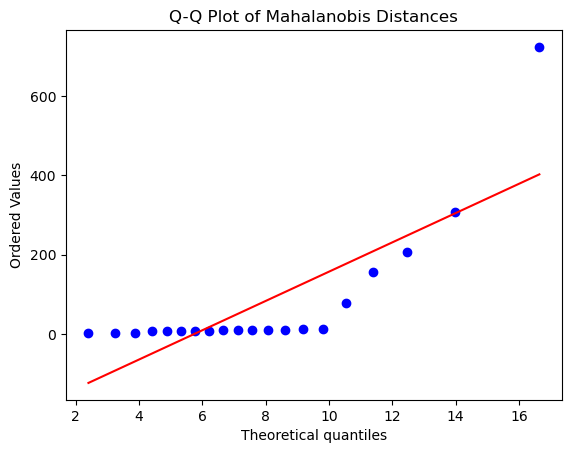

Henze-Zirkler Test:
 HZResults(hz=1.0795278119755913, pval=1.5825002782747915e-06, normal=False)


In [ ]:
# Select only the dependent variables (DVs)
X = scores_df[dv_columns].dropna()

# Compute robust Mahalanobis distances
robust_cov = MinCovDet().fit(X)
mahalanobis_distances = robust_cov.mahalanobis(X)

# Chi-squared Q-Q plot
probplot(mahalanobis_distances, dist="chi2", sparams=(len(dv_columns),), plot=plt)
plt.title("Q-Q Plot of Mahalanobis Distances")
plt.show()

# Formal multivariate normality test (Henze-Zirkler's)
normality_test = pg.multivariate_normality(scores_df[dv_columns], alpha=0.05)
print("Henze-Zirkler Test:\n", normality_test)


In [5]:
# Calculate the threshold for outliers
threshold = chi2.ppf(0.99, df=len(dv_columns))
outliers = mahalanobis_distances > threshold
# Print the number of outliers
print(f"Outlier count: {np.sum(outliers)}")
# identifying the outliers
outlier_indices = np.where(outliers)[0]
outlier_rows = scores_df.iloc[outlier_indices]
print("Outlier rows:")
print(outlier_rows)


Outlier count: 5
Outlier rows:
    chunk_size  max_tokens    rouge1    rouge2    rougeL  rougeLsum  \
0          128         128  0.240665  0.171811  0.209919   0.229688   
3          128        1024  0.351167  0.231052  0.284325   0.332217   
4          128        2048  0.347461  0.221321  0.275704   0.326842   
15        1024         128  0.031999  0.021180  0.028436   0.031318   
17        1024         512  0.081810  0.059997  0.070784   0.080223   

    bert_score_P  bert_score_R  bert_score_F1  sts_score substring_date  
0       0.714532      0.440610       0.539756   0.559266  LMForge_RUN02  
3       0.691136      0.520246       0.585593   0.609433  LMForge_RUN02  
4       0.679636      0.520178       0.581982   0.618118  LMForge_RUN02  
15      0.593533      0.313629       0.406797   0.360901  LMForge_RUN02  
17      0.637666      0.376273       0.467231   0.447940  LMForge_RUN02  


In [6]:
## homogeneity of covariance matrices 
# Box's M test
scores_df["group"] = scores_df["chunk_size"].astype(str)

# Then re-clean and re-test
df_clean = scores_df.dropna(subset=dv_columns + ["group"])
box_m = pg.box_m(data=df_clean, dvs=dv_columns, group='group')
print("Box’s M Test:\n", box_m)

Box’s M Test:
      Chi2     df  pval  equal_cov
box   inf  108.0   0.0      False


/opt/anaconda3/lib/python3.12/site-packages/pingouin/multivariate.py:386: RuntimeWarning: divide by zero encountered in log
  u = -2 * (1 - c) * np.log(M)


In [7]:
threshold = chi2.ppf(0.999, df=X.shape[1])  # 99.9% cutoff
outlier_flags = mahalanobis_distances > threshold
num_outliers = np.sum(outlier_flags)

# summary of outlier results
outlier_summary = pd.DataFrame([{
    "Total Observations": len(mahalanobis_distances),
    "Outliers Detected (p < 0.001)": num_outliers,
    "Percentage Outliers": 100 * num_outliers / len(mahalanobis_distances)
}])
print(outlier_summary)

   Total Observations  Outliers Detected (p < 0.001)  Percentage Outliers
0                  20                              5                 25.0


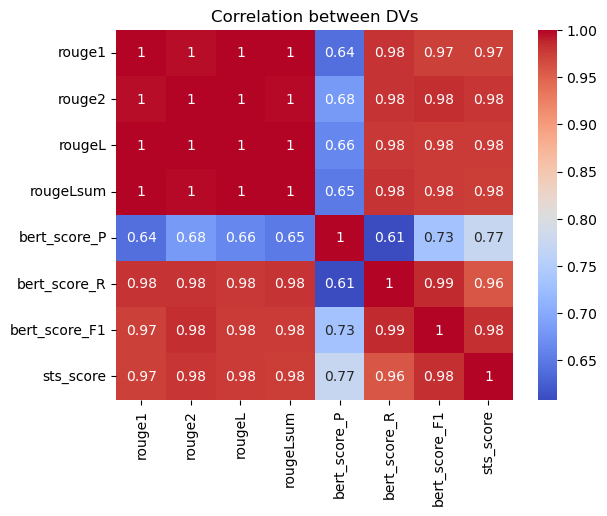

In [ ]:
# Check correlation between DVs
sns.heatmap(scores_df[dv_columns].corr(), annot=True, cmap="coolwarm")
plt.title("Correlation between DVs")
plt.show()


In [ ]:
# Check for multicollinearity

# Add a constant to the model
X_with_const = add_constant(X)
# Calculate VIF for each feature
vif_data = pd.DataFrame()
vif_data["feature"] = X_with_const.columns
vif_data["VIF"] = [variance_inflation_factor(X_with_const.values, i) for i in range(X_with_const.shape[1])]
print(vif_data)

         feature           VIF
0          const   8996.863254
1         rouge1  88353.609271
2         rouge2   4995.350022
3         rougeL  12965.565541
4      rougeLsum  62530.524231
5   bert_score_P    193.709623
6   bert_score_R   4317.033541
7  bert_score_F1   4684.069453
8      sts_score    193.722995


In [ ]:
# Define DVs
dv_columns = [
    "rouge1", "rouge2", "rougeL", "rougeLsum",
    "bert_score_P", "bert_score_R", "bert_score_F1", "sts_score"
]

# Create group variable
scores_df["group"] = scores_df["chunk_size"].astype(str)

# Drop missing
df_simple = scores_df.dropna(subset=dv_columns + ["group"])

# Create MANOVA formula
formula_simple = " + ".join(dv_columns) + " ~ group"

# Fit MANOVA
maov_simple = MANOVA.from_formula(formula_simple, data=df_simple)
print(maov_simple.mv_test())


                   Multivariate linear model
                                                                
----------------------------------------------------------------
       Intercept          Value   Num DF Den DF  F Value  Pr > F
----------------------------------------------------------------
          Wilks' lambda    0.0002 8.0000 9.0000 5157.1422 0.0000
         Pillai's trace    0.9998 8.0000 9.0000 5157.1422 0.0000
 Hotelling-Lawley trace 4584.1264 8.0000 9.0000 5157.1422 0.0000
    Roy's greatest root 4584.1264 8.0000 9.0000 5157.1422 0.0000
----------------------------------------------------------------
                                                                
----------------------------------------------------------------
         group           Value    Num DF  Den DF F Value  Pr > F
----------------------------------------------------------------
          Wilks' lambda   0.0000 24.0000 26.7040  44.8593 0.0000
         Pillai's trace   2.6072 24.0000 33.0

In [ ]:
# Type III ANOVA

# Fit the model using OLS
def type_3(formula, data):
    """
    Perform Type III ANOVA using the given formula and data.
    """
    model = ols(formula, data=data).fit()
    anova_results = anova_lm(model, typ=3)
    return anova_results

# Perform Type III ANOVA for each dependent variable
results = []
for column in dv_columns:
    formula = f"{column} ~ group"
    anova_results = type_3(formula, df_clean)
    print(f"ANOVA results for {column}:\n", anova_results)
    results.append((column, anova_results))

# results
anova_results_dict = {column: result for column, result in results}



ANOVA results for rouge1:
              sum_sq    df          F    PR(>F)
Intercept  0.029093   1.0  13.816819  0.001873
group      0.178835   3.0  28.310453  0.000001
Residual   0.033690  16.0        NaN       NaN
ANOVA results for rouge2:
              sum_sq    df          F    PR(>F)
Intercept  0.016336   1.0  16.238389  0.000970
group      0.072025   3.0  23.865055  0.000004
Residual   0.016096  16.0        NaN       NaN
ANOVA results for rougeL:
              sum_sq    df          F        PR(>F)
Intercept  0.022291   1.0  17.462634  7.092123e-04
group      0.113757   3.0  29.704922  8.945681e-07
Residual   0.020424  16.0        NaN           NaN
ANOVA results for rougeLsum:
              sum_sq    df          F    PR(>F)
Intercept  0.028120   1.0  14.524290  0.001536
group      0.156535   3.0  26.950182  0.000002
Residual   0.030978  16.0        NaN       NaN
ANOVA results for bert_score_P:
              sum_sq    df            F        PR(>F)
Intercept  2.036713   1.0  6344.848

In [ ]:
scores_df["group"] = scores_df["chunk_size"].astype(str)
df_simple = scores_df.dropna(subset=dv_columns + ["group"])

# Create distance matrix and group labels reference: https://scikit.bio/docs/dev/generated/skbio.stats.distance.html
X = df_simple[dv_columns].values
group_labels = df_simple["group"].values
distance_matrix = DistanceMatrix(squareform(pdist(X, metric='euclidean')))

# Run PERMANOVA
results = permanova(distance_matrix, grouping=group_labels, permutations=999)
print("PERMANOVA results for chunk_size groups:")
print(results)



scores_df["group2"] = scores_df[["max_tokens"]].astype(str)
# Create distance matrix and group labels
X2 = scores_df[dv_columns].values
distance_matrix2 = DistanceMatrix(squareform(pdist(X2, metric='euclidean')))
# Run PERMANOVA for the second group
results2 = permanova(distance_matrix2, grouping=scores_df["group2"].values, permutations=999)
print("PERMANOVA results for max_tokens groups:")
print(results2)



PERMANOVA results for chunk_size groups:
method name               PERMANOVA
test statistic name        pseudo-F
sample size                      20
number of groups                  4
test statistic            23.744764
p-value                       0.001
number of permutations          999
Name: PERMANOVA results, dtype: object
PERMANOVA results for max_tokens groups:
method name               PERMANOVA
test statistic name        pseudo-F
sample size                      20
number of groups                  5
test statistic             0.736644
p-value                       0.565
number of permutations          999
Name: PERMANOVA results, dtype: object


MANOVA results on PCA components:
                  Multivariate linear model
                                                            
------------------------------------------------------------
       Intercept        Value  Num DF  Den DF F Value Pr > F
------------------------------------------------------------
          Wilks' lambda 0.2891 2.0000 15.0000 18.4387 0.0001
         Pillai's trace 0.7109 2.0000 15.0000 18.4387 0.0001
 Hotelling-Lawley trace 2.4585 2.0000 15.0000 18.4387 0.0001
    Roy's greatest root 2.4585 2.0000 15.0000 18.4387 0.0001
------------------------------------------------------------
                                                            
------------------------------------------------------------
         group          Value  Num DF  Den DF F Value Pr > F
------------------------------------------------------------
          Wilks' lambda 0.0639 6.0000 30.0000 14.7822 0.0000
         Pillai's trace 1.4756 6.0000 32.0000 15.0083 0.0000
 Hotell

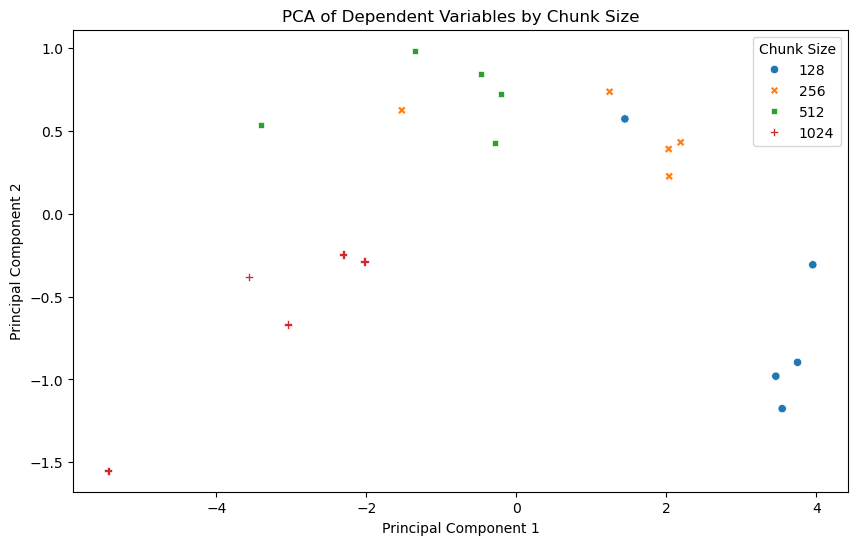

In [27]:
# PCA + MANOVA 
scores_df["group"] = scores_df["chunk_size"].astype(str)
df_clean = scores_df.dropna(subset=dv_columns + ["group"])

# Standardize the dependent variables
scaler = StandardScaler()
X_scaled = scaler.fit_transform(df_clean[dv_columns])

# Perform PCA
pca = PCA(n_components=2)
X_pca = pca.fit_transform(X_scaled)

# Add principal components to the dataframe
df_clean["PC1"] = X_pca[:, 0]
df_clean["PC2"] = X_pca[:, 1]

# Run MANOVA on the first two principal components
from statsmodels.multivariate.manova import MANOVA
maov_pca = MANOVA.from_formula("PC1 + PC2 ~ group", data=df_clean)
manova_pca_results = maov_pca.mv_test()
print("MANOVA results on PCA components:\n", manova_pca_results)
# Plot PCA results
plt.figure(figsize=(10, 6))
sns.scatterplot(data=df_clean, x="PC1", y="PC2", hue="group", style="group")
plt.title("PCA of Dependent Variables by Chunk Size")
plt.xlabel("Principal Component 1")
plt.ylabel("Principal Component 2")
plt.legend(title="Chunk Size")
plt.show()

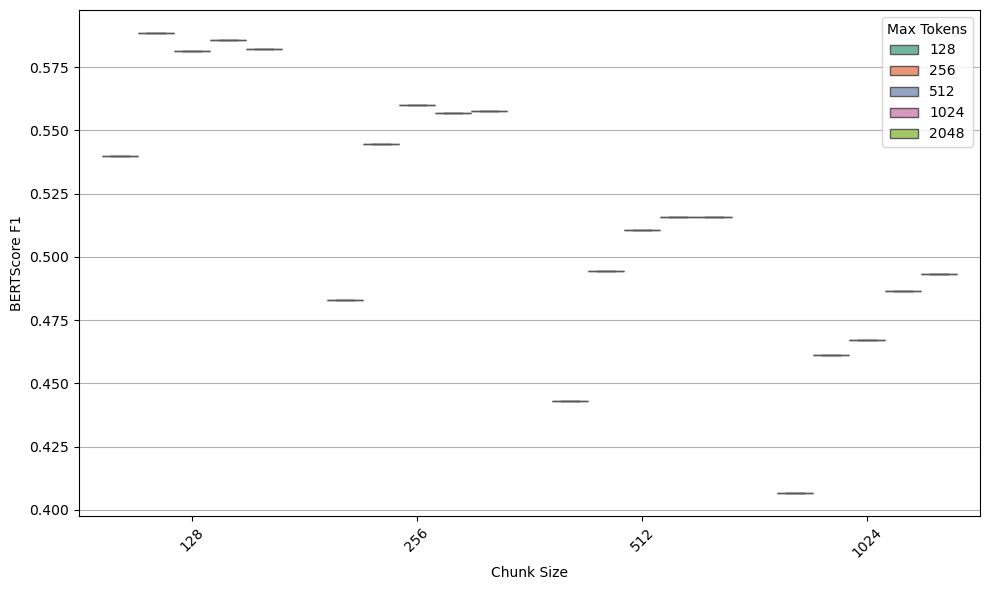

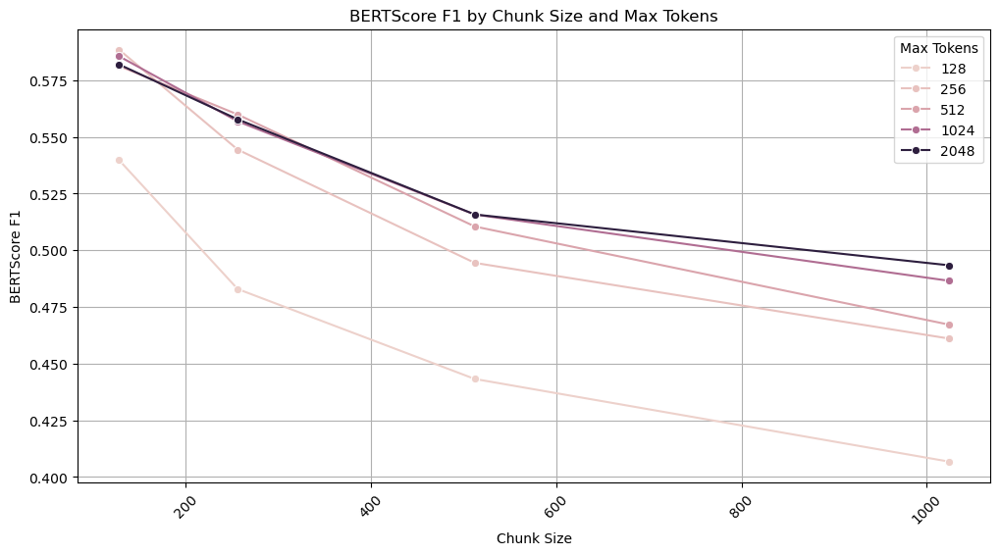

In [3]:
plt.figure(figsize=(10, 6))
sns.boxplot(x='chunk_size', y='bert_score_F1', hue='max_tokens', data=scores_df, palette="Set2")
plt.xlabel("Chunk Size")
plt.ylabel("BERTScore F1")
plt.xticks(rotation=45)
plt.legend(title="Max Tokens")
plt.grid(axis='y')
plt.tight_layout()
plt.figure(figsize=(12, 6))
sns.lineplot(data=scores_df, x='chunk_size', y='bert_score_F1', hue='max_tokens', marker='o')
plt.xlabel("Chunk Size")
plt.ylabel("BERTScore F1")
plt.title("BERTScore F1 by Chunk Size and Max Tokens")
plt.xticks(rotation=45)
plt.legend(title="Max Tokens")
plt.grid()

In [6]:
from itertools import combinations
from scipy.spatial.distance import pdist, squareform

pairwise_results = []
scores_df["group"] = scores_df["chunk_size"].astype(str)

# Looping through the combinations of groups
for grp1, grp2 in combinations(scores_df["group"].unique(), 2):
    subset = scores_df[scores_df["group"].isin([grp1, grp2])].copy()
    subset = subset.reset_index(drop=True)
    
    # Distance matrix
    X_pair = subset[dv_columns].values
    distance_array = squareform(pdist(X_pair, metric='euclidean'))
    ids = [str(i) for i in subset.index]
    distance_matrix = DistanceMatrix(distance_array, ids=ids)
    
    # DataFrame with group labels
    grouping_df = pd.DataFrame({'group': subset["group"].values}, index=ids)
    
    # PERMANOVA 
    result = permanova(distance_matrix, grouping=grouping_df, column='group', permutations=999)
    
    pairwise_results.append({
        "Group 1": grp1,
        "Group 2": grp2,
        "Pseudo-F": result["test statistic"],
        "p-value": result["p-value"]
    })

pairwise_df = pd.DataFrame(pairwise_results)
print(pairwise_df)


  Group 1 Group 2   Pseudo-F  p-value
0     128     256   7.242994    0.029
1     128     512  36.159047    0.007
2     128    1024  75.109721    0.009
3     256     512   7.081500    0.030
4     256    1024  23.854621    0.010
5     512    1024   6.190598    0.035


In [12]:
# Compute group means
group_means = scores_df.groupby('chunk_size')[dv_columns].mean().mean(axis=1).sort_index()
print("Group Means:")
print(group_means)

differences = []
# Calculate differences between each pair of groups
for (grp1, grp2) in combinations(group_means.index, 2):
    diff = group_means[grp2] - group_means[grp1]
    differences.append({
        "Group 1": grp1,
        "Group 2": grp2,
        "Mean Difference": diff
    })

differences_df = pd.DataFrame(differences)
print("Mean Differences between Groups:")
print(differences_df)


Group Means:
chunk_size
128     0.436578
256     0.381648
512     0.321881
1024    0.271981
dtype: float64
Mean Differences between Groups:
   Group 1  Group 2  Mean Difference
0      128      256        -0.054930
1      128      512        -0.114697
2      128     1024        -0.164598
3      256      512        -0.059767
4      256     1024        -0.109668
5      512     1024        -0.049901


In [8]:
# Step 1: Compute group means per DV
group_means = scores_df.groupby('chunk_size')[dv_columns].mean().sort_index()
print("Group Means:")
print(group_means)

# Step 2: Compute pairwise mean differences for each DV
differences = []
chunk_sizes = group_means.index.tolist()

for dv in dv_columns:
    for grp1, grp2 in combinations(chunk_sizes, 2):
        diff = group_means.loc[grp2, dv] - group_means.loc[grp1, dv]
        differences.append({
            "Dependent Variable": dv,
            "Group 1": grp1,
            "Group 2": grp2,
            "Mean Difference": diff
        })

# Step 3: Convert to DataFrame
differences_df = pd.DataFrame(differences)
print("Mean Differences between Groups for Each DV:")
print(differences_df)

Group Means:
              rouge1    rouge2    rougeL  rougeLsum  bert_score_P  \
chunk_size                                                          
128         0.325832  0.216365  0.266557   0.308374      0.696190   
256         0.231468  0.158992  0.191592   0.223323      0.709704   
512         0.138051  0.100932  0.118642   0.134836      0.695675   
1024        0.076280  0.057159  0.066770   0.074994      0.638234   

            bert_score_R  bert_score_F1  sts_score  
chunk_size                                          
128             0.501457       0.575429   0.602425  
256             0.445231       0.540396   0.552478  
512             0.392216       0.495966   0.498733  
1024            0.370272       0.463017   0.429117  
Mean Differences between Groups for Each DV:
   Dependent Variable  Group 1  Group 2  Mean Difference
0              rouge1      128      256        -0.094364
1              rouge1      128      512        -0.187781
2              rouge1      128     102

In [ ]:
from scipy.stats import ttest_ind
from itertools import combinations
from statsmodels.stats.multitest import multipletests

# Pairwise t-tests for each dependent variable
results = []
for dv in dv_columns:
    for grp1, grp2 in combinations(scores_df["chunk_size"].unique(), 2):
        vals1 = scores_df[scores_df["chunk_size"] == grp1][dv]
        vals2 = scores_df[scores_df["chunk_size"] == grp2][dv]
        t_stat, p_val = ttest_ind(vals1, vals2, equal_var=False)
        results.append({
            "Outcome": dv,
            "Group 1": grp1,
            "Group 2": grp2,
            "t-statistic": t_stat,
            "raw p-value": p_val
        })

ttest_df = pd.DataFrame(results)

# Applying the FDR (Benjamini-Hochberg) correction
reject, fdr_pvals, sidak_thresh, bonf_thresh = multipletests(ttest_df["raw p-value"], method='fdr_bh')
ttest_df["FDR (BH) p-value"] = fdr_pvals
ttest_df["Significant (FDR < 0.05)"] = reject

# results
print(ttest_df.head())
ttest_df.to_csv("pairwise_ttests_fdr.csv", index=False)


  Outcome  Group 1  Group 2  t-statistic  raw p-value  FDR (BH) p-value  \
0  rouge1      128      256     2.851769     0.022036          0.037495   
1  rouge1      128      512     6.401473     0.000212          0.001272   
2  rouge1      128     1024     9.856474     0.000029          0.000346   
3  rouge1      256      512     2.891892     0.021223          0.037495   
4  rouge1      256     1024     5.406126     0.001538          0.004407   

   Significant (FDR < 0.05)  
0                      True  
1                      True  
2                      True  
3                      True  
4                      True  
